In [5]:
#!!!!!!!!! CHANGE TO PYTHON KERNEL !!!!!!!!!!!!!

#CELL NAME:  PYTHON MUNGE
#THIS CELL CREATES THE AIRPORT WAIT DATASET 

#Set up Python environment, import data, cleanse, and create categorical variables

#Import libraries
import numpy as np
import pandas as pd
#import matplotlib.pyplot as plt
#from matplotlib import style
import datetime
from datetime import datetime
#from pandas import HDFStore

#Import Airport Checkpoint Wait Data from TSA
#Note:  first import is for code development, second is for entire dataset--run only one
#AptWaits = pd.read_csv("C:/Users/Sir Thomas/My Documents/AptWaits.txt", delimiter=',', nrows = 1000)
AptWaits = pd.read_csv("C:/Anaconda3/Data/AptWaits.txt", delimiter=',')


#Provide logical checks, view summary stats, and eyeball quality of imported dataset
print("---INPUT DATA HEAD---", "\n", AptWaits.head(10), "\n") 
print("---INPUT DATA TAIL---", "\n", AptWaits.tail(10), "\n") 
#print("---INPUT DATA TYPES---", "\n", AptWaits.dtypes, "\n") 
#print("---INPUT DATA INDEX---", "\n", AptWaits.index, "\n") 
#print("---INPUT DATA COLUMNS---", "\n", AptWaits.columns, "\n") 
print("---INPUT DATA DESCRIPTION---", "\n", AptWaits.describe(), "\n") 
print("---INPUT DATA INFO---")
print(AptWaits.info(memory_usage='deep'), "\n")
print("---INPUT DATA MEMORY USAGE---", "\n", AptWaits.memory_usage(deep=True), "\n")

#Change data types to save memory
AptWaits['ID'] = AptWaits['ID'].astype('uint32')
AptWaits['Airport'] = AptWaits['Airport'].astype('category')
AptWaits['Date'] = AptWaits['Date'].astype('category')
AptWaits['HourRaw'] = AptWaits['HourRaw'].astype('category')
AptWaits['WaitTime'] = AptWaits['WaitTime'].astype('uint8')
AptWaits['Lane'] = AptWaits['Lane'].astype('category')
AptWaits['Hour'] = AptWaits['Hour'].astype('category')
AptWaits['Day'] = AptWaits['Day'].astype('category')
AptWaits['Month'] = AptWaits['Month'].astype('category')
AptWaits['AptName'] = AptWaits['AptName'].astype('category')
AptWaits['Airport City'] = AptWaits['Airport City'].astype('category')
AptWaits['Airport State'] = AptWaits['Airport State'].astype('category')
AptWaits['Airport Zip Code'] = AptWaits['Airport Zip Code'].astype('category')
AptWaits['Cat'] = AptWaits['Cat'].astype('category')
AptWaits['Latitude'] = AptWaits['Latitude'].astype('float16')
AptWaits['Longitude'] = AptWaits['Longitude'].astype('float16')
AptWaits['Size'] = AptWaits['Size'].astype('float16')

#Check data size after type changes
print("---REDUCED SIZE INPUT DATA INFO---")
print(AptWaits.info(memory_usage='deep'), "\n")
print("---REDUCED SIZE INPUT DATA MEMORY USAGE---", "\n", AptWaits.memory_usage(deep=True), "\n")

#Sort data by original key/index, which is ID
#Note:  Sort is not working for first 15 records in Fort Wayne--unclear why
#       Otherwise the data already appear to be sorted, so assume new sort not needed
#       In case you want to sort, use:
#AptWaits.sort_values('ID', ascending=True)

#The original Oracle data source splits date from time, which apparently SQL and Python do not like
#Original data munging was performed in SQL, which put artificial time in the date field,
#    artificial date in the time field, and both artificial vestigial artifacts are wrong
#I want to use Python to correct the vestigial artifacts, but Python similarly does not seem to like
#    dates alone or time alone, unless in text format
#After some experimentation, the following code worked:

#Strip date text only from Date, time text only from Hour, concatenate and convert to DateTime
AptWaits["DateDT"] = pd.to_datetime(AptWaits["Date"])
AptWaits["DateOnlyTemp"] = AptWaits["DateDT"].apply(lambda x:  x.strftime('%Y-%m-%d'))
AptWaits["YearMonth"] = AptWaits["DateDT"].apply(lambda x:  x.strftime('%Y-%m'))
AptWaits["HourDT"] = pd.to_datetime(AptWaits["Hour"])
AptWaits["HourOnly"] = AptWaits["HourDT"].apply(lambda x:  x.strftime('%H:%M'))
AptWaits["DateOnlyTemp"] = AptWaits["DateOnlyTemp"].astype(str)
AptWaits["HourOnly"] = AptWaits["HourOnly"].astype(str)
AptWaits["DateOnly"] = AptWaits["DateOnlyTemp"] + " "
AptWaits["DateTimeObj"] = AptWaits[["DateOnly", "HourOnly"]].apply(lambda x: "".join(x), axis=1)
AptWaits["DateTimeDT"] = pd.to_datetime(AptWaits["DateTimeObj"])
AptWaits["DateOnly"] = AptWaits["DateOnly"].astype('category')
AptWaits["YearMonth"] = AptWaits["YearMonth"].astype('category')
AptWaits["HourOnly"] = AptWaits["HourOnly"].astype('category')
AptWaits["DateTimeObj"] = AptWaits["DateTimeObj"].astype('category')

#Note:  Now DateTimeDT is the defining time stamp on all records
#    DateTime is not necessarily unique by airport because regular lanes and precheck lanes can have the same time stamp
#    Also note that in the original data, regular lanes are marked with "00" minutes and precheck with "30"
#    The original database did not have a variable for precheck, hence the "30" minute designation
#    Otherwise all time stamps have been converted to even hours, including precheck lanes
#    The combination of airport code, datetime, and lane should be a unique composite key, check by the following:

#Check if dates are in the correct range
print("---DATE MIN MAX---", "\n", AptWaits["DateTimeDT"].min(), "\n", AptWaits["DateTimeDT"].max(), "\n")

FindDups1 = AptWaits[AptWaits.duplicated(['Airport', 'Lane', 'DateTimeDT'],keep=False)]
print("---DUPLICATE KEYS PRIOR TO CLEANUP---", "\n", FindDups1, "\n")
#Note: discrepancies discovered appear to have different values to lat/long coordinates
#    This is an artifact of duplicate values in original lat/long lookup in MS Access routine
#    Need to clean up lookup values before this goes into production mode

#De-duplicate dataset
AptWaits.drop_duplicates(subset=['Airport', 'Lane', 'DateTimeDT'], keep='first', inplace=True)
#Check to see if duplicates remain
FindDups2 = AptWaits[AptWaits.duplicated(['Airport', 'Lane', 'DateTimeDT'],keep=False)]
print("---DUPLICATE KEYS AFTER CLEANUP---", "\n", FindDups2, "\n")

#Check for null values
AirportNull = AptWaits.Airport.isnull().sum().astype('uint16')
print("---NULL VALUES FOR AIRPORT---", "\n", AirportNull)
WaitTimeNull = AptWaits.WaitTime.isnull().sum().astype('uint16')
print("---NULL VALUES FOR WAIT TIME---", "\n", WaitTimeNull)
SizeNull = AptWaits.Size.isnull().sum().astype('uint16')  #Note:  overseas airports not rated for size
print("---NULL VALUES FOR SIZE---", "\n", SizeNull)
LaneNull = AptWaits.Lane.isnull().sum().astype('uint16')
print("---NULL VALUES FOR LANE---", "\n", LaneNull, "\n")

#Discretize Wait Time for use in future categorical analytics
AptWaits.loc[AptWaits.WaitTime < 5, 'Wait05orMore'] = 0
AptWaits.loc[AptWaits.WaitTime >= 5, 'Wait05orMore'] = 1
AptWaits.loc[AptWaits.WaitTime < 10, 'Wait10orMore'] = 0
AptWaits.loc[AptWaits.WaitTime >= 10, 'Wait10orMore'] = 1
AptWaits.loc[AptWaits.WaitTime < 15, 'Wait15orMore'] = 0
AptWaits.loc[AptWaits.WaitTime >= 15, 'Wait15orMore'] = 1
AptWaits.loc[AptWaits.WaitTime < 20, 'Wait20orMore'] = 0
AptWaits.loc[AptWaits.WaitTime >= 20, 'Wait20orMore'] = 1
AptWaits.loc[AptWaits.WaitTime < 30, 'Wait30orMore'] = 0
AptWaits.loc[AptWaits.WaitTime >= 30, 'Wait30orMore'] = 1
AptWaits['Wait05orMore'] = AptWaits['Wait05orMore'].astype('uint8')
AptWaits['Wait10orMore'] = AptWaits['Wait10orMore'].astype('uint8')
AptWaits['Wait15orMore'] = AptWaits['Wait15orMore'].astype('uint8')
AptWaits['Wait20orMore'] = AptWaits['Wait20orMore'].astype('uint8')
AptWaits['Wait30orMore'] = AptWaits['Wait30orMore'].astype('uint8')

#Create categorical variables for selected Cat X individual airports
AptWaits["JFK"] = AptWaits["Airport"].apply(lambda x: 1 if x=="JFK" else 0)
AptWaits["BOS"] = AptWaits["Airport"].apply(lambda x: 1 if x=="BOS" else 0)
AptWaits["LAX"] = AptWaits["Airport"].apply(lambda x: 1 if x=="LAX" else 0)
AptWaits["LAS"] = AptWaits["Airport"].apply(lambda x: 1 if x=="LAS" else 0)
AptWaits["DCA"] = AptWaits["Airport"].apply(lambda x: 1 if x=="DCA" else 0)
AptWaits["IAD"] = AptWaits["Airport"].apply(lambda x: 1 if x=="IAD" else 0)
AptWaits["BWI"] = AptWaits["Airport"].apply(lambda x: 1 if x=="BWI" else 0)
AptWaits["ORD"] = AptWaits["Airport"].apply(lambda x: 1 if x=="ORD" else 0)
AptWaits["EWR"] = AptWaits["Airport"].apply(lambda x: 1 if x=="EWR" else 0)
AptWaits["MCO"] = AptWaits["Airport"].apply(lambda x: 1 if x=="MCO" else 0)
AptWaits["DFW"] = AptWaits["Airport"].apply(lambda x: 1 if x=="DFW" else 0)
AptWaits["MIA"] = AptWaits["Airport"].apply(lambda x: 1 if x=="MIA" else 0)
AptWaits["JFK"] = AptWaits["JFK"].astype('category')
AptWaits["BOS"] = AptWaits["BOS"].astype('category')
AptWaits["LAX"] = AptWaits["LAX"].astype('category')
AptWaits["LAS"] = AptWaits["LAS"].astype('category')
AptWaits["DCA"] = AptWaits["DCA"].astype('category')
AptWaits["IAD"] = AptWaits["IAD"].astype('category')
AptWaits["BWI"] = AptWaits["BWI"].astype('category')
AptWaits["ORD"] = AptWaits["ORD"].astype('category')
AptWaits["EWR"] = AptWaits["EWR"].astype('category')
AptWaits["MCO"] = AptWaits["MCO"].astype('category')
AptWaits["DFW"] = AptWaits["DFW"].astype('category')
AptWaits["MIA"] = AptWaits["MIA"].astype('category')

#Create some time variables to fit nonlinear daytime trends
#AptWaits["HourObj2"] = AptWaits["Hour"].astype(str).str[11:13]
#AptWaits["HourInt"] = pd.to_numeric(AptWaits["HourObj2"]) #throws an error, so instead use:
AptWaits["HourObj"] = AptWaits["HourDT"].apply(lambda x:  x.strftime('%H'))
AptWaits["HourInt"] = pd.to_numeric(AptWaits["HourObj"])
AptWaits["HourIntSquared"] = AptWaits["HourInt"]**2
AptWaits["HourIntCubed"] = AptWaits["HourInt"]**3
AptWaits["HourObj"] = AptWaits["HourObj"].astype('category')
AptWaits["HourInt"] = AptWaits["HourInt"].astype('uint8')
AptWaits["HourIntSquared"] = AptWaits["HourIntSquared"].astype('uint16')
AptWaits["HourIntCubed"] = AptWaits["HourIntCubed"].astype('uint16')

AptWaits["AMRush"] = AptWaits["HourInt"].apply(lambda x: 1 if ((x>=5) & (x<=7)) else 0)
AptWaits["PMRush"] = AptWaits["HourInt"].apply(lambda x: 1 if ((x>=15) & (x<=17)) else 0)
AptWaits["AMRush"] = AptWaits["AMRush"].astype('uint8')
AptWaits["PMRush"] = AptWaits["PMRush"].astype('uint8')

#Create filters/binary independent variables for month and day of the week
AptWaits["Jan"] = AptWaits["Month"].apply(lambda x: 1 if x=="Jan" else 0)
AptWaits["Feb"] = AptWaits["Month"].apply(lambda x: 1 if x=="Feb" else 0)
AptWaits["Mar"] = AptWaits["Month"].apply(lambda x: 1 if x=="Mar" else 0)
AptWaits["Apr"] = AptWaits["Month"].apply(lambda x: 1 if x=="Apr" else 0)
AptWaits["May"] = AptWaits["Month"].apply(lambda x: 1 if x=="May" else 0)
AptWaits["Jun"] = AptWaits["Month"].apply(lambda x: 1 if x=="Jun" else 0)
AptWaits["Jul"] = AptWaits["Month"].apply(lambda x: 1 if x=="Jul" else 0)
AptWaits["Aug"] = AptWaits["Month"].apply(lambda x: 1 if x=="Aug" else 0)
AptWaits["Sep"] = AptWaits["Month"].apply(lambda x: 1 if x=="Sep" else 0)
AptWaits["Oct"] = AptWaits["Month"].apply(lambda x: 1 if x=="Oct" else 0)
AptWaits["Nov"] = AptWaits["Month"].apply(lambda x: 1 if x=="Nov" else 0)
AptWaits["Dec"] = AptWaits["Month"].apply(lambda x: 1 if x=="Dec" else 0)
AptWaits["Mon"] = AptWaits["Day"].apply(lambda x: 1 if x=="Mon" else 0)
AptWaits["Tue"] = AptWaits["Day"].apply(lambda x: 1 if x=="Tue" else 0)
AptWaits["Wed"] = AptWaits["Day"].apply(lambda x: 1 if x=="Wed" else 0)
AptWaits["Thu"] = AptWaits["Day"].apply(lambda x: 1 if x=="Thu" else 0)
AptWaits["Fri"] = AptWaits["Day"].apply(lambda x: 1 if x=="Fri" else 0)
AptWaits["Sat"] = AptWaits["Day"].apply(lambda x: 1 if x=="Sat" else 0)
AptWaits["Sun"] = AptWaits["Day"].apply(lambda x: 1 if x=="Sun" else 0)
AptWaits["Jan"] = AptWaits["Jan"].astype('uint8')
AptWaits["Feb"] = AptWaits["Feb"].astype('uint8')
AptWaits["Mar"] = AptWaits["Mar"].astype('uint8')
AptWaits["Apr"] = AptWaits["Apr"].astype('uint8')
AptWaits["May"] = AptWaits["May"].astype('uint8')
AptWaits["Jun"] = AptWaits["Jun"].astype('uint8')
AptWaits["Jul"] = AptWaits["Jul"].astype('uint8')
AptWaits["Aug"] = AptWaits["Aug"].astype('uint8')
AptWaits["Sep"] = AptWaits["Sep"].astype('uint8')
AptWaits["Oct"] = AptWaits["Oct"].astype('uint8')
AptWaits["Nov"] = AptWaits["Nov"].astype('uint8')
AptWaits["Dec"] = AptWaits["Dec"].astype('uint8')
AptWaits["Mon"] = AptWaits["Mon"].astype('uint8')
AptWaits["Tue"] = AptWaits["Tue"].astype('uint8')
AptWaits["Wed"] = AptWaits["Wed"].astype('uint8')
AptWaits["Thu"] = AptWaits["Thu"].astype('uint8')
AptWaits["Fri"] = AptWaits["Fri"].astype('uint8')
AptWaits["Sat"] = AptWaits["Sat"].astype('uint8')
AptWaits["Sun"] = AptWaits["Sun"].astype('uint8')

#Compare what the new dataset looks like, if it looks good, run entire dataset and save in next cell
pd.set_option('display.max_columns', None)
print("---OUTPUT DATA HEAD---", "\n", AptWaits.head(10), "\n") 
print("---OUTPUT DATA TAIL---", "\n", AptWaits.tail(10), "\n") 
#pd.set_option('display.max_rows', None)
#print("---OUTPUT DATA TYPES---", "\n", AptWaits.dtypes, "\n") 
#pd.set_option('display.max_rows', 100)
#print("---OUTPUT DATA INDEX---", "\n", AptWaits.index, "\n") 
#print("---OUTPUT DATA COLUMNS---", "\n", AptWaits.columns, "\n") 
print("---OUTPUT DATA DESCRIPTION---", "\n", AptWaits.describe(), "\n") 
print("---OUTPUT DATA INFO---")
print(AptWaits.info(memory_usage='deep'), "\n")
print("---OUTPUT DATA MEMORY USAGE---", "\n", AptWaits.memory_usage(deep=True), "\n")



---INPUT DATA HEAD--- 
        ID Airport                Date HourRaw  WaitTime      Lane  \
0  193060     FWA  24/10/2014 0:00:00   12:00       2.0   Regular   
1  193061     FWA  24/10/2014 0:00:00   12:30       2.0  PreCheck   
2  193062     FWA  24/10/2014 0:00:00   13:00       2.0   Regular   
3  193063     FWA  24/10/2014 0:00:00   13:30       0.0  PreCheck   
4  193064     FWA  24/10/2014 0:00:00   14:00       4.0   Regular   
5  193065     FWA  24/10/2014 0:00:00   14:30       2.0  PreCheck   
6  193066     FWA  24/10/2014 0:00:00   15:00       1.0   Regular   
7  193067     FWA  24/10/2014 0:00:00   15:30       0.0  PreCheck   
8  193068     FWA  24/10/2014 0:00:00   16:00       2.0   Regular   
9  193069     FWA  24/10/2014 0:00:00   16:30       0.0  PreCheck   

                  Hour  Day Month  \
0  30/12/1899 12:00:00  Fri   Oct   
1  30/12/1899 12:00:00  Fri   Oct   
2  30/12/1899 13:00:00  Fri   Oct   
3  30/12/1899 13:00:00  Fri   Oct   
4  30/12/1899 14:00:00  Fri   O

---DATE MIN MAX--- 
 2014-01-10 00:00:00 
 2015-12-09 23:00:00 

---DUPLICATE KEYS PRIOR TO CLEANUP--- 
               ID Airport               Date HourRaw  WaitTime     Lane  \
768          754     BQN  24/9/2014 0:00:00   01:00         2  Regular   
769          754     BQN  24/9/2014 0:00:00   01:00         2  Regular   
770          755     BQN  24/9/2014 0:00:00   02:00         2  Regular   
771          755     BQN  24/9/2014 0:00:00   02:00         2  Regular   
772          756     BQN  24/9/2014 0:00:00   08:00         5  Regular   
...          ...     ...                ...     ...       ...      ...   
2457458  2438134     STX  24/9/2015 0:00:00   17:00         1  Regular   
2457889  2438565     PSE  25/9/2015 0:00:00   01:00         3  Regular   
2457890  2438565     PSE  25/9/2015 0:00:00   01:00         3  Regular   
2457891  2438566     PSE  25/9/2015 0:00:00   02:00         6  Regular   
2457892  2438566     PSE  25/9/2015 0:00:00   02:00         6  Regular   

      

---OUTPUT DATA DESCRIPTION--- 
                  ID      WaitTime      Latitude     Longitude       Size  \
count  2.438569e+06  2.438569e+06  2.418905e+06  2.418905e+06  2418905.0   
mean   1.219285e+06  2.879341e+00           NaN           NaN        NaN   
std    7.039544e+05  3.499843e+00  0.000000e+00  0.000000e+00        0.0   
min    1.000000e+00  0.000000e+00 -1.432812e+01 -1.766250e+02        1.0   
25%    6.096430e+05  1.000000e+00  3.343750e+01 -1.063750e+02        2.0   
50%    1.219285e+06  2.000000e+00  3.825000e+01 -8.850000e+01        3.0   
75%    1.828927e+06  4.000000e+00  4.181250e+01 -8.018750e+01        4.0   
max    2.438569e+06  8.700000e+01  7.125000e+01  1.457500e+02        5.0   

       Wait05orMore  Wait10orMore  Wait15orMore  Wait20orMore  Wait30orMore  \
count  2.438569e+06  2.438569e+06  2.438569e+06  2.438569e+06  2.438569e+06   
mean   2.071469e-01  5.277521e-02  1.731384e-02  2.672879e-03  4.658470e-04   
std    4.052618e-01  2.235845e-01  1.304380e-0

Registered S3 methods overwritten by 'ggplot2':
  method         from 
  [.quosures     rlang
  c.quosures     rlang
  print.quosures rlang
Warning message:
"package 'dplyr' was built under R version 3.6.1"
Attaching package: 'dplyr'

The following objects are masked from 'package:stats':

    filter, lag

The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union




YEAR MONTH COUNTS
# A tibble: 24 x 2
# Groups:   YearMonth [24]
   YearMonth      n
   <fct>      <int>
 1 2014-01    19053
 2 2014-02    19649
 3 2014-03    19584
 4 2014-04    18959
 5 2014-05    19468
 6 2014-06    19185
 7 2014-07    19602
 8 2014-08    18991
 9 2014-09    62700
10 2014-10   145823
11 2014-11   137841
12 2014-12   146335
13 2015-01   183404
14 2015-02   166417
15 2015-03   189437
16 2015-04   179327
17 2015-05   187691
18 2015-06   183858
19 2015-07   190290
20 2015-08   189120
21 2015-09   140885
22 2015-10    60436
23 2015-11    60080
24 2015-12    60434

YEAR MONTH COUNTS AFTER FILTER
# A tibble: 12 x 2
# Groups:   YearMonth [12]
   YearMonth      n
   <fct>      <int>
 1 2014-10   145823
 2 2014-11   137841
 3 2014-12   146335
 4 2015-01   183404
 5 2015-02   166417
 6 2015-03   189437
 7 2015-04   179327
 8 2015-05   187691
 9 2015-06   183858
10 2015-07   190290
11 2015-08   189120
12 2015-09   140885

BLANKS IN WAIT TIME
[1] 0

BLANKS IN AIRPORT
[1] 0

BLAN

ID,Airport,Date,HourRaw,WaitTime,Lane,Hour,Day,Month,AptName,...,Fri,Sat,Sun,PreCheck,CatX,CatI,CatII,CatIII,CatIV,WaitTimeContinuous
193060,FWA,24/10/2014 0:00:00,12:00,2,Regular,30/12/1899 12:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,0,0,0,1,0,0,2.0620629
193061,FWA,24/10/2014 0:00:00,12:30,2,PreCheck,30/12/1899 12:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,1,0,0,1,0,0,2.4968498
193062,FWA,24/10/2014 0:00:00,13:00,2,Regular,30/12/1899 13:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,0,0,0,1,0,0,2.0409217
193063,FWA,24/10/2014 0:00:00,13:30,0,PreCheck,30/12/1899 13:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,1,0,0,1,0,0,0.1642874
193064,FWA,24/10/2014 0:00:00,14:00,4,Regular,30/12/1899 14:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,0,0,0,1,0,0,3.6311028
193065,FWA,24/10/2014 0:00:00,14:30,2,PreCheck,30/12/1899 14:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,1,0,0,1,0,0,2.2886876
193066,FWA,24/10/2014 0:00:00,15:00,1,Regular,30/12/1899 15:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,0,0,0,1,0,0,0.9416670
193067,FWA,24/10/2014 0:00:00,15:30,0,PreCheck,30/12/1899 15:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,1,0,0,1,0,0,0.4598869
193068,FWA,24/10/2014 0:00:00,16:00,2,Regular,30/12/1899 16:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,0,0,0,1,0,0,2.0330710
193069,FWA,24/10/2014 0:00:00,16:30,0,PreCheck,30/12/1899 16:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,1,0,0,1,0,0,0.2655278


,ID,Airport,Date,HourRaw,WaitTime,Lane,Hour,Day,Month,AptName,...,Fri,Sat,Sun,PreCheck,CatX,CatI,CatII,CatIII,CatIV,WaitTimeContinuous
2040409,2438550,YNG,24/9/2015 0:00:00,11:00,1,Regular,30/12/1899 11:00:00,Thu,Sep,Youngstown-Warren Regional Airport,...,0,0,0,0,0,0,0,1,0,0.7062003
2040410,2438551,YNG,24/9/2015 0:00:00,14:00,1,Regular,30/12/1899 14:00:00,Thu,Sep,Youngstown-Warren Regional Airport,...,0,0,0,0,0,0,0,1,0,0.5615331
2040411,2438552,YNG,24/9/2015 0:00:00,15:00,2,Regular,30/12/1899 15:00:00,Thu,Sep,Youngstown-Warren Regional Airport,...,0,0,0,0,0,0,0,1,0,2.2404781
2040412,2438553,YNG,24/9/2015 0:00:00,16:00,1,Regular,30/12/1899 16:00:00,Thu,Sep,Youngstown-Warren Regional Airport,...,0,0,0,0,0,0,0,1,0,1.3296297
2040413,2438554,ABQ,25/9/2015 0:00:00,00:00,1,Regular,30/12/1899 0:00:00,Fri,Sep,Albuquerque International Sunport Airport,...,1,0,0,0,0,1,0,0,0,1.1843498
2040414,2438555,GRO,25/9/2015 0:00:00,11:00,0,Regular,30/12/1899 11:00:00,Fri,Sep,Overseas Location,...,1,0,0,0,0,0,0,0,0,0.2537479
2040415,2438556,GRO,25/9/2015 0:00:00,12:00,0,Regular,30/12/1899 12:00:00,Fri,Sep,Overseas Location,...,1,0,0,0,0,0,0,0,0,0.4325222
2040416,2438557,GRO,25/9/2015 0:00:00,13:00,3,Regular,30/12/1899 13:00:00,Fri,Sep,Overseas Location,...,1,0,0,0,0,0,0,0,0,3.4499730
2040417,2438558,GRO,25/9/2015 0:00:00,14:00,0,Regular,30/12/1899 14:00:00,Fri,Sep,Overseas Location,...,1,0,0,0,0,0,0,0,0,0.1324137
2040418,2438559,IAG,25/9/2015 0:00:00,00:00,0,Regular,30/12/1899 0:00:00,Fri,Sep,Niagara Falls International Airport,...,1,0,0,0,0,0,0,0,1,0.2587317



COUNT DATA FOR TIME BY LANE
# A tibble: 98 x 8
# Groups:   Lane [2]
   Lane     WaitTime      n     PctTot Rating   ImpactTemp ImpactMax    Impact
   <fct>       <int>  <int>      <dbl> <chr>         <int>     <int>     <dbl>
 1 PreCheck        0 207065 31.1       Good              0    517030 0        
 2 PreCheck        1 212308 31.9       Good         212308    517030 0.411    
 3 PreCheck        2 124903 18.8       Good         249806    517030 0.483    
 4 PreCheck        3  75323 11.3       Good         225969    517030 0.437    
 5 PreCheck        4  41731  6.27      Good         166924    517030 0.323    
 6 PreCheck        5   1906  0.286     Mediocre       9530    517030 0.0184   
 7 PreCheck        6    771  0.116     Mediocre       4626    517030 0.00895  
 8 PreCheck        7    467  0.0701    Mediocre       3269    517030 0.00632  
 9 PreCheck        8    403  0.0605    Mediocre       3224    517030 0.00624  
10 PreCheck        9    268  0.0403    Mediocre       2412    

Warning message:
"Ignoring unknown parameters: binwidth, bins, pad"

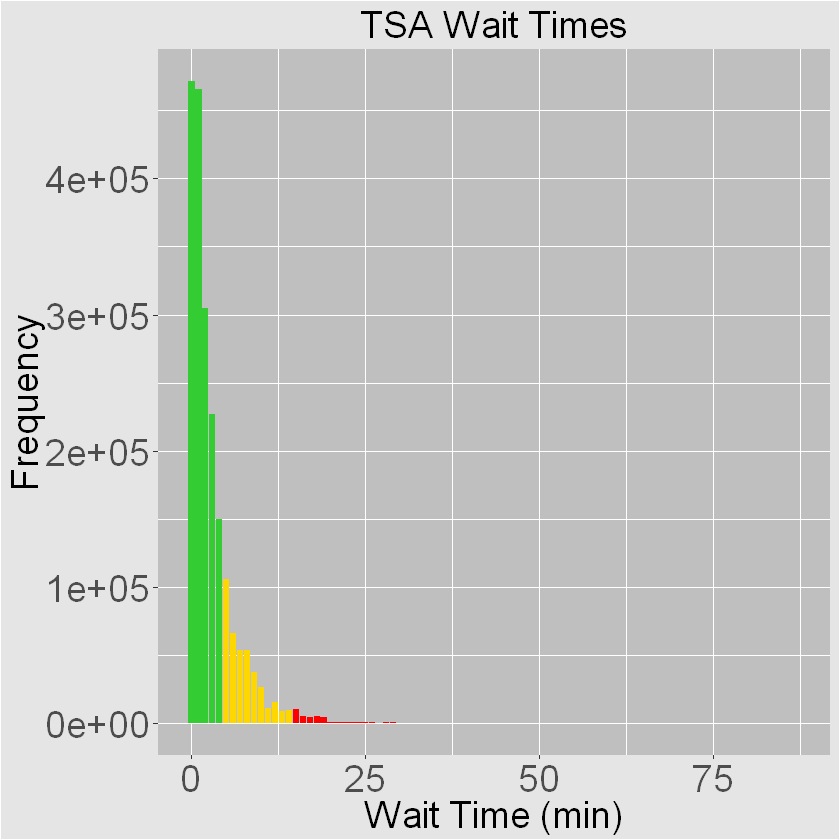

Warning message:
"Ignoring unknown parameters: binwidth, bins, pad"Warning message:
"Removed 37 rows containing missing values (position_stack)."Warning message:
"Removed 1 rows containing missing values (geom_bar)."

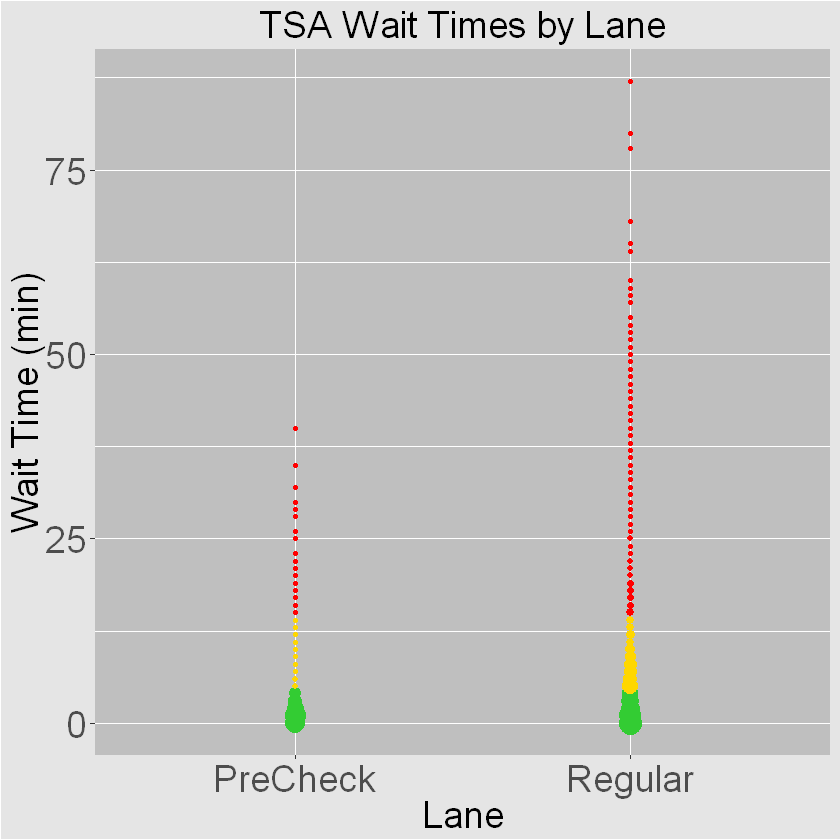

Warning message:
"Ignoring unknown parameters: binwidth, bins, pad"Warning message:
"Removed 37 rows containing missing values (position_stack)."Warning message:
"Removed 1 rows containing missing values (geom_bar)."

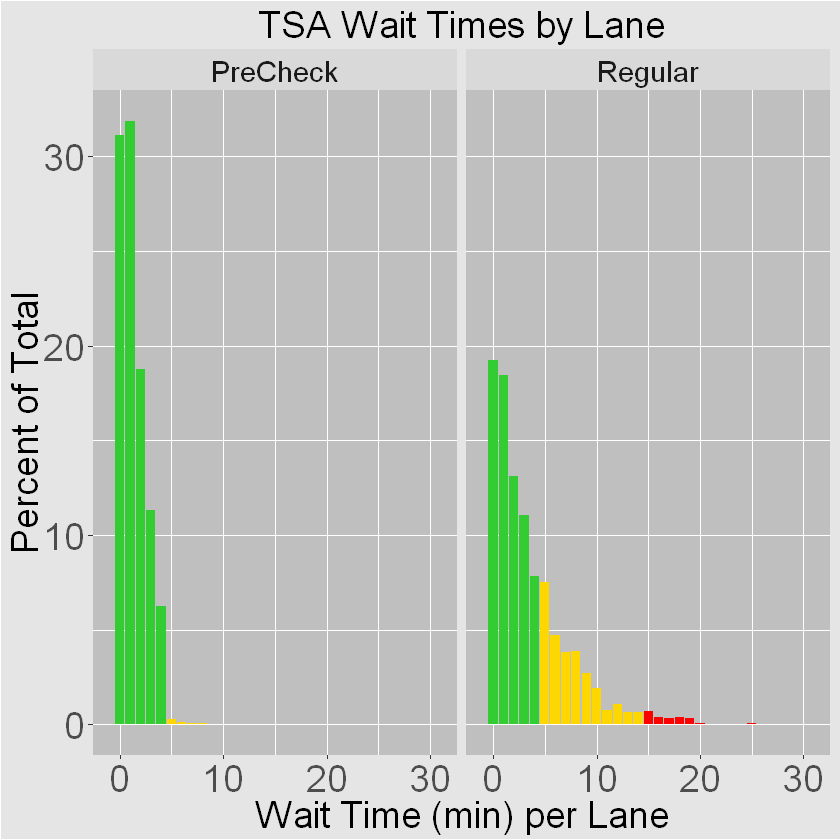

Warning message:
"Ignoring unknown parameters: binwidth, bins, pad"Warning message:
"Removed 99 rows containing missing values (position_stack)."Warning message:
"Removed 5 rows containing missing values (geom_bar)."

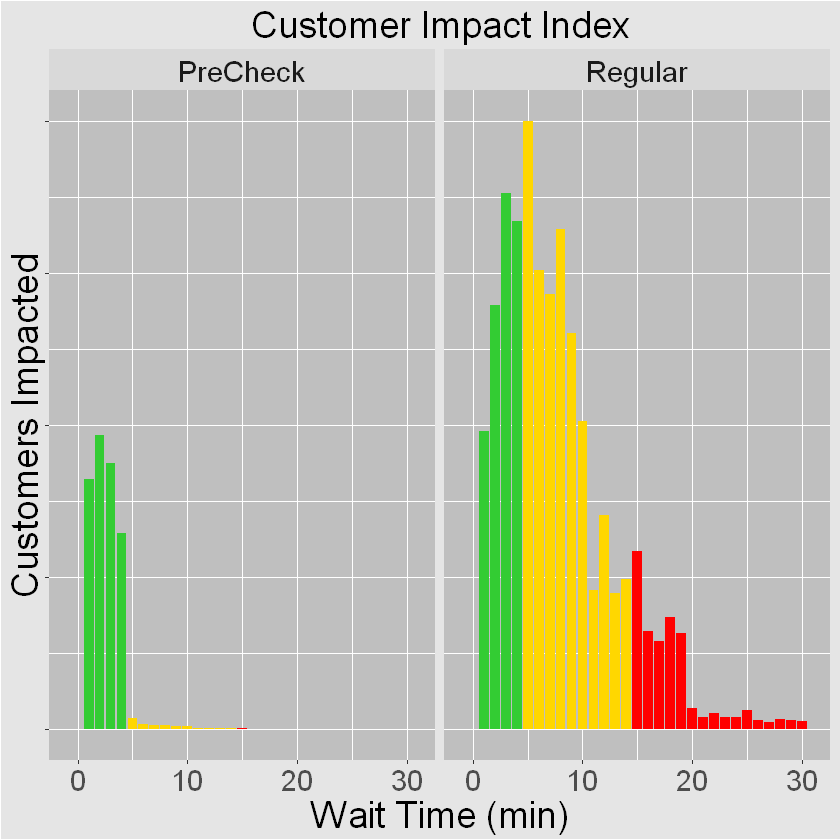


AVERAGE WAIT TIMES BY TIME OF DAY AND LANE
# A tibble: 48 x 3
# Groups:   HourInt [24]
   HourInt Lane     AveWait
     <int> <fct>      <dbl>
 1       0 PreCheck  0.228 
 2       0 Regular   1.65  
 3       1 PreCheck  0.0969
 4       1 Regular   1.12  
 5       2 PreCheck  0.0808
 6       2 Regular   1.00  
 7       3 PreCheck  0.408 
 8       3 Regular   1.77  
 9       4 PreCheck  1.26  
10       4 Regular   3.50  
# ... with 38 more rows


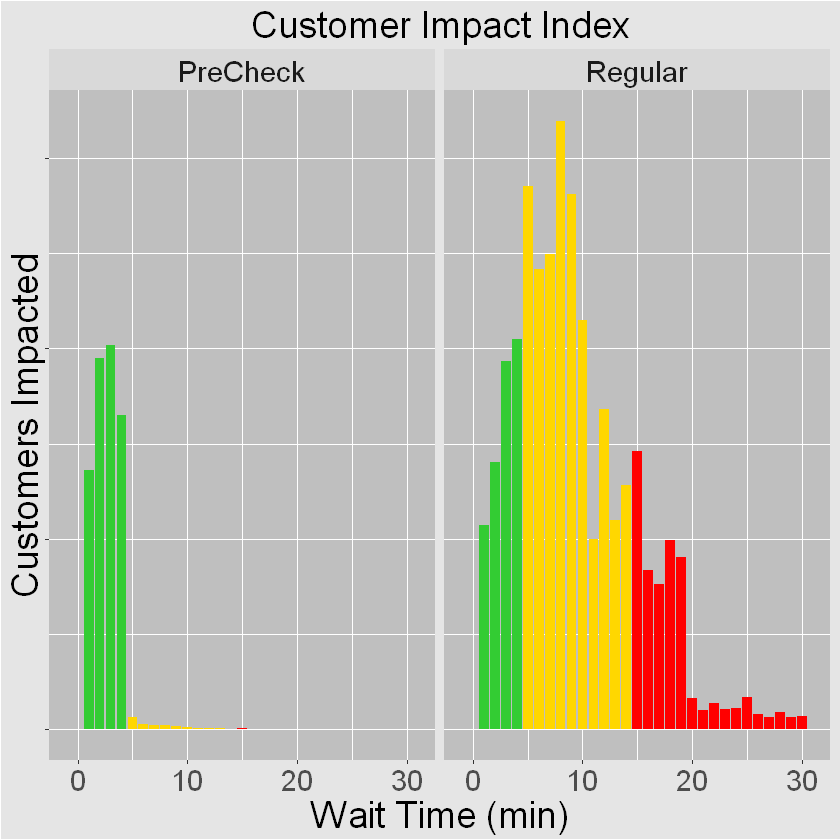


AVERAGE WAIT TIMES BY TIME OF DAY AND SIZE
# A tibble: 144 x 3
# Groups:   HourInt [24]
   HourInt Cat   AveWait
     <int> <fct>   <dbl>
 1       0 I      0.745 
 2       0 II     3.17  
 3       0 III    0.0863
 4       0 IV     0.302 
 5       0 OS     3.32  
 6       0 X      1.23  
 7       1 I      0.424 
 8       1 II     1.39  
 9       1 III    0.052 
10       1 IV     0.105 
# ... with 134 more rows


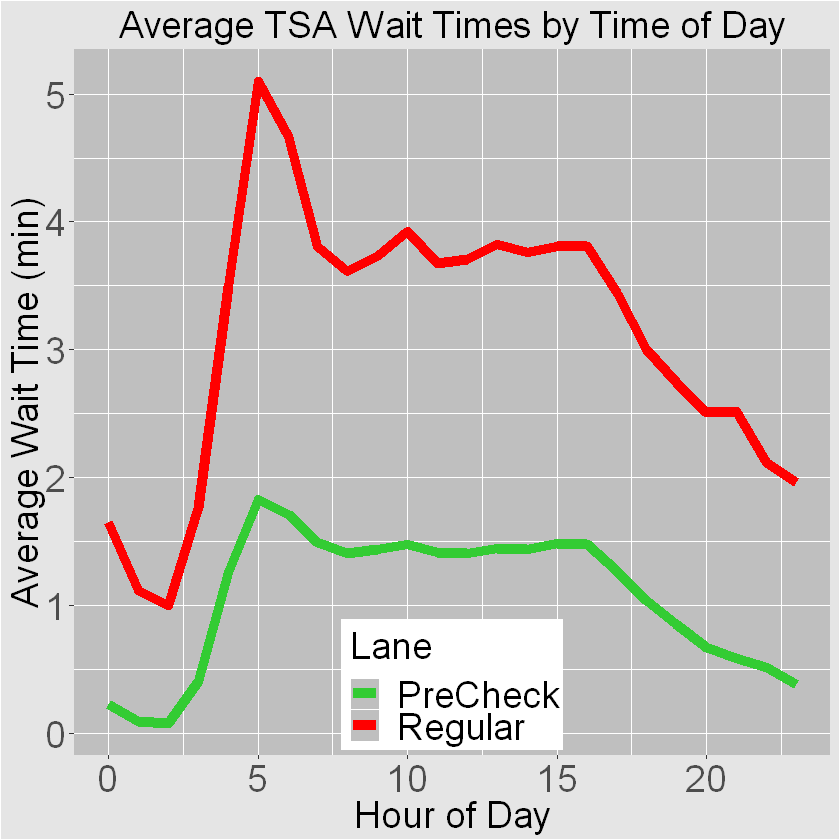


AVERAGE WAIT TIMES BY TIME OF DAY AND DAY OF WEEK
# A tibble: 168 x 3
# Groups:   HourInt [24]
   HourInt Day   AveWait
     <int> <fct>   <dbl>
 1       0 Fri     1.25 
 2       0 Mon     1.33 
 3       0 Sat     1.30 
 4       0 Sun     1.39 
 5       0 Thu     1.17 
 6       0 Tue     1.31 
 7       0 Wed     1.20 
 8       1 Fri     0.848
 9       1 Mon     0.808
10       1 Sat     0.945
# ... with 158 more rows


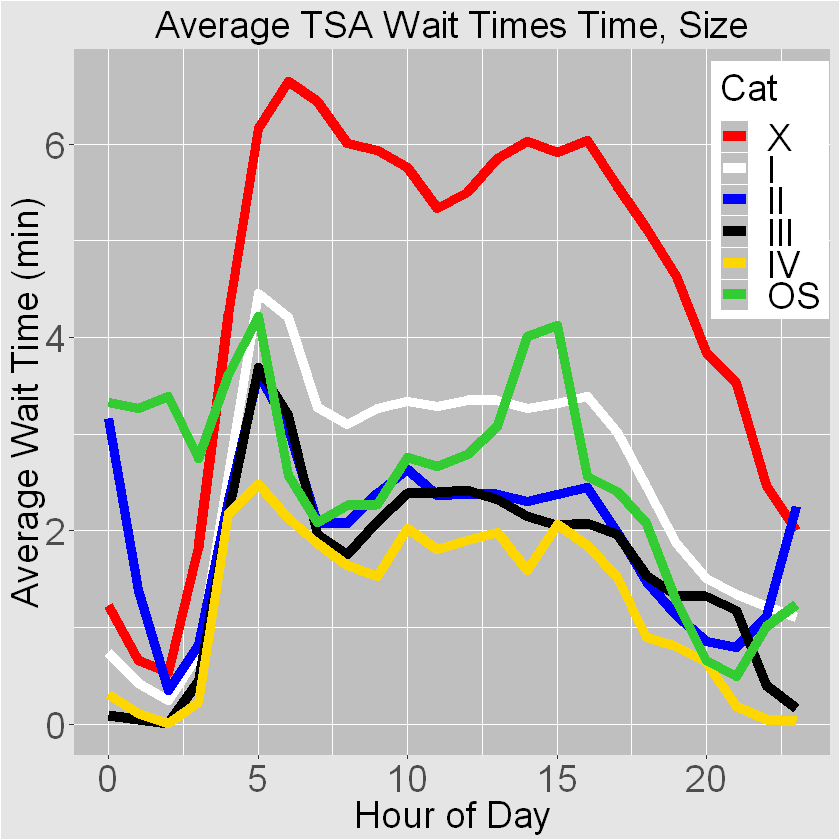


AVERAGE WAIT TIMES BY MONTH
# A tibble: 12 x 2
   Month AveWait
   <fct>   <dbl>
 1 Apr      2.66
 2 Aug      3.15
 3 Dec      2.92
 4 Feb      2.62
 5 Jan      2.56
 6 Jul      3.18
 7 Jun      2.99
 8 Mar      2.75
 9 May      2.75
10 Nov      2.83
11 Oct      3.07
12 Sep      3.03


Warning message:
"Ignoring unknown parameters: binwidth, bins, pad"

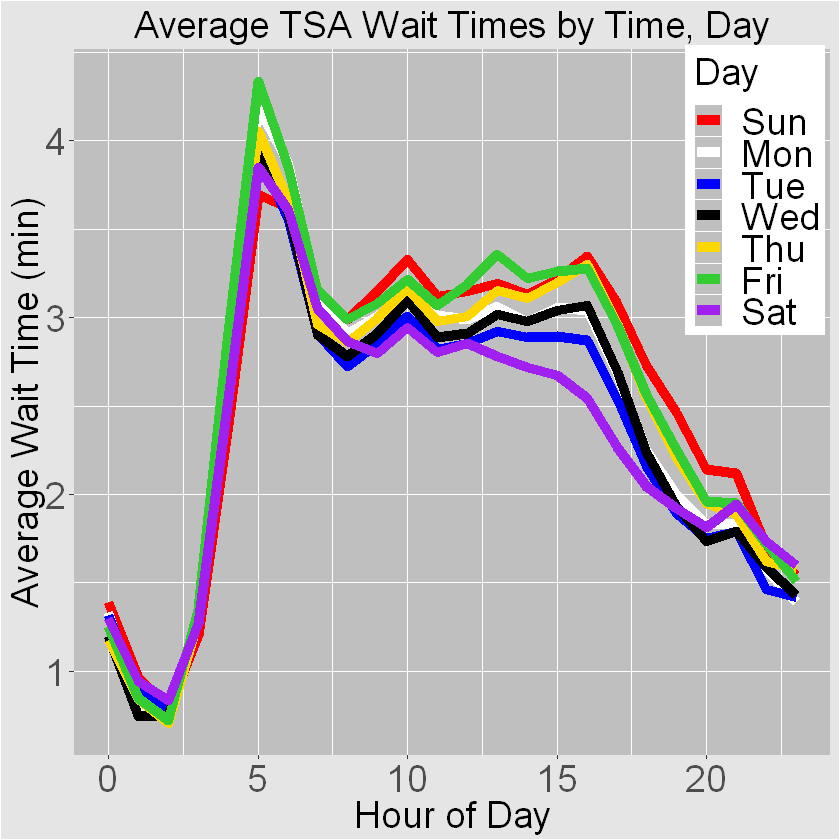


COMPARISON OF AVERAGE WAIT TIMES BY TIME OF DAY AND LANE
# A tibble: 96 x 5
# Groups:   HourInt, Lane [48]
   HourInt Lane     Airport AveWait AptLane     
     <int> <fct>    <fct>     <dbl> <chr>       
 1       0 PreCheck JFK      0.164  JFK_PreCheck
 2       0 PreCheck LAX      0.316  LAX_PreCheck
 3       0 Regular  JFK      3.75   JFK_Regular 
 4       0 Regular  LAX      4.82   LAX_Regular 
 5       1 PreCheck JFK      0.167  JFK_PreCheck
 6       1 PreCheck LAX      0.0169 LAX_PreCheck
 7       1 Regular  JFK      1.35   JFK_Regular 
 8       1 Regular  LAX      1.25   LAX_Regular 
 9       2 PreCheck JFK      0.208  JFK_PreCheck
10       2 PreCheck LAX      0.0159 LAX_PreCheck
# ... with 86 more rows


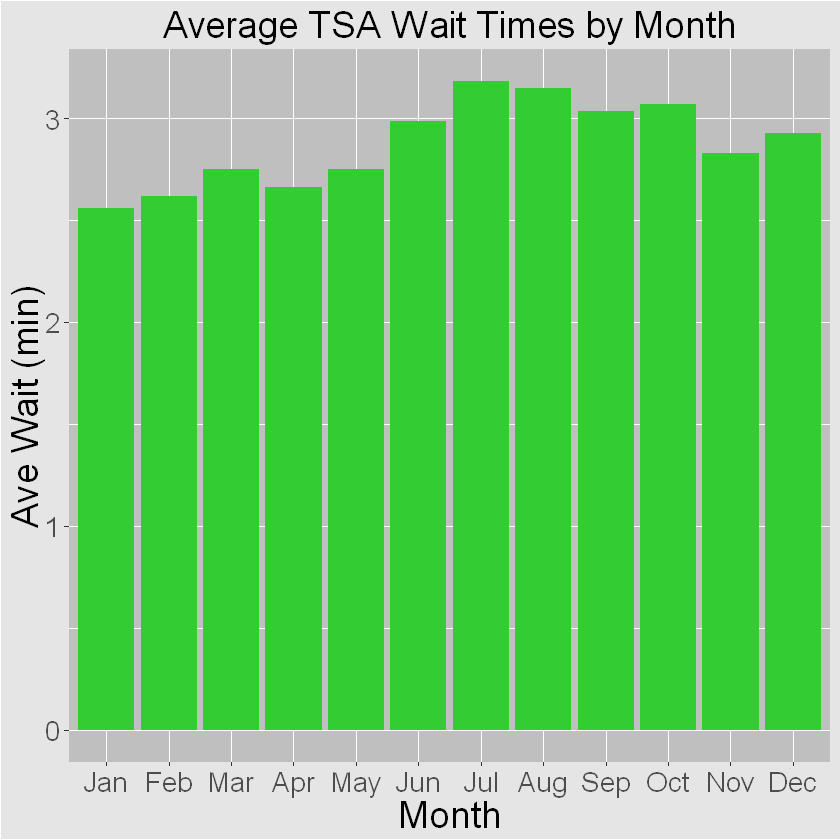

[1] "ID"                 "Airport"            "Date"              
 [4] "HourRaw"            "WaitTime"           "Lane"              
 [7] "Hour"               "Day"                "Month"             
[10] "AptName"            "Airport.City"       "Airport.State"     
[13] "Airport.Zip.Code"   "Cat"                "Latitude"          
[16] "Longitude"          "Size"               "DateDT"            
[19] "DateOnly"           "YearMonth"          "HourDT"            
[22] "HourOnly"           "DateTimeObj"        "DateTimeDT"        
[25] "Wait05orMore"       "Wait10orMore"       "Wait15orMore"      
[28] "Wait20orMore"       "Wait30orMore"       "JFK"               
[31] "BOS"                "LAX"                "LAS"               
[34] "DCA"                "IAD"                "BWI"               
[37] "ORD"                "EWR"                "MCO"               
[40] "DFW"                "MIA"                "HourObj"           
[43] "HourInt"            "HourIntSquared"     "HourIntCubed"      
[46] "AMRush"             "PMRush"             "Jan"               
[49] "Feb"                "Mar"                "Apr"               
[52] "May"                "Jun"                "Jul"               
[55] "Aug"                "Sep"                "Oct"               
[58] "Nov"                "Dec"                "Mon"               
[61] "Tue"                "Wed"                "Thu"               
[64] "Fri"                "Sat"                "Sun"               
[67] "PreCheck"           "CatX"               "CatI"              
[70] "CatII"              "CatIII"             "CatIV"             
[73] "WaitTimeContinuous"

       ID             Airport                        Date        
 Min.   :  98948   HVN    :  14640   30/11/2014 0:00:00:   7058  
 1st Qu.: 746857   BDL    :  14638   13/7/2015 0:00:00 :   7025  
 Median :1297167   MDW    :  14635   6/7/2015 0:00:00  :   7021  
 Mean   :1297774   SFO    :  14594   17/8/2015 0:00:00 :   7020  
 3rd Qu.:1868025   PIT    :  14559   19/6/2015 0:00:00 :   7002  
 Max.   :2438569   ANC    :  14286   26/6/2015 0:00:00 :   6994  
                   (Other):1953076   (Other)           :1998308  
    HourRaw           WaitTime            Lane        
 05:00  :  85983   Min.   : 0.000   PreCheck: 665829  
 12:00  :  85488   1st Qu.: 1.000   Regular :1374599  
 06:00  :  84756   Median : 2.000                     
 11:00  :  83057   Mean   : 2.873                     
 13:00  :  81734   3rd Qu.: 4.000                     
 10:00  :  81358   Max.   :87.000                     
 (Other):1538052                                      
                  Hour          

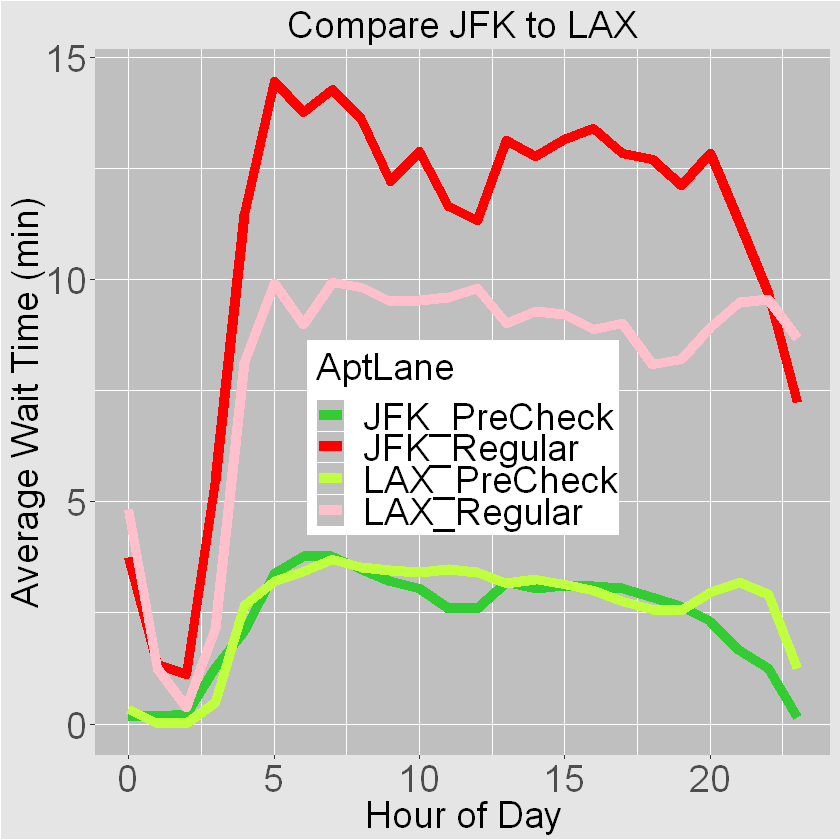

In [1]:
#!!!!!!!!! CHANGE TO R KERNEL !!!!!!!!!!!!!

#CELL NAME:  R SETUP
#THIS CELL IMPORTS AIRPORT WAITS DATASET AND PROVIDES SOME DESCRIPTIVE STATS
#Note:  plots sized for transfer to analytical paper in MS Word

#Import packages
library(ggplot2)
#library(plyr)
library(dplyr)

#Import data and visually inspect
#To import csv file  (inefficient, but simple)
#Need to get hdf5 or rpy2 working to get around inefficiencies
AptWaitsR = read.csv(file = "C:/Anaconda3/Data/AptWaitsGood.csv", header = TRUE)
#glimpse(AptWaitsR)
#summary(AptWaitsR) 

#Check on number of records by year/month--may need to filter months for missing data
YearMonthCounts <- AptWaitsR %>% group_by(YearMonth) %>% count(YearMonth) 
cat("\nYEAR MONTH COUNTS\n")
print(YearMonthCounts, n=100) 

#Dataset appears to be missing data in half the months
#Not sure what this will do to the results--want fully populated months
#Filter months with less than 100,000 records
AptWaitsR = filter(AptWaitsR, YearMonth == "2014-10" | YearMonth == "2014-11" | YearMonth == "2014-12" |
                              YearMonth == "2015-01" | YearMonth == "2015-02" | YearMonth == "2015-03" |
                              YearMonth == "2015-04" | YearMonth == "2015-05" | YearMonth == "2015-06" |
                              YearMonth == "2015-07" | YearMonth == "2015-08" | YearMonth == "2015-09" )
YearMonthCounts <- AptWaitsR %>% group_by(YearMonth) %>% count(YearMonth) 
cat("\nYEAR MONTH COUNTS AFTER FILTER\n")
print(YearMonthCounts, n=100) 

#summary(AptWaitsR) 

#Look for blanks in final dataset
cat("\nBLANKS IN WAIT TIME\n")
print(sum(is.na(AptWaitsR$WaitTime)))
cat("\nBLANKS IN AIRPORT\n")
print(sum(is.na(AptWaitsR$Airport)))
cat("\nBLANKS IN SIZE\n") #note that territorial airports not rated for size, blanks OK
print(sum(is.na(AptWaitsR$Size)))
cat("\nBLANKS IN LANE\n")
print(sum(is.na(AptWaitsR$Lane)))

#Find max wait time
cat("\nMAXIMUM WAIT TIME\n")
print(max(AptWaitsR$WaitTime))

#Some descriptive stats
cat("\nMEAN WAIT TIME\n")
print(mean(AptWaitsR$WaitTime))
cat("\nMEDIAN WAIT TIME\n")
print(median(AptWaitsR$WaitTime))
cat("\nSTANDARD DEVIATION WAIT TIME\n")
print(sd(AptWaitsR$WaitTime))
cat("\nDISTRIBUTION FOR MODE WAIT TIME\n")
TimeTotal = AptWaitsR %>% count(WaitTime)
print(TimeTotal)
cat("\nFINAL ROW COUNT\n")
print(sum(TimeTotal$n))

#Create additional binary variables for correlations
AptWaitsR$PreCheck <- 0
AptWaitsR$PreCheck[AptWaitsR$Lane=="PreCheck"] <- 1
AptWaitsR$CatX <- 0
AptWaitsR$CatX[AptWaitsR$Cat=="X"] <- 1
AptWaitsR$CatI <- 0
AptWaitsR$CatI[AptWaitsR$Cat=="I"] <- 1
AptWaitsR$CatII <- 0
AptWaitsR$CatII[AptWaitsR$Cat=="II"] <- 1
AptWaitsR$CatIII <- 0
AptWaitsR$CatIII[AptWaitsR$Cat=="III"] <- 1
AptWaitsR$CatIV <- 0
AptWaitsR$CatIV[AptWaitsR$Cat=="IV"] <- 1

#Convert wait time from discrete to continuous by adding random number
AptWaitsR$WaitTimeContinuous <- AptWaitsR$WaitTime + runif(nrow(AptWaitsR), -0.5, 0.5) 
NumZeros <- sum(AptWaitsR$WaitTime==0)
cat("\nNUMBER OF ZEROS IN WAIT TIME\n")
print(NumZeros)
AptWaitsR$WaitTimeContinuous <- ifelse(AptWaitsR$WaitTime==0, runif(NumZeros, 0, 0.5), 
                                       AptWaitsR$WaitTimeContinuous)
head(AptWaitsR, n=20)
tail(AptWaitsR, n=20)

#Create summary dataframe for time vs. lane, visually inspect, then plot
#Also create an index to estimate impact of wait time on customers
TimeByLane <- AptWaitsR %>% group_by(Lane) %>% count(WaitTime)  #works better
TimeByLane = mutate(TimeByLane, PctTot = n * 100 / sum(n))
TimeByLane$Rating <- "Good"
TimeByLane$Rating[TimeByLane$WaitTime>=5] <- "Mediocre"
TimeByLane$Rating[TimeByLane$WaitTime>=15] <- "Bad"
TimeByLane <- mutate(TimeByLane, ImpactTemp = n * WaitTime)
TimeByLane <- mutate(TimeByLane, ImpactMax = max(TimeByLane$ImpactTemp))
TimeByLane <- mutate(TimeByLane, Impact = ImpactTemp / ImpactMax)
cat("\nCOUNT DATA FOR TIME BY LANE\n")
print(TimeByLane, n=100)

#Create a second index that attempts to correct for airport size
TimeByLaneSize <- AptWaitsR %>% group_by(Lane, Size) %>% count(WaitTime)
TimeByLaneSize$AptLanes <- 1
TimeByLaneSize$AptLanes[TimeByLaneSize$Size=="5"] <- 5
TimeByLaneSize$AptLanes[TimeByLaneSize$Size=="4"] <- 2
TimeByLanSizee = mutate(TimeByLane, PctTot = n * 100 / sum(n))
TimeByLaneSize$Rating <- "Good"
TimeByLaneSize$Rating[TimeByLaneSize$WaitTime>=5] <- "Mediocre"
TimeByLaneSize$Rating[TimeByLaneSize$WaitTime>=15] <- "Bad"
TimeByLaneSize <- mutate(TimeByLaneSize, ImpactTemp = n * WaitTime * AptLanes)
TimeByLaneSize <- mutate(TimeByLaneSize, ImpactMax = max(TimeByLaneSize$ImpactTemp))
TimeByLaneSize <- mutate(TimeByLaneSize, Impact = ImpactTemp / ImpactMax)
cat("\nCOUNT DATA FOR TIME BY LANE\n")
print(TimeByLaneSize, n=405)

#Visualize data for descriptive statistics
#Note:  plots are sized for cut/paste into MS Word document

#Histogram of overall wait time distribution
ggplot(TimeByLane, aes(x=WaitTime, y=n)) + 
    geom_histogram(aes(fill=factor(Rating)), stat = "identity") +
    scale_fill_manual(values = c("Good"="#33CC33", "Mediocre"="gold", "Bad"="red")) +
    ggtitle("TSA Wait Times") + xlab("Wait Time (min)") + ylab("Frequency") + 
    theme(legend.position="none") + 
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75"))

#Bubble chart variation of wait time vs lane--don't like this, use histogram instead
#Could also try violin plot with box plot overlay
ggplot(TimeByLane, aes(x=Lane, y=WaitTime)) + geom_point(aes(size=n, color=factor(Rating))) +
    scale_color_manual(values = c("Good"="#33CC33", "Mediocre"="gold", "Bad"="red")) +
    ggtitle("TSA Wait Times by Lane") + xlab("Lane") + ylab("Wait Time (min)") + 
    theme(legend.position="none") + 
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75"))

#Histogram of wait time distribution vs lane--this makes more sense
ggplot(TimeByLane, aes(x=WaitTime, y=PctTot)) + 
    geom_histogram(aes(fill=factor(Rating)), stat = "identity") +
    scale_fill_manual(values = c("Good"="#33CC33", "Mediocre"="gold", "Bad"="red")) +
    ggtitle("TSA Wait Times by Lane") + xlab("Wait Time (min) per Lane") + 
    ylab("Percent of Total") + 
    facet_wrap(~Lane, nrow = 1) + 
    theme(legend.position="none") +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    xlim(-1, 31)

#Plot impact index
ggplot(TimeByLane, aes(x=WaitTime, y=Impact)) + 
    geom_histogram(aes(fill=factor(Rating)), stat = "identity") +
    scale_fill_manual(values = c("Good"="#33CC33", "Mediocre"="gold", "Bad"="red")) +
    ggtitle("Customer Impact Index") + xlab("Wait Time (min)") + ylab("Customers Impacted") + 
    facet_wrap(~Lane, nrow = 1) + 
    theme(legend.position="none") + 
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text.x = element_text(size=rel(2))) +
    theme(axis.text.y = element_blank()) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    xlim(-1, 31)

#Plot second index which adjusts for airport size
ggplot(TimeByLaneSize, aes(x=WaitTime, y=Impact)) + 
    geom_histogram(aes(fill=factor(Rating)), stat = "identity") +
    scale_fill_manual(values = c("Good"="#33CC33", "Mediocre"="gold", "Bad"="red")) +
    ggtitle("Customer Impact Index") + xlab("Wait Time (min)") + ylab("Customers Impacted") + 
    facet_wrap(~Lane, nrow = 1) + 
    theme(legend.position="none") + 
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text.x = element_text(size=rel(2))) +
    theme(axis.text.y = element_blank()) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    xlim(-1, 31)

#Line chart of average wait time vs time of day vs lane
TimeVsTimeOfDay <- AptWaitsR %>% group_by(HourInt, Lane) %>% summarise(AveWait=mean(WaitTime))
cat("\nAVERAGE WAIT TIMES BY TIME OF DAY AND LANE\n")
print(TimeVsTimeOfDay)
ggplot(TimeVsTimeOfDay, aes(x=HourInt, y=AveWait, col=Lane)) + 
    geom_line(linetype='solid', size=3) +
    scale_color_manual(values = c("PreCheck"="#33CC33", "Regular"="red")) +
    ggtitle("Average TSA Wait Times by Time of Day") + xlab("Hour of Day") + 
    ylab("Average Wait Time (min)") + 
    theme(legend.position=c(0.5,0.1), legend.key = element_rect(fill="grey75")) +
    theme(legend.title = element_text(size=rel(2))) +
    theme(legend.text = element_text(size=rel(2))) +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75"))    

#Line chart of average wait time vs time of day vs airport size
TimeVsTimeOfDay2 <- AptWaitsR %>% group_by(HourInt, Cat) %>% na.omit() %>% 
                    summarise(AveWait=mean(WaitTime))
cat("\nAVERAGE WAIT TIMES BY TIME OF DAY AND SIZE\n")
print(TimeVsTimeOfDay2)
TimeVsTimeOfDay2$Cat <- factor(TimeVsTimeOfDay2$Cat, levels = c("X","I","II","III","IV","OS"))
ggplot(TimeVsTimeOfDay2, aes(x=HourInt, y=AveWait, col=Cat)) + 
    geom_line(linetype='solid', size=3) +
    scale_color_manual(values = c("X"="red", "I"="white", "II"="blue", 
                                  "III"="black", "IV"="gold", "OS"="#33CC33")) +
    ggtitle("Average TSA Wait Times Time, Size") + xlab("Hour of Day") + 
    ylab("Average Wait Time (min)") + 
    theme(legend.position=c(0.92,0.8), legend.key = element_rect(fill="grey75")) +
    theme(legend.title = element_text(size=rel(2))) +
    theme(legend.text = element_text(size=rel(2))) +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75"))    

#Histogram of average wait time by day of week
TimeVsTimeOfDay3 <- AptWaitsR %>% group_by(HourInt, Day) %>% summarise(AveWait=mean(WaitTime))
cat("\nAVERAGE WAIT TIMES BY TIME OF DAY AND DAY OF WEEK\n")
print(TimeVsTimeOfDay3)
TimeVsTimeOfDay3$Day <- factor(TimeVsTimeOfDay3$Day, levels = c("Sun","Mon","Tue","Wed",
                                                               "Thu","Fri","Sat"))
ggplot(TimeVsTimeOfDay3, aes(x=HourInt, y=AveWait, col=Day)) + 
    geom_line(linetype='solid', size=3) +
    scale_color_manual(values = c("Sun"="red", "Mon"="white", "Tue"="blue", 
                                  "Wed"="black", "Thu"="gold", "Fri"="#33CC33",
                                  "Sat"="purple")) +
    ggtitle("Average TSA Wait Times by Time, Day") + xlab("Hour of Day") + 
    ylab("Average Wait Time (min)") + 
    theme(legend.position=c(0.9,0.8), legend.key = element_rect(fill="grey75")) +
    theme(legend.title = element_text(size=rel(2))) +
    theme(legend.text = element_text(size=rel(2))) +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75"))    

#Histogram of average wait time by month
TimeByMonth <- AptWaitsR %>% group_by(Month) %>% summarise(AveWait=mean(WaitTime))
cat("\nAVERAGE WAIT TIMES BY MONTH\n")
print(TimeByMonth)
TimeByMonth$Month <- factor(TimeByMonth$Month, levels = c("Jan","Feb","Mar","Apr","May","Jun",
                                                          "Jul","Aug","Sep","Oct","Nov","Dec"))
ggplot(TimeByMonth, aes(x=Month, y=AveWait)) + 
    geom_histogram(fill="#33CC33", stat="identity") +
    ggtitle("Average TSA Wait Times by Month") + xlab("Month") + ylab("Ave Wait (min)") + 
    theme(legend.position="none") + 
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(1.5))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75"))


#Comparative examples of individual airports--by time of day and lane
JFKvsLAX <- filter(AptWaitsR, Airport=="JFK" | Airport=="LAX") %>% 
                              group_by(HourInt, Lane, Airport) %>% summarise(AveWait=mean(WaitTime))
#JFKvsLAX$AptLane <- mutate(JFKvsLAX, AptLane = paste(Airport, Lane, sep='_'))
JFKvsLAX$AptLane <- paste(JFKvsLAX$Airport, JFKvsLAX$Lane, sep='_')
cat("\nCOMPARISON OF AVERAGE WAIT TIMES BY TIME OF DAY AND LANE\n")
print(JFKvsLAX)
ggplot(JFKvsLAX, aes(x=HourInt, y=AveWait, col=AptLane)) + 
    geom_line(linetype='solid', size=3) +
    scale_color_manual(values = c("JFK_Regular"="red", "JFK_PreCheck"="#33CC33",
                                  "LAX_Regular"="pink", "LAX_PreCheck"="olivedrab1")) +
    ggtitle("Compare JFK to LAX") + xlab("Hour of Day") + 
    ylab("Average Wait Time (min)") + 
    theme(legend.position=c(0.5,0.45), legend.key = element_rect(fill="grey75")) +
    theme(legend.title = element_text(size=rel(2))) +
    theme(legend.text = element_text(size=rel(2))) +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75"))    


#Print list/details of final variables available
names(AptWaitsR)
summary(AptWaitsR)

Registered S3 methods overwritten by 'ggplot2':
  method         from 
  [.quosures     rlang
  c.quosures     rlang
  print.quosures rlang

Attaching package: 'dplyr'

The following objects are masked from 'package:stats':

    filter, lag

The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union




YEAR MONTH COUNTS
# A tibble: 24 x 2
# Groups:   YearMonth [24]
   YearMonth      n
   <fct>      <int>
 1 2014-01    19053
 2 2014-02    19649
 3 2014-03    19584
 4 2014-04    18959
 5 2014-05    19468
 6 2014-06    19185
 7 2014-07    19602
 8 2014-08    18991
 9 2014-09    62700
10 2014-10   145823
11 2014-11   137841
12 2014-12   146335
13 2015-01   183404
14 2015-02   166417
15 2015-03   189437
16 2015-04   179327
17 2015-05   187691
18 2015-06   183858
19 2015-07   190290
20 2015-08   189120
21 2015-09   140885
22 2015-10    60436
23 2015-11    60080
24 2015-12    60434

YEAR MONTH COUNTS AFTER FILTER
# A tibble: 12 x 2
# Groups:   YearMonth [12]
   YearMonth      n
   <fct>      <int>
 1 2014-10   145823
 2 2014-11   137841
 3 2014-12   146335
 4 2015-01   183404
 5 2015-02   166417
 6 2015-03   189437
 7 2015-04   179327
 8 2015-05   187691
 9 2015-06   183858
10 2015-07   190290
11 2015-08   189120
12 2015-09   140885

BLANKS IN WAIT TIME
[1] 0

BLANKS IN AIRPORT
[1] 0

BLAN

ID,Airport,Date,HourRaw,WaitTime,Lane,Hour,Day,Month,AptName,...,Fri,Sat,Sun,PreCheck,CatX,CatI,CatII,CatIII,CatIV,WaitTimeContinuous
193060,FWA,24/10/2014 0:00:00,12:00,2,Regular,30/12/1899 12:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,0,0,0,1,0,0,2.03603218
193061,FWA,24/10/2014 0:00:00,12:30,2,PreCheck,30/12/1899 12:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,1,0,0,1,0,0,1.97988330
193062,FWA,24/10/2014 0:00:00,13:00,2,Regular,30/12/1899 13:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,0,0,0,1,0,0,2.18729090
193063,FWA,24/10/2014 0:00:00,13:30,0,PreCheck,30/12/1899 13:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,1,0,0,1,0,0,0.10547777
193064,FWA,24/10/2014 0:00:00,14:00,4,Regular,30/12/1899 14:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,0,0,0,1,0,0,4.24695686
193065,FWA,24/10/2014 0:00:00,14:30,2,PreCheck,30/12/1899 14:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,1,0,0,1,0,0,1.74632285
193066,FWA,24/10/2014 0:00:00,15:00,1,Regular,30/12/1899 15:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,0,0,0,1,0,0,1.32921318
193067,FWA,24/10/2014 0:00:00,15:30,0,PreCheck,30/12/1899 15:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,1,0,0,1,0,0,0.27266926
193068,FWA,24/10/2014 0:00:00,16:00,2,Regular,30/12/1899 16:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,0,0,0,1,0,0,2.12729922
193069,FWA,24/10/2014 0:00:00,16:30,0,PreCheck,30/12/1899 16:00:00,Fri,Oct,Fort Wayne International Airport - Baer Field,...,1,0,0,1,0,0,1,0,0,0.24230117


,ID,Airport,Date,HourRaw,WaitTime,Lane,Hour,Day,Month,AptName,...,Fri,Sat,Sun,PreCheck,CatX,CatI,CatII,CatIII,CatIV,WaitTimeContinuous
2040409,2438550,YNG,24/9/2015 0:00:00,11:00,1,Regular,30/12/1899 11:00:00,Thu,Sep,Youngstown-Warren Regional Airport,...,0,0,0,0,0,0,0,1,0,1.2391383
2040410,2438551,YNG,24/9/2015 0:00:00,14:00,1,Regular,30/12/1899 14:00:00,Thu,Sep,Youngstown-Warren Regional Airport,...,0,0,0,0,0,0,0,1,0,1.3363227
2040411,2438552,YNG,24/9/2015 0:00:00,15:00,2,Regular,30/12/1899 15:00:00,Thu,Sep,Youngstown-Warren Regional Airport,...,0,0,0,0,0,0,0,1,0,1.5687324
2040412,2438553,YNG,24/9/2015 0:00:00,16:00,1,Regular,30/12/1899 16:00:00,Thu,Sep,Youngstown-Warren Regional Airport,...,0,0,0,0,0,0,0,1,0,1.2196500
2040413,2438554,ABQ,25/9/2015 0:00:00,00:00,1,Regular,30/12/1899 0:00:00,Fri,Sep,Albuquerque International Sunport Airport,...,1,0,0,0,0,1,0,0,0,1.3857644
2040414,2438555,GRO,25/9/2015 0:00:00,11:00,0,Regular,30/12/1899 11:00:00,Fri,Sep,Overseas Location,...,1,0,0,0,0,0,0,0,0,0.4135341
2040415,2438556,GRO,25/9/2015 0:00:00,12:00,0,Regular,30/12/1899 12:00:00,Fri,Sep,Overseas Location,...,1,0,0,0,0,0,0,0,0,0.4259590
2040416,2438557,GRO,25/9/2015 0:00:00,13:00,3,Regular,30/12/1899 13:00:00,Fri,Sep,Overseas Location,...,1,0,0,0,0,0,0,0,0,3.1773691
2040417,2438558,GRO,25/9/2015 0:00:00,14:00,0,Regular,30/12/1899 14:00:00,Fri,Sep,Overseas Location,...,1,0,0,0,0,0,0,0,0,0.1610329
2040418,2438559,IAG,25/9/2015 0:00:00,00:00,0,Regular,30/12/1899 0:00:00,Fri,Sep,Niagara Falls International Airport,...,1,0,0,0,0,0,0,0,1,0.1082172



COUNT DATA FOR TIME BY LANE
# A tibble: 98 x 8
# Groups:   Lane [2]
   Lane     WaitTime      n     PctTot Rating   ImpactTemp ImpactMax    Impact
   <fct>       <int>  <int>      <dbl> <chr>         <int>     <int>     <dbl>
 1 PreCheck        0 207065 31.1       Good              0    517030 0        
 2 PreCheck        1 212308 31.9       Good         212308    517030 0.411    
 3 PreCheck        2 124903 18.8       Good         249806    517030 0.483    
 4 PreCheck        3  75323 11.3       Good         225969    517030 0.437    
 5 PreCheck        4  41731  6.27      Good         166924    517030 0.323    
 6 PreCheck        5   1906  0.286     Mediocre       9530    517030 0.0184   
 7 PreCheck        6    771  0.116     Mediocre       4626    517030 0.00895  
 8 PreCheck        7    467  0.0701    Mediocre       3269    517030 0.00632  
 9 PreCheck        8    403  0.0605    Mediocre       3224    517030 0.00624  
10 PreCheck        9    268  0.0403    Mediocre       2412    

Warning message:
"Ignoring unknown parameters: binwidth, bins, pad"

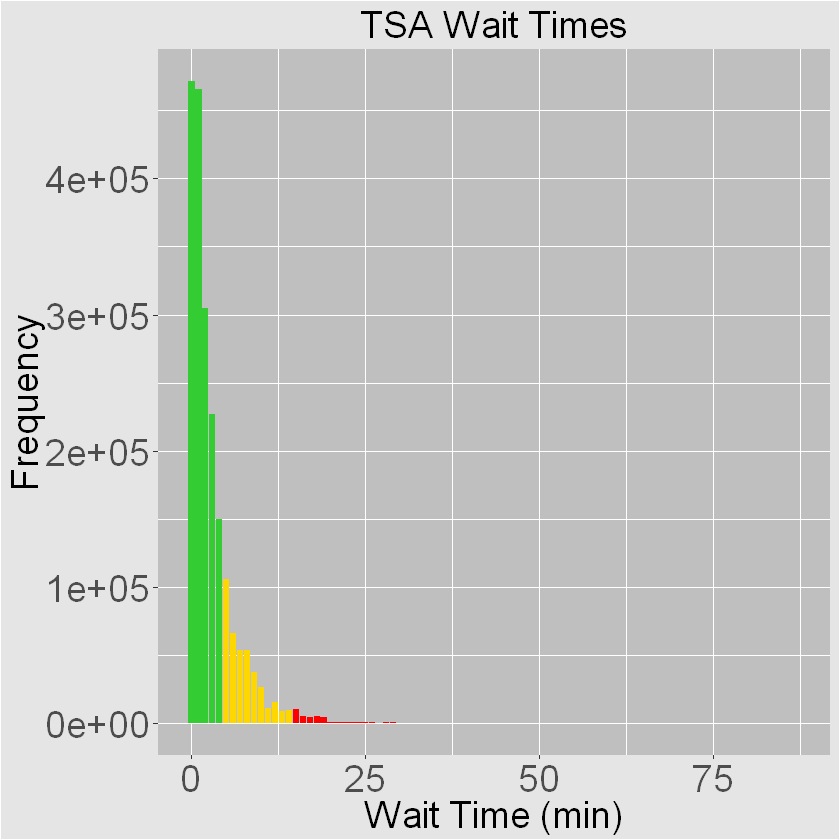

Warning message:
"Ignoring unknown parameters: binwidth, bins, pad"Warning message:
"Removed 37 rows containing missing values (position_stack)."Warning message:
"Removed 1 rows containing missing values (geom_bar)."

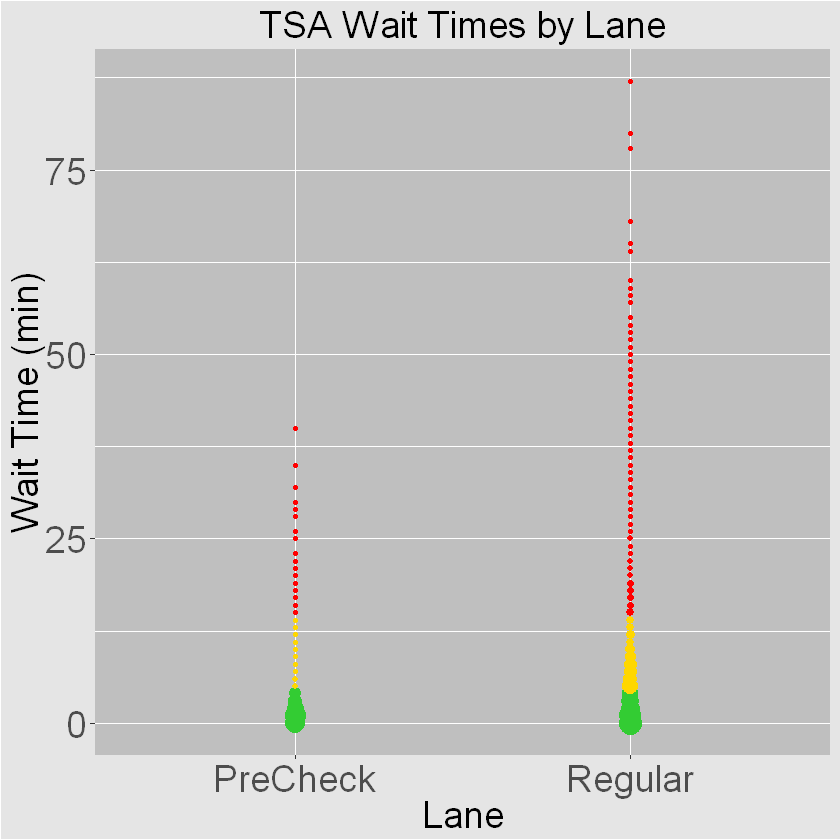

Warning message:
"Ignoring unknown parameters: binwidth, bins, pad"Warning message:
"Removed 37 rows containing missing values (position_stack)."Warning message:
"Removed 1 rows containing missing values (geom_bar)."

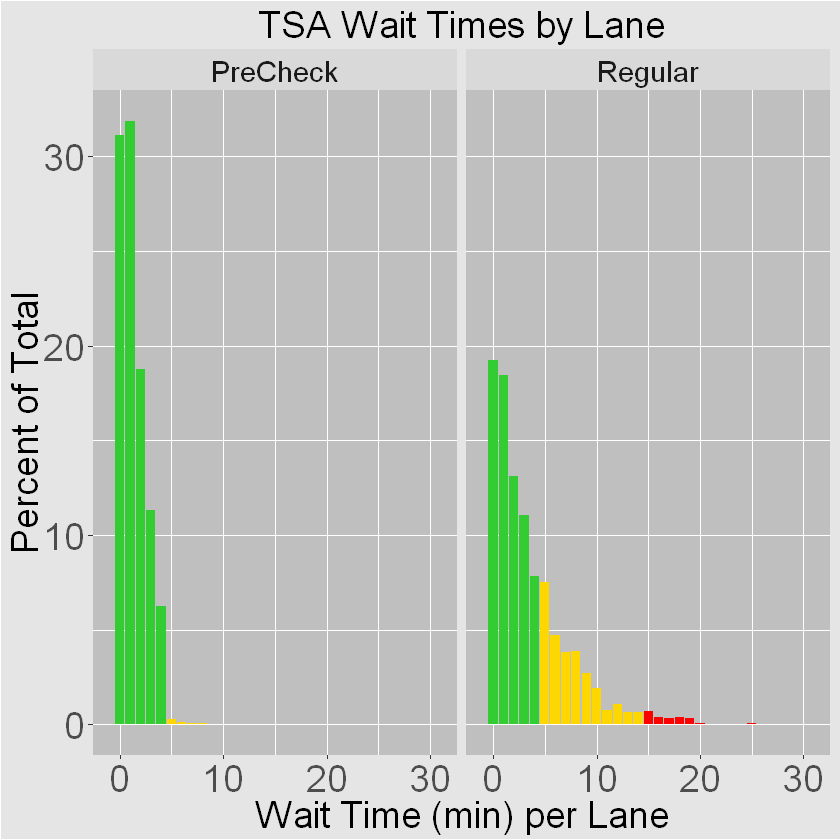

Warning message:
"Ignoring unknown parameters: binwidth, bins, pad"Warning message:
"Removed 99 rows containing missing values (position_stack)."Warning message:
"Removed 5 rows containing missing values (geom_bar)."

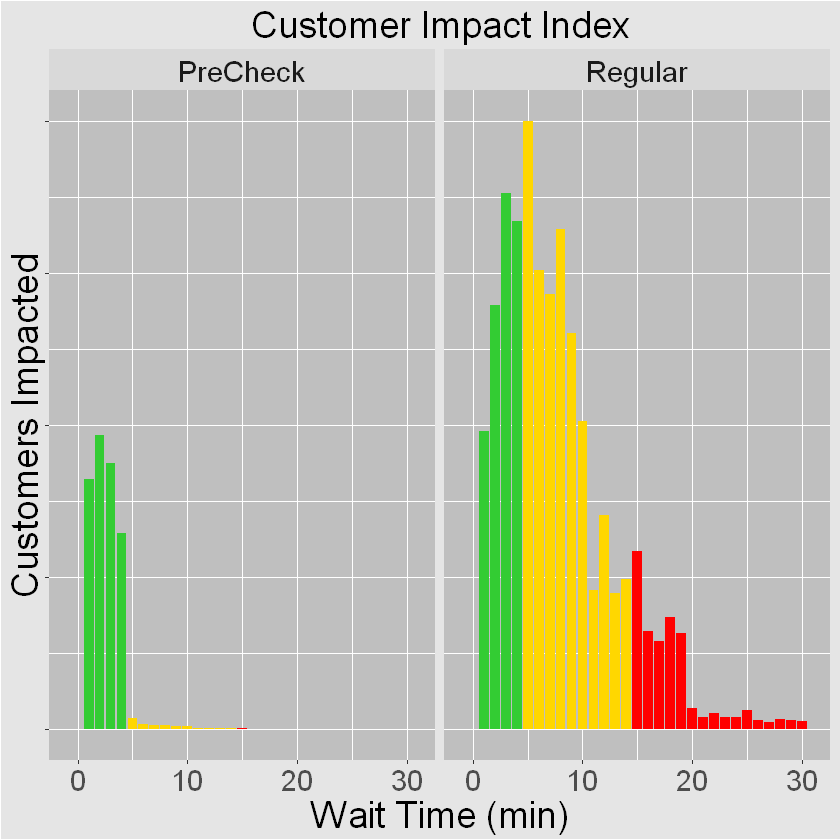


AVERAGE WAIT TIMES BY TIME OF DAY AND LANE
# A tibble: 48 x 3
# Groups:   HourInt [24]
   HourInt Lane     AveWait
     <int> <fct>      <dbl>
 1       0 PreCheck  0.228 
 2       0 Regular   1.65  
 3       1 PreCheck  0.0969
 4       1 Regular   1.12  
 5       2 PreCheck  0.0808
 6       2 Regular   1.00  
 7       3 PreCheck  0.408 
 8       3 Regular   1.77  
 9       4 PreCheck  1.26  
10       4 Regular   3.50  
# ... with 38 more rows


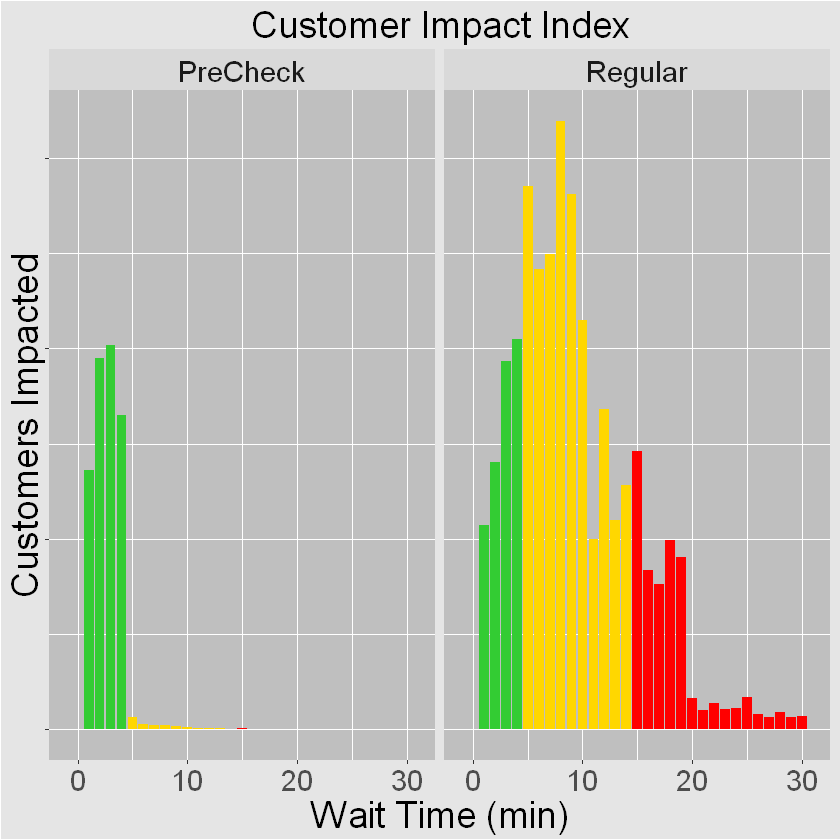


AVERAGE WAIT TIMES BY TIME OF DAY AND SIZE
# A tibble: 144 x 3
# Groups:   HourInt [24]
   HourInt Cat   AveWait
     <int> <fct>   <dbl>
 1       0 I      0.745 
 2       0 II     3.17  
 3       0 III    0.0863
 4       0 IV     0.302 
 5       0 OS     3.32  
 6       0 X      1.23  
 7       1 I      0.424 
 8       1 II     1.39  
 9       1 III    0.052 
10       1 IV     0.105 
# ... with 134 more rows


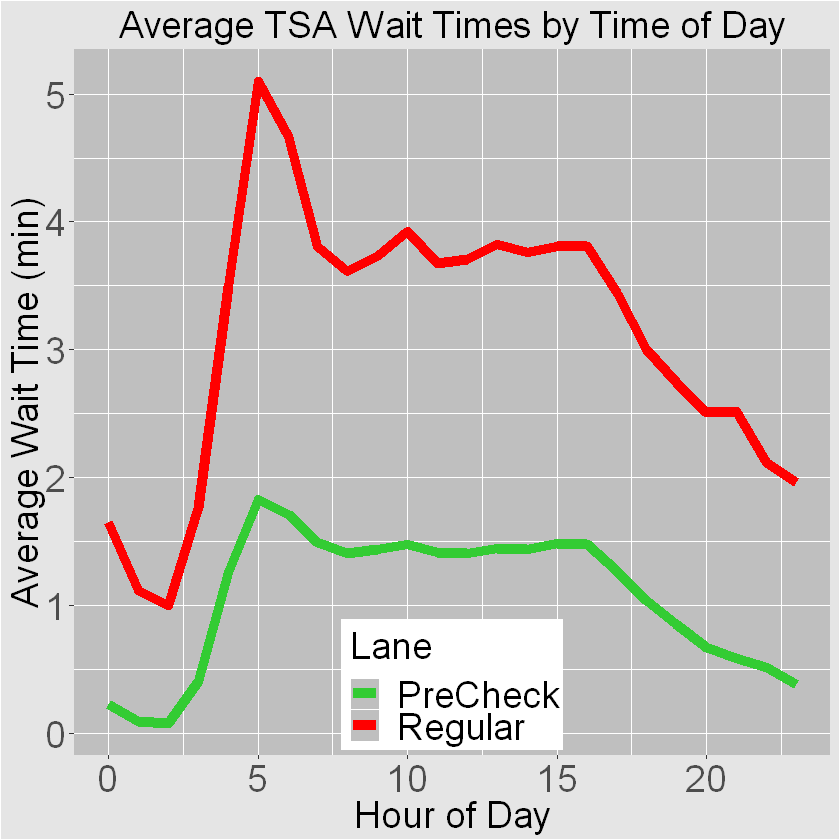


AVERAGE WAIT TIMES BY TIME OF DAY AND DAY OF WEEK
# A tibble: 168 x 3
# Groups:   HourInt [24]
   HourInt Day   AveWait
     <int> <fct>   <dbl>
 1       0 Fri     1.25 
 2       0 Mon     1.33 
 3       0 Sat     1.30 
 4       0 Sun     1.39 
 5       0 Thu     1.17 
 6       0 Tue     1.31 
 7       0 Wed     1.20 
 8       1 Fri     0.848
 9       1 Mon     0.808
10       1 Sat     0.945
# ... with 158 more rows


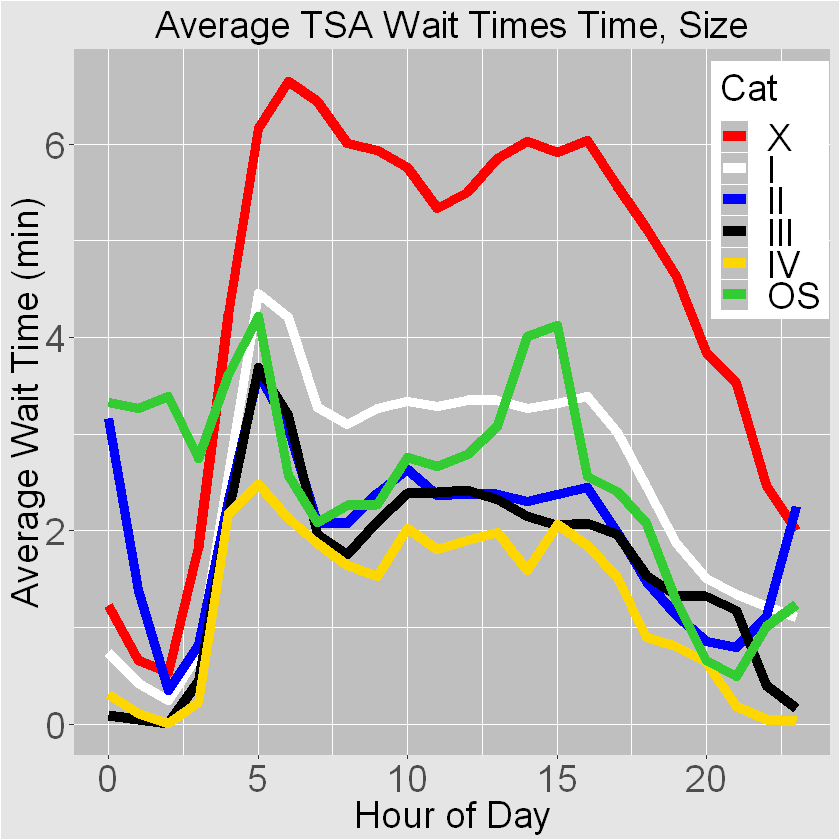


AVERAGE WAIT TIMES BY MONTH
# A tibble: 12 x 2
   Month AveWait
   <fct>   <dbl>
 1 Apr      2.66
 2 Aug      3.15
 3 Dec      2.92
 4 Feb      2.62
 5 Jan      2.56
 6 Jul      3.18
 7 Jun      2.99
 8 Mar      2.75
 9 May      2.75
10 Nov      2.83
11 Oct      3.07
12 Sep      3.03


Warning message:
"Ignoring unknown parameters: binwidth, bins, pad"

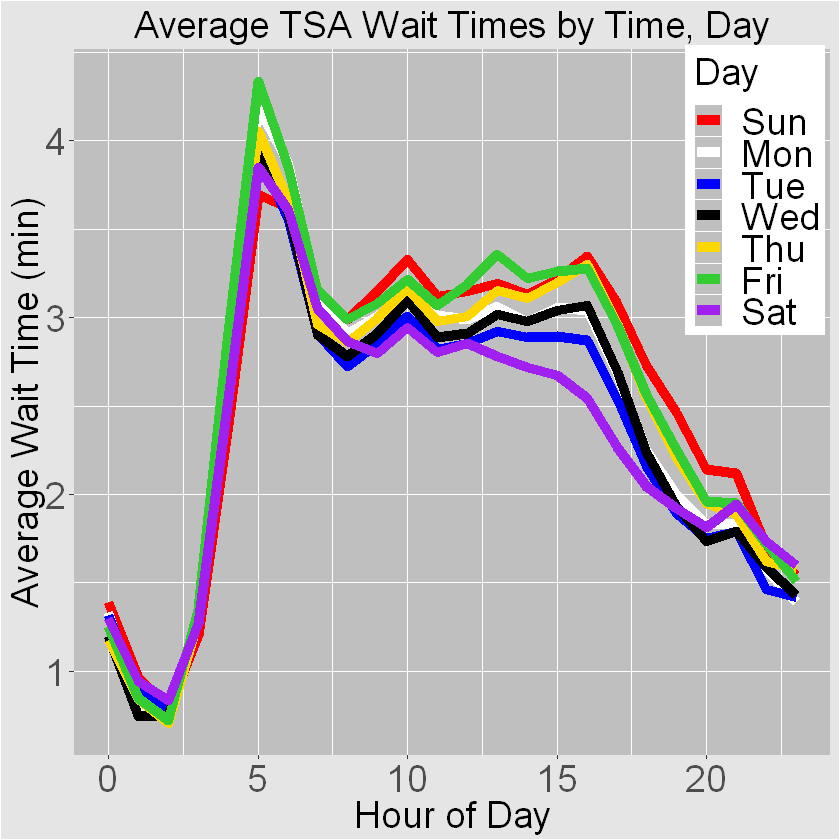


COMPARISON OF AVERAGE WAIT TIMES BY TIME OF DAY AND LANE
# A tibble: 96 x 5
# Groups:   HourInt, Lane [48]
   HourInt Lane     Airport AveWait AptLane     
     <int> <fct>    <fct>     <dbl> <chr>       
 1       0 PreCheck JFK      0.164  JFK_PreCheck
 2       0 PreCheck LAX      0.316  LAX_PreCheck
 3       0 Regular  JFK      3.75   JFK_Regular 
 4       0 Regular  LAX      4.82   LAX_Regular 
 5       1 PreCheck JFK      0.167  JFK_PreCheck
 6       1 PreCheck LAX      0.0169 LAX_PreCheck
 7       1 Regular  JFK      1.35   JFK_Regular 
 8       1 Regular  LAX      1.25   LAX_Regular 
 9       2 PreCheck JFK      0.208  JFK_PreCheck
10       2 PreCheck LAX      0.0159 LAX_PreCheck
# ... with 86 more rows


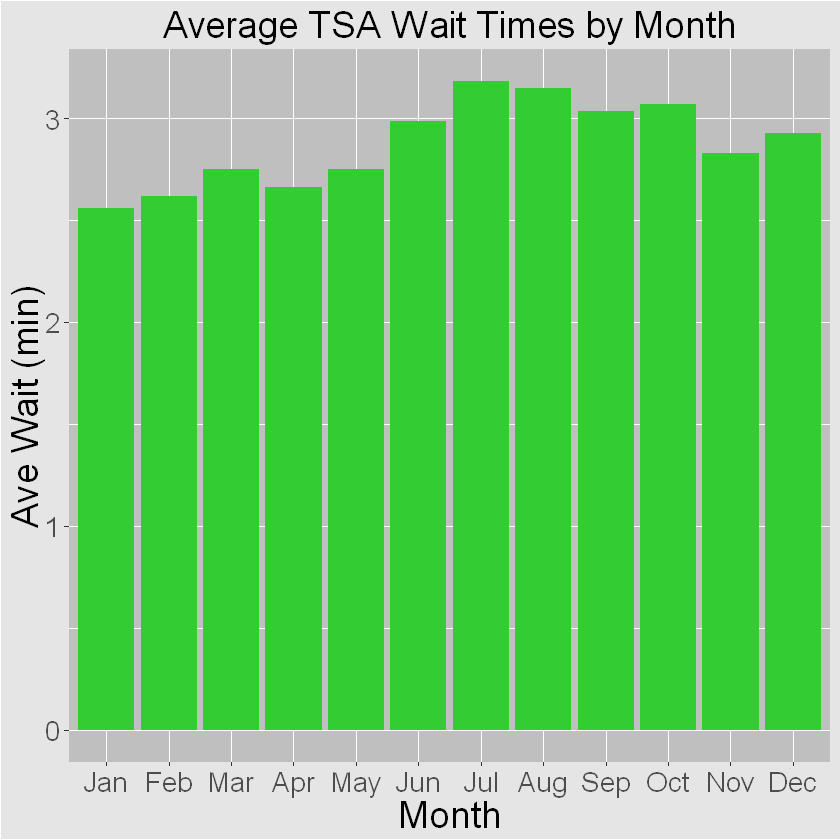

[1] "ID"                 "Airport"            "Date"              
 [4] "HourRaw"            "WaitTime"           "Lane"              
 [7] "Hour"               "Day"                "Month"             
[10] "AptName"            "Airport.City"       "Airport.State"     
[13] "Airport.Zip.Code"   "Cat"                "Latitude"          
[16] "Longitude"          "Size"               "DateDT"            
[19] "DateOnly"           "YearMonth"          "HourDT"            
[22] "HourOnly"           "DateTimeObj"        "DateTimeDT"        
[25] "Wait05orMore"       "Wait10orMore"       "Wait15orMore"      
[28] "Wait20orMore"       "Wait30orMore"       "JFK"               
[31] "BOS"                "LAX"                "LAS"               
[34] "DCA"                "IAD"                "BWI"               
[37] "ORD"                "EWR"                "MCO"               
[40] "DFW"                "MIA"                "HourObj"           
[43] "HourInt"            "HourIntSquared"     "HourIntCubed"      
[46] "AMRush"             "PMRush"             "Jan"               
[49] "Feb"                "Mar"                "Apr"               
[52] "May"                "Jun"                "Jul"               
[55] "Aug"                "Sep"                "Oct"               
[58] "Nov"                "Dec"                "Mon"               
[61] "Tue"                "Wed"                "Thu"               
[64] "Fri"                "Sat"                "Sun"               
[67] "PreCheck"           "CatX"               "CatI"              
[70] "CatII"              "CatIII"             "CatIV"             
[73] "WaitTimeContinuous"

       ID             Airport                        Date        
 Min.   :  98948   HVN    :  14640   30/11/2014 0:00:00:   7058  
 1st Qu.: 746857   BDL    :  14638   13/7/2015 0:00:00 :   7025  
 Median :1297167   MDW    :  14635   6/7/2015 0:00:00  :   7021  
 Mean   :1297774   SFO    :  14594   17/8/2015 0:00:00 :   7020  
 3rd Qu.:1868025   PIT    :  14559   19/6/2015 0:00:00 :   7002  
 Max.   :2438569   ANC    :  14286   26/6/2015 0:00:00 :   6994  
                   (Other):1953076   (Other)           :1998308  
    HourRaw           WaitTime            Lane        
 05:00  :  85983   Min.   : 0.000   PreCheck: 665829  
 12:00  :  85488   1st Qu.: 1.000   Regular :1374599  
 06:00  :  84756   Median : 2.000                     
 11:00  :  83057   Mean   : 2.873                     
 13:00  :  81734   3rd Qu.: 4.000                     
 10:00  :  81358   Max.   :87.000                     
 (Other):1538052                                      
                  Hour          


Attaching package: 'MASS'

The following object is masked from 'package:dplyr':

    select



,WaitTime,HourInt,AMRush,PMRush,PreCheck
WaitTime,1.00000000,-0.065956487,0.096985715,0.012054564,-0.306887957
HourInt,-0.06595649,1.000000000,-0.507997568,0.372193985,-0.009778588
AMRush,0.09698571,-0.507997568,1.000000000,-0.212681357,0.009001227
PMRush,0.01205456,0.372193985,-0.212681357,1.000000000,-0.007466382
PreCheck,-0.30688796,-0.009778588,0.009001227,-0.007466382,1.000000000


,WaitTime,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
WaitTime,1.000000000,-0.02813937,-0.02162725,-0.01105855,-0.01885986,-0.01132324,0.01016765,0.02823974,0.02508744,0.01247861,0.01568835,-0.003547162,0.004088617
Jan,-0.028139374,1.00000000,-0.09324901,-0.10056821,-0.09774875,-0.09979271,-0.09903493,-0.10114148,-0.10037637,-0.08523732,-0.08687990,-0.084798970,-0.087344434
Feb,-0.021627255,-0.09324901,1.00000000,-0.09503322,-0.09236894,-0.09430040,-0.09358432,-0.09557493,-0.09485194,-0.08054610,-0.08209827,-0.080131872,-0.082537241
Mar,-0.011058550,-0.10056821,-0.09503322,1.00000000,-0.09961906,-0.10170213,-0.10092984,-0.10307670,-0.10229695,-0.08686824,-0.08854224,-0.086421497,-0.089015665
Apr,-0.018859864,-0.09774875,-0.09236894,-0.09961906,1.00000000,-0.09885088,-0.09810025,-0.10018692,-0.09942903,-0.08443286,-0.08605994,-0.083998649,-0.086520089
May,-0.011323244,-0.09979271,-0.09430040,-0.10170213,-0.09885088,1.00000000,-0.10015156,-0.10228186,-0.10150813,-0.08619838,-0.08785948,-0.085755088,-0.088329252
Jun,0.010167655,-0.09903493,-0.09358432,-0.10092984,-0.09810025,-0.10015156,1.00000000,-0.10150517,-0.10073731,-0.08554383,-0.08719231,-0.085103898,-0.087658514
Jul,0.028239736,-0.10114148,-0.09557493,-0.10307670,-0.10018692,-0.10228186,-0.10150517,1.00000000,-0.10288007,-0.08736341,-0.08904696,-0.086914124,-0.089523079
Aug,0.025087439,-0.10037637,-0.09485194,-0.10229695,-0.09942903,-0.10150813,-0.10073731,-0.10288007,1.00000000,-0.08670253,-0.08837335,-0.086256645,-0.088845865
Sep,0.012478614,-0.08523732,-0.08054610,-0.08686824,-0.08443286,-0.08619838,-0.08554383,-0.08736341,-0.08670253,1.00000000,-0.07504463,-0.073247173,-0.075445879


,WaitTime,Mon,Tue,Wed,Thu,Fri,Sat,Sun
WaitTime,1.000000000,0.001497872,-0.01561828,-0.007159152,0.007420867,0.01981955,-0.01976746,0.01281575
Mon,0.001497872,1.000000000,-0.16773859,-0.170222510,-0.172045647,-0.17252360,-0.16292977,-0.16929017
Tue,-0.015618277,-0.167738590,1.00000000,-0.165352724,-0.167123705,-0.16758798,-0.15826862,-0.16444705
Wed,-0.007159152,-0.170222510,-0.16535272,1.000000000,-0.169598519,-0.17006967,-0.16061230,-0.16688223
Thu,0.007420867,-0.172045647,-0.16712370,-0.169598519,1.000000000,-0.17189117,-0.16233251,-0.16866959
Fri,0.019819545,-0.172523600,-0.16758798,-0.170069675,-0.171891175,1.00000000,-0.16278348,-0.16913817
Sat,-0.019767461,-0.162929767,-0.15826862,-0.160612301,-0.162332510,-0.16278348,1.00000000,-0.15973260
Sun,0.012815747,-0.169290167,-0.16444705,-0.166882232,-0.168669594,-0.16913817,-0.15973260,1.00000000


,WaitTime,CatX,CatI,CatII,CatIII,CatIV
WaitTime,1.00000000,0.2649944,0.0151785,-0.09391051,-0.07770702,-0.1080655
CatX,0.26499443,1.0000000,-0.2847999,-0.25438033,-0.19537601,-0.1556925
CatI,0.01517850,-0.2847999,1.0000000,-0.36462848,-0.28005175,-0.2231695
CatII,-0.09391051,-0.2543803,-0.3646285,1.00000000,-0.25013932,-0.1993327
CatIII,-0.07770702,-0.1953760,-0.2800517,-0.25013932,1.00000000,-0.1530968
CatIV,-0.10806551,-0.1556925,-0.2231695,-0.19933265,-0.15309681,1.0000000


,WaitTime,JFK,BOS,LAX,LAS,DCA,IAD,BWI,ORD,EWR,MCO,DFW,MIA
WaitTime,1.00000000,0.099581450,0.039340054,0.063749407,0.060260984,0.019904922,0.033435758,0.023015482,0.089888094,0.087621859,0.020848800,0.041989584,0.070720665
JFK,0.09958145,1.000000000,-0.006213855,-0.006700740,-0.006542370,-0.005999089,-0.006792742,-0.006384508,-0.006378390,-0.006332320,-0.006403337,-0.006187112,-0.006718462
BOS,0.03934005,-0.006213855,1.000000000,-0.006350039,-0.006199959,-0.005685111,-0.006437226,-0.006050359,-0.006044561,-0.006000901,-0.006068202,-0.005863294,-0.006366834
LAX,0.06374941,-0.006700740,-0.006350039,1.000000000,-0.006685754,-0.006130566,-0.006941613,-0.006524433,-0.006518180,-0.006471100,-0.006543674,-0.006322710,-0.006865706
LAS,0.06026098,-0.006542370,-0.006199959,-0.006685754,1.000000000,-0.005985672,-0.006777550,-0.006370230,-0.006364126,-0.006318158,-0.006389017,-0.006173275,-0.006703437
DCA,0.01990492,-0.005999089,-0.005685111,-0.006130566,-0.005985672,1.000000000,-0.006214739,-0.005841243,-0.005835646,-0.005793495,-0.005858470,-0.005660644,-0.006146781
IAD,0.03343576,-0.006792742,-0.006437226,-0.006941613,-0.006777550,-0.006214739,1.000000000,-0.006614014,-0.006607676,-0.006559949,-0.006633519,-0.006409522,-0.006959972
BWI,0.02301548,-0.006384508,-0.006050359,-0.006524433,-0.006370230,-0.005841243,-0.006614014,1.000000000,-0.006210565,-0.006165706,-0.006234855,-0.006024319,-0.006541689
ORD,0.08988809,-0.006378390,-0.006044561,-0.006518180,-0.006364126,-0.005835646,-0.006607676,-0.006210565,1.000000000,-0.006159798,-0.006228880,-0.006018546,-0.006535420
EWR,0.08762186,-0.006332320,-0.006000901,-0.006471100,-0.006318158,-0.005793495,-0.006559949,-0.006165706,-0.006159798,1.000000000,-0.006183890,-0.005975075,-0.006488215


Warning message:
"Removed 885 rows containing non-finite values (stat_ydensity)."Warning message:
"Removed 885 rows containing non-finite values (stat_boxplot)."

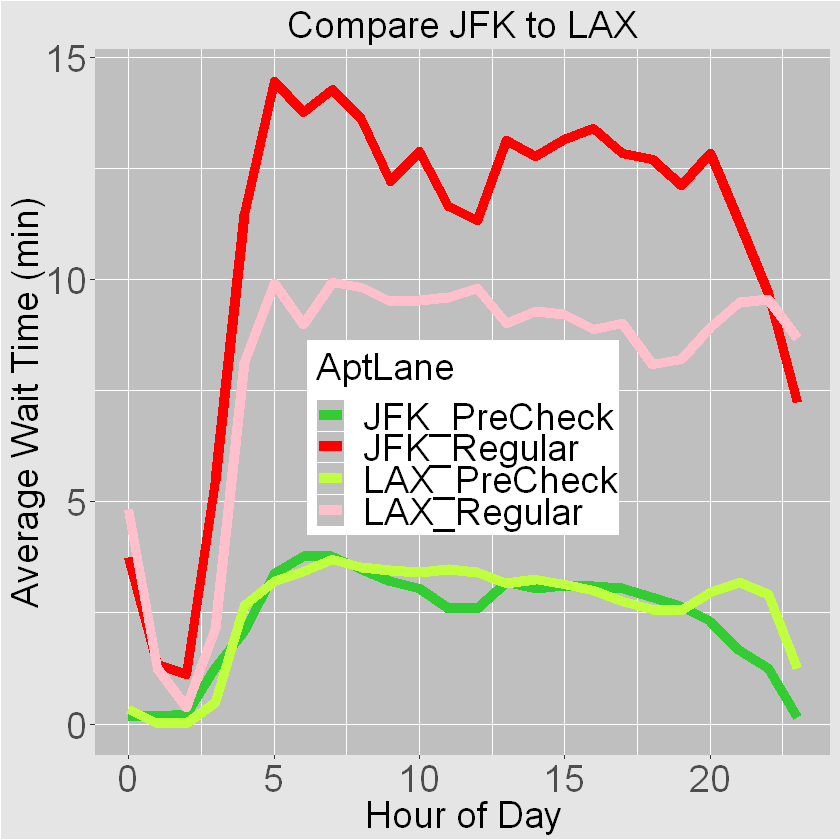

Warning message:
"Removed 885 rows containing non-finite values (stat_ydensity)."Warning message:
"Removed 885 rows containing non-finite values (stat_boxplot)."

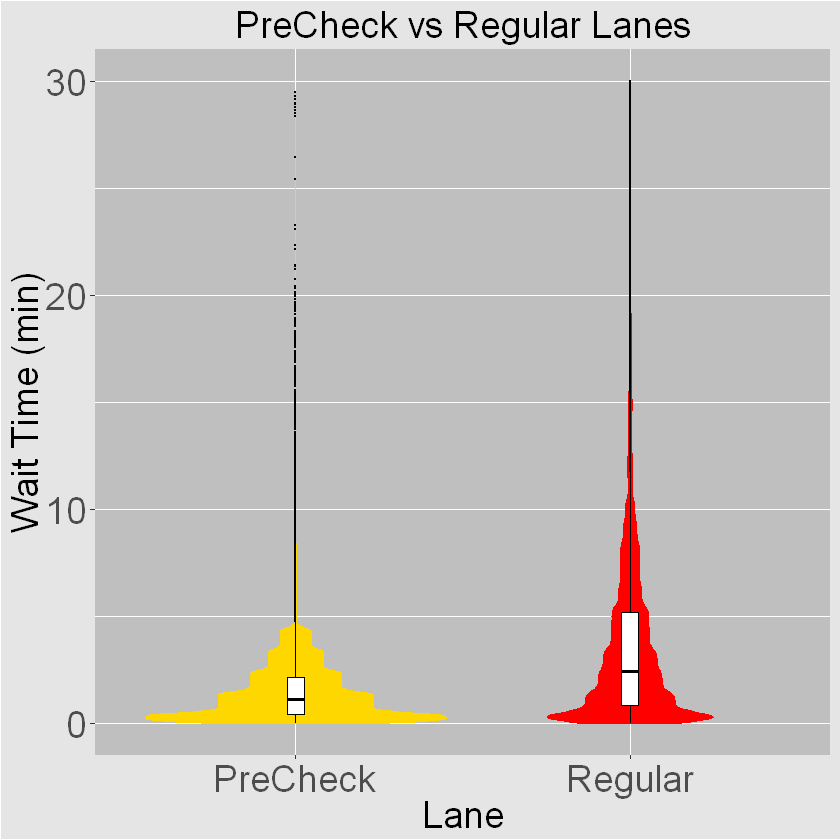

Warning message:
"Removed 885 rows containing non-finite values (stat_ydensity)."Warning message:
"Removed 885 rows containing non-finite values (stat_boxplot)."

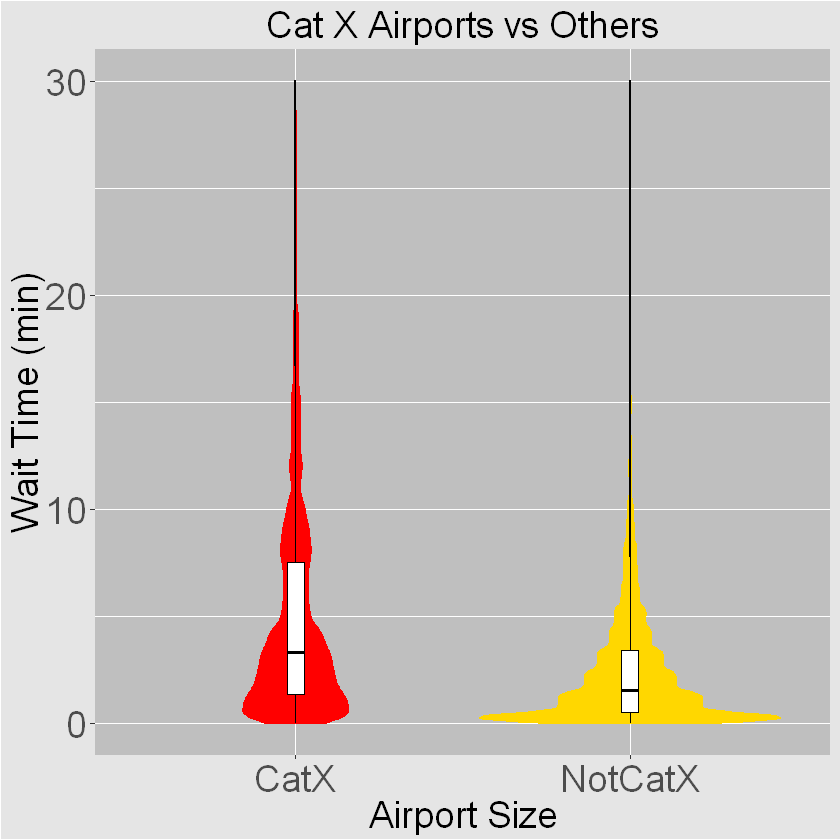

Warning message:
"Removed 885 rows containing non-finite values (stat_ydensity)."Warning message:
"Removed 885 rows containing non-finite values (stat_boxplot)."

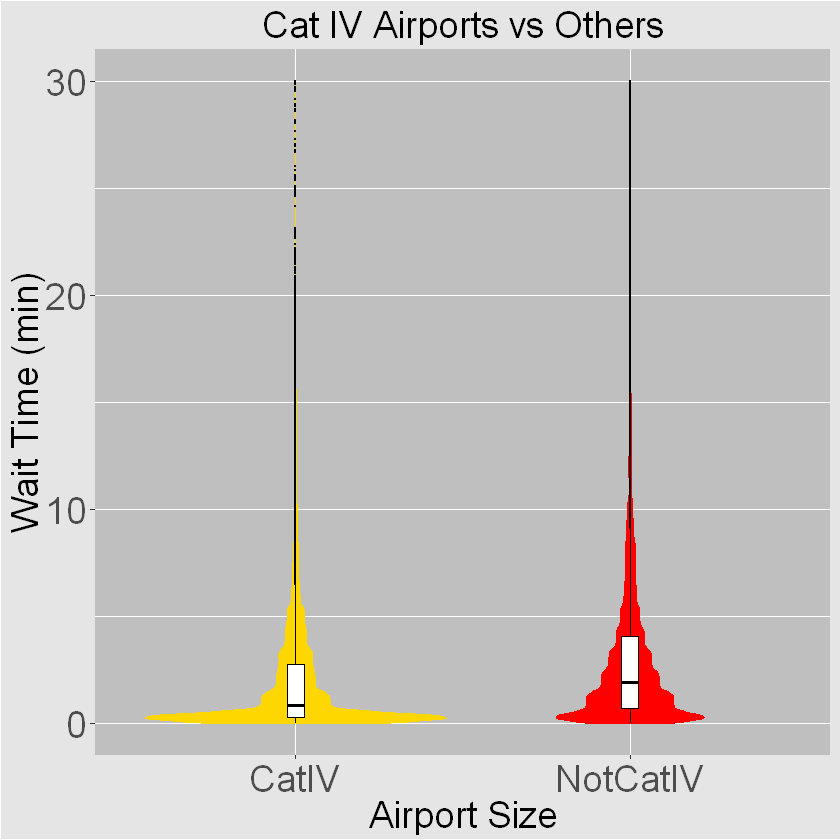

Warning message:
"Removed 885 rows containing non-finite values (stat_ydensity)."Warning message:
"Removed 885 rows containing non-finite values (stat_boxplot)."

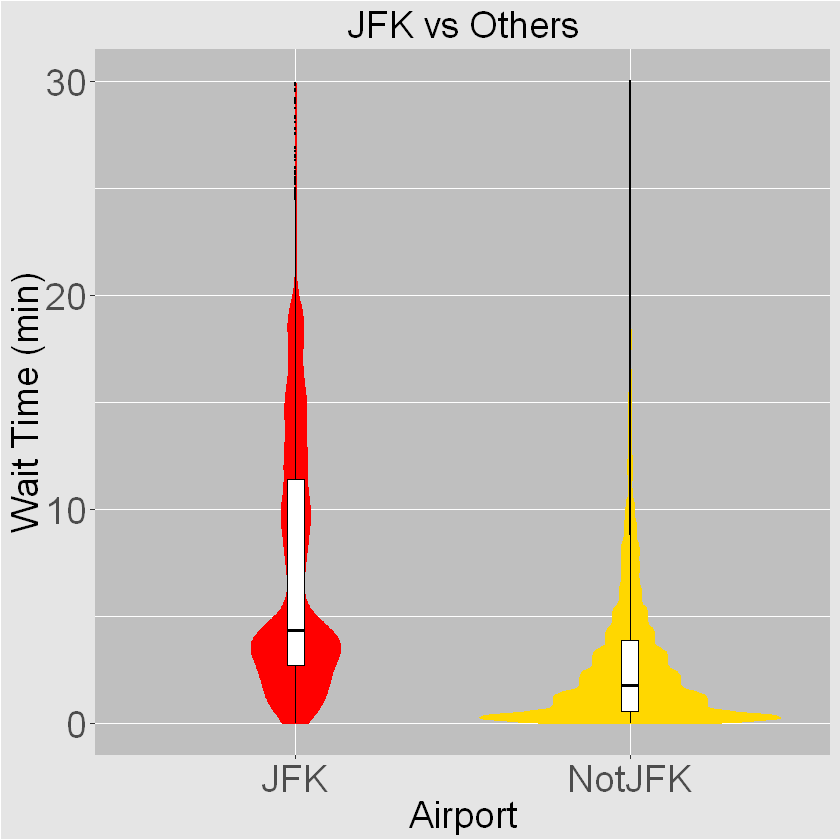

Warning message:
"Removed 885 rows containing non-finite values (stat_ydensity)."Warning message:
"Removed 885 rows containing non-finite values (stat_boxplot)."

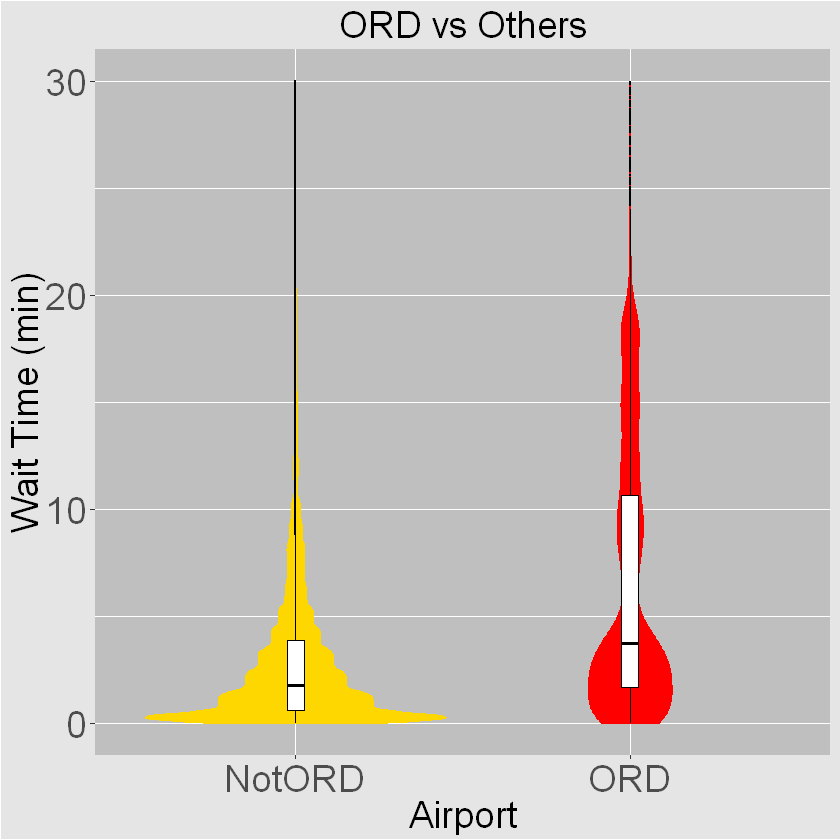

Warning message:
"Removed 885 rows containing non-finite values (stat_ydensity)."Warning message:
"Removed 885 rows containing non-finite values (stat_boxplot)."

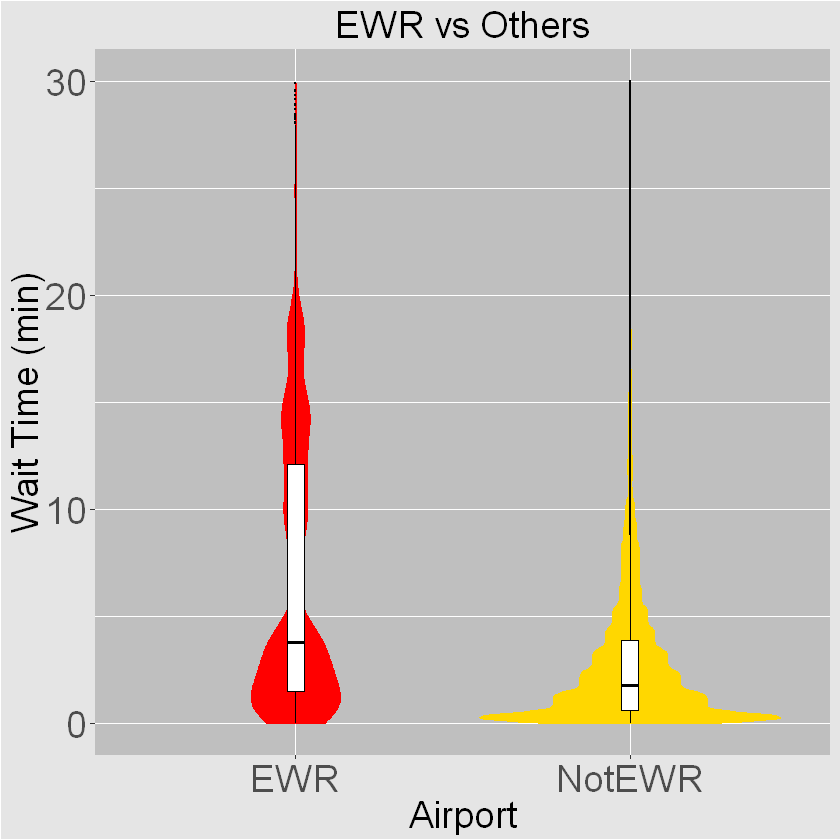

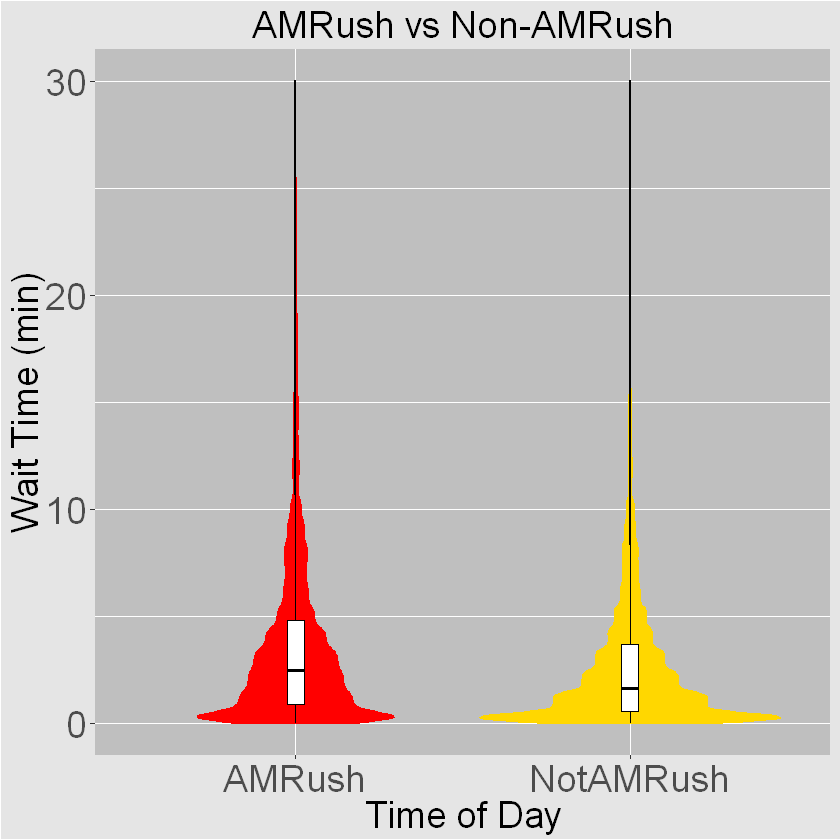

In [1]:
#!!!!!!!!! CHANGE TO R KERNEL !!!!!!!!!!!!!

#CELL NAME:  R STATS
#THIS CELL PROVIDES ADDITIONAL DESCRIPTIVE STATS
#This cell requires the WaitTimeR data produced in R SETUP cell above, so run R SETUP cell first
#Note:  plots sized for transfer to analytical paper in MS Word

#library(psych)
library(MASS) #Note MASS masks dplyr select function
#library(stats)
#library(fitdistrplus)
#library(vioplot)


#print(describe(TimeTotal$n))
#print(describe(AptWaitsR$WaitTimeContinuous))

#FitWeibull <- fitdist(TimeTotal$n, "weibull")
#summary(FitWeibull)
#plotdist(TimeTotal$n, histo=TRUE, demp=TRUE, discrete=TRUE)
#plotdist(AptWaitsR$WaitTime, histo=TRUE, demp=TRUE)

#Construct Pearson's correlation matrices--note Pearson's assumptions fail on this data, but do it anyway
cor(AptWaitsR[, c("WaitTime", "HourInt", "AMRush", "PMRush", "PreCheck")])
cor(AptWaitsR[, c("WaitTime", "Jan", "Feb", "Mar", "Apr", "May", "Jun", 
                 "Jul", "Aug", "Sep", "Oct", "Nov", "Dec")])
cor(AptWaitsR[, c("WaitTime", "Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun")])
cor(AptWaitsR[, c("WaitTime", "CatX", "CatI", "CatII", "CatIII", "CatIV")])
cor(AptWaitsR[, c("WaitTime", "JFK", "BOS", "LAX", "LAS", "DCA", "IAD", "BWI",
                 "ORD", "EWR", "MCO", "DFW", "MIA")])

#Create visualizatiions for variables of interest, based on Pearson's correlation matrices above
ggplot(AptWaitsR, aes(x=Lane, y=WaitTimeContinuous, fill=Lane, color=Lane)) + 
    geom_violin(linetype='solid', size=0) +
    scale_fill_manual(values = c("Regular"="red", "PreCheck"="gold")) +
    scale_color_manual(values = c("Regular"="red", "PreCheck"="gold")) +
    ggtitle("PreCheck vs Regular Lanes") + xlab("Lane") + 
    ylab("Wait Time (min)") + 
#    theme(legend.position=c(0.5,0.45), legend.key = element_rect(fill="grey75")) +
    geom_boxplot(width=0.05, fill="white", color="black", outlier.size=0.1) +
    theme(legend.position="none") +
    theme(legend.title = element_text(size=rel(2))) +
    theme(legend.text = element_text(size=rel(2))) +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    ylim(0, 30)

AptWaitsR$CatXCategorical <- "NotCatX"
AptWaitsR$CatXCategorical[AptWaitsR$Cat=="X"] <- "CatX"

ggplot(AptWaitsR, aes(x=CatXCategorical, y=WaitTimeContinuous, fill=CatXCategorical, color=CatXCategorical)) + 
    geom_violin(linetype='solid', size=0) +
    scale_fill_manual(values = c("CatX"="red", "NotCatX"="gold")) +
    scale_color_manual(values = c("CatX"="red", "NotCatX"="gold")) +
    ggtitle("Cat X Airports vs Others") + xlab("Airport Size") + 
    ylab("Wait Time (min)") + 
#    theme(legend.position=c(0.5,0.45), legend.key = element_rect(fill="grey75")) +
    geom_boxplot(width=0.05, fill="white", color="black", outlier.size=0.1) +
    theme(legend.position="none") +
    theme(legend.title = element_text(size=rel(2))) +
    theme(legend.text = element_text(size=rel(2))) +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    ylim(0, 30)   

AptWaitsR$CatIVCategorical <- "NotCatIV"
AptWaitsR$CatIVCategorical[AptWaitsR$Cat=="IV"] <- "CatIV"

ggplot(AptWaitsR, aes(x=CatIVCategorical, y=WaitTimeContinuous, fill=CatIVCategorical, color=CatIVCategorical)) + 
    geom_violin(linetype='solid', size=0) +
    scale_fill_manual(values = c("CatIV"="gold", "NotCatIV"="red")) +
    scale_color_manual(values = c("CatIV"="gold", "NotCatIV"="red")) +
    ggtitle("Cat IV Airports vs Others") + xlab("Airport Size") + 
    ylab("Wait Time (min)") + 
#    theme(legend.position=c(0.5,0.45), legend.key = element_rect(fill="grey75")) +
    geom_boxplot(width=0.05, fill="white", color="black", outlier.size=0.1) +
    theme(legend.position="none") +
    theme(legend.title = element_text(size=rel(2))) +
    theme(legend.text = element_text(size=rel(2))) +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    ylim(0, 30) 

AptWaitsR$JFKCategorical <- "NotJFK"
AptWaitsR$JFKCategorical[AptWaitsR$JFK=="1"] <- "JFK"

ggplot(AptWaitsR, aes(x=JFKCategorical, y=WaitTimeContinuous, fill=JFKCategorical, color=JFKCategorical)) + 
    geom_violin(linetype='solid', size=0) +
    scale_fill_manual(values = c("NotJFK"="gold", "JFK"="red")) +
    scale_color_manual(values = c("NotJFK"="gold", "JFK"="red")) +
    ggtitle("JFK vs Others") + xlab("Airport") + 
    ylab("Wait Time (min)") + 
#    theme(legend.position=c(0.5,0.45), legend.key = element_rect(fill="grey75")) +
    geom_boxplot(width=0.05, fill="white", color="black", outlier.size=0.1) +
    theme(legend.position="none") +
    theme(legend.title = element_text(size=rel(2))) +
    theme(legend.text = element_text(size=rel(2))) +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    ylim(0, 30) 

AptWaitsR$ORDCategorical <- "NotORD"
AptWaitsR$ORDCategorical[AptWaitsR$ORD=="1"] <- "ORD"

ggplot(AptWaitsR, aes(x=ORDCategorical, y=WaitTimeContinuous, fill=ORDCategorical, color=ORDCategorical)) + 
    geom_violin(linetype='solid', size=0) +
    scale_fill_manual(values = c("NotORD"="gold", "ORD"="red")) +
    scale_color_manual(values = c("NotORD"="gold", "ORD"="red")) +
    ggtitle("ORD vs Others") + xlab("Airport") + 
    ylab("Wait Time (min)") + 
#    theme(legend.position=c(0.5,0.45), legend.key = element_rect(fill="grey75")) +
    geom_boxplot(width=0.05, fill="white", color="black", outlier.size=0.1) +
    theme(legend.position="none") +
    theme(legend.title = element_text(size=rel(2))) +
    theme(legend.text = element_text(size=rel(2))) +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    ylim(0, 30) 

AptWaitsR$EWRCategorical <- "NotEWR"
AptWaitsR$EWRCategorical[AptWaitsR$EWR=="1"] <- "EWR"

ggplot(AptWaitsR, aes(x=EWRCategorical, y=WaitTimeContinuous, fill=EWRCategorical, color=EWRCategorical)) + 
    geom_violin(linetype='solid', size=0) +
    scale_fill_manual(values = c("NotEWR"="gold", "EWR"="red")) +
    scale_color_manual(values = c("NotEWR"="gold", "EWR"="red")) +
    ggtitle("EWR vs Others") + xlab("Airport") + 
    ylab("Wait Time (min)") + 
#    theme(legend.position=c(0.5,0.45), legend.key = element_rect(fill="grey75")) +
    geom_boxplot(width=0.05, fill="white", color="black", outlier.size=0.1) +
    theme(legend.position="none") +
    theme(legend.title = element_text(size=rel(2))) +
    theme(legend.text = element_text(size=rel(2))) +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    ylim(0, 30) 

AptWaitsR$AMRushCategorical <- "NotAMRush"
AptWaitsR$AMRushCategorical[AptWaitsR$AMRush=="1"] <- "AMRush"

ggplot(AptWaitsR, aes(x=AMRushCategorical, y=WaitTimeContinuous, fill=AMRushCategorical, color=AMRushCategorical)) + 
    geom_violin(linetype='solid', size=0) +
    scale_fill_manual(values = c("NotAMRush"="gold", "AMRush"="red")) +
    scale_color_manual(values = c("NotAMRush"="gold", "AMRush"="red")) +
    ggtitle("AMRush vs Non-AMRush") + xlab("Time of Day") + 
    ylab("Wait Time (min)") + 
#    theme(legend.position=c(0.5,0.45), legend.key = element_rect(fill="grey75")) +
    geom_boxplot(width=0.05, fill="white", color="black", outlier.size=0.1) +
    theme(legend.position="none") +
    theme(legend.title = element_text(size=rel(2))) +
    theme(legend.text = element_text(size=rel(2))) +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    ylim(0, 30) 

#Try T-Tests?  ANOVA?  Will it tell us anything, or just needless tests?  Normality already violated.  
#Try multiple regression, regardless of normality concerns?  Will it tell us anything new?  Worth a try.  
#Perhaps go straight into curve fitting?  Or regress first to confirm variables of interest?  

#A lot of the dummy variables are multicolinear, not linearly independent, so drop some so we don't load the matrix
#Drop Oct, Nov, Dec, Tue, Wed, Thu, CatII, CatIII
#LinReg <- lm(WaitTimeContinuous ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+PreCheck+
#             Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun+CatX+CatI+CatIV+JFK+BOS+LAX+
#             LAS+DCA+IAD+BWI+ORD+EWR+MCO+DFW+MIA, data=AptWaitsR)
#cat("\nLINEAR REGRESSION RESULTS FOR ALL AIRPORTS\n")
#summary(LinReg)
#cat("\nSTEPWISE REGRESSION RESULTS FOR ALL AIRPORTS\n")
#LinRegStepwise <- stepAIC(LinReg, direction = "both")
#cat("\nSTEPWISE ANOVA FOR ALL AIRPORTS\n")
#LinRegStepwise$anova

#Produce a model based on outputs from above stepwise regression
#LinRegFinal <- lm(WaitTimeContinuous ~ PreCheck+CatX+CatI+AMRush+HourInt+JFK+CatIV+ORD+HourIntSquared+
#                  EWR+PMRush+MIA+Jan+LAX+Fri+Feb+MCO+Jul+DCA+LAS+Apr+Sat+Aug+HourIntCubed+Sun+BWI, data=AptWaitsR)
#cat("\nLINEAR REGRESSION FINAL MODEL FOR ALL AIRPORTS\n")
#summary(LinRegFinal)
#plot(LinRegFinal, pch=20, cex=0.1)

#Try a couple of individual airports:
#AptWaitsJFK <- AptWaitsR %>% filter(JFK==1)
#LinRegJFK <- lm(WaitTimeContinuous ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+PreCheck+
#             Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun, data=AptWaitsJFK)
#cat("\nLINEAR REGRESSION RESULTS FOR JFK\n")
#summary(LinRegJFK)
#cat("\nSTEPWISE REGRESSION RESULTS FOR JFK\n")
#LinRegStepwiseJFK <- stepAIC(LinRegJFK, direction = "both")
#cat("\nSTEPWISE ANOVA FOR JFK\n")
#LinRegStepwiseJFK$anova

#AptWaitsORD <- AptWaitsR %>% filter(ORD==1)
#LinRegORD <- lm(WaitTimeContinuous ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+PreCheck+
#             Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun, data=AptWaitsORD)
#cat("\nLINEAR REGRESSION RESULTS FOR ORD\n")
#summary(LinRegORD)
#cat("\nSTEPWISE REGRESSION RESULTS FOR ORD\n")
#LinRegStepwiseORD <- stepAIC(LinRegORD, direction = "both")
#cat("\nSTEPWISE ANOVA FOR ORD\n")
#LinRegStepwiseORD$anova

#AptWaitsEWR <- AptWaitsR %>% filter(EWR==1)
#LinRegEWR <- lm(WaitTimeContinuous ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+PreCheck+
#             Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun, data=AptWaitsEWR)
#cat("\nLINEAR REGRESSION RESULTS FOR EWR\n")
#summary(LinRegEWR)
#cat("\nSTEPWISE REGRESSION RESULTS FOR EWR\n")
#LinRegStepwiseEWR <- stepAIC(LinRegEWR, direction = "both")
#cat("\nSTEPWISE ANOVA FOR EWR\n")
#LinRegStepwiseEWR$anova

#START A NEW CELL--THIS IS TAKING TOO LONG TO RUN EN MASSE

Warning message:
"Removed 2370 rows containing non-finite values (stat_bin)."Warning message:
"Removed 4 rows containing missing values (geom_bar)."Warning message:
"Removed 12 rows containing non-finite values (stat_bin)."Warning message:
"Removed 4 rows containing missing values (geom_bar)."

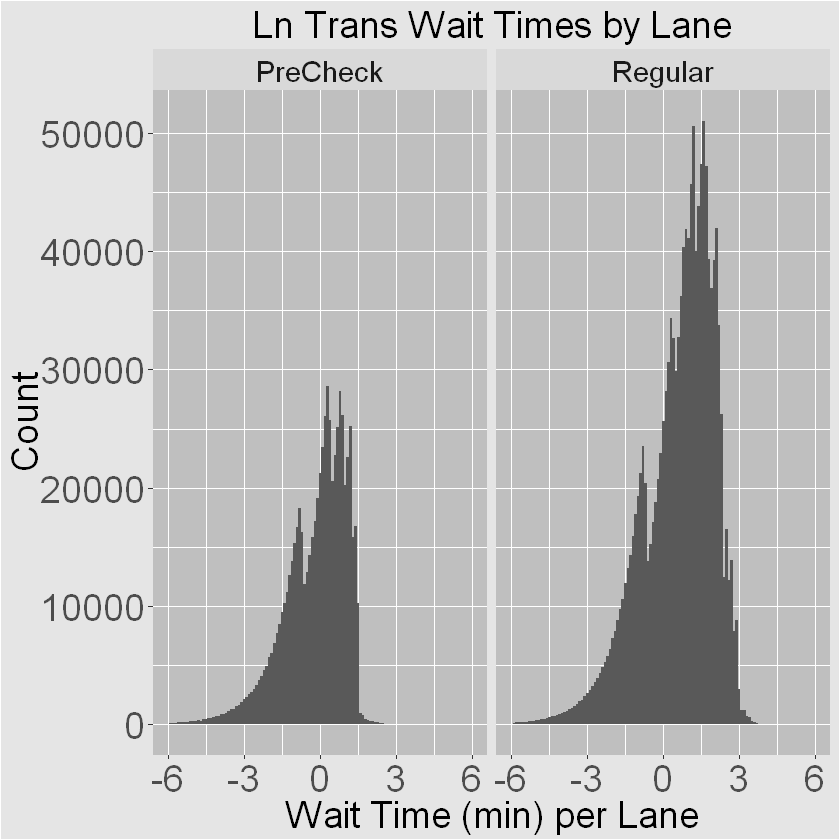

Warning message:
"Removed 1 rows containing non-finite values (stat_bin)."Warning message:
"Removed 4 rows containing missing values (geom_bar)."

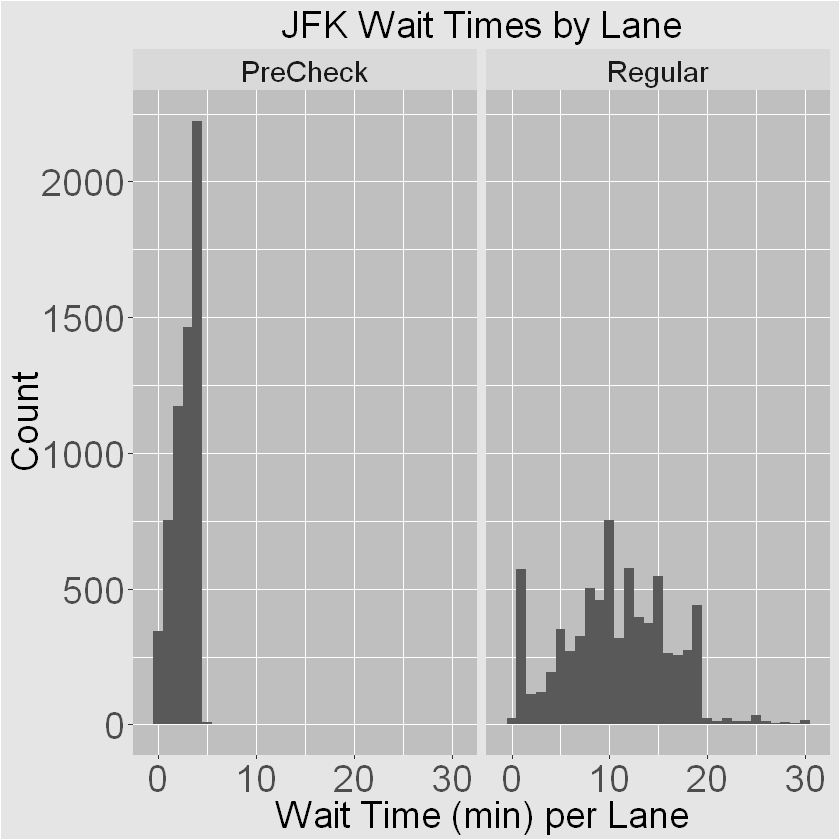


LINEAR REGRESSION FINAL MODEL FOR JFK



Call:
lm(formula = WaitTimeContinuous ~ PreCheck + HourInt + AMRush + 
    HourIntSquared + HourIntCubed + Apr + Jan + Feb + May + Aug + 
    Mar, data = AptWaitsJFK)

Residuals:
    Min      1Q  Median      3Q     Max 
-13.431  -2.062  -0.317   1.554  32.193 

Coefficients:
                 Estimate Std. Error  t value Pr(>|t|)    
(Intercept)     3.3077387  0.1276268   25.917  < 2e-16 ***
PreCheck       -8.8843678  0.0611849 -145.205  < 2e-16 ***
HourInt         1.7179698  0.0485232   35.405  < 2e-16 ***
AMRush          3.0311106  0.1041200   29.112  < 2e-16 ***
HourIntSquared -0.0884635  0.0049365  -17.920  < 2e-16 ***
HourIntCubed    0.0011229  0.0001401    8.015 1.20e-15 ***
Apr            -0.9748155  0.1095496   -8.898  < 2e-16 ***
Jan            -0.8507494  0.1094098   -7.776 8.05e-15 ***
Feb            -0.7676801  0.1135778   -6.759 1.45e-11 ***
May            -0.7308555  0.1076864   -6.787 1.19e-11 ***
Aug             0.4400046  0.1075028    4.093 4.28e-05 ***
Mar            


LINEAR REGRESSION FINAL LOG MODEL FOR JFK



Call:
lm(formula = WaitTimeContinuousLog ~ PreCheck + HourInt + AMRush + 
    HourIntSquared + HourIntCubed + Jan + Feb + Aug, data = AptWaitsJFK)

Residuals:
    Min      1Q  Median      3Q     Max 
-9.9085 -0.2654  0.0794  0.3541  2.4941 

Coefficients:
                 Estimate Std. Error  t value Pr(>|t|)    
(Intercept)     3.902e-01  2.237e-02   17.440  < 2e-16 ***
PreCheck       -1.521e+00  1.094e-02 -139.101  < 2e-16 ***
HourInt         4.105e-01  8.674e-03   47.323  < 2e-16 ***
AMRush          6.099e-01  1.861e-02   32.767  < 2e-16 ***
HourIntSquared -2.264e-02  8.824e-04  -25.652  < 2e-16 ***
HourIntCubed    3.310e-04  2.504e-05   13.216  < 2e-16 ***
Jan            -1.427e-01  1.897e-02   -7.521 5.78e-14 ***
Feb            -1.080e-01  1.974e-02   -5.469 4.60e-08 ***
Aug             8.394e-02  1.862e-02    4.508 6.61e-06 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.6154 on 13283 degrees of freedom
Multiple R-squared:  0.66


GRAPHICS FOR JFK LINEAR REGRESSION


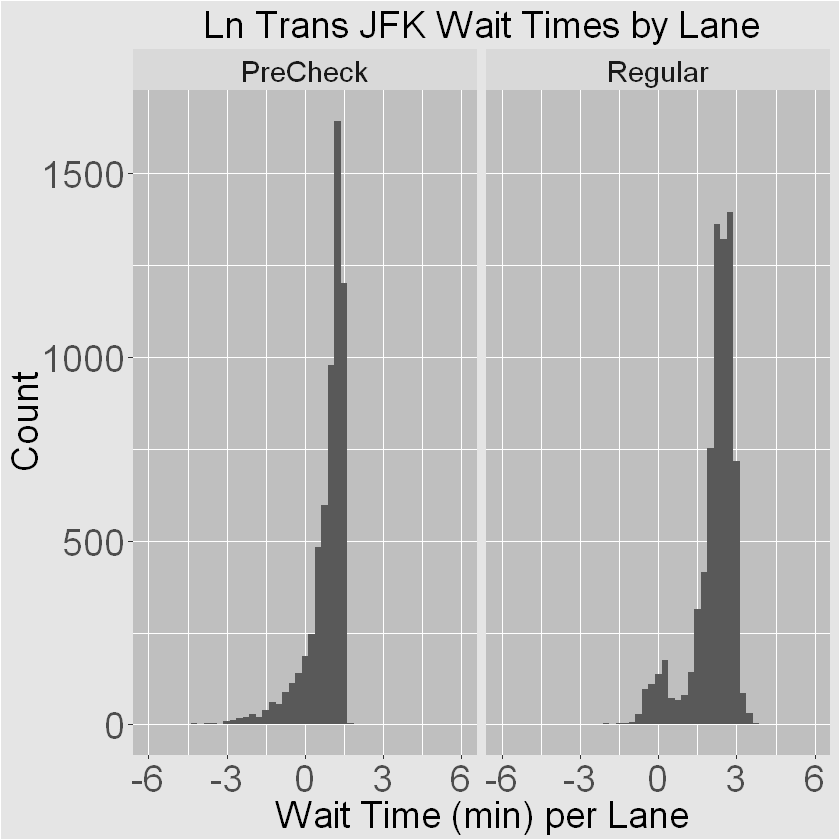

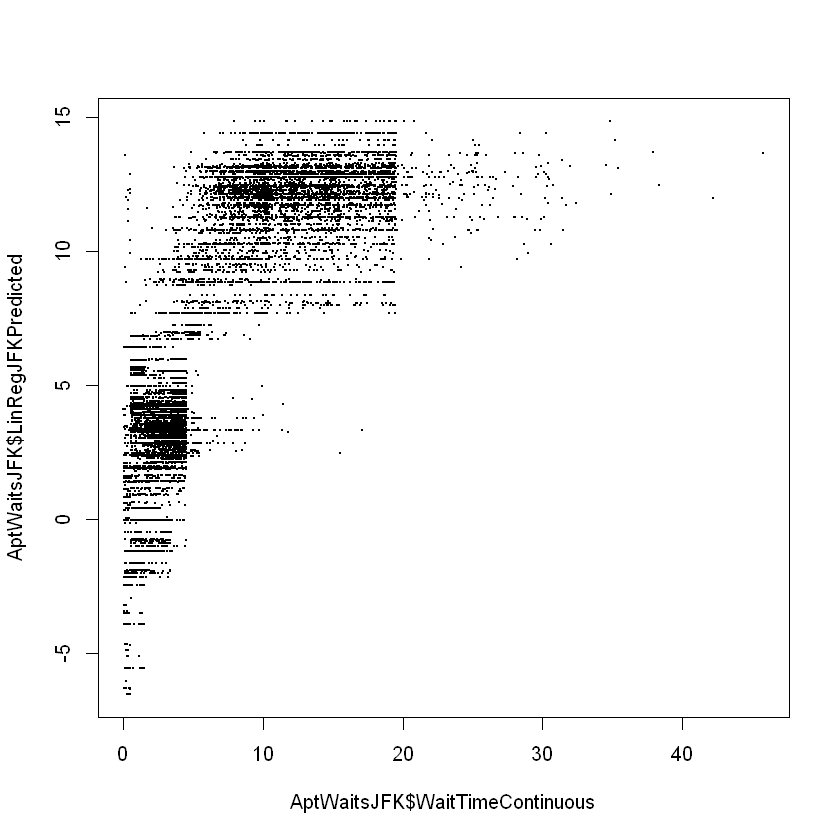

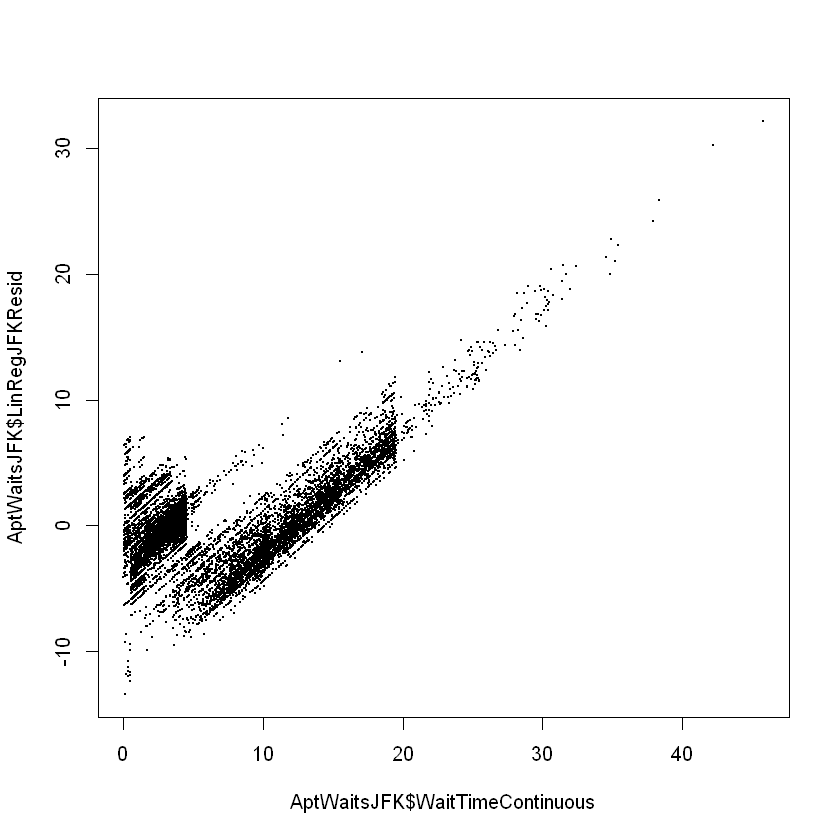

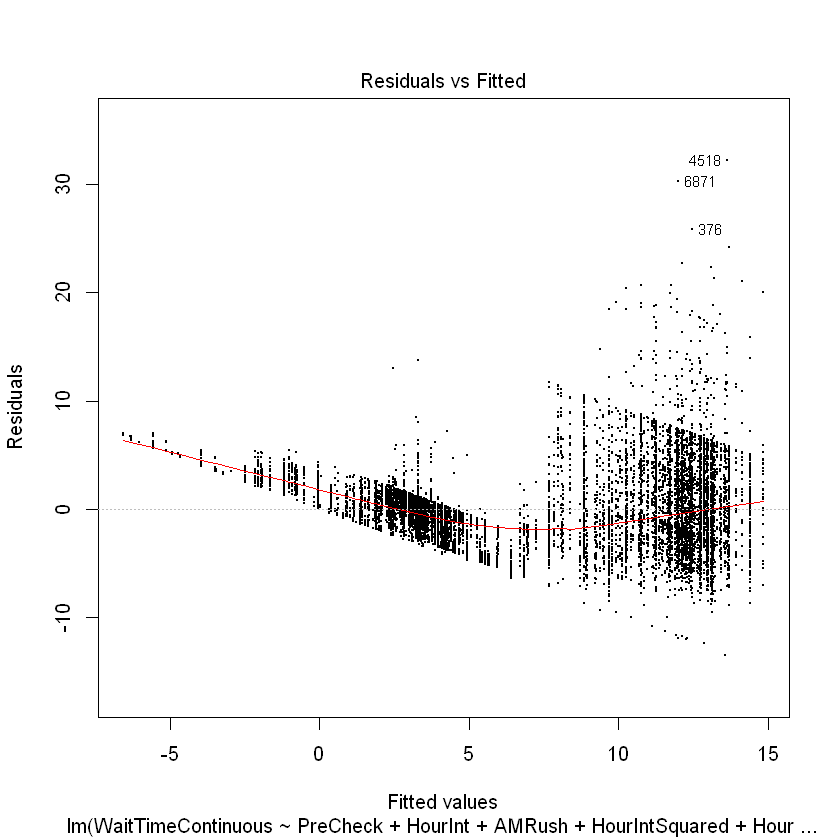

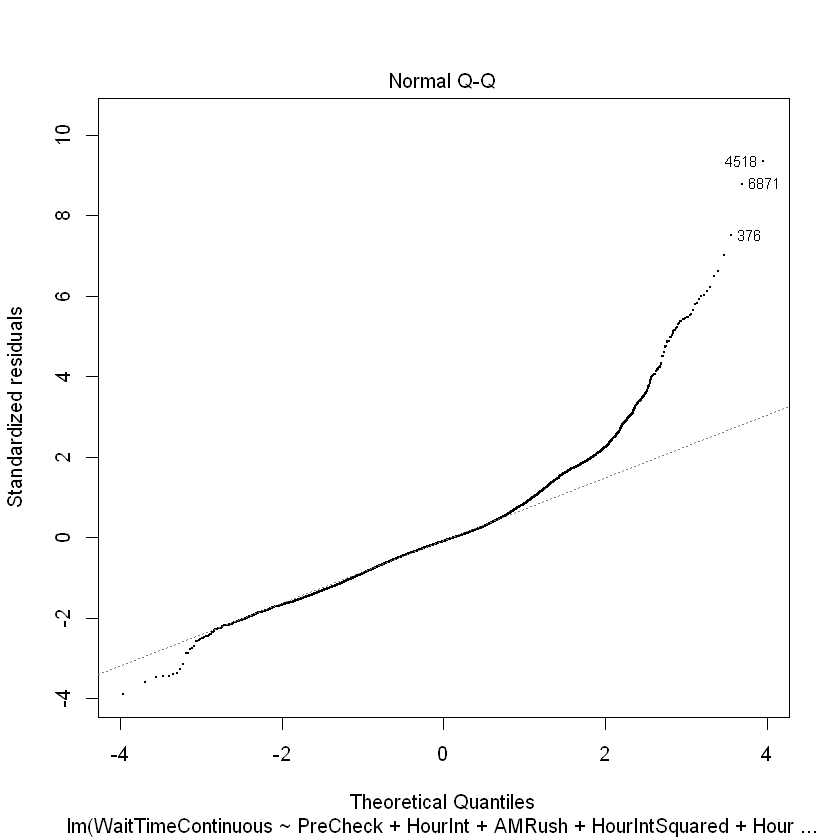

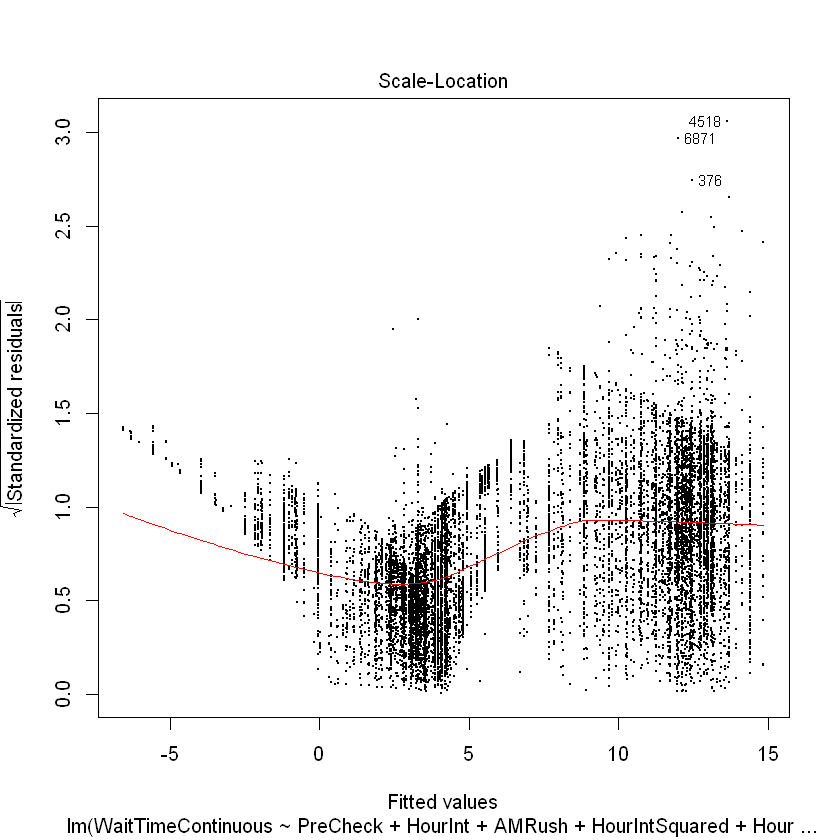


GRAPHICS FOR JFK LOG TRANSFORMED LINEAR REGRESSION


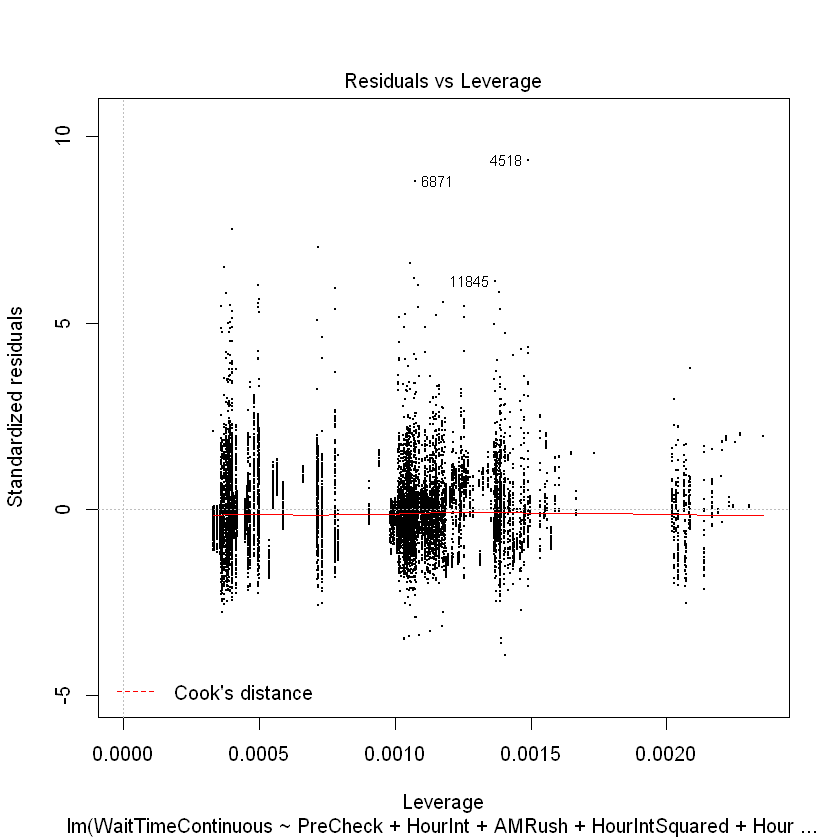

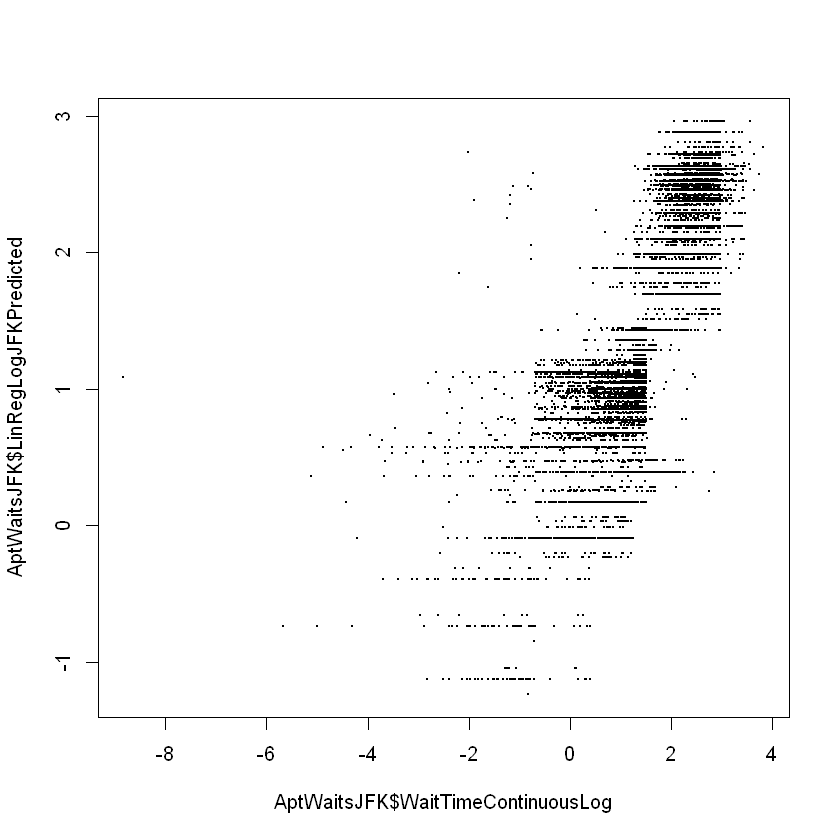

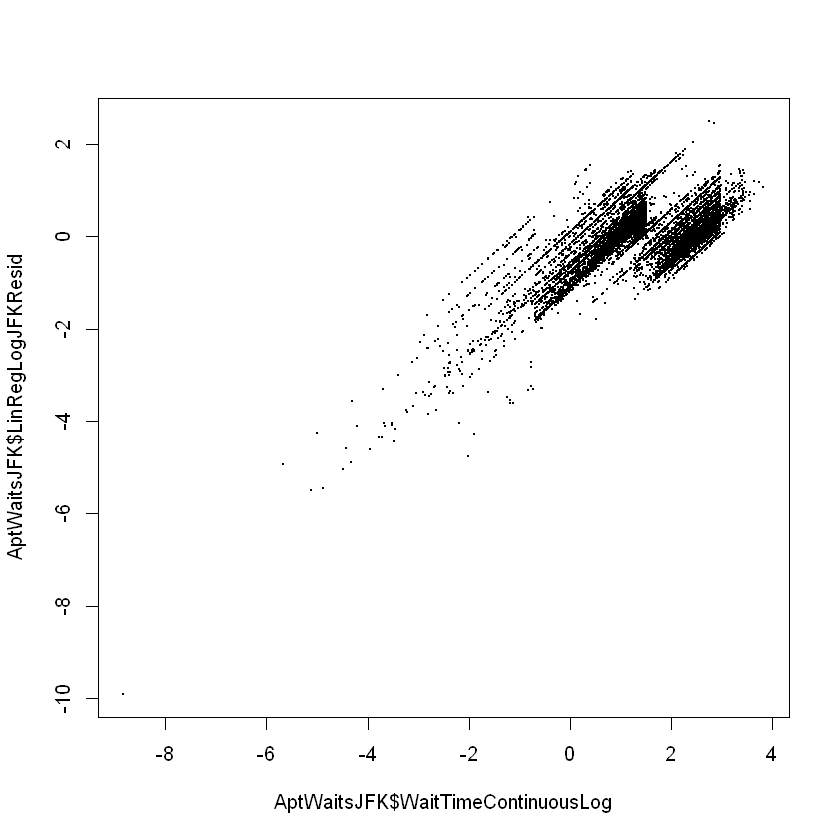

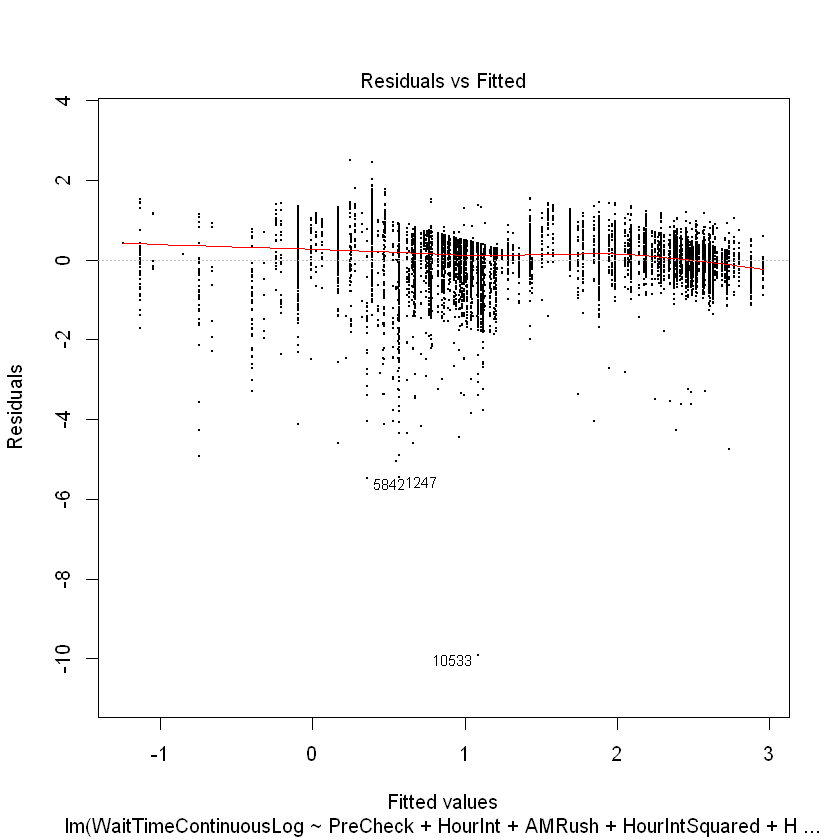

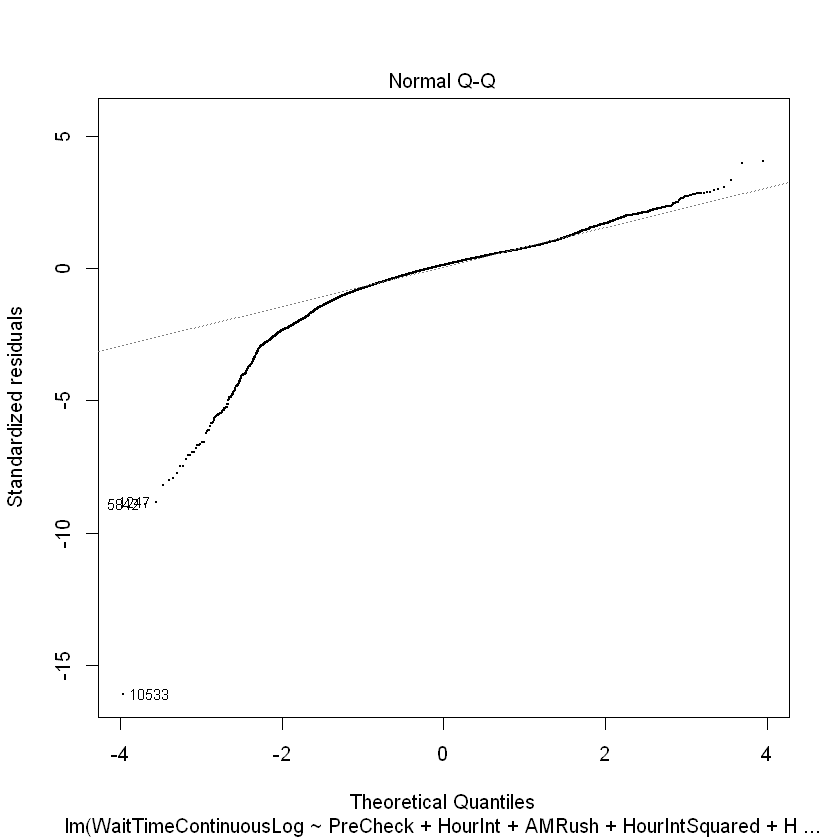

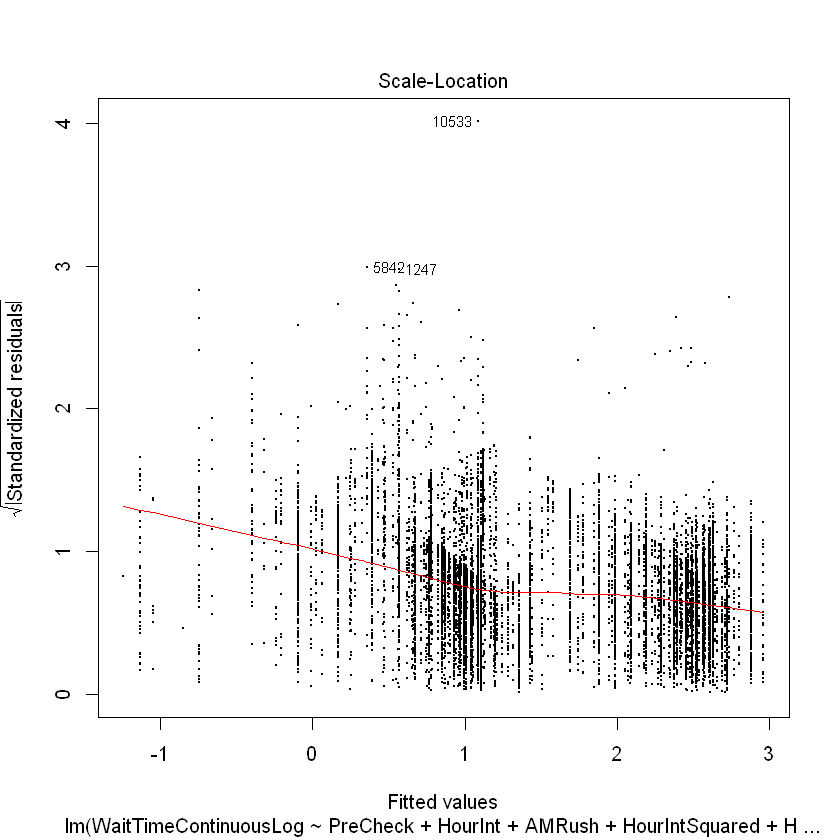

Warning message:
"Removed 117 rows containing non-finite values (stat_bin)."Warning message:
"Removed 4 rows containing missing values (geom_bar)."

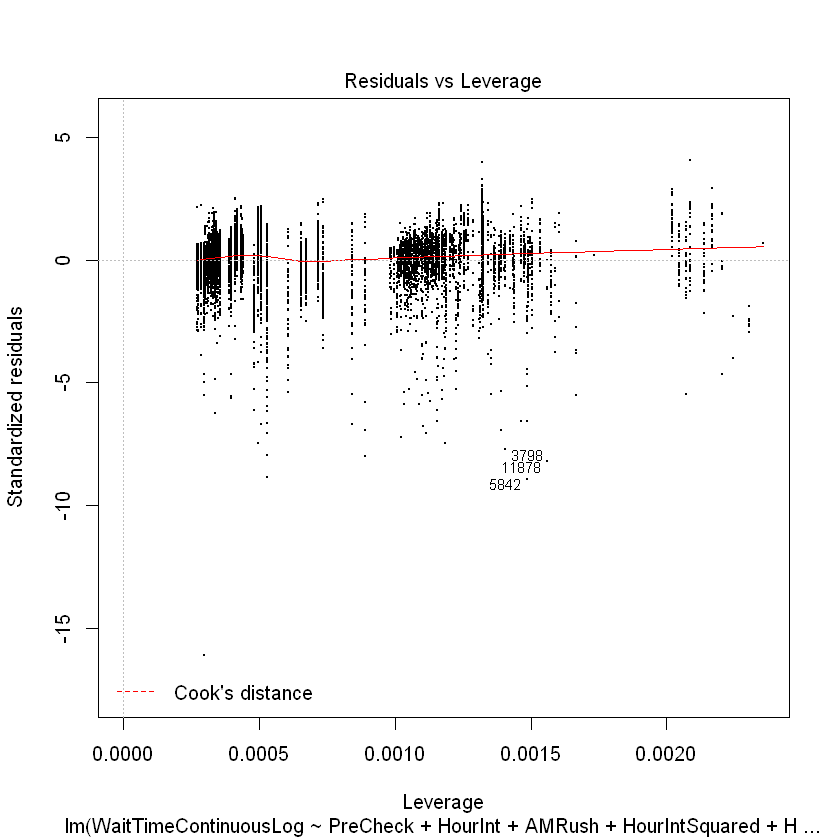

Warning message:
"Removed 7 rows containing non-finite values (stat_bin)."Warning message:
"Removed 4 rows containing missing values (geom_bar)."

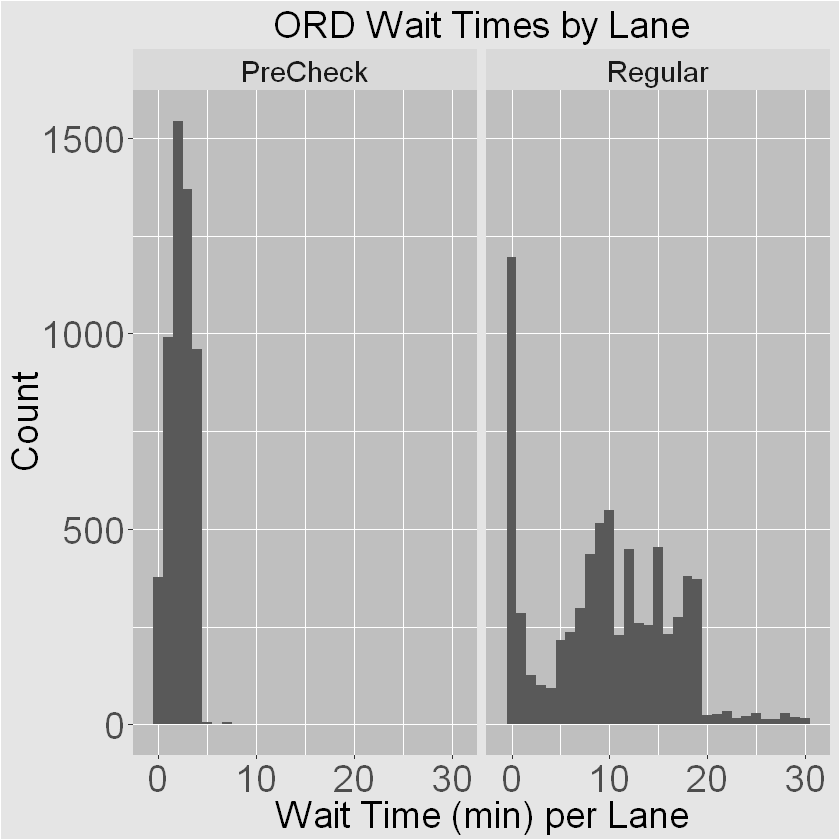


LINEAR REGRESSION FINAL MODEL FOR ORD



Call:
lm(formula = WaitTimeContinuous ~ PreCheck + AMRush + Sep + HourInt + 
    Aug + Jul + HourIntCubed + Jun + Jan + Sat + HourIntSquared, 
    data = AptWaitsORD)

Residuals:
    Min      1Q  Median      3Q     Max 
-14.018  -2.574  -0.361   1.728  41.116 

Coefficients:
                 Estimate Std. Error  t value Pr(>|t|)    
(Intercept)     7.279e-02  1.670e-01    0.436    0.663    
PreCheck       -1.029e+01  8.006e-02 -128.589  < 2e-16 ***
AMRush          3.934e+00  1.290e-01   30.499  < 2e-16 ***
Sep             4.555e+00  1.513e-01   30.098  < 2e-16 ***
HourInt         1.744e+00  6.196e-02   28.156  < 2e-16 ***
Aug             3.875e+00  1.336e-01   29.011  < 2e-16 ***
Jul             2.292e+00  1.335e-01   17.166  < 2e-16 ***
HourIntCubed   -1.997e-03  1.778e-04  -11.230  < 2e-16 ***
Jun             1.558e+00  1.355e-01   11.499  < 2e-16 ***
Jan            -9.144e-01  1.337e-01   -6.838 8.40e-12 ***
Sat            -6.386e-01  1.080e-01   -5.913 3.46e-09 ***
HourIntSquared 


LINEAR REGRESSION FINAL LOG MODEL FOR ORD



Call:
lm(formula = WaitTimeContinuousLog ~ PreCheck + AMRush + Sep + 
    HourInt + Aug + Jul + HourIntCubed + Jun + Jan + Sat + HourIntSquared, 
    data = AptWaitsORD)

Residuals:
    Min      1Q  Median      3Q     Max 
-8.0388 -0.4003  0.0106  0.4400  2.5145 

Coefficients:
                 Estimate Std. Error  t value Pr(>|t|)    
(Intercept)    -1.547e+00  3.464e-02  -44.651  < 2e-16 ***
PreCheck       -1.722e+00  1.661e-02 -103.694  < 2e-16 ***
AMRush          9.539e-01  2.676e-02   35.654  < 2e-16 ***
Sep             4.206e-01  3.139e-02   13.399  < 2e-16 ***
HourInt         7.221e-01  1.285e-02   56.183  < 2e-16 ***
Aug             3.942e-01  2.771e-02   14.226  < 2e-16 ***
Jul             2.505e-01  2.770e-02    9.045  < 2e-16 ***
HourIntCubed    1.113e-04  3.688e-05    3.018  0.00255 ** 
Jun             2.727e-01  2.810e-02    9.705  < 2e-16 ***
Jan            -1.519e-01  2.774e-02   -5.476 4.44e-08 ***
Sat            -1.720e-01  2.241e-02   -7.678 1.74e-14 ***
HourIntSquar


GRAPHICS FOR ORD LINEAR REGRESSION


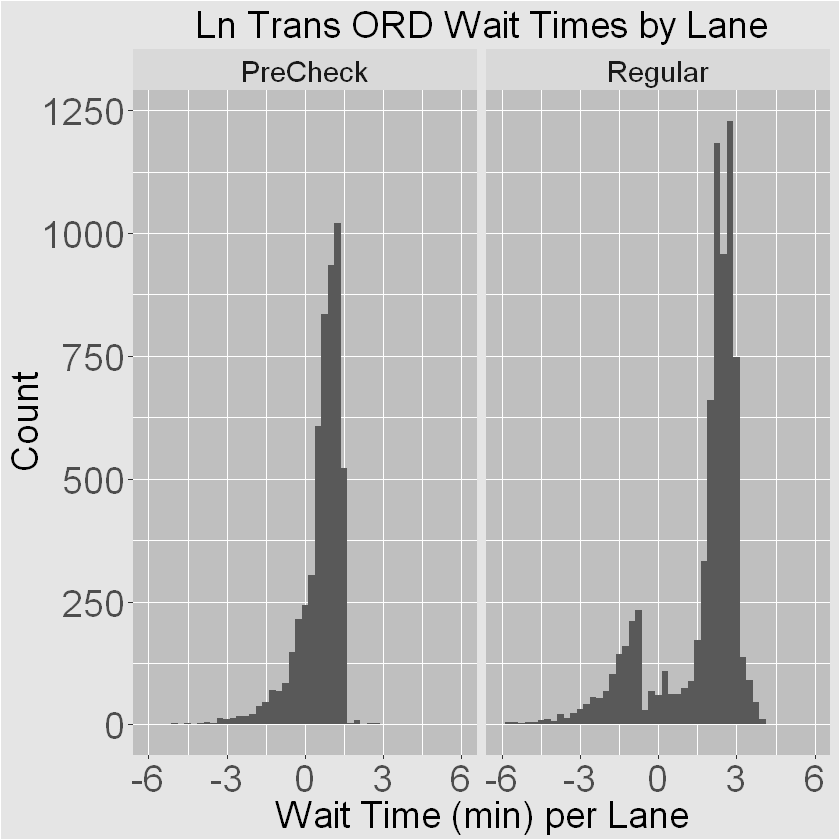

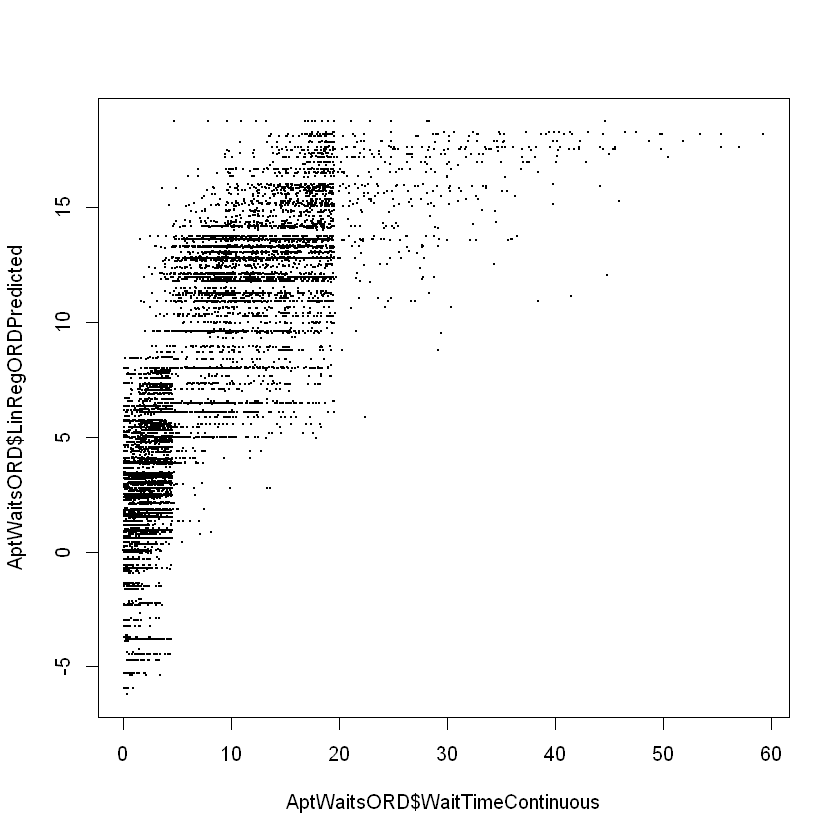

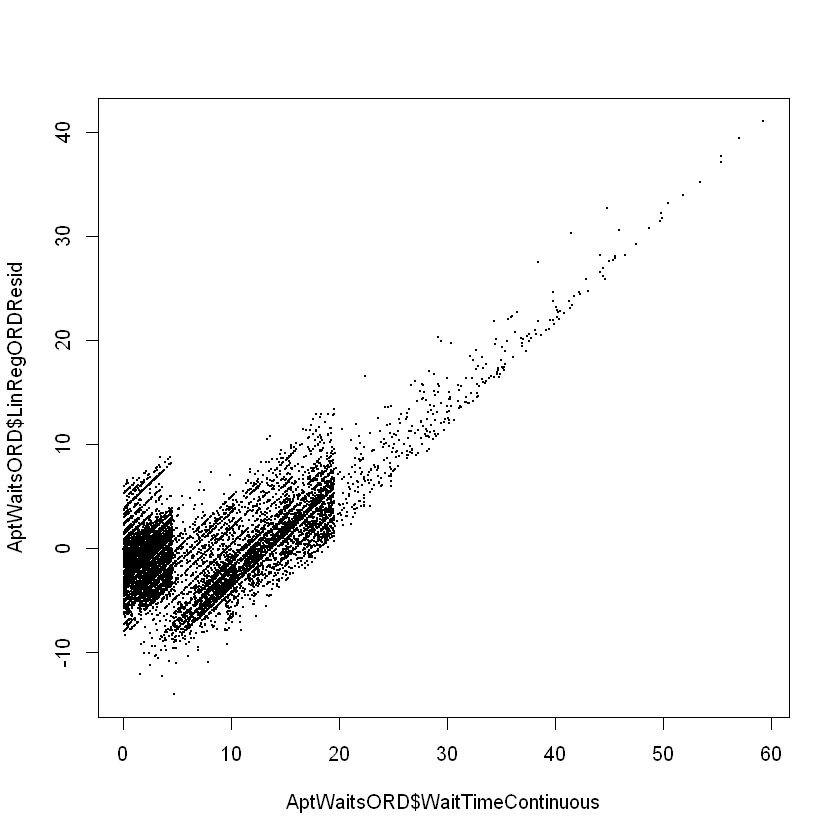

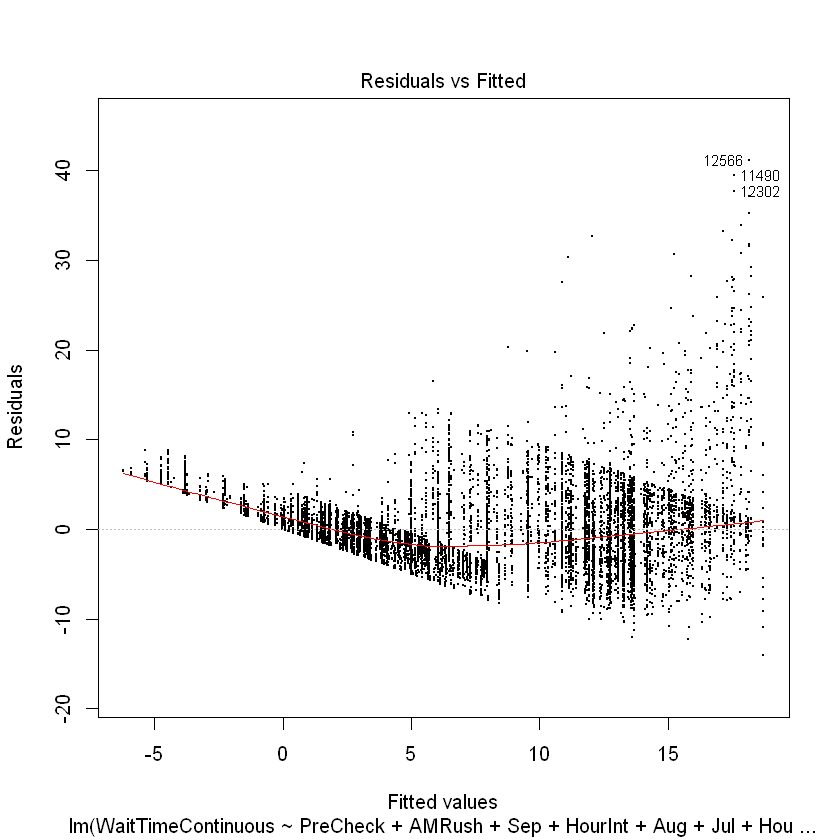

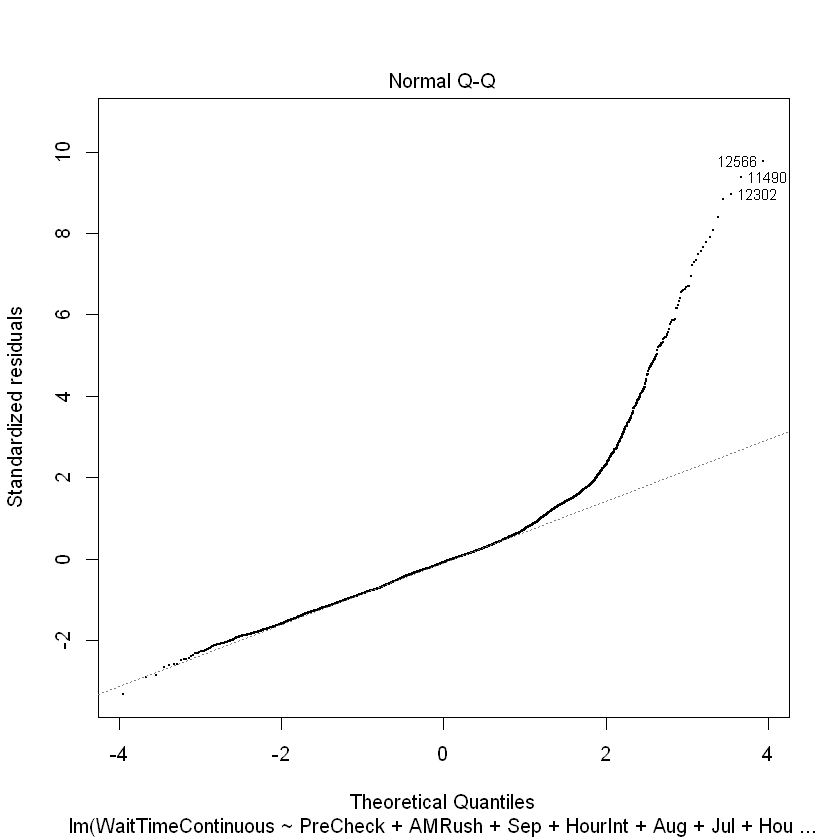

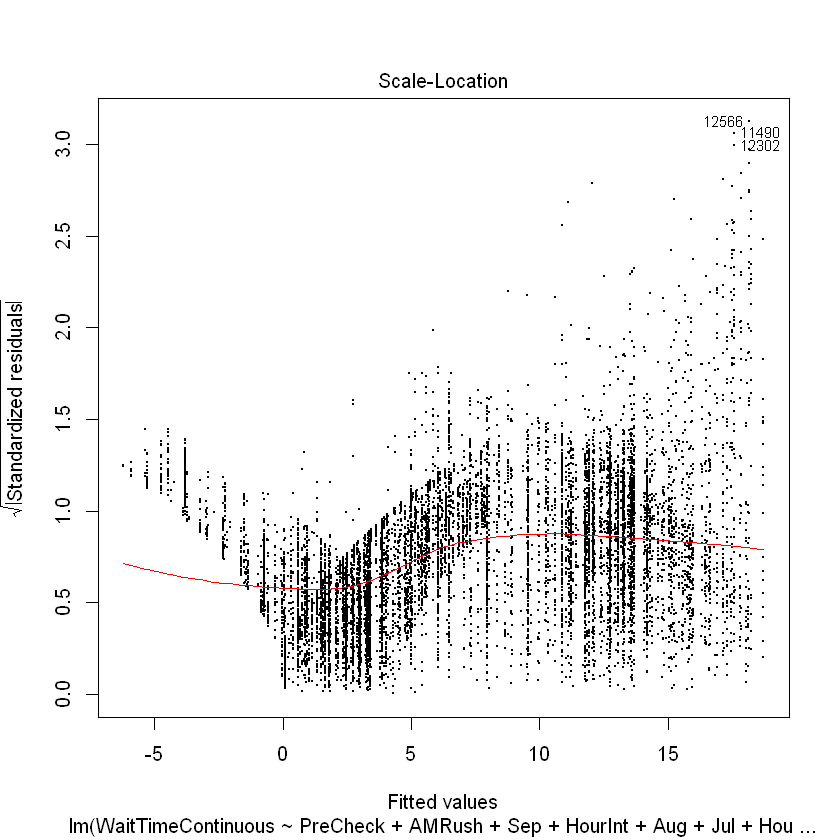


GRAPHICS FOR ORD LOG TRANSFORMED LINEAR REGRESSION


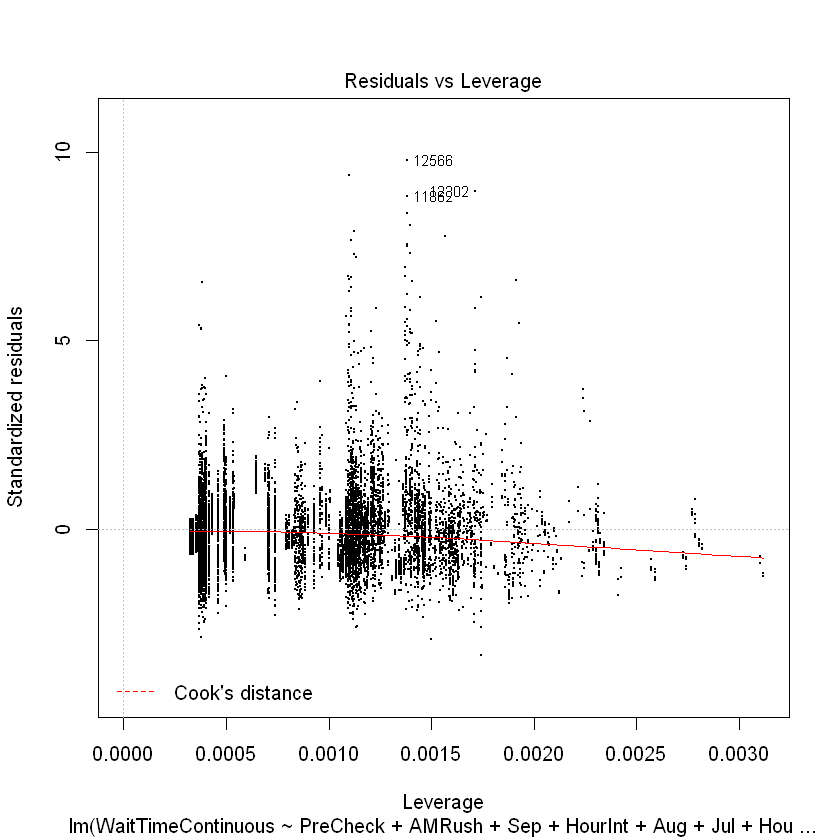

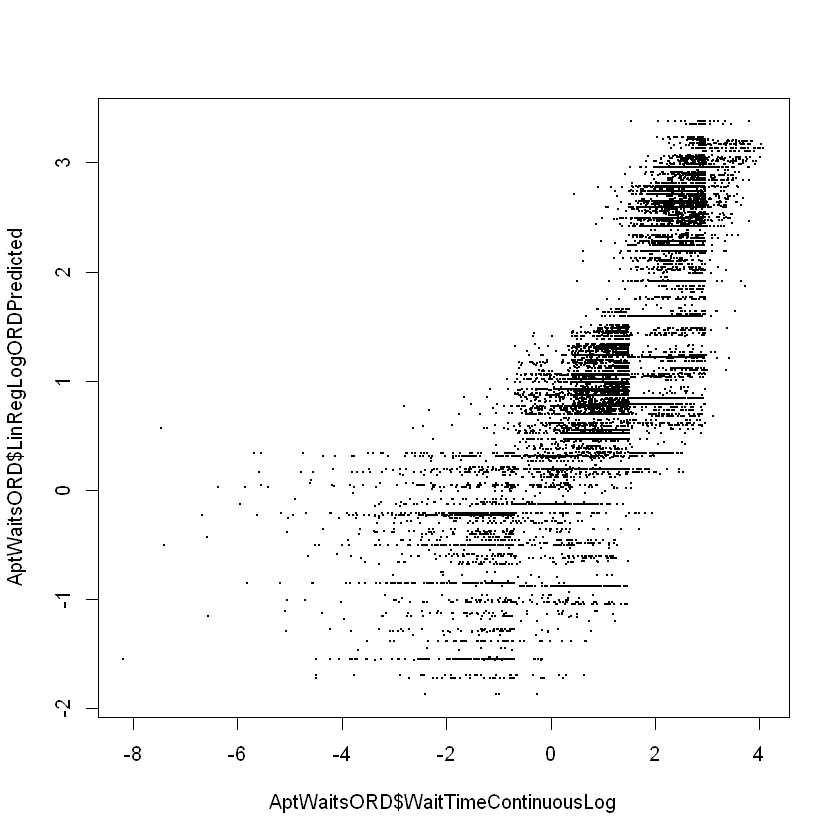

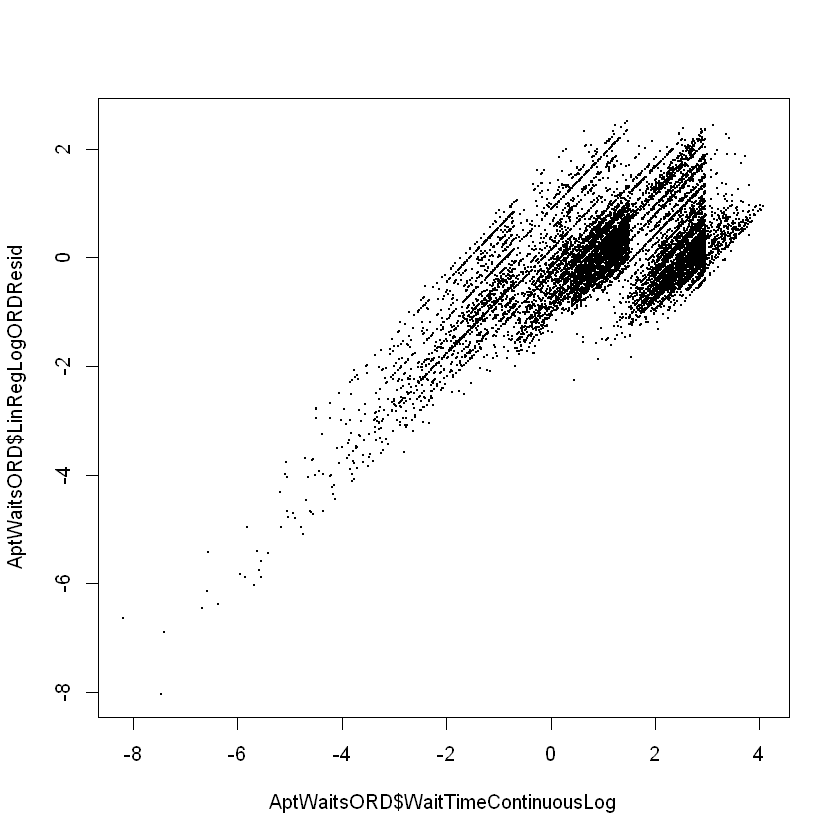

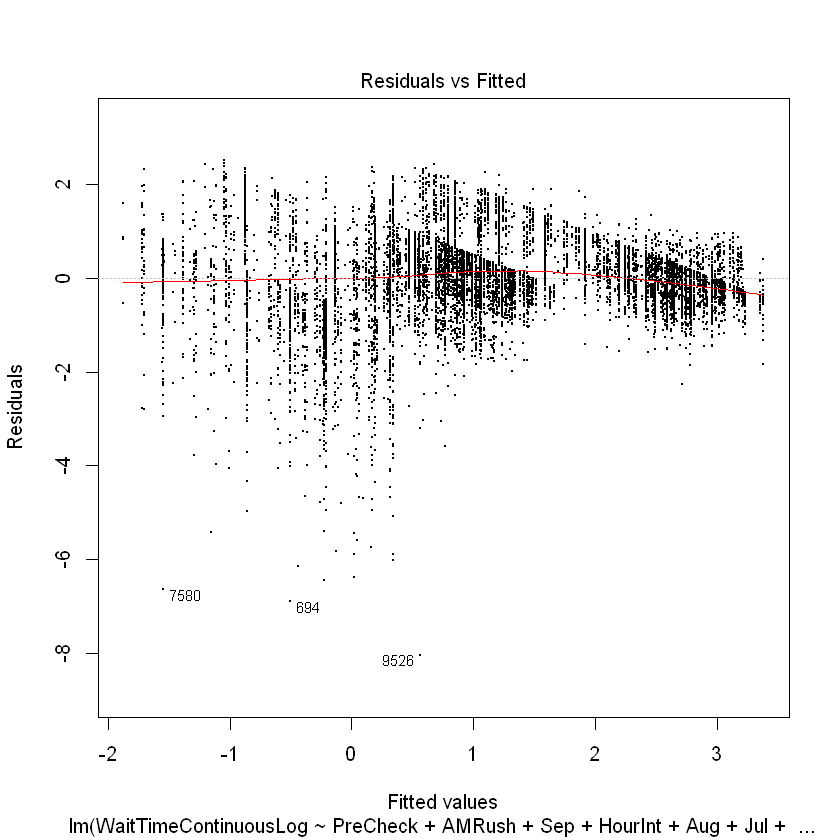

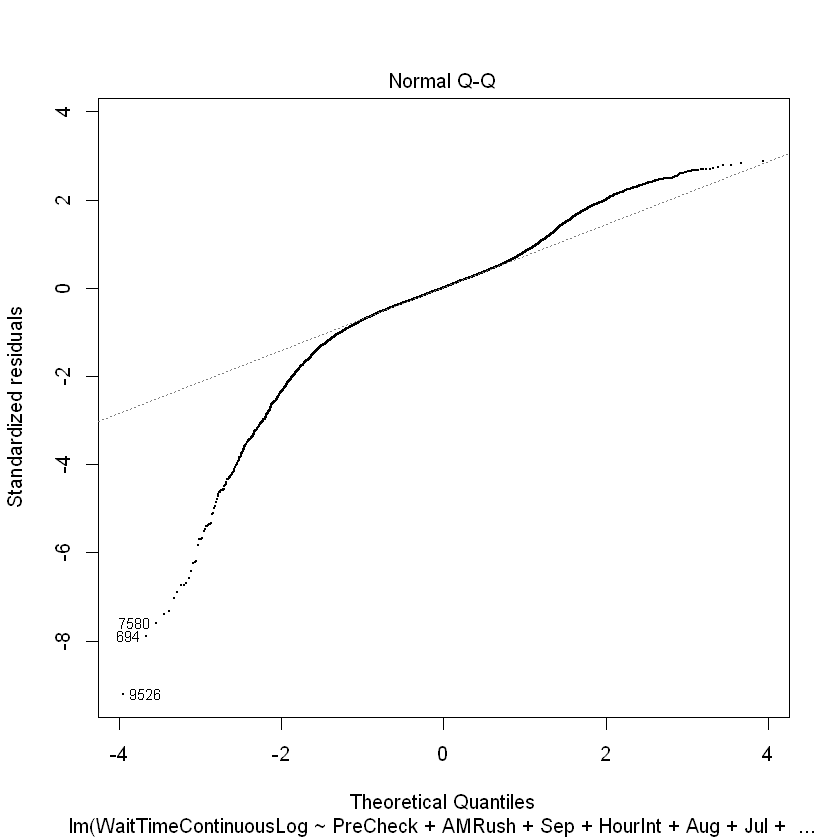

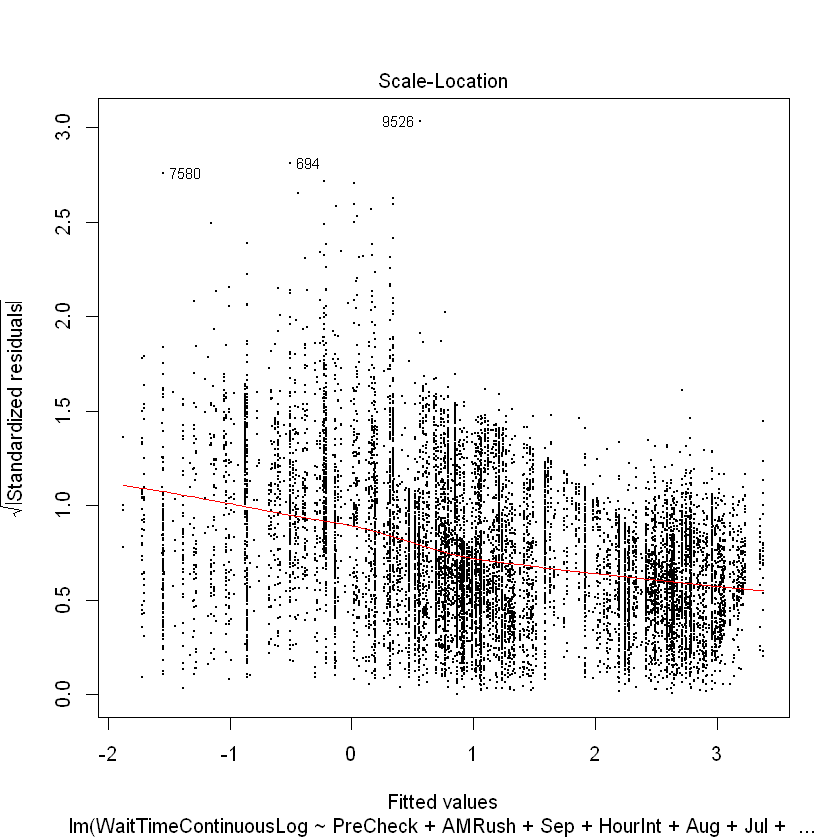

Warning message:
"Removed 19 rows containing non-finite values (stat_bin)."Warning message:
"Removed 4 rows containing missing values (geom_bar)."

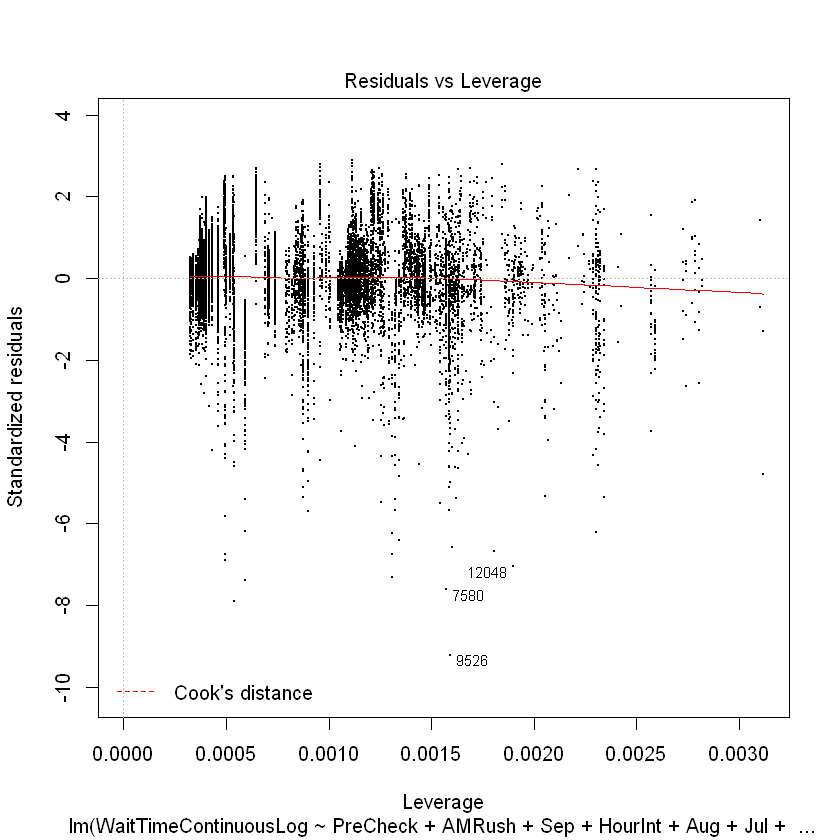

Warning message:
"Removed 10 rows containing non-finite values (stat_bin)."Warning message:
"Removed 4 rows containing missing values (geom_bar)."

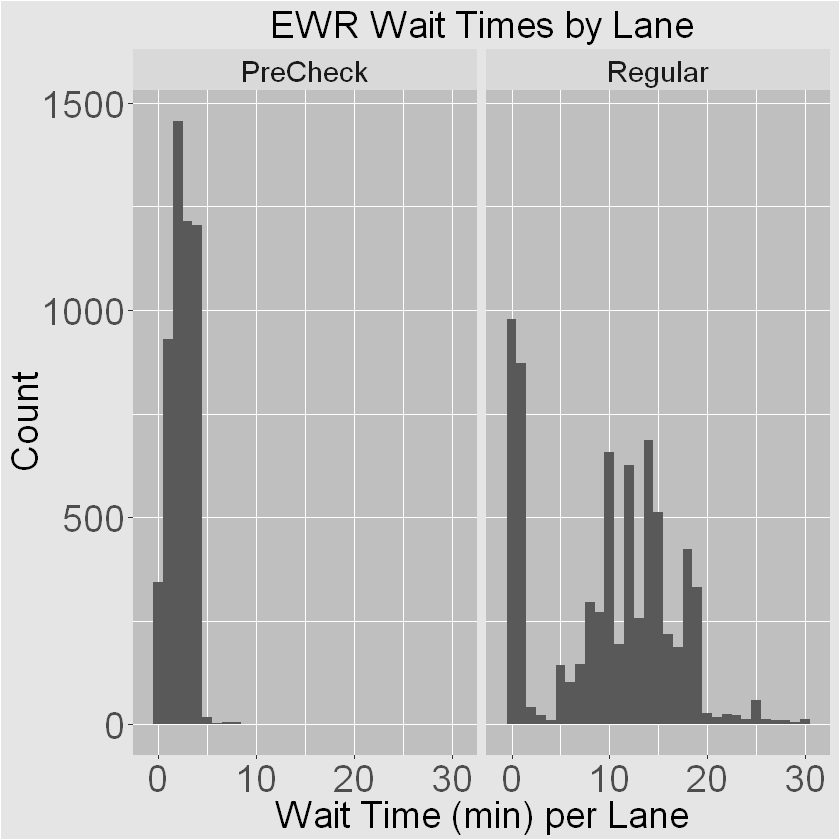


LINEAR REGRESSION FINAL MODEL FOR EWR



Call:
lm(formula = WaitTimeContinuous ~ PreCheck + AMRush + HourInt + 
    Aug + HourIntCubed + Jul + Sep + Jun + Fri + Sun + Jan + 
    Feb + HourIntSquared, data = AptWaitsEWR)

Residuals:
     Min       1Q   Median       3Q      Max 
-12.6251  -2.2024  -0.4776   1.5200  30.5375 

Coefficients:
                 Estimate Std. Error  t value Pr(>|t|)    
(Intercept)    -0.3530735  0.1424093   -2.479  0.01318 *  
PreCheck       -9.8434538  0.0666578 -147.671  < 2e-16 ***
AMRush          5.1419397  0.1070719   48.023  < 2e-16 ***
HourInt         1.6687389  0.0517313   32.258  < 2e-16 ***
Aug             2.0094353  0.1124884   17.863  < 2e-16 ***
HourIntCubed   -0.0022033  0.0001475  -14.935  < 2e-16 ***
Jul             1.5356280  0.1123252   13.671  < 2e-16 ***
Sep             1.5359369  0.1280848   11.992  < 2e-16 ***
Jun             1.2800839  0.1138678   11.242  < 2e-16 ***
Fri             0.6123147  0.0907889    6.744 1.61e-11 ***
Sun             0.5105757  0.0915231    5.579 2.47e-


LINEAR REGRESSION FINAL LOG MODEL FOR EWR



Call:
lm(formula = WaitTimeContinuousLog ~ PreCheck + AMRush + HourInt + 
    Aug + HourIntCubed + Jul + Sep + Jun + Fri + Jan + Feb + 
    HourIntSquared, data = AptWaitsEWR)

Residuals:
    Min      1Q  Median      3Q     Max 
-7.9428 -0.3814  0.0277  0.4382  2.6267 

Coefficients:
                 Estimate Std. Error  t value Pr(>|t|)    
(Intercept)    -1.292e+00  3.263e-02  -39.587  < 2e-16 ***
PreCheck       -1.613e+00  1.536e-02 -105.029  < 2e-16 ***
AMRush          1.470e+00  2.467e-02   59.591  < 2e-16 ***
HourInt         4.438e-01  1.192e-02   37.236  < 2e-16 ***
Aug             4.921e-01  2.590e-02   18.996  < 2e-16 ***
HourIntCubed   -7.006e-04  3.399e-05  -20.613  < 2e-16 ***
Jul             4.865e-01  2.587e-02   18.806  < 2e-16 ***
Sep             3.853e-01  2.951e-02   13.057  < 2e-16 ***
Jun             4.461e-01  2.623e-02   17.004  < 2e-16 ***
Fri             1.100e-01  2.063e-02    5.334 9.77e-08 ***
Jan            -2.720e-01  2.634e-02  -10.325  < 2e-16 ***
Feb   


GRAPHICS FOR EWR LINEAR REGRESSION


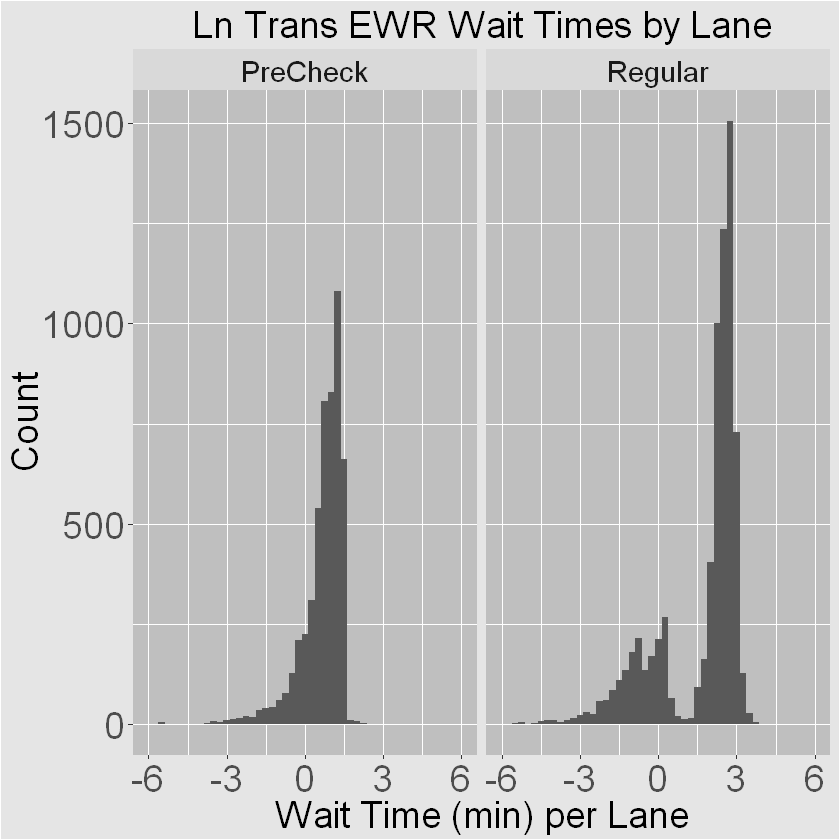

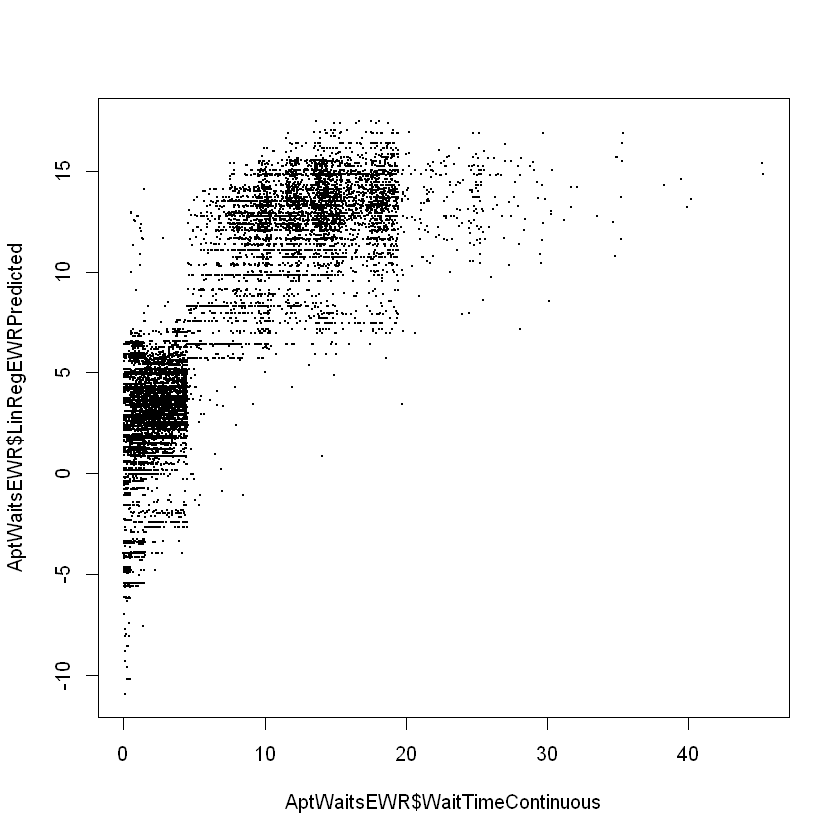

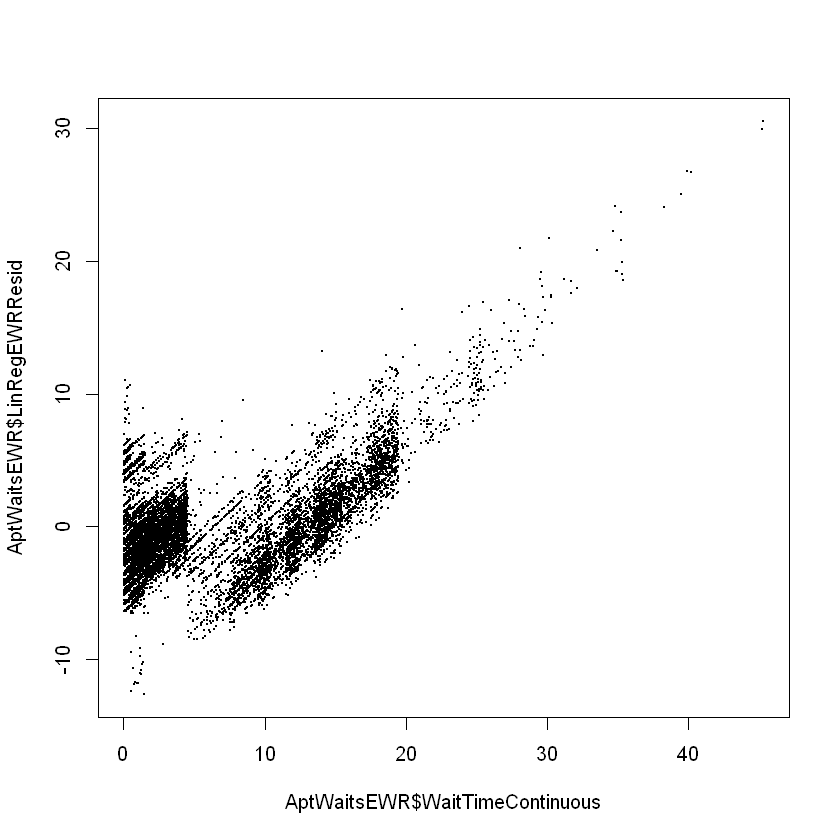

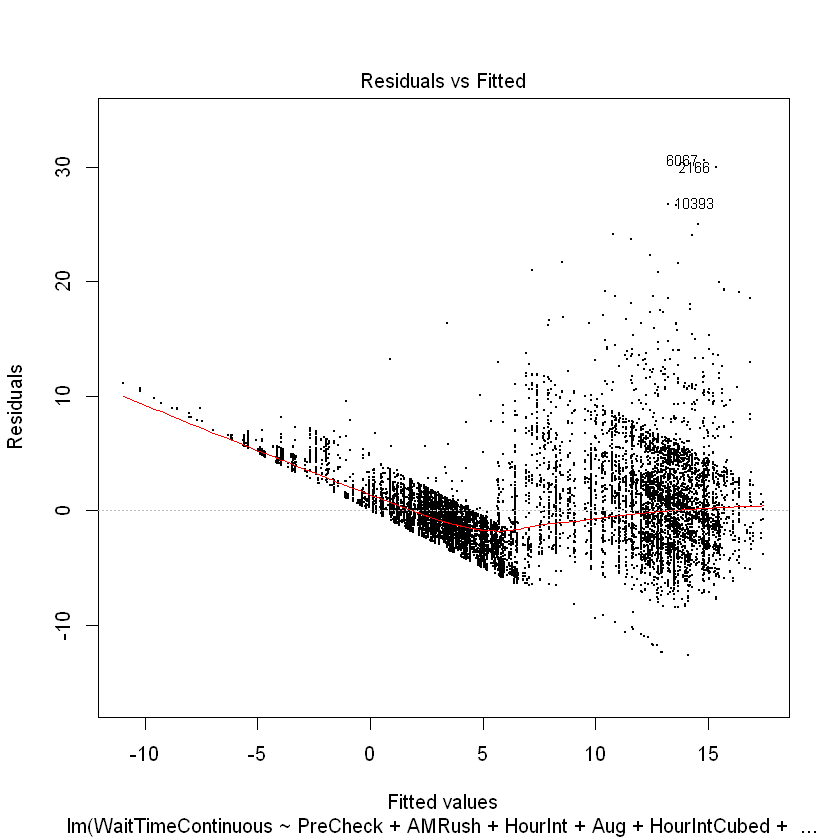

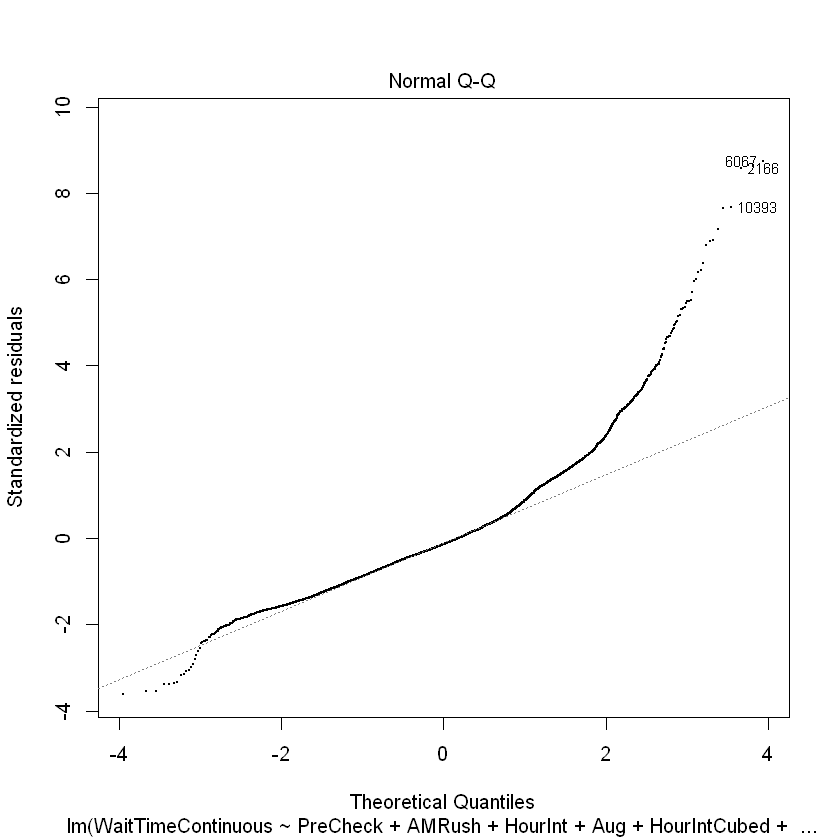

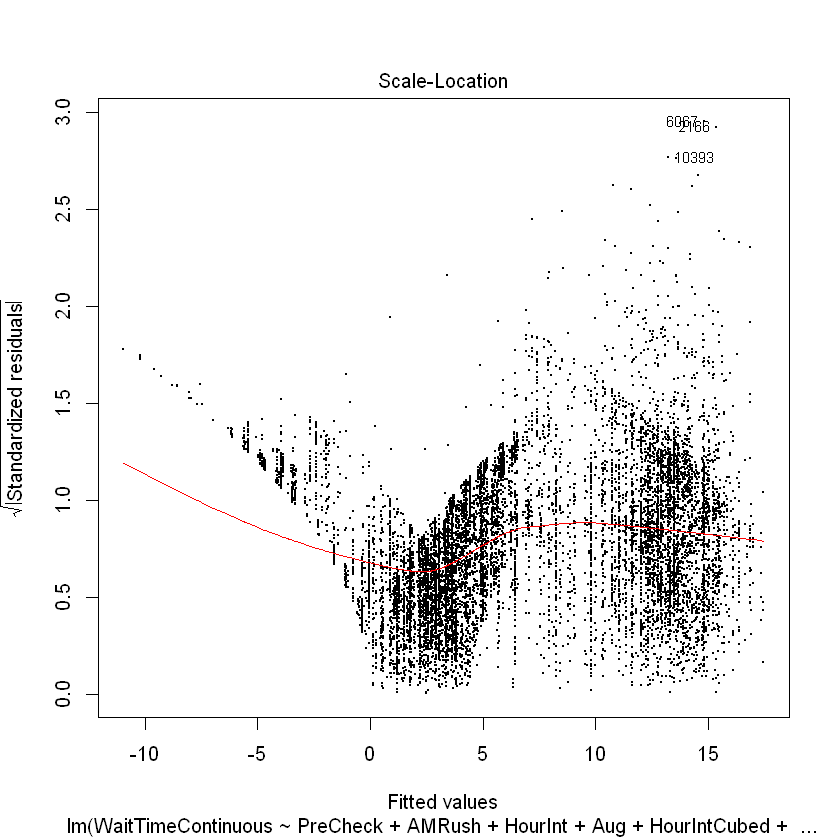


GRAPHICS FOR EWR LOG TRANSFORMED LINEAR REGRESSION


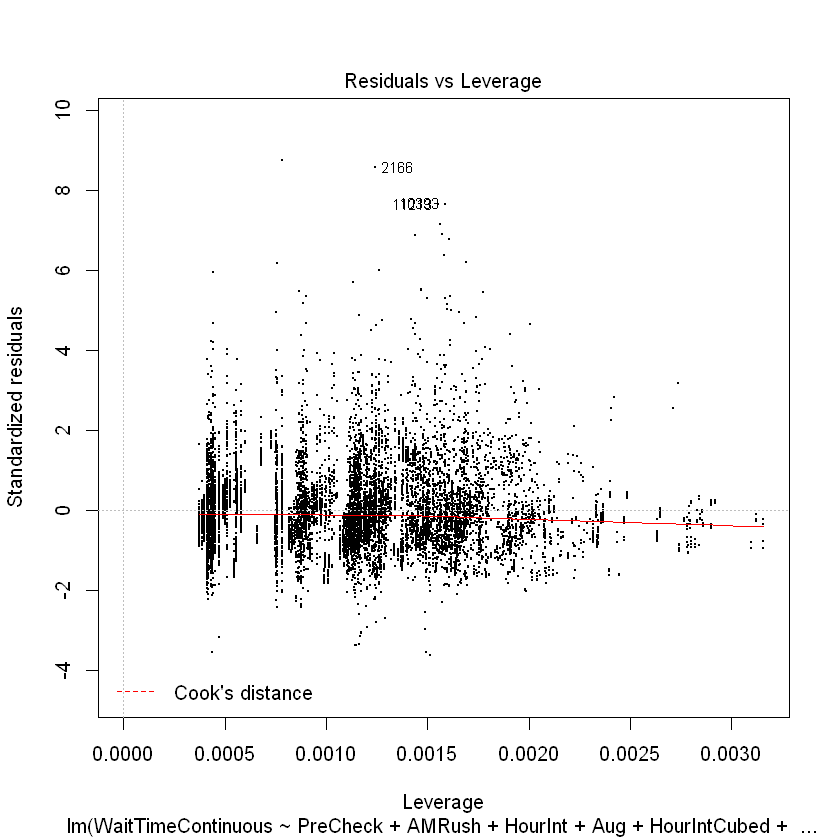

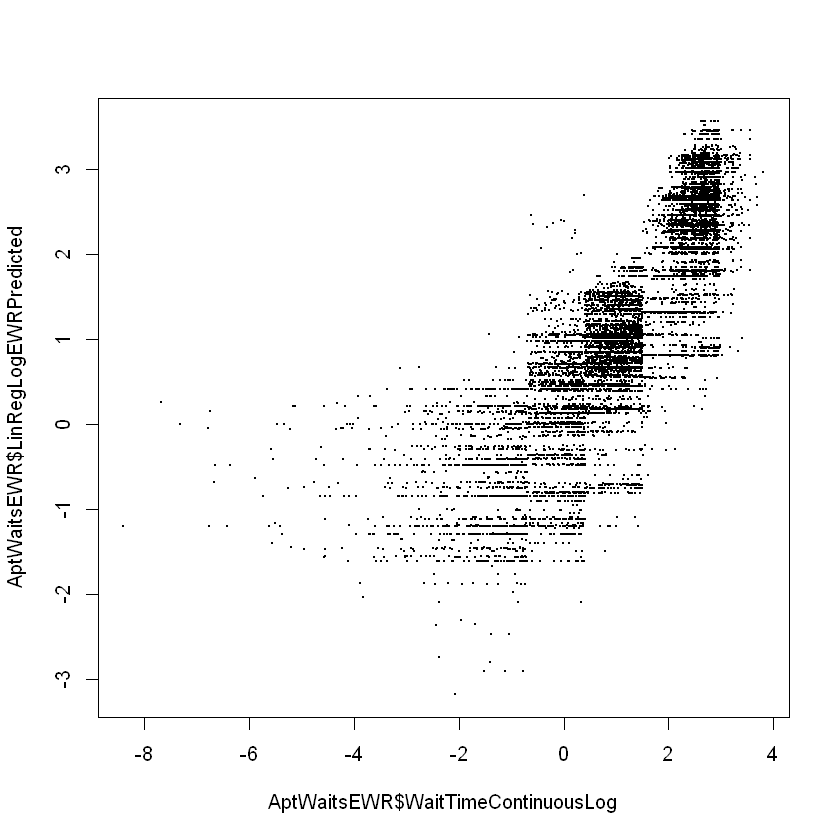

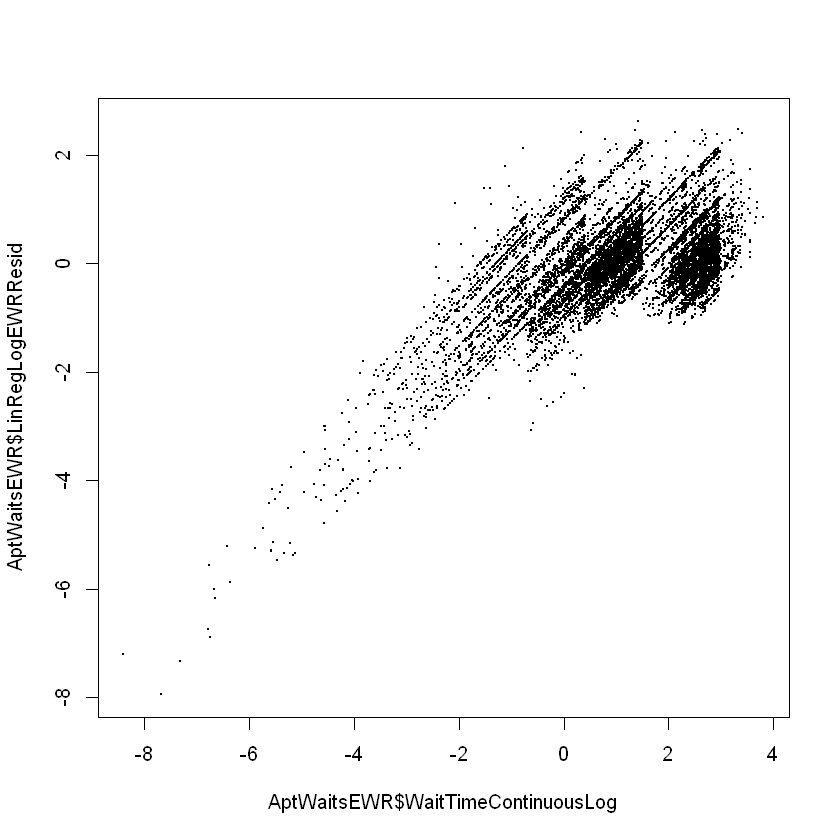

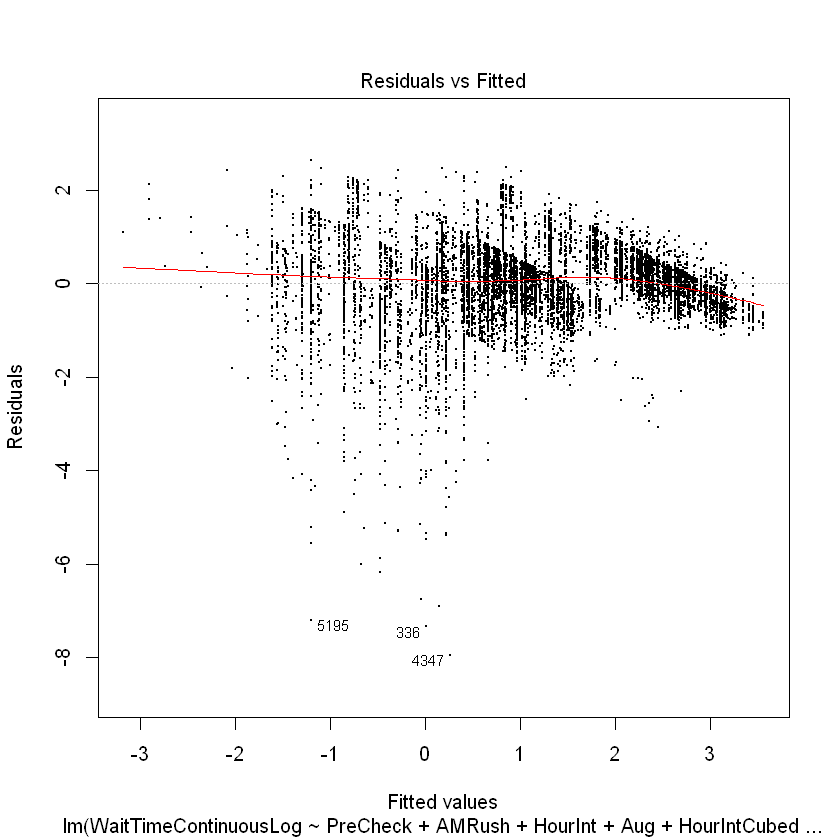

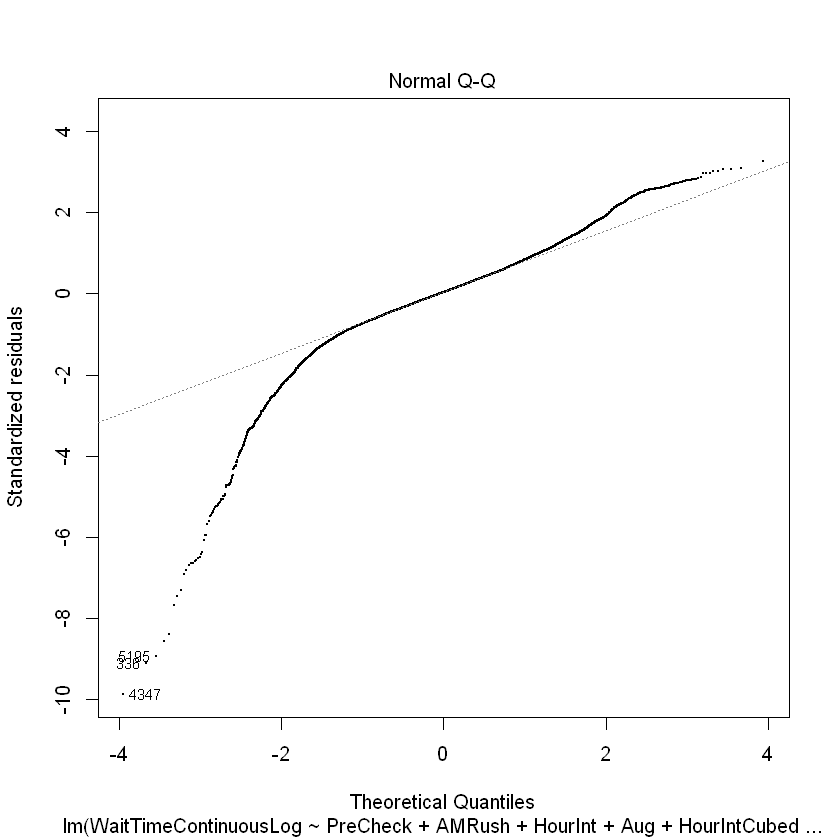

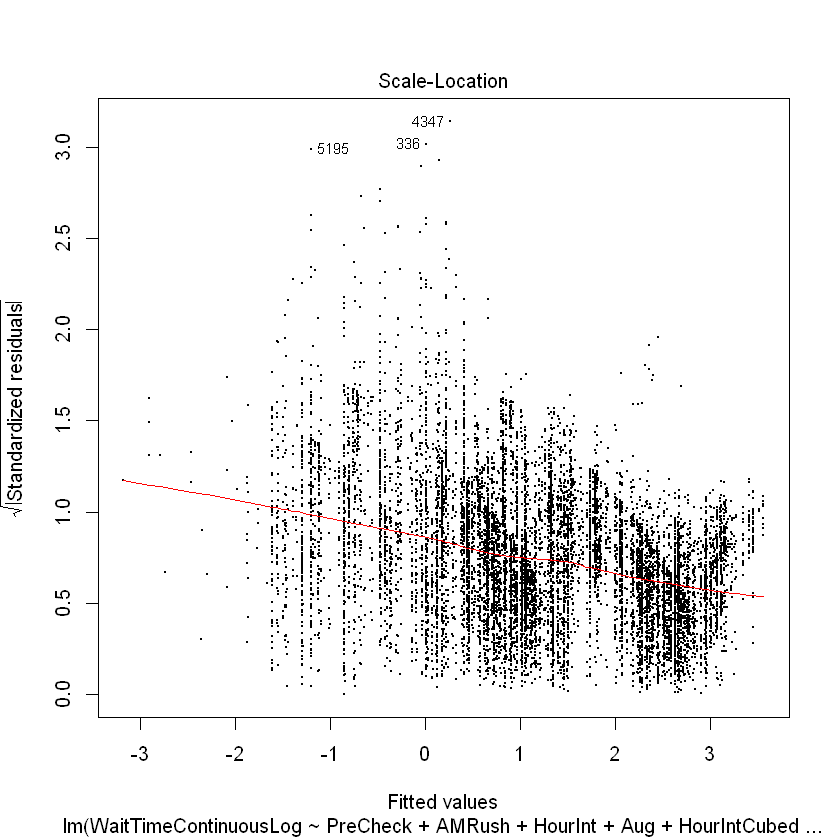

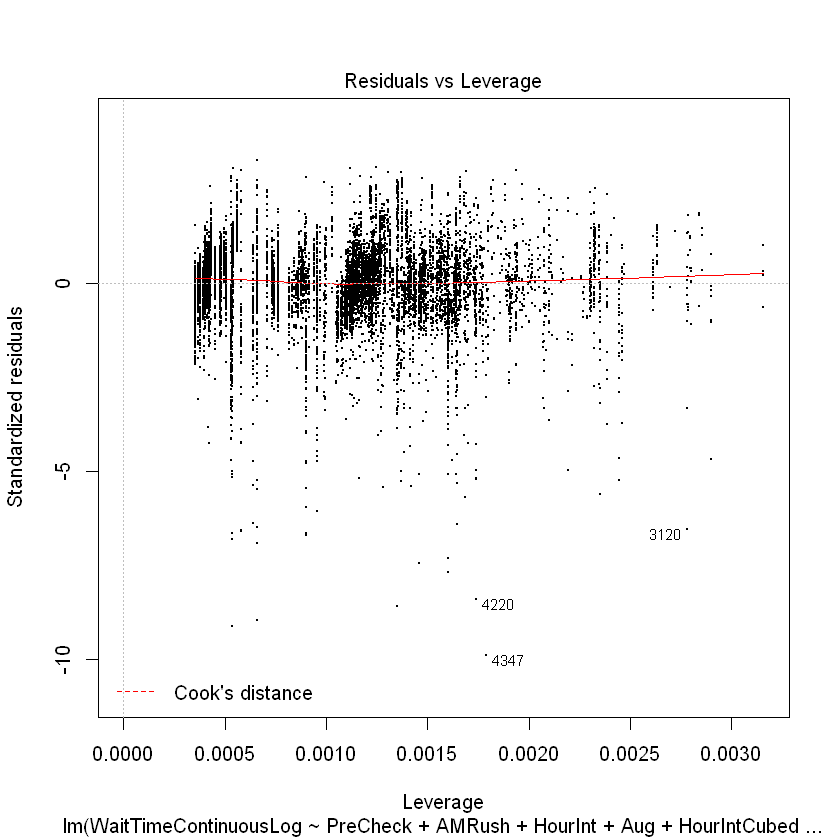

In [3]:
#!!!!!!!!! CHANGE TO R KERNEL !!!!!!!!!!!!!

#CELL NAME:  TRANSFORMATIONS AND LINEAR REGRESSION
#THIS CELL STARTS LINEAR ANALYTICS BEFORE MOVING TO NON-LINEAR
#This cell requires the WaitTimeR data produced in R STATS cell above, so run R STATS cell first
#Note:  plots sized for transfer to analytical paper in MS Word

#library(psych)
#library(MASS) #Note MASS masks dplyr select function
#library(stats)
#library(fitdistrplus)
#library(vioplot)
library(dplyr)



#A lot of the dummy variables are multicolinear, not linearly independent, so drop some so we don't load the matrix
#Drop Oct, Nov, Dec, Tue, Wed, Thu, CatII, CatIII
#LinReg <- lm(WaitTimeContinuous ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+PreCheck+
#             Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun+CatX+CatI+CatIV+JFK+BOS+LAX+
#             LAS+DCA+IAD+BWI+ORD+EWR+MCO+DFW+MIA, data=AptWaitsR)
#cat("\nLINEAR REGRESSION RESULTS FOR ALL AIRPORTS\n")
#summary(LinReg)
#cat("\nSTEPWISE REGRESSION RESULTS FOR ALL AIRPORTS\n")
#LinRegStepwise <- stepAIC(LinReg, direction = "both")
#cat("\nSTEPWISE ANOVA FOR ALL AIRPORTS\n")
#LinRegStepwise$anova

#Produce a model based on outputs from above stepwise regression
#LinRegFinal <- lm(WaitTimeContinuous ~ PreCheck+CatX+CatI+AMRush+HourInt+JFK+CatIV+ORD+HourIntSquared+
#                  EWR+PMRush+MIA+Jan+LAX+Fri+Feb+MCO+Jul+DCA+LAS+Apr+Sat+Aug+HourIntCubed+Sun+BWI, data=AptWaitsR)
#cat("\nLINEAR REGRESSION FINAL MODEL FOR ALL AIRPORTS\n")
#AptWaitsR$LinRegPredicted <- predict(LinRegFinal)
#AptWaitsR$LinRegResid <- residuals(LinRegFinal)
#summary(LinRegFinal)
#plot(x=AptWaitsR$WaitTimeContinuous, y=AptWaitsR$LinRegPredicted, pch=20, cex=0.1)
#plot(x=AptWaitsR$WaitTimeContinuous, y=AptWaitsR$LinRegResid, pch=20, cex=0.1)
#plot(LinRegFinal, pch=20, cex=0.1)

#Pretty crappy model above--see if log transformation improves the situation
AptWaitsR$WaitTimeContinuousLog <- log(AptWaitsR$WaitTimeContinuous)
#LinRegLogFinal <- lm(WaitTimeContinuousLog ~ PreCheck+CatX+CatI+AMRush+HourInt+JFK+CatIV+ORD+HourIntSquared+
#                  EWR+PMRush+MIA+Jan+LAX+Fri+Feb+MCO+Jul+DCA+LAS+Apr+Sat+Aug+HourIntCubed+Sun+BWI, data=AptWaitsR)
#cat("\nLINEAR REGRESSION FINAL MODEL FOR ALL AIRPORTS\n")
#AptWaitsR$LinRegLogPredicted <- predict(LinRegLogFinal)
#AptWaitsR$LinRegLogResid <- residuals(LinRegLogFinal)
#summary(LinRegLogFinal)
#plot(x=AptWaitsR$WaitTimeContinuousLog, y=AptWaitsR$LinRegLogPredicted, pch=20, cex=0.1)
#plot(x=AptWaitsR$WaitTimeContinuousLog, y=AptWaitsR$LinRegLogResid, pch=20, cex=0.1)
#plot(LinRegLogFinal, pch=20, cex=0.1)

#Plot data for log transformation, see if it looks more normal
ggplot(AptWaitsR, aes(x=WaitTimeContinuousLog, y=..count..)) + 
    geom_histogram(binwidth=0.1, stat = "bin") +
    ggtitle("Ln Trans Wait Times by Lane") + xlab("Wait Time (min) per Lane") + 
    ylab("Count") + 
    facet_wrap(~Lane, nrow = 1) + 
    theme(legend.position="none") +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    xlim(-6, 6)

#Try a couple of individual airports:

#-----------JFK START---------------
AptWaitsJFK <- AptWaitsR %>% filter(JFK==1)
#LinRegJFK <- lm(WaitTimeContinuous ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+PreCheck+
#                Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun, data=AptWaitsJFK)
#cat("\nLINEAR REGRESSION RESULTS FOR JFK\n")
#summary(LinRegJFK)
#cat("\nSTEPWISE REGRESSION RESULTS FOR JFK\n")
#LinRegStepwiseJFK <- stepAIC(LinRegJFK, direction = "both")
#cat("\nSTEPWISE ANOVA FOR JFK\n")
#LinRegStepwiseJFK$anova

#See if JFK data look more normal than overall data
#Straight JFK data--note this uses discrete data truncated at 30 minutes for readability
ggplot(AptWaitsJFK, aes(x=WaitTime, y=..count..)) + 
    geom_histogram(binwidth=1, stat = "bin") +
    ggtitle("JFK Wait Times by Lane") + xlab("Wait Time (min) per Lane") + 
    ylab("Count") + 
    facet_wrap(~Lane, nrow = 1) + 
    theme(legend.position="none") +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    xlim(-1, 31)

#Nat Log transformed JFK data--note this is using continuous data, not discrete
ggplot(AptWaitsJFK, aes(x=WaitTimeContinuousLog, y=..count..)) + 
    geom_histogram(binwidth=0.25, stat="bin") +
    ggtitle("Ln Trans JFK Wait Times by Lane") + xlab("Wait Time (min) per Lane") + 
    ylab("Count") + 
    facet_wrap(~Lane, nrow = 1) + 
    theme(legend.position="none") +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    xlim(-6, 6)

LinRegJFKFinal <- lm(WaitTimeContinuous ~ PreCheck+HourInt+AMRush+HourIntSquared+
                HourIntCubed+Apr+Jan+Feb+May+Aug+Mar, data=AptWaitsJFK)
cat("\nLINEAR REGRESSION FINAL MODEL FOR JFK\n")
summary(LinRegJFKFinal)

LinRegLogJFKFinal <- lm(WaitTimeContinuousLog ~ PreCheck+HourInt+AMRush+HourIntSquared+
                HourIntCubed+Jan+Feb+Aug, data=AptWaitsJFK)
cat("\nLINEAR REGRESSION FINAL LOG MODEL FOR JFK\n")
summary(LinRegLogJFKFinal)

cat("\nGRAPHICS FOR JFK LINEAR REGRESSION\n")
AptWaitsJFK$LinRegJFKPredicted <- predict(LinRegJFKFinal)
AptWaitsJFK$LinRegJFKResid <- residuals(LinRegJFKFinal)
plot(x=AptWaitsJFK$WaitTimeContinuous, y=AptWaitsJFK$LinRegJFKPredicted, pch=20, cex=0.1)
plot(x=AptWaitsJFK$WaitTimeContinuous, y=AptWaitsJFK$LinRegJFKResid, pch=20, cex=0.1)
plot(LinRegJFKFinal, pch=20, cex=0.1)

cat("\nGRAPHICS FOR JFK LOG TRANSFORMED LINEAR REGRESSION\n")
AptWaitsJFK$LinRegLogJFKPredicted <- predict(LinRegLogJFKFinal)
AptWaitsJFK$LinRegLogJFKResid <- residuals(LinRegLogJFKFinal)
plot(x=AptWaitsJFK$WaitTimeContinuousLog, y=AptWaitsJFK$LinRegLogJFKPredicted, pch=20, cex=0.1)
plot(x=AptWaitsJFK$WaitTimeContinuousLog, y=AptWaitsJFK$LinRegLogJFKResid, pch=20, cex=0.1)
plot(LinRegLogJFKFinal, pch=20, cex=0.1)
#---------------JFK END--------------

#----------------ORD START------------
AptWaitsORD <- AptWaitsR %>% filter(ORD==1)
#LinRegORD <- lm(WaitTimeContinuous ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+PreCheck+
#             Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun, data=AptWaitsORD)
#cat("\nLINEAR REGRESSION RESULTS FOR ORD\n")
#summary(LinRegORD)
#cat("\nSTEPWISE REGRESSION RESULTS FOR ORD\n")
#LinRegStepwiseORD <- stepAIC(LinRegORD, direction = "both")
#cat("\nSTEPWISE ANOVA FOR ORD\n")
#LinRegStepwiseORD$anova

#See if ORD data look more normal
#Straight ORD data--note this uses discrete data truncated at 30 minutes for readability
ggplot(AptWaitsORD, aes(x=WaitTime, y=..count..)) + 
    geom_histogram(binwidth=1, stat = "bin") +
    ggtitle("ORD Wait Times by Lane") + xlab("Wait Time (min) per Lane") + 
    ylab("Count") + 
    facet_wrap(~Lane, nrow = 1) + 
    theme(legend.position="none") +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    xlim(-1, 31)

#Nat Log transformed ORD data--note this is using continuous data, not discrete
ggplot(AptWaitsORD, aes(x=WaitTimeContinuousLog, y=..count..)) + 
    geom_histogram(binwidth=0.25, stat="bin") +
    ggtitle("Ln Trans ORD Wait Times by Lane") + xlab("Wait Time (min) per Lane") + 
    ylab("Count") + 
    facet_wrap(~Lane, nrow = 1) + 
    theme(legend.position="none") +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    xlim(-6, 6)

LinRegORDFinal <- lm(WaitTimeContinuous ~ PreCheck+AMRush+Sep+HourInt+Aug+Jul+HourIntCubed+
                     Jun+Jan+Sat+HourIntSquared, data=AptWaitsORD)
cat("\nLINEAR REGRESSION FINAL MODEL FOR ORD\n")
summary(LinRegORDFinal)

LinRegLogORDFinal <- lm(WaitTimeContinuousLog ~ PreCheck+AMRush+Sep+HourInt+Aug+Jul+HourIntCubed+
                     Jun+Jan+Sat+HourIntSquared, data=AptWaitsORD)
cat("\nLINEAR REGRESSION FINAL LOG MODEL FOR ORD\n")
summary(LinRegLogORDFinal)

cat("\nGRAPHICS FOR ORD LINEAR REGRESSION\n")
AptWaitsORD$LinRegORDPredicted <- predict(LinRegORDFinal)
AptWaitsORD$LinRegORDResid <- residuals(LinRegORDFinal)
plot(x=AptWaitsORD$WaitTimeContinuous, y=AptWaitsORD$LinRegORDPredicted, pch=20, cex=0.1)
plot(x=AptWaitsORD$WaitTimeContinuous, y=AptWaitsORD$LinRegORDResid, pch=20, cex=0.1)
plot(LinRegORDFinal, pch=20, cex=0.1)

cat("\nGRAPHICS FOR ORD LOG TRANSFORMED LINEAR REGRESSION\n")
AptWaitsORD$LinRegLogORDPredicted <- predict(LinRegLogORDFinal)
AptWaitsORD$LinRegLogORDResid <- residuals(LinRegLogORDFinal)
plot(x=AptWaitsORD$WaitTimeContinuousLog, y=AptWaitsORD$LinRegLogORDPredicted, pch=20, cex=0.1)
plot(x=AptWaitsORD$WaitTimeContinuousLog, y=AptWaitsORD$LinRegLogORDResid, pch=20, cex=0.1)
plot(LinRegLogORDFinal, pch=20, cex=0.1)
#-------------------ORD END--------------

#-----------------EWR START-------------
AptWaitsEWR <- AptWaitsR %>% filter(EWR==1)
#LinRegEWR <- lm(WaitTimeContinuous ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+PreCheck+
#             Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun, data=AptWaitsEWR)
#cat("\nLINEAR REGRESSION RESULTS FOR EWR\n")
#summary(LinRegEWR)
#cat("\nSTEPWISE REGRESSION RESULTS FOR EWR\n")
#LinRegStepwiseEWR <- stepAIC(LinRegEWR, direction = "both")
#cat("\nSTEPWISE ANOVA FOR EWR\n")
#LinRegStepwiseEWR$anova

#See if EWR data look more normal
#Straight EWR data--note this uses discrete data truncated at 30 minutes for readability
ggplot(AptWaitsEWR, aes(x=WaitTime, y=..count..)) + 
    geom_histogram(binwidth=1, stat = "bin") +
    ggtitle("EWR Wait Times by Lane") + xlab("Wait Time (min) per Lane") + 
    ylab("Count") + 
    facet_wrap(~Lane, nrow = 1) + 
    theme(legend.position="none") +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    xlim(-1, 31)

#Nat Log transformed EWR data--note this is using continuous data, not discrete
ggplot(AptWaitsEWR, aes(x=WaitTimeContinuousLog, y=..count..)) + 
    geom_histogram(binwidth=0.25, stat="bin") +
    ggtitle("Ln Trans EWR Wait Times by Lane") + xlab("Wait Time (min) per Lane") + 
    ylab("Count") + 
    facet_wrap(~Lane, nrow = 1) + 
    theme(legend.position="none") +
    theme(plot.title = element_text(hjust=0.5, size=rel(2))) +
    theme(axis.title = element_text(size=rel(2))) +
    theme(axis.text = element_text(size=rel(2))) +
    theme(strip.text.x = element_text(size=rel(2))) +
    theme(plot.background = element_rect(fill="grey90")) +
    theme(panel.background = element_rect(fill="grey75")) +
    xlim(-6, 6)

LinRegEWRFinal <- lm(WaitTimeContinuous ~ PreCheck+AMRush+HourInt+Aug+HourIntCubed+Jul+Sep+
                     Jun+Fri+Sun+Jan+Feb+HourIntSquared, data=AptWaitsEWR)
cat("\nLINEAR REGRESSION FINAL MODEL FOR EWR\n")
summary(LinRegEWRFinal)

LinRegLogEWRFinal <- lm(WaitTimeContinuousLog ~ PreCheck+AMRush+HourInt+Aug+HourIntCubed+Jul+
                        Sep+Jun+Fri+Jan+Feb+HourIntSquared, data=AptWaitsEWR)
cat("\nLINEAR REGRESSION FINAL LOG MODEL FOR EWR\n")
summary(LinRegLogEWRFinal)

cat("\nGRAPHICS FOR EWR LINEAR REGRESSION\n")
AptWaitsEWR$LinRegEWRPredicted <- predict(LinRegEWRFinal)
AptWaitsEWR$LinRegEWRResid <- residuals(LinRegEWRFinal)
plot(x=AptWaitsEWR$WaitTimeContinuous, y=AptWaitsEWR$LinRegEWRPredicted, pch=20, cex=0.1)
plot(x=AptWaitsEWR$WaitTimeContinuous, y=AptWaitsEWR$LinRegEWRResid, pch=20, cex=0.1)
plot(LinRegEWRFinal, pch=20, cex=0.1)

cat("\nGRAPHICS FOR EWR LOG TRANSFORMED LINEAR REGRESSION\n")
AptWaitsEWR$LinRegLogEWRPredicted <- predict(LinRegLogEWRFinal)
AptWaitsEWR$LinRegLogEWRResid <- residuals(LinRegLogEWRFinal)
plot(x=AptWaitsEWR$WaitTimeContinuousLog, y=AptWaitsEWR$LinRegLogEWRPredicted, pch=20, cex=0.1)
plot(x=AptWaitsEWR$WaitTimeContinuousLog, y=AptWaitsEWR$LinRegLogEWRResid, pch=20, cex=0.1)
plot(LinRegLogEWRFinal, pch=20, cex=0.1)
#-------------------EWR END--------------

#LOG TRANSFORMATION DOES NOT HELP STATS MUCH
#MOVE ON TO FITTING CURVES


summary statistics
------
min:  3.551948e-06   max:  87.27594 
median:  1.77131 
mean:  2.930561 
estimated sd:  3.458319 
estimated skewness:  2.578341 
estimated kurtosis:  14.16994 

Fitting of the distribution ' nbinom ' by maximum likelihood 
Parameters : 
     estimate  Std. Error
size 1.039883 0.001516221
mu   2.872390 0.002301023
Loglikelihood:  -4513221   AIC:  9026446   BIC:  9026471 
Correlation matrix:
             size           mu
size 1.0000000000 0.0002211414
mu   0.0002211414 1.0000000000


Fitting of the distribution ' pois ' by maximum likelihood 
Parameters : 
       estimate Std. Error
lambda 2.872865 0.00118658
Loglikelihood:  -5834197   AIC:  11668397   BIC:  11668409 

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
     estimate  Std. Error
mean 2.930561 0.002421053
sd   3.458318 0.001711942
Loglikelihood:  -5426969   AIC:  10853942   BIC:  10853967 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate   Std. Error
meanlog 0.3440936 0.0009972273
sdlog   1.4244748 0.0007051446
Loglikelihood:  -4319250   AIC:  8638504   BIC:  8638529 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
shape 0.8103545 0.0006930295
rate  0.2764645 0.0003195693
Loglikelihood:  -4202246   AIC:  8404497   BIC:  8404522 
Correlation matrix:
          shape      rate
shape 1.0000000 0.7398463
rate  0.7398463 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate   Std. Error
rate 0.3412316 0.0002388828
Loglikelihood:  -4234284   AIC:  8468569   BIC:  8468582 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
shape 0.8659332 0.0004695606
scale 2.7195983 0.0023181048
Loglikelihood:  -4196258   AIC:  8392520   BIC:  8392545 
Correlation matrix:
          shape     scale
shape 1.0000000 0.3172339
scale 0.3172339 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
         estimate   Std. Error
location 2.337567 0.0019253133
scale    1.623051 0.0009809344
Loglikelihood:  -5167320   AIC:  10334644   BIC:  10334669 
Correlation matrix:
          location     scale
location 1.0000000 0.1314672
scale    0.1314672 1.0000000


Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
         estimate   Std. Error
shape1  0.7858371 0.0006702149
shape2 22.7043529 0.0260266050
Loglikelihood:  4927114   AIC:  -9854225   BIC:  -9854200 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.7278574
shape2 0.7278574 1.0000000


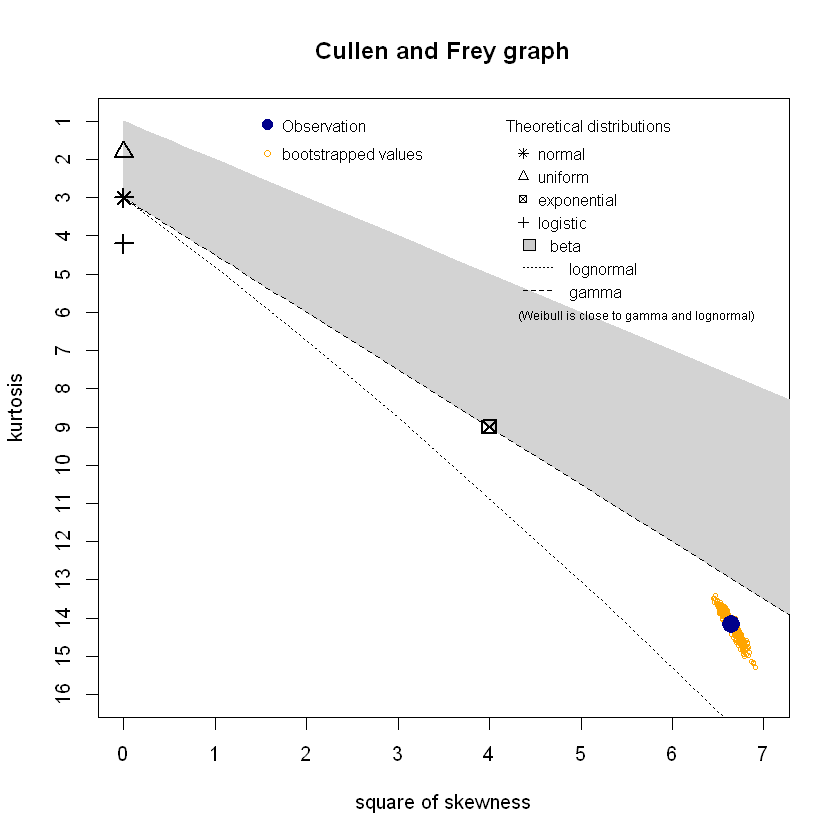

Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
        estimate   Std. Error
shape  0.8103337 0.0006930173
rate  24.3312604 0.0281256453
Loglikelihood:  4933437   AIC:  -9866870   BIC:  -9866845 
Correlation matrix:
          shape      rate
shape 1.0000000 0.7398476
rate  0.7398476 1.0000000


Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
        estimate   Std. Error
shape 0.86583246 4.695723e-04
scale 0.03090398 2.626987e-05
Loglikelihood:  4939425   AIC:  -9878847   BIC:  -9878821 
Correlation matrix:
          shape     scale
shape 1.0000000 0.3174566
scale 0.3174566 1.0000000


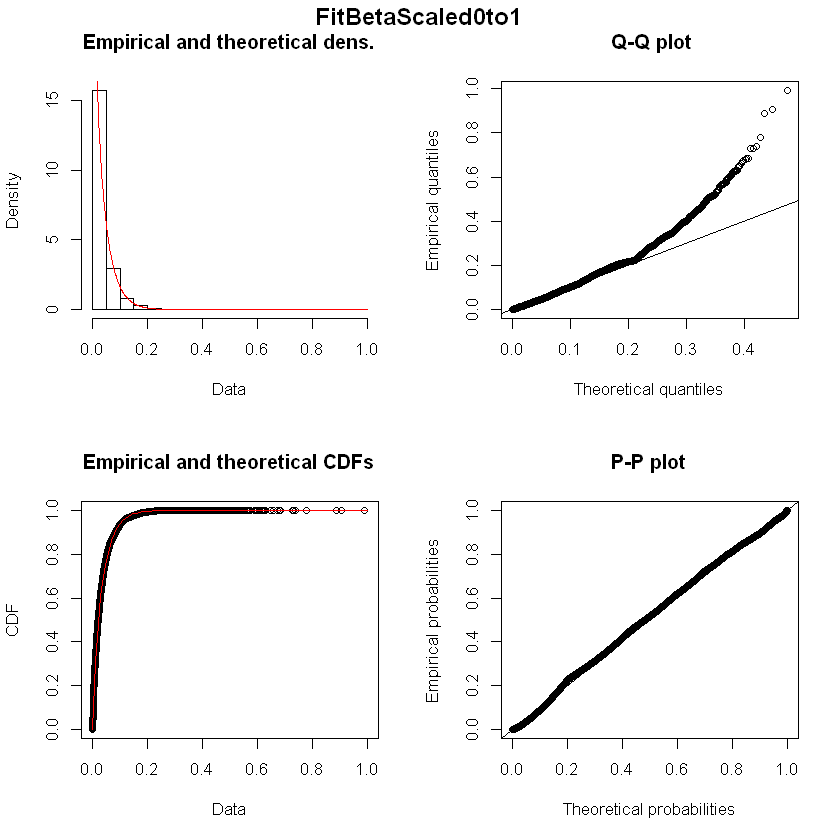

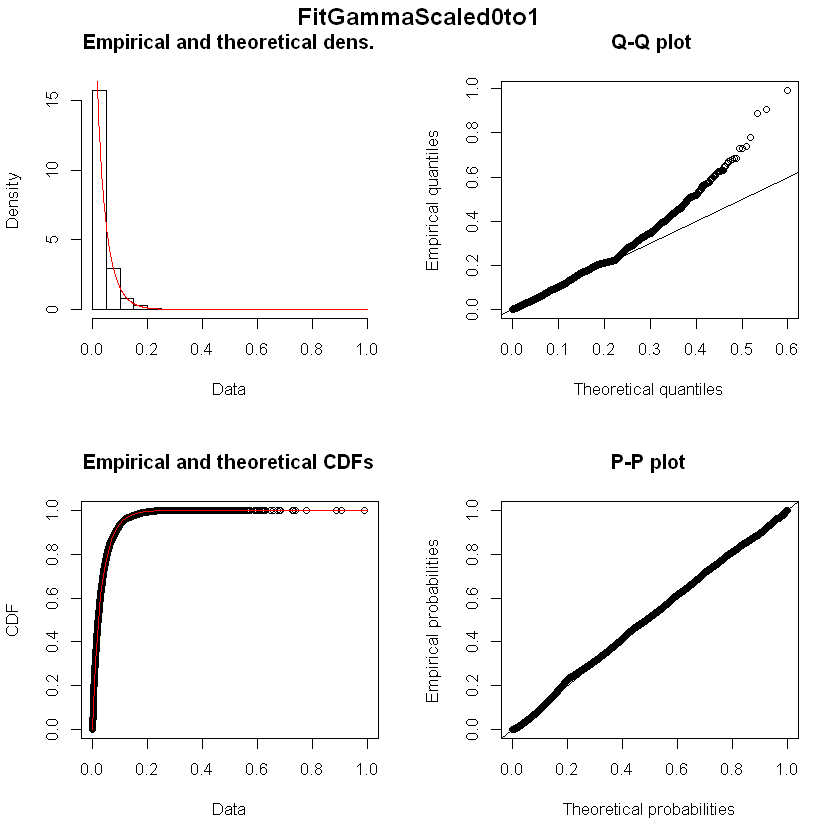

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
      estimate   Std. Error
mean 0.3440936 0.0009972273
sd   1.4244748 0.0007051446
Loglikelihood:  -3617152   AIC:  7234308   BIC:  7234333 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
          estimate   Std. Error
location 0.4519897 0.0009695954
scale    0.7938992 0.0004617351
Loglikelihood:  -3598198   AIC:  7196400   BIC:  7196425 
Correlation matrix:
            location       scale
location  1.00000000 -0.05648367
scale    -0.05648367  1.00000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
      estimate   Std. Error
mean 1.4674112 0.0006171974
sd   0.8816266 0.0004364219
Loglikelihood:  -2638175   AIC:  5276354   BIC:  5276380 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate   Std. Error
meanlog 0.1720468 0.0004986136
sdlog   0.7122374 0.0003525699
Loglikelihood:  -2553884   AIC:  5107772   BIC:  5107797 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
shape 2.518906 0.002347496
rate  1.716612 0.001769939
Loglikelihood:  -2437535   AIC:  4875074   BIC:  4875099 
Correlation matrix:
          shape      rate
shape 1.0000000 0.9038706
rate  0.9038706 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
rate 0.6814723 0.000477075
Loglikelihood:  -2822932   AIC:  5645865   BIC:  5645878 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
      estimate   Std. Error
shape 1.731674 0.0009390408
scale 1.649419 0.0007031298
Loglikelihood:  -2430892   AIC:  4861788   BIC:  4861813 
Correlation matrix:
          shape     scale
shape 1.0000000 0.3167036
scale 0.3167036 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
          estimate   Std. Error
location 1.3922574 0.0006060829
scale    0.4952131 0.0002875021
Loglikelihood:  -2630866   AIC:  5261736   BIC:  5261761 
Correlation matrix:
           location      scale
location 1.00000000 0.06219953
scale    0.06219953 1.00000000


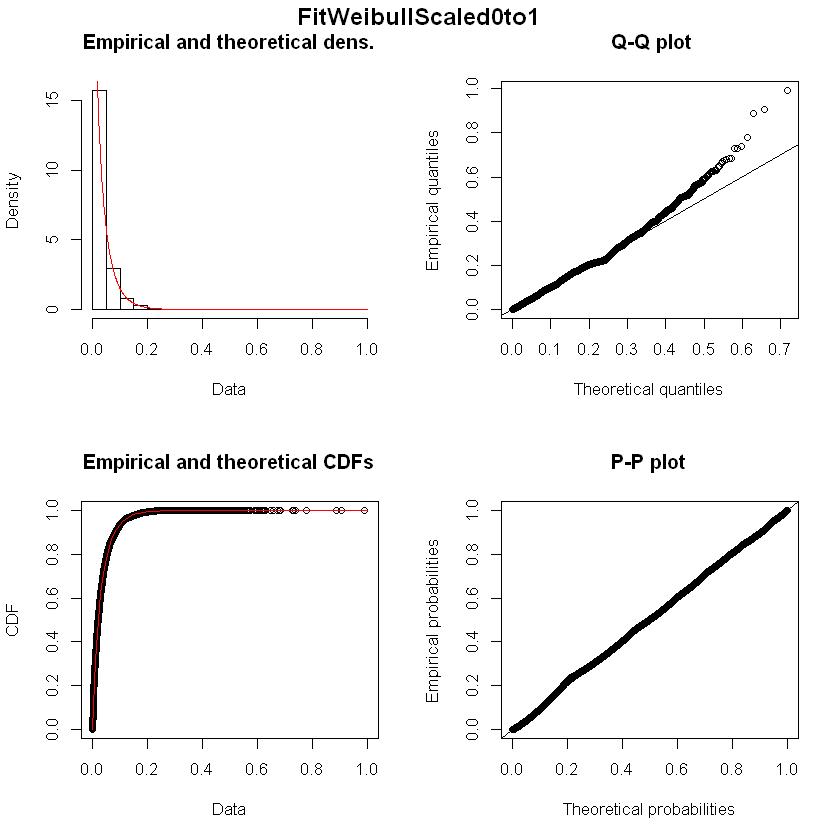

In [49]:
#!!!!!!!!! CHANGE TO R KERNEL !!!!!!!!!!!!!

#CELL NAME:  CURVE FITTING
#THIS CELL FITS WAIT TIME DISTRIBUTIONS TO KNOWN DISTRIBUTIONS OF INTEREST
#This cell requires the WaitTimeR data produced in R STATS cell above, so run R SETUP & R STATS cells first
#Note:  plots sized for transfer to analytical paper in MS Word

#library(psych)
library(MASS) #Note MASS masks dplyr select function
library(stats)
library(fitdistrplus)  #note:  requires MASS, survival, npsurv, and lsei to be loaded, too--autoloads all packages 
#library(vioplot)
#library(rgp)

#First test fit to Normal, Binomial, and Geometric, 
#Try Logistic on binary response variable, also KNN, Decision Trees
#Afterwards go to non-linear:
#Exponential, Gamma, Weibull, LogNormal, Beta, Chi Square, Poisson, Reciprocal, Log-Logistic, Pareto
#Use K-fold and bootstrap to compare fits
#Finish up with machine learning--probably want Ensemble Learning (R vs. Python?)--already have basics above

#note fitdist from fitdistrplus;  fitdistr from MASS

#Initial diagnostics with fitdistrplus
#cat("\nINITIAL DIAGNOSTICS\n")
descdist(AptWaitsR$WaitTimeContinuous, discrete=FALSE, boot=500)
#TEST RESULTS: THIS IS SUGGESTING THE BEST DISTRIBUTIONS MIGHT BE:
#  1.  lognormal
#  2.  Gamma
#  3.  Beta
#  4.  Exponential
#  5.  by extension, Weibull

#Fit wait time distribution to Normal using MASS--try this in fitdistrplus instead
#cat("\nNORMAL CURVE FIT FOR CONTINUOUS WAIT TIME")
#FitNormal <- fitdistr(AptWaitsR$WaitTimeContinuous, densfun="normal")
#print(FitNormal)

#Summary of distribution names
#Normal, norm (continuous univariate) in base R and stats package
#    will using this with the ln transformed wait time equal lognormal?  Test
#Binomial, binom  (discrete univariate) in base R 
#Continuous Binomial, cbinom (continuous univariate)
#Negative Binomial, nbinom (continuous univariate?) in base R
#Geometric, geom (continuous univariate) in base R
#Geometric, dgeom (discrete univariate) in stats package
#Logistic, logis (continuous univariate) in stats package
#Exponential, exp (continuous univariate) in base R and stats package
#Gamma, gamma (continuous univariate) in base R and stats package
#Weibull, weibull (continuous univariate) in base R
#LogNormal, lnorm (Continuous univariate) in base R
#Beta, beta (continuous univariate) in base R, note x range 0 to 1
#Chi Square, chisq (continuous univariate) in base R
#Poisson, pois (discrete univariate) in base R
#Reciprocal, i.e. log-uniform,   (continuous univariate) in KScorrect package
#Log-Logistic, in reliaR, VGAM, actuar, or FAdist packages (continuous univariate)--logarithm has logistic distrib
#    beta parameter probably between 0.5 and 1 at alpha = 1
#Pareto, not sure in fitdistrplus, maybe pareto or paretoI or pareto1 (continuous univariate)


#Negative Binomial using fitdistrplus and discrete data
FitNegBinomial <- fitdist(AptWaitsR$WaitTime, "nbinom")

#Poisson using fitdistrplus and discrete data
FitPoisson <- fitdist(AptWaitsR$WaitTime, "pois", method="mle") 

#Discrete Geometric
#FitDGeometric <- fitdist(AptWaitsR$WaitTime, "dgeom") #does not appear to pass from stats to fitdistrplus

#Fit normal, just for reference, using continuous data--crappy fit
FitNormal <- fitdist(AptWaitsR$WaitTimeContinuous, "norm")

#Fit curves with fitdistrplus:  non-scaled continuous univariate
FitLogNormal <- fitdist(AptWaitsR$WaitTimeContinuous, "lnorm") #suggested by descdist
FitGamma <- fitdist(AptWaitsR$WaitTimeContinuous, "gamma") #suggested by descdist
FitExponential <- fitdist(AptWaitsR$WaitTimeContinuous, "exp") #suggested by descdist
FitWeibull <- fitdist(AptWaitsR$WaitTimeContinuous, "weibull")  #suggested by descdist
FitLogistic <- fitdist(AptWaitsR$WaitTimeContinuous, "logis") 
#FitChiSquare <- fitdist(AptWaitsR$WaitTimeContinuous, "chisq", method="mle", lower=c(0,0)) #throwing errors, not sure how to fix

#Fit curves with standard data
summary(FitNegBinomial)
summary(FitPoisson)
#summary(FitGeometric)
summary(FitNormal)
summary(FitLogNormal)
summary(FitGamma)
summary(FitExponential)
summary(FitWeibull)
summary(FitLogistic)
#summary(ChiSquare)
#SUMMARY OF TEST:  WEIBULL THE WINNER, BUT GAMMA AND EXPONENTIAL PRETTY CLOSE




#Beta using fitdistrplus--note this cannot be combined with above stats--incompatible input data
#   so scale data to be compatible with beta and rerun all tests with same data
AptWaitsR$WaitTimeBeta <- AptWaitsR$WaitTimeContinuous / 88
FitBeta <- fitdist(AptWaitsR$WaitTimeBeta, "beta") #suggested by descdist
summary(FitBeta)
plot(FitBeta)
title(main="FitBetaScaled0to1", outer=TRUE, line=-1)
#Use same scaled data for other distribtions so results are comparable
#FitLogNormal2 <- fitdist(AptWaitsR$WaitTimeBeta, "lnorm") #Use same data to compare AIC and BIC to beta
FitGamma2 <- fitdist(AptWaitsR$WaitTimeBeta, "gamma")
#FitExponential2 <- fitdist(AptWaitsR$WaitTimeBeta, "exp")
FitWeibull2 <- fitdist(AptWaitsR$WaitTimeBeta, "weibull")  
#summary(FitLogNormal2)
summary(FitGamma2)
#summary(FitExponential2)
summary(FitWeibull2)
#plot(FitLogNormal2)
plot(FitGamma2)
title(main="FitGammaScaled0to1", outer=TRUE, line=-1)
#plot(FitExponential2)
plot(FitWeibull2)
title(main="FitWeibullScaled0to1", outer=TRUE, line=-1)
#SUMMARY OF TEST:  BETA DID NOT OUTPERFORM OTHER CURVE FITS;  WEIBULL STILL THE WINNER


#Now try it with logarithmically transformed data
#Drop Binomial and Poisson since data no longer integer

#Fit normal, just for reference, using continuous data--crappy fit
FitNormalLog <- fitdist(AptWaitsR$WaitTimeContinuousLog, "norm")  #Does this give same results as FitLogNormal?

#Fit curves with fitdistrplus:  non-scaled continuous univariate
#FitLogNormalLog <- fitdist(AptWaitsR$WaitTimeContinuousLog, "lnorm") #What does log of log give us?
#FitGammaLog <- fitdist(AptWaitsR$WaitTimeContinuousLog, "gamma") 
#FitExponentialLog <- fitdist(AptWaitsR$WaitTimeContinuousLog, "exp") 
#FitWeibullLog <- fitdist(AptWaitsR$WaitTimeContinuousLog, "weibull")  
FitLogisticLog <- fitdist(AptWaitsR$WaitTimeContinuousLog, "logis") 

#Fit curves with log transformed data
summary(FitNormalLog)
#summary(FitLogNormalLog) #can't use negative numbers
#summary(FitGammaLog)  #can't use negative numbers
#summary(FitExponentialLog)  #can't use negative numbers
#summary(FitWeibullLog)  #can't use negative numbers
summary(FitLogisticLog)

#SUMMARY OF TEST:  MANY DISTRIBUTIONS CANNOT BE FIT DUE TO NEGATIVE NUMBERS IN DISTRIBUTION
#GETTING HIGHER LL AND LOWER AIC AND BIC--IS THIS COMPARABLE TO NON-LOG NUMBERS, OR NOT?  LOOK AT QQ, PP


#Now try it with data transformed by square root

AptWaitsR$WaitTimeContinuousSqRt <- sqrt(AptWaitsR$WaitTimeContinuous)

#Fit normal for baseline
FitNormalSqRt <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "norm")  

#Fit curves with fitdistrplus:  non-scaled continuous univariate
FitLogNormalSqRt <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "lnorm") 
FitGammaSqRt <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "gamma") 
FitExponentialSqRt <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "exp") 
FitWeibullSqRt <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "weibull")  
FitLogisticSqRt <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "logis") 

#Fit curves with SqRt transformed data
summary(FitNormalSqRt)
summary(FitLogNormalSqRt)
summary(FitGammaSqRt)
summary(FitExponentialSqRt)
summary(FitWeibullSqRt)
summary(FitLogisticSqRt)








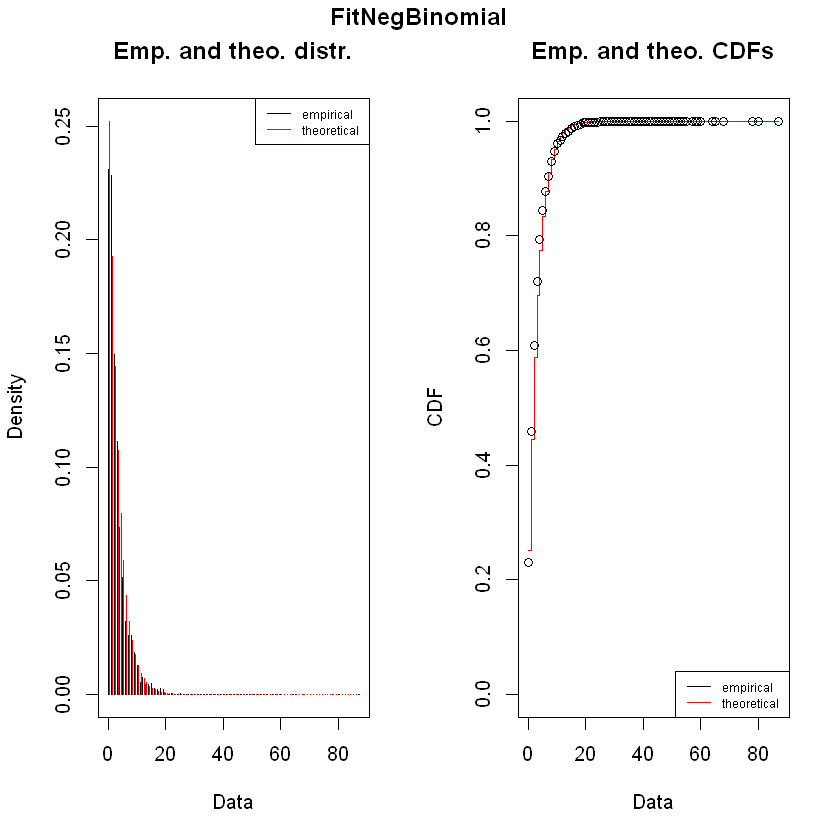

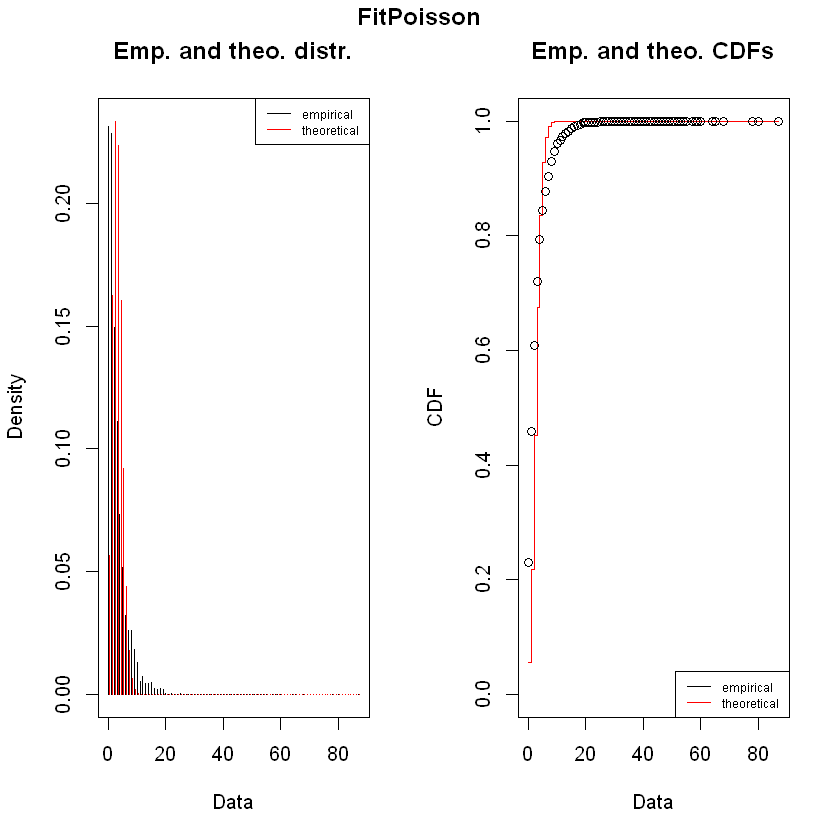

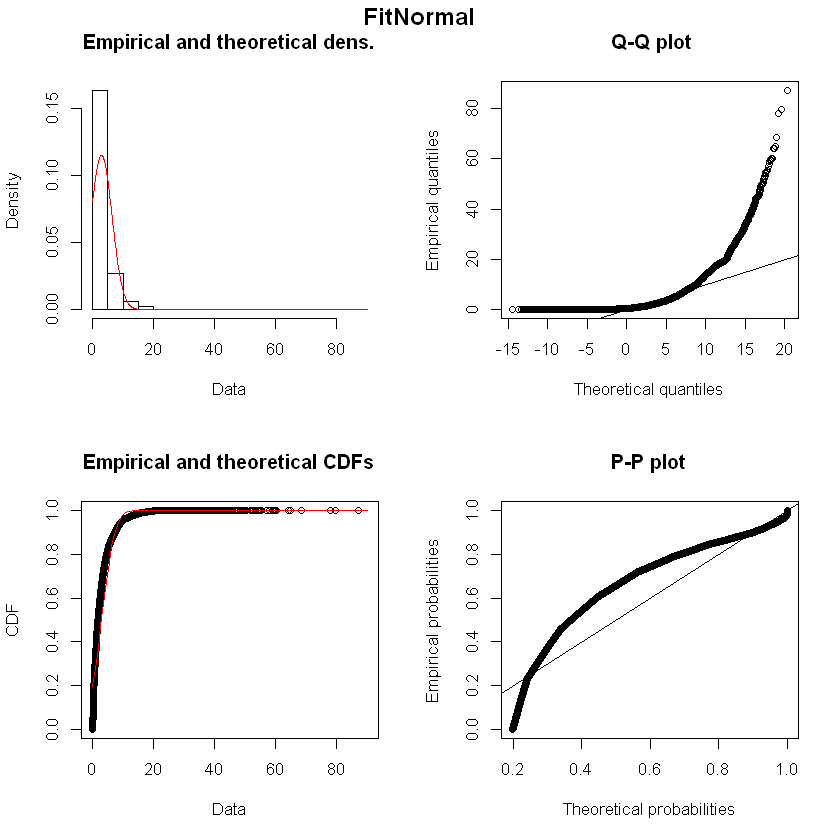

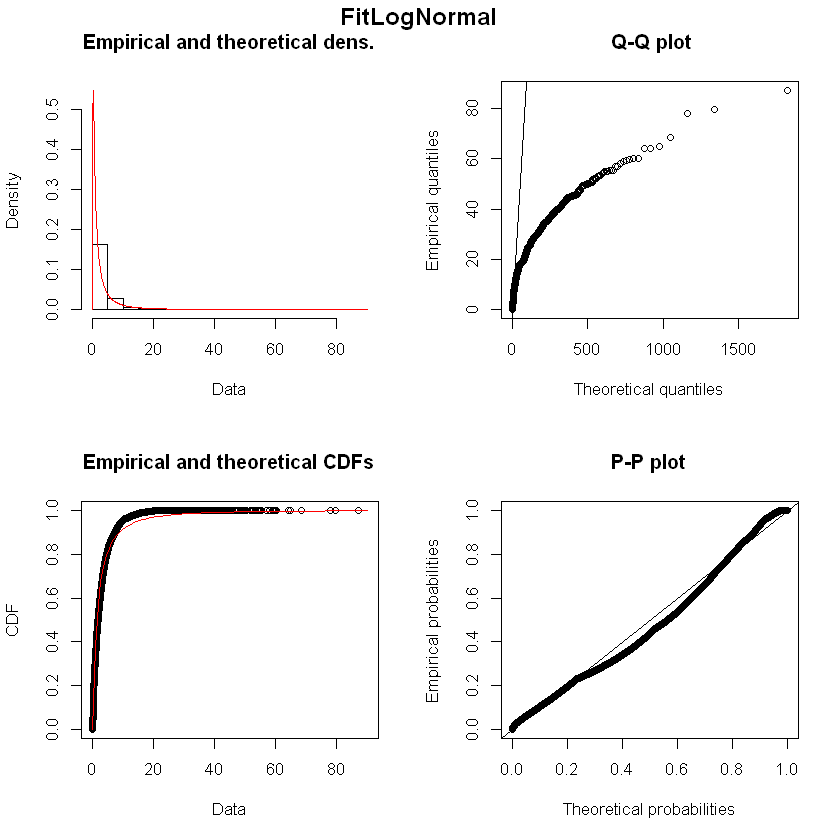

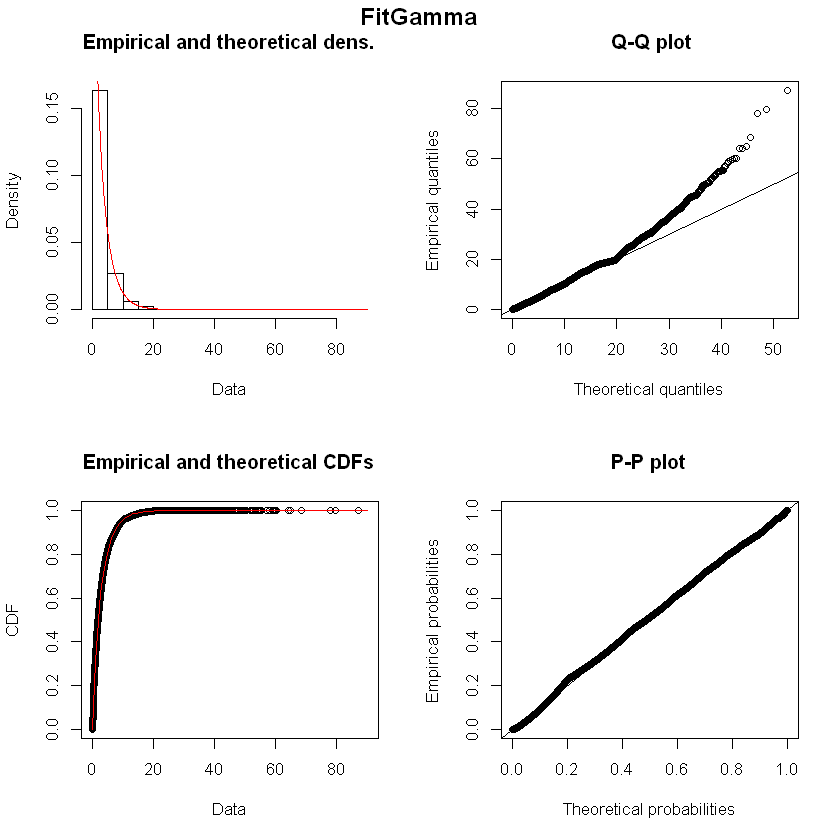

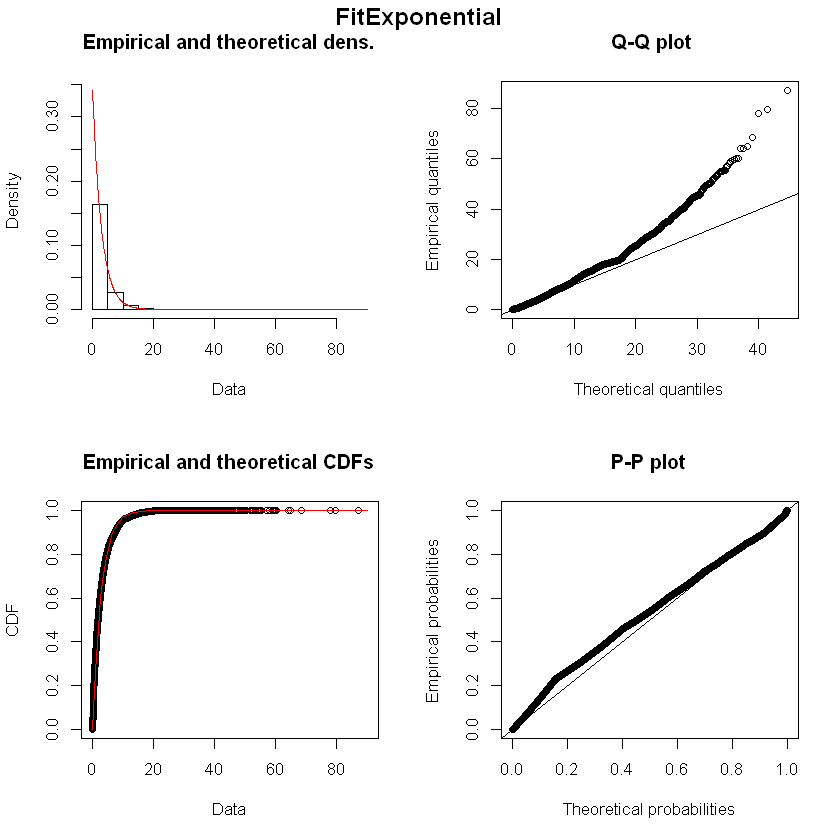

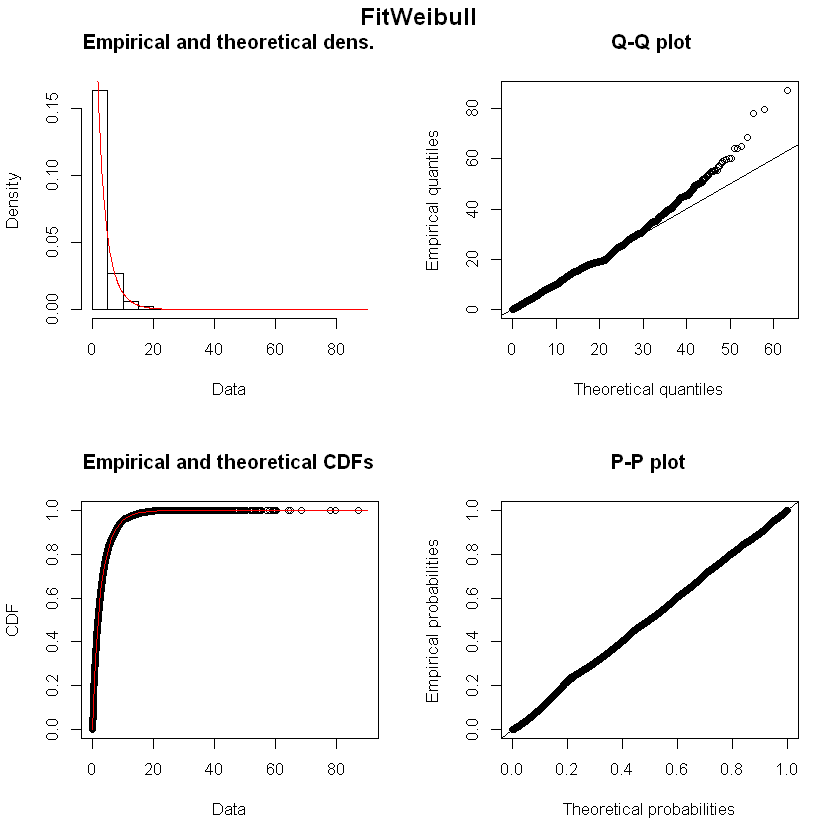

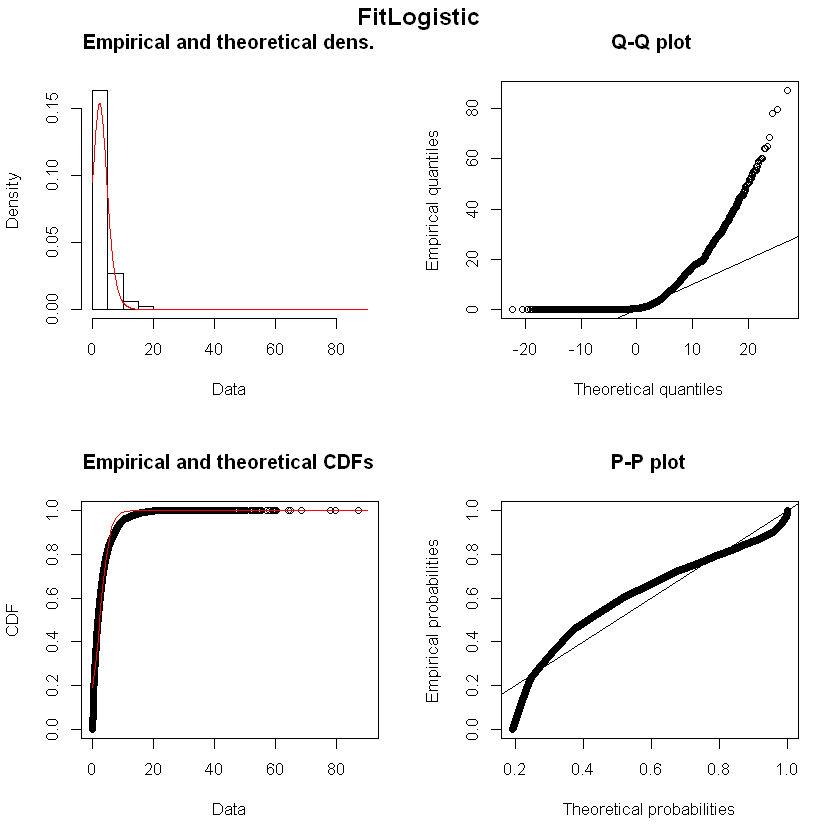

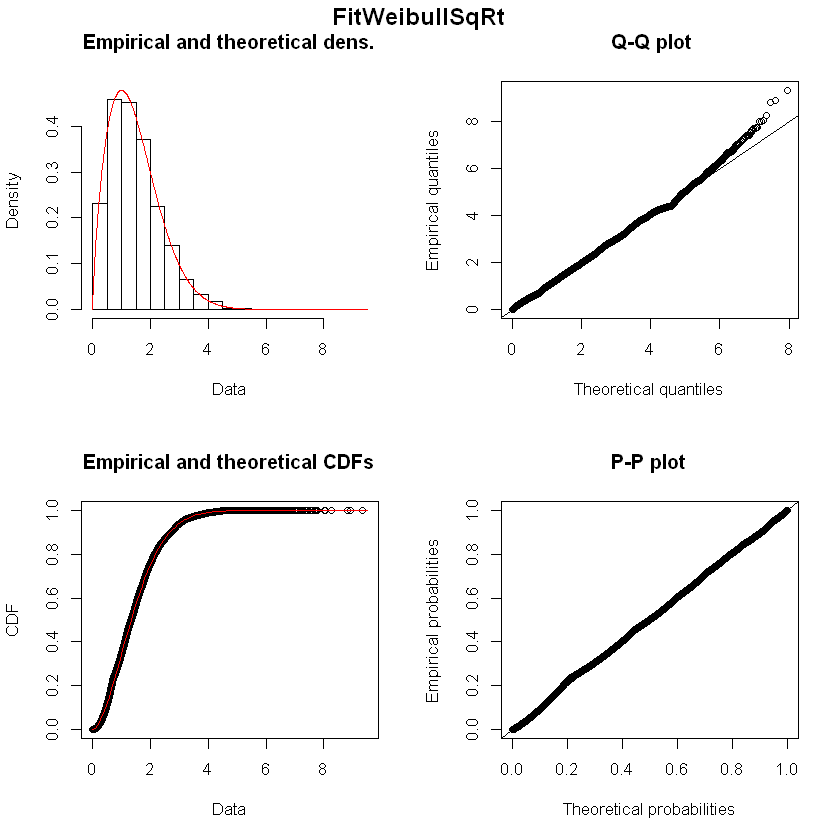

In [51]:
#!!!!!!!!! CHANGE TO R KERNEL !!!!!!!!!!!!!

#CELL NAME:  CURVE FITTING GRAPHS
#THIS CELL PRODUCES GRAPHICS FOR CURVE FITTING CELL ABOVE
#This cell requires the curve fit data in CURVE FITTNG cell to be run first
#Note:  plots sized for transfer to analytical paper in MS Word

#library(psych)
library(MASS) #Note MASS masks dplyr select function
#library(stats)
library(fitdistrplus)  #note:  requires MASS, survival, npsurv, and lsei to be loaded, too--autoloads all packages 
#library(vioplot)
#library(rgp)

#First test fit to Normal, Binomial, and Geometric, 
#Try Logistic on binary response variable, also KNN, Decision Trees
#Afterwards go to non-linear:
#Exponential, Gamma, Weibull, LogNormal, Beta, Chi Square, Poisson, Reciprocal, Log-Logistic, Pareto
#Use K-fold and bootstrap to compare fits
#Finish up with machine learning--probably want Ensemble Learning (R vs. Python?)--already have basics above

#note fitdist from fitdistrplus;  fitdistr from MASS

#Initial diagnostics with fitdistrplus
#cat("\nINITIAL DIAGNOSTICS\n")
#descdist(AptWaitsR$WaitTimeContinuous, discrete=FALSE, boot=500)
#This is suggesting the best distributions might be:
#  1.  lognormal
#  2.  Gamma
#  3.  Beta
#  4.  Exponential
#  5.  by extension, Weibull

#Fit wait time distribution to Normal using MASS--try this in fitdistrplus instead
#cat("\nNORMAL CURVE FIT FOR CONTINUOUS WAIT TIME")
#FitNormal <- fitdistr(AptWaitsR$WaitTimeContinuous, densfun="normal")
#print(FitNormal)

#Summary of distribution names
#Normal, norm (continuous univariate) in base R and stats package
#    
#Binomial, binom  (discrete univariate) in base R 
#Continuous Binomial, cbinom (continuous univariate)
#Negative Binomial, nbinom (continuous univariate?) in base R
#Geometric, geom (continuous univariate) in base R
#Geometric, dgeom (discrete univariate) in stats package
#Logistic, logis (continuous univariate) in stats package
#Exponential, exp (continuous univariate) in base R and stats package
#Gamma, gamma (continuous univariate) in base R and stats package
#Weibull, weibull (continuous univariate) in base R
#LogNormal, lnorm (Continuous univariate) in base R
#Beta, beta (continuous univariate) in base R, note x range 0 to 1
#Chi Square, chisq (continuous univariate) in base R
#Poisson, pois (discrete univariate) in base R
#Reciprocal, i.e. log-uniform,   (continuous univariate) in KScorrect package
#Log-Logistic, in reliaR, VGAM, actuar, or FAdist packages (continuous univariate)--logarithm has logistic distrib
#    beta parameter probably between 0.5 and 1 at alpha = 1
#Pareto, not sure in fitdistrplus, maybe pareto or paretoI or pareto1 (continuous univariate)




#Graph results against each other--note cannot compare with beta due to scale differences
#par(mfrow=c(2,2))
#plot.legend <- c("lognormal", "gamma", "exponential", "Weibull")
#denscomp(list(FitLogNormal, FitGamma, FitExponential, FitWeibull), legendtext = plot.legend)
#cdfcomp (list(FitLogNormal, FitGamma, FitExponential, FitWeibull), legendtext = plot.legend)
#qqcomp  (list(FitLogNormal, FitGamma, FitExponential, FitWeibull), legendtext = plot.legend)
#ppcomp  (list(FitLogNormal, FitGamma, FitExponential, FitWeibull), legendtext = plot.legend)
#NOT NECESSASRY TO RE-RUN, GRAPHS FOR EACH DISTRIBUTION MORE INFORMATIVE AND MORE VISIBLE







plot(FitNegBinomial)
title(main="FitNegBinomial", outer=TRUE, line=-1)
plot(FitPoisson)
title(main="FitPoisson", outer=TRUE, line=-1)
plot(FitNormal)
title(main="FitNormal", outer=TRUE, line=-1)
plot(FitLogNormal)
title(main="FitLogNormal", outer=TRUE, line=-1)
plot(FitGamma)
title(main="FitGamma", outer=TRUE, line=-1)
plot(FitExponential)
title(main="FitExponential", outer=TRUE, line=-1)
plot(FitWeibull)
title(main="FitWeibull", outer=TRUE, line=-1)
plot(FitLogistic)
title(main="FitLogistic", outer=TRUE, line=-1)



#Beta using fitdistrplus--note this cannot be combined with above stats--incompatible input data
#AptWaitsR$WaitTimeBeta <- AptWaitsR$WaitTimeContinuous / 88
#FitBeta <- fitdist(AptWaitsR$WaitTimeBeta, "beta")
#plot(FitBeta)
#Use same data for other distribtions so results are comparable
#FitLogNormal2 <- fitdist(AptWaitsR$WaitTimeBeta, "lnorm") #Use same data to compare AIC and BIC to beta
#FitGamma2 <- fitdist(AptWaitsR$WaitTimeBeta, "gamma")
#FitExponential2 <- fitdist(AptWaitsR$WaitTimeBeta, "exp")
#FitWeibull2 <- fitdist(AptWaitsR$WaitTimeBeta, "weibull")  
#plot(FitLogNormal2)
#plot(FitGamma2)
#plot(FitExponential2)
#plot(FitWeibull2)
#BETA DOES NOT BEAT OTHER DISTRIBUTIONS
#DON'T NEED TO RERUN THESE WITH SCALED DATA; JUST WASTES TIME


#Plot transformed data curve fits
#plot(FitNormalLog)
#plot(FitLogisticLog)
#plot(FitNormalSqRt)
#plot(FitLogNormalSqRt)
#plot(FitGammaSqRt)
#plot(FitExponentialSqRt)
plot(FitWeibullSqRt)
title(main="FitWeibullSqRt", outer=TRUE, line=-1)
#plot(FitLogisticSqRt)
#LOG AND SQRT TRANSFORMATIONS VISUALLY APPEAR BETTER, SHORTER DIVERGENCE
#WEIBULL STILL WINS TOP HONORS IN LL, AIC, BIC







Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
shape 2.518906 0.002347496
rate  1.716612 0.001769939
Loglikelihood:  -2437535   AIC:  4875074   BIC:  4875099 
Correlation matrix:
          shape      rate
shape 1.0000000 0.9038706
rate  0.9038706 1.0000000


Fitting of the distribution ' gamma ' by matching moments 
Parameters : 
      estimate
shape 2.770347
rate  1.887915
Loglikelihood:  -2442905   AIC:  4885814   BIC:  4885839 

Fitting of the distribution ' gamma ' by matching quantiles 
Parameters : 
      estimate
shape 2.299999
rate  1.551960
Loglikelihood:  -2442391   AIC:  4884785   BIC:  4884810 

Fitting of the distribution ' gamma ' by matching quantiles 
Parameters : 
      estimate
shape 2.547024
rate  1.806624
Loglikelihood:  -2441828   AIC:  4883659   BIC:  4883684 

Fitting of the distribution ' gamma ' by maximum goodness-of-fit 
Parameters : 
      estimate
shape 2.446702
rate  1.628200
Loglikelihood:  -2439414   AIC:  4878833   BIC:  4878858 

Fitting of the distribution ' gamma ' by maximum goodness-of-fit 
Parameters : 
      estimate
shape 2.383038
rate  1.593922
Loglikelihood:  -2440115   AIC:  4880235   BIC:  4880260 

Fitting of the distribution ' gamma ' by maximum goodness-of-fit 
Parameters : 
      estimate
shape 2.471807
rate  1.659735
Loglikelihood:  -2438287   AIC:  4876577   BIC:  4876602 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
      estimate   Std. Error
shape 1.731674 0.0009390408
scale 1.649419 0.0007031298
Loglikelihood:  -2430892   AIC:  4861788   BIC:  4861813 
Correlation matrix:
          shape     scale
shape 1.0000000 0.3167036
scale 0.3167036 1.0000000


Fitting of the distribution ' weibull ' by matching quantiles 
Parameters : 
      estimate
shape 1.653797
scale 1.621768
Loglikelihood:  -2434496   AIC:  4868997   BIC:  4869022 

Fitting of the distribution ' weibull ' by matching quantiles 
Parameters : 
      estimate
shape 1.812691
scale 1.694585
Loglikelihood:  -2435336   AIC:  4870676   BIC:  4870702 

Fitting of the distribution ' weibull ' by maximum goodness-of-fit 
Parameters : 
      estimate
shape 1.708345
scale 1.640674
Loglikelihood:  -2431214   AIC:  4862432   BIC:  4862457 

Fitting of the distribution ' weibull ' by maximum goodness-of-fit 
Parameters : 
      estimate
shape 1.705222
scale 1.617535
Loglikelihood:  -2432018   AIC:  4864041   BIC:  4864066 

Fitting of the distribution ' weibull ' by maximum goodness-of-fit 
Parameters : 
      estimate
shape  1.71856
scale  1.64223
Loglikelihood:  -2431007   AIC:  4862019   BIC:  4862044 

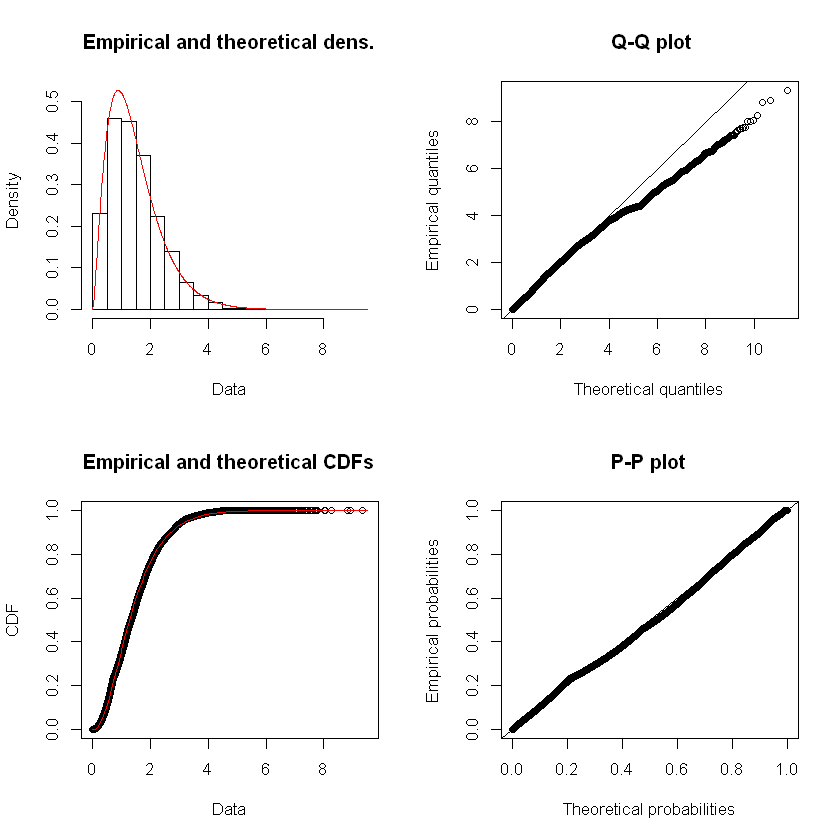

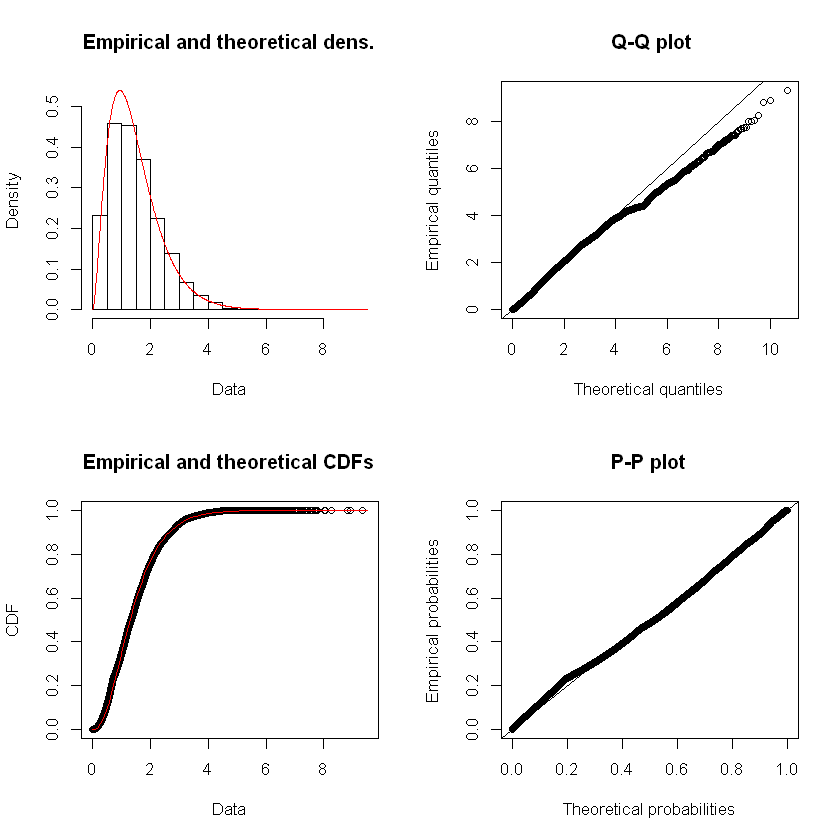

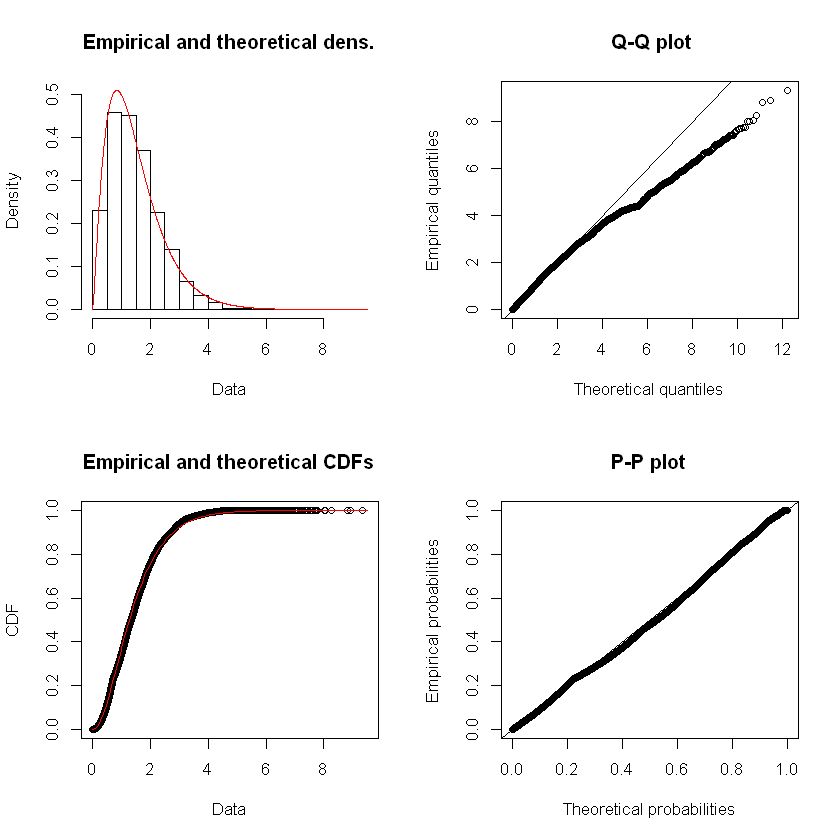

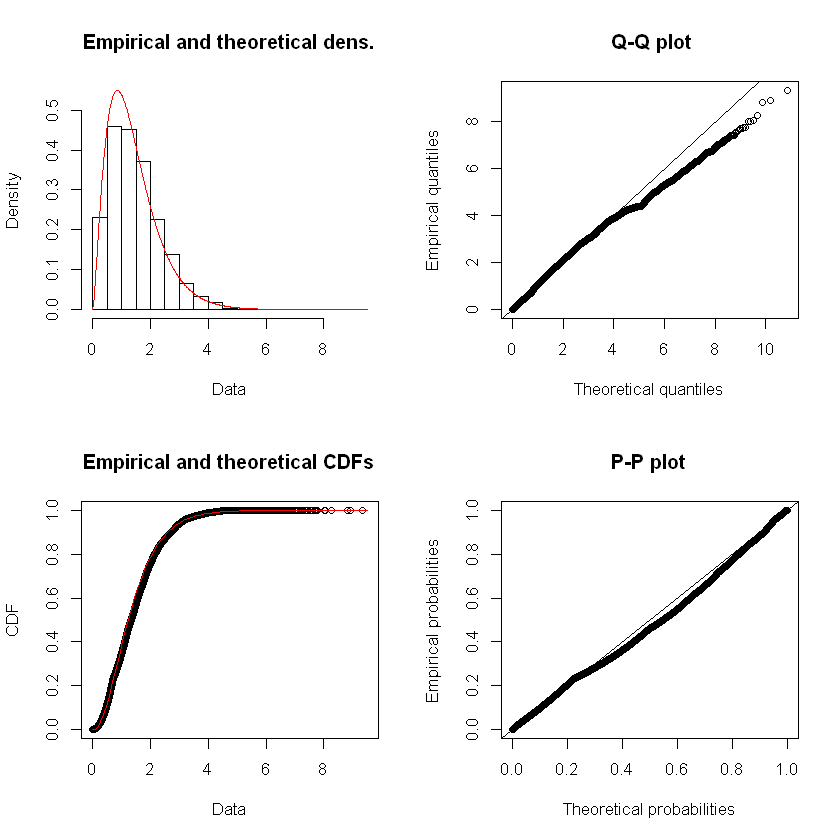

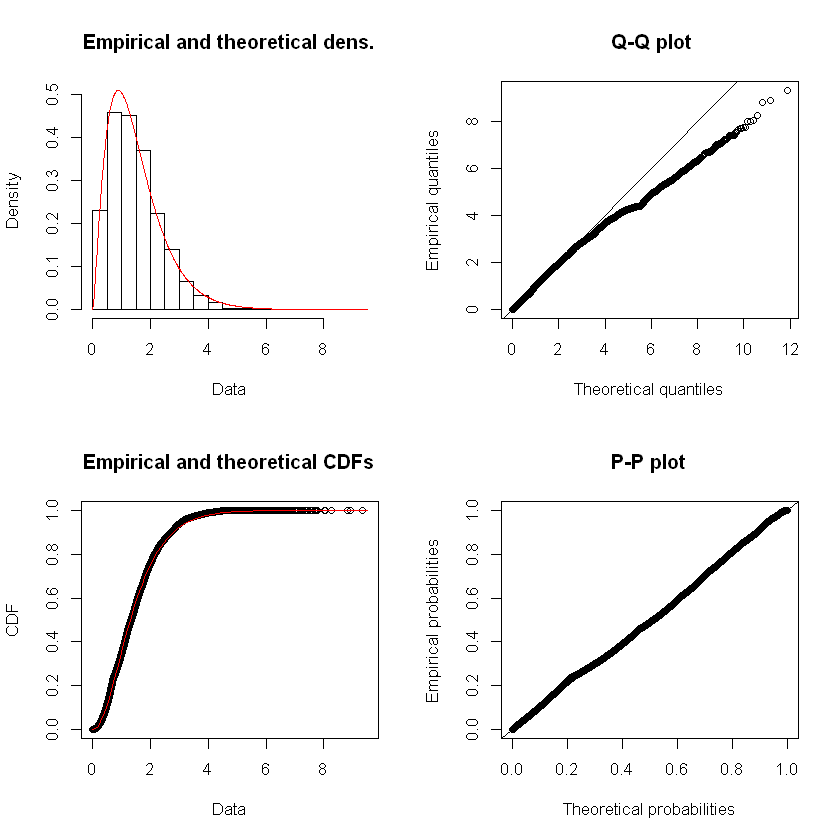

...

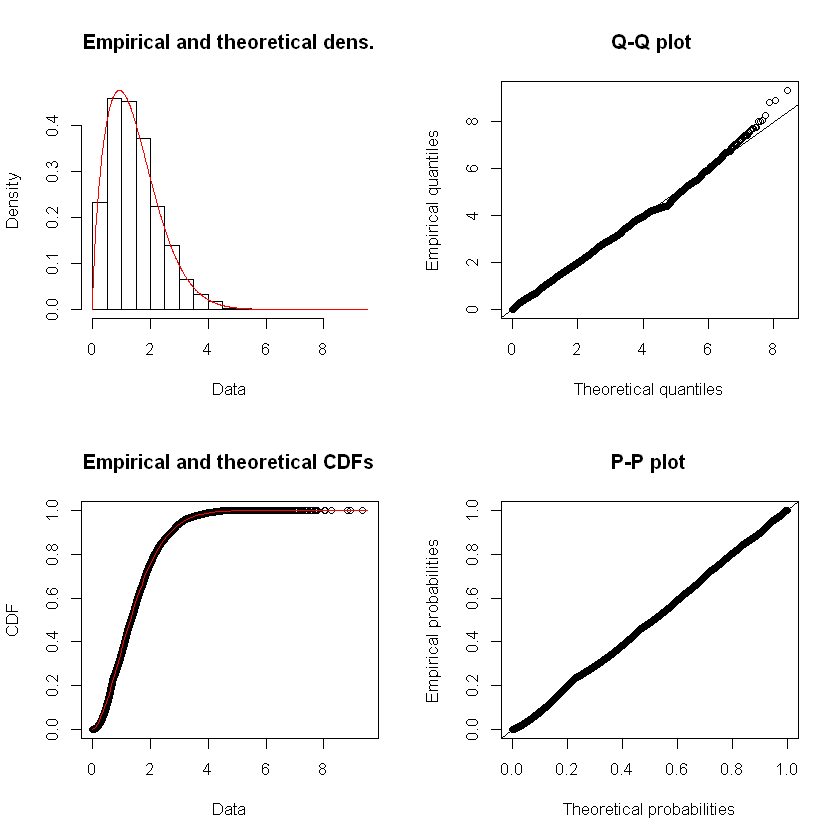

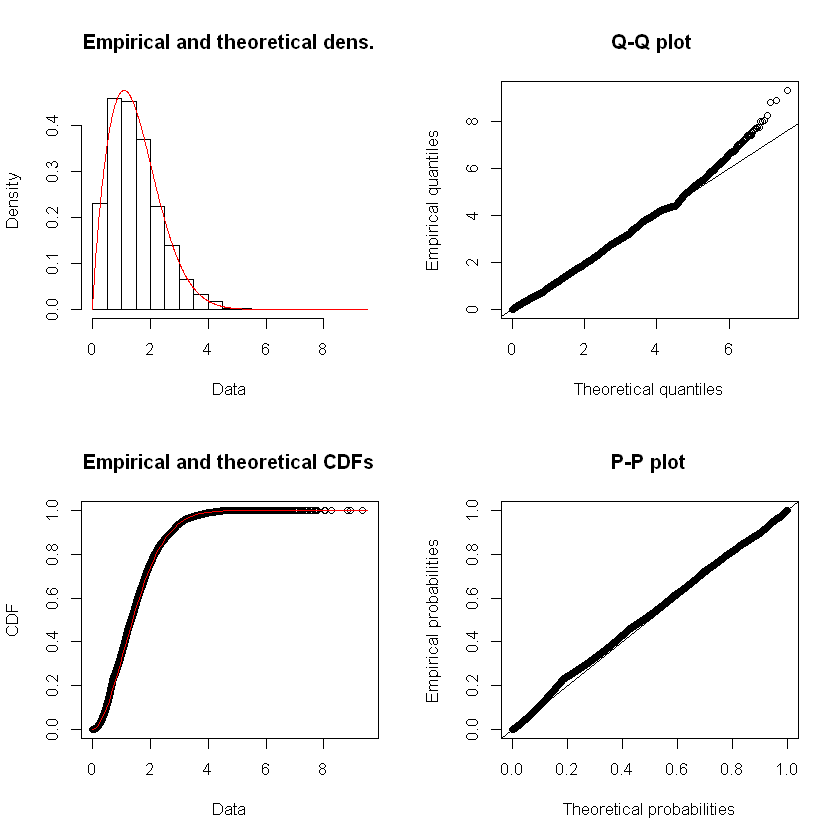

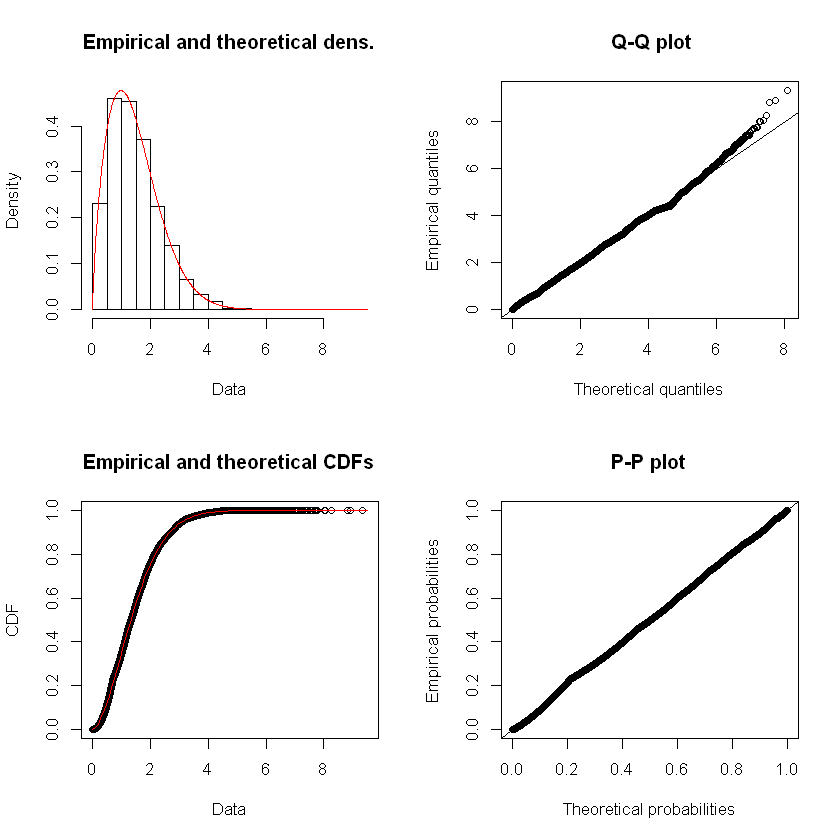

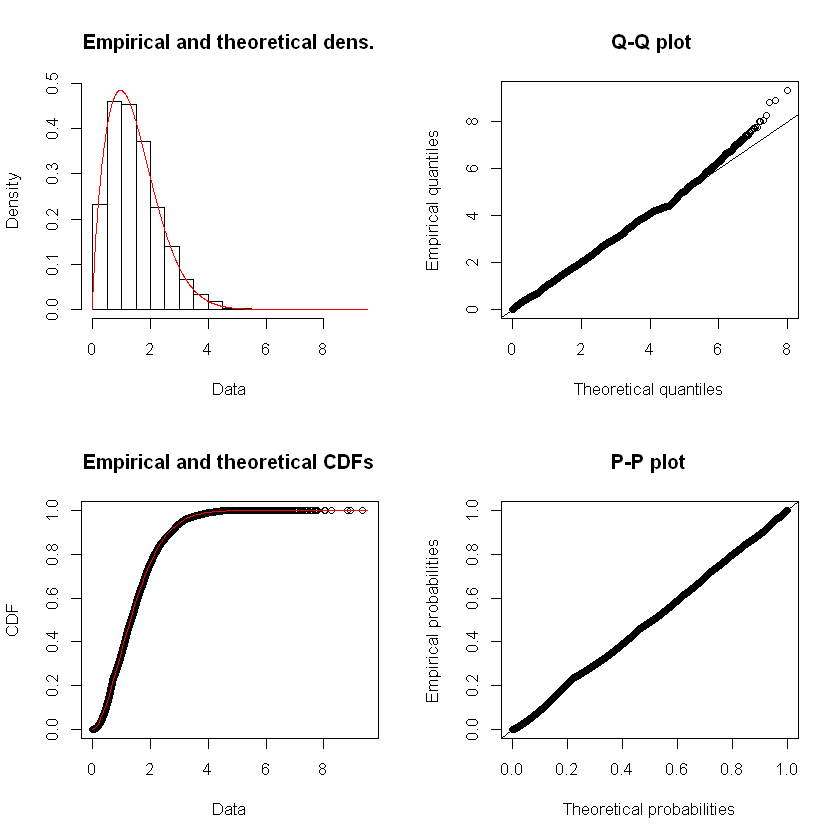

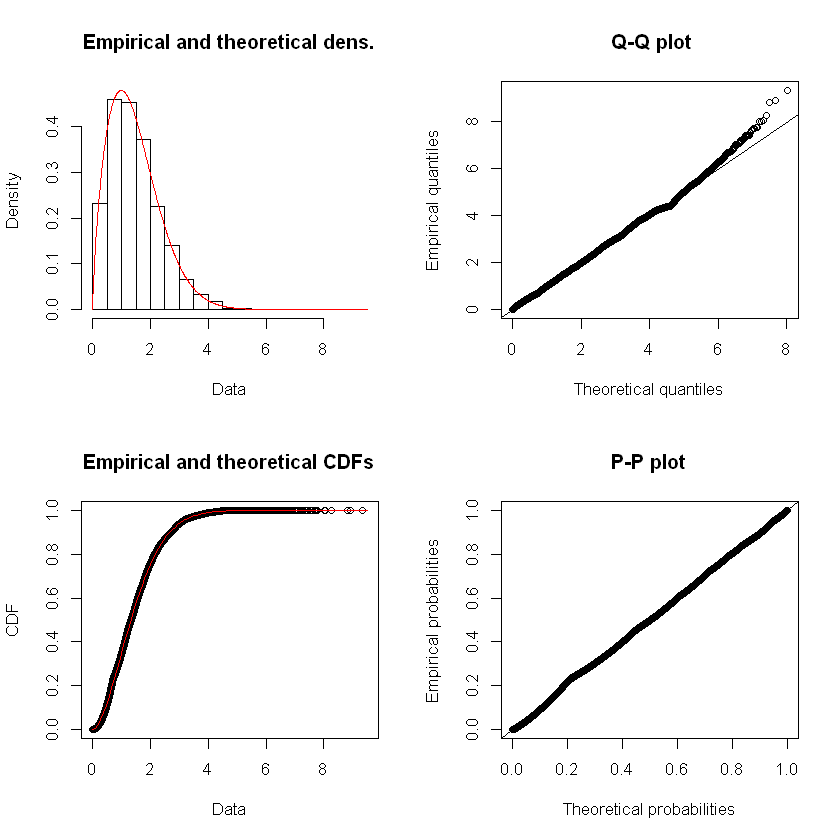

In [5]:
#!!!!!!!!! CHANGE TO R KERNEL !!!!!!!!!!!!!

#CELL NAME:  ALTER CURVE FIT METHODS
#THIS CELL ALTERS MLE METHOD TO MME, QME, AND MGE ON WEIBULL AND GAMMA TO COMPARE BEST FITS
#This cell requires the curve fit data in CURVE FITTNG cell to be run first
#Note:  plots sized for transfer to analytical paper in MS Word


FitGammaSqRtMLE <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "gamma", method="mle") 
FitGammaSqRtMME <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "gamma", method="mme") 
FitGammaSqRtQME2575 <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "gamma", method="qme", probs=c(0.25, 0.75)) 
FitGammaSqRtQME0595 <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "gamma", method="qme", probs=c(0.05, 0.95)) 
FitGammaSqRtMGECvM <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "gamma", method="mge", gof="CvM") 
FitGammaSqRtMGEKS <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "gamma", method="mge", gof="KS") 
FitGammaSqRtMGEAD <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "gamma", method="mge", gof="AD") 

FitWeibullSqRtMLE <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "weibull", method="mle")  
#FitWeibullSqRtMME <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "weibull", method="mme", order=1:2)  
FitWeibullSqRtQME2575 <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "weibull", method="qme", probs=c(0.25, 0.75))  
FitWeibullSqRtQME0595 <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "weibull", method="qme", probs=c(0.05, 0.95))  
FitWeibullSqRtMGECvM <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "weibull", method="mge", gof="CvM")  
FitWeibullSqRtMGEKS <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "weibull", method="mge", gof="KS")  
FitWeibullSqRtMGEAD <- fitdist(AptWaitsR$WaitTimeContinuousSqRt, "weibull", method="mge", gof="AD")  

summary(FitGammaSqRtMLE)
summary(FitGammaSqRtMME)
summary(FitGammaSqRtQME2575)
summary(FitGammaSqRtQME0595)
summary(FitGammaSqRtMGECvM)
summary(FitGammaSqRtMGEKS)
summary(FitGammaSqRtMGEAD)
summary(FitWeibullSqRtMLE)
#summary(FitWeibullSqRtMME)
summary(FitWeibullSqRtQME2575)
summary(FitWeibullSqRtQME0595)
summary(FitWeibullSqRtMGECvM)
summary(FitWeibullSqRtMGEKS)
summary(FitWeibullSqRtMGEAD)


plot(FitGammaSqRtMLE)
plot(FitGammaSqRtMME)
plot(FitGammaSqRtQME2575)
plot(FitGammaSqRtQME0595)
plot(FitGammaSqRtMGECvM)
plot(FitGammaSqRtMGEKS)
plot(FitGammaSqRtMGEAD)
plot(FitWeibullSqRtMLE)
#plot(FitWeibullSqRtMME)
plot(FitWeibullSqRtQME2575)
plot(FitWeibullSqRtQME0595)
plot(FitWeibullSqRtMGECvM)
plot(FitWeibullSqRtMGEKS)
plot(FitWeibullSqRtMGEAD)
#MLE BEATS OTHER METHODS; SQRT DOES NOT IMPROVE FITS
#NO NEED TO RE-RUN



Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
     estimate Std. Error
mean 7.181284 0.05047881
sd   5.819749 0.03569390
Loglikelihood:  -42271.16   AIC:  84546.32   BIC:  84561.31 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
        estimate  Std. Error
meanlog 1.551733 0.009163037
sdlog   1.056415 0.006479220
Loglikelihood:  -40215.64   AIC:  80435.29   BIC:  80450.28 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape 1.3335148 0.01475587
rate  0.1856789 0.00248314
Loglikelihood:  -39184.27   AIC:  78372.54   BIC:  78387.53 
Correlation matrix:
          shape      rate
shape 1.0000000 0.8273846
rate  0.8273846 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
rate 0.1392509 0.001207759
Loglikelihood:  -39496.89   AIC:  78995.77   BIC:  79003.27 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
shape 1.206123 0.008298844
scale 7.645066 0.057931109
Loglikelihood:  -39155.68   AIC:  78315.35   BIC:  78330.34 
Correlation matrix:
          shape     scale
shape 1.0000000 0.3144854
scale 0.3144854 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
         estimate Std. Error
location 6.497372 0.05125390
scale    3.338118 0.02387902
Loglikelihood:  -42397.43   AIC:  84798.86   BIC:  84813.85 
Correlation matrix:
          location     scale
location 1.0000000 0.1151273
scale    0.1151273 1.0000000


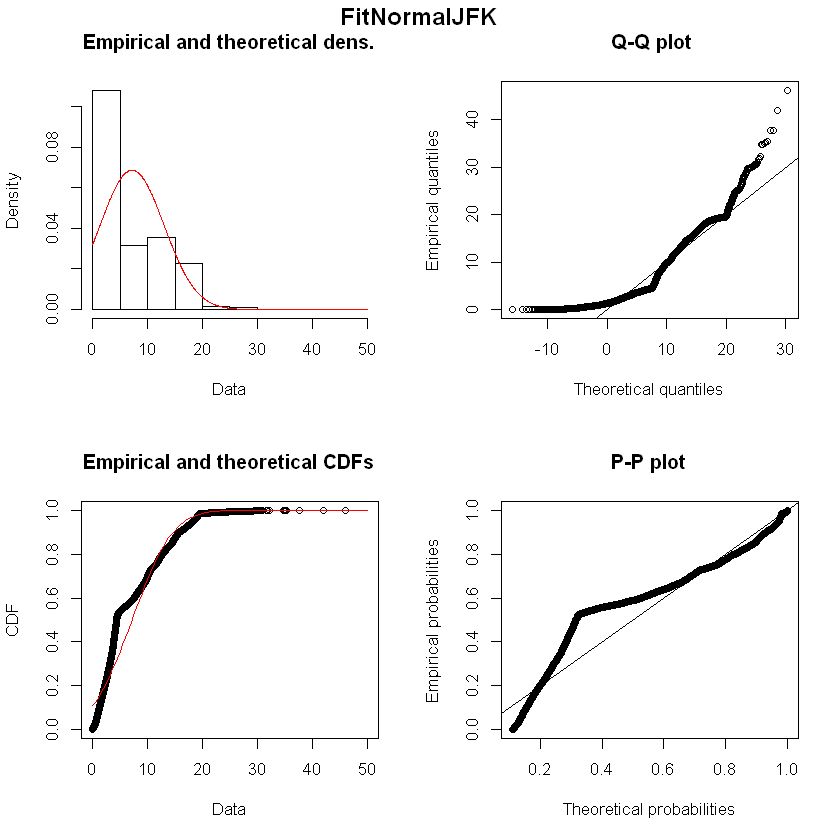

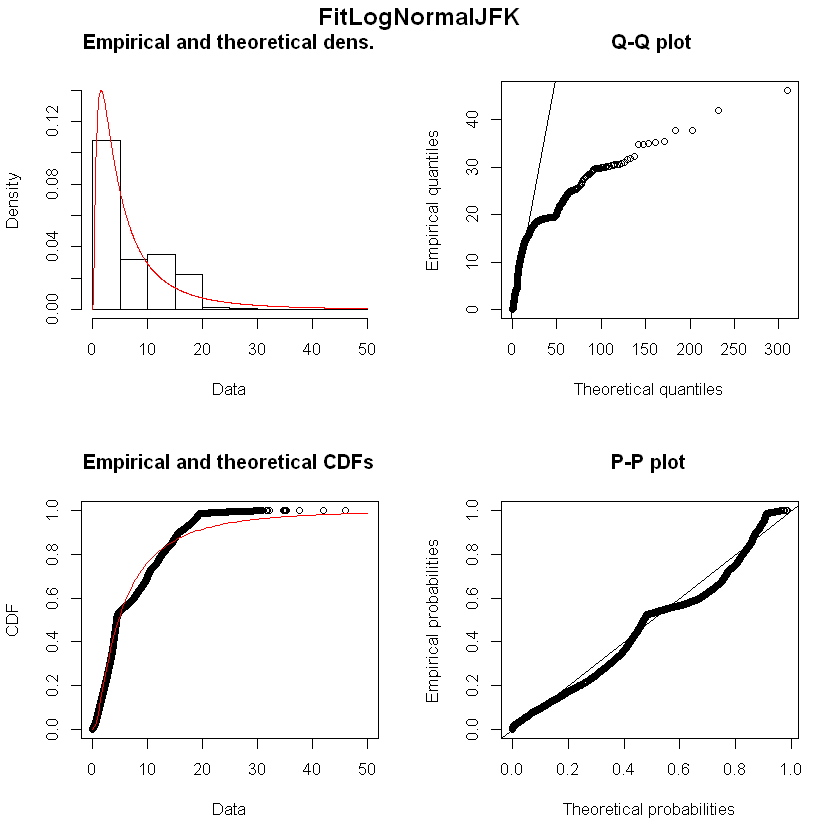

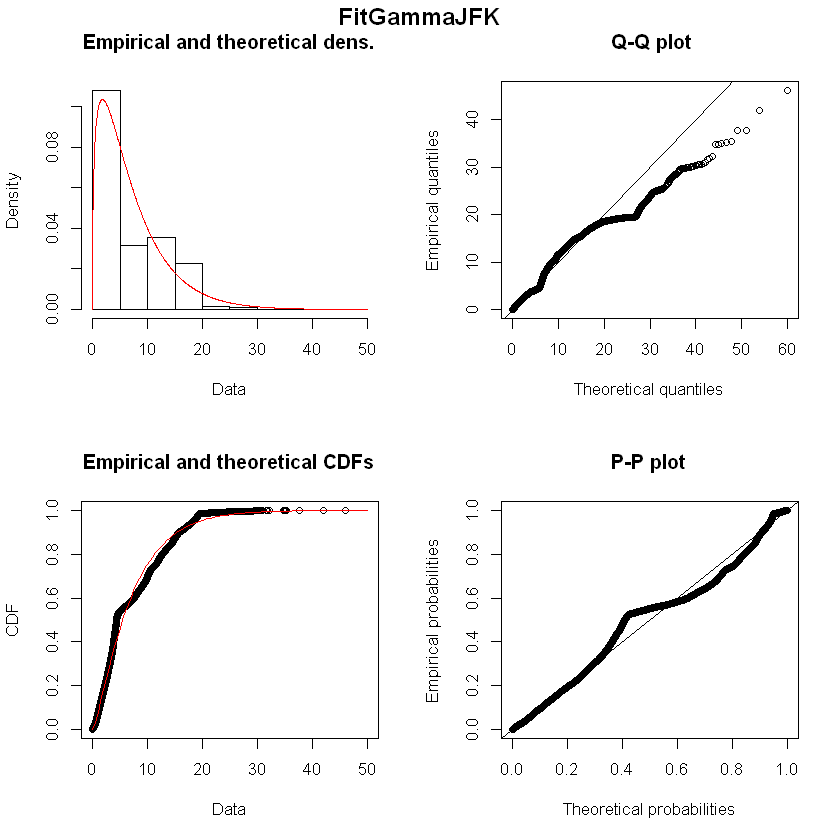

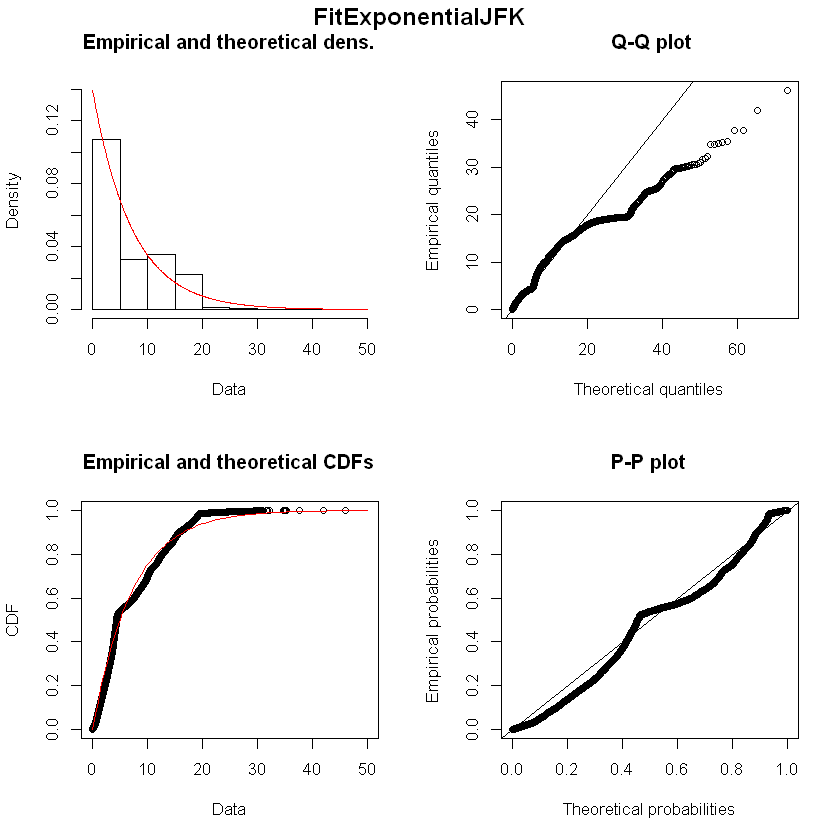

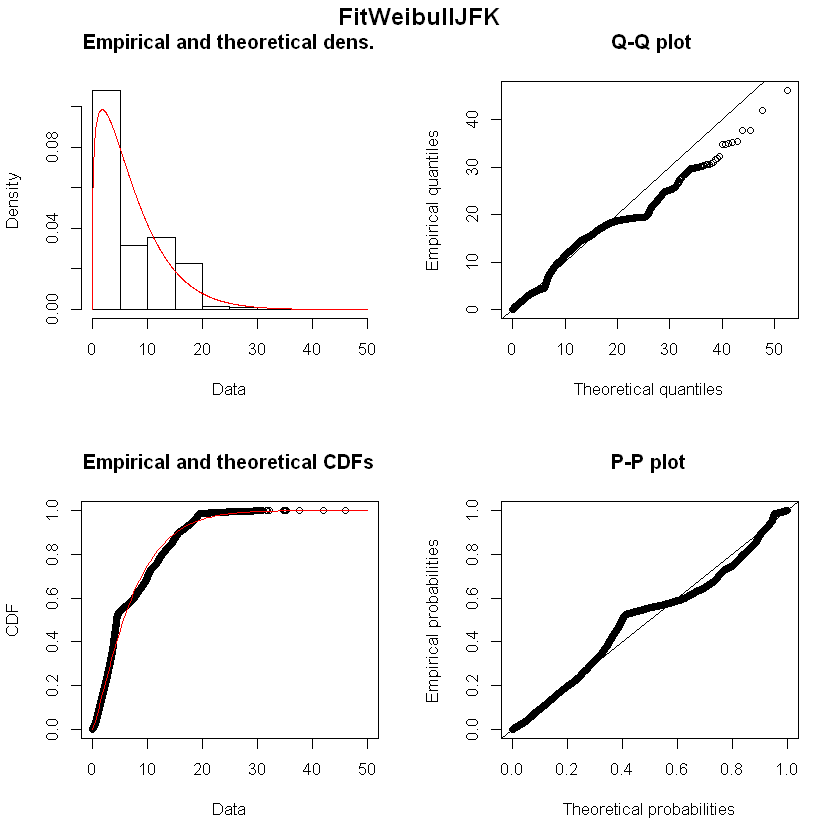

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
     estimate Std. Error
mean 6.815861 0.05783708
sd   6.440984 0.04089699
Loglikelihood:  -40698.65   AIC:  81401.3   BIC:  81416.15 
Correlation matrix:
              mean            sd
mean  1.000000e+00 -2.151284e-09
sd   -2.151284e-09  1.000000e+00


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
        estimate  Std. Error
meanlog 1.226848 0.012935222
sdlog   1.440522 0.009146564
Loglikelihood:  -37339.84   AIC:  74683.69   BIC:  74698.54 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate  Std. Error
shape 0.8503912 0.009369723
rate  0.1247859 0.001834730
Loglikelihood:  -36091.41   AIC:  72186.81   BIC:  72201.66 
Correlation matrix:
          shape      rate
shape 1.0000000 0.7492987
rate  0.7492987 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
rate 0.1467166 0.001317387
Loglikelihood:  -36204.57   AIC:  72411.14   BIC:  72418.56 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate  Std. Error
shape 0.9170675 0.006696135
scale 6.5594405 0.067539324
Loglikelihood:  -36131.4   AIC:  72266.8   BIC:  72281.65 
Correlation matrix:
          shape     scale
shape 1.0000000 0.3096627
scale 0.3096627 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
         estimate Std. Error
location 6.061210 0.06009380
scale    3.753634 0.02760161
Loglikelihood:  -40925.79   AIC:  81855.59   BIC:  81870.44 
Correlation matrix:
          location     scale
location 1.0000000 0.1213927
scale    0.1213927 1.0000000


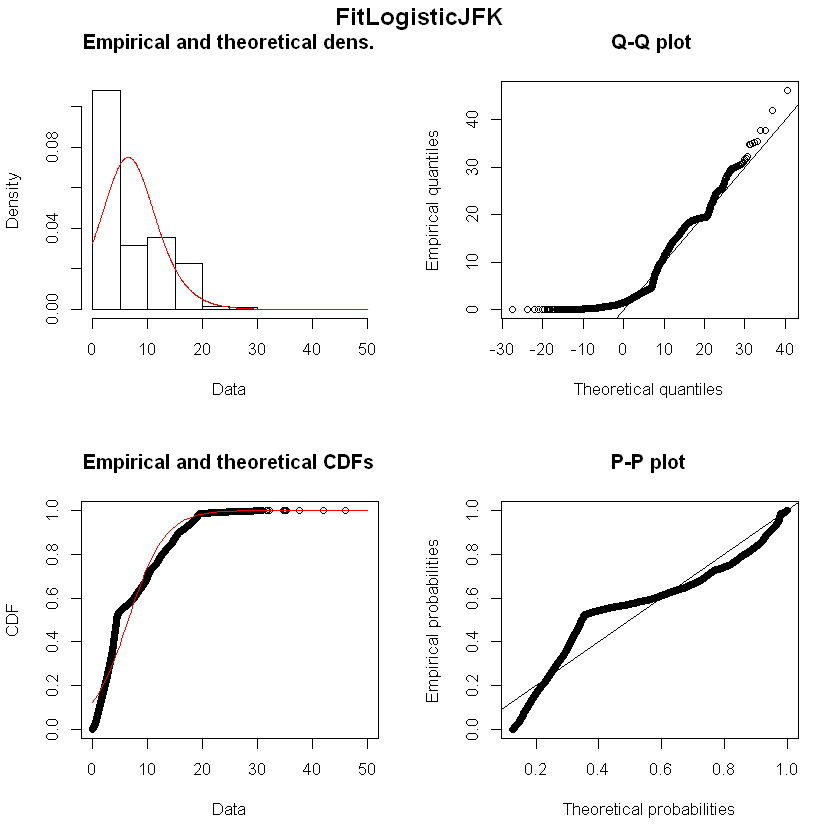

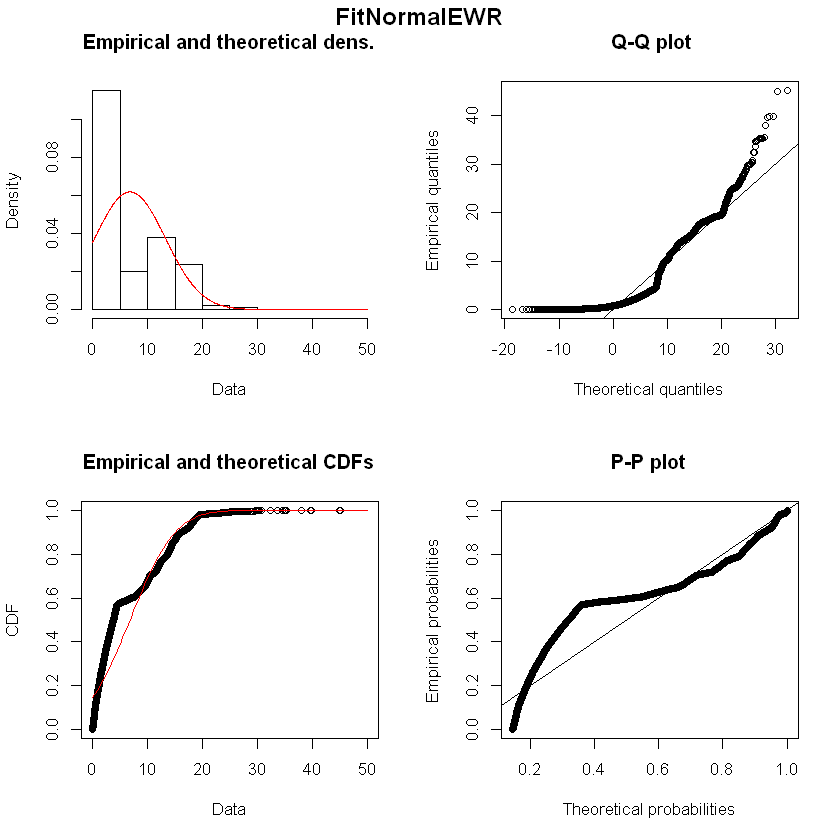

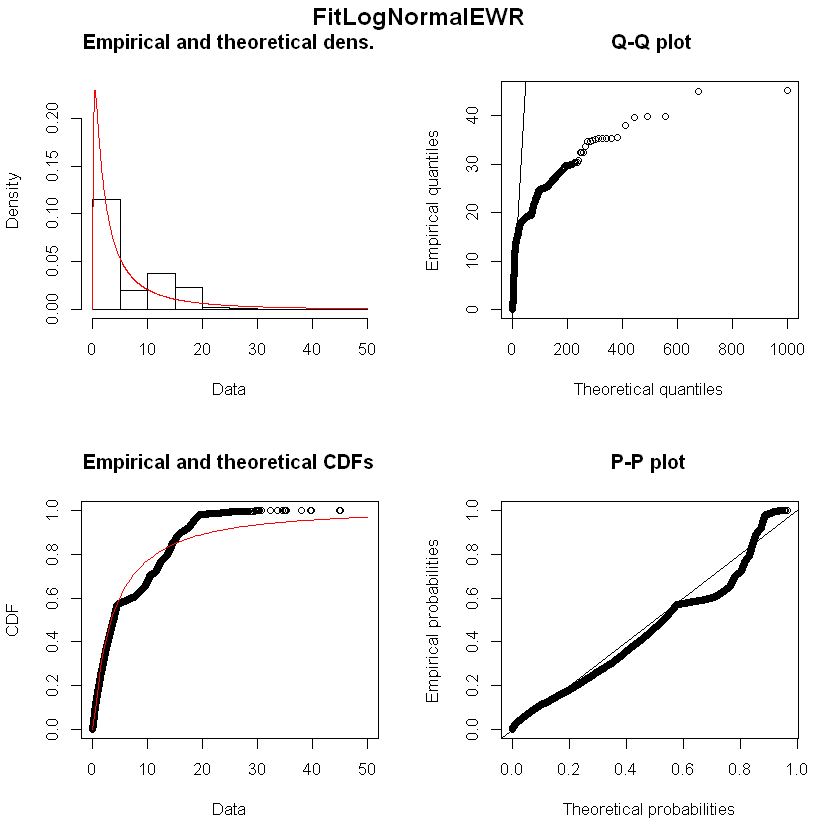

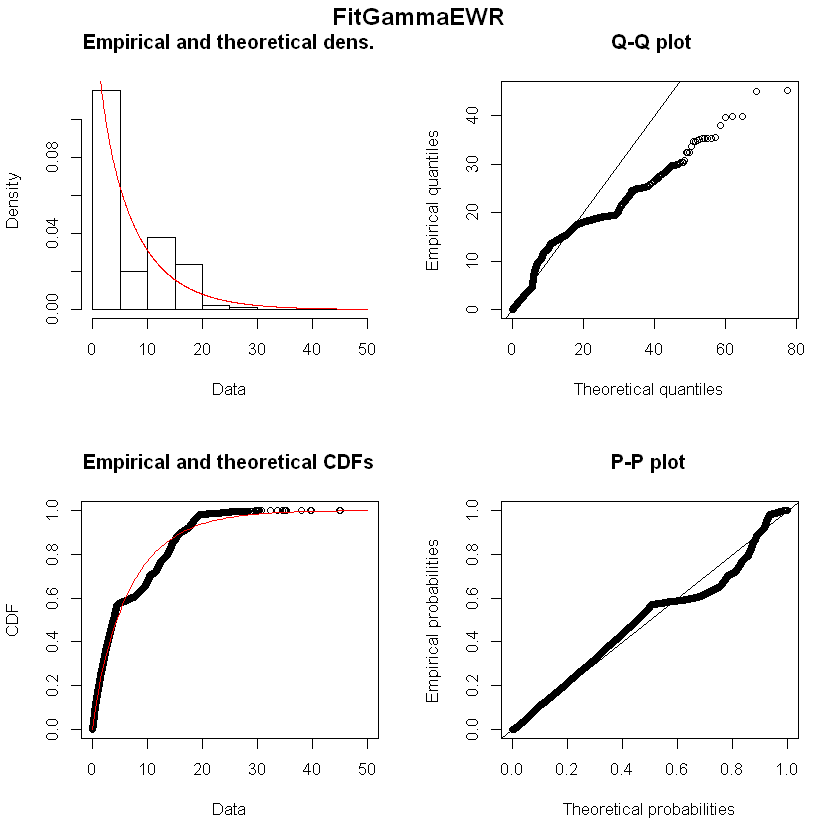

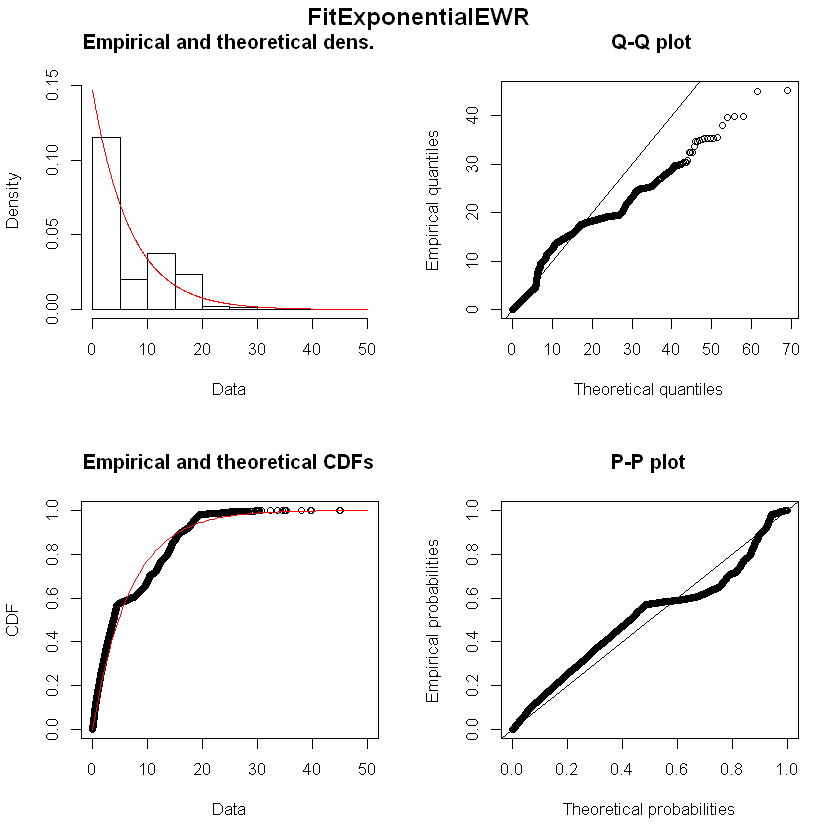

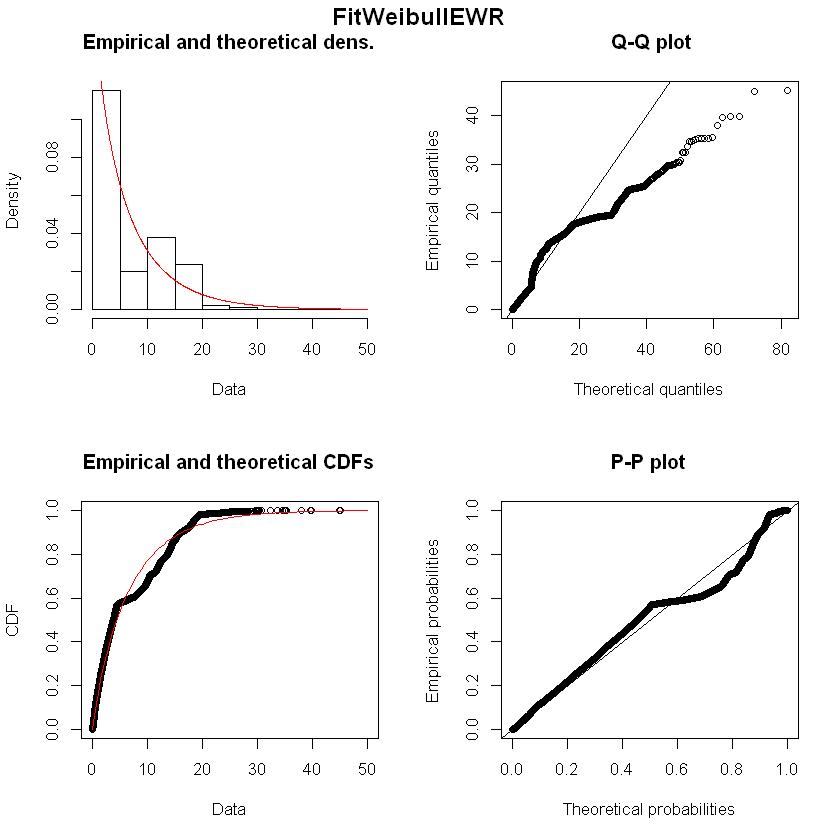

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
     estimate Std. Error
mean 6.893447 0.06249203
sd   7.009700 0.04418853
Loglikelihood:  -42353.95   AIC:  84711.9   BIC:  84726.78 
Correlation matrix:
             mean           sd
mean 1.000000e+00 2.511507e-09
sd   2.511507e-09 1.000000e+00


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
        estimate Std. Error
meanlog 1.215239 0.01313267
sdlog   1.473085 0.00928618
Loglikelihood:  -38016.97   AIC:  76037.93   BIC:  76052.81 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate  Std. Error
shape 0.8263897 0.009016033
rate  0.1198983 0.001758732
Loglikelihood:  -36710.95   AIC:  73425.91   BIC:  73440.79 
Correlation matrix:
          shape      rate
shape 1.0000000 0.7436924
rate  0.7436924 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
rate 0.1450653 0.001293207
Loglikelihood:  -36872.45   AIC:  73746.89   BIC:  73754.33 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
shape 0.895271 0.006402085
scale 6.550317 0.068593494
Loglikelihood:  -36746.19   AIC:  73496.38   BIC:  73511.26 
Correlation matrix:
          shape     scale
shape 1.0000000 0.3092808
scale 0.3092808 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
         estimate Std. Error
location 5.920667 0.05902876
scale    3.779578 0.02809264
Loglikelihood:  -41902.24   AIC:  83808.48   BIC:  83823.36 
Correlation matrix:
          location     scale
location 1.0000000 0.1263409
scale    0.1263409 1.0000000


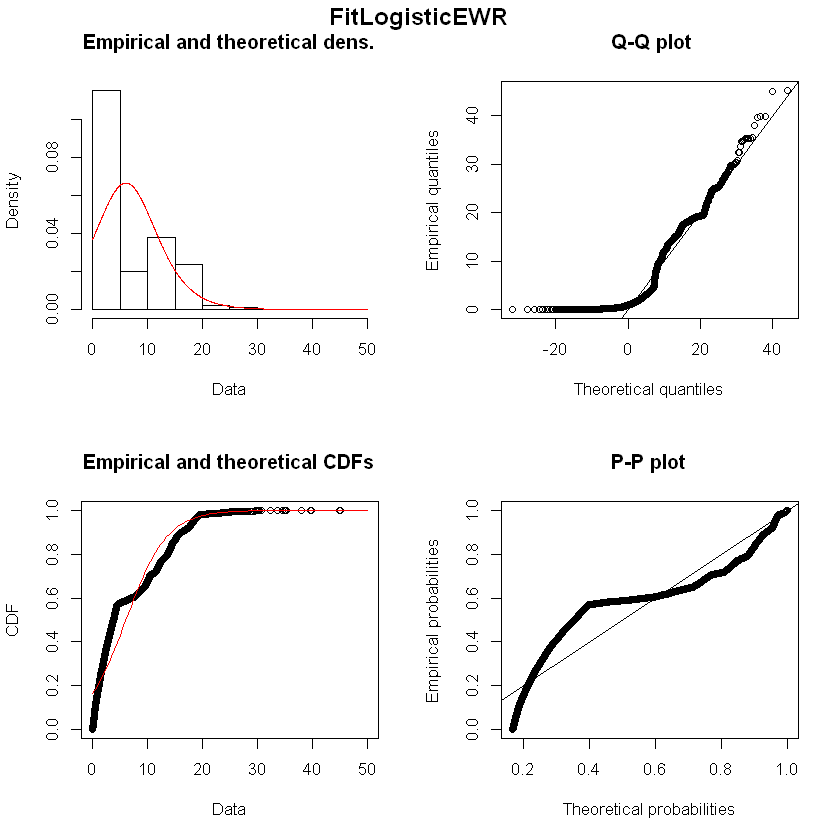

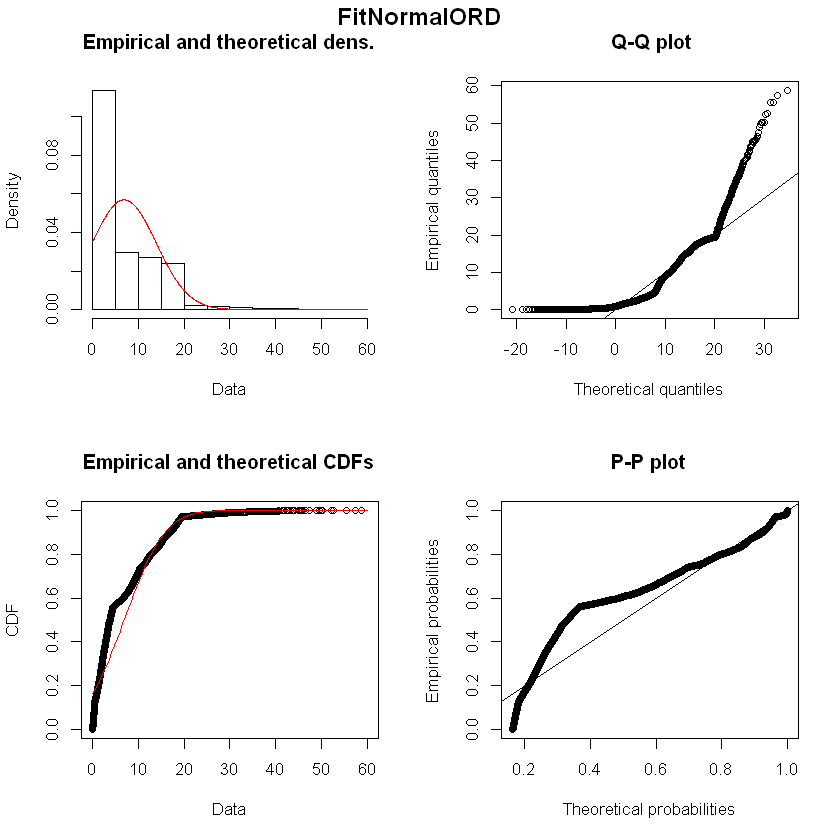

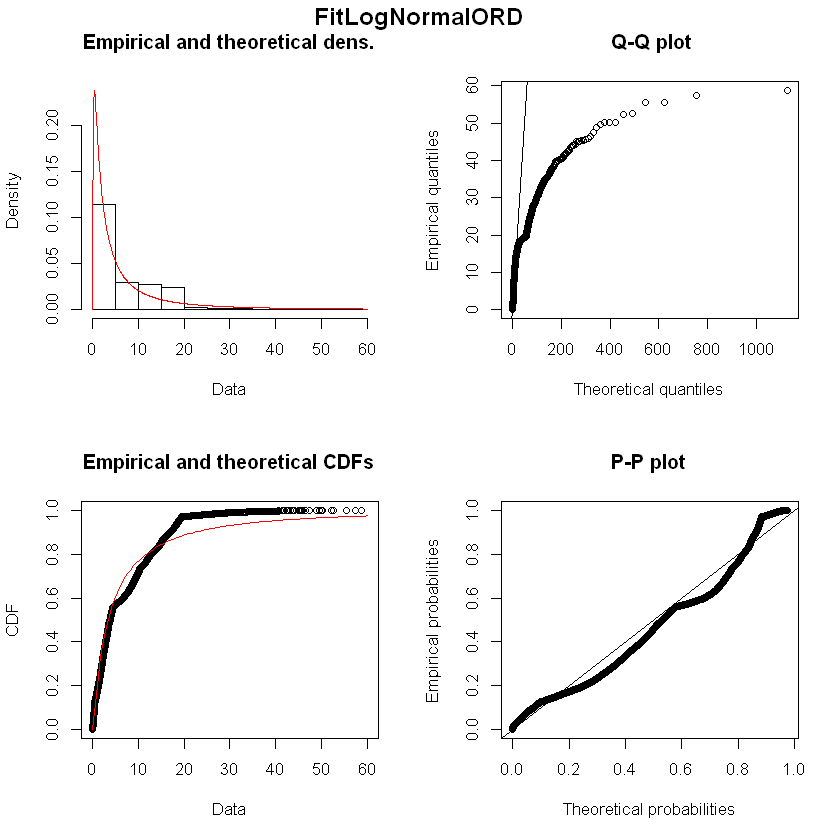

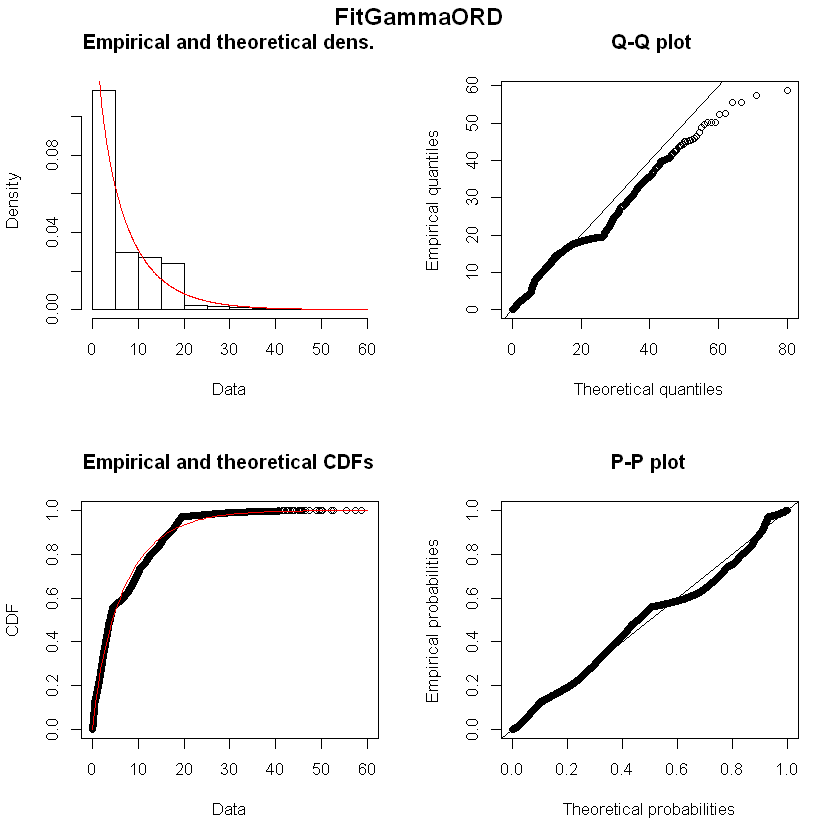

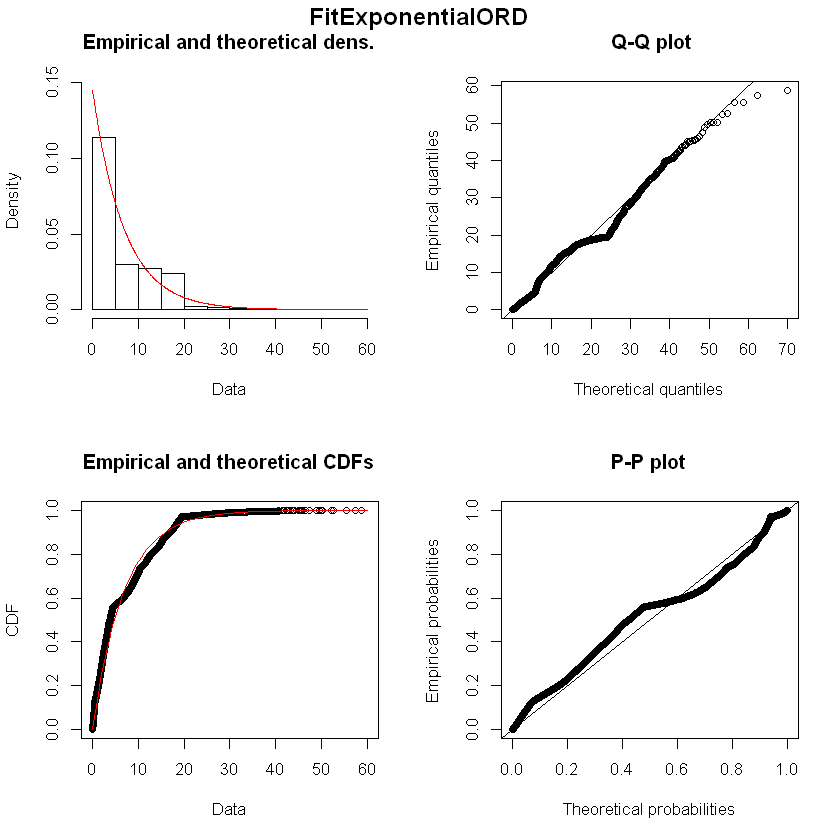

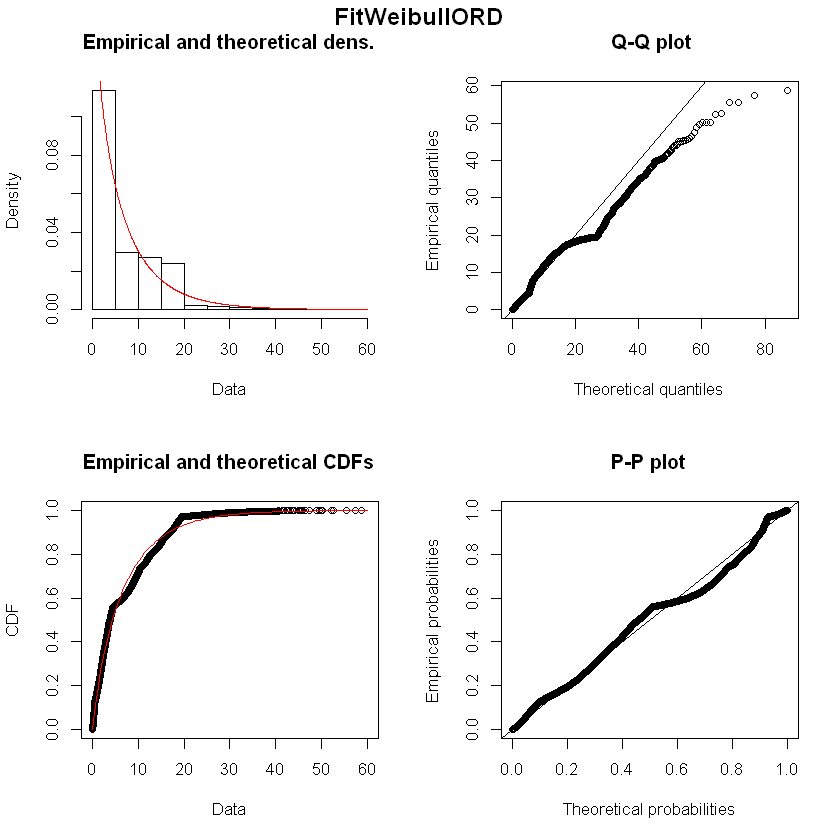

Fitting of the distribution ' nbinom ' by maximum likelihood 
Parameters : 
         estimate Std. Error
size 6.930720e+06 5.17722204
mu   2.758665e+00 0.02149181
Loglikelihood:  -10372.19   AIC:  20748.38   BIC:  20761.77 
Correlation matrix:
     size mu
size    1  0
mu      0  1


Fitting of the distribution ' pois ' by maximum likelihood 
Parameters : 
       estimate Std. Error
lambda 2.758875 0.02149345
Loglikelihood:  -10372.19   AIC:  20746.38   BIC:  20753.07 

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
     estimate Std. Error
mean 2.778788 0.01636367
sd   1.264563 0.01157083
Loglikelihood:  -9875.689   AIC:  19755.38   BIC:  19768.77 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
meanlog 0.8214883 0.010563597
sdlog   0.8163412 0.007469541
Loglikelihood:  -12167.97   AIC:  24339.95   BIC:  24353.34 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape 2.6480673 0.04573730
rate  0.9529003 0.01811897
Loglikelihood:  -10844.23   AIC:  21692.45   BIC:  21705.84 
Correlation matrix:
          shape      rate
shape 1.0000000 0.9083528
rate  0.9083528 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
rate 0.3598692 0.004656733
Loglikelihood:  -12075.47   AIC:  24152.94   BIC:  24159.64 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
      estimate Std. Error
shape 2.196663 0.02423509
scale 3.094545 0.01890540
Loglikelihood:  -10222.94   AIC:  20449.88   BIC:  20463.27 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2659197
scale 0.2659197 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
location 2.8621155 0.017133481
scale    0.7454495 0.007868675
Loglikelihood:  -10029.95   AIC:  20063.9   BIC:  20077.29 
Correlation matrix:
            location       scale
location  1.00000000 -0.06613381
scale    -0.06613381  1.00000000


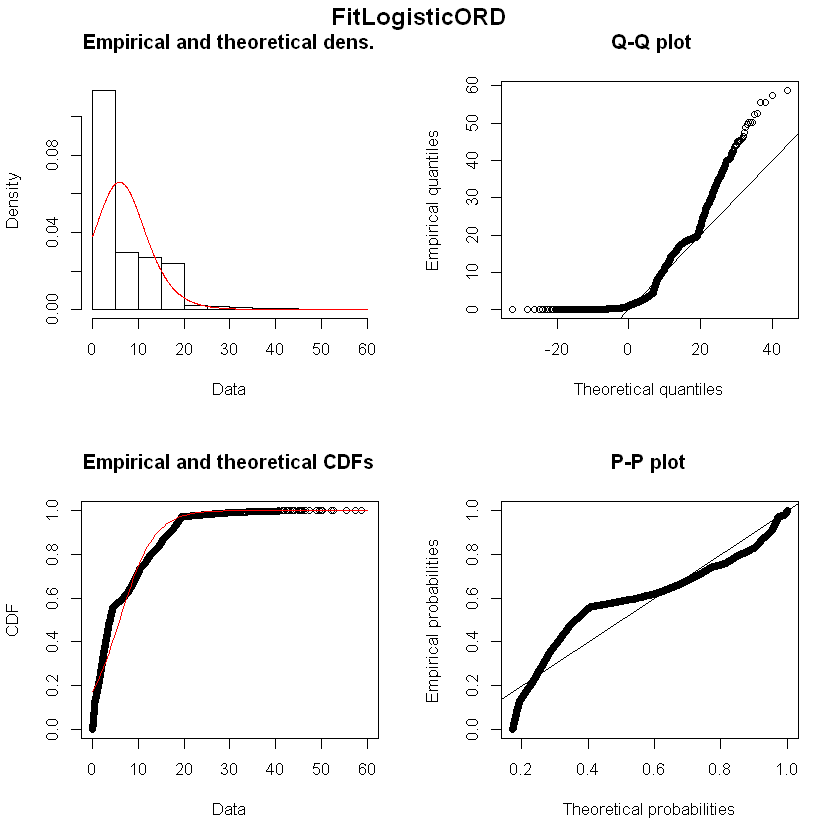

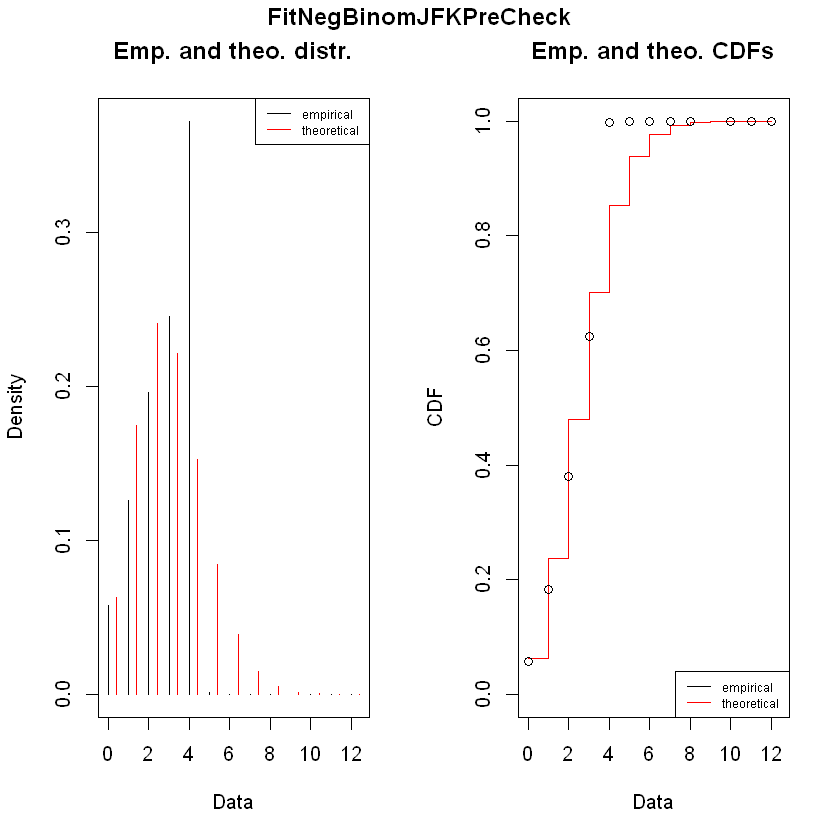

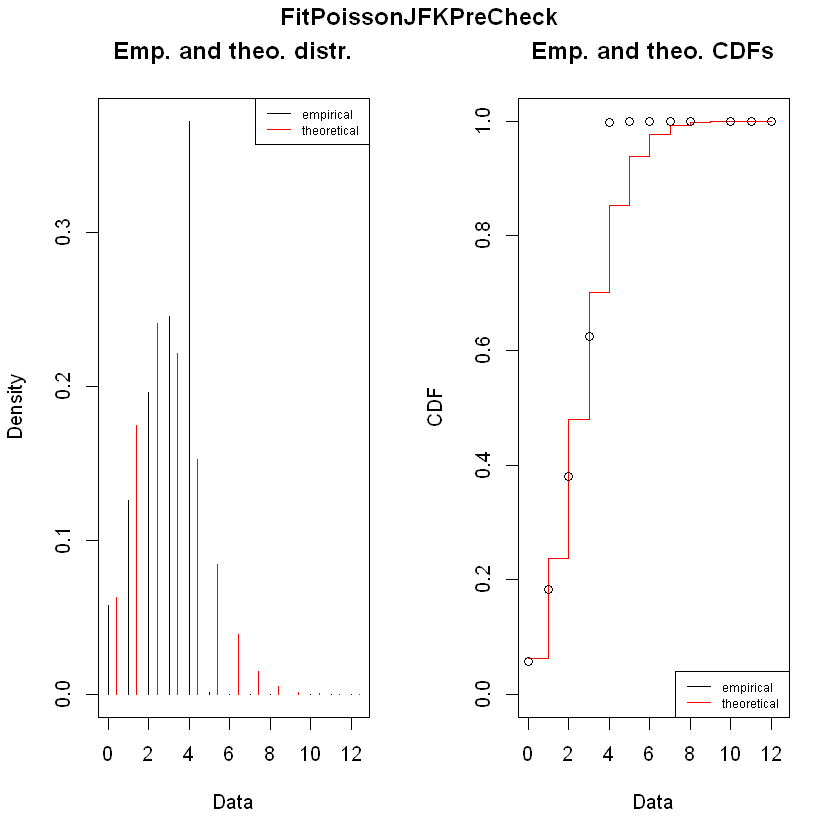

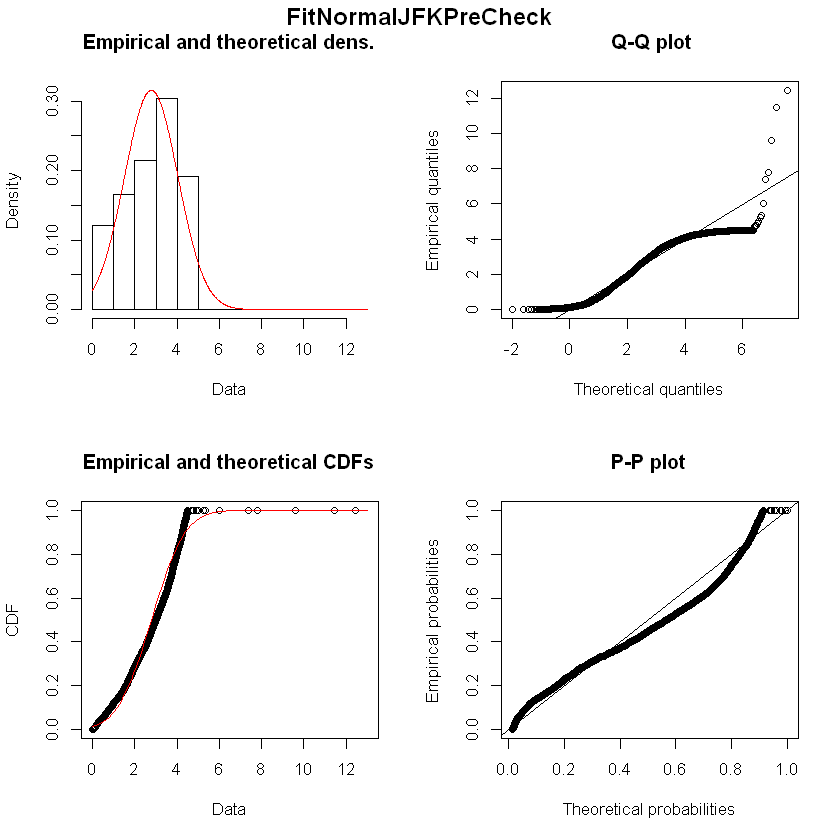

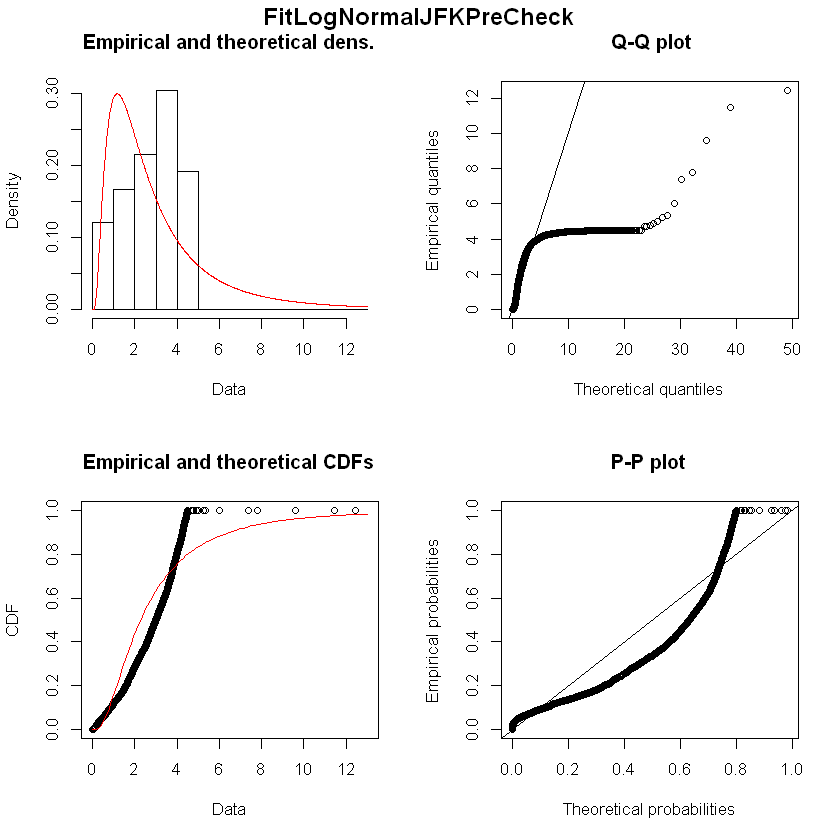

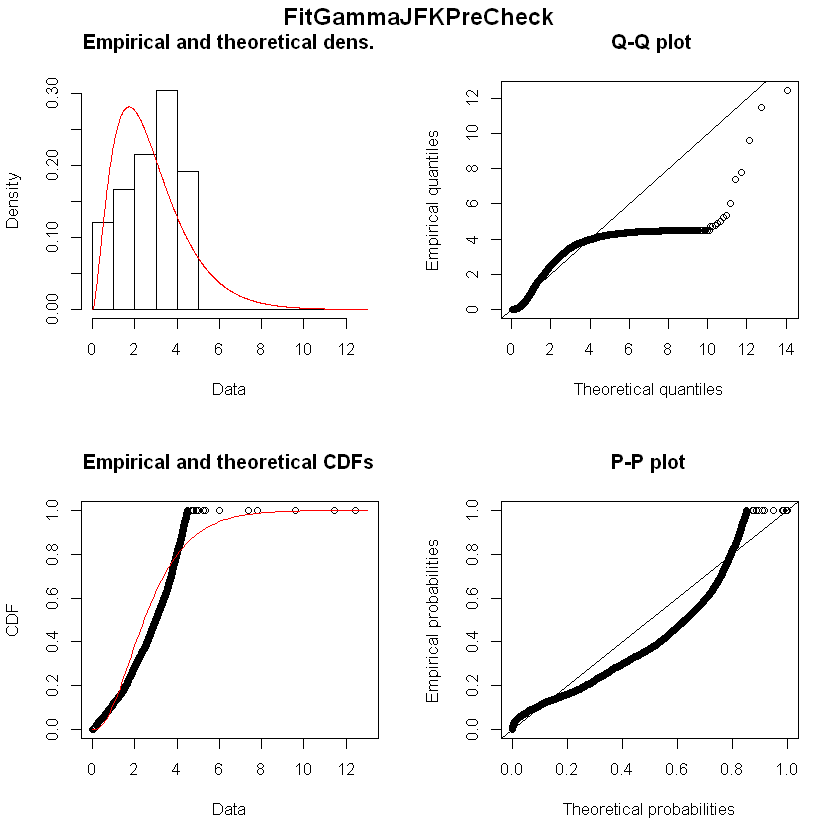

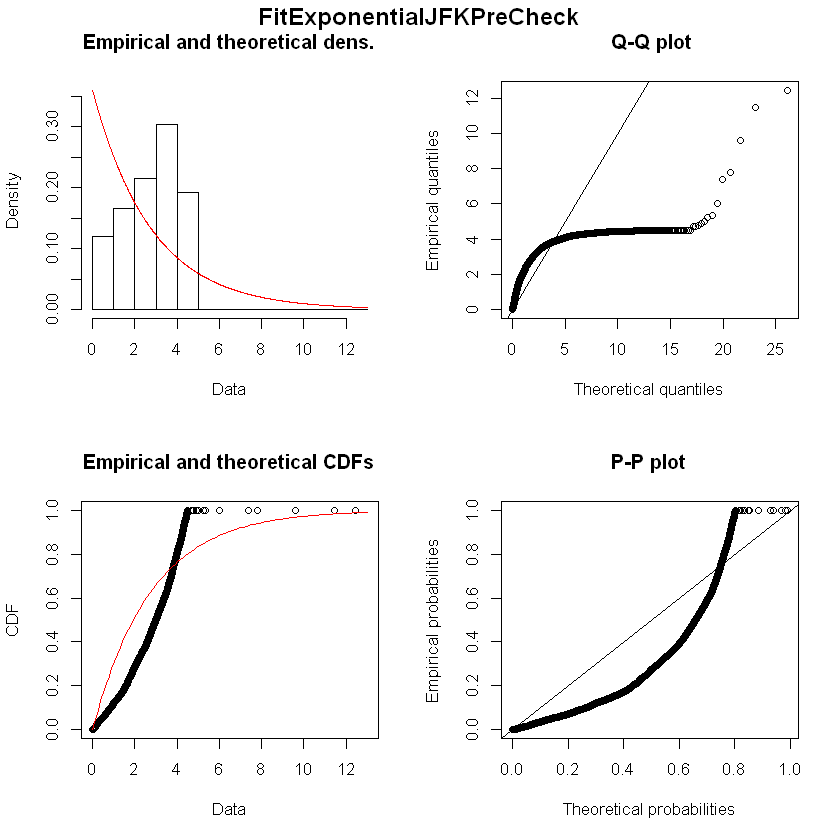

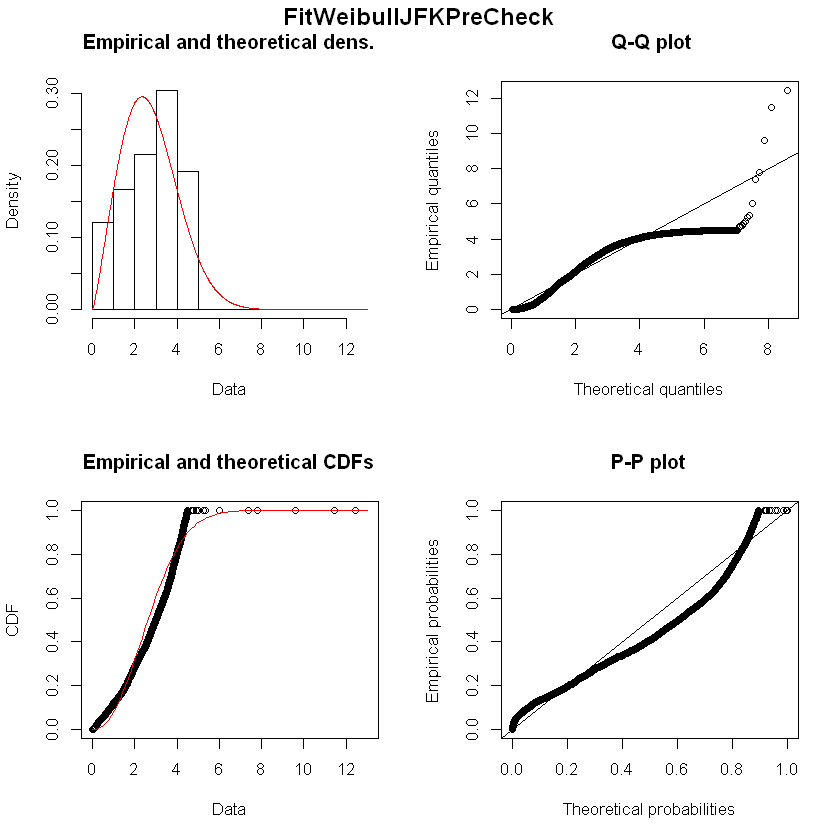

Fitting of the distribution ' nbinom ' by maximum likelihood 
Parameters : 
      estimate Std. Error
size  4.211188 0.10459631
mu   10.769040 0.07234139
Loglikelihood:  -23227.12   AIC:  46458.24   BIC:  46472.04 
Correlation matrix:
             size           mu
size 1.000000e+00 2.125795e-05
mu   2.125795e-05 1.000000e+00


Fitting of the distribution ' pois ' by maximum likelihood 
Parameters : 
       estimate Std. Error
lambda 10.76913 0.03835612
Loglikelihood:  -26805.46   AIC:  53612.92   BIC:  53619.82 

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
      estimate Std. Error
mean 10.773046 0.06558238
sd    5.611031 0.04637374
Loglikelihood:  -23011.69   AIC:  46027.37   BIC:  46041.17 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
meanlog 2.1475004 0.009728715
sdlog   0.8323597 0.006879196
Loglikelihood:  -24763.18   AIC:  49530.36   BIC:  49544.16 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate  Std. Error
shape 2.3319066 0.036126562
rate  0.2164309 0.003739781
Loglikelihood:  -23525.79   AIC:  47055.57   BIC:  47069.37 
Correlation matrix:
          shape      rate
shape 1.0000000 0.8965473
rate  0.8965473 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
       estimate  Std. Error
rate 0.09282426 0.001084815
Loglikelihood:  -24719.99   AIC:  49441.97   BIC:  49448.87 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape  1.890065 0.01813256
scale 12.016057 0.07748153
Loglikelihood:  -23065.55   AIC:  46135.11   BIC:  46148.91 
Correlation matrix:
        shape   scale
shape 1.00000 0.28305
scale 0.28305 1.00000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
          estimate Std. Error
location 10.745563 0.06583854
scale     3.214193 0.03102520
Loglikelihood:  -23074.77   AIC:  46153.53   BIC:  46167.33 
Correlation matrix:
            location       scale
location  1.00000000 -0.00571009
scale    -0.00571009  1.00000000


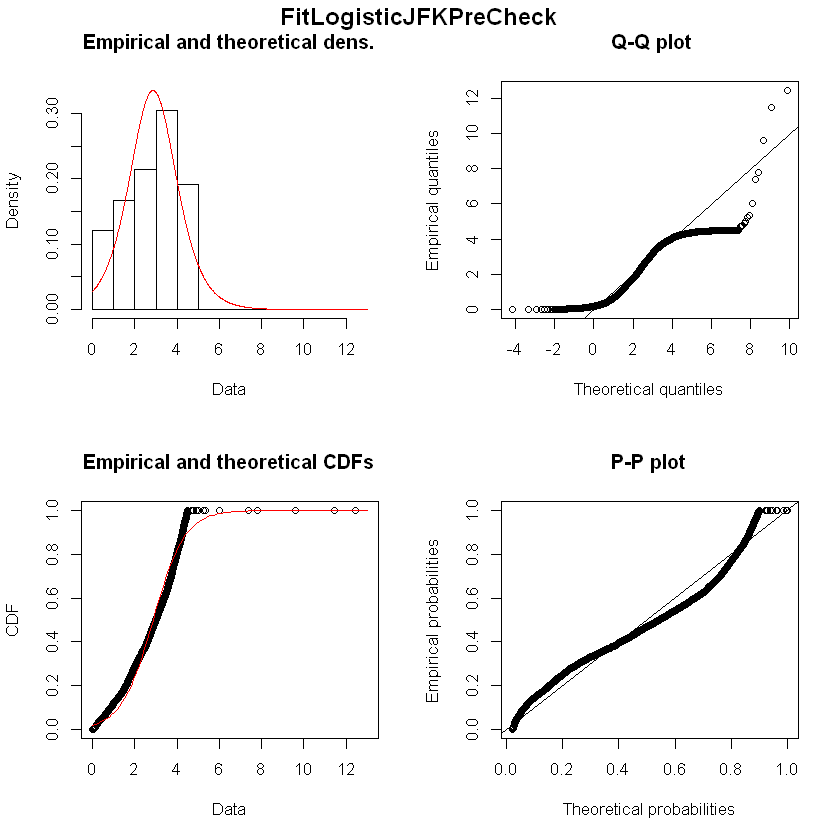

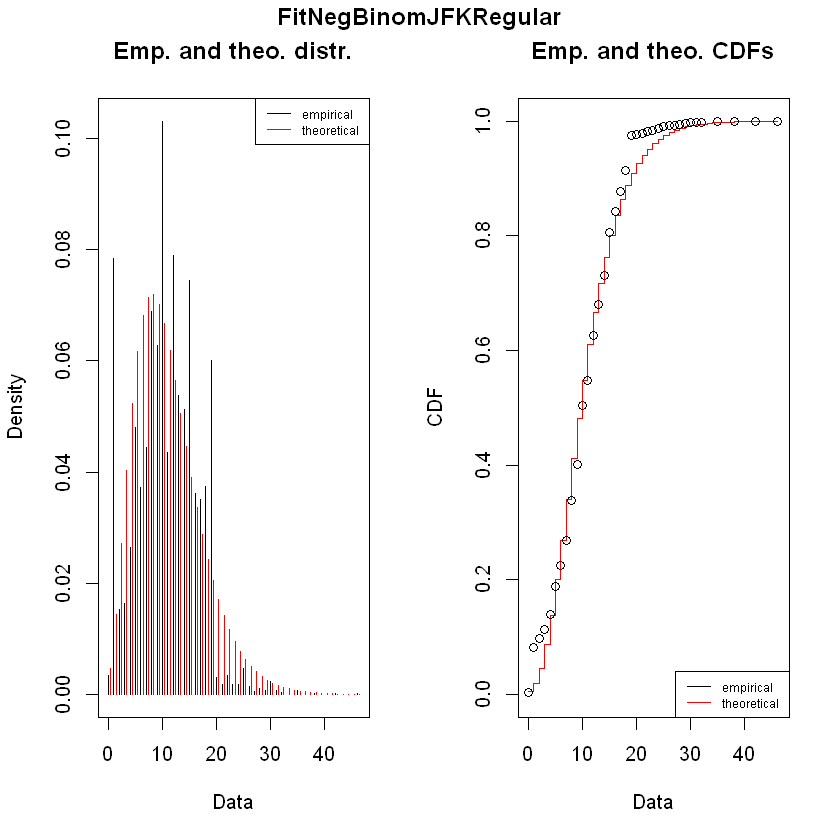

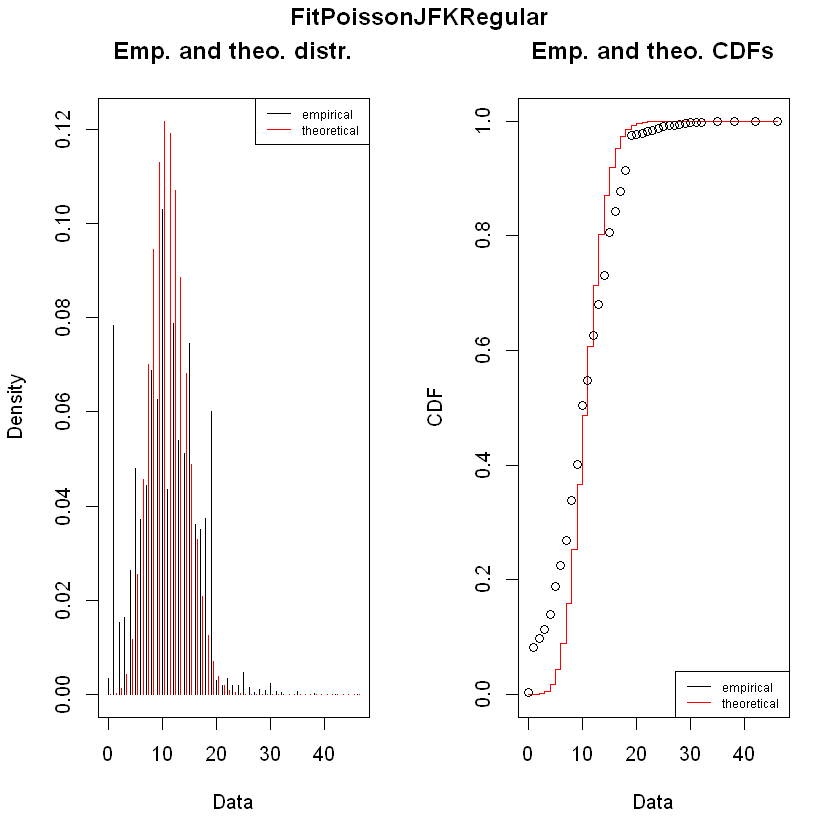

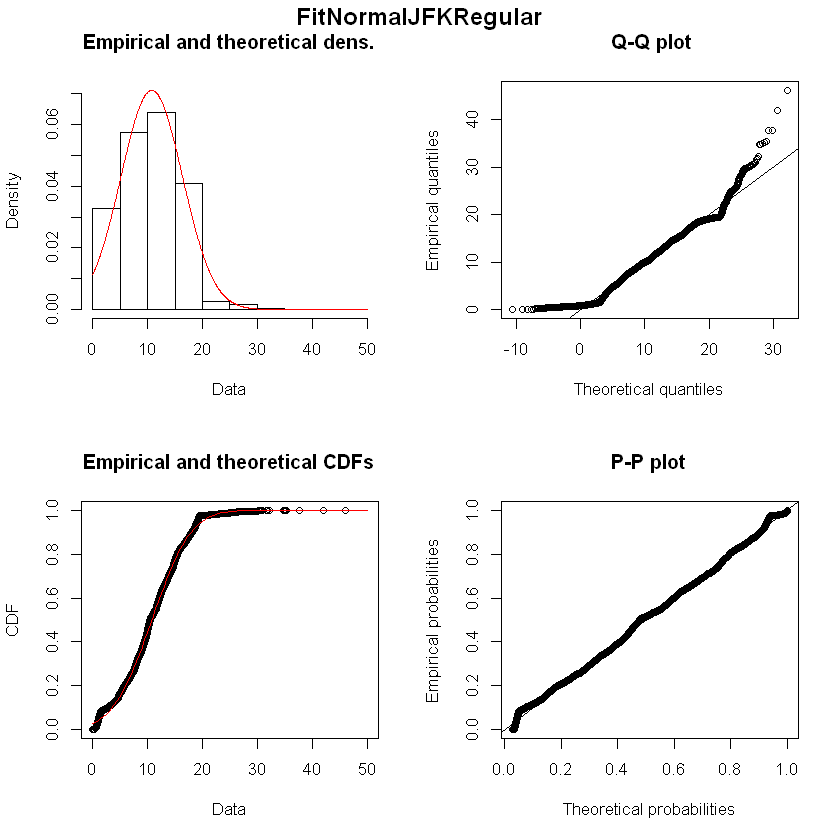

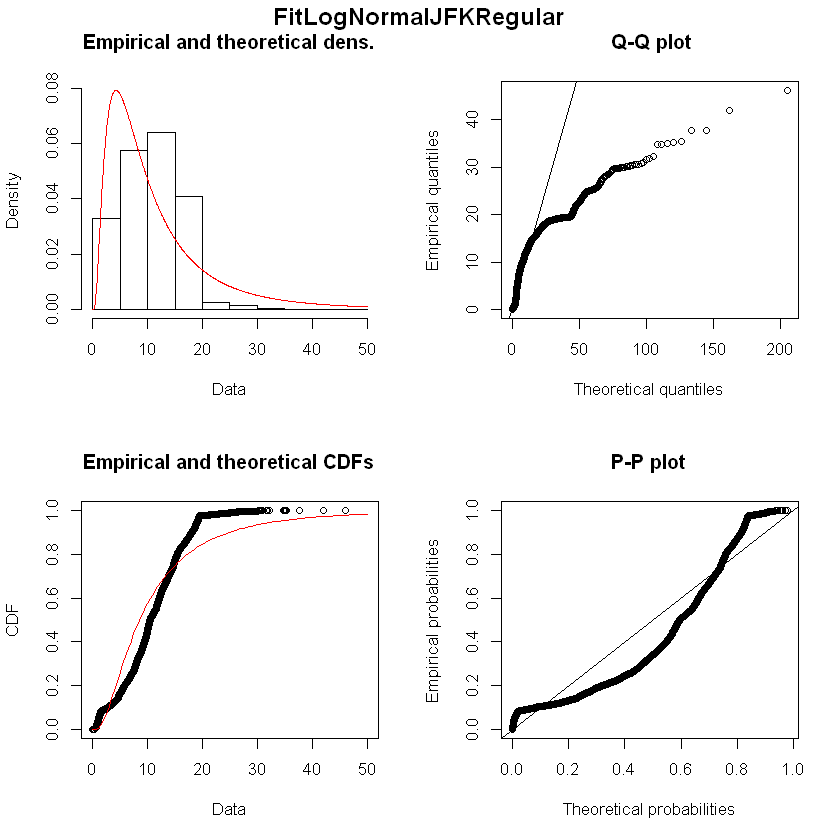

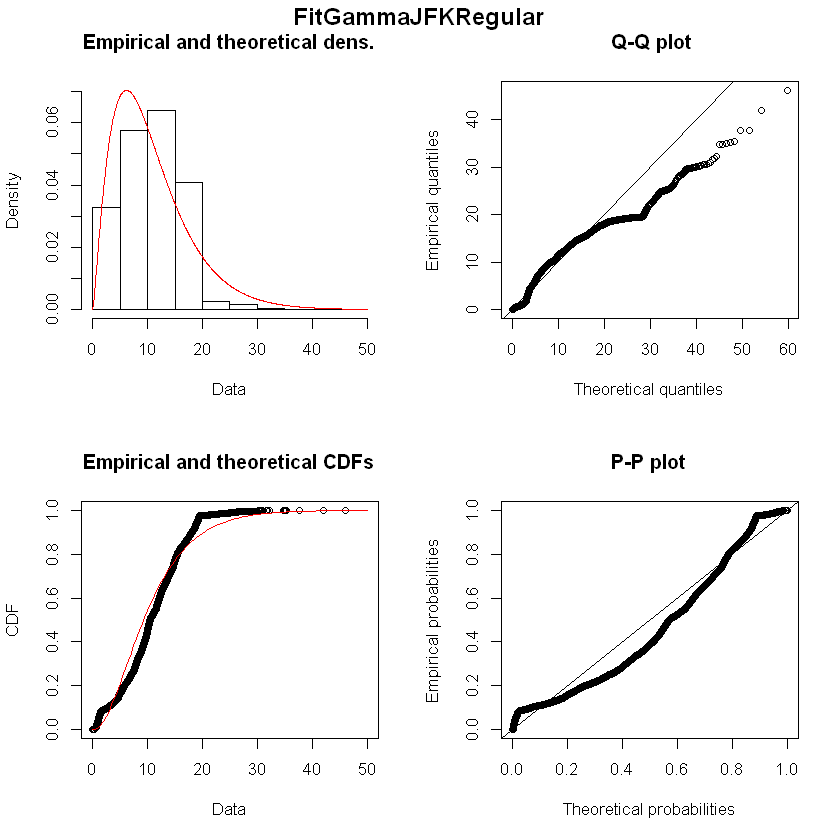

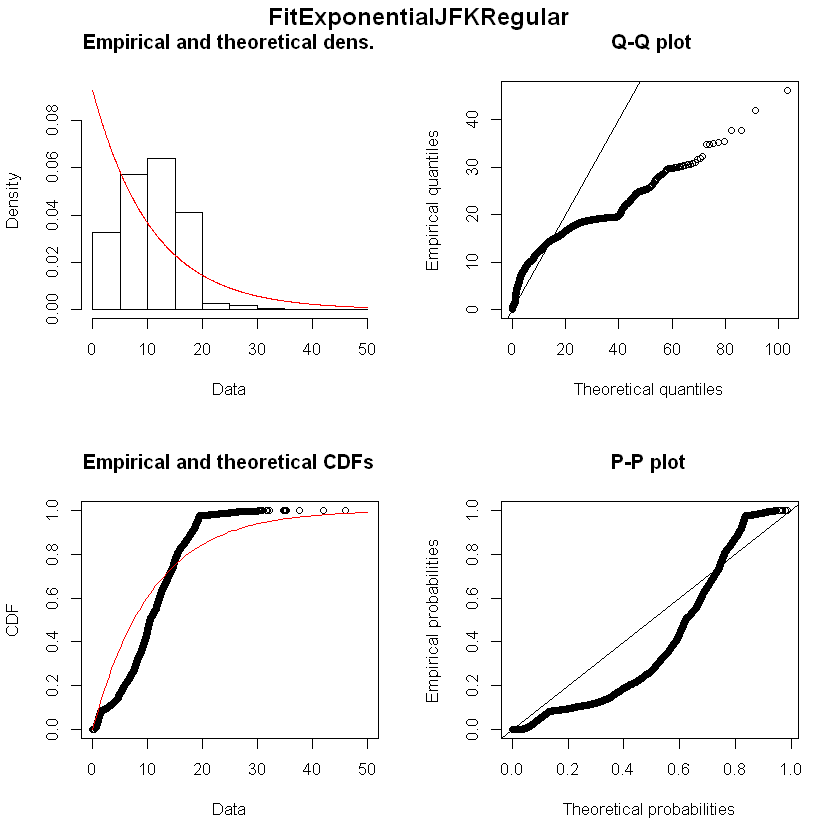

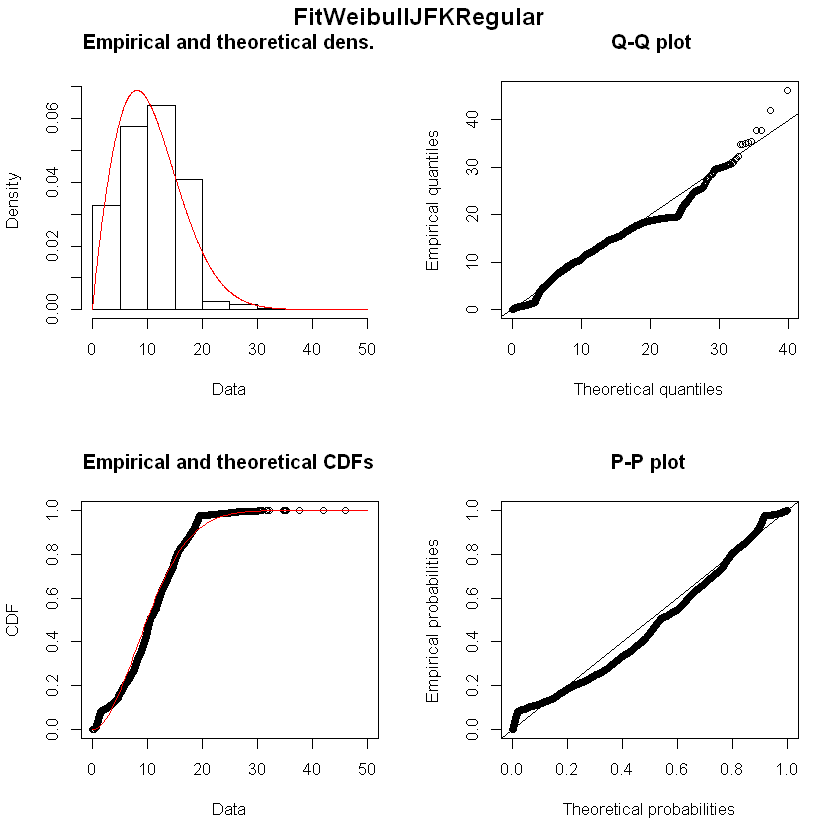

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
mean 1.6046301 0.005843891
sd   0.4516084 0.004132164
Loglikelihood:  -3726.52   AIC:  7457.041   BIC:  7470.43 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
meanlog 0.4107442 0.005281799
sdlog   0.4081706 0.003734695
Loglikelihood:  -5575.535   AIC:  11155.07   BIC:  11168.46 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
      estimate Std. Error
shape 8.208581 0.14726661
rate  5.115677 0.09464183
Loglikelihood:  -4762.045   AIC:  9528.09   BIC:  9541.48 
Correlation matrix:
          shape      rate
shape 1.0000000 0.9697418
rate  0.9697418 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
rate 0.6231966 0.008064251
Loglikelihood:  -8796.118   AIC:  17594.24   BIC:  17600.93 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
shape 4.393128 0.048467163
scale 1.759256 0.005374582
Loglikelihood:  -3630.501   AIC:  7265.002   BIC:  7278.391 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2653897
scale 0.2653897 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
location 1.6606747 0.005659200
scale    0.2505135 0.002711065
Loglikelihood:  -3674.49   AIC:  7352.98   BIC:  7366.369 
Correlation matrix:
           location      scale
location  1.0000000 -0.1060936
scale    -0.1060936  1.0000000


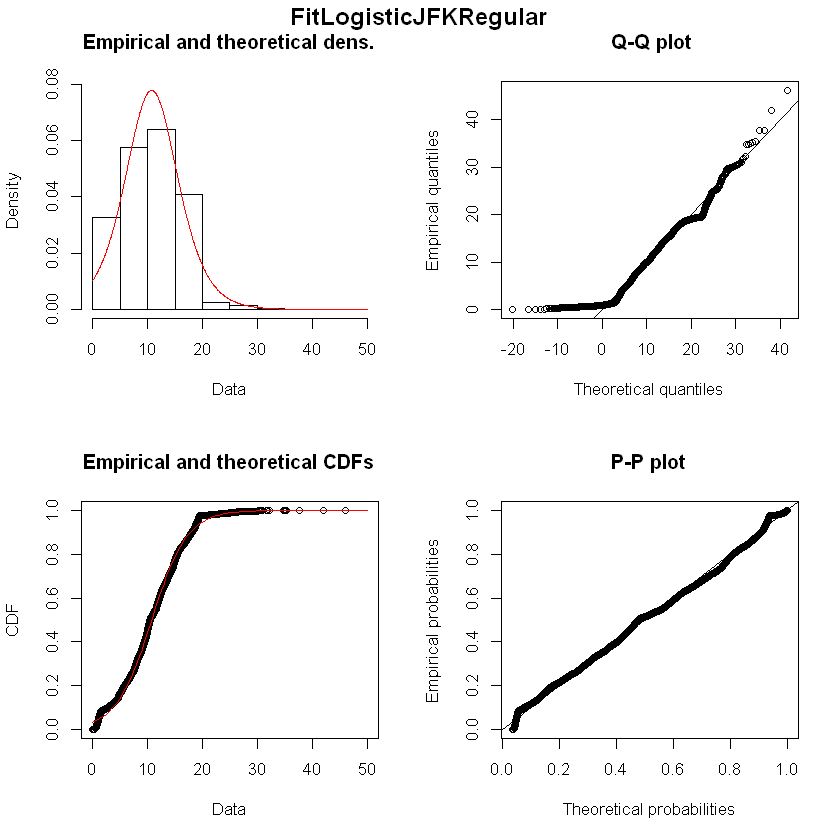

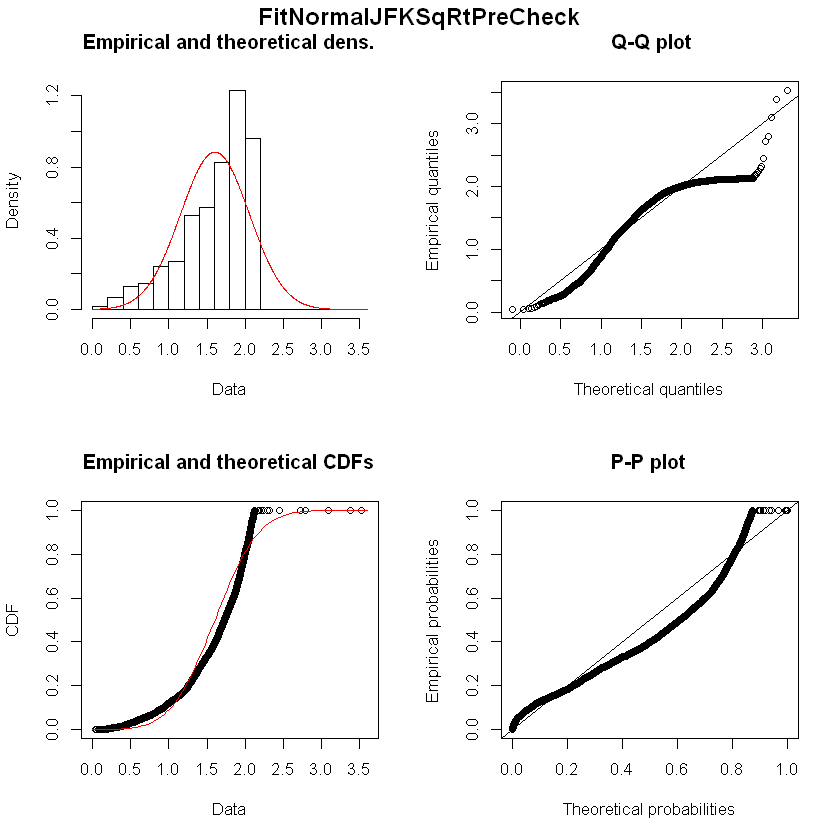

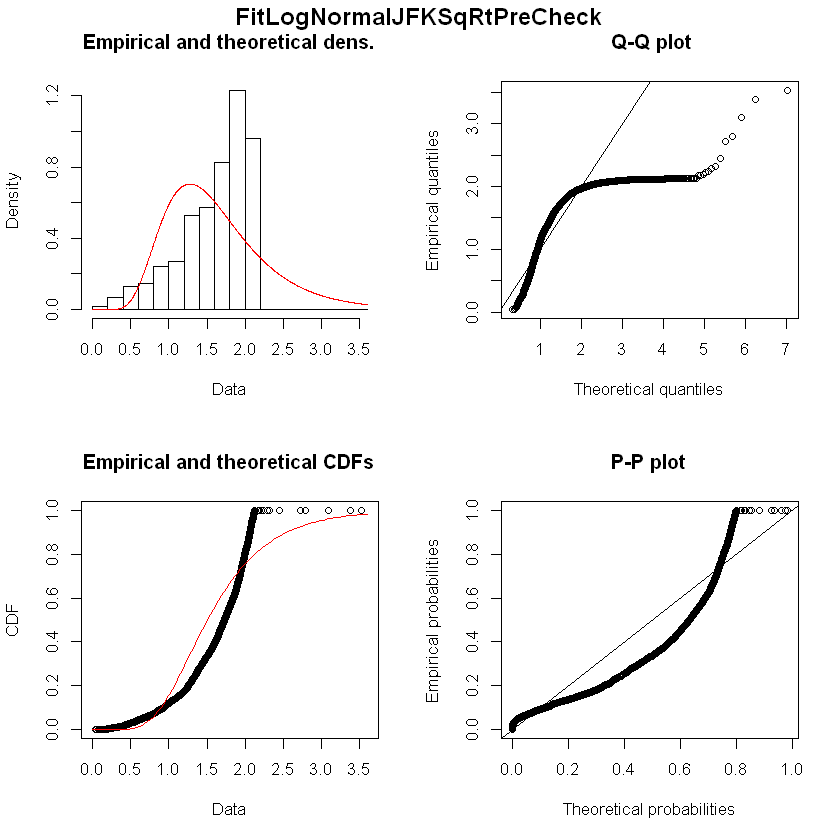

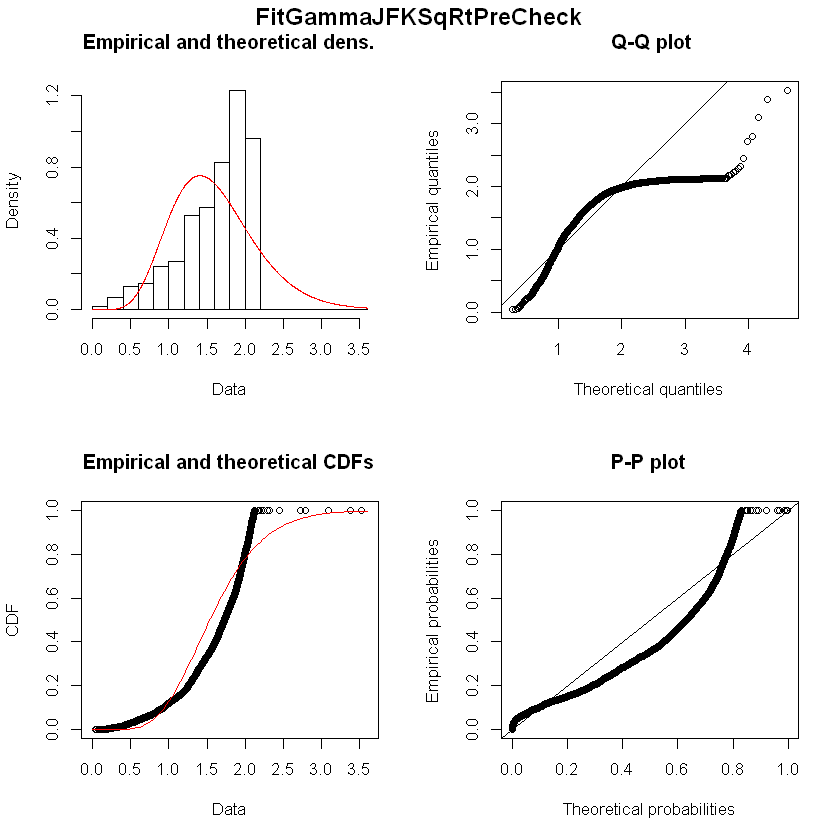

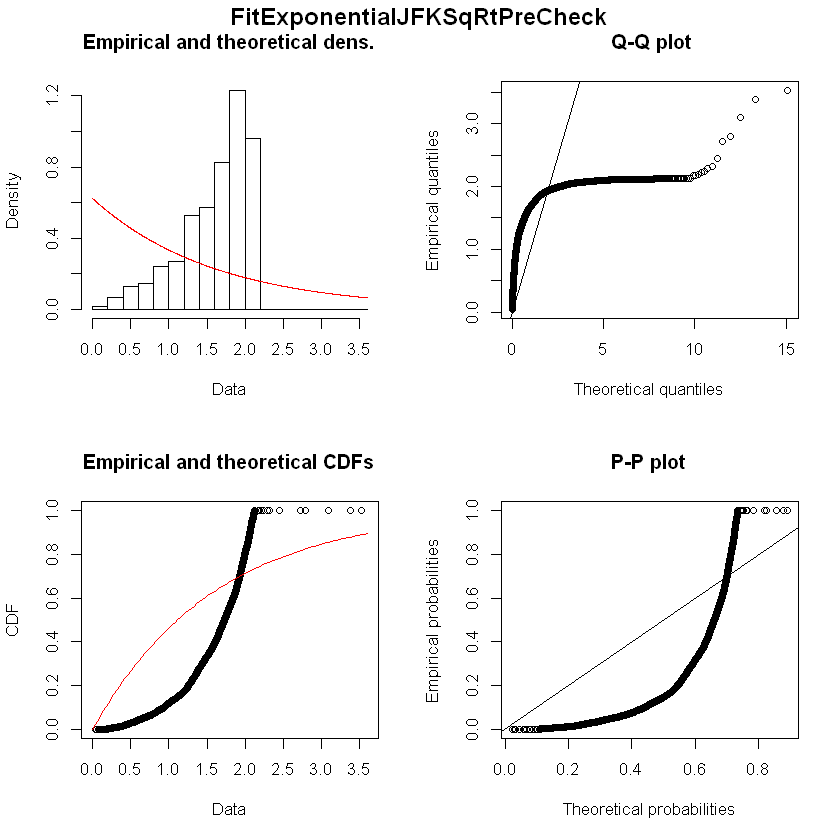

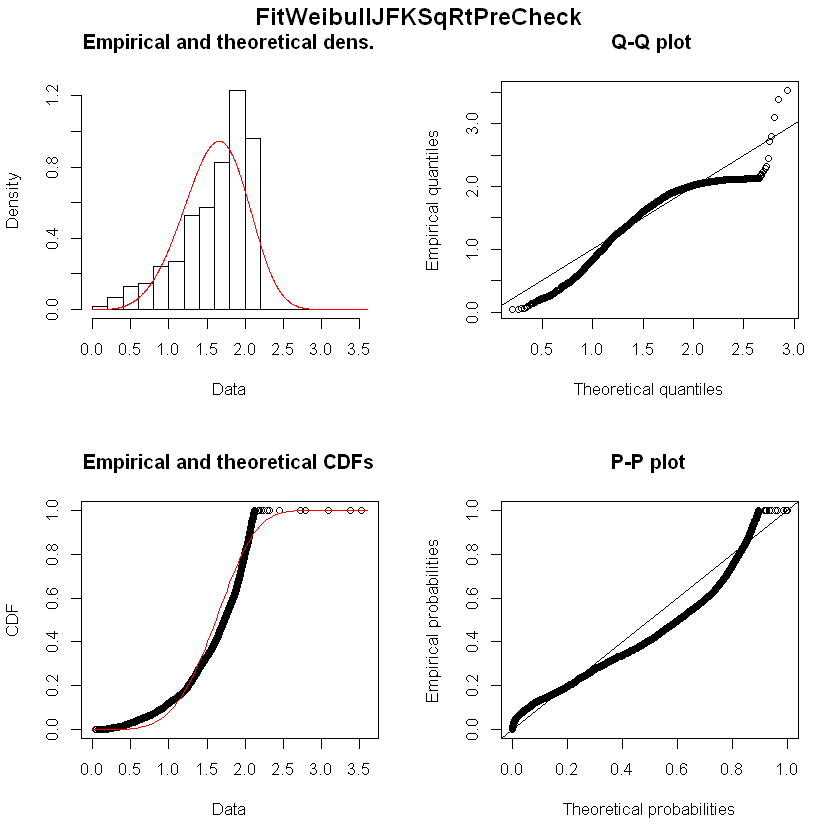

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
mean 3.1355222 0.011341369
sd   0.9703335 0.008019521
Loglikelihood:  -10166.18   AIC:  20336.37   BIC:  20350.17 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
meanlog 1.0737502 0.004864358
sdlog   0.4161798 0.003439531
Loglikelihood:  -11829.49   AIC:  23662.99   BIC:  23676.78 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
      estimate Std. Error
shape 7.403354  0.1197175
rate  2.361175  0.0395061
Loglikelihood:  -11083.5   AIC:  22171.01   BIC:  22184.81 
Correlation matrix:
          shape      rate
shape 1.0000000 0.9664804
rate  0.9664804 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
rate 0.3189261 0.003727609
Loglikelihood:  -15685.26   AIC:  31372.53   BIC:  31379.43 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
      estimate Std. Error
shape 3.780144 0.03626540
scale 3.466341 0.01117541
Loglikelihood:  -10131.87   AIC:  20267.73   BIC:  20281.53 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2831825
scale 0.2831825 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
location 3.2152369 0.010957449
scale    0.5406112 0.005309217
Loglikelihood:  -10140.09   AIC:  20284.19   BIC:  20297.98 
Correlation matrix:
            location       scale
location  1.00000000 -0.06533565
scale    -0.06533565  1.00000000


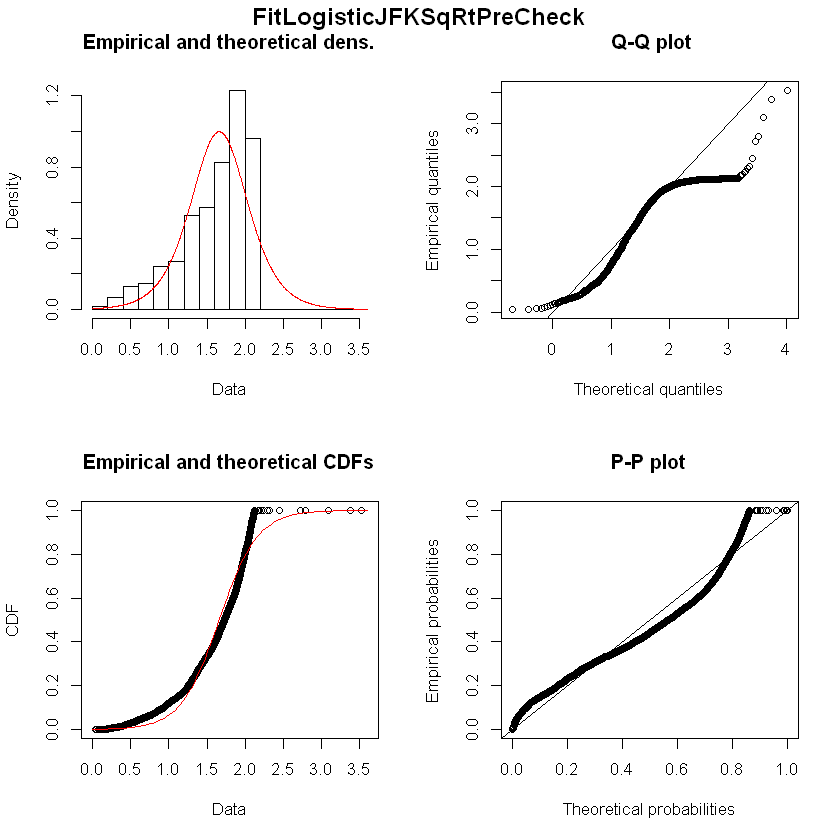

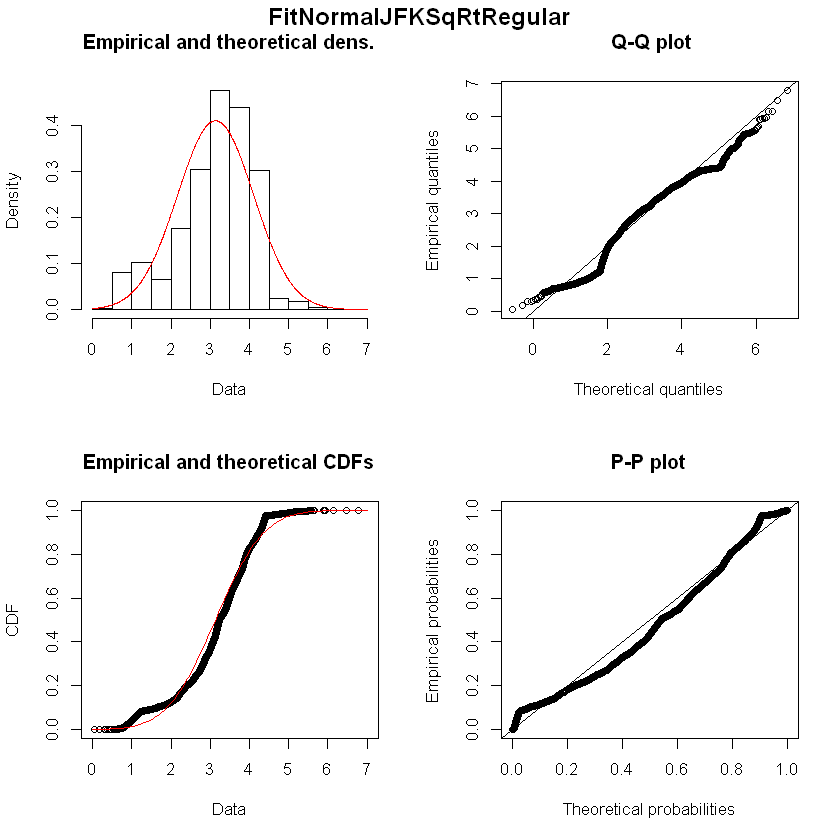

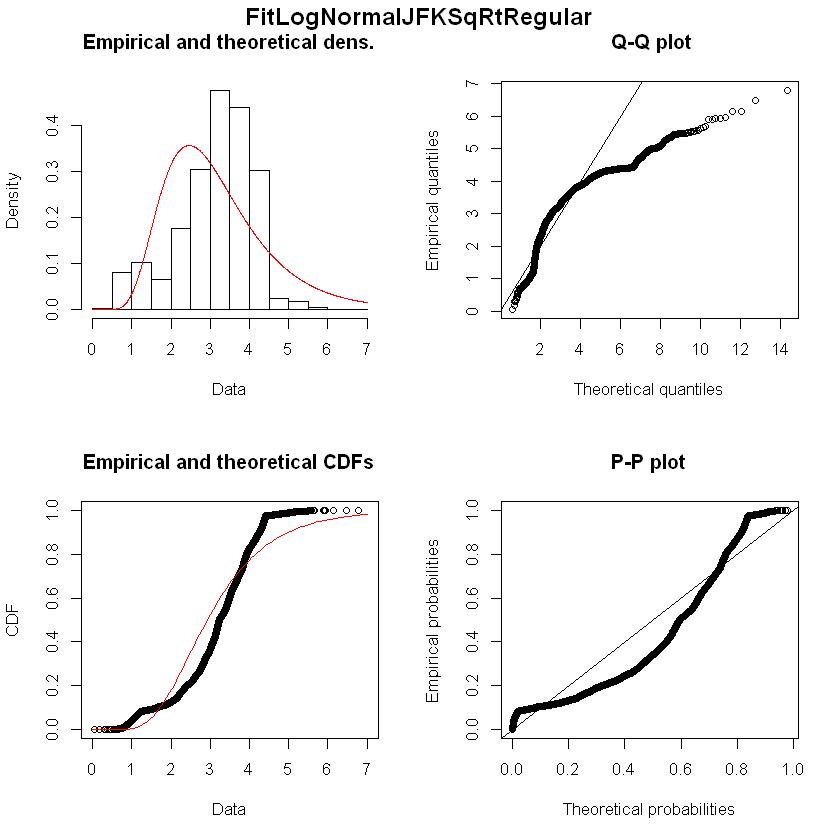

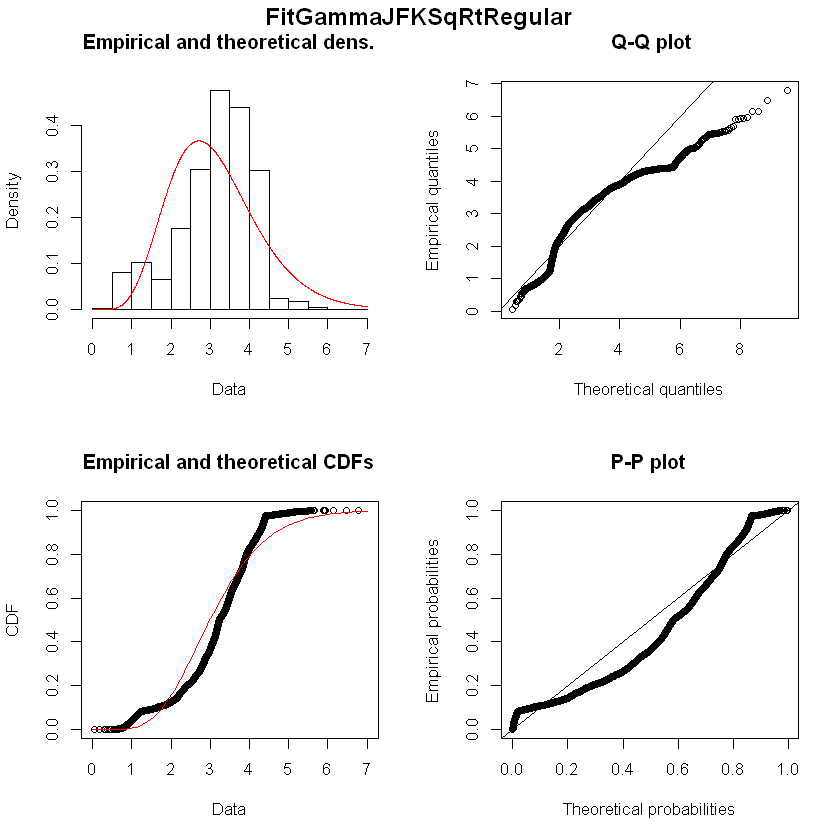

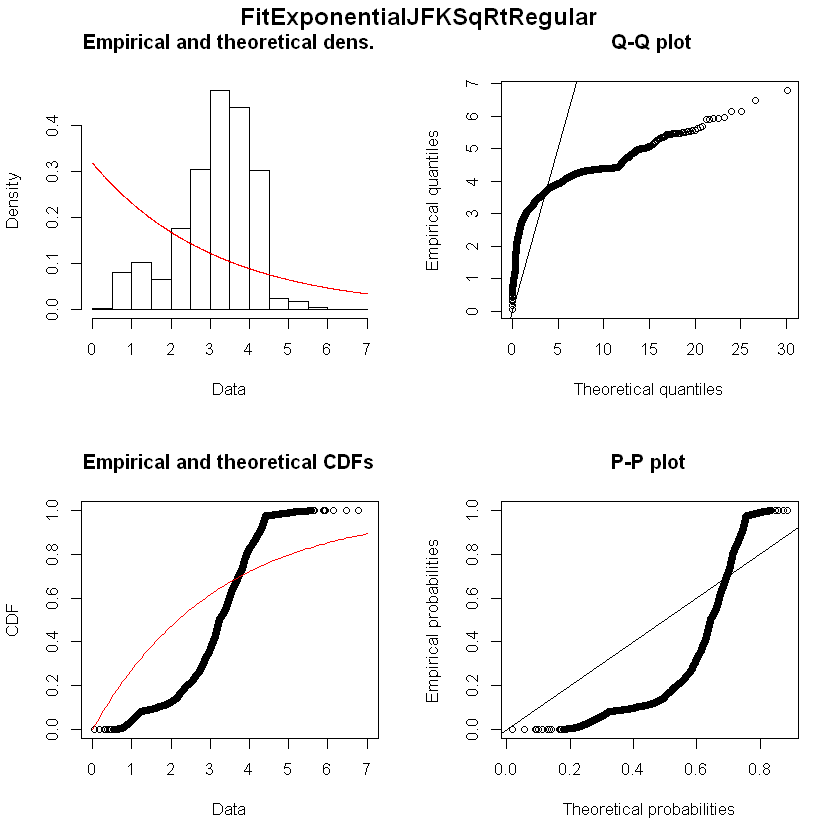

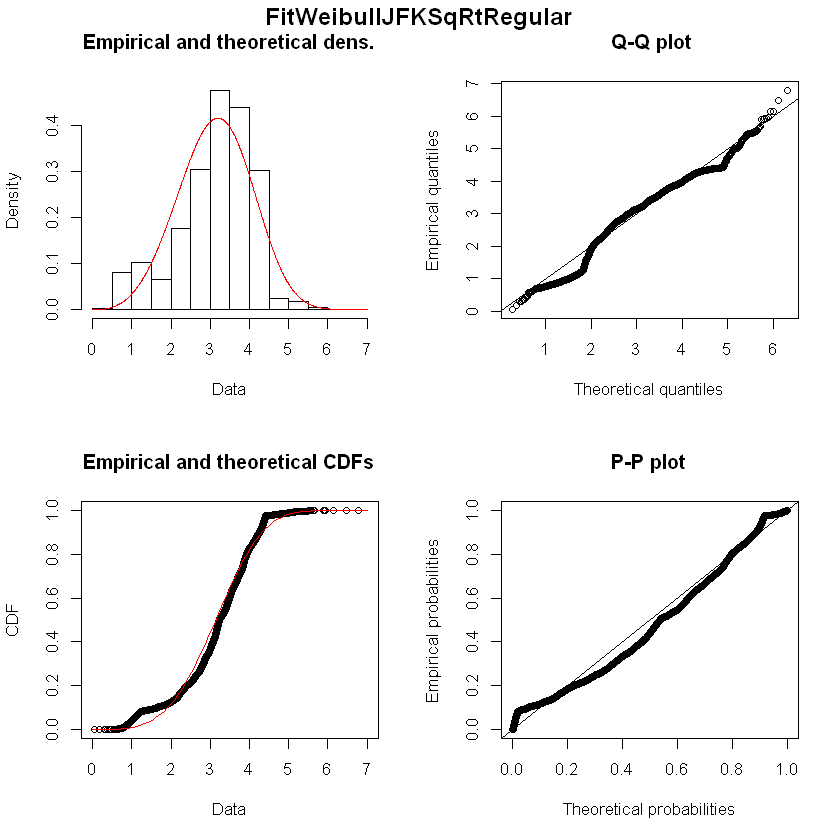

Warning message in sqrt(diag(varcovar)):
"NaNs produced"Warning message in sqrt(1/diag(V)):
"NaNs produced"Warning message in cov2cor(varcovar):
"diag(.) had 0 or NA entries; non-finite result is doubtful"

Fitting of the distribution ' nbinom ' by maximum likelihood 
Parameters : 
         estimate Std. Error
size 1.862208e+06        NaN
mu   2.420417e+00 0.02160485
Loglikelihood:  -8786.569   AIC:  17577.14   BIC:  17590.25 
Correlation matrix:
     size  mu
size    1 NaN
mu    NaN   1


Fitting of the distribution ' pois ' by maximum likelihood 
Parameters : 
       estimate Std. Error
lambda 2.420636 0.02160679
Loglikelihood:  -8786.568   AIC:  17575.14   BIC:  17581.69 

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
     estimate Std. Error
mean 2.435409 0.01800691
sd   1.296622 0.01273277
Loglikelihood:  -8704.066   AIC:  17412.13   BIC:  17425.24 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
meanlog 0.6579846 0.011954644
sdlog   0.8608174 0.008453158
Loglikelihood:  -9991.756   AIC:  19987.51   BIC:  20000.62 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape 2.3068076 0.04243880
rate  0.9472372 0.01946018
Loglikelihood:  -8972.017   AIC:  17948.03   BIC:  17961.14 
Correlation matrix:
          shape      rate
shape 1.0000000 0.8954942
rate  0.8954942 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
rate 0.4106087 0.005702315
Loglikelihood:  -9800.244   AIC:  19602.49   BIC:  19609.04 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
      estimate Std. Error
shape 1.844266 0.02042952
scale 2.713363 0.02131624
Loglikelihood:  -8675.699   AIC:  17355.4   BIC:  17368.5 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2847905
scale 0.2847905 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
location 2.4317475 0.018327536
scale    0.7455517 0.008436512
Loglikelihood:  -8715.684   AIC:  17435.37   BIC:  17448.48 
Correlation matrix:
             location        scale
location  1.000000000 -0.003440243
scale    -0.003440243  1.000000000


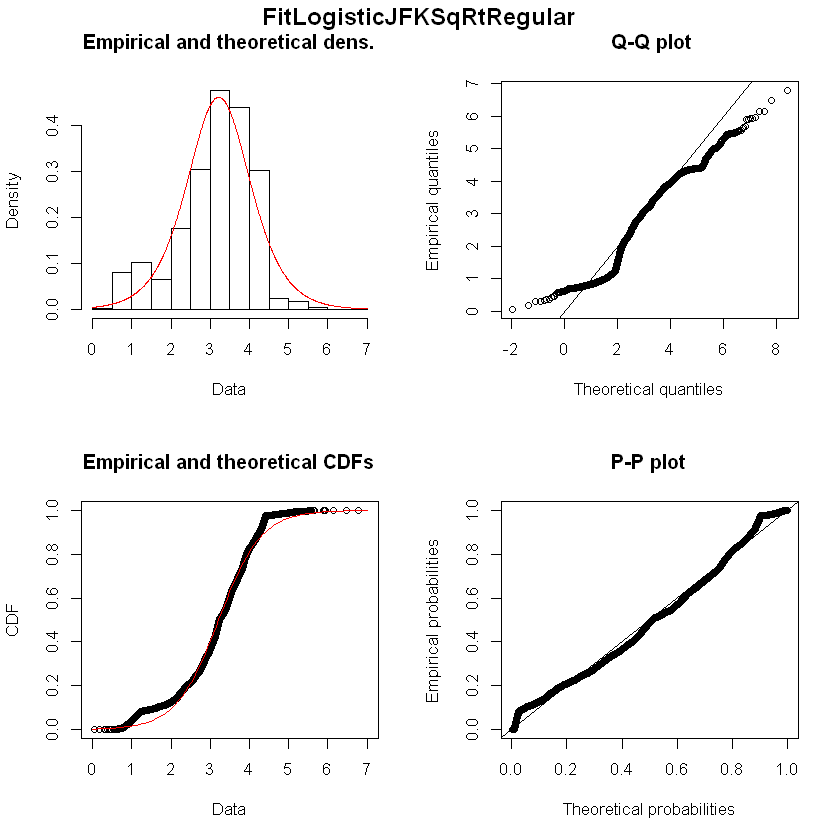

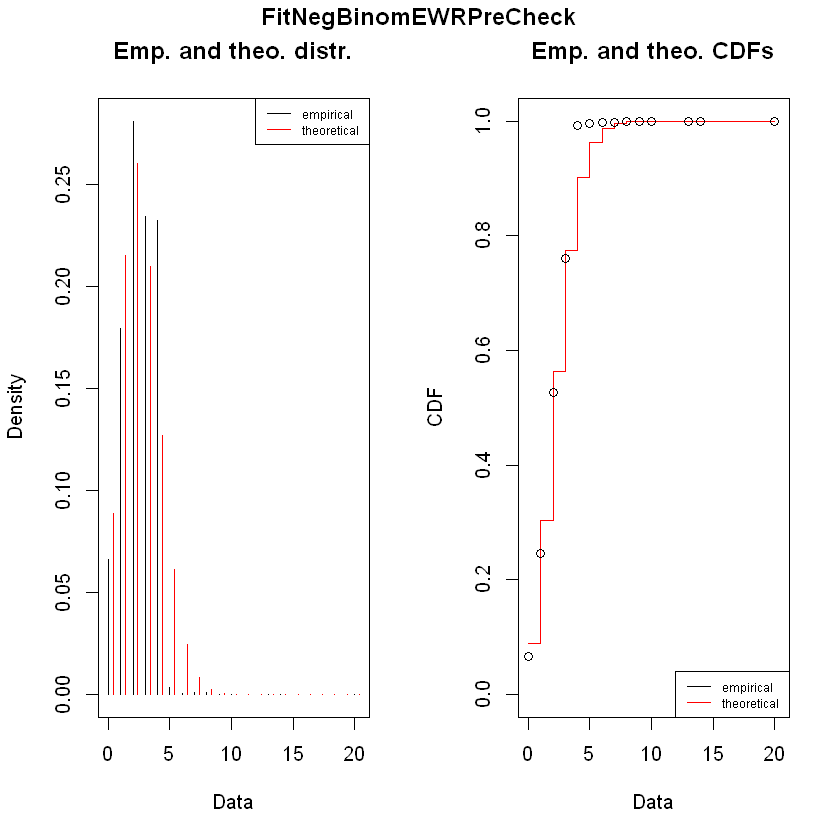

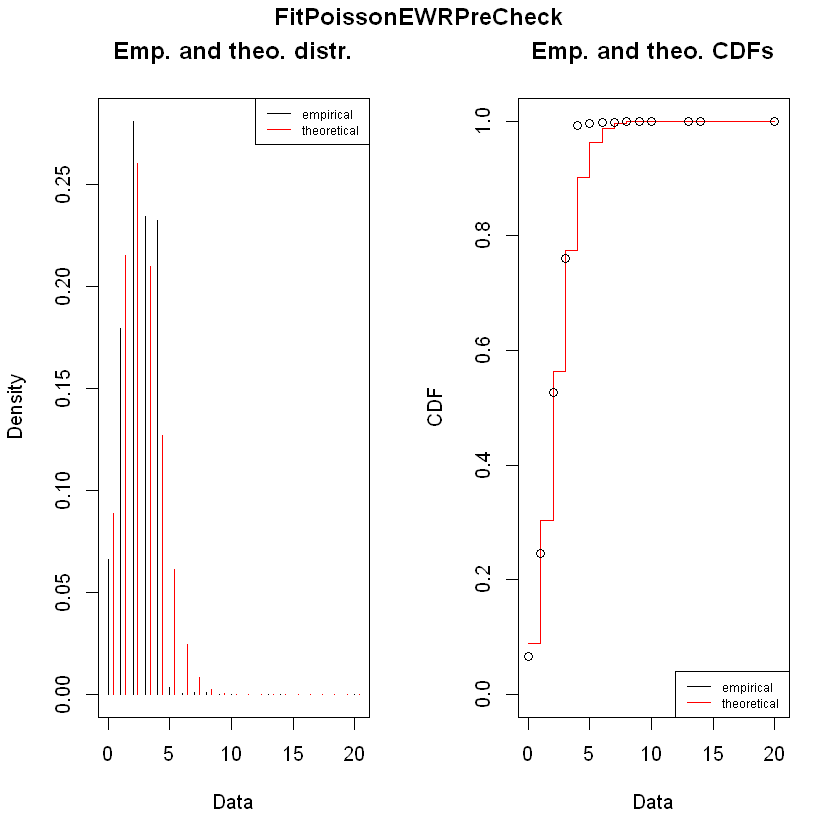

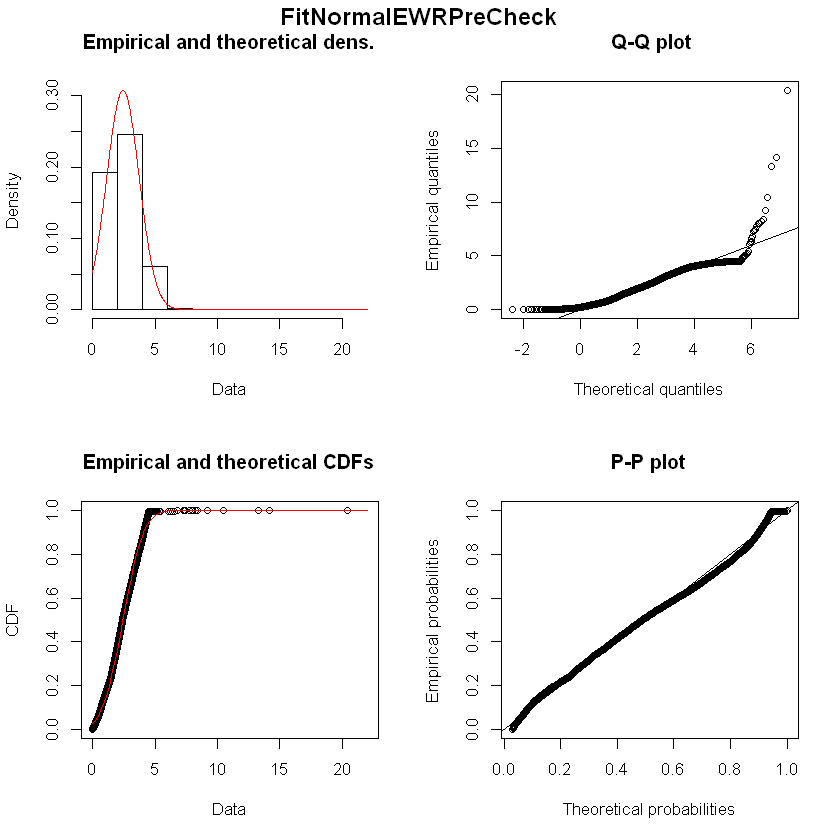

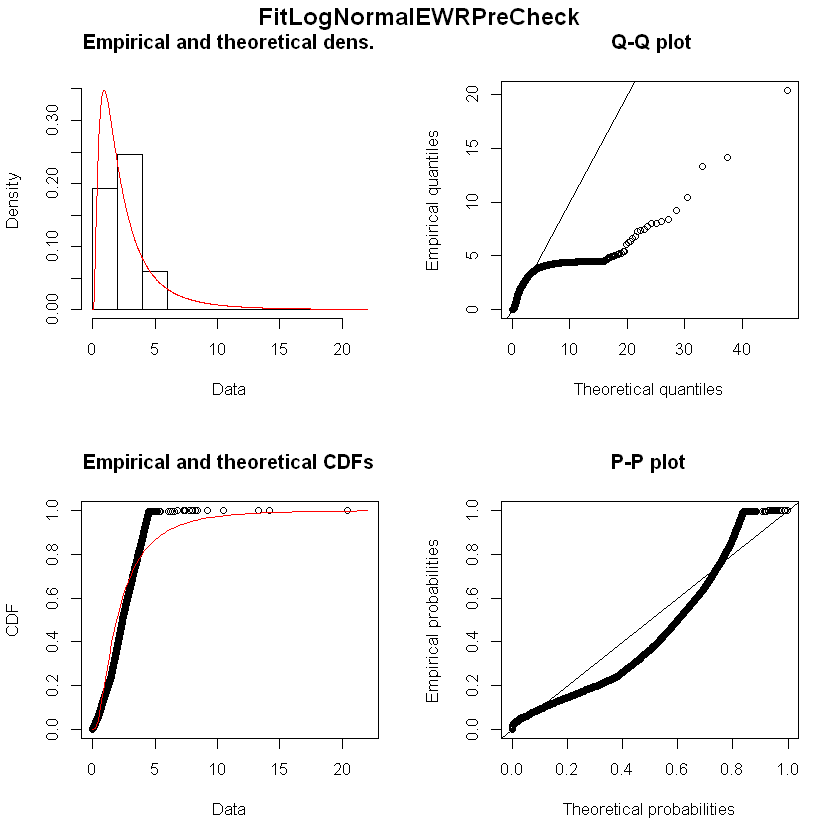

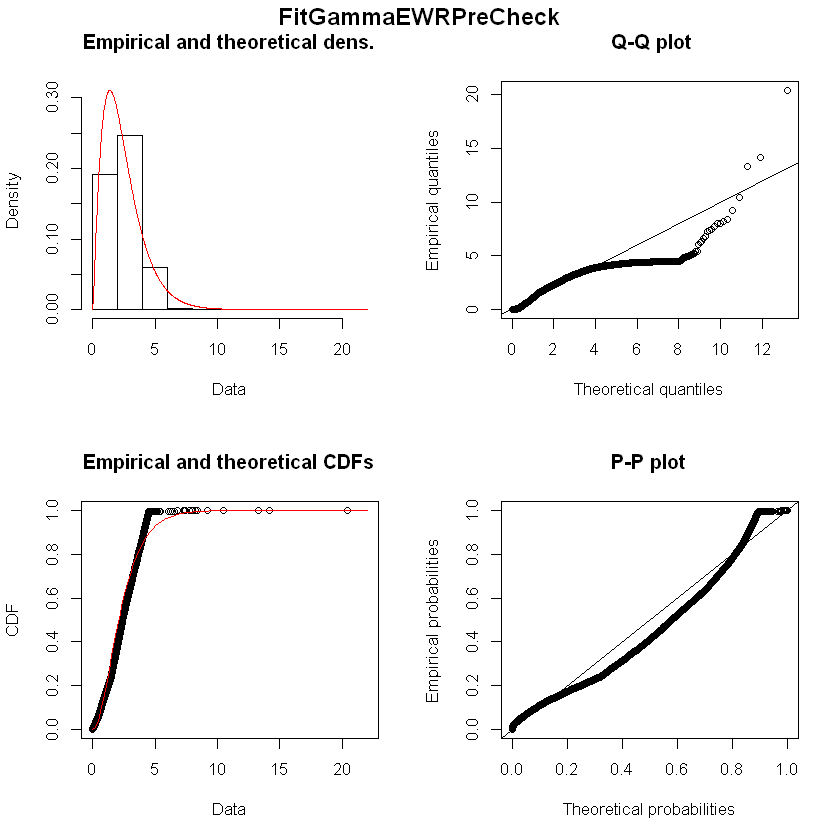

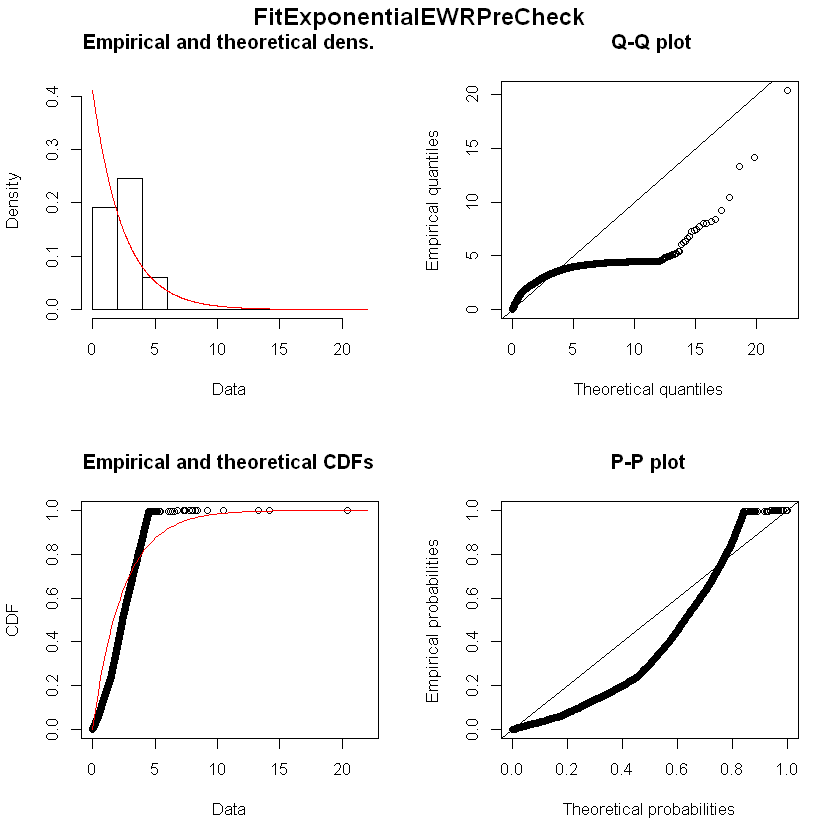

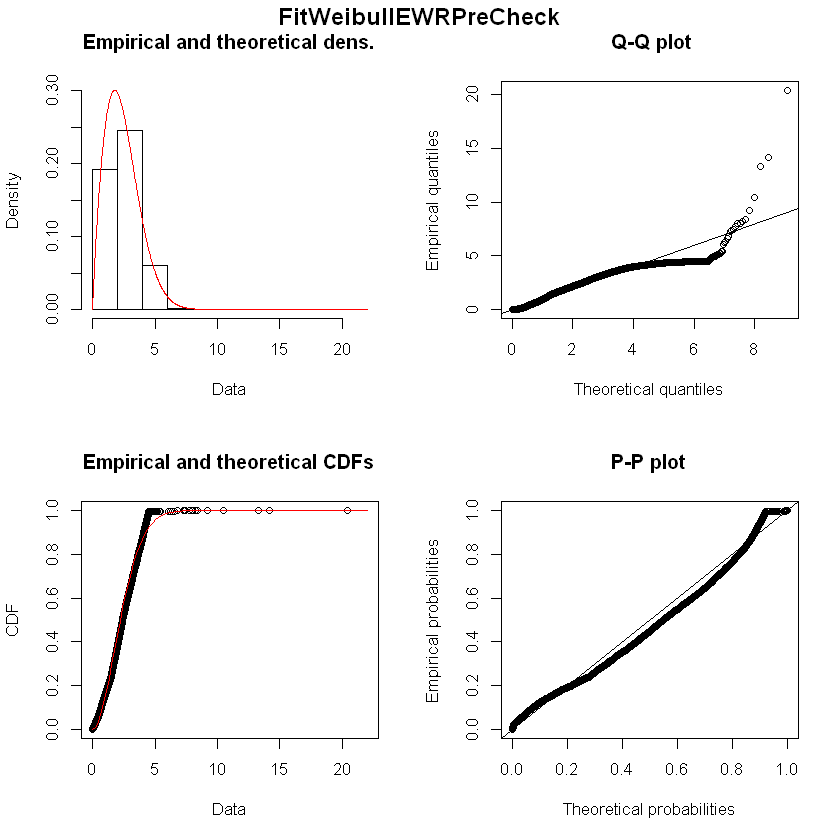

Fitting of the distribution ' nbinom ' by maximum likelihood 
Parameters : 
     estimate Std. Error
size 1.198789 0.02498099
mu   9.924318 0.11293745
Loglikelihood:  -24095.38   AIC:  48194.75   BIC:  48208.52 
Correlation matrix:
             size           mu
size 1.0000000000 0.0003008791
mu   0.0003008791 1.0000000000


Fitting of the distribution ' pois ' by maximum likelihood 
Parameters : 
       estimate Std. Error
lambda 9.926147 0.03708617
Loglikelihood:  -35101.42   AIC:  70204.84   BIC:  70211.72 

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
     estimate Std. Error
mean 9.962964 0.08017744
sd   6.811308 0.05669400
Loglikelihood:  -24086.9   AIC:  48177.8   BIC:  48191.57 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
        estimate Std. Error
meanlog 1.635544 0.01910441
sdlog   1.622975 0.01350883
Loglikelihood:  -25539.11   AIC:  51082.23   BIC:  51096 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
        estimate  Std. Error
shape 0.88330577 0.012801870
rate  0.08863848 0.001697581
Loglikelihood:  -23770.11   AIC:  47544.21   BIC:  47557.98 
Correlation matrix:
          shape      rate
shape 1.0000000 0.7565924
rate  0.7565924 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
rate 0.1003717 0.001181381
Loglikelihood:  -23807.98   AIC:  47617.96   BIC:  47624.84 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape  1.031367 0.01086845
scale 10.052667 0.11894963
Loglikelihood:  -23803.68   AIC:  47611.36   BIC:  47625.13 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2647085
scale 0.2647085 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
          estimate Std. Error
location 10.149532 0.08390706
scale     4.021248 0.03869863
Loglikelihood:  -24283.92   AIC:  48571.84   BIC:  48585.61 
Correlation matrix:
            location       scale
location  1.00000000 -0.05332685
scale    -0.05332685  1.00000000


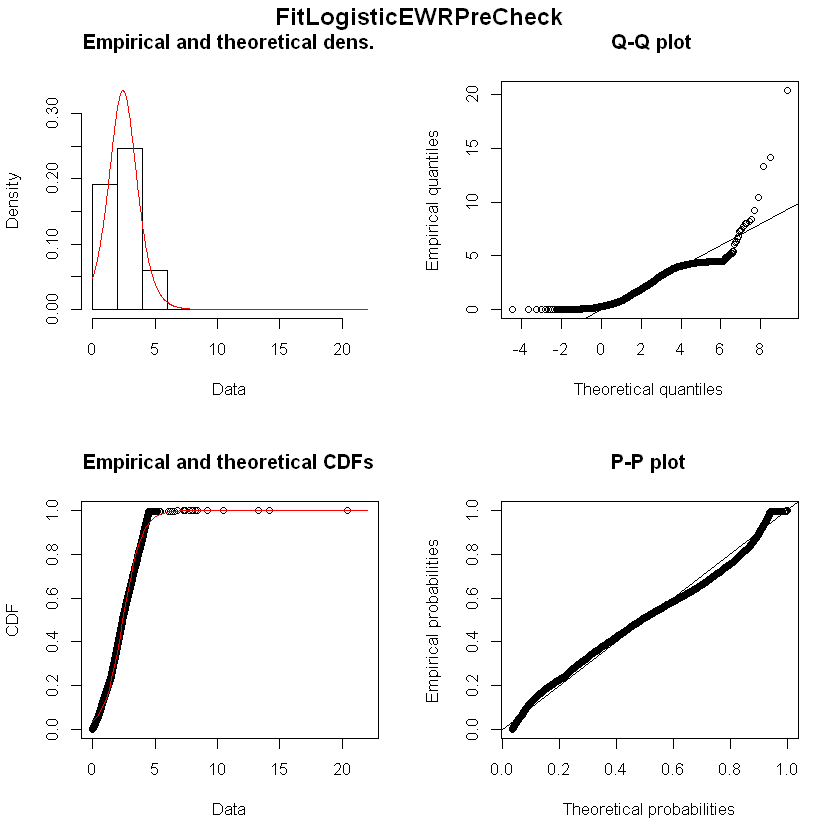

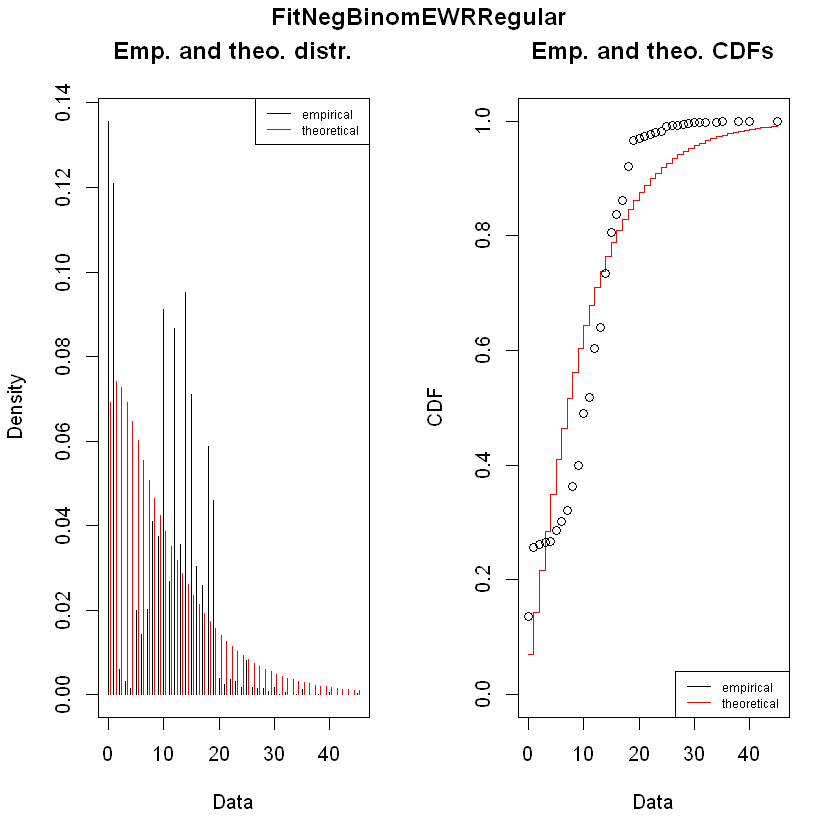

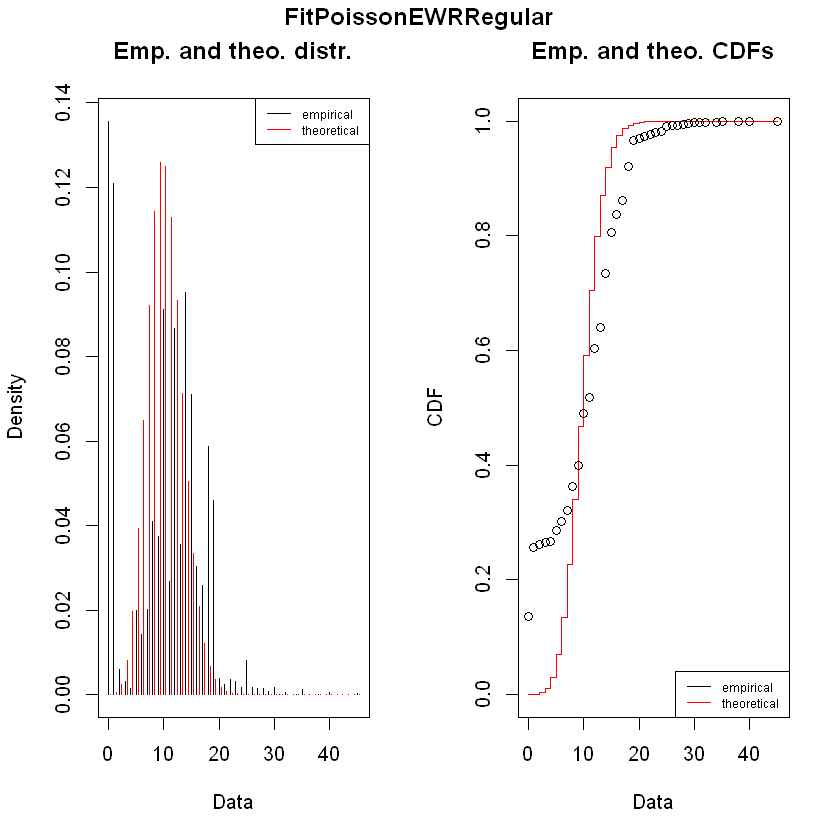

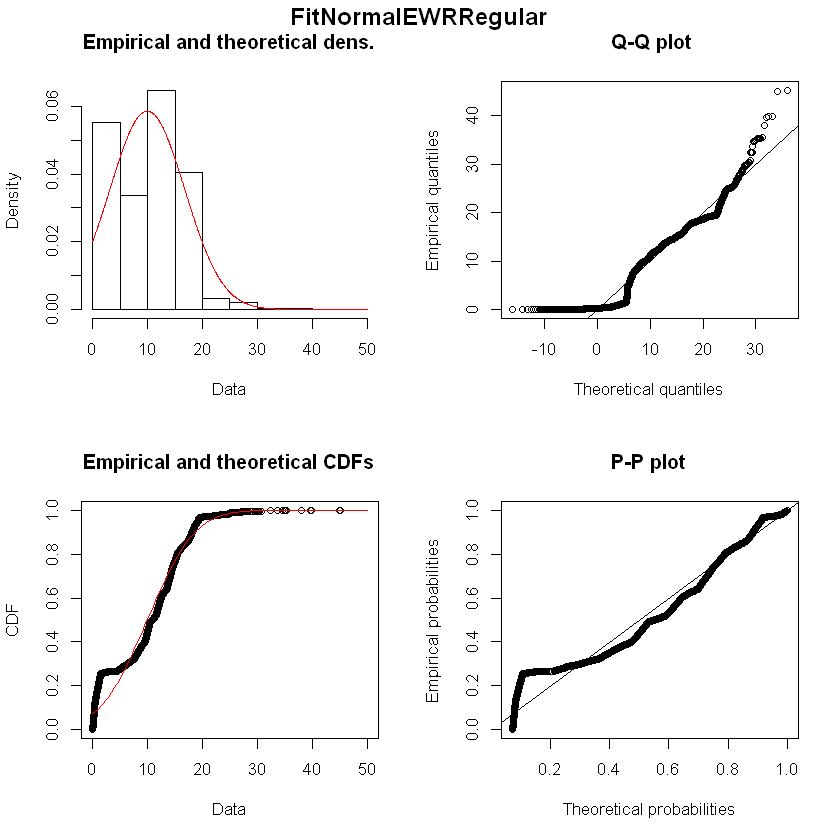

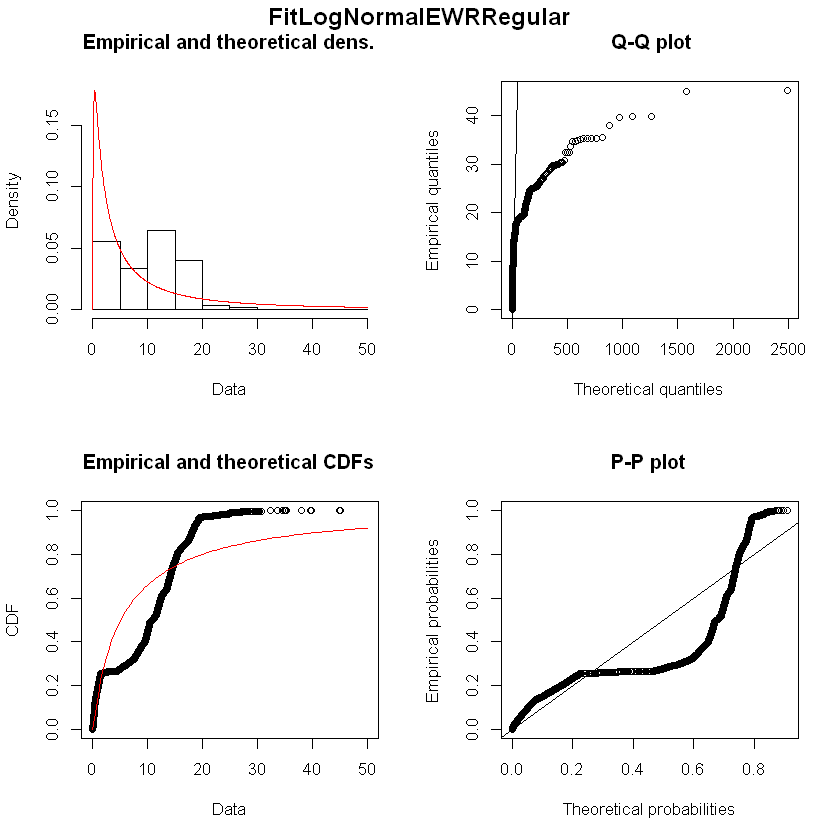

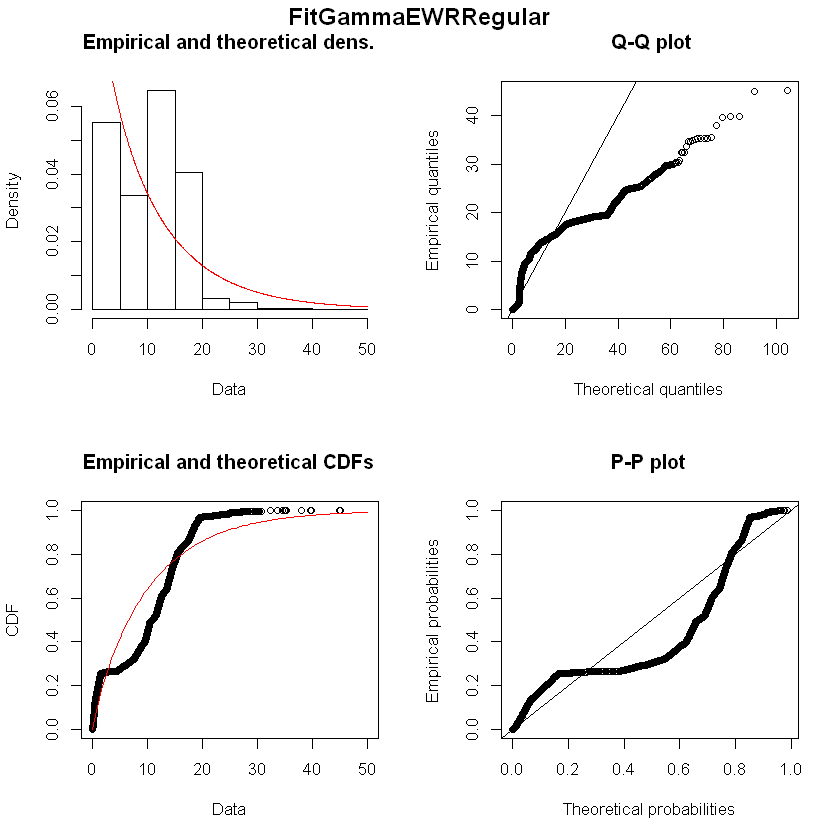

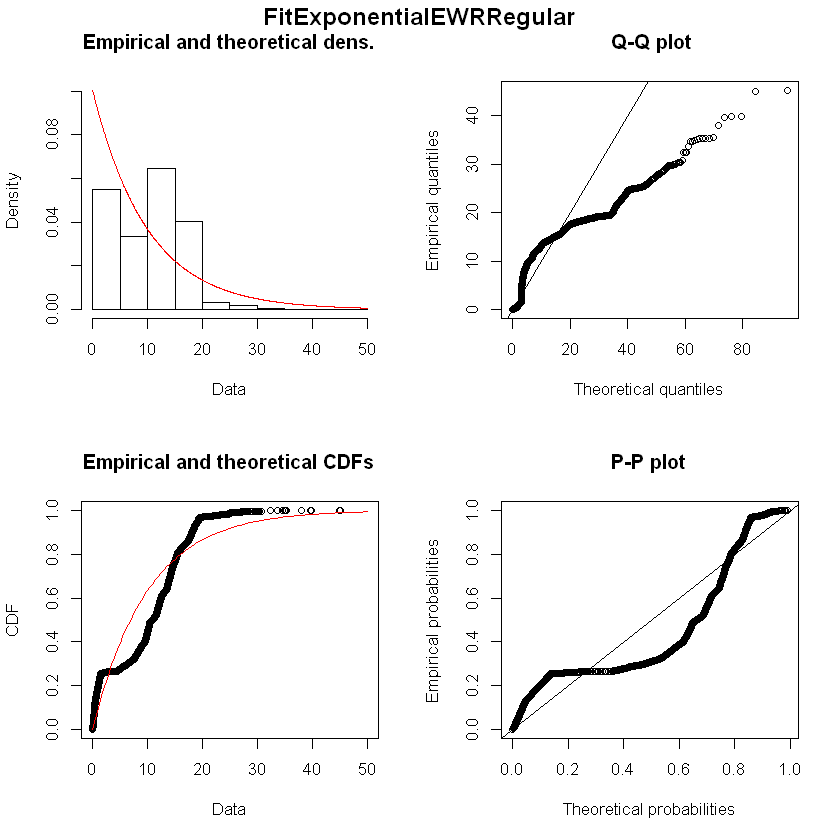

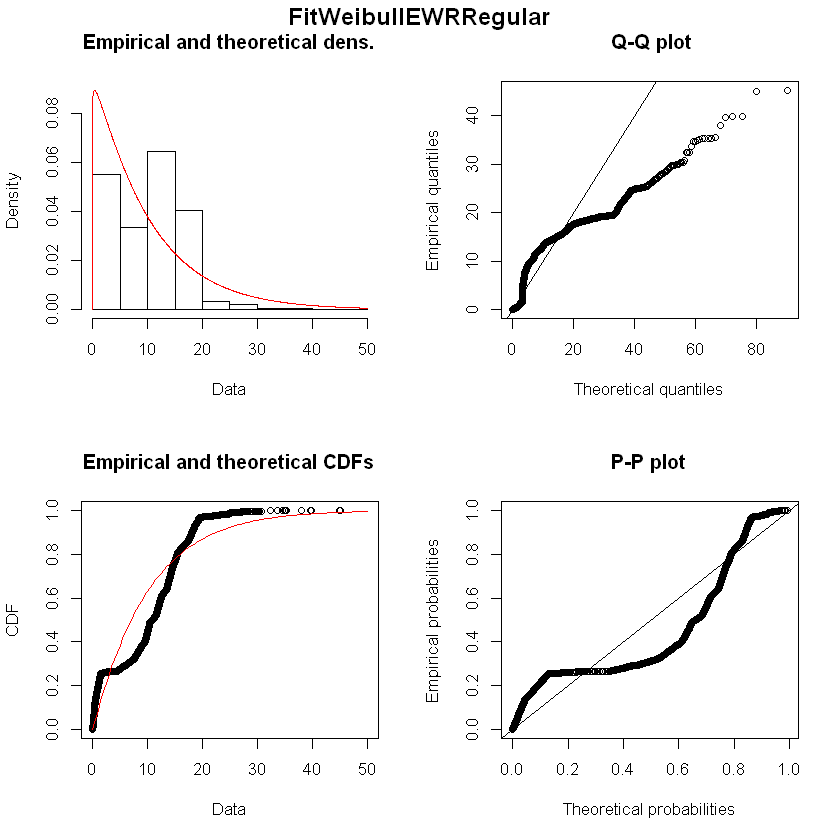

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
mean 1.4909710 0.006400548
sd   0.4608839 0.004525775
Loglikelihood:  -3340.848   AIC:  6685.697   BIC:  6698.804 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
meanlog 0.3289923 0.005977322
sdlog   0.4304087 0.004226502
Loglikelihood:  -4691.962   AIC:  9387.924   BIC:  9401.032 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
      estimate Std. Error
shape 7.260329 0.13943922
rate  4.869615 0.09683318
Loglikelihood:  -4042.083   AIC:  8088.165   BIC:  8101.272 
Correlation matrix:
          shape      rate
shape 1.0000000 0.9658264
rate  0.9658264 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
rate 0.6707038 0.009314412
Loglikelihood:  -7256.032   AIC:  14514.06   BIC:  14520.62 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
shape 3.688310 0.040857543
scale 1.647207 0.006470464
Loglikelihood:  -3375.905   AIC:  6755.811   BIC:  6768.918 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2848111
scale 0.2848111 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
location 1.5252728 0.006363432
scale    0.2615939 0.003008659
Loglikelihood:  -3361.015   AIC:  6726.031   BIC:  6739.138 
Correlation matrix:
            location       scale
location  1.00000000 -0.06126752
scale    -0.06126752  1.00000000


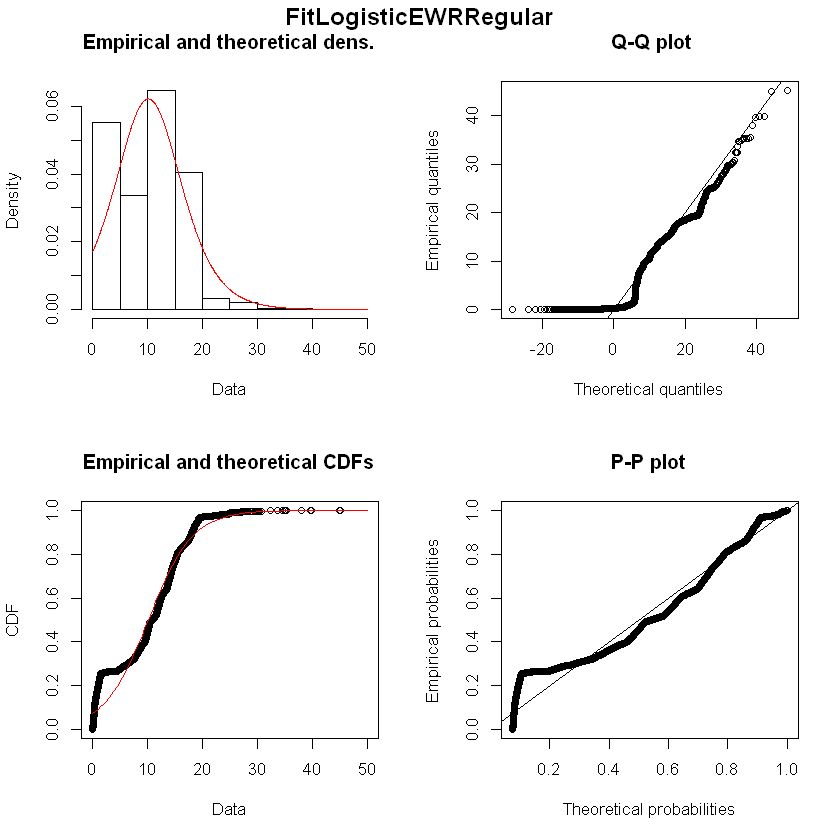

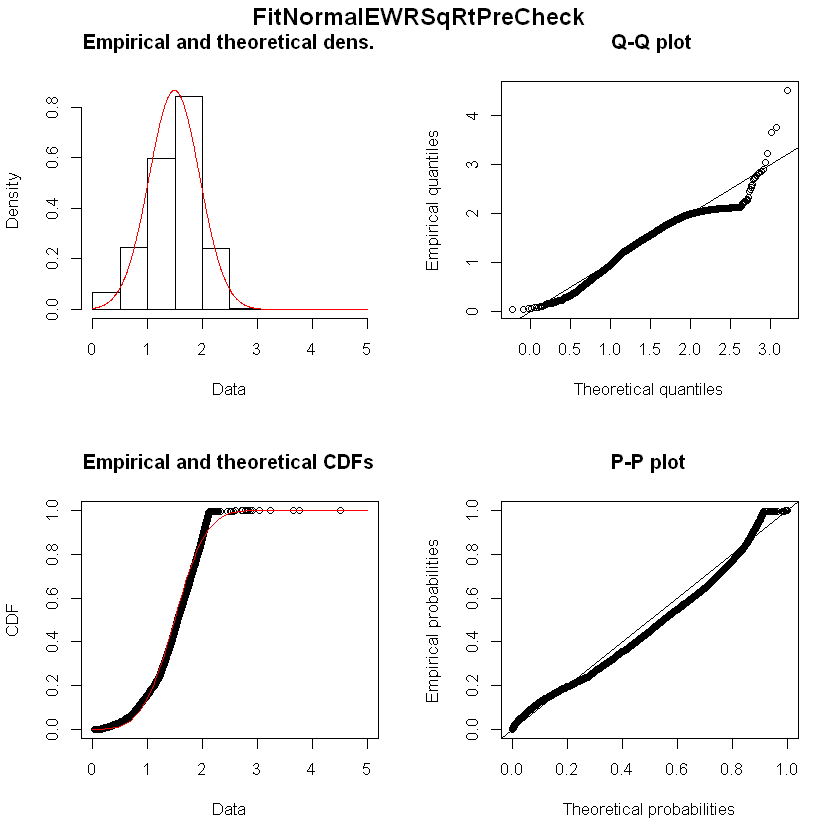

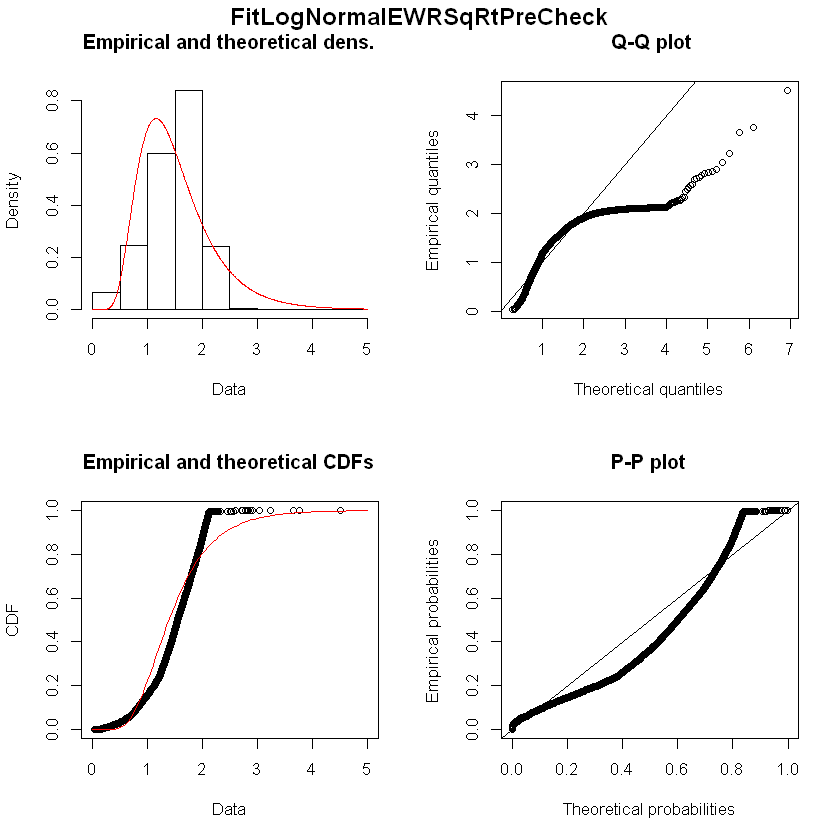

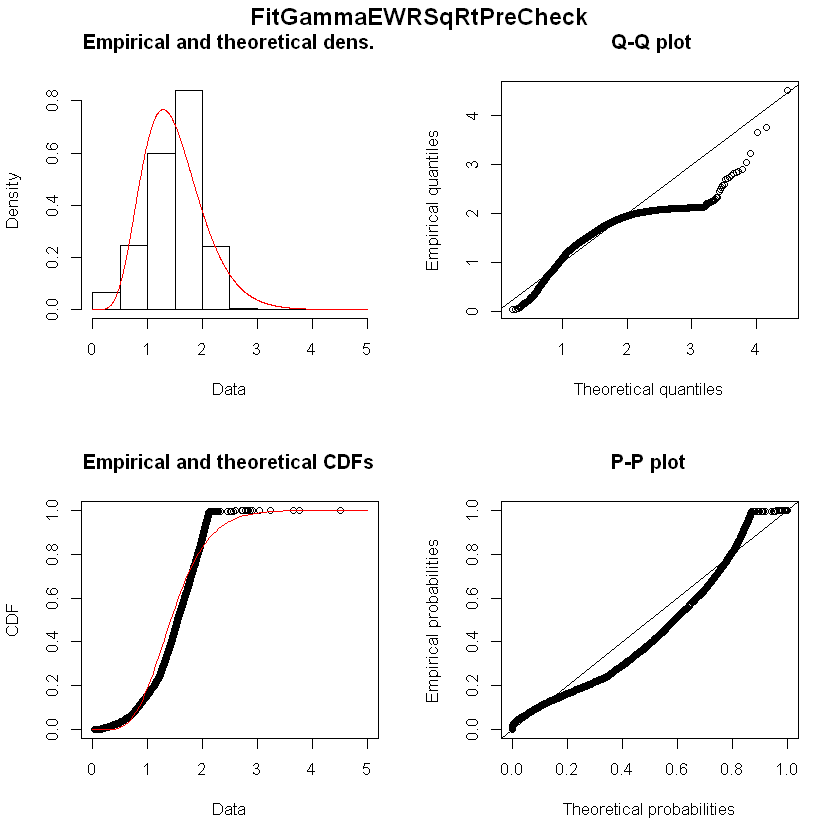

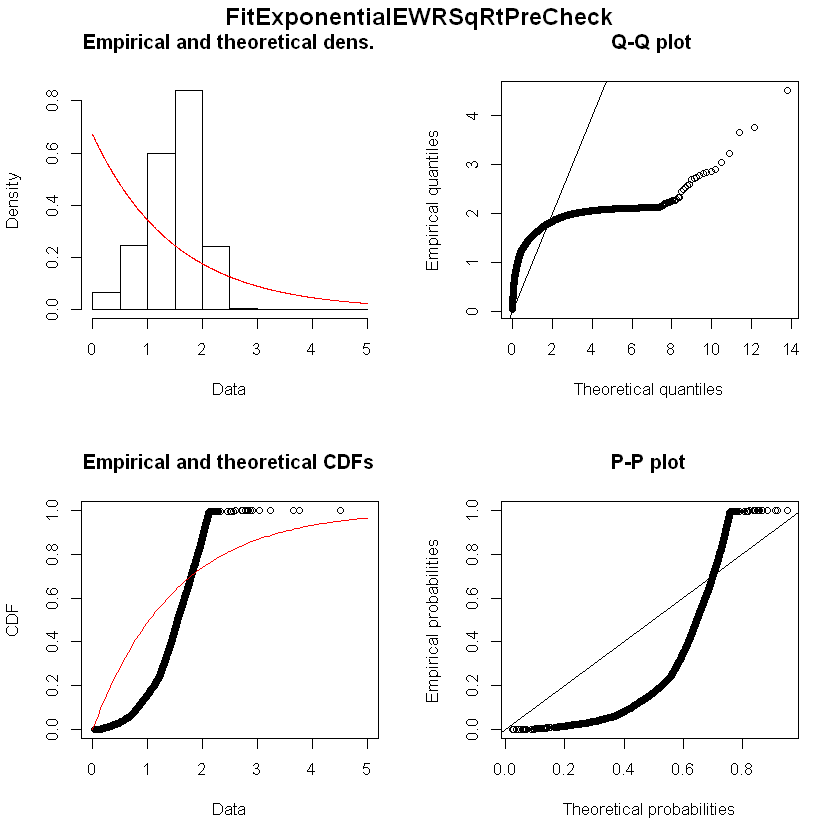

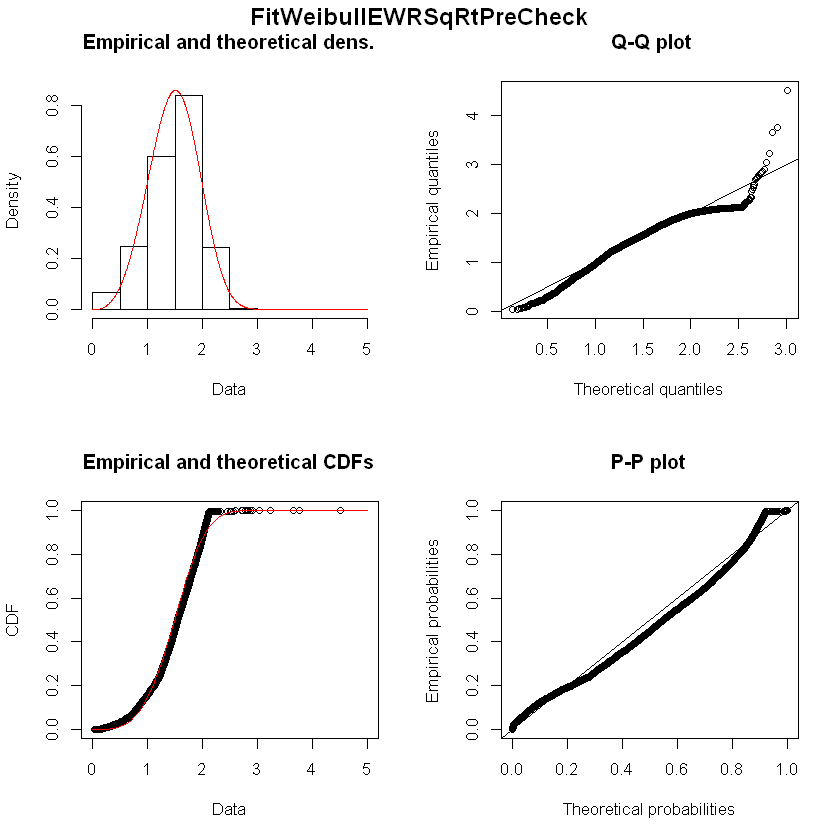

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
     estimate Std. Error
mean 2.840505 0.01620199
sd   1.376407 0.01145651
Loglikelihood:  -12546.14   AIC:  25096.28   BIC:  25110.05 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
meanlog 0.8177720 0.009552204
sdlog   0.8114877 0.006754382
Loglikelihood:  -14634.81   AIC:  29273.62   BIC:  29287.39 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape 2.3632343 0.03690217
rate  0.8319456 0.01446874
Loglikelihood:  -13541.57   AIC:  27087.14   BIC:  27100.91 
Correlation matrix:
          shape      rate
shape 1.0000000 0.8978591
rate  0.8978591 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
rate 0.3520501 0.004144027
Loglikelihood:  -14751.42   AIC:  29504.83   BIC:  29511.72 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
      estimate Std. Error
shape 2.063024 0.02173895
scale 3.171229 0.01876246
Loglikelihood:  -12899.37   AIC:  25802.75   BIC:  25816.52 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2641223
scale 0.2641223 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
location 3.002567 0.016760551
scale    0.805168 0.007930567
Loglikelihood:  -12748.81   AIC:  25501.62   BIC:  25515.39 
Correlation matrix:
           location      scale
location  1.0000000 -0.1373407
scale    -0.1373407  1.0000000


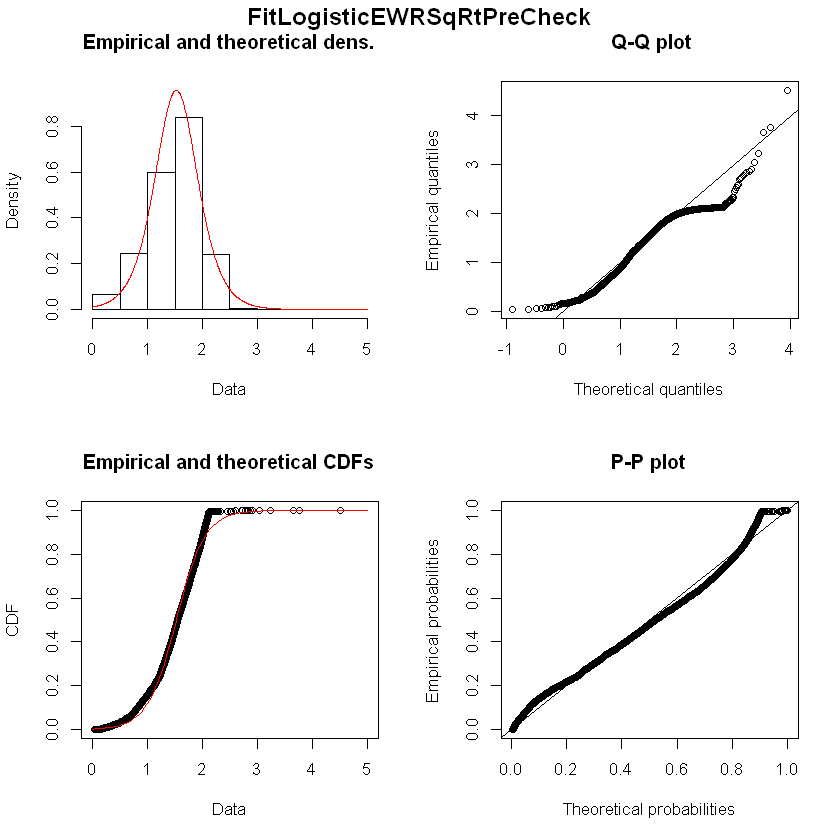

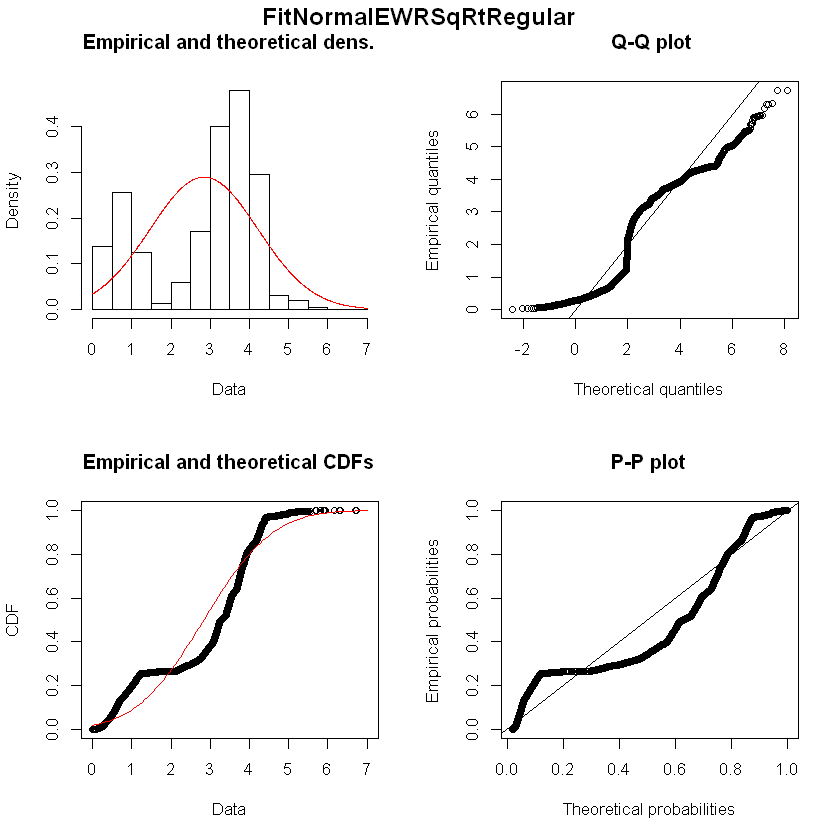

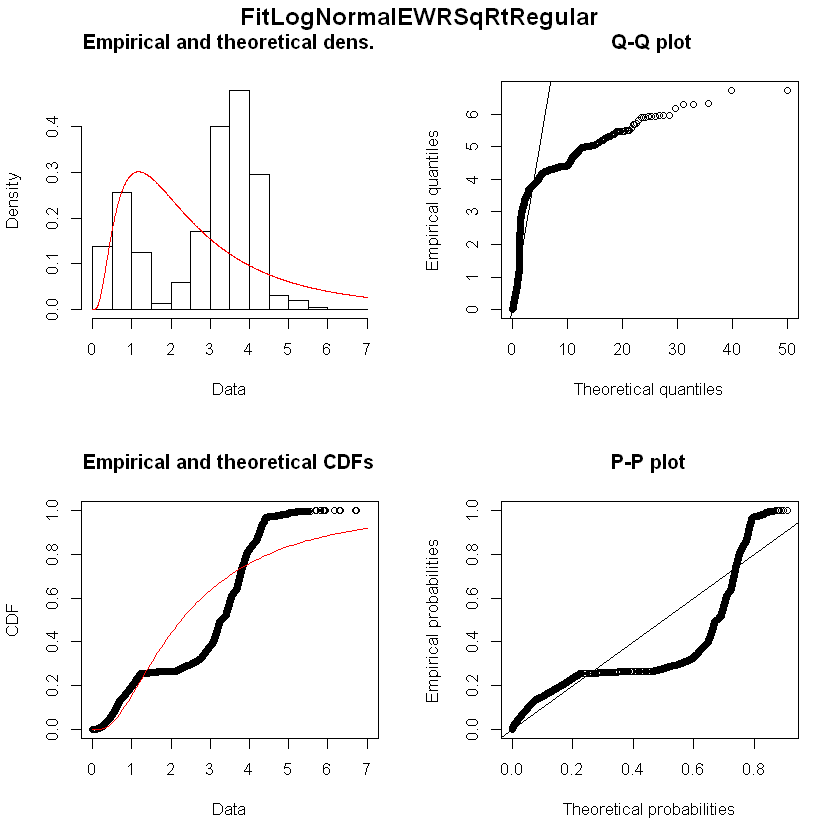

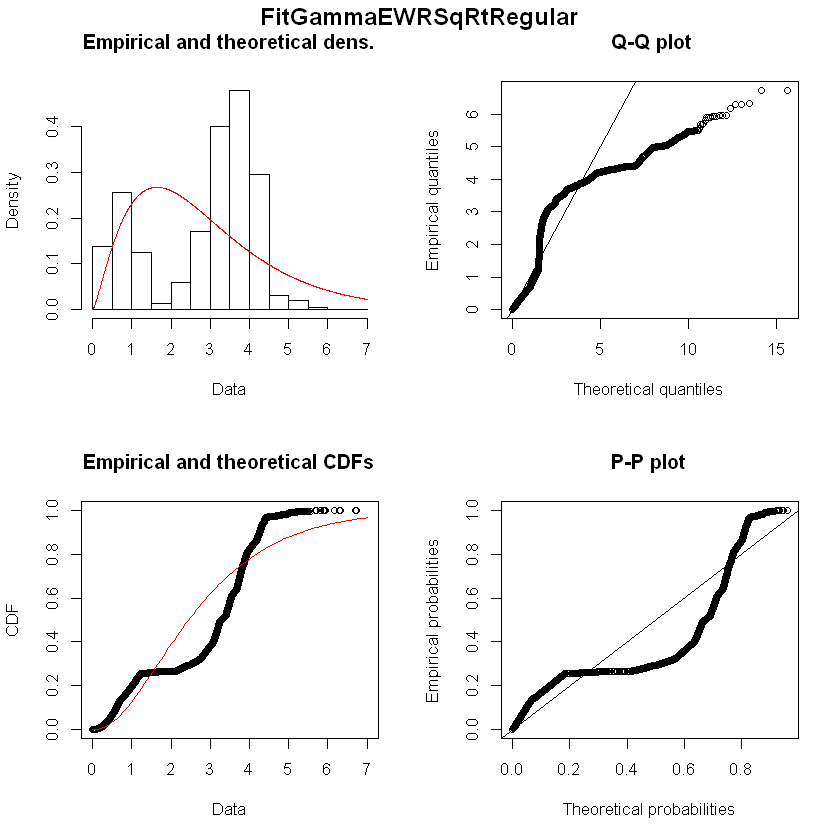

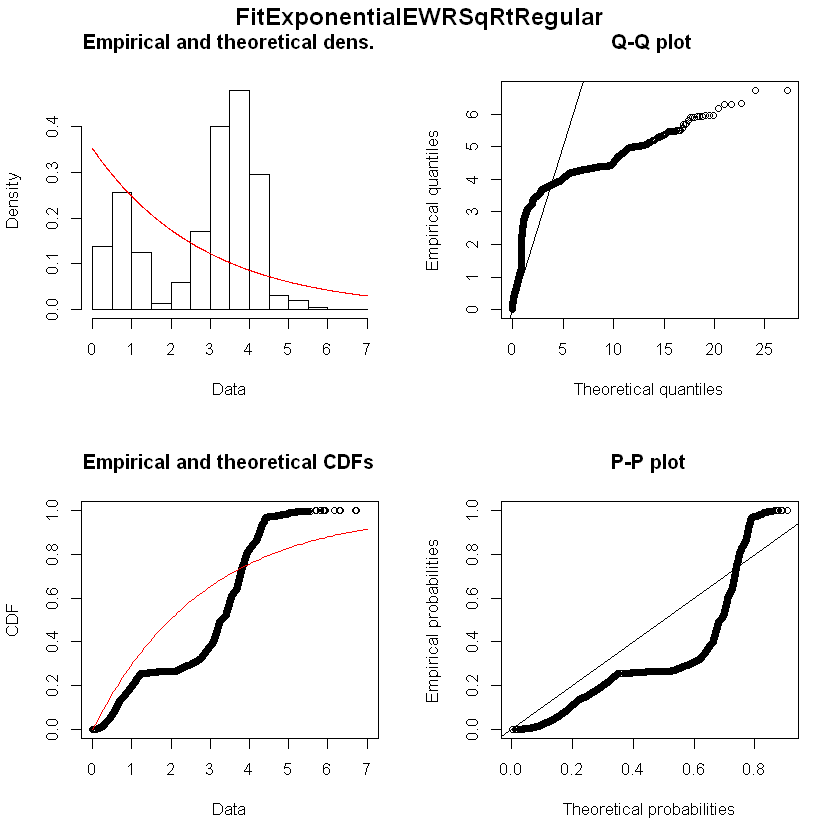

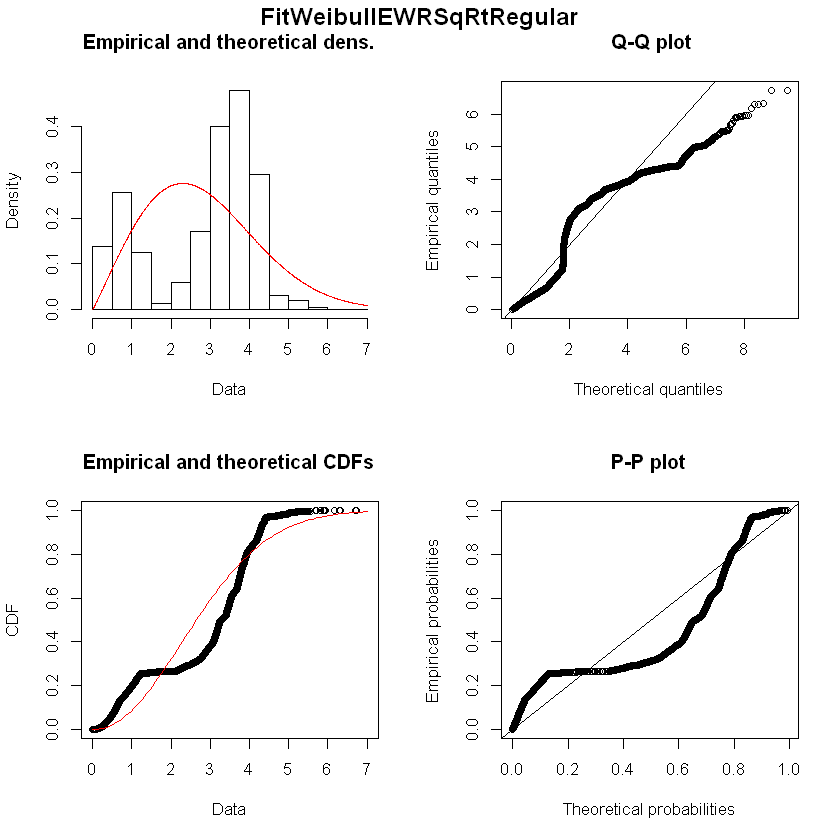

Warning message in sqrt(diag(varcovar)):
"NaNs produced"Warning message in sqrt(1/diag(V)):
"NaNs produced"Warning message in cov2cor(varcovar):
"diag(.) had 0 or NA entries; non-finite result is doubtful"

Fitting of the distribution ' nbinom ' by maximum likelihood 
Parameters : 
         estimate Std. Error
size 1.521102e+06        NaN
mu   2.321824e+00 0.02100791
Loglikelihood:  -8779.398   AIC:  17562.8   BIC:  17575.93 
Correlation matrix:
     size  mu
size    1 NaN
mu    NaN   1


Fitting of the distribution ' pois ' by maximum likelihood 
Parameters : 
       estimate Std. Error
lambda 2.321361  0.0210037
Loglikelihood:  -8779.397   AIC:  17560.79   BIC:  17567.36 

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
     estimate Std. Error
mean 2.342947 0.01743110
sd   1.264446 0.01232562
Loglikelihood:  -8701.099   AIC:  17406.2   BIC:  17419.34 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
meanlog 0.6171373 0.011841265
sdlog   0.8589611 0.008372987
Loglikelihood:  -9913.841   AIC:  19831.68   BIC:  19844.82 
Correlation matrix:
             meanlog        sdlog
meanlog 1.000000e+00 4.508673e-11
sdlog   4.508673e-11 1.000000e+00


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
      estimate Std. Error
shape 2.287026 0.04174518
rate  0.976011 0.01991320
Loglikelihood:  -8916.212   AIC:  17836.42   BIC:  17849.56 
Correlation matrix:
          shape      rate
shape 1.0000000 0.8946395
rate  0.8946395 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
rate 0.4268128 0.005883824
Loglikelihood:  -9742.118   AIC:  19486.24   BIC:  19492.8 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
      estimate Std. Error
shape 1.820587 0.01988723
scale 2.609456 0.02062151
Loglikelihood:  -8633.447   AIC:  17270.89   BIC:  17284.03 
Correlation matrix:
         shape    scale
shape 1.000000 0.286418
scale 0.286418 1.000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
location 2.3347399 0.017492866
scale    0.7185706 0.008091819
Loglikelihood:  -8665.066   AIC:  17334.13   BIC:  17347.27 
Correlation matrix:
             location        scale
location  1.000000000 -0.003455751
scale    -0.003455751  1.000000000


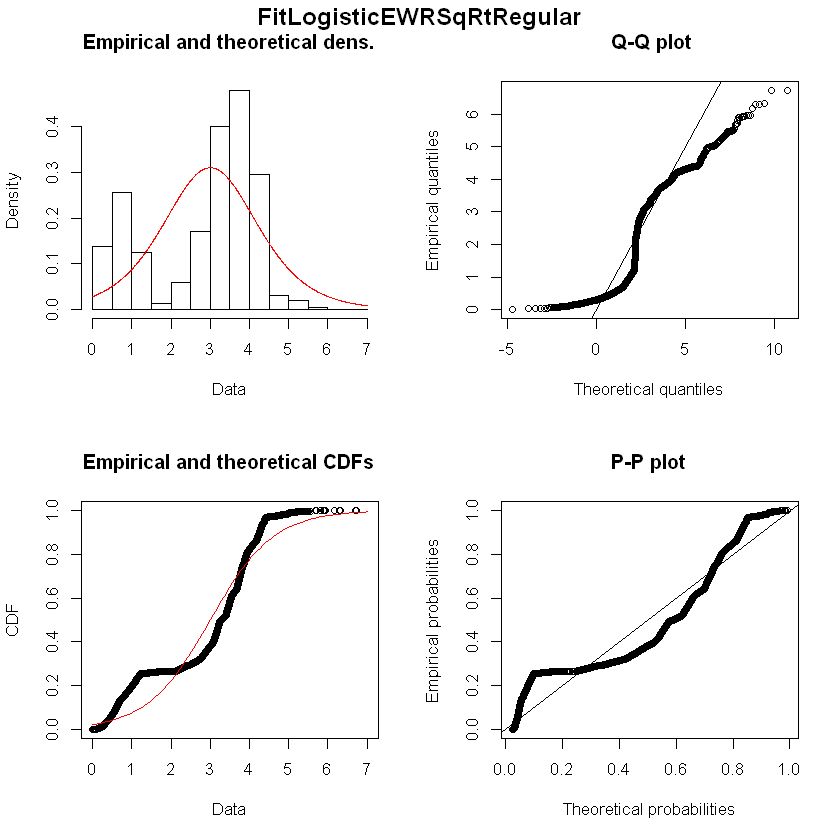

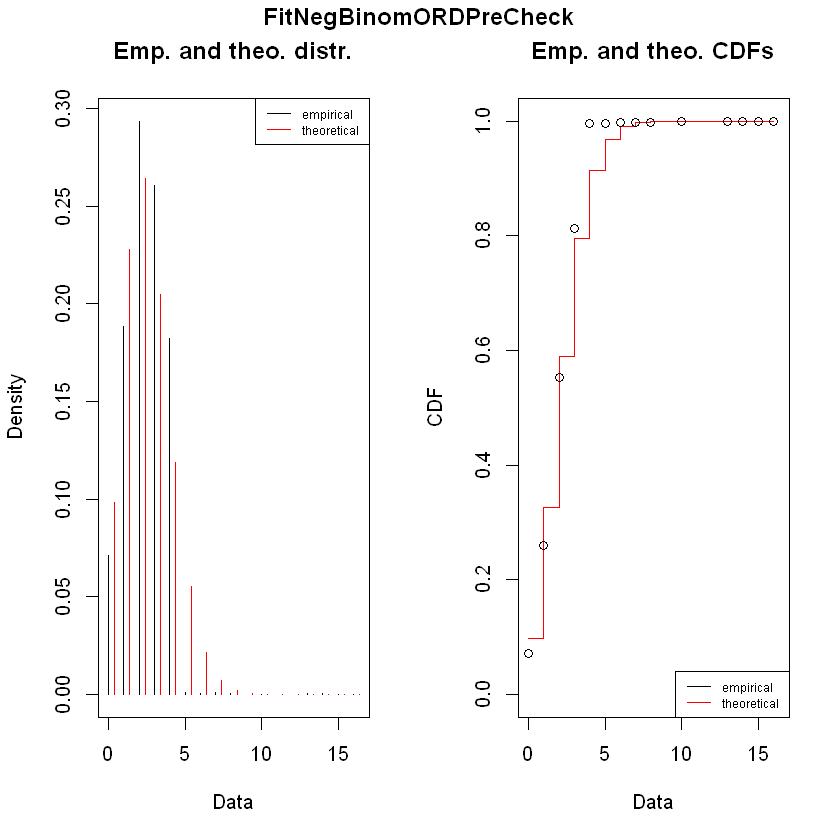

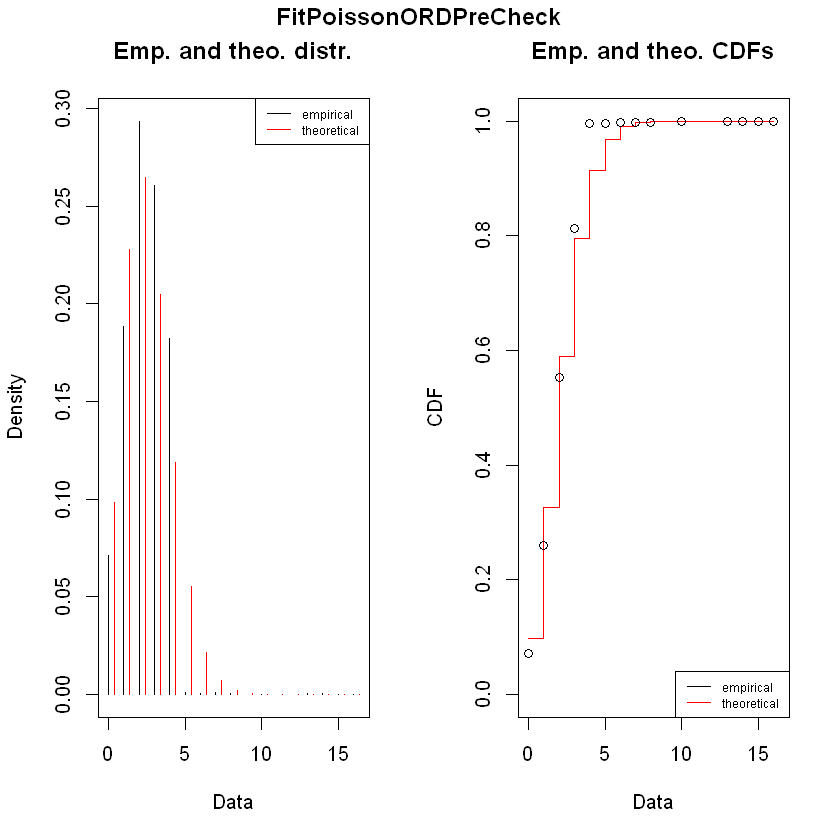

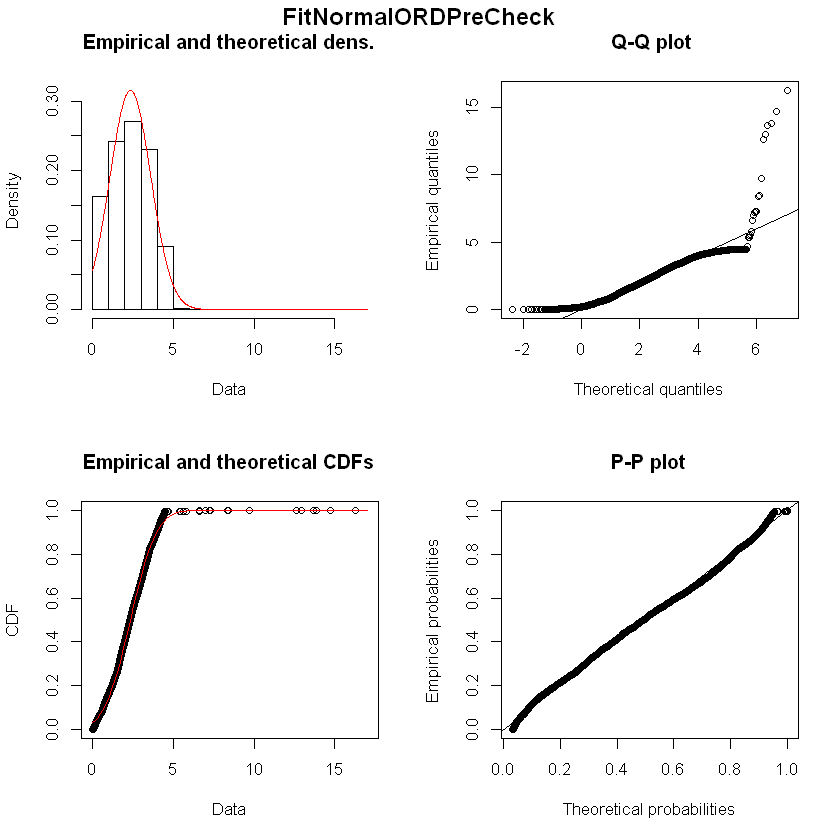

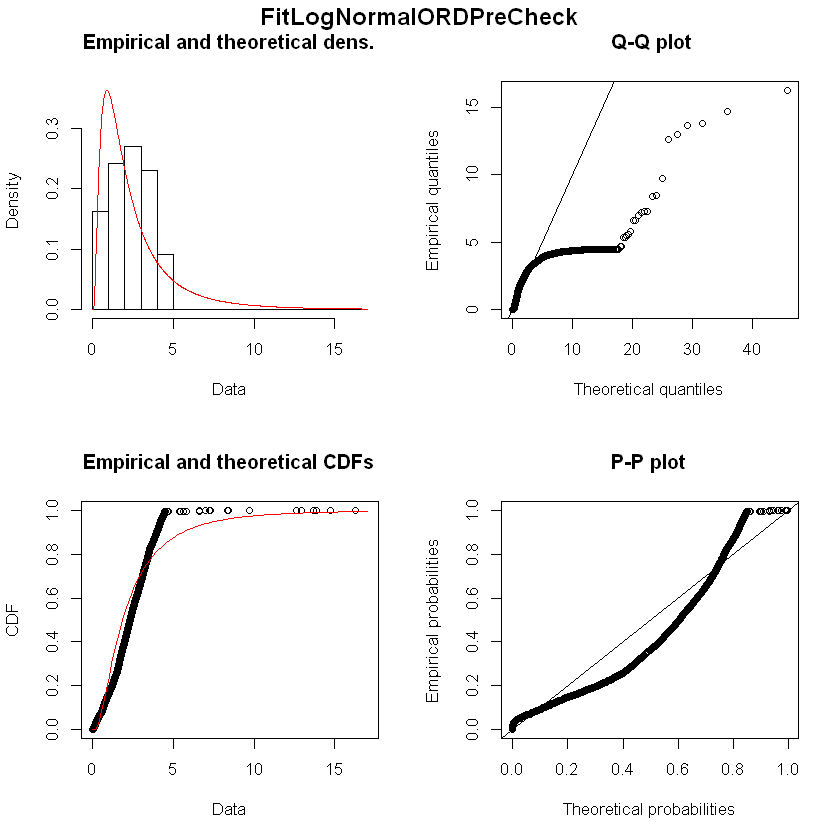

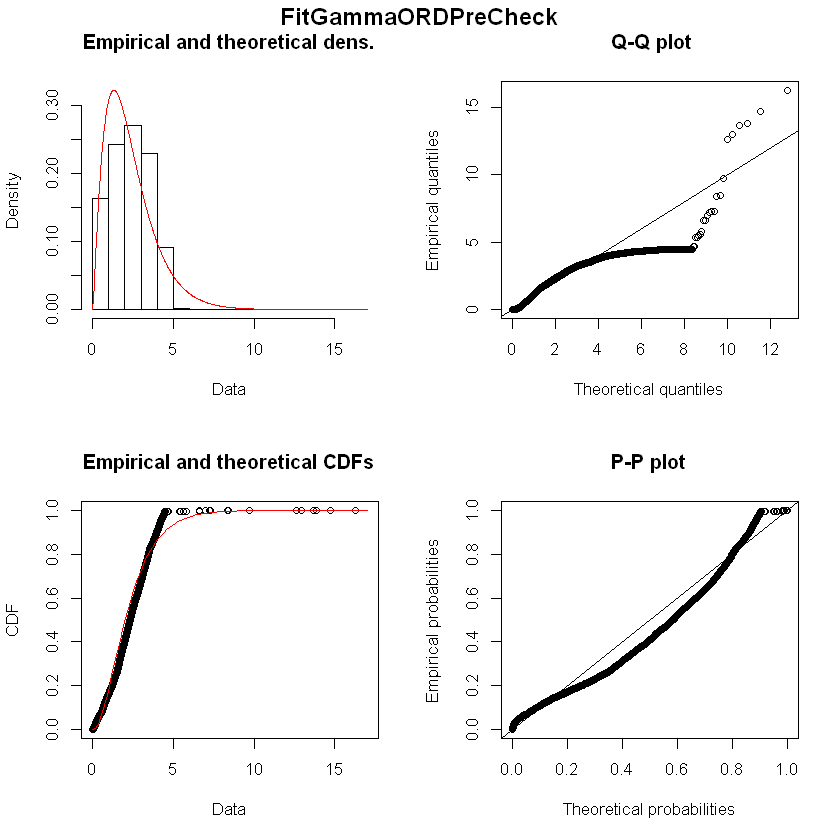

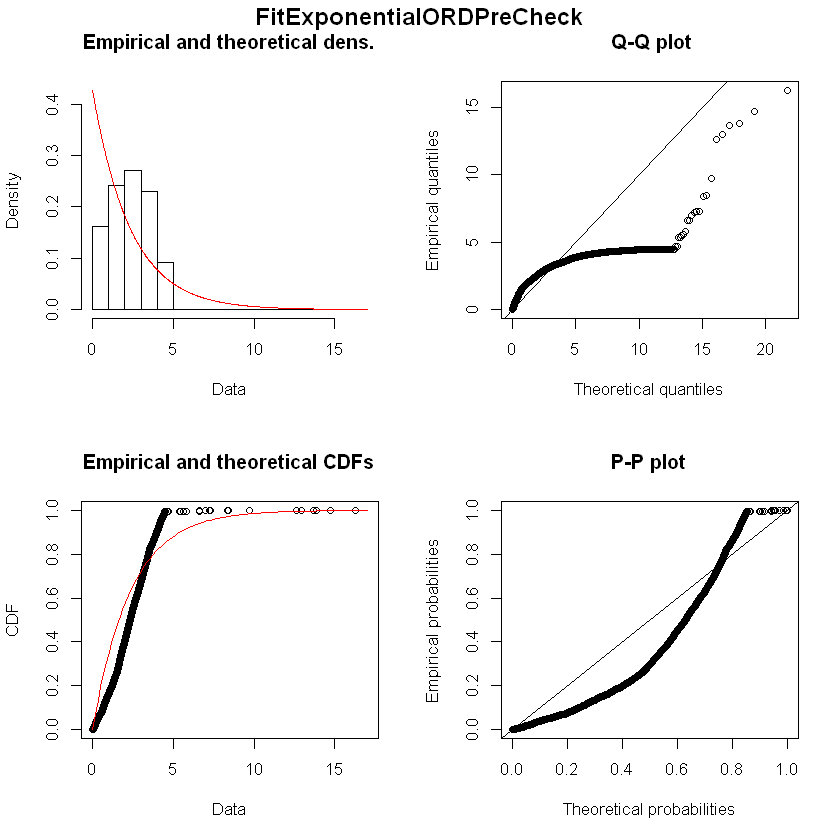

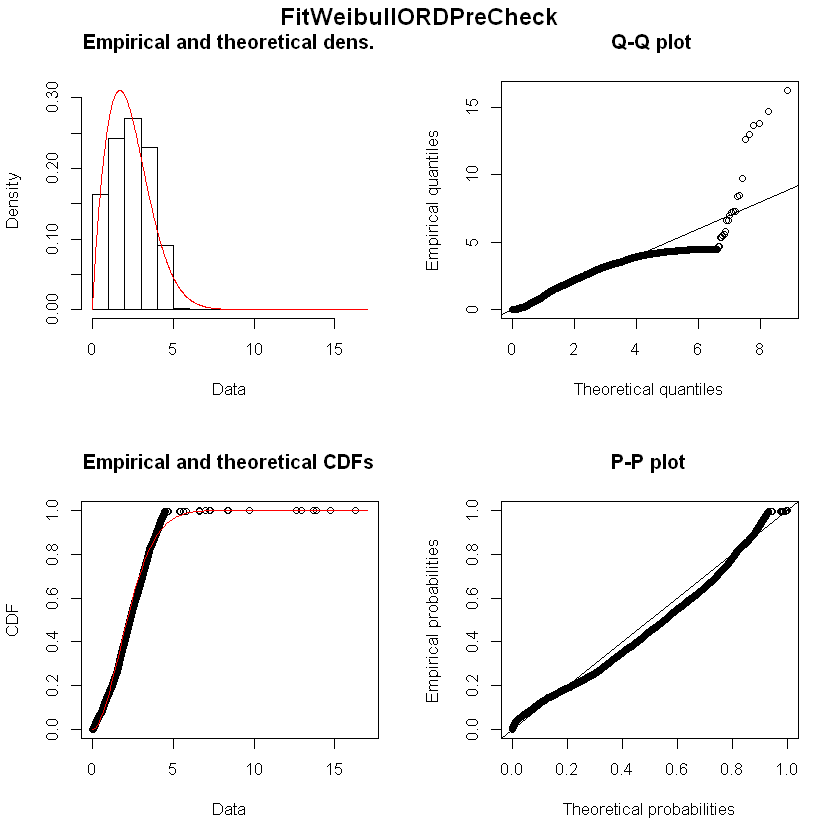

Fitting of the distribution ' nbinom ' by maximum likelihood 
Parameters : 
      estimate Std. Error
size  1.176665 0.02441281
mu   10.123481 0.11524559
Loglikelihood:  -24584.34   AIC:  49172.69   BIC:  49186.49 
Correlation matrix:
           size         mu
size 1.0000e+00 2.5921e-06
mu   2.5921e-06 1.0000e+00


Fitting of the distribution ' pois ' by maximum likelihood 
Parameters : 
       estimate Std. Error
lambda  10.1235 0.03718859
Loglikelihood:  -37367.74   AIC:  74737.49   BIC:  74744.38 

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
      estimate Std. Error
mean 10.164585 0.08880074
sd    7.597525 0.06279160
Loglikelihood:  -25230.29   AIC:  50464.58   BIC:  50478.38 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
        estimate Std. Error
meanlog 1.645185 0.01940892
sdlog   1.660569 0.01372416
Loglikelihood:  -26141.8   AIC:  52287.6   BIC:  52301.4 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
        estimate  Std. Error
shape 0.87119413 0.012521287
rate  0.08569307 0.001633221
Loglikelihood:  -24246.67   AIC:  48497.34   BIC:  48511.14 
Correlation matrix:
         shape     rate
shape 1.000000 0.753939
rate  0.753939 1.000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
       estimate  Std. Error
rate 0.09838081 0.001149767
Loglikelihood:  -24294.42   AIC:  48590.84   BIC:  48597.73 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape  1.010352 0.01029243
scale 10.196467 0.12234839
Loglikelihood:  -24293.92   AIC:  48591.85   BIC:  48605.64 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2658513
scale 0.2658513 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
         estimate Std. Error
location 9.859821 0.08595927
scale    4.206116 0.04050692
Loglikelihood:  -25088.48   AIC:  50180.97   BIC:  50194.76 
Correlation matrix:
            location       scale
location 1.000000000 0.002638423
scale    0.002638423 1.000000000


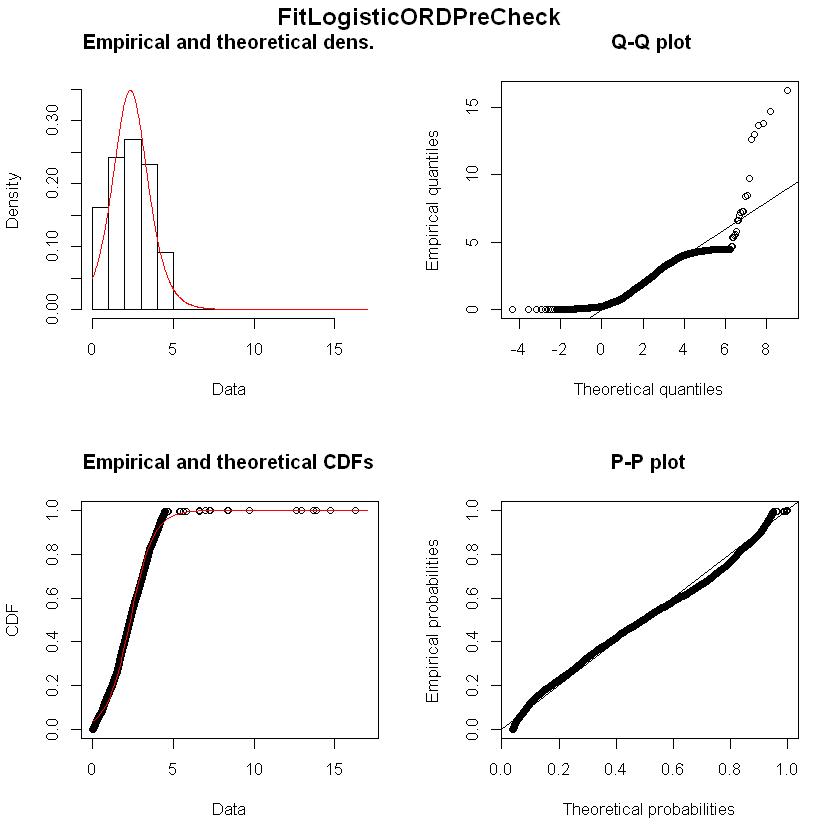

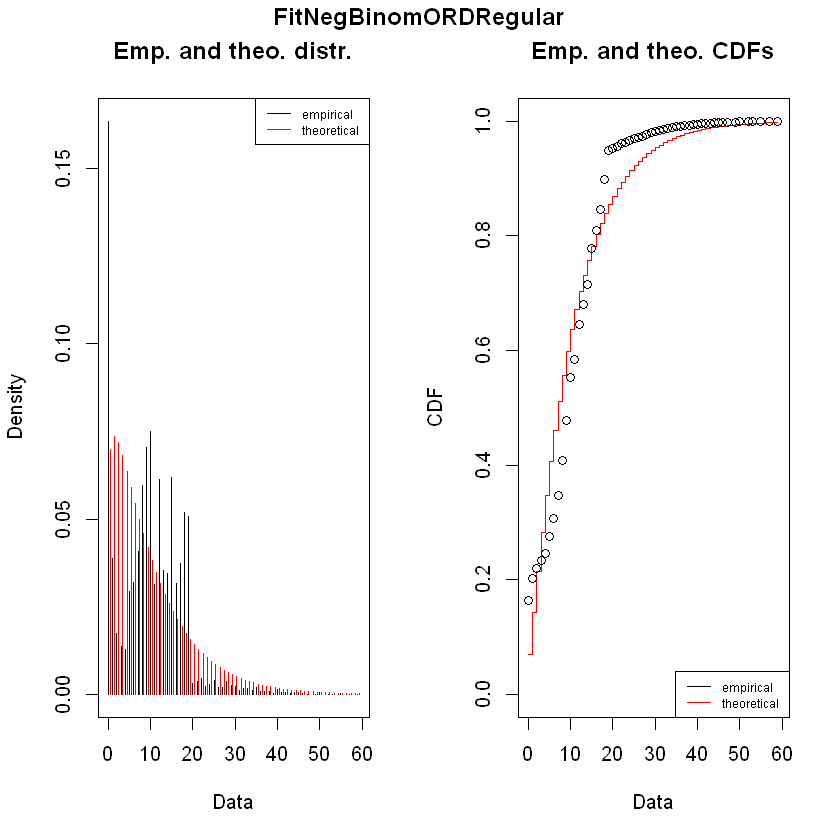

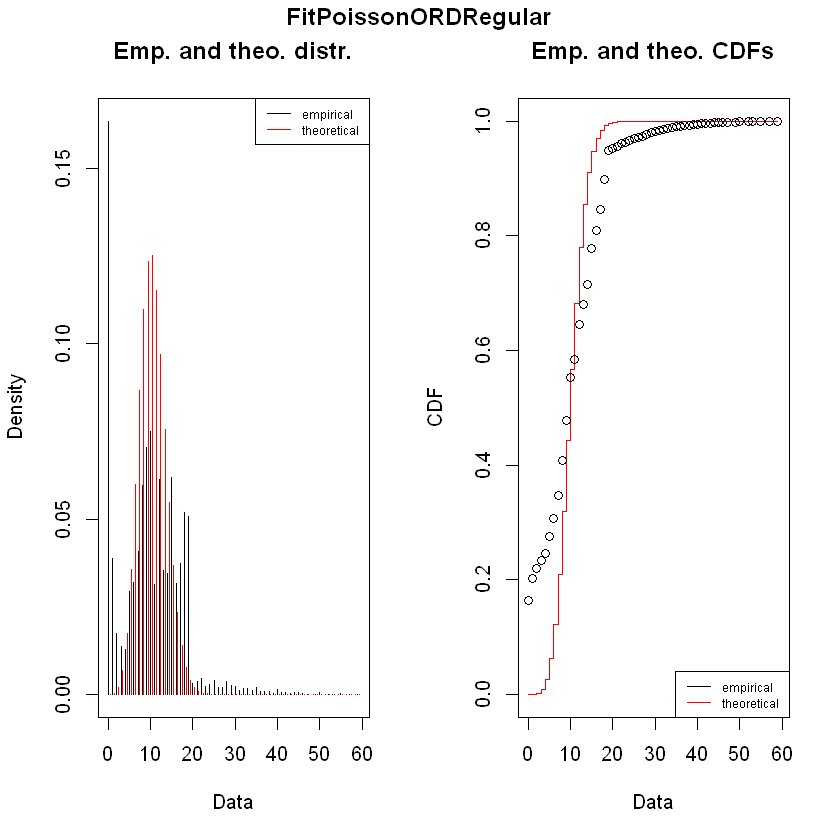

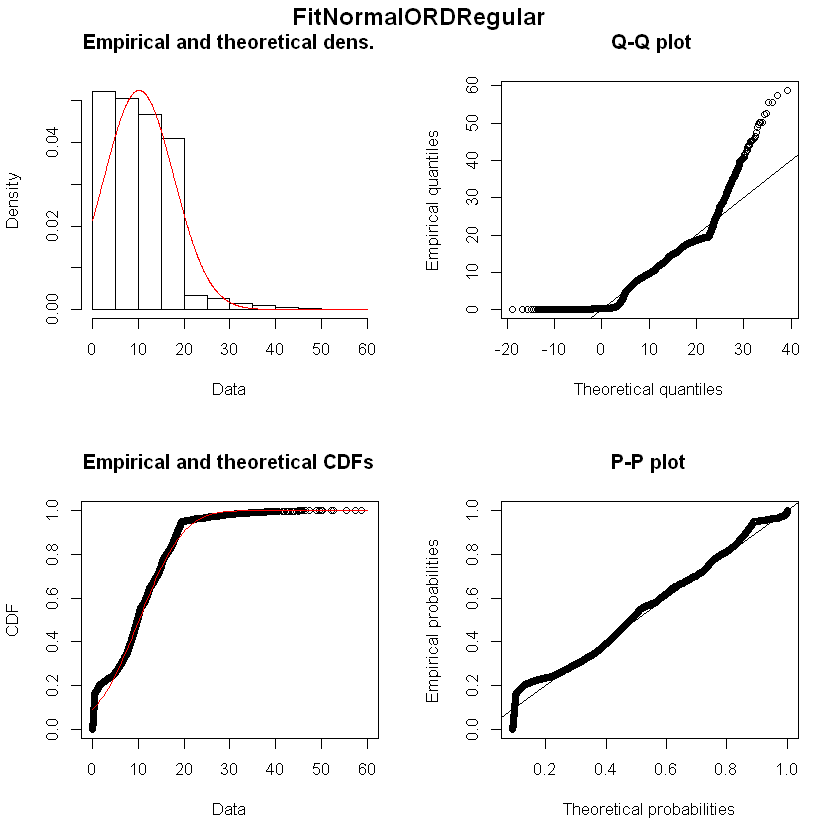

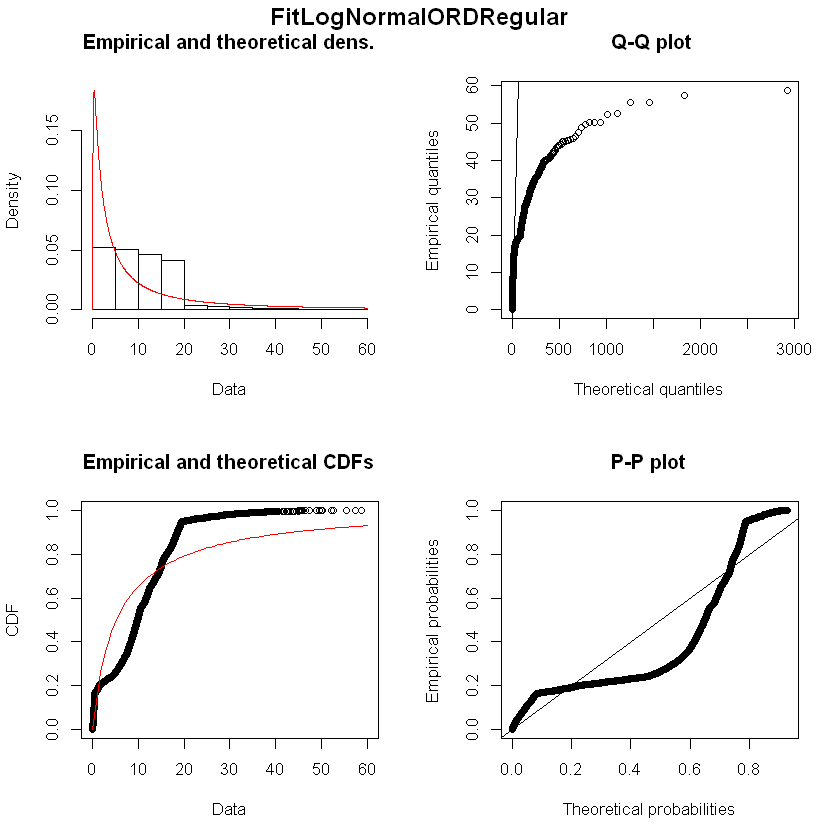

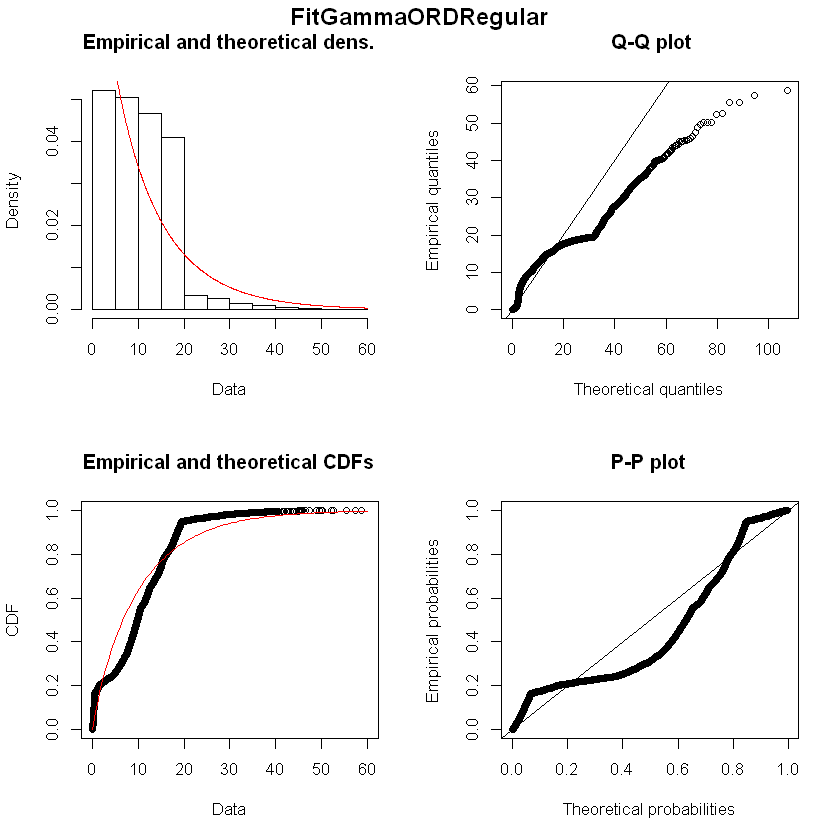

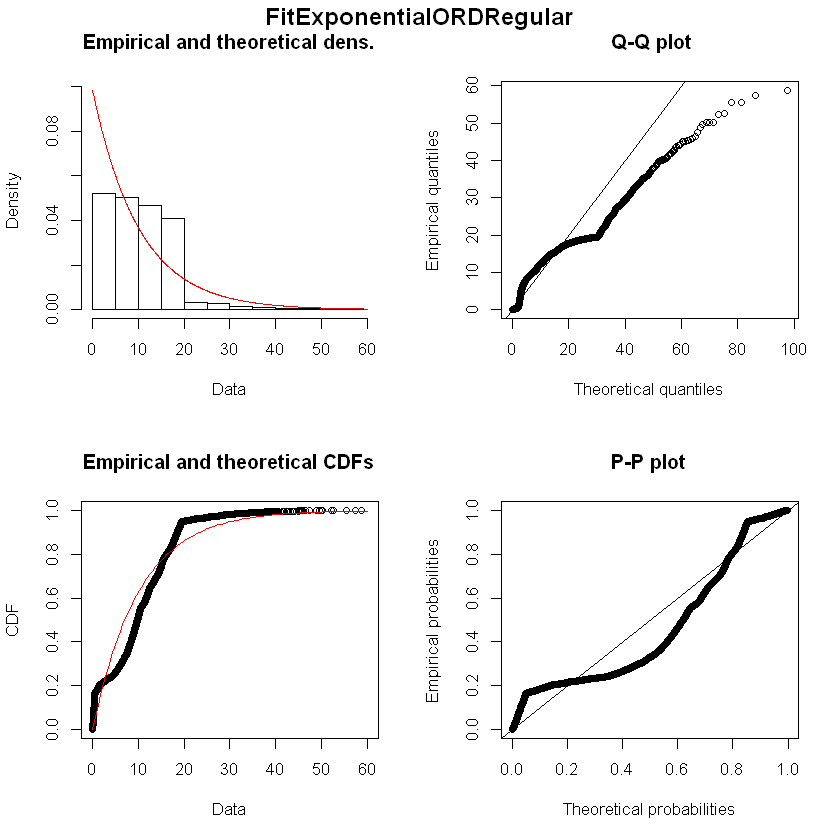

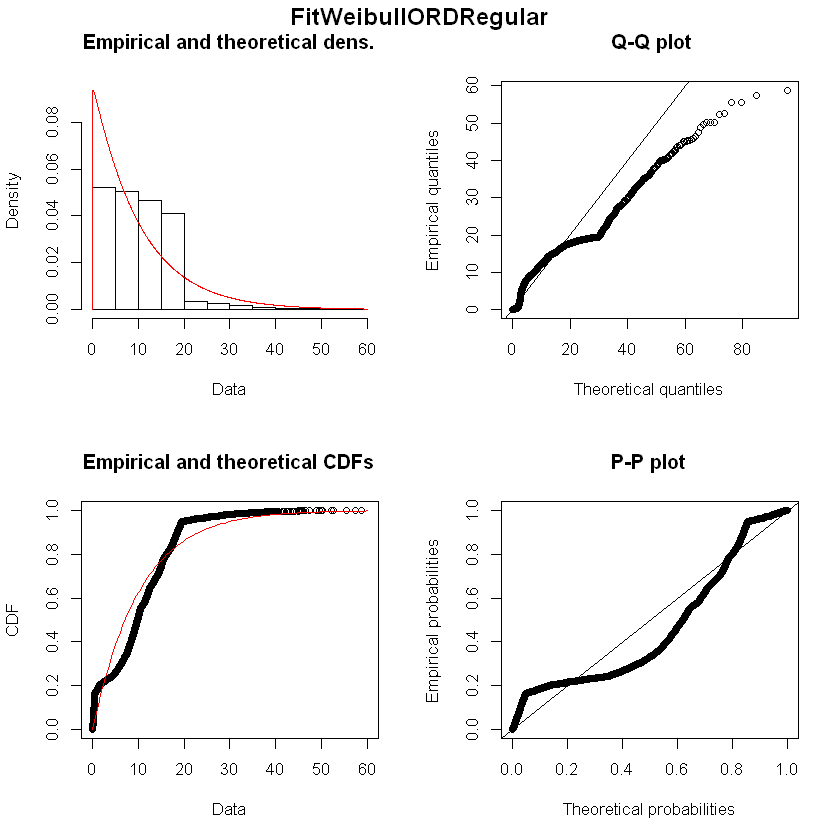

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
mean 1.4614429 0.006274054
sd   0.4551177 0.004436330
Loglikelihood:  -3324.212   AIC:  6652.424   BIC:  6665.56 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
meanlog 0.3085687 0.005920632
sdlog   0.4294806 0.004186417
Loglikelihood:  -4642.812   AIC:  9289.624   BIC:  9302.761 
Correlation matrix:
             meanlog        sdlog
meanlog 1.000000e+00 5.635738e-12
sdlog   5.635738e-12 1.000000e+00


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
      estimate Std. Error
shape 7.218656  0.1376035
rate  4.939457  0.0975082
Loglikelihood:  -4010.652   AIC:  8025.303   BIC:  8038.44 
Correlation matrix:
         shape     rate
shape 1.000000 0.965631
rate  0.965631 1.000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
rate 0.6842553 0.009432826
Loglikelihood:  -7258.53   AIC:  14519.06   BIC:  14525.63 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
shape 3.641671 0.039777646
scale 1.615460 0.006382593
Loglikelihood:  -3362.418   AIC:  6728.836   BIC:  6741.972 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2862781
scale 0.2862781 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
location 1.4948711 0.006199854
scale    0.2571577 0.002941751
Loglikelihood:  -3329.974   AIC:  6663.949   BIC:  6677.085 
Correlation matrix:
            location       scale
location  1.00000000 -0.06153007
scale    -0.06153007  1.00000000


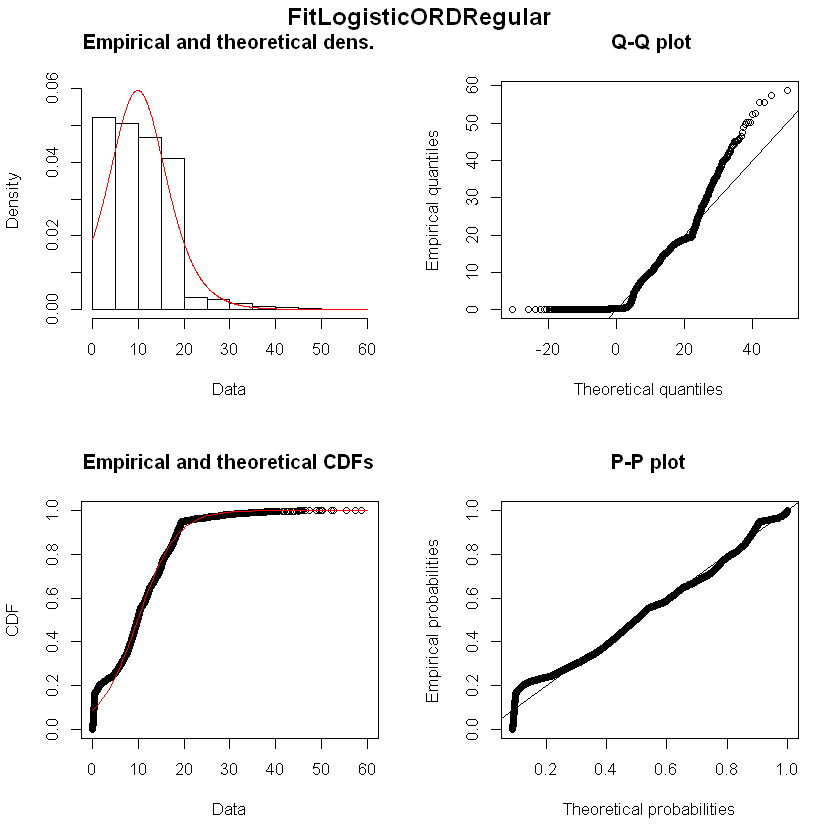

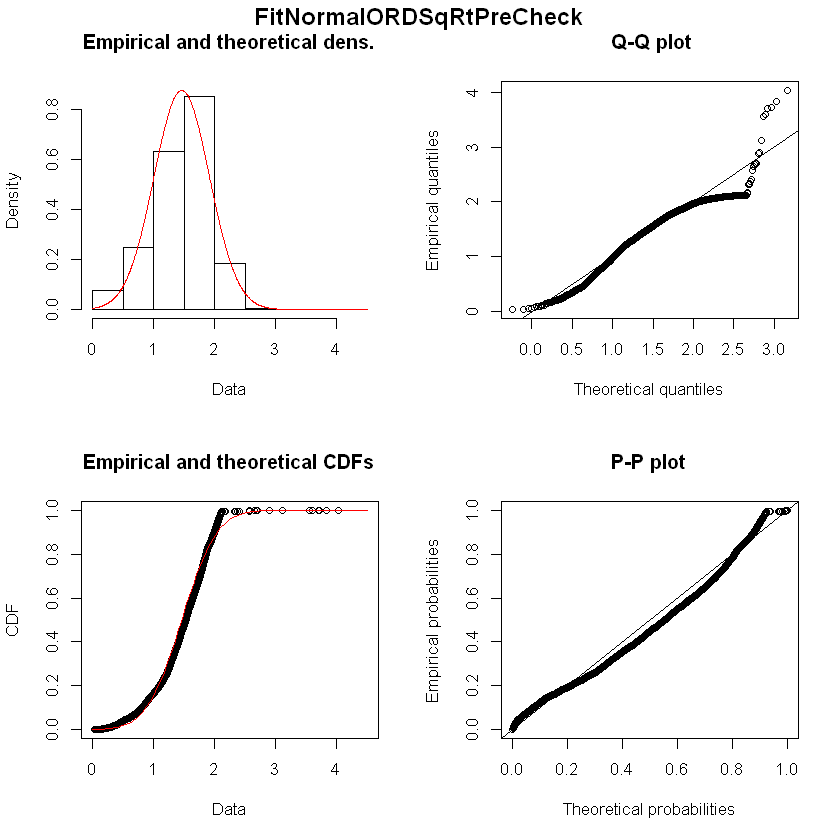

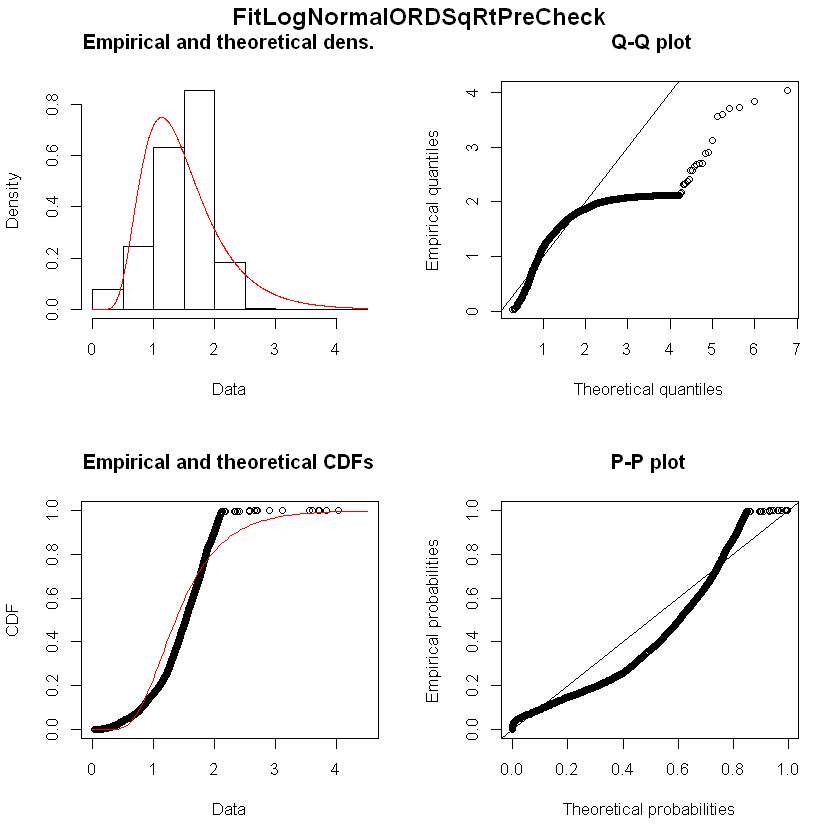

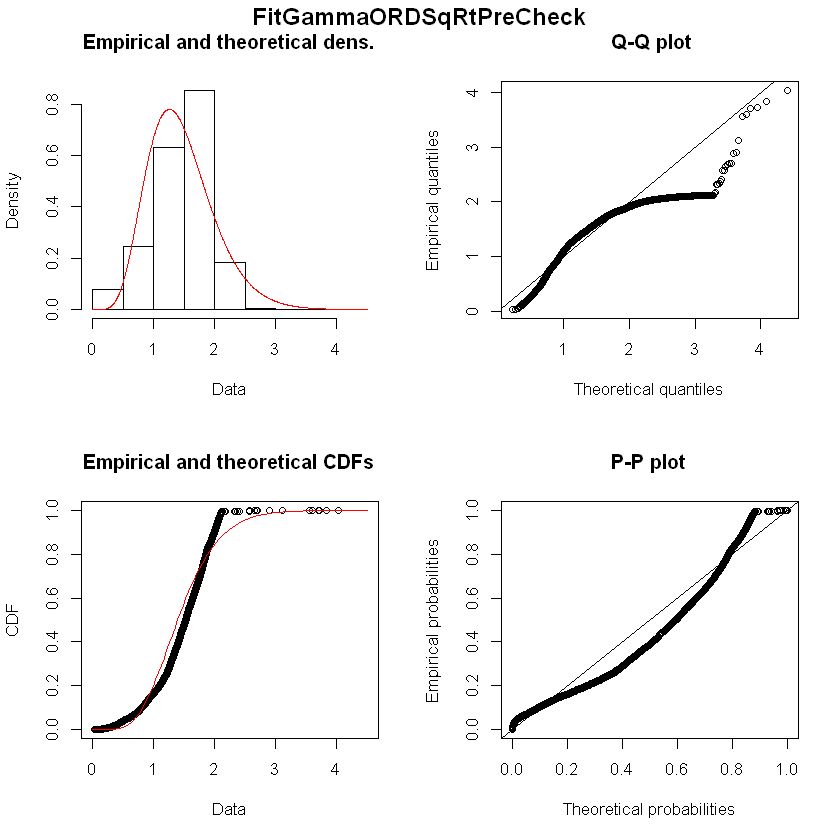

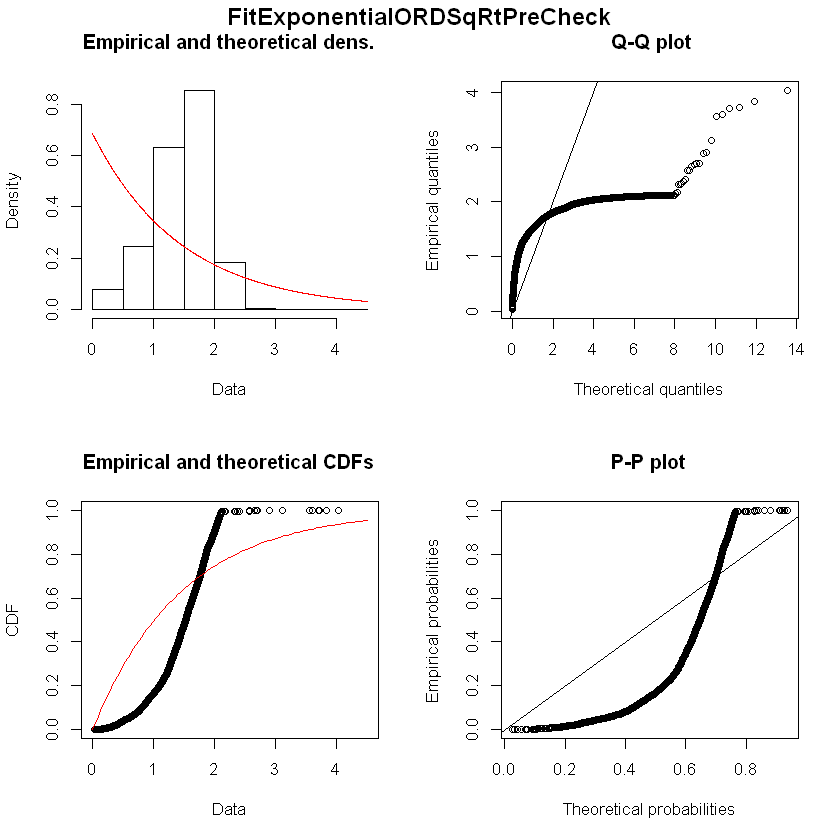

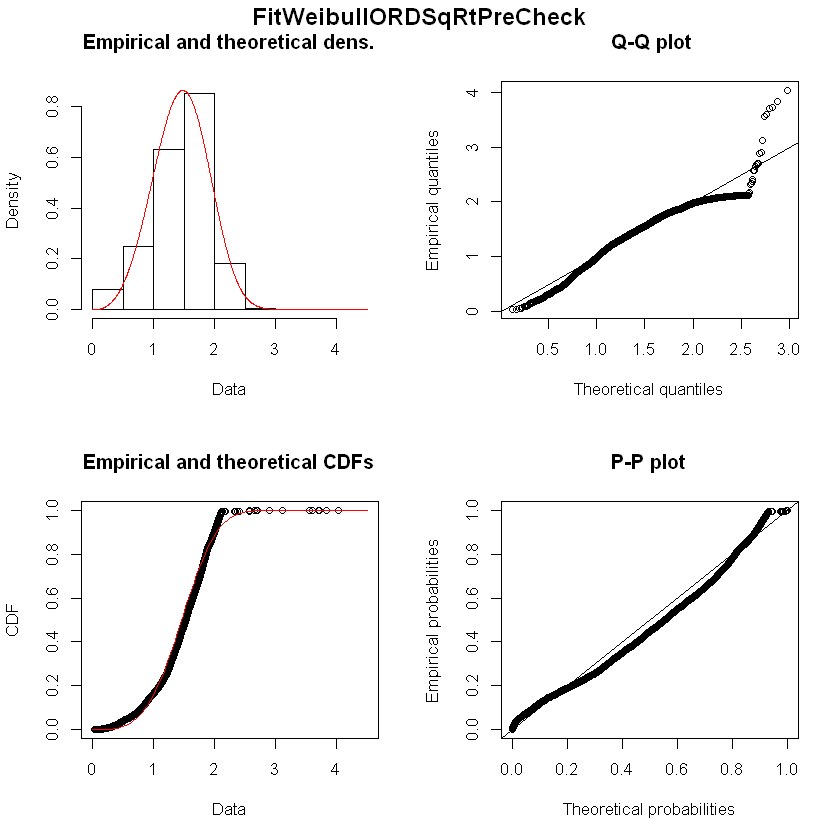

Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
     estimate Std. Error
mean 2.865372 0.01633925
sd   1.397937 0.01155357
Loglikelihood:  -12838.81   AIC:  25681.63   BIC:  25695.42 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
meanlog 0.8225926 0.009704460
sdlog   0.8302845 0.006862045
Loglikelihood:  -15046.58   AIC:  30097.17   BIC:  30110.97 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape 2.3258226 0.03602889
rate  0.8116558 0.01402782
Loglikelihood:  -13836.98   AIC:  27677.96   BIC:  27691.76 
Correlation matrix:
          shape      rate
shape 1.0000000 0.8963029
rate  0.8963029 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
rate 0.3489948 0.004079058
Loglikelihood:  -15025.75   AIC:  30053.5   BIC:  30060.4 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
      estimate Std. Error
shape 2.020842 0.02058592
scale 3.193399 0.01915877
Loglikelihood:  -13198.71   AIC:  26401.42   BIC:  26415.21 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2656907
scale 0.2656907 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
location 2.9802284 0.016379046
scale    0.8013673 0.007858281
Loglikelihood:  -12950.02   AIC:  25904.03   BIC:  25917.83 
Correlation matrix:
            location       scale
location  1.00000000 -0.09500461
scale    -0.09500461  1.00000000


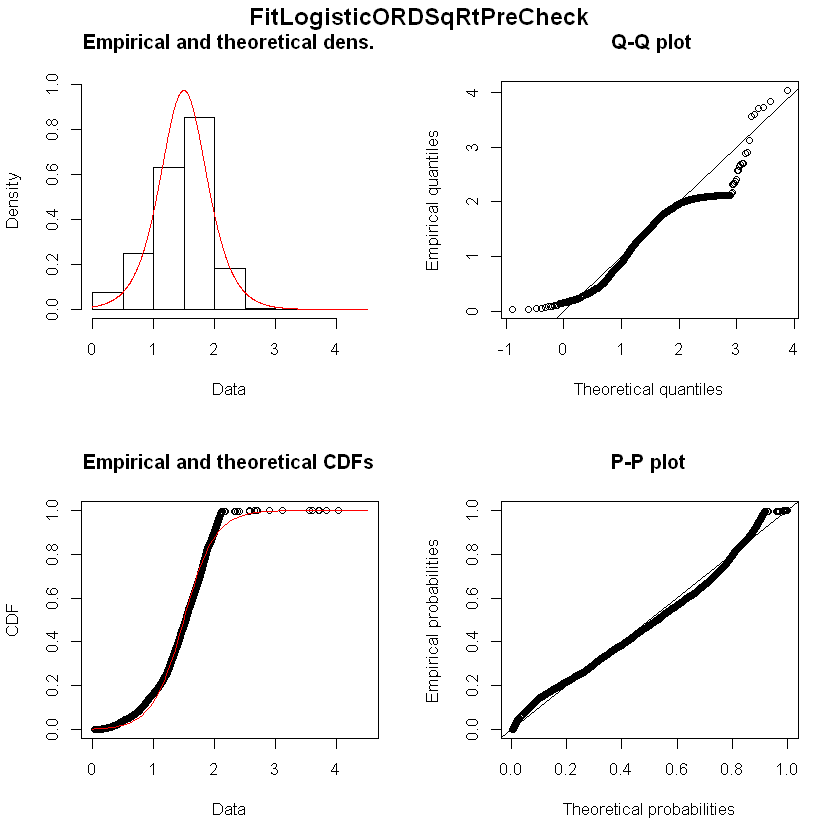

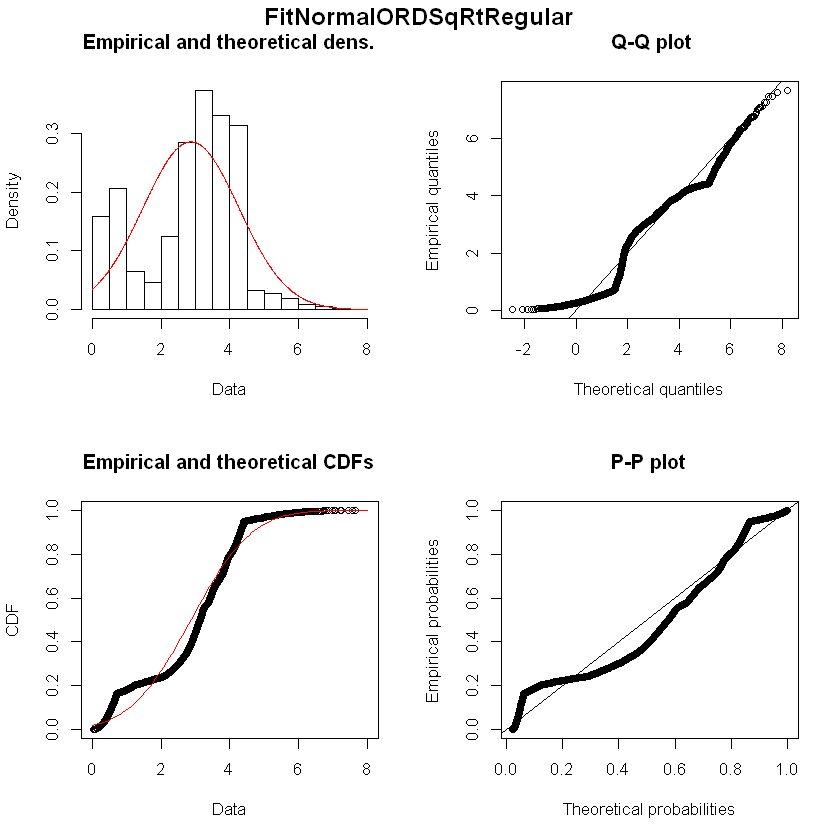

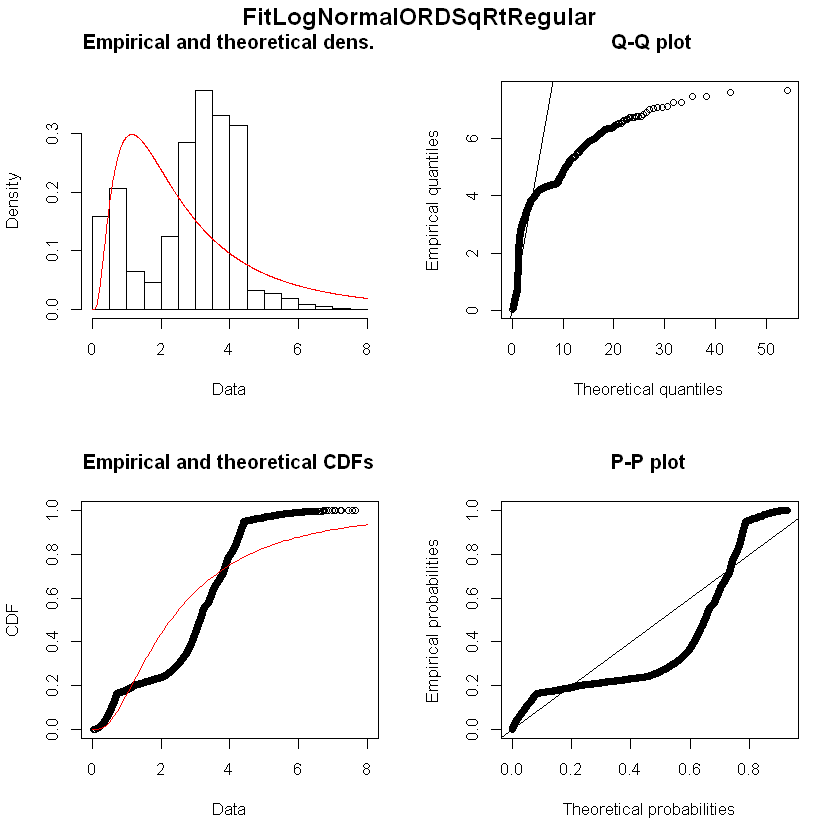

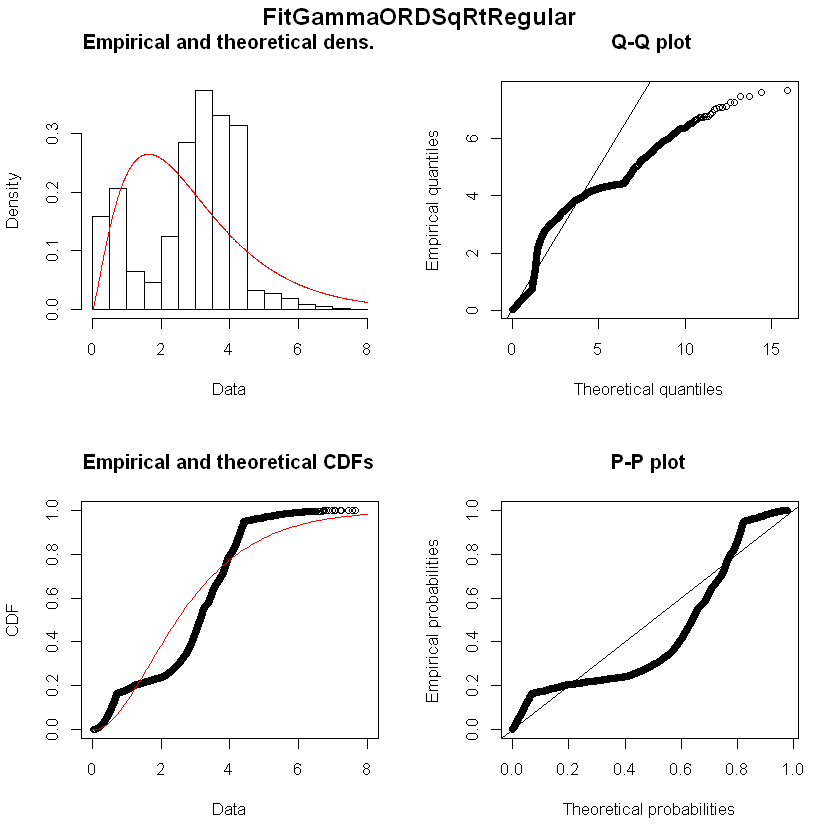

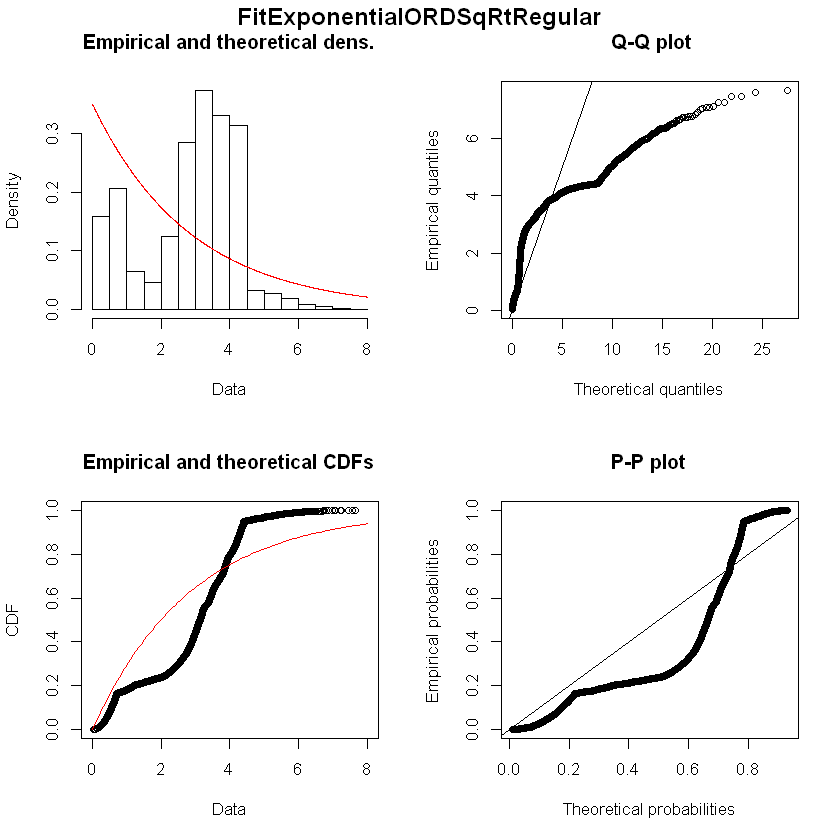

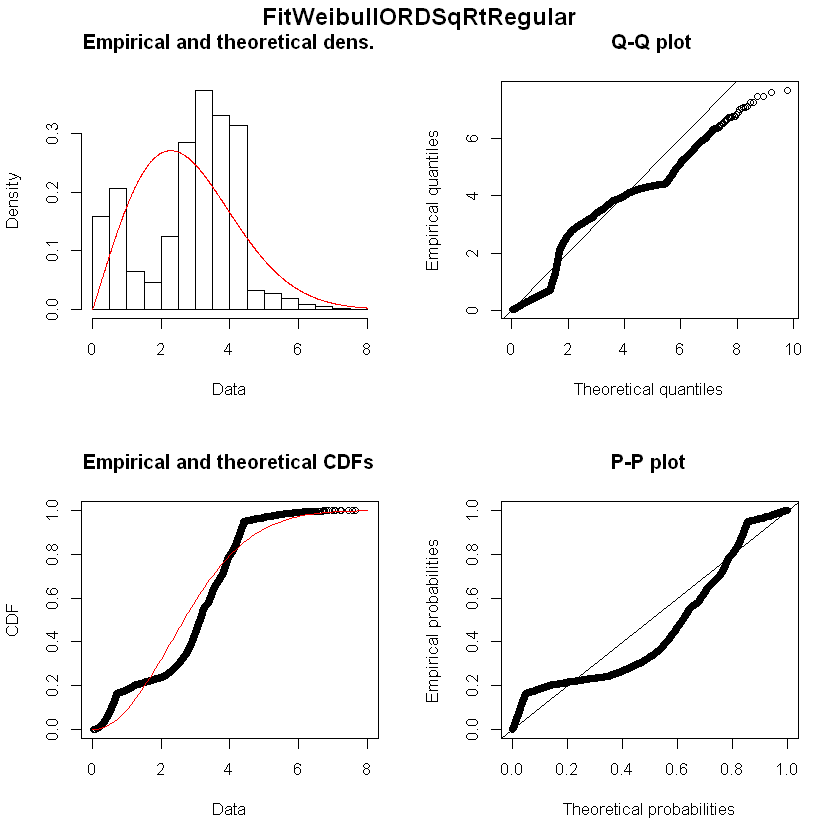

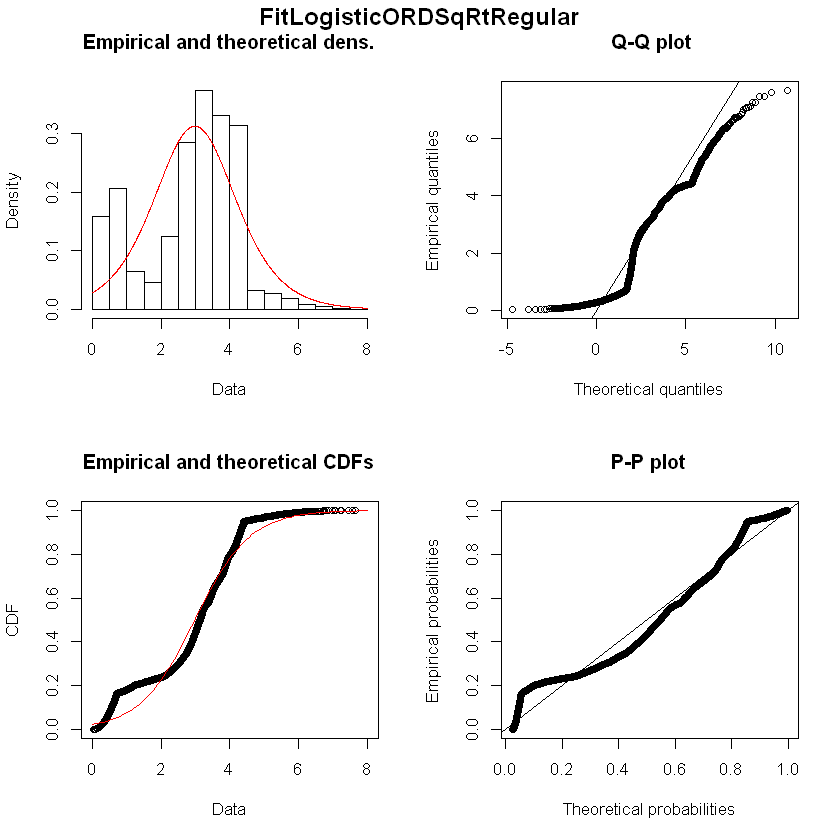

In [6]:
#!!!!!!!!! CHANGE TO R KERNEL !!!!!!!!!!!!!

#CELL NAME:  AIRPORT CURVE FIT 
#This requires cell R SETUP to be run first
#DATA TRANSFORMATIONS DO NOT APPEAR TO IMPROVE THE MODELS, NOR DOES MME, QME, OR MGE
#SO TRY REGULAR DATA ON INDIVIDUAL AIRPORTS, MLE ONLY TO SEE IF AIRPORTS ARE DIFFERENT THAN OVERALL
#IF WE DRILL DOWN TO PRECHECK VS REGULAR LANES, DOES THE DATA BECOME NORMAL?  

library(dplyr)
library(fitdistrplus)


AptWaitsR$WaitTimeContinuousSqRt <- (AptWaitsR$WaitTimeContinuous)^(1/2)
AptWaitsJFK <- AptWaitsR %>% filter(JFK==1)
AptWaitsEWR <- AptWaitsR %>% filter(EWR==1)
AptWaitsORD <- AptWaitsR %>% filter(ORD==1)

#------------START JFK--------------
FitNormalJFK <- fitdist(AptWaitsJFK$WaitTimeContinuous, "norm")
FitLogNormalJFK <- fitdist(AptWaitsJFK$WaitTimeContinuous, "lnorm") 
FitGammaJFK <- fitdist(AptWaitsJFK$WaitTimeContinuous, "gamma")
FitExponentialJFK <- fitdist(AptWaitsJFK$WaitTimeContinuous, "exp") 
FitWeibullJFK <- fitdist(AptWaitsJFK$WaitTimeContinuous, "weibull")  
FitLogisticJFK <- fitdist(AptWaitsJFK$WaitTimeContinuous, "logis") 

summary(FitNormalJFK)
summary(FitLogNormalJFK)
summary(FitGammaJFK)
summary(FitExponentialJFK)
summary(FitWeibullJFK)
summary(FitLogisticJFK)

plot(FitNormalJFK)
title(main="FitNormalJFK", outer=TRUE, line=-1)
plot(FitLogNormalJFK)
title(main="FitLogNormalJFK", outer=TRUE, line=-1)
plot(FitGammaJFK)
title(main="FitGammaJFK", outer=TRUE, line=-1)
plot(FitExponentialJFK)
title(main="FitExponentialJFK", outer=TRUE, line=-1)
plot(FitWeibullJFK)
title(main="FitWeibullJFK", outer=TRUE, line=-1)
plot(FitLogisticJFK)
title(main="FitLogisticJFK", outer=TRUE, line=-1)
#------------END JFK--------------

#------------START EWR--------------
FitNormalEWR <- fitdist(AptWaitsEWR$WaitTimeContinuous, "norm")
FitLogNormalEWR <- fitdist(AptWaitsEWR$WaitTimeContinuous, "lnorm") 
FitGammaEWR <- fitdist(AptWaitsEWR$WaitTimeContinuous, "gamma")
FitExponentialEWR <- fitdist(AptWaitsEWR$WaitTimeContinuous, "exp") 
FitWeibullEWR <- fitdist(AptWaitsEWR$WaitTimeContinuous, "weibull")  
FitLogisticEWR <- fitdist(AptWaitsEWR$WaitTimeContinuous, "logis") 

summary(FitNormalEWR)
summary(FitLogNormalEWR)
summary(FitGammaEWR)
summary(FitExponentialEWR)
summary(FitWeibullEWR)
summary(FitLogisticEWR)

plot(FitNormalEWR)
title(main="FitNormalEWR", outer=TRUE, line=-1)
plot(FitLogNormalEWR)
title(main="FitLogNormalEWR", outer=TRUE, line=-1)
plot(FitGammaEWR)
title(main="FitGammaEWR", outer=TRUE, line=-1)
plot(FitExponentialEWR)
title(main="FitExponentialEWR", outer=TRUE, line=-1)
plot(FitWeibullEWR)
title(main="FitWeibullEWR", outer=TRUE, line=-1)
plot(FitLogisticEWR)
title(main="FitLogisticEWR", outer=TRUE, line=-1)
#------------END EWR--------------

#------------START ORD--------------
FitNormalORD <- fitdist(AptWaitsORD$WaitTimeContinuous, "norm")
FitLogNormalORD <- fitdist(AptWaitsORD$WaitTimeContinuous, "lnorm") 
FitGammaORD <- fitdist(AptWaitsORD$WaitTimeContinuous, "gamma")
FitExponentialORD <- fitdist(AptWaitsORD$WaitTimeContinuous, "exp") 
FitWeibullORD <- fitdist(AptWaitsORD$WaitTimeContinuous, "weibull")  
FitLogisticORD <- fitdist(AptWaitsORD$WaitTimeContinuous, "logis") 

summary(FitNormalORD)
summary(FitLogNormalORD)
summary(FitGammaORD)
summary(FitExponentialORD)
summary(FitWeibullORD)
summary(FitLogisticORD)

plot(FitNormalORD)
title(main="FitNormalORD", outer=TRUE, line=-1)
plot(FitLogNormalORD)
title(main="FitLogNormalORD", outer=TRUE, line=-1)
plot(FitGammaORD)
title(main="FitGammaORD", outer=TRUE, line=-1)
plot(FitExponentialORD)
title(main="FitExponentialORD", outer=TRUE, line=-1)
plot(FitWeibullORD)
title(main="FitWeibullORD", outer=TRUE, line=-1)
plot(FitLogisticORD)
title(main="FitLogisticORD", outer=TRUE, line=-1)
#------------END ORD--------------


#------------START JFK PRECHECK--------------
AptWaitsJFKPre <- AptWaitsJFK %>% filter(PreCheck==1)

FitNegBinomialJFKPre <- fitdist(AptWaitsJFKPre$WaitTime, "nbinom")
FitPoissonJFKPre <- fitdist(AptWaitsJFKPre$WaitTime, "pois")
FitNormalJFKPre <- fitdist(AptWaitsJFKPre$WaitTimeContinuous, "norm")
FitLogNormalJFKPre <- fitdist(AptWaitsJFKPre$WaitTimeContinuous, "lnorm") 
FitGammaJFKPre <- fitdist(AptWaitsJFKPre$WaitTimeContinuous, "gamma")
FitExponentialJFKPre <- fitdist(AptWaitsJFKPre$WaitTimeContinuous, "exp") 
FitWeibullJFKPre <- fitdist(AptWaitsJFKPre$WaitTimeContinuous, "weibull")  
FitLogisticJFKPre <- fitdist(AptWaitsJFKPre$WaitTimeContinuous, "logis") 

summary(FitNegBinomialJFKPre)
summary(FitPoissonJFKPre)
summary(FitNormalJFKPre)
summary(FitLogNormalJFKPre)
summary(FitGammaJFKPre)
summary(FitExponentialJFKPre)
summary(FitWeibullJFKPre)
summary(FitLogisticJFKPre)

plot(FitNegBinomialJFKPre)
title(main="FitNegBinomJFKPreCheck", outer=TRUE, line=-1)
plot(FitPoissonJFKPre)
title(main="FitPoissonJFKPreCheck", outer=TRUE, line=-1)
plot(FitNormalJFKPre)
title(main="FitNormalJFKPreCheck", outer=TRUE, line=-1)
plot(FitLogNormalJFKPre)
title(main="FitLogNormalJFKPreCheck", outer=TRUE, line=-1)
plot(FitGammaJFKPre)
title(main="FitGammaJFKPreCheck", outer=TRUE, line=-1)
plot(FitExponentialJFKPre)
title(main="FitExponentialJFKPreCheck", outer=TRUE, line=-1)
plot(FitWeibullJFKPre)
title(main="FitWeibullJFKPreCheck", outer=TRUE, line=-1)
plot(FitLogisticJFKPre)
title(main="FitLogisticJFKPreCheck", outer=TRUE, line=-1)
#------------END JFK PRECHECK--------------


#------------START JFK REGULAR--------------
AptWaitsJFKReg <- AptWaitsJFK %>% filter(PreCheck==0)

FitNegBinomialJFKReg <- fitdist(AptWaitsJFKReg$WaitTime, "nbinom")
FitPoissonJFKReg <- fitdist(AptWaitsJFKReg$WaitTime, "pois")
FitNormalJFKReg <- fitdist(AptWaitsJFKReg$WaitTimeContinuous, "norm")
FitLogNormalJFKReg <- fitdist(AptWaitsJFKReg$WaitTimeContinuous, "lnorm") 
FitGammaJFKReg <- fitdist(AptWaitsJFKReg$WaitTimeContinuous, "gamma")
FitExponentialJFKReg <- fitdist(AptWaitsJFKReg$WaitTimeContinuous, "exp") 
FitWeibullJFKReg <- fitdist(AptWaitsJFKReg$WaitTimeContinuous, "weibull")  
FitLogisticJFKReg <- fitdist(AptWaitsJFKReg$WaitTimeContinuous, "logis") 

summary(FitNegBinomialJFKReg)
summary(FitPoissonJFKReg)
summary(FitNormalJFKReg)
summary(FitLogNormalJFKReg)
summary(FitGammaJFKReg)
summary(FitExponentialJFKReg)
summary(FitWeibullJFKReg)
summary(FitLogisticJFKReg)

plot(FitNegBinomialJFKReg)
title(main="FitNegBinomJFKRegular", outer=TRUE, line=-1)
plot(FitPoissonJFKReg)
title(main="FitPoissonJFKRegular", outer=TRUE, line=-1)
plot(FitNormalJFKReg)
title(main="FitNormalJFKRegular", outer=TRUE, line=-1)
plot(FitLogNormalJFKReg)
title(main="FitLogNormalJFKRegular", outer=TRUE, line=-1)
plot(FitGammaJFKReg)
title(main="FitGammaJFKRegular", outer=TRUE, line=-1)
plot(FitExponentialJFKReg)
title(main="FitExponentialJFKRegular", outer=TRUE, line=-1)
plot(FitWeibullJFKReg)
title(main="FitWeibullJFKRegular", outer=TRUE, line=-1)
plot(FitLogisticJFKReg)
title(main="FitLogisticJFKRegular", outer=TRUE, line=-1)
#------------END JFK REGULAR--------------


#------------START JFK SQRT PRECHECK--------------
#AptWaitsJFKPre <- AptWaitsJFK %>% filter(PreCheck==1)

#FitNegBinomialJFKPre <- fitdist(AptWaitsJFKPre$WaitTime, "nbinom")
#FitPoissonJFKPre <- fitdist(AptWaitsJFKPre$WaitTime, "pois")
FitNormalJFKSqRtPre <- fitdist(AptWaitsJFKPre$WaitTimeContinuousSqRt, "norm")
FitLogNormalJFKSqRtPre <- fitdist(AptWaitsJFKPre$WaitTimeContinuousSqRt, "lnorm") 
FitGammaJFKSqRtPre <- fitdist(AptWaitsJFKPre$WaitTimeContinuousSqRt, "gamma")
FitExponentialJFKSqRtPre <- fitdist(AptWaitsJFKPre$WaitTimeContinuousSqRt, "exp") 
FitWeibullJFKSqRtPre <- fitdist(AptWaitsJFKPre$WaitTimeContinuousSqRt, "weibull")  
FitLogisticJFKSqRtPre <- fitdist(AptWaitsJFKPre$WaitTimeContinuousSqRt, "logis") 

#summary(FitNegBinomialJFKPre)
#summary(FitPoissonJFKPre)
summary(FitNormalJFKSqRtPre)
summary(FitLogNormalJFKSqRtPre)
summary(FitGammaJFKSqRtPre)
summary(FitExponentialJFKSqRtPre)
summary(FitWeibullJFKSqRtPre)
summary(FitLogisticJFKSqRtPre)

#plot(FitNegBinomialJFKPre)
#title(main="FitNegBinomJFKPreCheck", outer=TRUE, line=-1)
#plot(FitPoissonJFKPre)
#title(main="FitPoissonJFKPreCheck", outer=TRUE, line=-1)
plot(FitNormalJFKSqRtPre)
title(main="FitNormalJFKSqRtPreCheck", outer=TRUE, line=-1)
plot(FitLogNormalJFKSqRtPre)
title(main="FitLogNormalJFKSqRtPreCheck", outer=TRUE, line=-1)
plot(FitGammaJFKSqRtPre)
title(main="FitGammaJFKSqRtPreCheck", outer=TRUE, line=-1)
plot(FitExponentialJFKSqRtPre)
title(main="FitExponentialJFKSqRtPreCheck", outer=TRUE, line=-1)
plot(FitWeibullJFKSqRtPre)
title(main="FitWeibullJFKSqRtPreCheck", outer=TRUE, line=-1)
plot(FitLogisticJFKSqRtPre)
title(main="FitLogisticJFKSqRtPreCheck", outer=TRUE, line=-1)
#------------END JFK SQRT PRECHECK--------------


#------------START JFK SQRT REGULAR--------------
#AptWaitsJFKReg <- AptWaitsJFK %>% filter(PreCheck==0)

#FitNegBinomialJFKReg <- fitdist(AptWaitsJFKReg$WaitTime, "nbinom")
#FitPoissonJFKReg <- fitdist(AptWaitsJFKReg$WaitTime, "pois")
FitNormalJFKSqRtReg <- fitdist(AptWaitsJFKReg$WaitTimeContinuousSqRt, "norm")
FitLogNormalJFKSqRtReg <- fitdist(AptWaitsJFKReg$WaitTimeContinuousSqRt, "lnorm") 
FitGammaJFKSqRtReg <- fitdist(AptWaitsJFKReg$WaitTimeContinuousSqRt, "gamma")
FitExponentialJFKSqRtReg <- fitdist(AptWaitsJFKReg$WaitTimeContinuousSqRt, "exp") 
FitWeibullJFKSqRtReg <- fitdist(AptWaitsJFKReg$WaitTimeContinuousSqRt, "weibull")  
FitLogisticJFKSqRtReg <- fitdist(AptWaitsJFKReg$WaitTimeContinuousSqRt, "logis") 

#summary(FitNegBinomialJFKReg)
#summary(FitPoissonJFKReg)
summary(FitNormalJFKSqRtReg)
summary(FitLogNormalJFKSqRtReg)
summary(FitGammaJFKSqRtReg)
summary(FitExponentialJFKSqRtReg)
summary(FitWeibullJFKSqRtReg)
summary(FitLogisticJFKSqRtReg)

#plot(FitNegBinomialJFKReg)
#title(main="FitNegBinomJFKRegular", outer=TRUE, line=-1)
#plot(FitPoissonJFKReg)
#title(main="FitPoissonJFKRegular", outer=TRUE, line=-1)
plot(FitNormalJFKSqRtReg)
title(main="FitNormalJFKSqRtRegular", outer=TRUE, line=-1)
plot(FitLogNormalJFKSqRtReg)
title(main="FitLogNormalJFKSqRtRegular", outer=TRUE, line=-1)
plot(FitGammaJFKSqRtReg)
title(main="FitGammaJFKSqRtRegular", outer=TRUE, line=-1)
plot(FitExponentialJFKSqRtReg)
title(main="FitExponentialJFKSqRtRegular", outer=TRUE, line=-1)
plot(FitWeibullJFKSqRtReg)
title(main="FitWeibullJFKSqRtRegular", outer=TRUE, line=-1)
plot(FitLogisticJFKSqRtReg)
title(main="FitLogisticJFKSqRtRegular", outer=TRUE, line=-1)
#------------END JFK SQRT REGULAR--------------


#------------START EWR PRECHECK--------------
AptWaitsEWRPre <- AptWaitsEWR %>% filter(PreCheck==1)

FitNegBinomialEWRPre <- fitdist(AptWaitsEWRPre$WaitTime, "nbinom")
FitPoissonEWRPre <- fitdist(AptWaitsEWRPre$WaitTime, "pois")
FitNormalEWRPre <- fitdist(AptWaitsEWRPre$WaitTimeContinuous, "norm")
FitLogNormalEWRPre <- fitdist(AptWaitsEWRPre$WaitTimeContinuous, "lnorm") 
FitGammaEWRPre <- fitdist(AptWaitsEWRPre$WaitTimeContinuous, "gamma")
FitExponentialEWRPre <- fitdist(AptWaitsEWRPre$WaitTimeContinuous, "exp") 
FitWeibullEWRPre <- fitdist(AptWaitsEWRPre$WaitTimeContinuous, "weibull")  
FitLogisticEWRPre <- fitdist(AptWaitsEWRPre$WaitTimeContinuous, "logis") 

summary(FitNegBinomialEWRPre)
summary(FitPoissonEWRPre)
summary(FitNormalEWRPre)
summary(FitLogNormalEWRPre)
summary(FitGammaEWRPre)
summary(FitExponentialEWRPre)
summary(FitWeibullEWRPre)
summary(FitLogisticEWRPre)

plot(FitNegBinomialEWRPre)
title(main="FitNegBinomEWRPreCheck", outer=TRUE, line=-1)
plot(FitPoissonEWRPre)
title(main="FitPoissonEWRPreCheck", outer=TRUE, line=-1)
plot(FitNormalEWRPre)
title(main="FitNormalEWRPreCheck", outer=TRUE, line=-1)
plot(FitLogNormalEWRPre)
title(main="FitLogNormalEWRPreCheck", outer=TRUE, line=-1)
plot(FitGammaEWRPre)
title(main="FitGammaEWRPreCheck", outer=TRUE, line=-1)
plot(FitExponentialEWRPre)
title(main="FitExponentialEWRPreCheck", outer=TRUE, line=-1)
plot(FitWeibullEWRPre)
title(main="FitWeibullEWRPreCheck", outer=TRUE, line=-1)
plot(FitLogisticEWRPre)
title(main="FitLogisticEWRPreCheck", outer=TRUE, line=-1)
#------------END EWR PRECHECK--------------


#------------START EWR REGULAR--------------
AptWaitsEWRReg <- AptWaitsEWR %>% filter(PreCheck==0)

FitNegBinomialEWRReg <- fitdist(AptWaitsEWRReg$WaitTime, "nbinom")
FitPoissonEWRReg <- fitdist(AptWaitsEWRReg$WaitTime, "pois")
FitNormalEWRReg <- fitdist(AptWaitsEWRReg$WaitTimeContinuous, "norm")
FitLogNormalEWRReg <- fitdist(AptWaitsEWRReg$WaitTimeContinuous, "lnorm") 
FitGammaEWRReg <- fitdist(AptWaitsEWRReg$WaitTimeContinuous, "gamma")
FitExponentialEWRReg <- fitdist(AptWaitsEWRReg$WaitTimeContinuous, "exp") 
FitWeibullEWRReg <- fitdist(AptWaitsEWRReg$WaitTimeContinuous, "weibull")  
FitLogisticEWRReg <- fitdist(AptWaitsEWRReg$WaitTimeContinuous, "logis") 

summary(FitNegBinomialEWRReg)
summary(FitPoissonEWRReg)
summary(FitNormalEWRReg)
summary(FitLogNormalEWRReg)
summary(FitGammaEWRReg)
summary(FitExponentialEWRReg)
summary(FitWeibullEWRReg)
summary(FitLogisticEWRReg)

plot(FitNegBinomialEWRReg)
title(main="FitNegBinomEWRRegular", outer=TRUE, line=-1)
plot(FitPoissonEWRReg)
title(main="FitPoissonEWRRegular", outer=TRUE, line=-1)
plot(FitNormalEWRReg)
title(main="FitNormalEWRRegular", outer=TRUE, line=-1)
plot(FitLogNormalEWRReg)
title(main="FitLogNormalEWRRegular", outer=TRUE, line=-1)
plot(FitGammaEWRReg)
title(main="FitGammaEWRRegular", outer=TRUE, line=-1)
plot(FitExponentialEWRReg)
title(main="FitExponentialEWRRegular", outer=TRUE, line=-1)
plot(FitWeibullEWRReg)
title(main="FitWeibullEWRRegular", outer=TRUE, line=-1)
plot(FitLogisticEWRReg)
title(main="FitLogisticEWRRegular", outer=TRUE, line=-1)
#------------END EWR REGULAR--------------


#------------START EWR SQRT PRECHECK--------------
FitNormalEWRSqRtPre <- fitdist(AptWaitsEWRPre$WaitTimeContinuousSqRt, "norm")
FitLogNormalEWRSqRtPre <- fitdist(AptWaitsEWRPre$WaitTimeContinuousSqRt, "lnorm") 
FitGammaEWRSqRtPre <- fitdist(AptWaitsEWRPre$WaitTimeContinuousSqRt, "gamma")
FitExponentialEWRSqRtPre <- fitdist(AptWaitsEWRPre$WaitTimeContinuousSqRt, "exp") 
FitWeibullEWRSqRtPre <- fitdist(AptWaitsEWRPre$WaitTimeContinuousSqRt, "weibull")  
FitLogisticEWRSqRtPre <- fitdist(AptWaitsEWRPre$WaitTimeContinuousSqRt, "logis") 

summary(FitNormalEWRSqRtPre)
summary(FitLogNormalEWRSqRtPre)
summary(FitGammaEWRSqRtPre)
summary(FitExponentialEWRSqRtPre)
summary(FitWeibullEWRSqRtPre)
summary(FitLogisticEWRSqRtPre)

plot(FitNormalEWRSqRtPre)
title(main="FitNormalEWRSqRtPreCheck", outer=TRUE, line=-1)
plot(FitLogNormalEWRSqRtPre)
title(main="FitLogNormalEWRSqRtPreCheck", outer=TRUE, line=-1)
plot(FitGammaEWRSqRtPre)
title(main="FitGammaEWRSqRtPreCheck", outer=TRUE, line=-1)
plot(FitExponentialEWRSqRtPre)
title(main="FitExponentialEWRSqRtPreCheck", outer=TRUE, line=-1)
plot(FitWeibullEWRSqRtPre)
title(main="FitWeibullEWRSqRtPreCheck", outer=TRUE, line=-1)
plot(FitLogisticEWRSqRtPre)
title(main="FitLogisticEWRSqRtPreCheck", outer=TRUE, line=-1)
#------------END EWR SQRT PRECHECK--------------


#------------START EWR SQRT REGULAR--------------
FitNormalEWRSqRtReg <- fitdist(AptWaitsEWRReg$WaitTimeContinuousSqRt, "norm")
FitLogNormalEWRSqRtReg <- fitdist(AptWaitsEWRReg$WaitTimeContinuousSqRt, "lnorm") 
FitGammaEWRSqRtReg <- fitdist(AptWaitsEWRReg$WaitTimeContinuousSqRt, "gamma")
FitExponentialEWRSqRtReg <- fitdist(AptWaitsEWRReg$WaitTimeContinuousSqRt, "exp") 
FitWeibullEWRSqRtReg <- fitdist(AptWaitsEWRReg$WaitTimeContinuousSqRt, "weibull")  
FitLogisticEWRSqRtReg <- fitdist(AptWaitsEWRReg$WaitTimeContinuousSqRt, "logis") 

summary(FitNormalEWRSqRtReg)
summary(FitLogNormalEWRSqRtReg)
summary(FitGammaEWRSqRtReg)
summary(FitExponentialEWRSqRtReg)
summary(FitWeibullEWRSqRtReg)
summary(FitLogisticEWRSqRtReg)

plot(FitNormalEWRSqRtReg)
title(main="FitNormalEWRSqRtRegular", outer=TRUE, line=-1)
plot(FitLogNormalEWRSqRtReg)
title(main="FitLogNormalEWRSqRtRegular", outer=TRUE, line=-1)
plot(FitGammaEWRSqRtReg)
title(main="FitGammaEWRSqRtRegular", outer=TRUE, line=-1)
plot(FitExponentialEWRSqRtReg)
title(main="FitExponentialEWRSqRtRegular", outer=TRUE, line=-1)
plot(FitWeibullEWRSqRtReg)
title(main="FitWeibullEWRSqRtRegular", outer=TRUE, line=-1)
plot(FitLogisticEWRSqRtReg)
title(main="FitLogisticEWRSqRtRegular", outer=TRUE, line=-1)
#------------END EWR SQRT REGULAR--------------


#------------START ORD PRECHECK--------------
AptWaitsORDPre <- AptWaitsORD %>% filter(PreCheck==1)

FitNegBinomialORDPre <- fitdist(AptWaitsORDPre$WaitTime, "nbinom")
FitPoissonORDPre <- fitdist(AptWaitsORDPre$WaitTime, "pois")
FitNormalORDPre <- fitdist(AptWaitsORDPre$WaitTimeContinuous, "norm")
FitLogNormalORDPre <- fitdist(AptWaitsORDPre$WaitTimeContinuous, "lnorm") 
FitGammaORDPre <- fitdist(AptWaitsORDPre$WaitTimeContinuous, "gamma")
FitExponentialORDPre <- fitdist(AptWaitsORDPre$WaitTimeContinuous, "exp") 
FitWeibullORDPre <- fitdist(AptWaitsORDPre$WaitTimeContinuous, "weibull")  
FitLogisticORDPre <- fitdist(AptWaitsORDPre$WaitTimeContinuous, "logis") 

summary(FitNegBinomialORDPre)
summary(FitPoissonORDPre)
summary(FitNormalORDPre)
summary(FitLogNormalORDPre)
summary(FitGammaORDPre)
summary(FitExponentialORDPre)
summary(FitWeibullORDPre)
summary(FitLogisticORDPre)

plot(FitNegBinomialORDPre)
title(main="FitNegBinomORDPreCheck", outer=TRUE, line=-1)
plot(FitPoissonORDPre)
title(main="FitPoissonORDPreCheck", outer=TRUE, line=-1)
plot(FitNormalORDPre)
title(main="FitNormalORDPreCheck", outer=TRUE, line=-1)
plot(FitLogNormalORDPre)
title(main="FitLogNormalORDPreCheck", outer=TRUE, line=-1)
plot(FitGammaORDPre)
title(main="FitGammaORDPreCheck", outer=TRUE, line=-1)
plot(FitExponentialORDPre)
title(main="FitExponentialORDPreCheck", outer=TRUE, line=-1)
plot(FitWeibullORDPre)
title(main="FitWeibullORDPreCheck", outer=TRUE, line=-1)
plot(FitLogisticORDPre)
title(main="FitLogisticORDPreCheck", outer=TRUE, line=-1)
#------------END ORD PRECHECK--------------


#------------START ORD REGULAR--------------
AptWaitsORDReg <- AptWaitsORD %>% filter(PreCheck==0)

FitNegBinomialORDReg <- fitdist(AptWaitsORDReg$WaitTime, "nbinom")
FitPoissonORDReg <- fitdist(AptWaitsORDReg$WaitTime, "pois")
FitNormalORDReg <- fitdist(AptWaitsORDReg$WaitTimeContinuous, "norm")
FitLogNormalORDReg <- fitdist(AptWaitsORDReg$WaitTimeContinuous, "lnorm") 
FitGammaORDReg <- fitdist(AptWaitsORDReg$WaitTimeContinuous, "gamma")
FitExponentialORDReg <- fitdist(AptWaitsORDReg$WaitTimeContinuous, "exp") 
FitWeibullORDReg <- fitdist(AptWaitsORDReg$WaitTimeContinuous, "weibull")  
FitLogisticORDReg <- fitdist(AptWaitsORDReg$WaitTimeContinuous, "logis") 

summary(FitNegBinomialORDReg)
summary(FitPoissonORDReg)
summary(FitNormalORDReg)
summary(FitLogNormalORDReg)
summary(FitGammaORDReg)
summary(FitExponentialORDReg)
summary(FitWeibullORDReg)
summary(FitLogisticORDReg)

plot(FitNegBinomialORDReg)
title(main="FitNegBinomORDRegular", outer=TRUE, line=-1)
plot(FitPoissonORDReg)
title(main="FitPoissonORDRegular", outer=TRUE, line=-1)
plot(FitNormalORDReg)
title(main="FitNormalORDRegular", outer=TRUE, line=-1)
plot(FitLogNormalORDReg)
title(main="FitLogNormalORDRegular", outer=TRUE, line=-1)
plot(FitGammaORDReg)
title(main="FitGammaORDRegular", outer=TRUE, line=-1)
plot(FitExponentialORDReg)
title(main="FitExponentialORDRegular", outer=TRUE, line=-1)
plot(FitWeibullORDReg)
title(main="FitWeibullORDRegular", outer=TRUE, line=-1)
plot(FitLogisticORDReg)
title(main="FitLogisticORDRegular", outer=TRUE, line=-1)
#------------END ORD REGULAR--------------



#------------START ORD SQRT PRECHECK--------------
FitNormalORDSqRtPre <- fitdist(AptWaitsORDPre$WaitTimeContinuousSqRt, "norm")
FitLogNormalORDSqRtPre <- fitdist(AptWaitsORDPre$WaitTimeContinuousSqRt, "lnorm") 
FitGammaORDSqRtPre <- fitdist(AptWaitsORDPre$WaitTimeContinuousSqRt, "gamma")
FitExponentialORDSqRtPre <- fitdist(AptWaitsORDPre$WaitTimeContinuousSqRt, "exp") 
FitWeibullORDSqRtPre <- fitdist(AptWaitsORDPre$WaitTimeContinuousSqRt, "weibull")  
FitLogisticORDSqRtPre <- fitdist(AptWaitsORDPre$WaitTimeContinuousSqRt, "logis") 

summary(FitNormalORDSqRtPre)
summary(FitLogNormalORDSqRtPre)
summary(FitGammaORDSqRtPre)
summary(FitExponentialORDSqRtPre)
summary(FitWeibullORDSqRtPre)
summary(FitLogisticORDSqRtPre)

plot(FitNormalORDSqRtPre)
title(main="FitNormalORDSqRtPreCheck", outer=TRUE, line=-1)
plot(FitLogNormalORDSqRtPre)
title(main="FitLogNormalORDSqRtPreCheck", outer=TRUE, line=-1)
plot(FitGammaORDSqRtPre)
title(main="FitGammaORDSqRtPreCheck", outer=TRUE, line=-1)
plot(FitExponentialORDSqRtPre)
title(main="FitExponentialORDSqRtPreCheck", outer=TRUE, line=-1)
plot(FitWeibullORDSqRtPre)
title(main="FitWeibullORDSqRtPreCheck", outer=TRUE, line=-1)
plot(FitLogisticORDSqRtPre)
title(main="FitLogisticORDSqRtPreCheck", outer=TRUE, line=-1)
#------------END ORD SQRT PRECHECK--------------


#------------START ORD SQRT REGULAR--------------
FitNormalORDSqRtReg <- fitdist(AptWaitsORDReg$WaitTimeContinuousSqRt, "norm")
FitLogNormalORDSqRtReg <- fitdist(AptWaitsORDReg$WaitTimeContinuousSqRt, "lnorm") 
FitGammaORDSqRtReg <- fitdist(AptWaitsORDReg$WaitTimeContinuousSqRt, "gamma")
FitExponentialORDSqRtReg <- fitdist(AptWaitsORDReg$WaitTimeContinuousSqRt, "exp") 
FitWeibullORDSqRtReg <- fitdist(AptWaitsORDReg$WaitTimeContinuousSqRt, "weibull")  
FitLogisticORDSqRtReg <- fitdist(AptWaitsORDReg$WaitTimeContinuousSqRt, "logis") 

summary(FitNormalORDSqRtReg)
summary(FitLogNormalORDSqRtReg)
summary(FitGammaORDSqRtReg)
summary(FitExponentialORDSqRtReg)
summary(FitWeibullORDSqRtReg)
summary(FitLogisticORDSqRtReg)

plot(FitNormalORDSqRtReg)
title(main="FitNormalORDSqRtRegular", outer=TRUE, line=-1)
plot(FitLogNormalORDSqRtReg)
title(main="FitLogNormalORDSqRtRegular", outer=TRUE, line=-1)
plot(FitGammaORDSqRtReg)
title(main="FitGammaORDSqRtRegular", outer=TRUE, line=-1)
plot(FitExponentialORDSqRtReg)
title(main="FitExponentialORDSqRtRegular", outer=TRUE, line=-1)
plot(FitWeibullORDSqRtReg)
title(main="FitWeibullORDSqRtRegular", outer=TRUE, line=-1)
plot(FitLogisticORDSqRtReg)
title(main="FitLogisticORDSqRtRegular", outer=TRUE, line=-1)
#------------END ORD SQRT REGULAR--------------







Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
        estimate Std. Error
shape1  1.250419 0.01377103
shape2 14.102006 0.18614226
Loglikelihood:  20388.44   AIC:  -40772.89   BIC:  -40757.9 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.8054574
shape2 0.8054574 1.0000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
mean 0.08164199 0.0005738881
sd   0.06616410 0.0004053831
Loglikelihood:  17235.45   AIC:  -34466.91   BIC:  -34451.92 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
meanlog -2.925348 0.009178634
sdlog    1.058213 0.006490248
Loglikelihood:  19271.1   AIC:  -38538.2   BIC:  -38523.21 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
      estimate Std. Error
shape  1.33287 0.01474879
rate  16.32463 0.21834053
Loglikelihood:  20321.7   AIC:  -40639.41   BIC:  -40624.42 
Correlation matrix:
          shape      rate
shape 1.0000000 0.8273275
rate  0.8273275 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate  12.2486  0.1062408
Loglikelihood:  20009.93   AIC:  -40017.86   BIC:  -40010.37 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
shape 1.2063054 0.0082999515
scale 0.0868927 0.0006579774
Loglikelihood:  20350.74   AIC:  -40697.49   BIC:  -40682.5 
Correlation matrix:
          shape     scale
shape 1.0000000 0.3151038
scale 0.3151038 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
           estimate   Std. Error
location 0.07385659 0.0005825708
scale    0.03794842 0.0002709429
Loglikelihood:  17111.32   AIC:  -34218.64   BIC:  -34203.65 
Correlation matrix:
          location     scale
location 1.0000000 0.1149835
scale    0.1149835 1.0000000


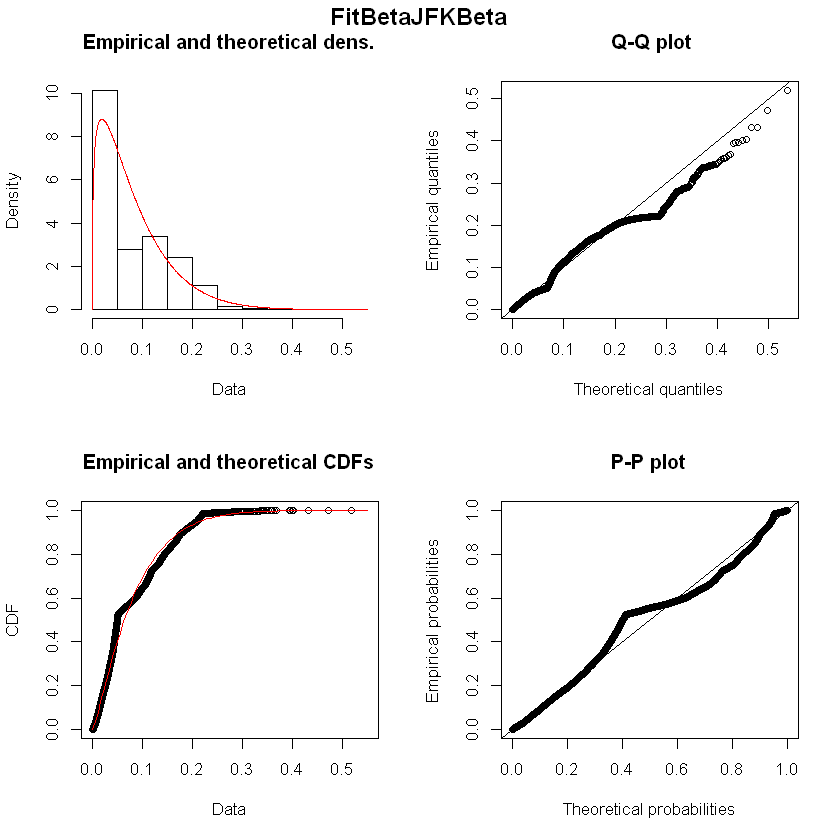

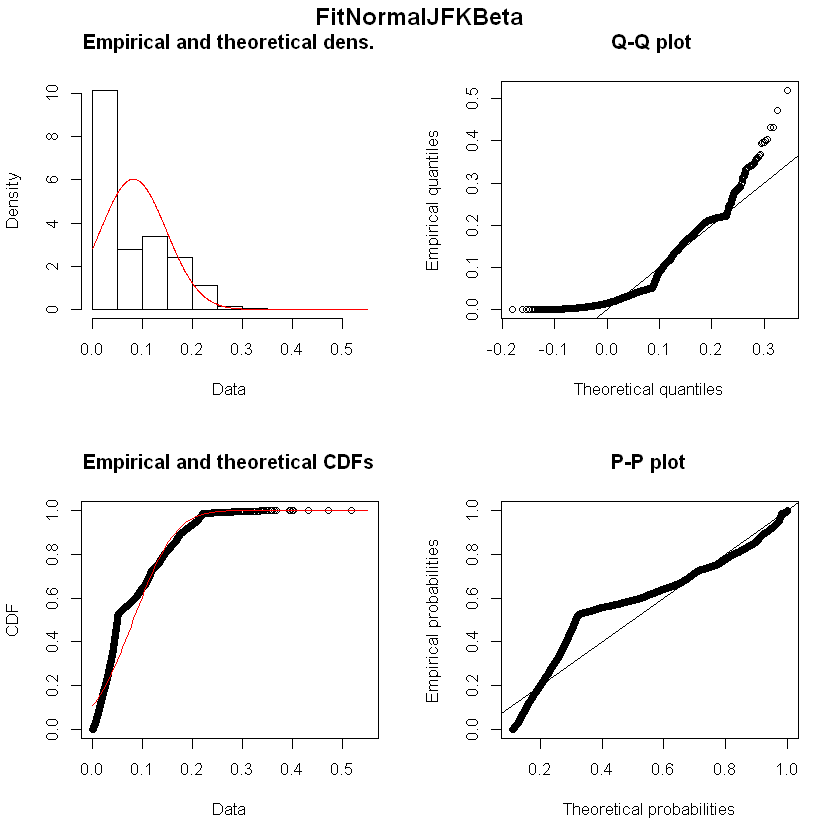

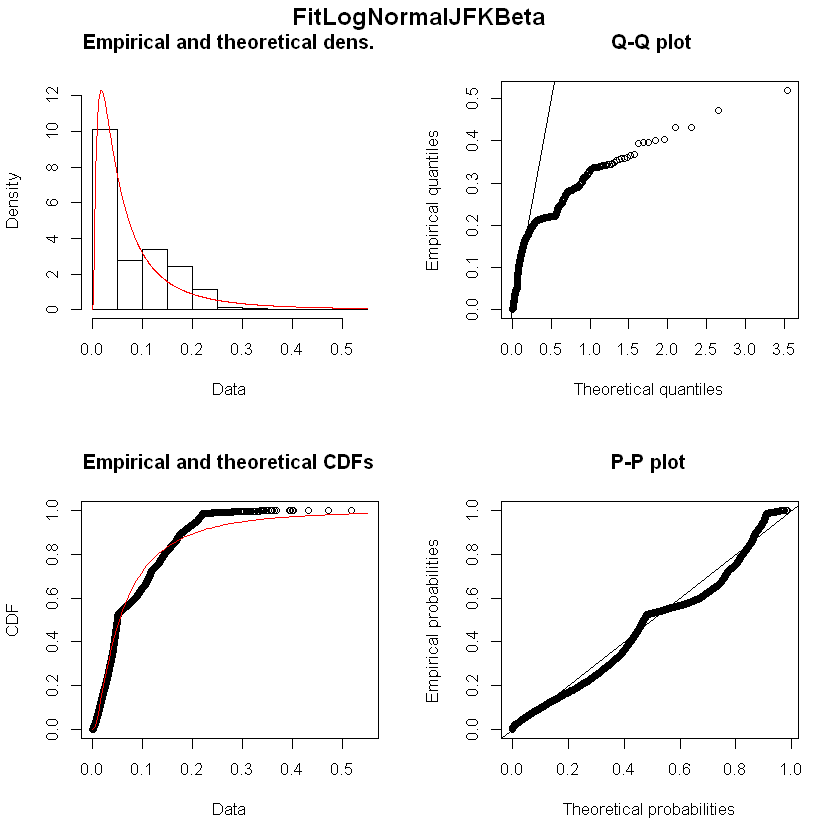

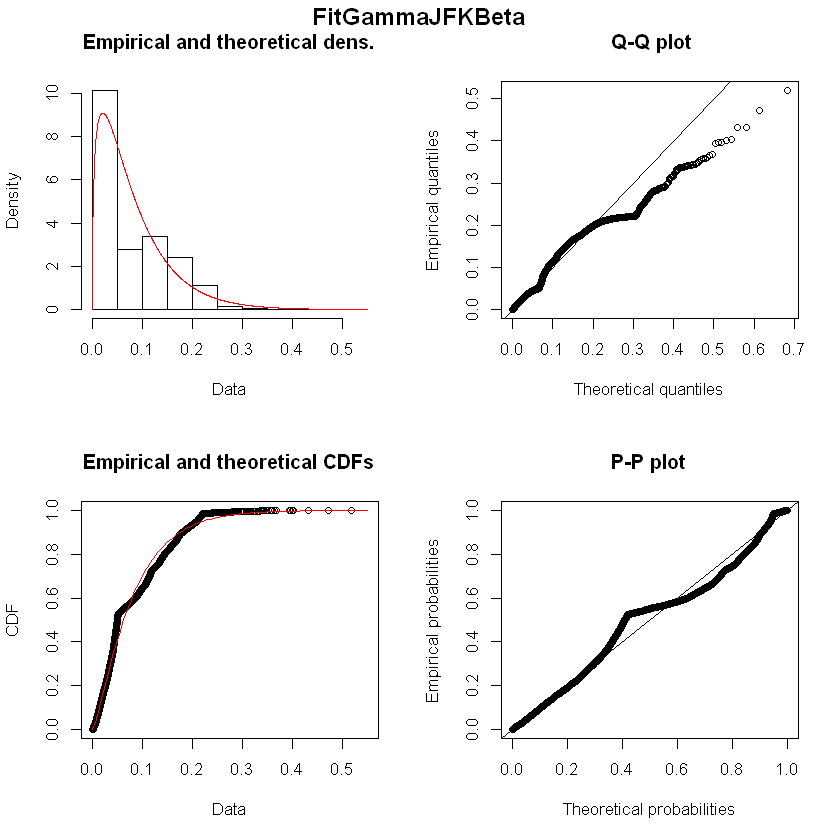

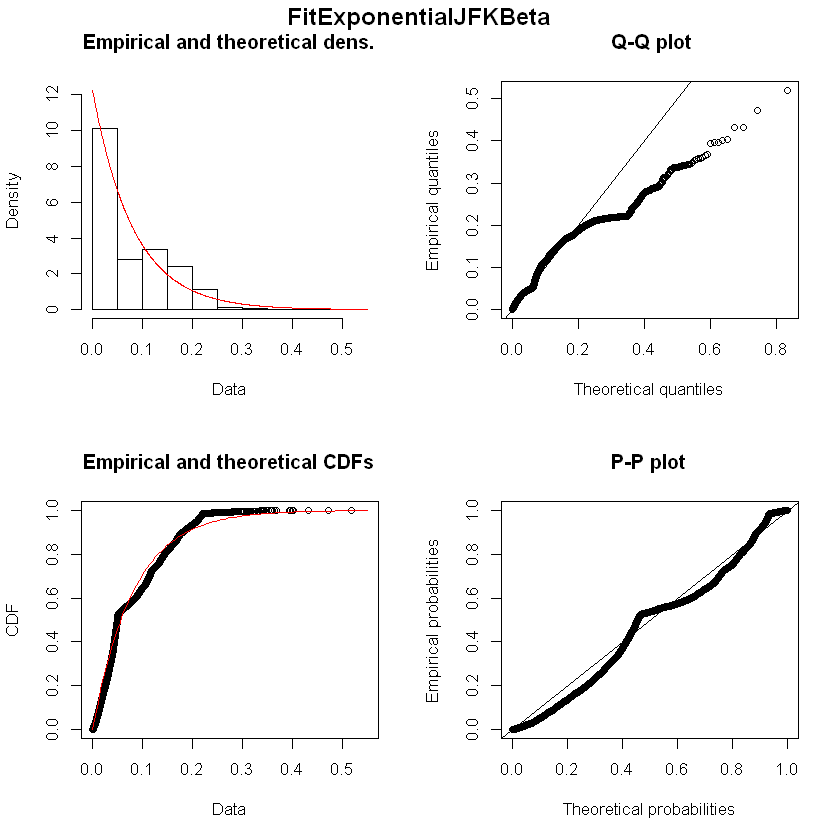

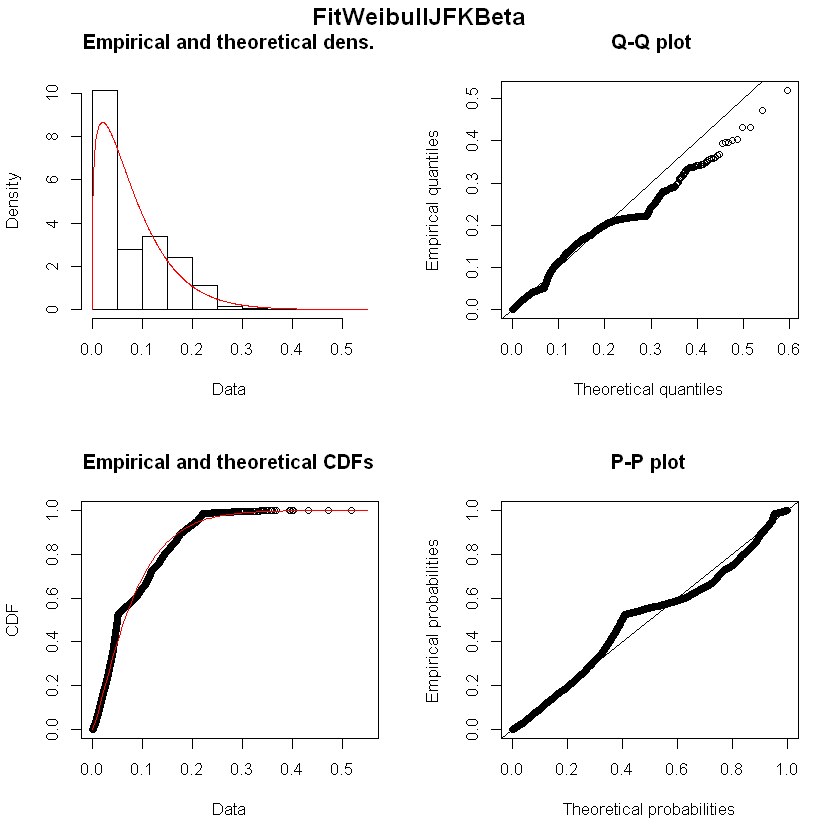

Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
        estimate  Std. Error
shape1 0.8109733 0.008901577
shape2 9.7515328 0.140111774
Loglikelihood:  19559.04   AIC:  -39114.08   BIC:  -39099.23 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.7261167
shape2 0.7261167 1.0000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
mean 0.07744566 0.0006573185
sd   0.07320180 0.0004644041
Loglikelihood:  14827.79   AIC:  -29651.58   BIC:  -29636.73 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
meanlog -3.249345 0.012906565
sdlog    1.437330 0.009126299
Loglikelihood:  18201.41   AIC:  -36398.83   BIC:  -36383.97 
Correlation matrix:
             meanlog        sdlog
meanlog 1.000000e+00 1.071286e-10
sdlog   1.071286e-10 1.000000e+00


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
        estimate  Std. Error
shape  0.8517246 0.009386282
rate  10.9986656 0.161690431
Loglikelihood:  19435.41   AIC:  -38866.82   BIC:  -38851.96 
Correlation matrix:
          shape      rate
shape 1.0000000 0.7496354
rate  0.7496354 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate 12.91228  0.1159463
Loglikelihood:  19324.53   AIC:  -38647.07   BIC:  -38639.64 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
        estimate   Std. Error
shape 0.91764214 0.0066986394
scale 0.07455144 0.0007667708
Loglikelihood:  19396.35   AIC:  -38788.7   BIC:  -38773.85 
Correlation matrix:
          shape     scale
shape 1.0000000 0.3098387
scale 0.3098387 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
           estimate   Std. Error
location 0.06884740 0.0006827789
scale    0.04265168 0.0003131047
Loglikelihood:  14601.87   AIC:  -29199.74   BIC:  -29184.89 
Correlation matrix:
          location     scale
location 1.0000000 0.1214347
scale    0.1214347 1.0000000


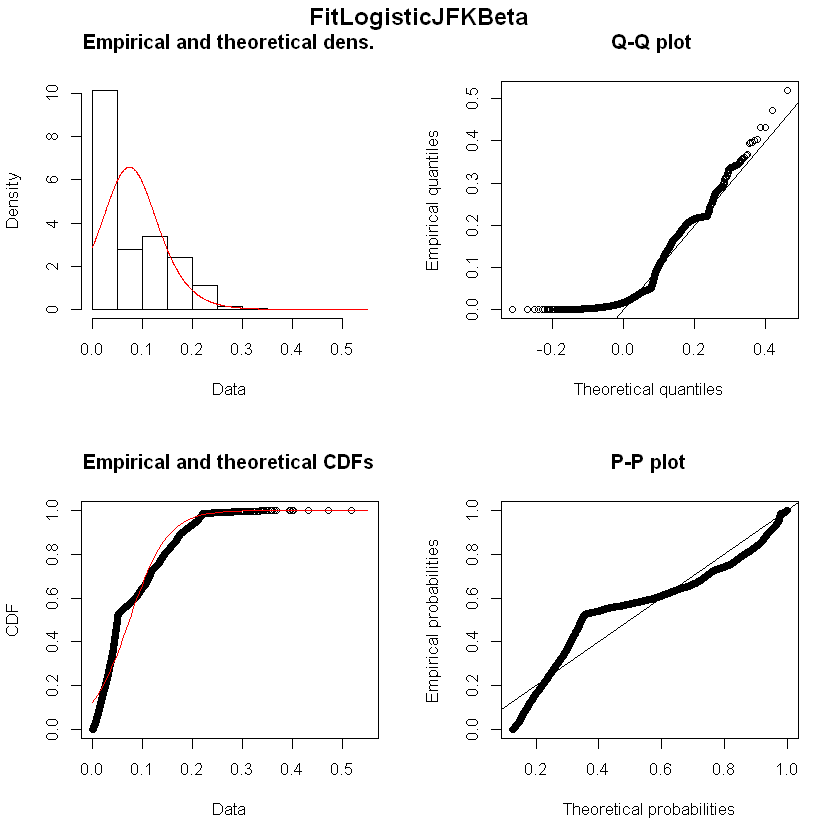

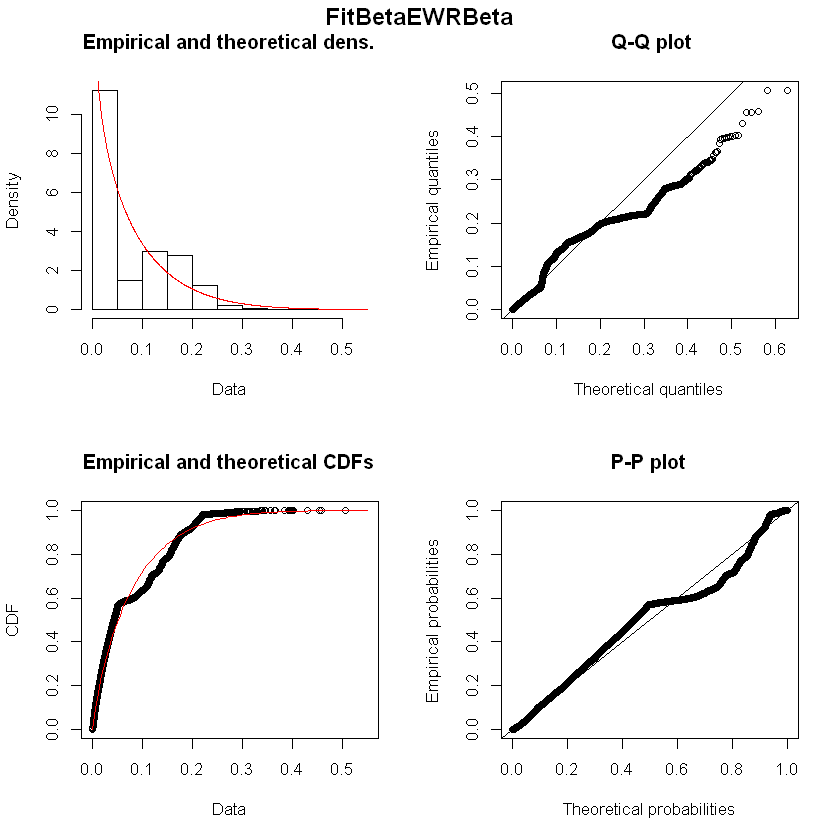

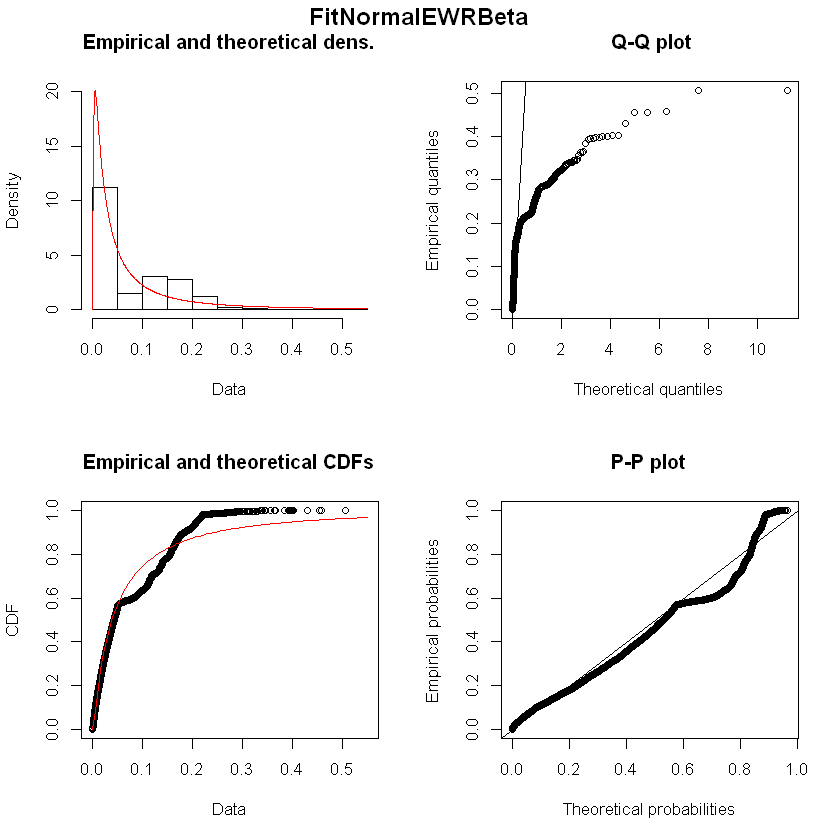

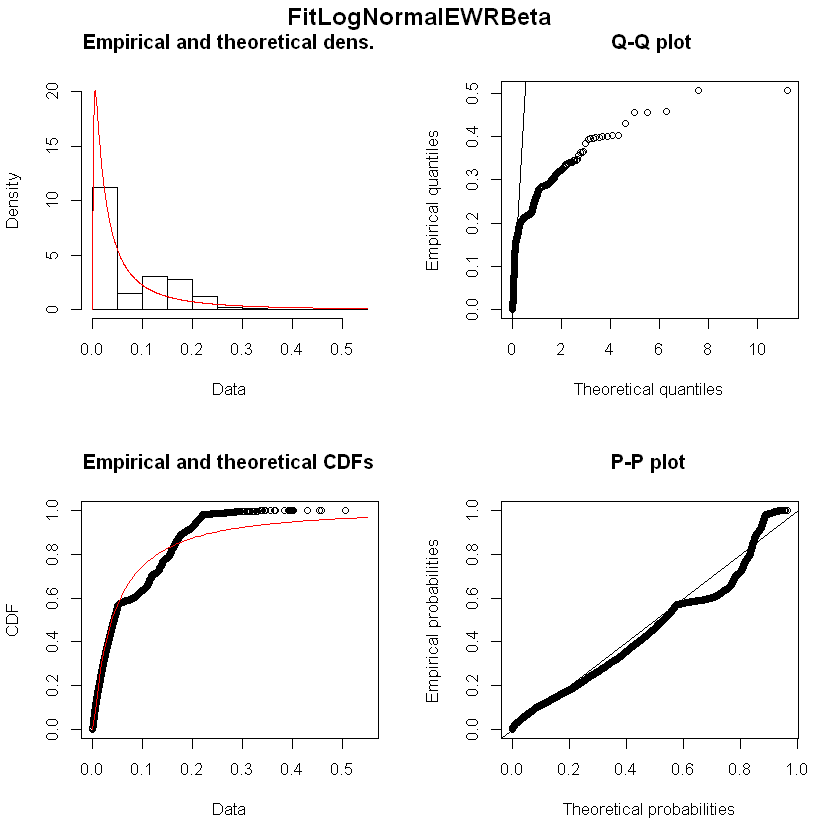

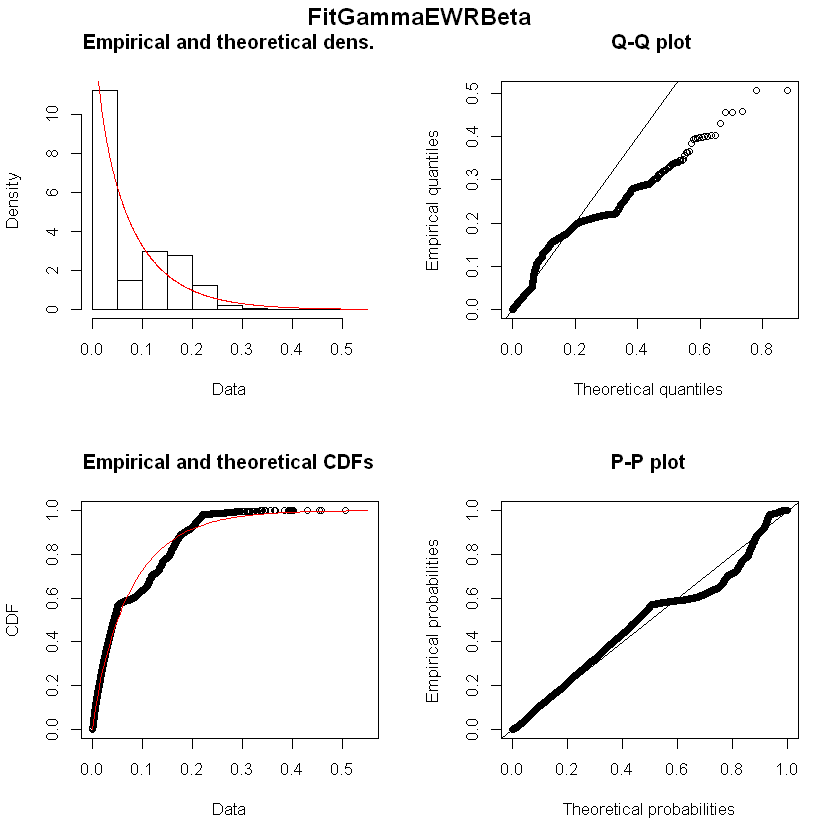

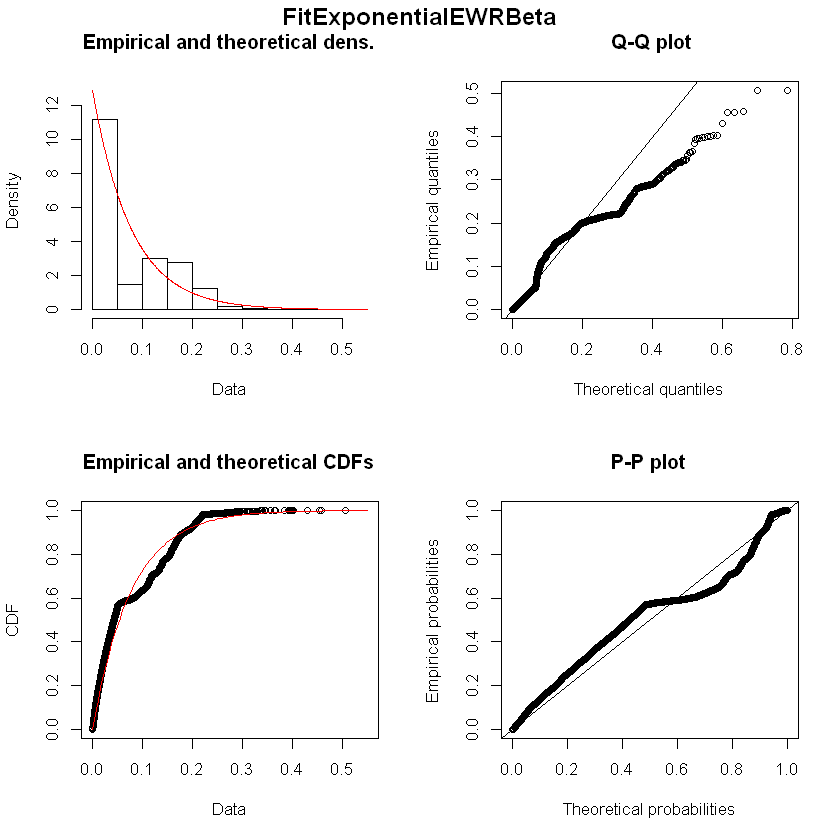

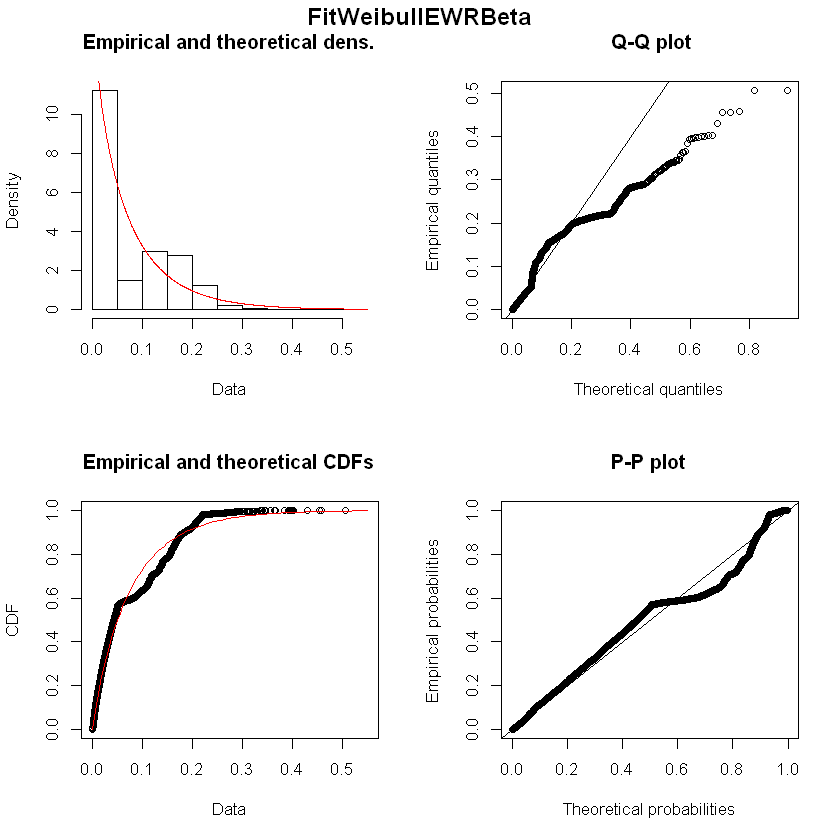

Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
        estimate  Std. Error
shape1 0.7756627 0.008418286
shape2 9.1505427 0.131272934
Loglikelihood:  19692.33   AIC:  -39380.66   BIC:  -39365.78 
Correlation matrix:
         shape1   shape2
shape1 1.000000 0.716705
shape2 0.716705 1.000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
mean 0.07831413 0.0007104108
sd   0.07968643 0.0005019803
Loglikelihood:  13975.05   AIC:  -27946.09   BIC:  -27931.21 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
meanlog -3.266199 0.013224331
sdlog    1.483367 0.009350995
Loglikelihood:  18280.97   AIC:  -36557.93   BIC:  -36543.05 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
        estimate  Std. Error
shape  0.8223049 0.008967868
rate  10.5016986 0.154196010
Loglikelihood:  19634.68   AIC:  -39265.36   BIC:  -39250.48 
Correlation matrix:
          shape      rate
shape 1.0000000 0.7427502
rate  0.7427502 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate 12.76909  0.1138374
Loglikelihood:  19464.7   AIC:  -38927.39   BIC:  -38919.95 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
        estimate   Std. Error
shape 0.89292120 0.0063880462
scale 0.07431517 0.0007797086
Loglikelihood:  19596.89   AIC:  -39189.78   BIC:  -39174.9 
Correlation matrix:
          shape     scale
shape 1.0000000 0.3089819
scale 0.3089819 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
           estimate   Std. Error
location 0.06724108 0.0006711141
scale    0.04296854 0.0003188135
Loglikelihood:  14423.92   AIC:  -28843.85   BIC:  -28828.97 
Correlation matrix:
          location     scale
location 1.0000000 0.1268073
scale    0.1268073 1.0000000


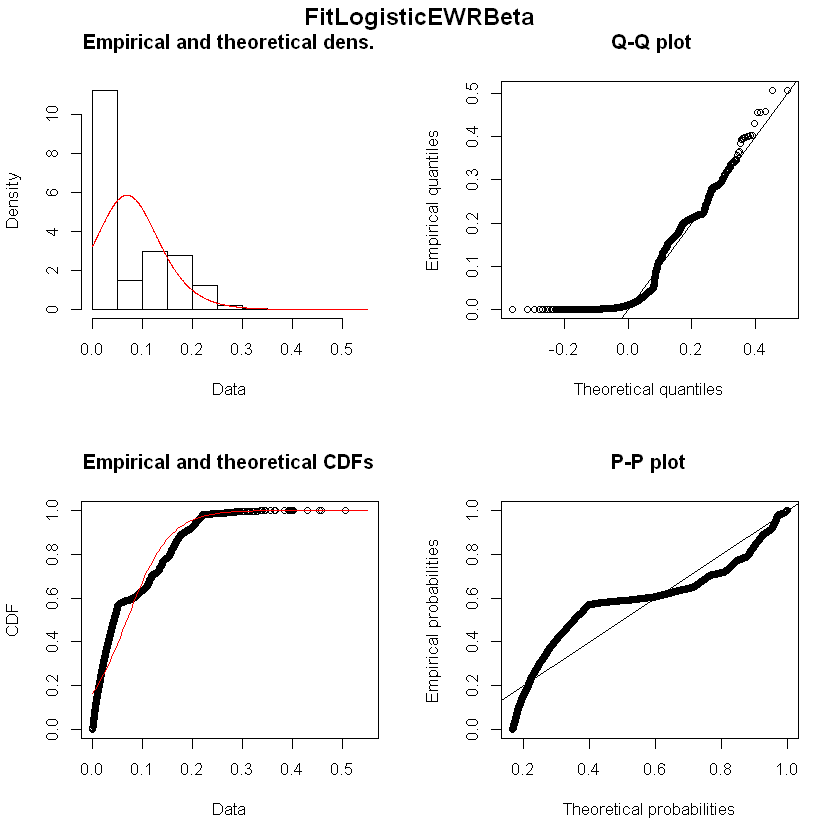

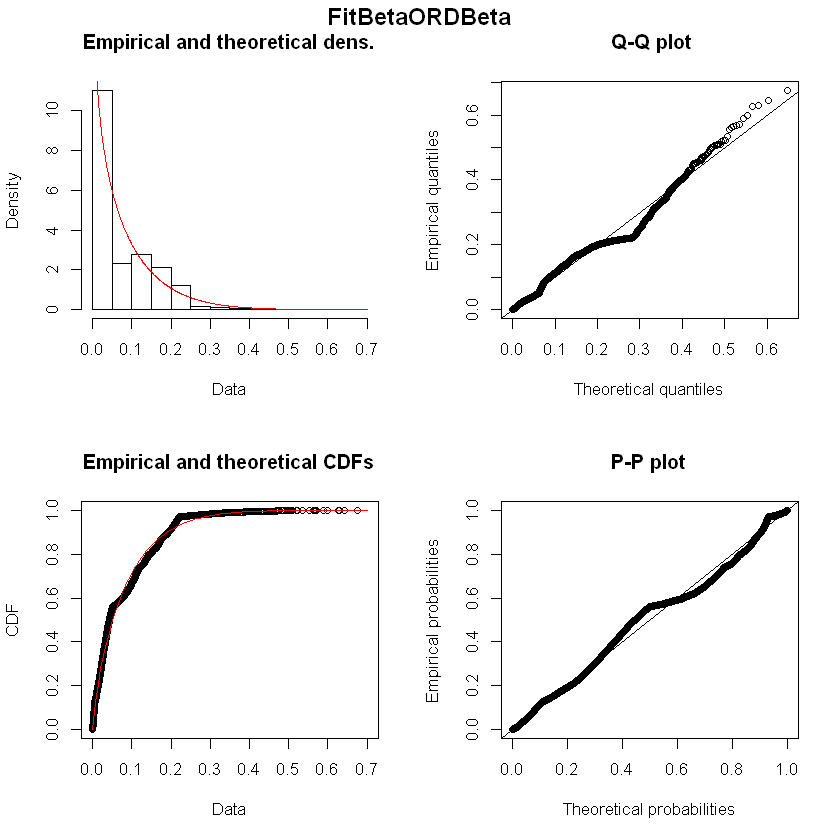

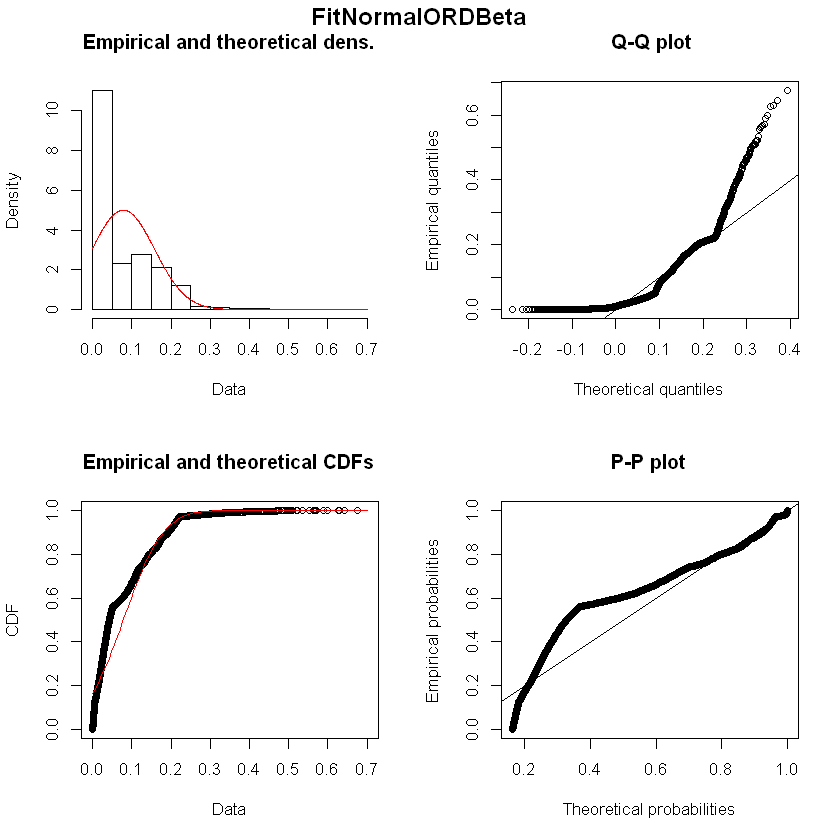

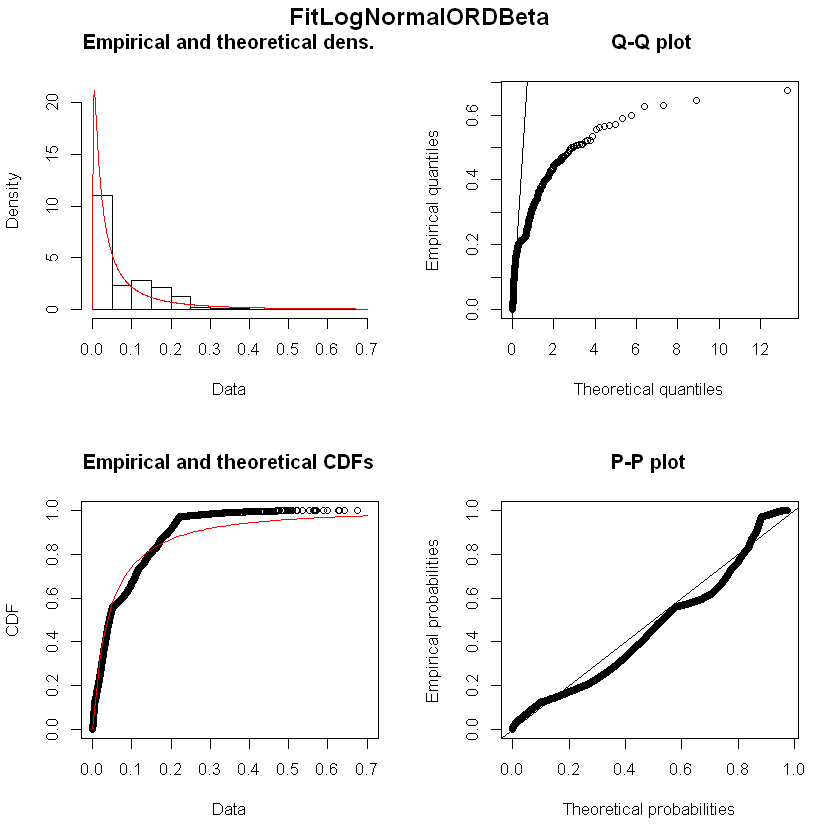

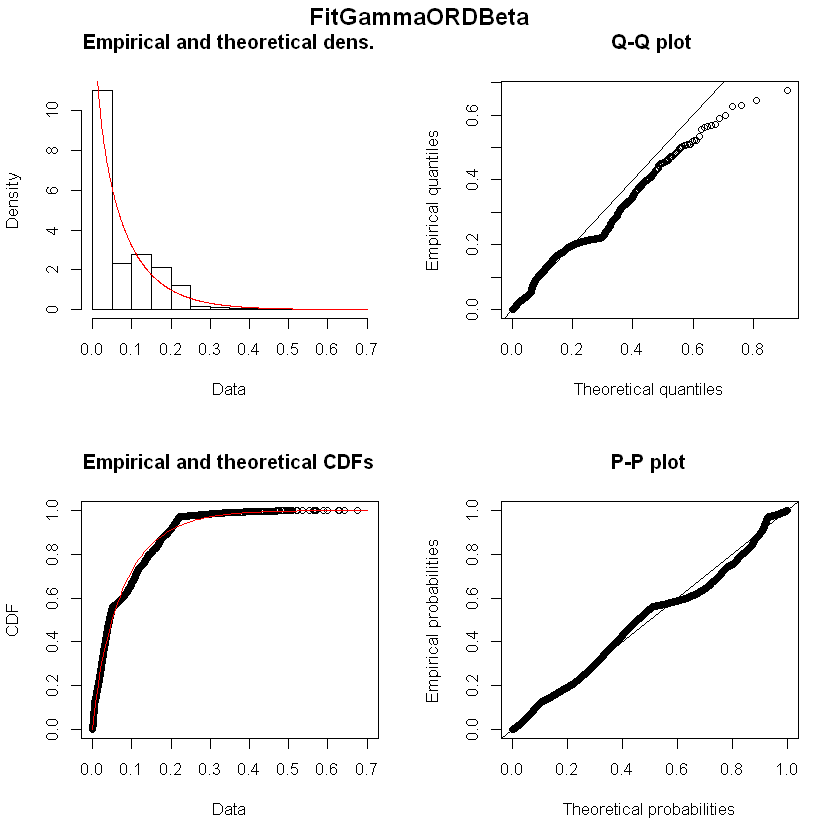

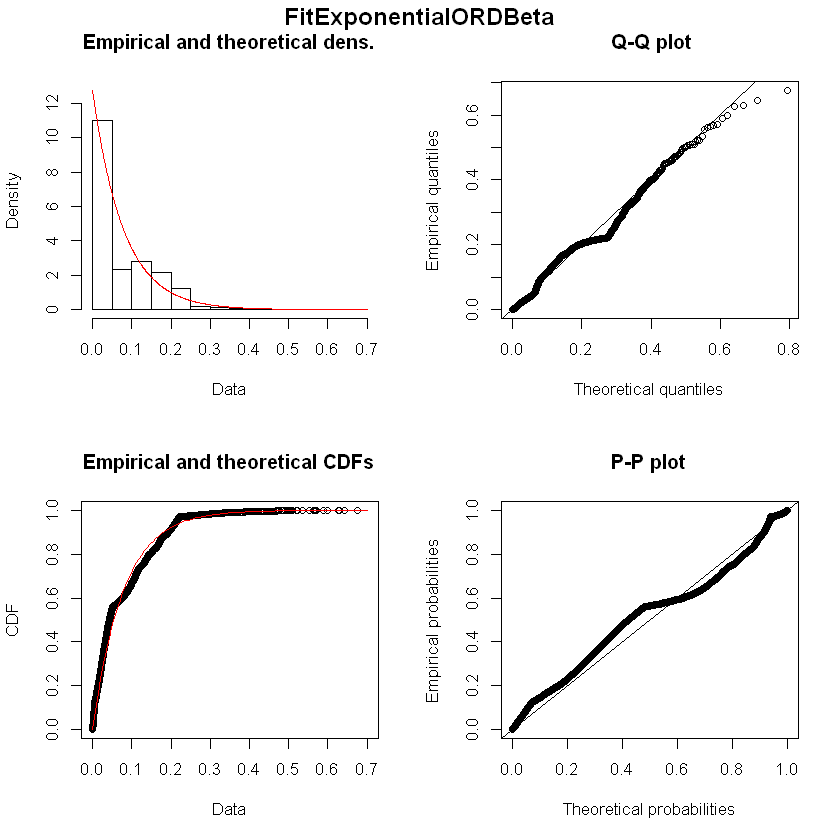

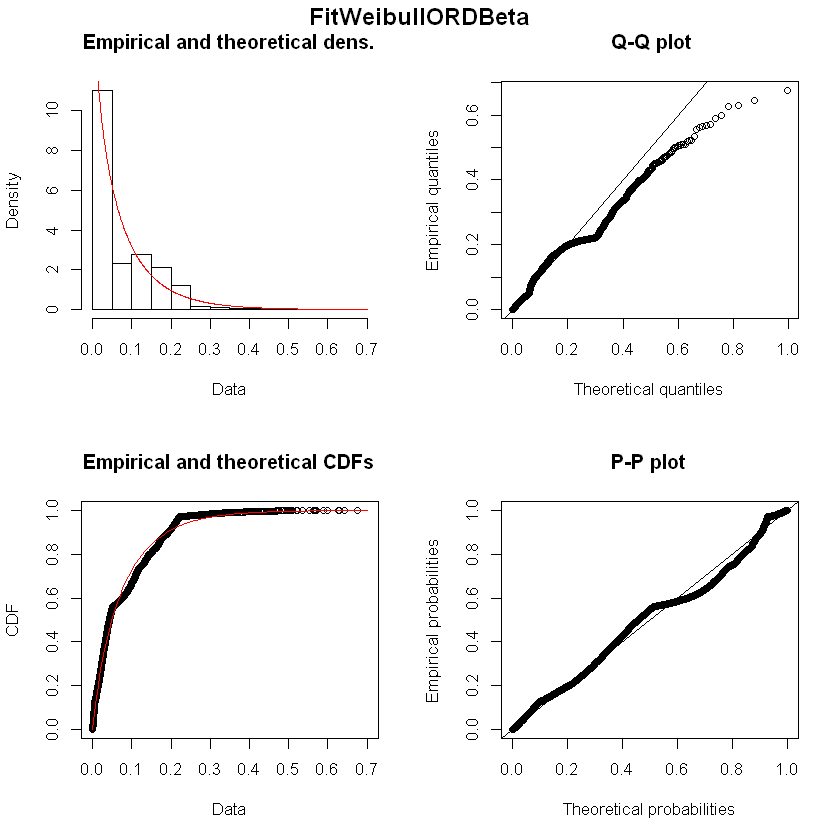

Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
        estimate Std. Error
shape1  2.605666 0.04496849
shape2 80.047557 1.51813654
Loglikelihood:  15931.45   AIC:  -31858.89   BIC:  -31845.5 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.9043091
shape2 0.9043091 1.0000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
mean 0.03160257 0.0001856089
sd   0.01434362 0.0001283861
Loglikelihood:  16873.95   AIC:  -33743.91   BIC:  -33730.52 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
meanlog -3.6552498 0.010643055
sdlog    0.8224816 0.007525726
Loglikelihood:  14522.35   AIC:  -29040.71   BIC:  -29027.32 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape  2.646526 0.04570947
rate  83.747865 1.59247748
Loglikelihood:  15887.59   AIC:  -31771.18   BIC:  -31757.79 
Correlation matrix:
          shape      rate
shape 1.0000000 0.9083024
rate  0.9083024 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate 31.64299  0.4094658
Loglikelihood:  14658.37   AIC:  -29314.75   BIC:  -29308.05 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
shape 2.2008404 0.0243217578
scale 0.0351893 0.0002138618
Loglikelihood:  16516.43   AIC:  -33028.86   BIC:  -33015.47 
Correlation matrix:
         shape    scale
shape 1.000000 0.267255
scale 0.267255 1.000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
            estimate  Std. Error
location 0.032567023 1.94138e-04
scale    0.008448038 8.52831e-05
Loglikelihood:  16721.98   AIC:  -33439.96   BIC:  -33426.57 
Correlation matrix:
            location       scale
location  1.00000000 -0.06605467
scale    -0.06605467  1.00000000


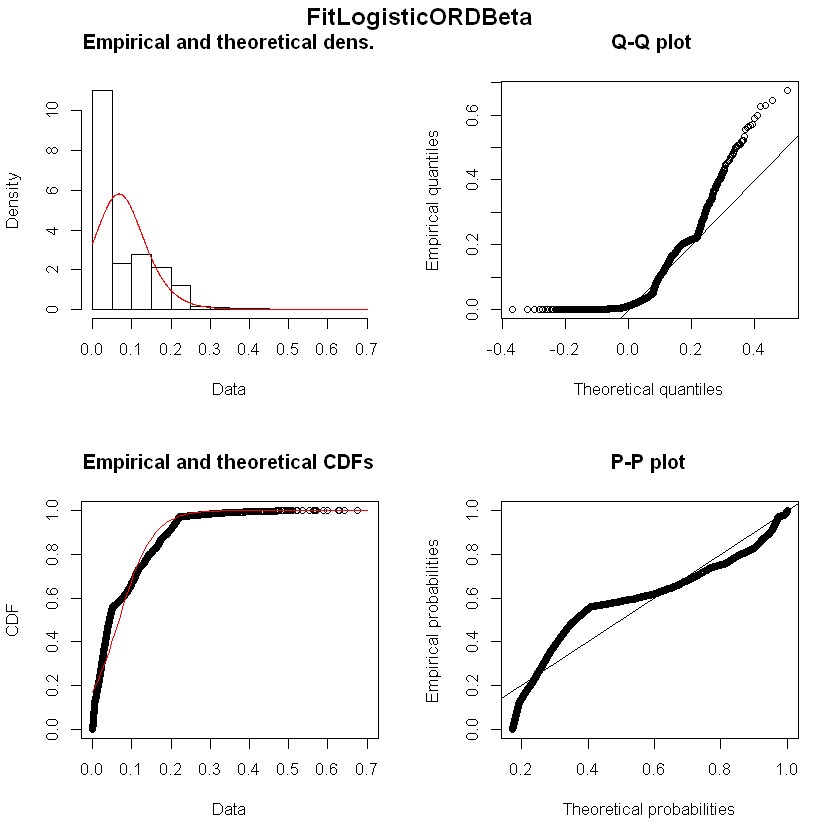

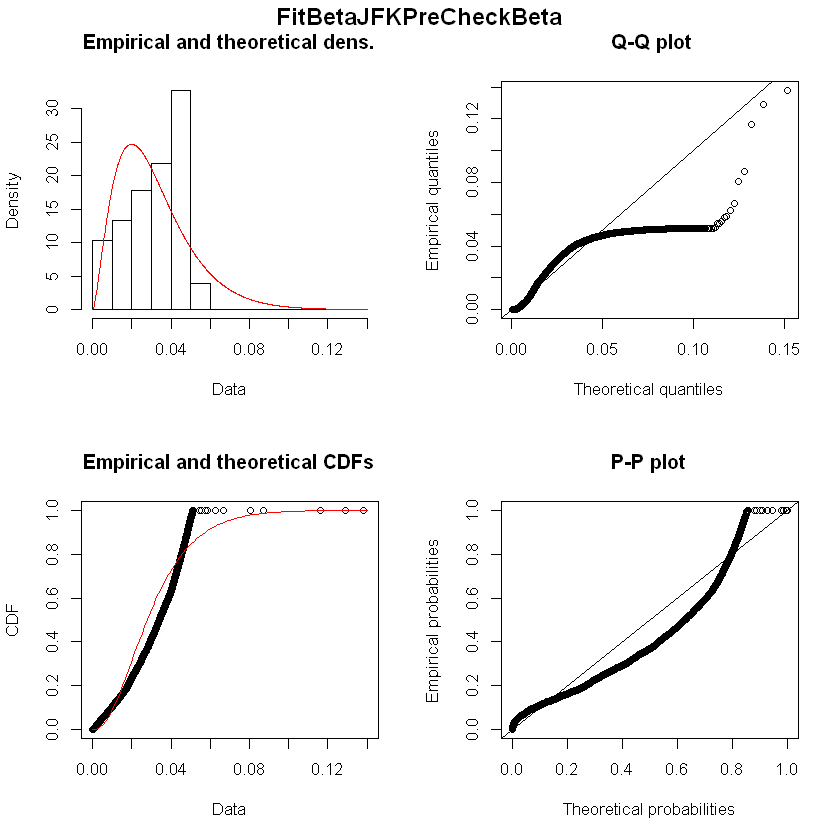

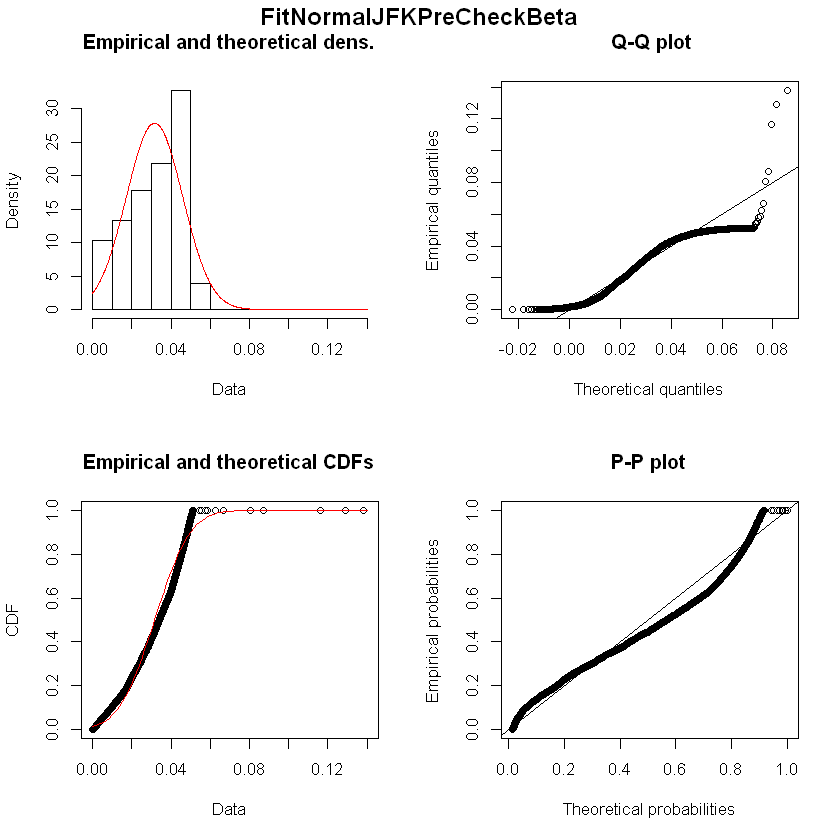

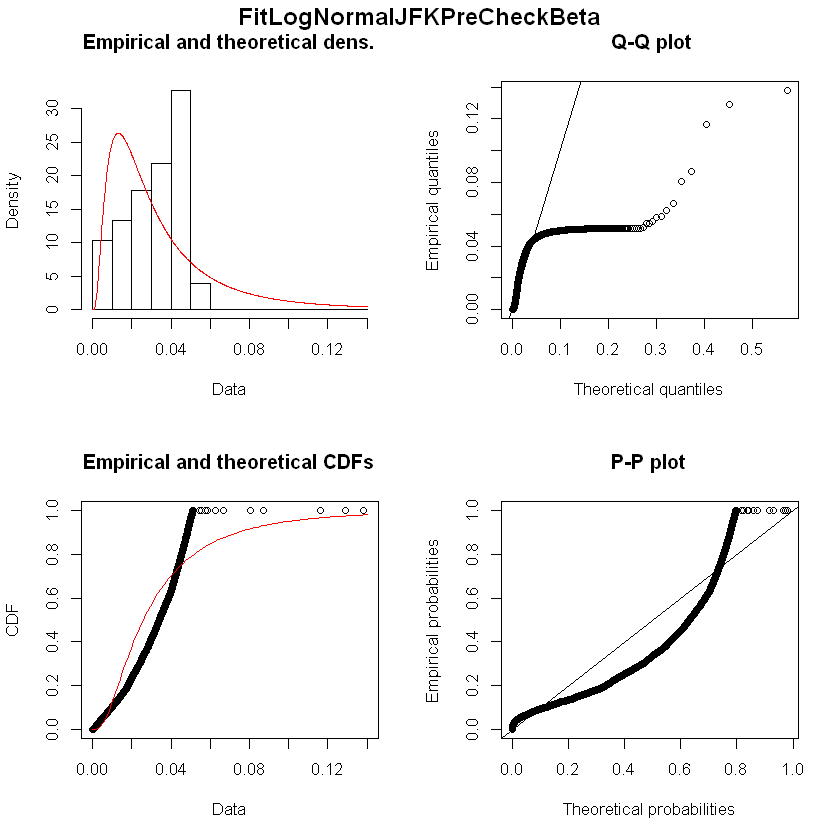

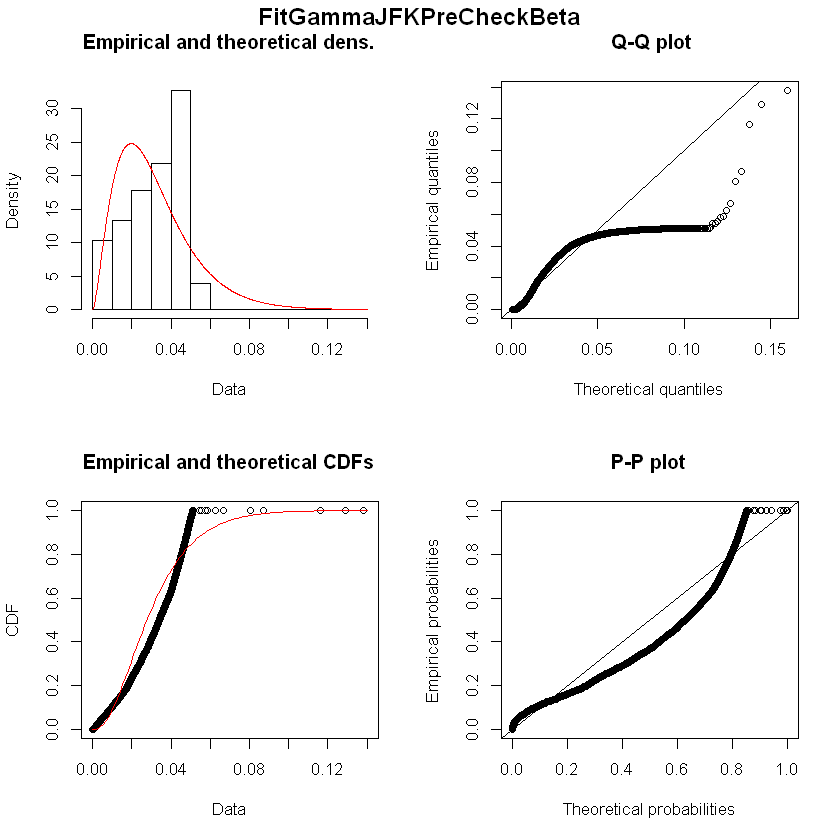

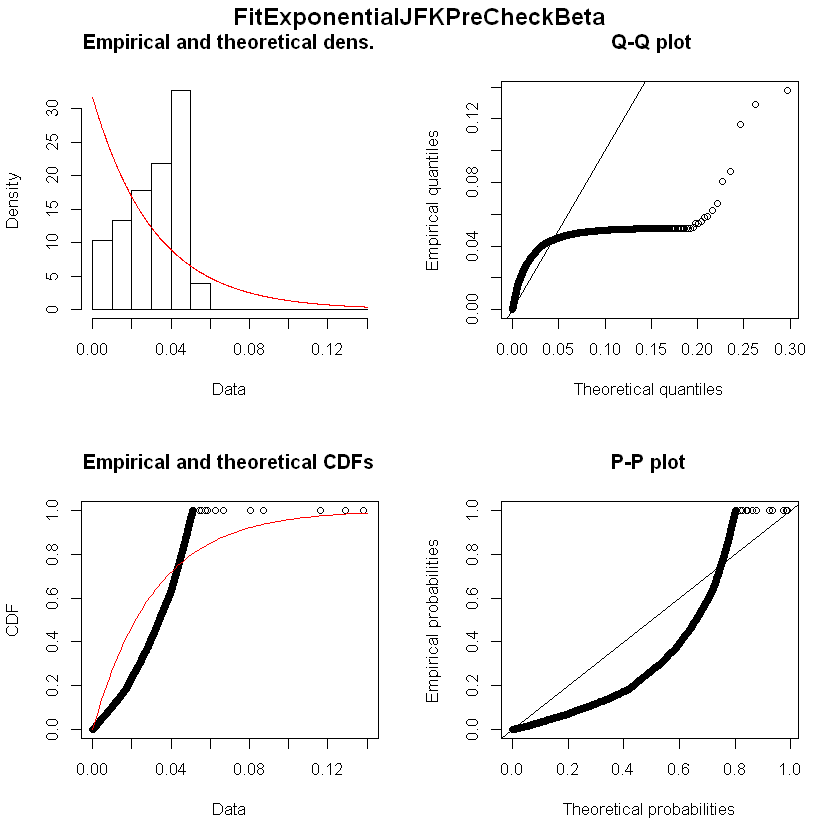

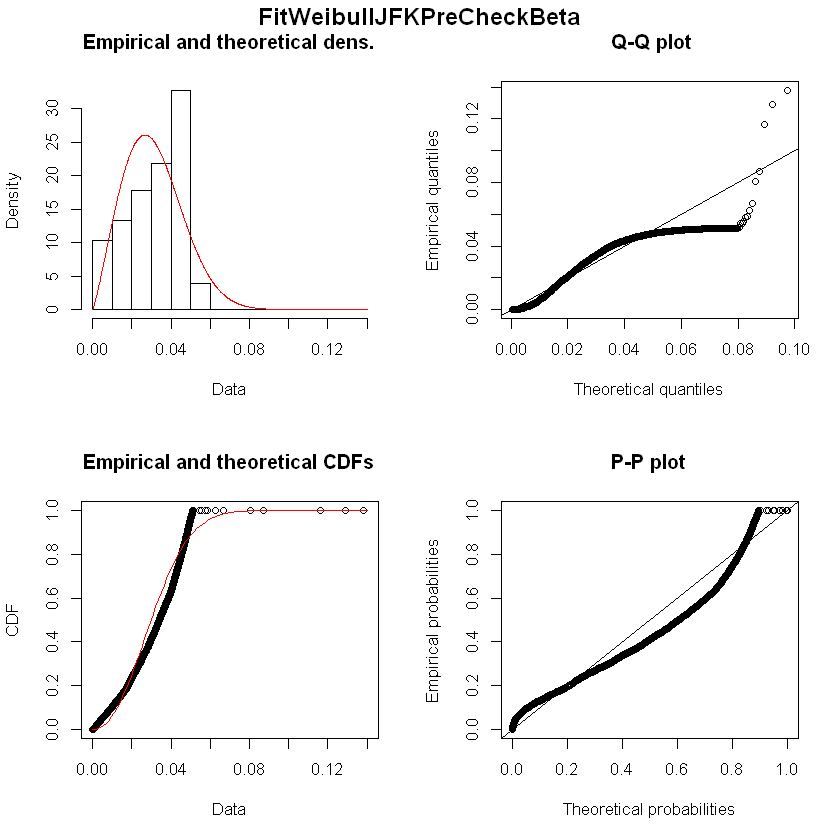

Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
        estimate Std. Error
shape1  2.157721 0.03329817
shape2 15.622013 0.26663317
Loglikelihood:  9417.599   AIC:  -18831.2   BIC:  -18817.4 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.8758241
shape2 0.8758241 1.0000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
mean 0.12246650 0.0007458340
sd   0.06381132 0.0005268016
Loglikelihood:  9756.726   AIC:  -19509.45   BIC:  -19495.66 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
meanlog -2.3298589 0.009724746
sdlog    0.8320201 0.006876389
Loglikelihood:  8014.076   AIC:  -16024.15   BIC:  -16010.36 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape  2.327881 0.03606274
rate  19.007598 0.32849435
Loglikelihood:  9241.762   AIC:  -18479.52   BIC:  -18465.73 
Correlation matrix:
          shape      rate
shape 1.0000000 0.8963906
rate  0.8963906 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate 8.165498 0.09543928
Loglikelihood:  8051.398   AIC:  -16100.8   BIC:  -16093.9 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
      estimate   Std. Error
shape 1.888655 0.0181190532
scale 0.136575 0.0008810724
Loglikelihood:  9702.176   AIC:  -19400.35   BIC:  -19386.56 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2833567
scale 0.2833567 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
           estimate   Std. Error
location 0.12213900 0.0007485001
scale    0.03653961 0.0003518109
Loglikelihood:  9694.773   AIC:  -19385.55   BIC:  -19371.75 
Correlation matrix:
            location       scale
location  1.00000000 -0.00527076
scale    -0.00527076  1.00000000


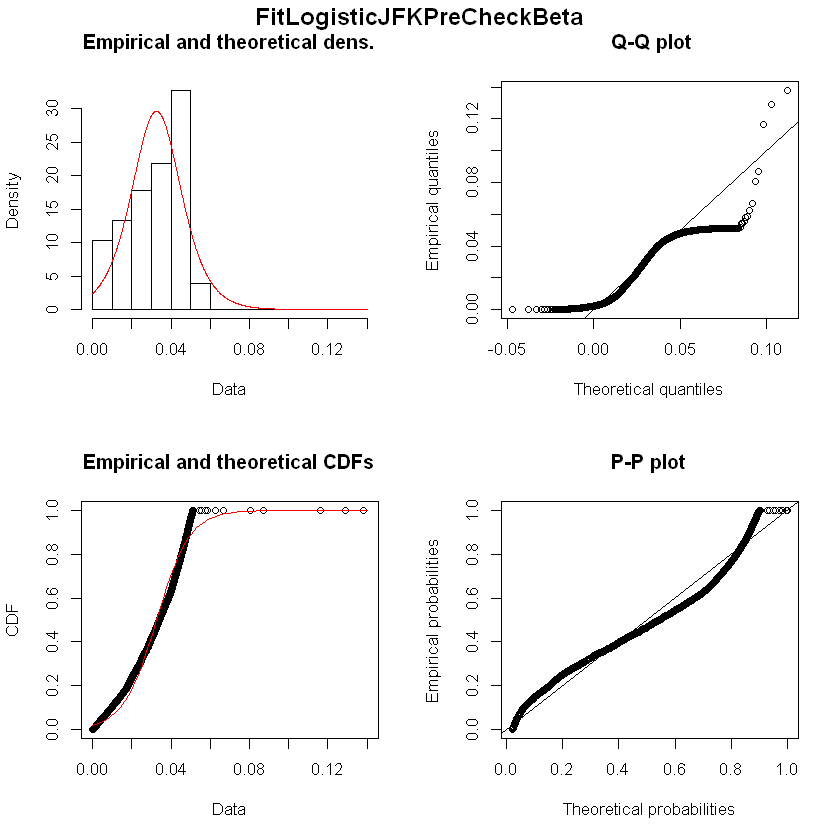

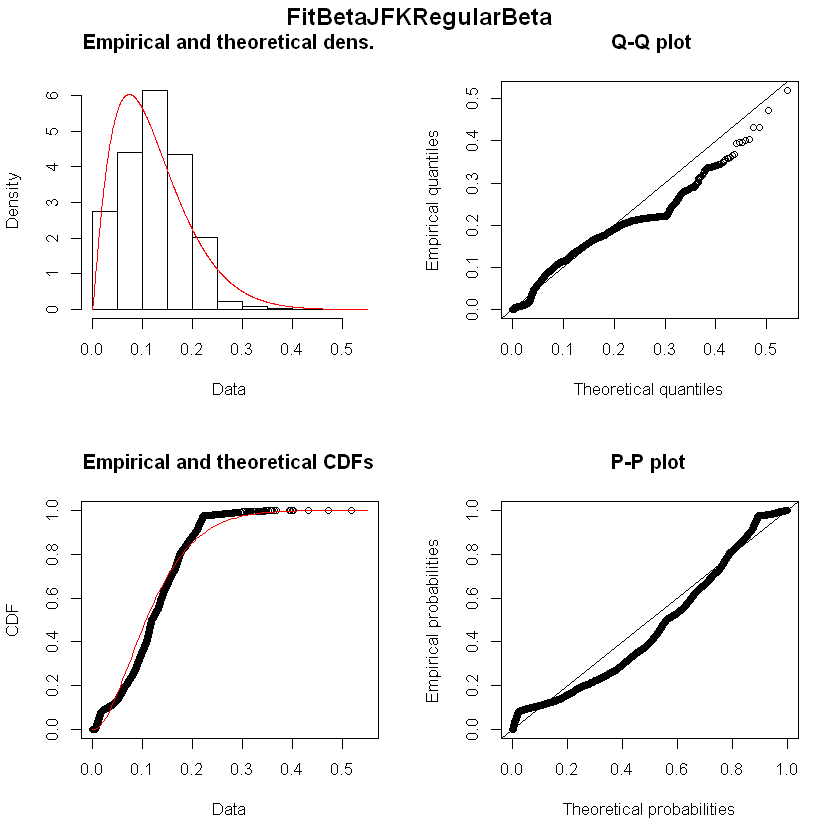

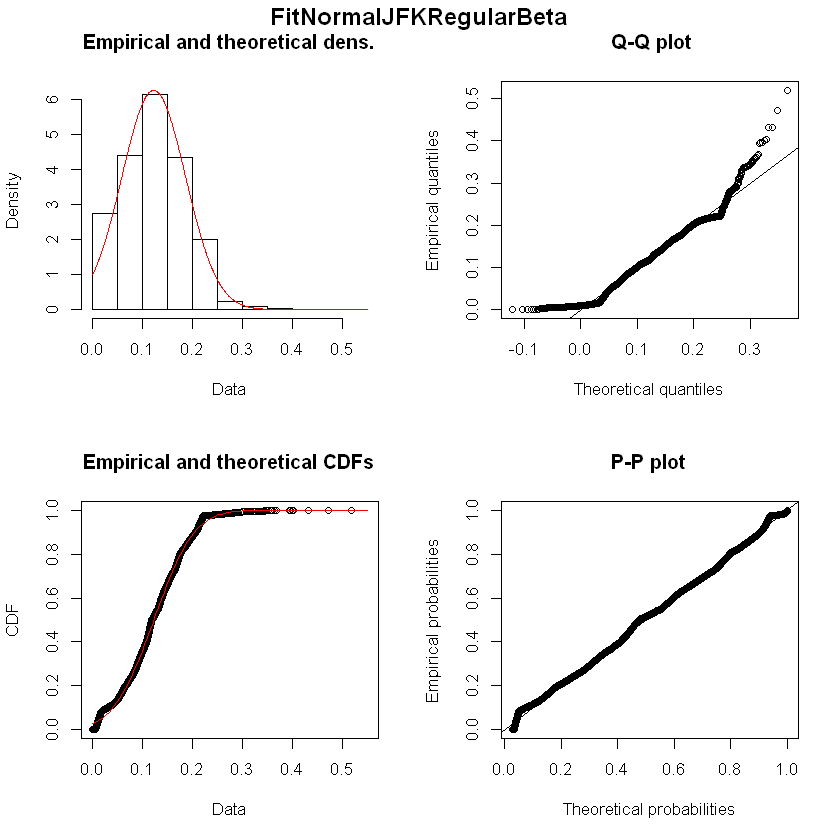

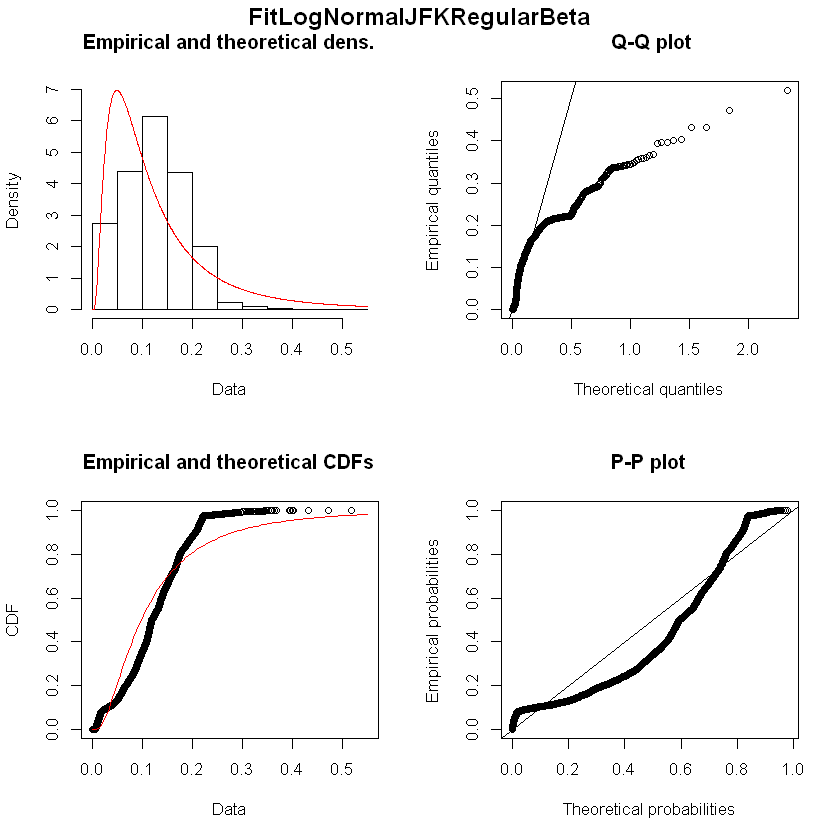

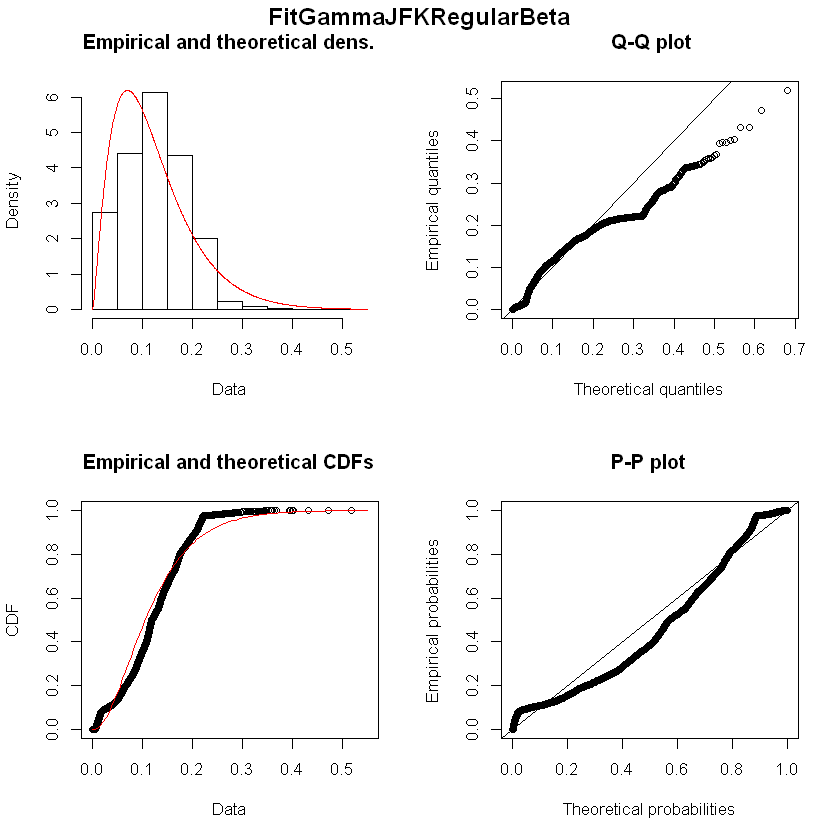

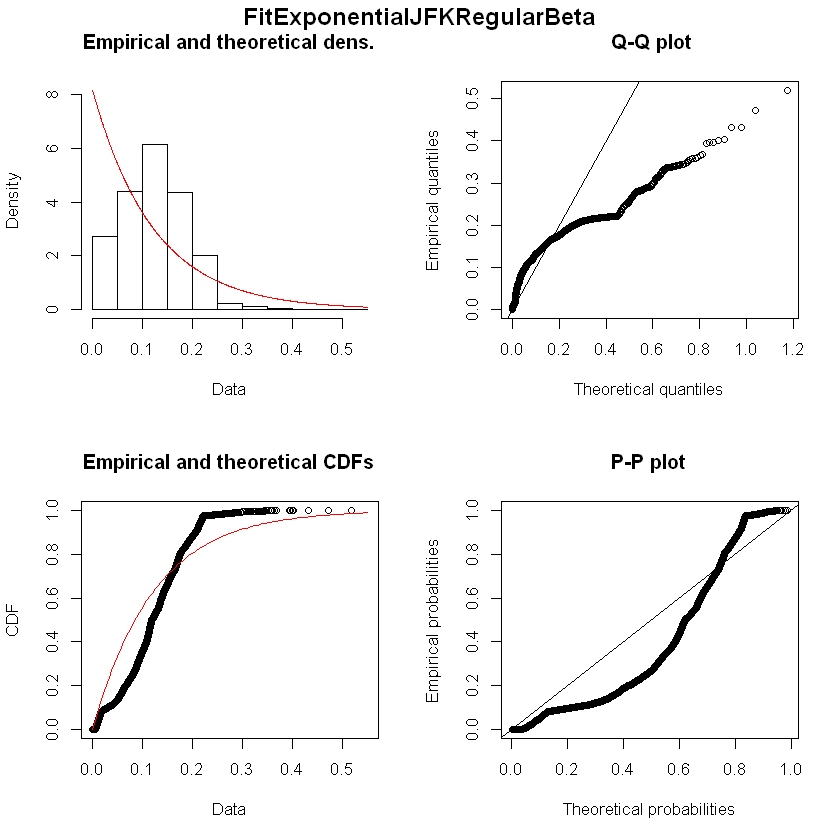

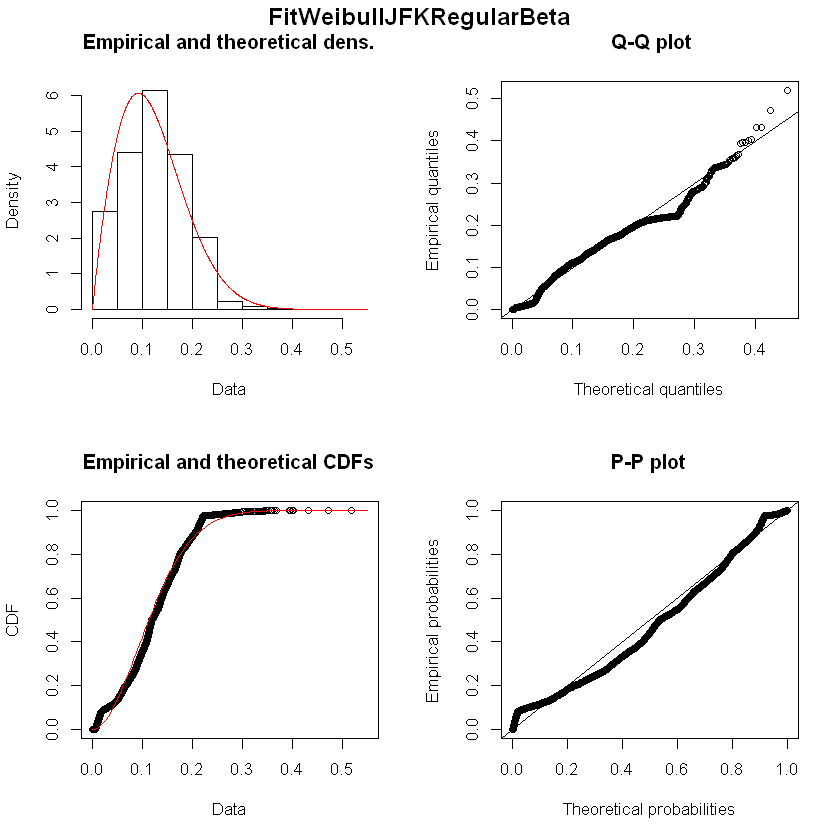

Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
        estimate Std. Error
shape1  7.281112  0.1303583
shape2 35.428827  0.6519784
Loglikelihood:  8799.553   AIC:  -17595.11   BIC:  -17581.72 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.9592814
shape2 0.9592814 1.0000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
mean 0.17114736 0.0006220918
sd   0.04807446 0.0004390292
Loglikelihood:  9651.144   AIC:  -19298.29   BIC:  -19284.9 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
meanlog -1.8276249 0.005321528
sdlog    0.4112408 0.003762788
Loglikelihood:  7747.253   AIC:  -15490.51   BIC:  -15477.12 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape  8.175955  0.1466700
rate  47.773020  0.8838592
Loglikelihood:  8593.482   AIC:  -17182.96   BIC:  -17169.58 
Correlation matrix:
          shape      rate
shape 1.0000000 0.9696221
rate  0.9696221 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate 5.842918 0.07560837
Loglikelihood:  4569.955   AIC:  -9137.911   BIC:  -9131.216 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
shape 4.4010495 0.0486068083
scale 0.1875884 0.0005718363
Loglikelihood:  9741.33   AIC:  -19478.66   BIC:  -19465.27 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2649284
scale 0.2649284 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
           estimate   Std. Error
location 0.17716584 0.0006013413
scale    0.02662927 0.0002870646
Loglikelihood:  9706.508   AIC:  -19409.02   BIC:  -19395.63 
Correlation matrix:
           location      scale
location  1.0000000 -0.1069959
scale    -0.1069959  1.0000000


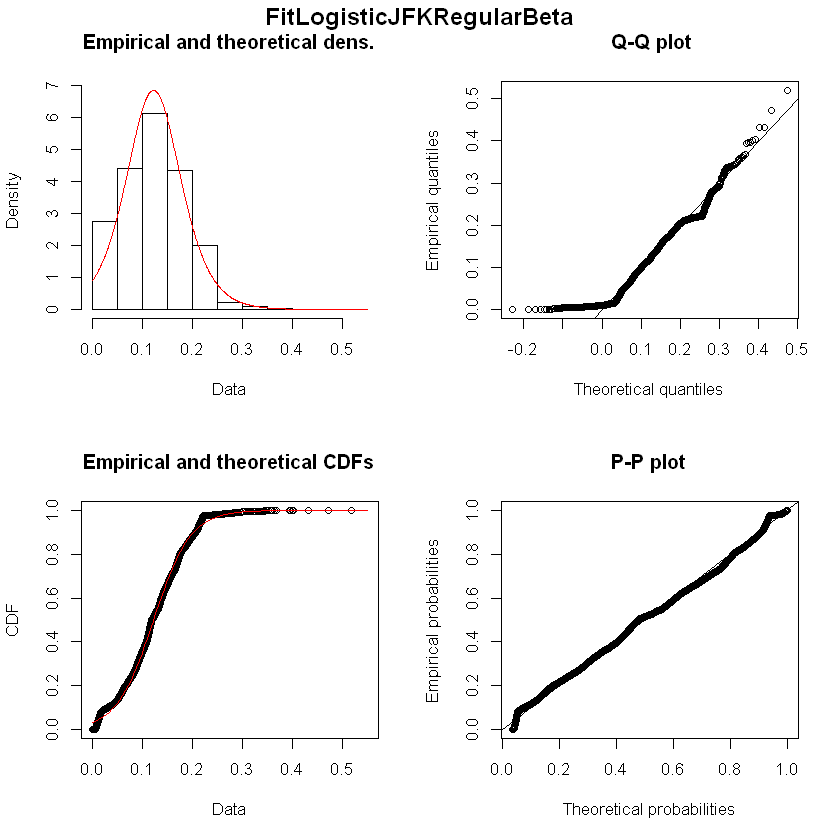

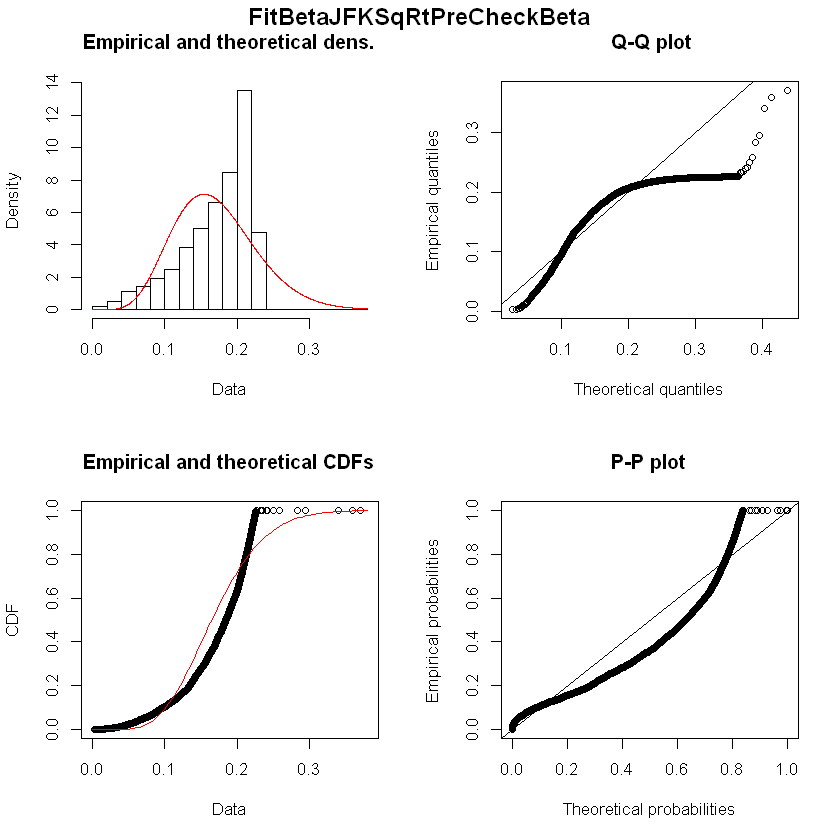

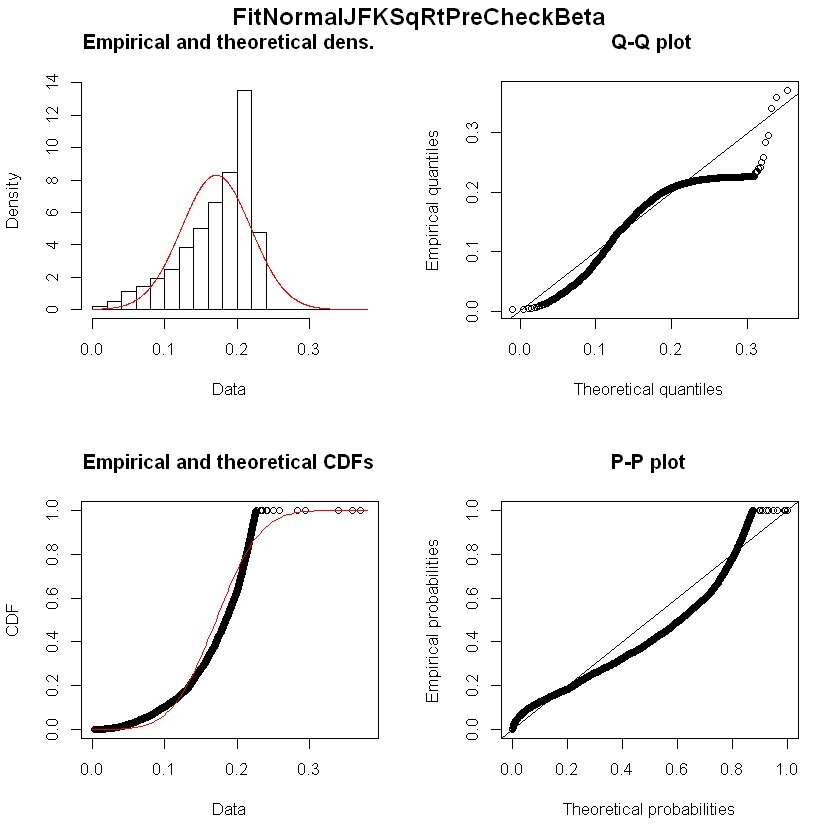

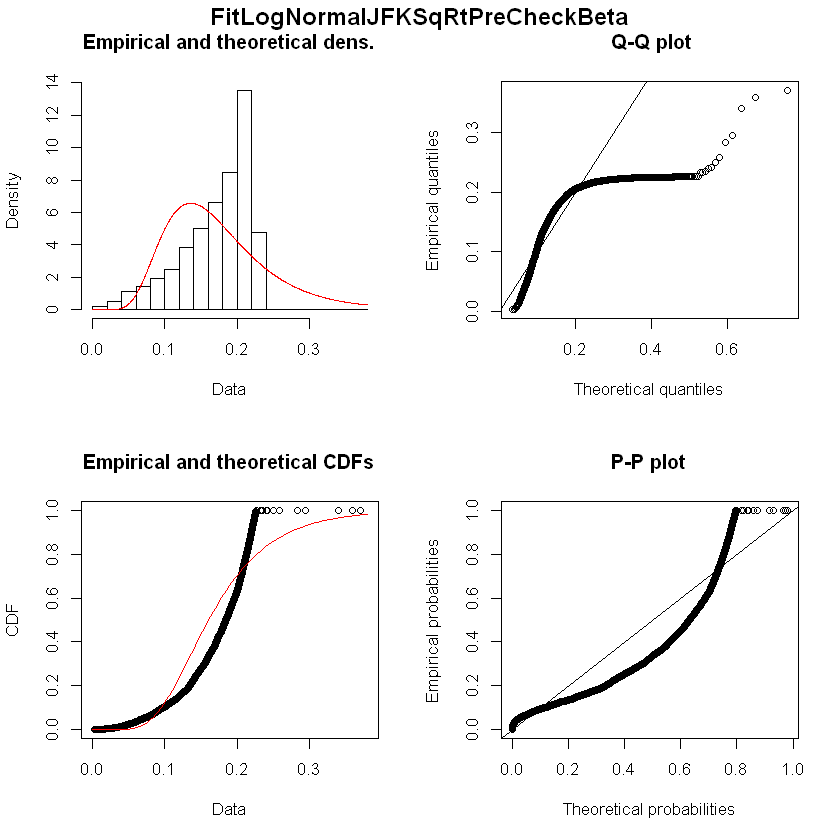

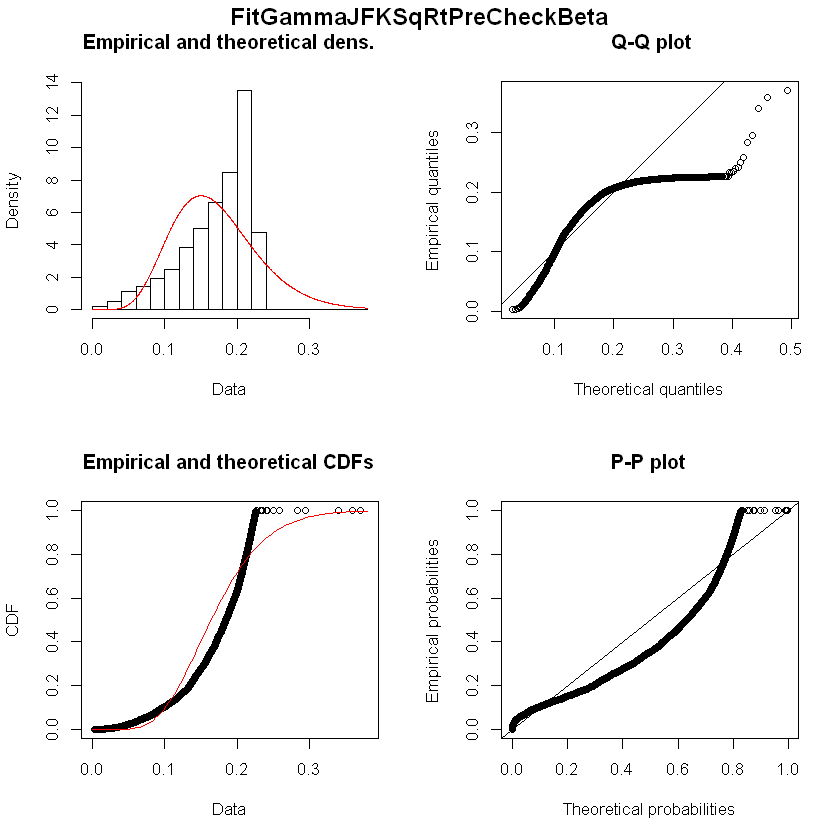

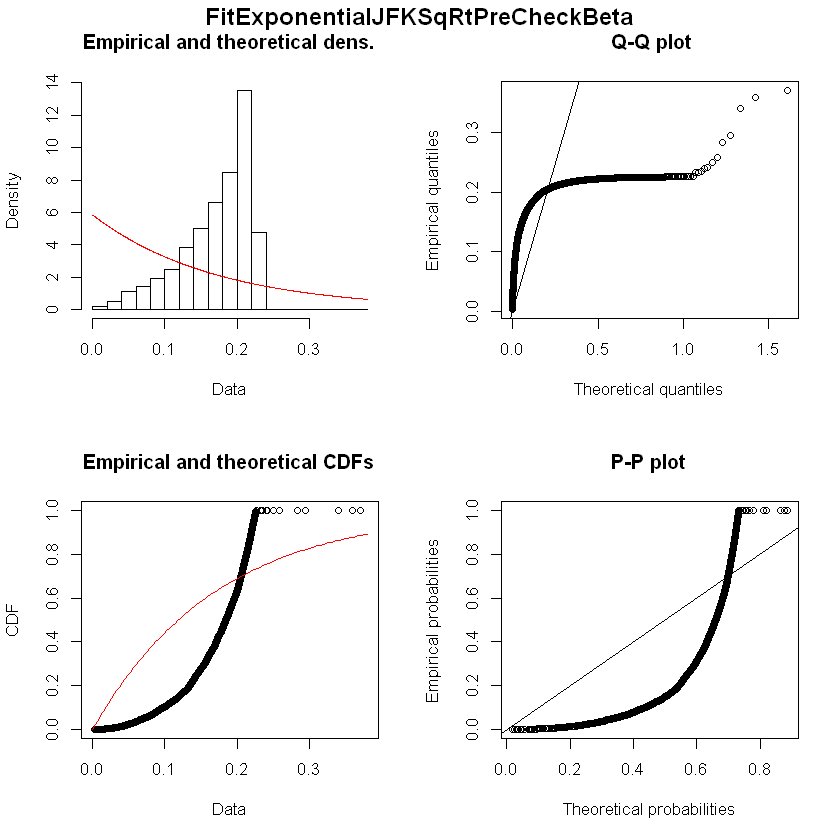

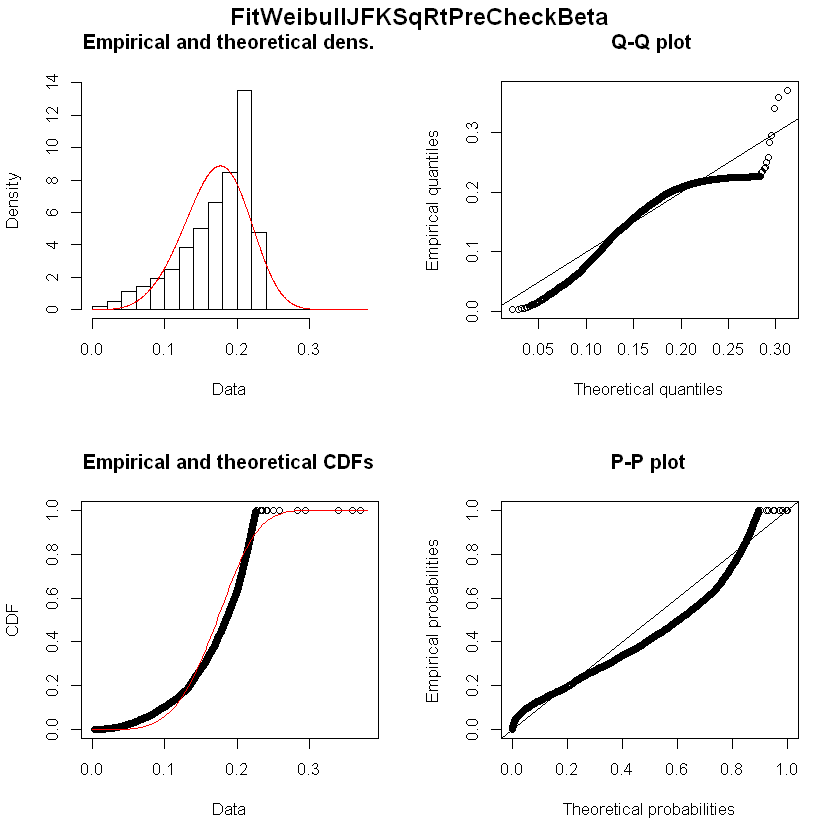

Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
        estimate Std. Error
shape1  5.576989 0.08978805
shape2 11.222310 0.18482101
Loglikelihood:  5764.517   AIC:  -11525.03   BIC:  -11511.24 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.9351384
shape2 0.9351384 1.0000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
      estimate   Std. Error
mean 0.3342850 0.0012101606
sd   0.1035377 0.0008553536
Loglikelihood:  6213.808   AIC:  -12423.62   BIC:  -12409.82 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate  Std. Error
meanlog -1.164929 0.004862373
sdlog    0.416010 0.003438127
Loglikelihood:  4560.63   AIC:  -9117.26   BIC:  -9103.463 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape  7.392218  0.1195338
rate  22.113443  0.3699999
Loglikelihood:  5296.996   AIC:  -10589.99   BIC:  -10576.2 
Correlation matrix:
          shape      rate
shape 1.0000000 0.9664305
rate  0.9664305 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate  2.99146 0.03496452
Loglikelihood:  700.9737   AIC:  -1399.947   BIC:  -1393.049 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate  Std. Error
shape 3.7772141 0.036236795
scale 0.3695583 0.001192268
Loglikelihood:  6248.73   AIC:  -12493.46   BIC:  -12479.66 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2833119
scale 0.2833119 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
          estimate   Std. Error
location 0.3427800 0.0011685190
scale    0.0576597 0.0005658159
Loglikelihood:  6242.06   AIC:  -12480.12   BIC:  -12466.32 
Correlation matrix:
            location       scale
location  1.00000000 -0.06510536
scale    -0.06510536  1.00000000


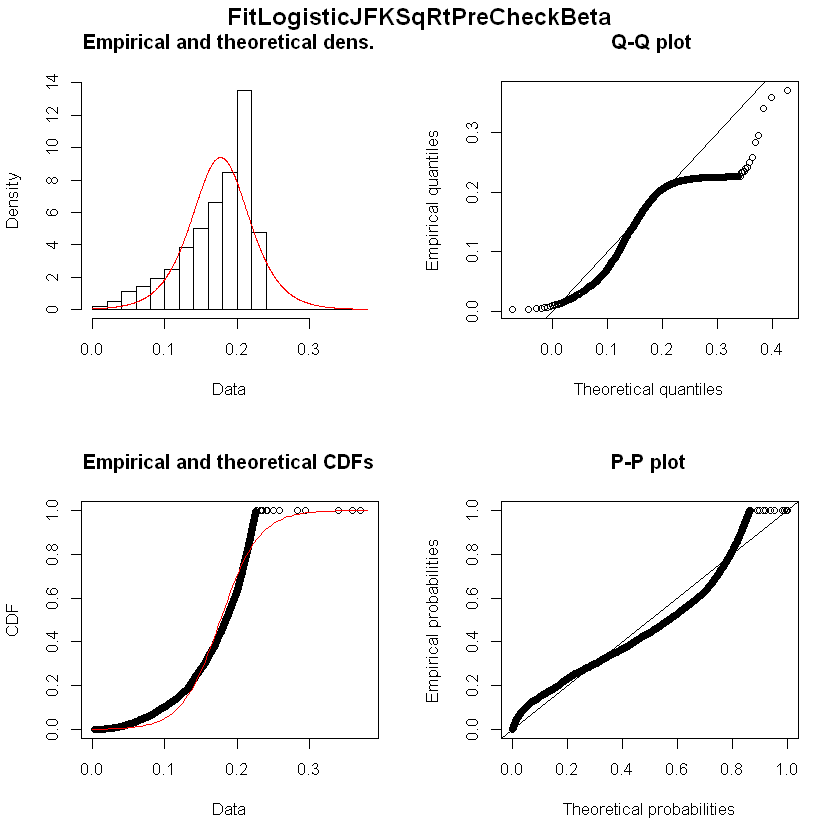

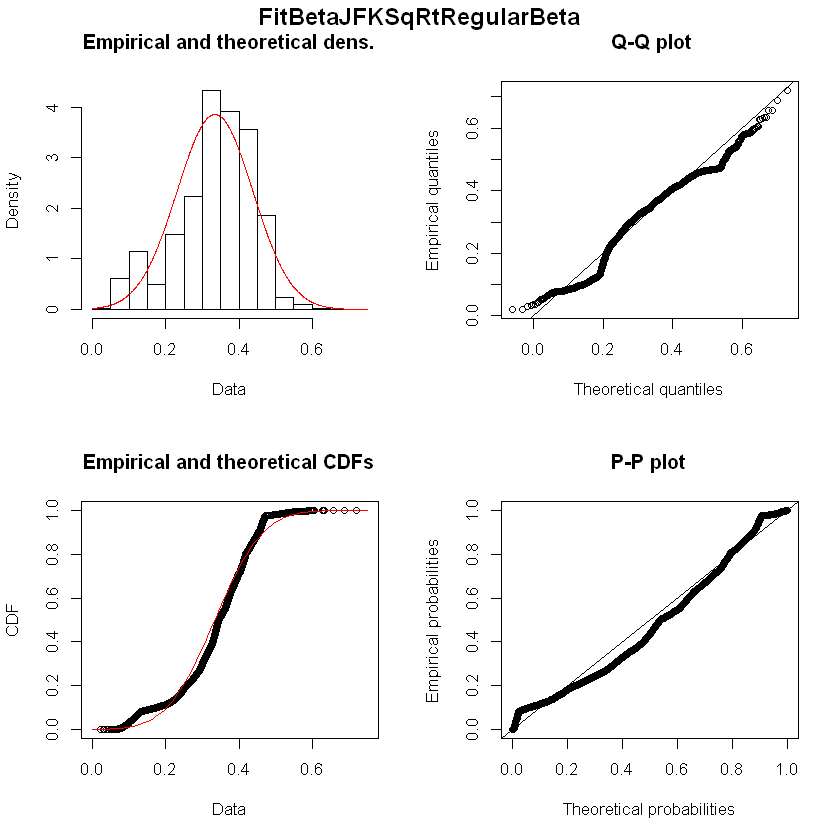

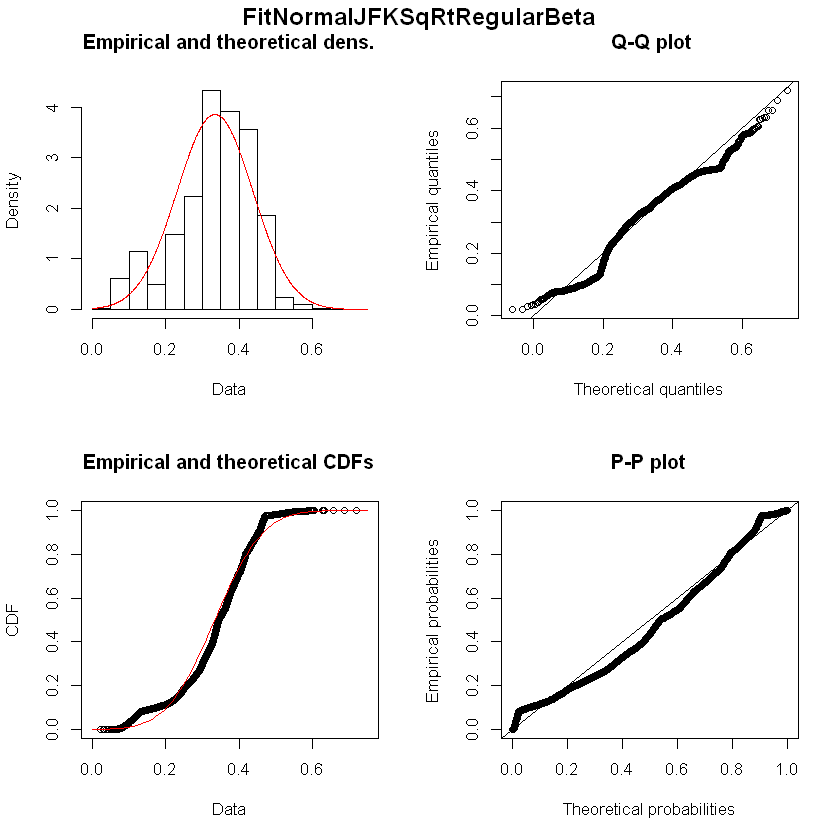

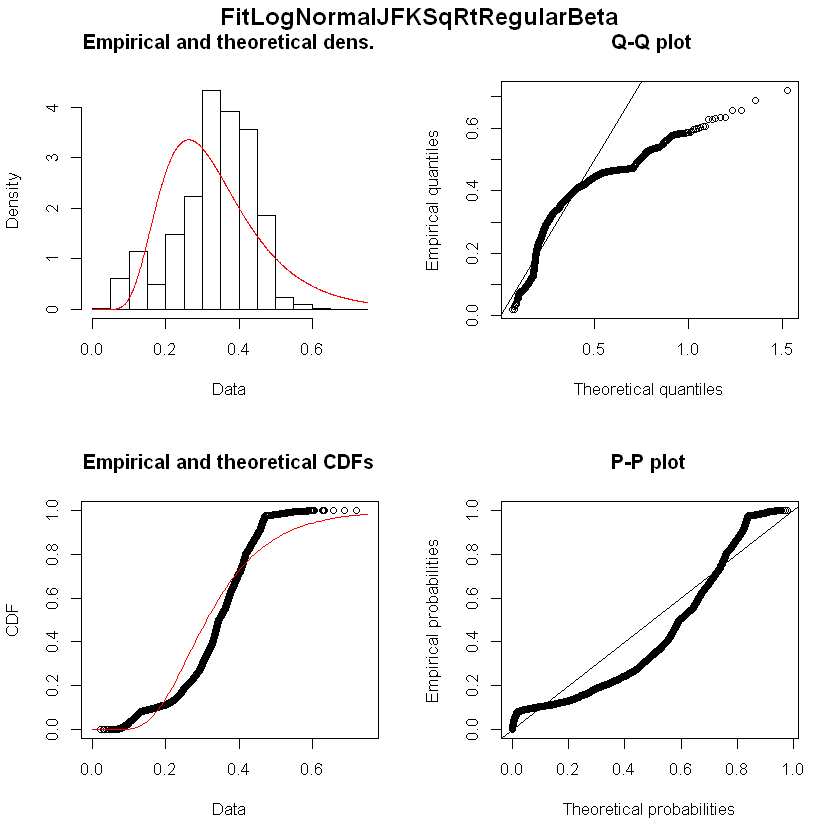

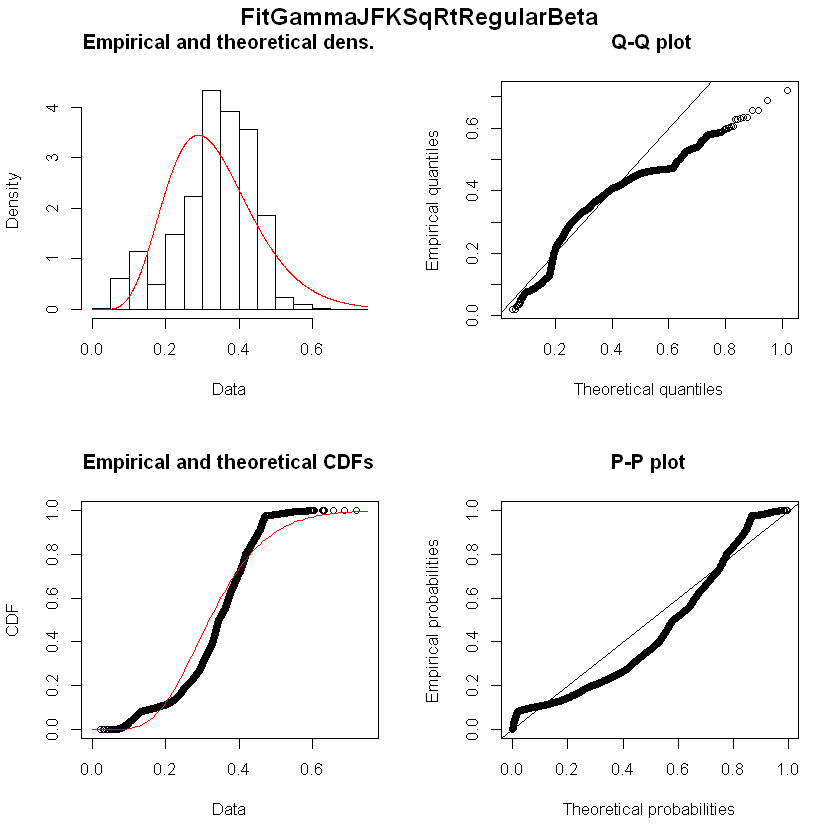

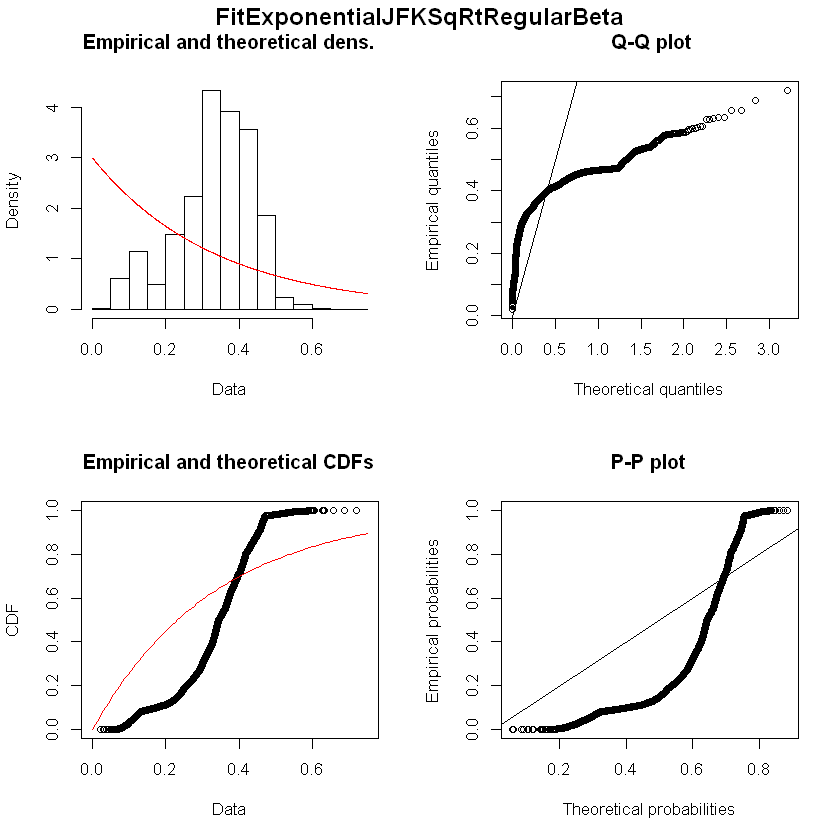

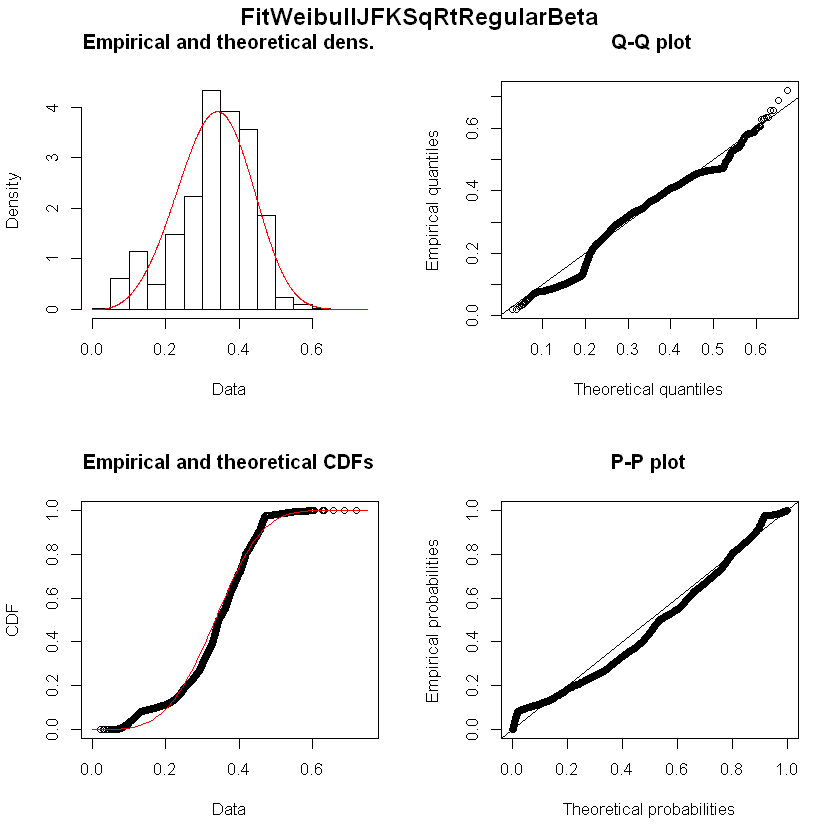

Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
        estimate Std. Error
shape1  2.317776 0.04265345
shape2 81.544058 1.66933484
Loglikelihood:  14298.66   AIC:  -28593.33   BIC:  -28580.22 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.8934525
shape2 0.8934525 1.0000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
mean 0.02769853 0.0002033224
sd   0.01464062 0.0001407638
Loglikelihood:  14544.01   AIC:  -29084.02   BIC:  -29070.92 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
meanlog -3.8133718 0.011691827
sdlog    0.8418928 0.008267318
Loglikelihood:  13307.49   AIC:  -26610.98   BIC:  -26597.87 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape  2.356273 0.04340137
rate  85.074833 1.74585706
Loglikelihood:  14274.02   AIC:  -28544.05   BIC:  -28530.94 
Correlation matrix:
          shape      rate
shape 1.0000000 0.8975737
rate  0.8975737 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate   36.103  0.5013822
Loglikelihood:  13410.36   AIC:  -26818.72   BIC:  -26812.17 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
        estimate  Std. Error
shape 1.86518377 0.020716723
scale 0.03088545 0.000239054
Loglikelihood:  14570.41   AIC:  -29136.81   BIC:  -29123.71 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2881616
scale 0.2881616 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
            estimate   Std. Error
location 0.027650964 2.079885e-04
scale    0.008453729 9.144191e-05
Loglikelihood:  14514.25   AIC:  -29024.5   BIC:  -29011.4 
Correlation matrix:
             location        scale
location  1.000000000 -0.002142693
scale    -0.002142693  1.000000000


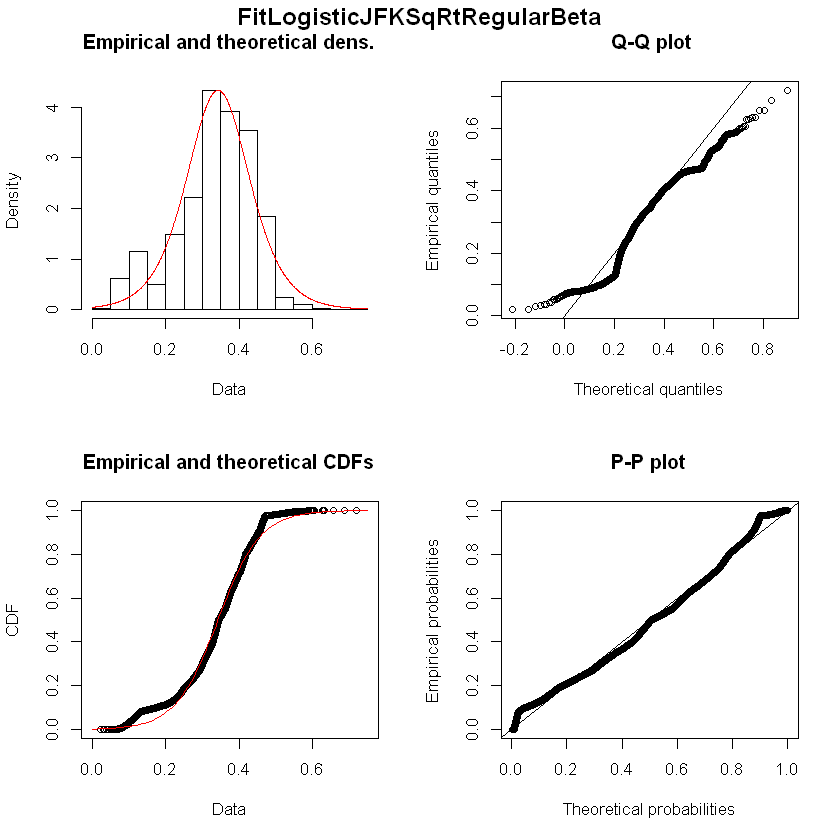

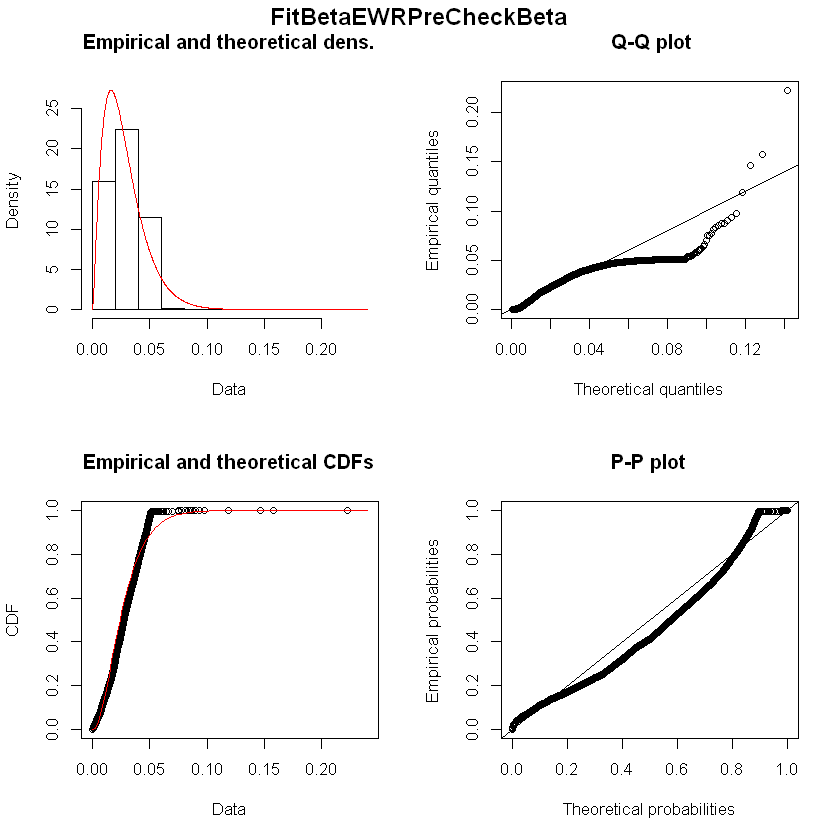

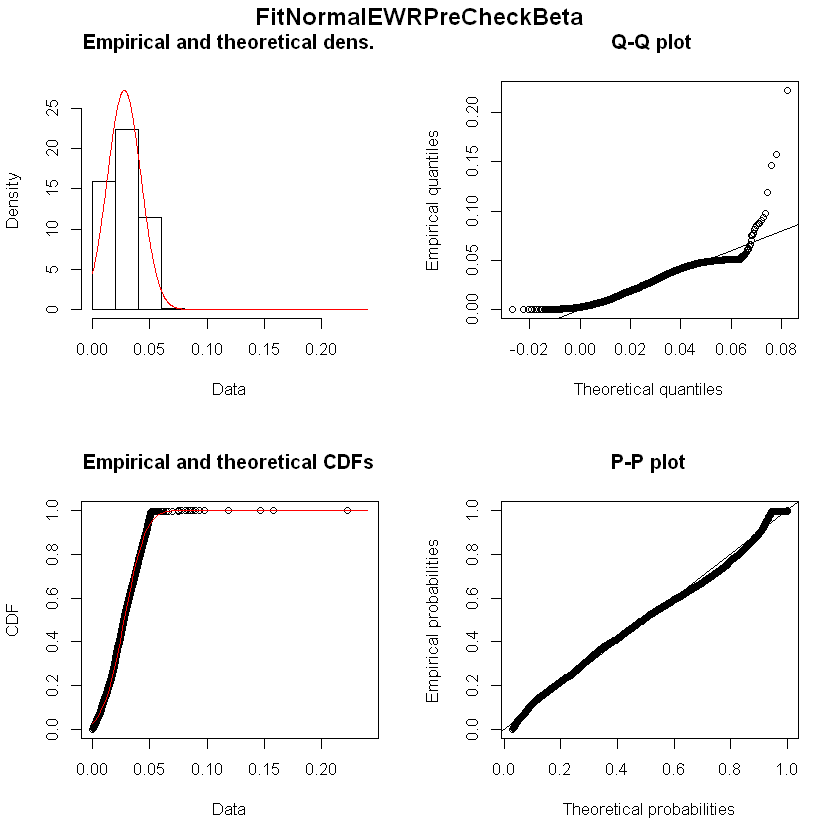

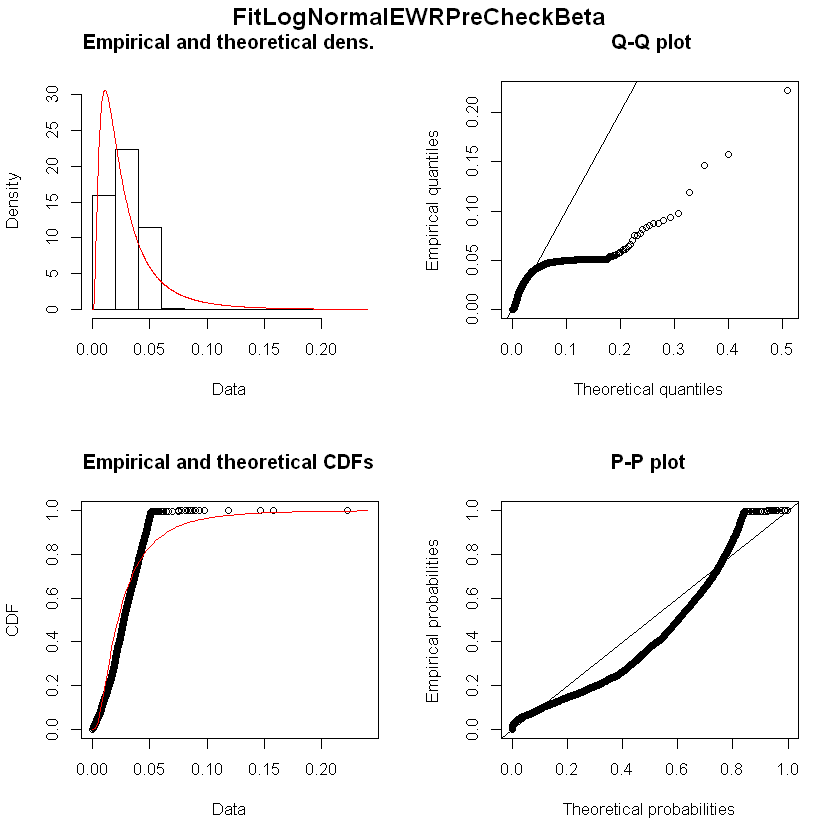

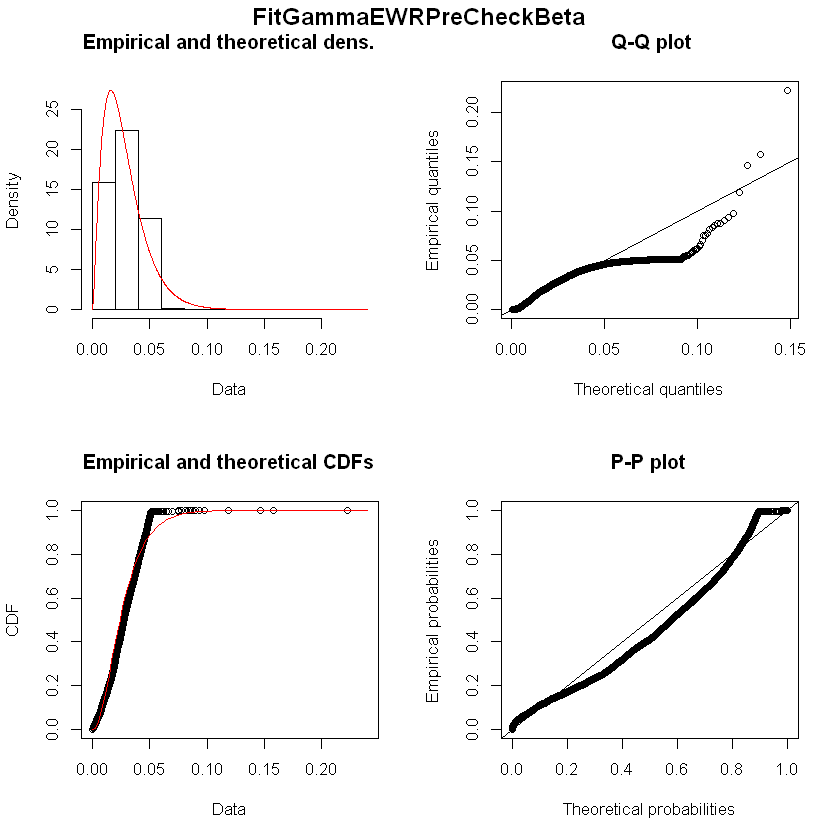

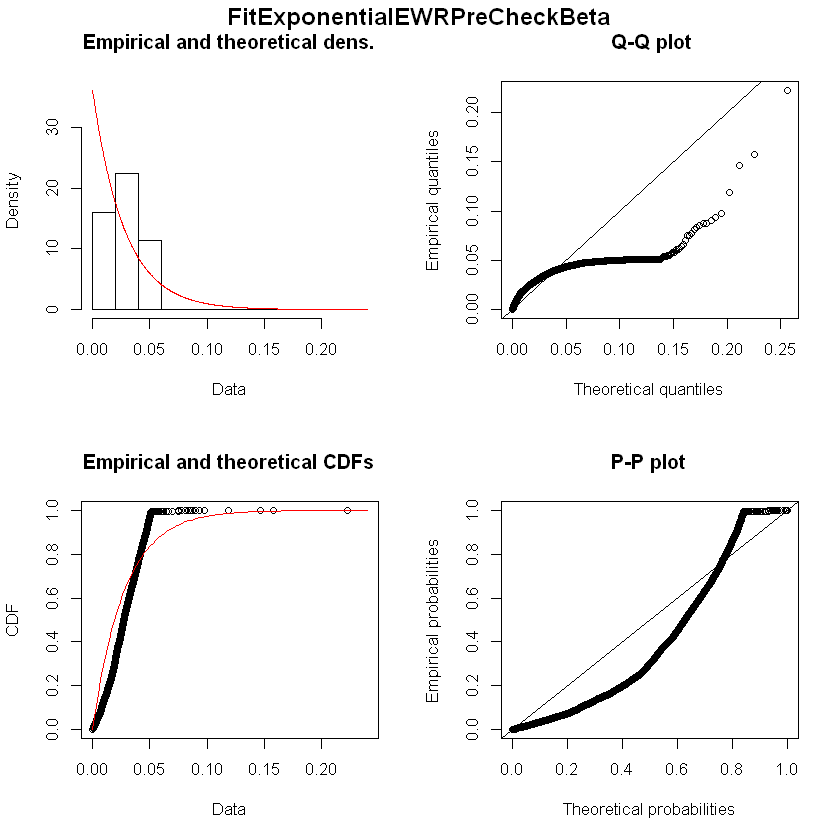

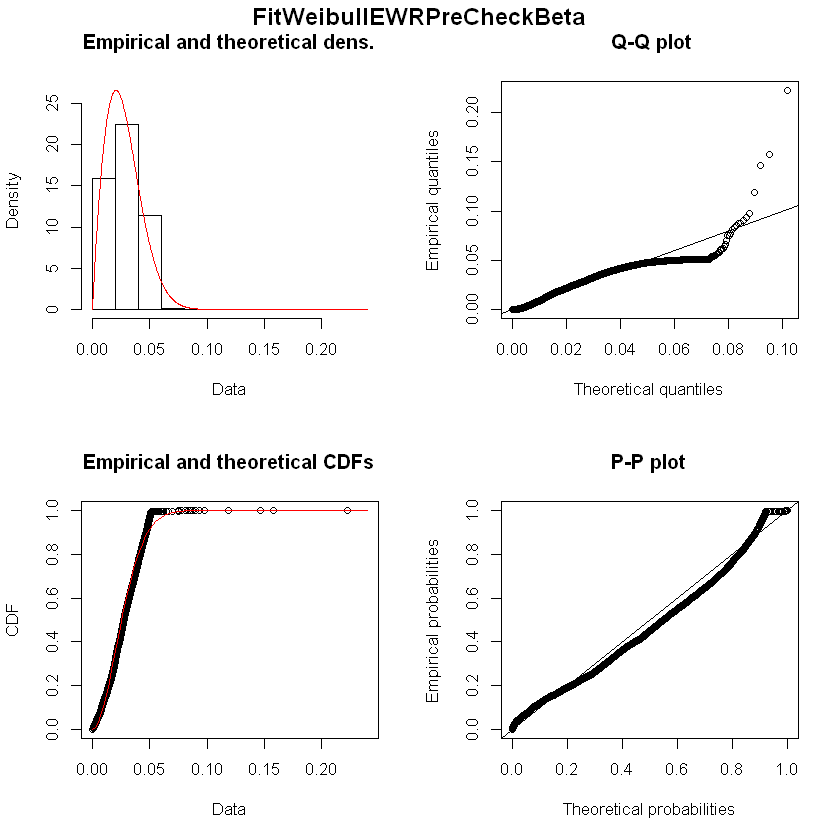

Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
        estimate Std. Error
shape1 0.8464051 0.01223431
shape2 6.8998769 0.12749637
Loglikelihood:  8813.17   AIC:  -17622.34   BIC:  -17608.57 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.7283165
shape2 0.7283165 1.0000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
mean 0.11318612 0.0009117129
sd   0.07745268 0.0006441948
Loglikelihood:  8221.243   AIC:  -16438.49   BIC:  -16424.72 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate Std. Error
meanlog -2.844124 0.01915559
sdlog    1.627323 0.01354502
Loglikelihood:  6771.343   AIC:  -13538.69   BIC:  -13524.92 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape 0.8810195 0.01276716
rate  7.7848588 0.14919200
Loglikelihood:  8546.468   AIC:  -17088.94   BIC:  -17075.17 
Correlation matrix:
          shape      rate
shape 1.0000000 0.7561606
rate  0.7561606 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate 8.835006  0.1039988
Loglikelihood:  8506.835   AIC:  -17011.67   BIC:  -17004.79 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate  Std. Error
shape 1.0294214 0.010847103
scale 0.1141701 0.001353377
Loglikelihood:  8510.566   AIC:  -17017.13   BIC:  -17003.36 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2643931
scale 0.2643931 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
           estimate   Std. Error
location 0.11528983 0.0009542699
scale    0.04573316 0.0004394735
Loglikelihood:  8023.667   AIC:  -16043.33   BIC:  -16029.57 
Correlation matrix:
            location       scale
location  1.00000000 -0.05313738
scale    -0.05313738  1.00000000


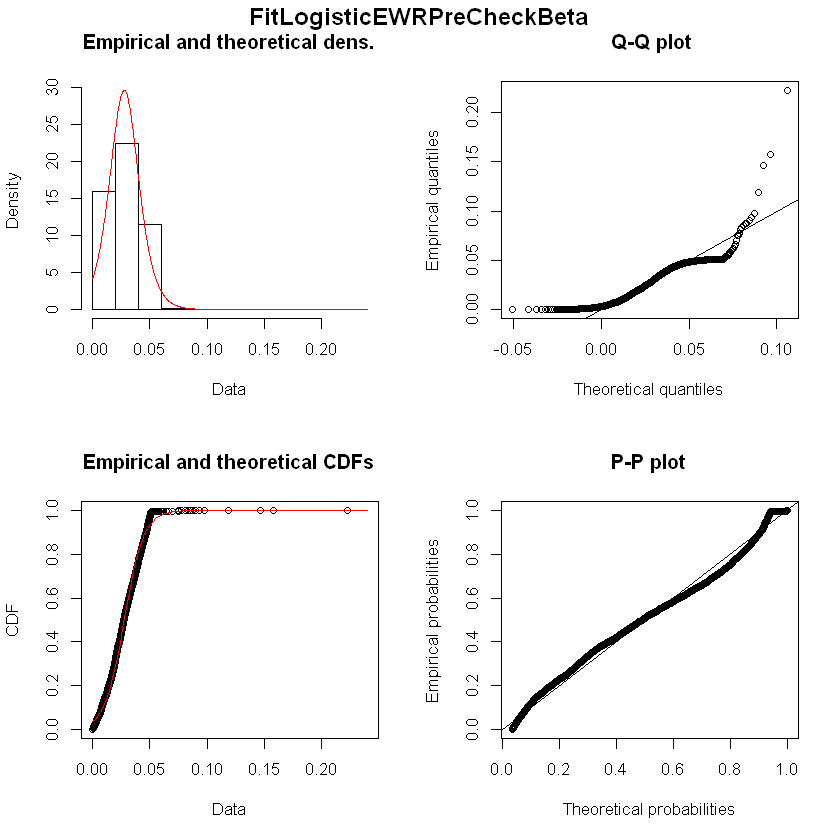

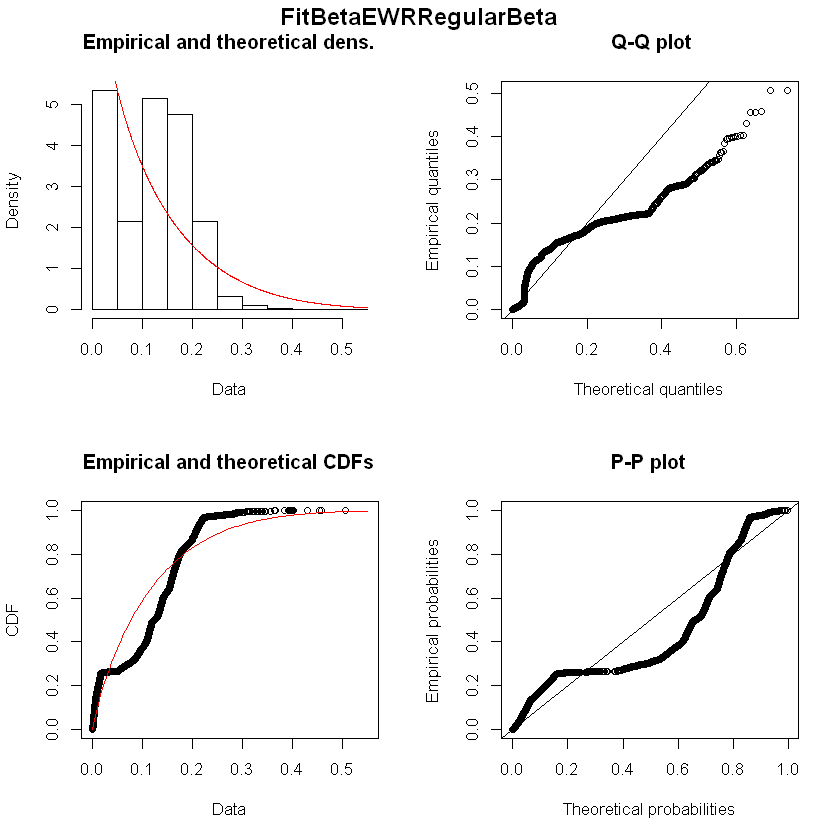

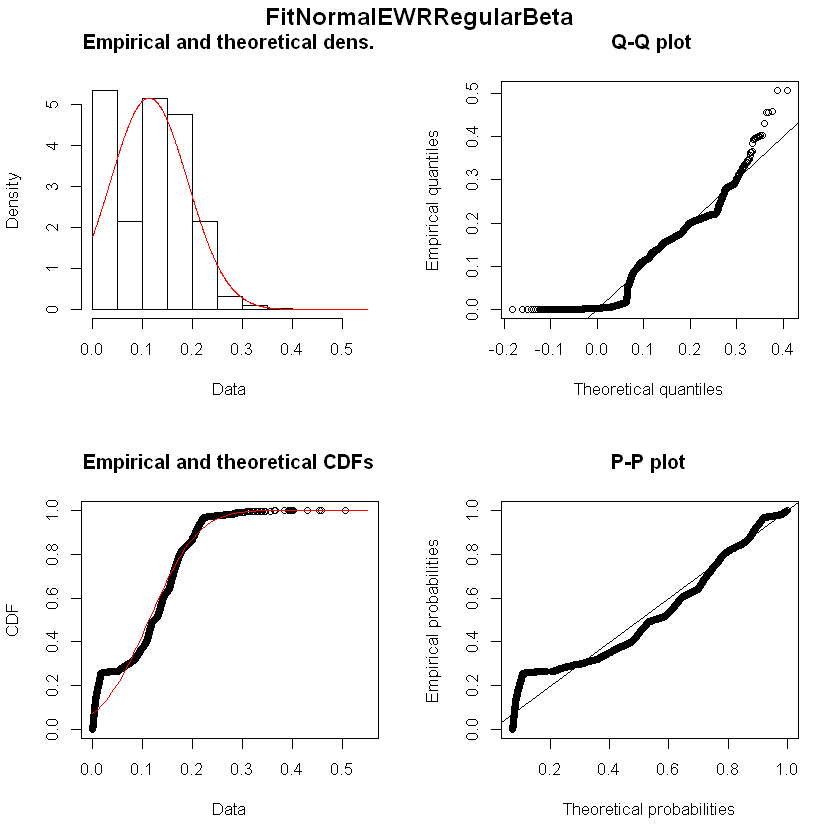

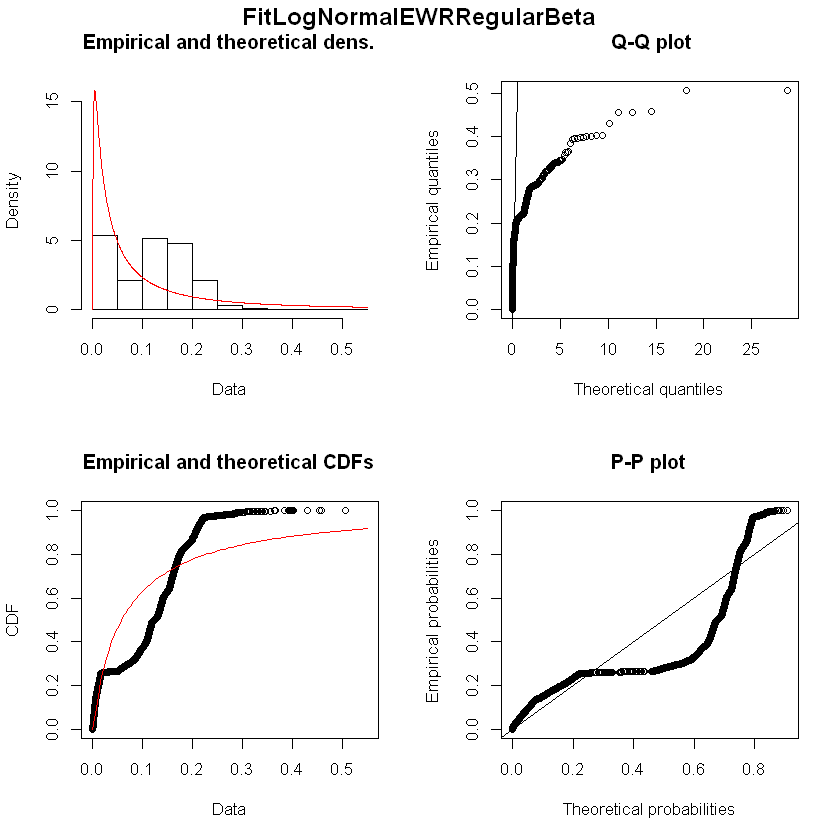

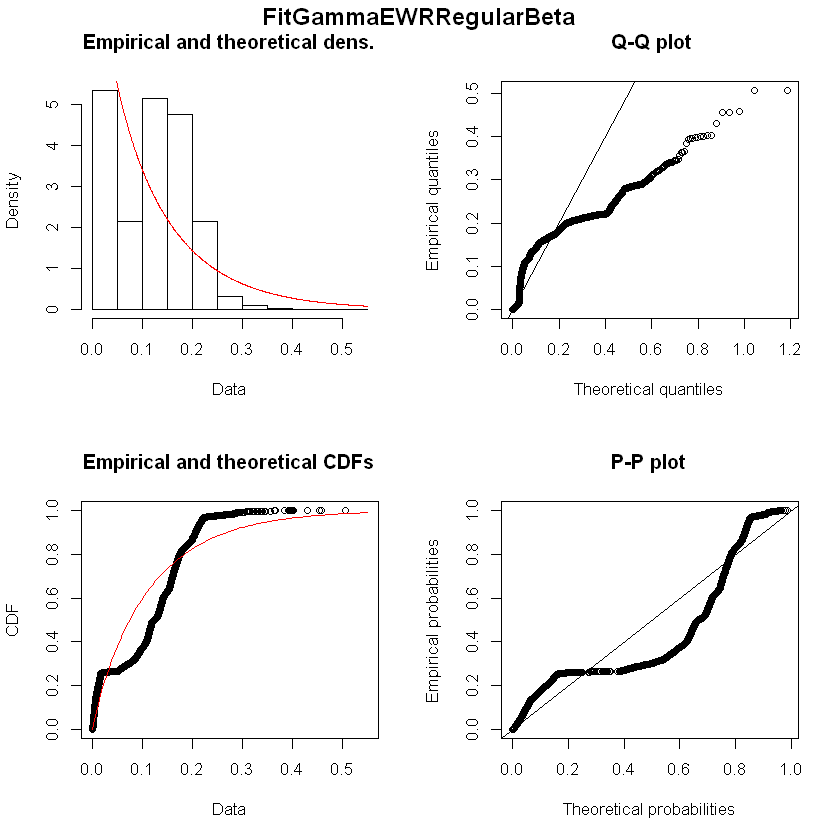

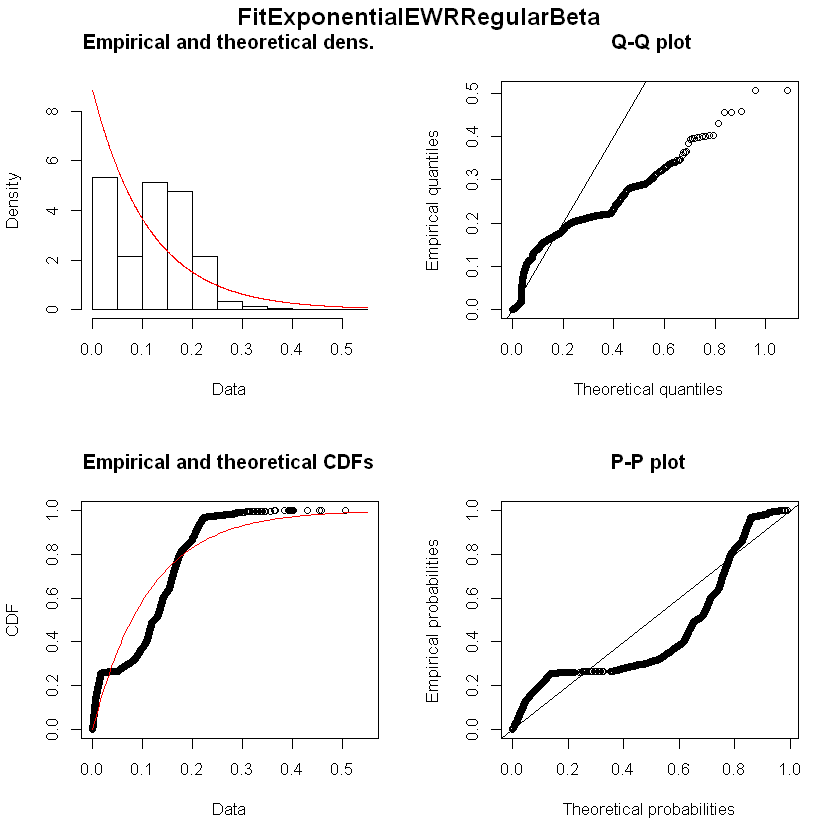

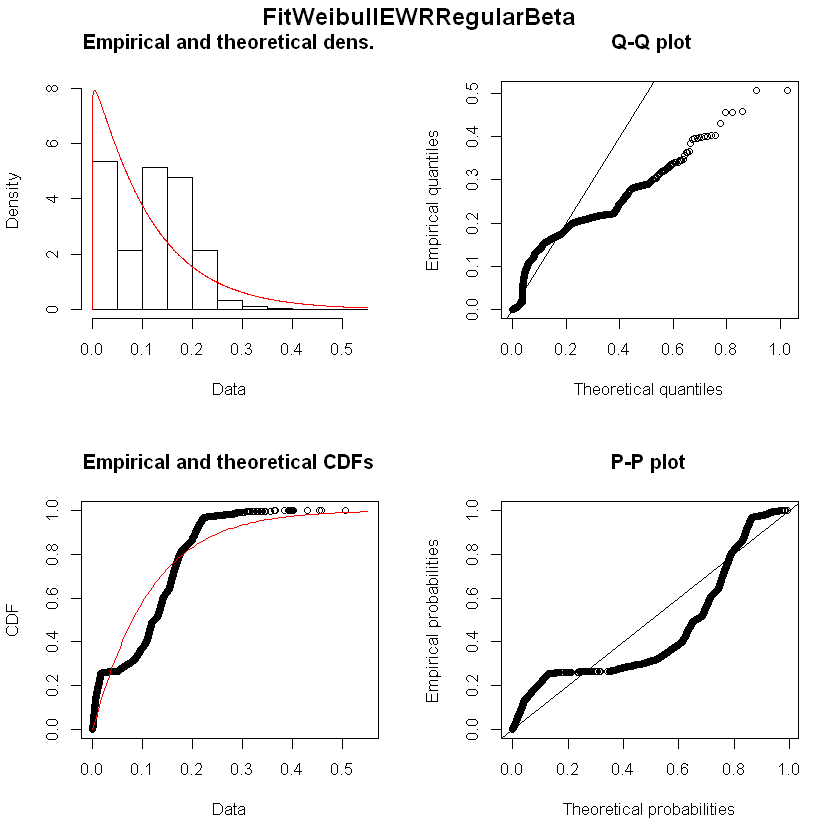

Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape1  6.63624  0.1272408
shape2 35.20999  0.6962328
Loglikelihood:  7760.444   AIC:  -15516.89   BIC:  -15503.78 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.9560036
shape2 0.9560036 1.0000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
mean 0.15910416 0.0006781327
sd   0.04883026 0.0004786075
Loglikelihood:  8298.419   AIC:  -16592.84   BIC:  -16579.73 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
meanlog -1.9066859 0.005845914
sdlog    0.4209464 0.004133580
Loglikelihood:  7015.29   AIC:  -14026.58   BIC:  -14013.47 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape  7.462682  0.1434100
rate  46.906599  0.9324096
Loglikelihood:  7624.17   AIC:  -15244.34   BIC:  -15231.23 
Correlation matrix:
          shape      rate
shape 1.0000000 0.9667446
rate  0.9667446 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate 6.285191  0.0872859
Loglikelihood:  4346.047   AIC:  -8690.095   BIC:  -8683.541 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
shape 3.7308240 0.0414116810
scale 0.1757478 0.0006825643
Loglikelihood:  8278.208   AIC:  -16552.42   BIC:  -16539.31 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2861807
scale 0.2861807 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
           estimate   Std. Error
location 0.16267625 0.0006757478
scale    0.02776509 0.0003177882
Loglikelihood:  8273.203   AIC:  -16542.41   BIC:  -16529.3 
Correlation matrix:
            location       scale
location  1.00000000 -0.05930477
scale    -0.05930477  1.00000000


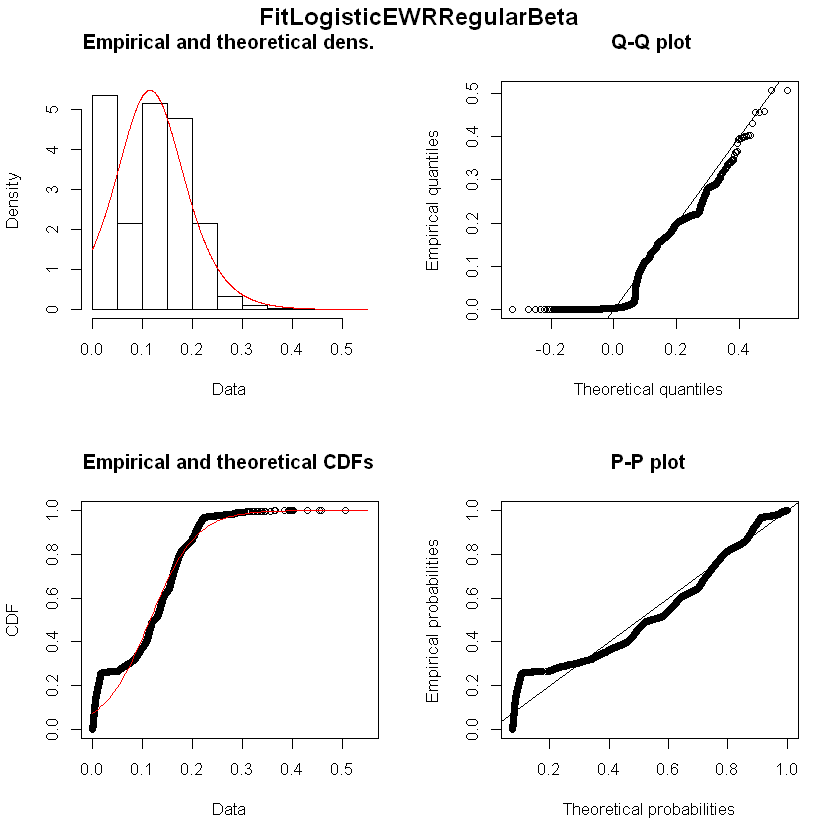

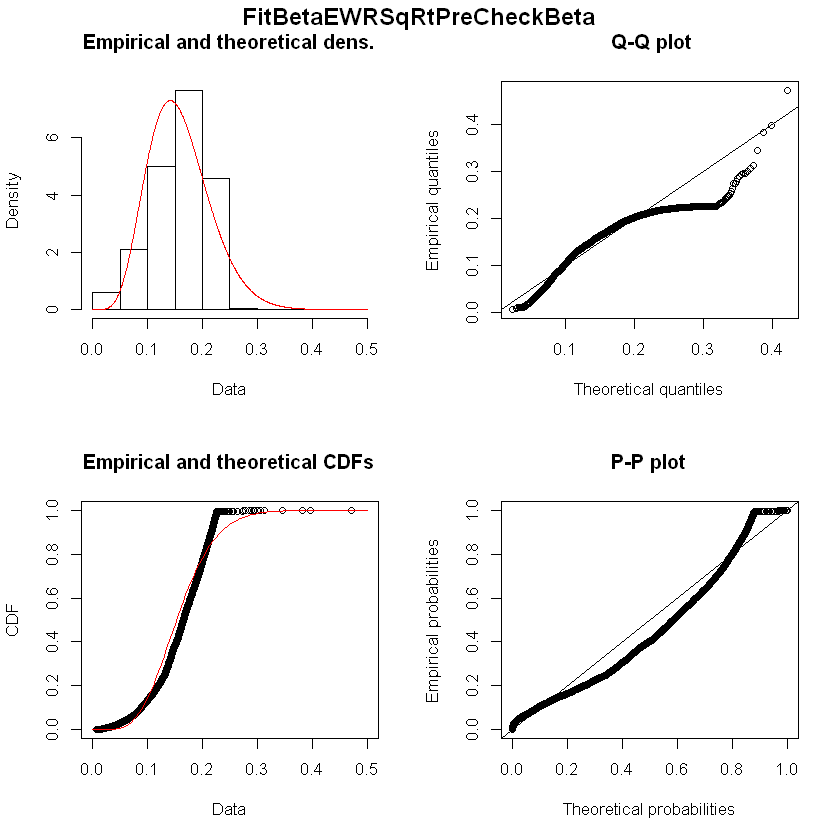

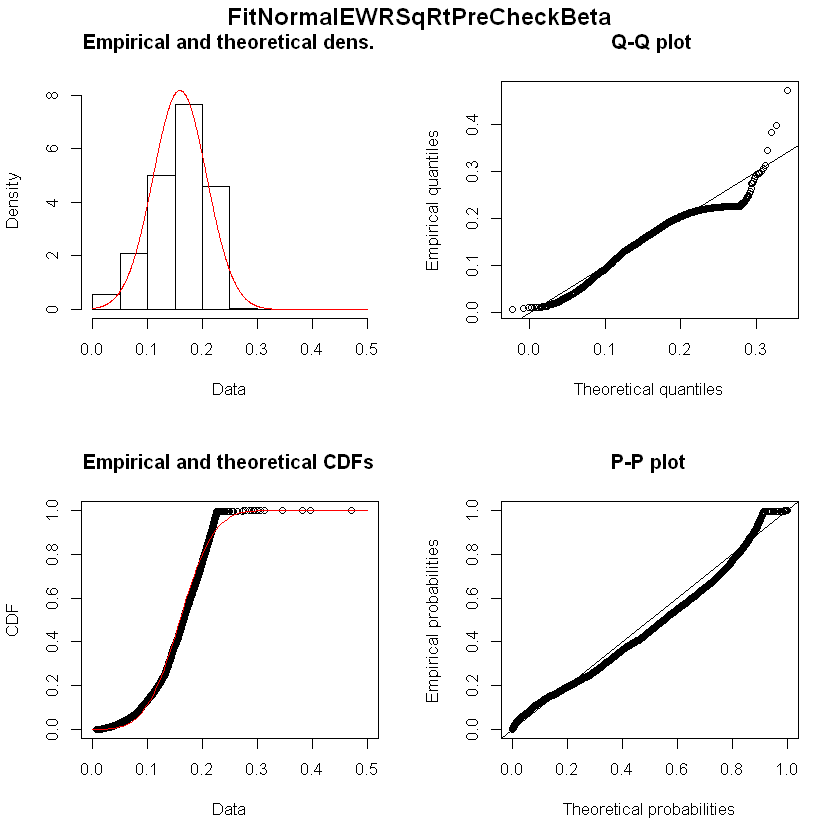

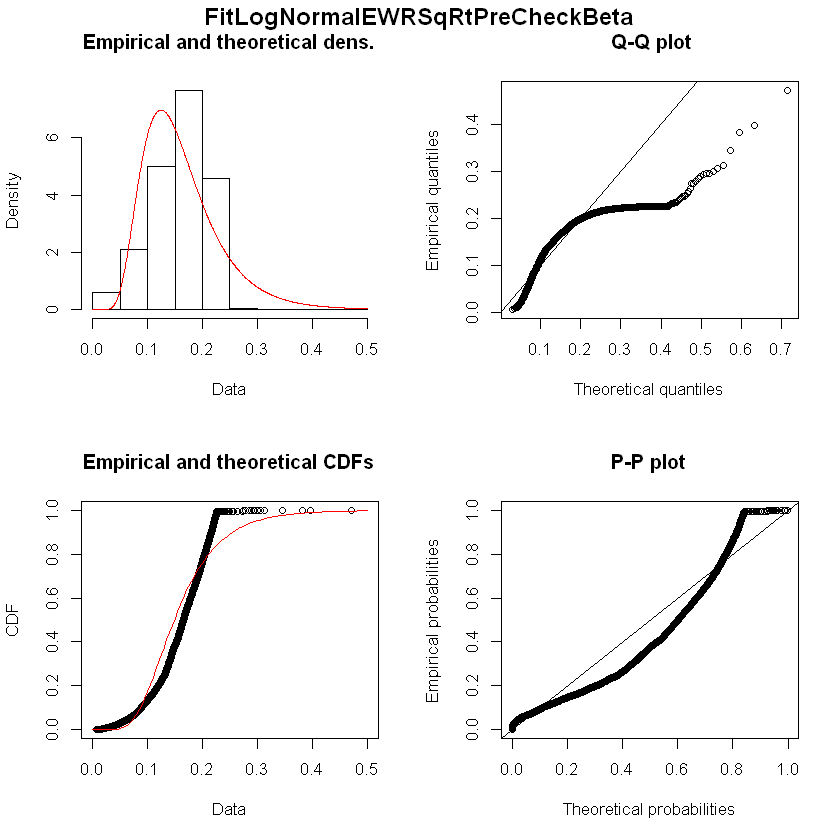

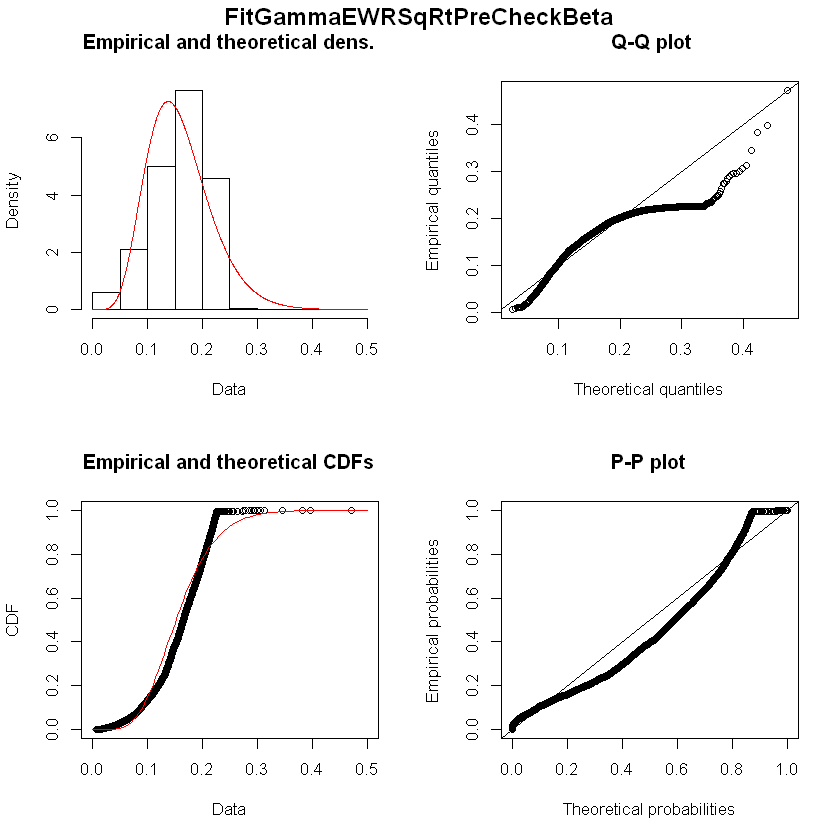

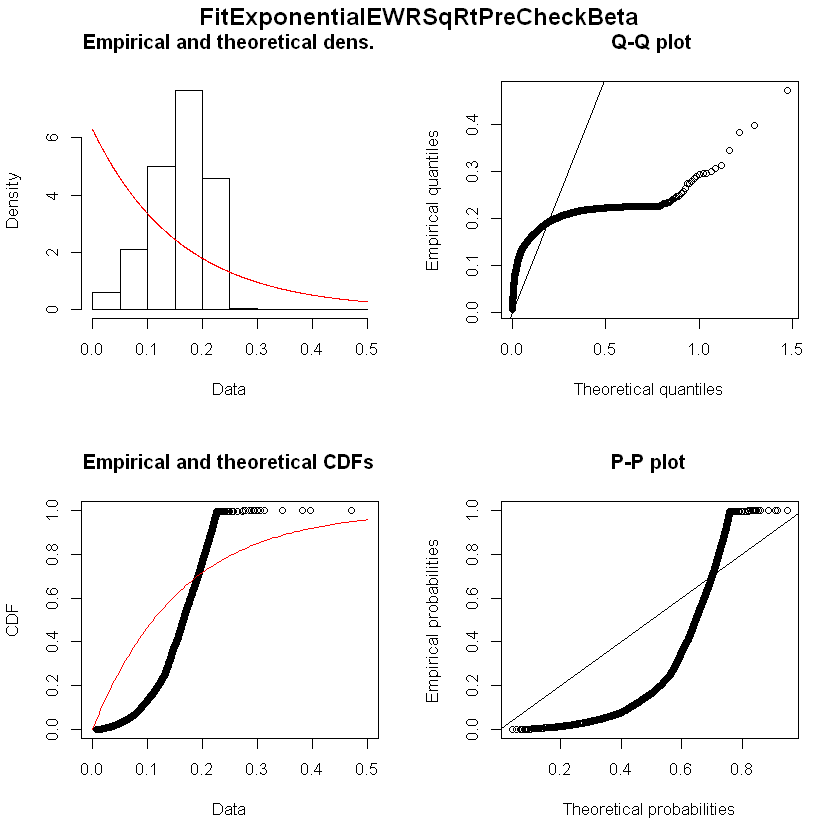

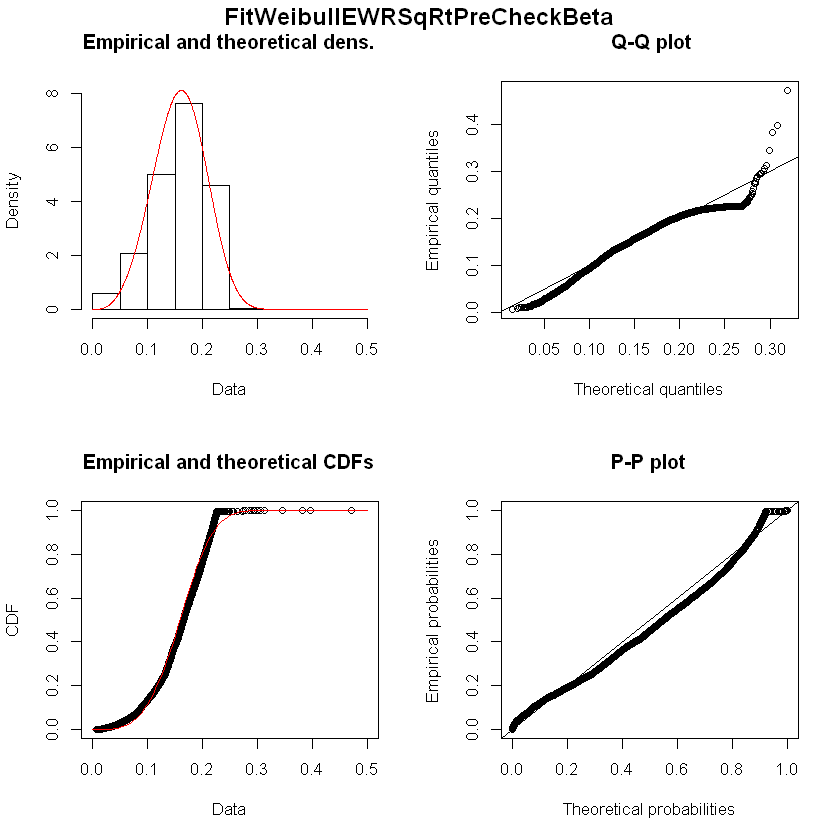

Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape1 1.963987 0.03048899
shape2 4.709192 0.07866294
Loglikelihood:  3277.2   AIC:  -6550.4   BIC:  -6536.632 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.8371323
shape2 0.8371323 1.0000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
mean 0.3027003 0.001728353
sd   0.1468286 0.001221875
Loglikelihood:  3605.257   AIC:  -7206.514   BIC:  -7192.746 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
meanlog -1.4220621 0.009577795
sdlog    0.8136617 0.006772478
Loglikelihood:  1510.764   AIC:  -3017.529   BIC:  -3003.76 
Correlation matrix:
             meanlog        sdlog
meanlog 1.000000e+00 1.843586e-12
sdlog   1.843586e-12 1.000000e+00


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
      estimate Std. Error
shape 2.355618 0.03677667
rate  7.782432 0.13537102
Loglikelihood:  2609.006   AIC:  -5214.012   BIC:  -5200.243 
Correlation matrix:
          shape      rate
shape 1.0000000 0.8975469
rate  0.8975469 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate 3.303598 0.03888739
Loglikelihood:  1407.402   AIC:  -2812.804   BIC:  -2805.92 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate  Std. Error
shape 2.0587852 0.021693266
scale 0.3378975 0.002003167
Loglikelihood:  3249.987   AIC:  -6495.974   BIC:  -6482.205 
Correlation matrix:
         shape    scale
shape 1.000000 0.264265
scale 0.264265 1.000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
           estimate   Std. Error
location 0.31995068 0.0017885116
scale    0.08590499 0.0008455115
Loglikelihood:  3401.506   AIC:  -6799.012   BIC:  -6785.244 
Correlation matrix:
           location      scale
location  1.0000000 -0.1372983
scale    -0.1372983  1.0000000


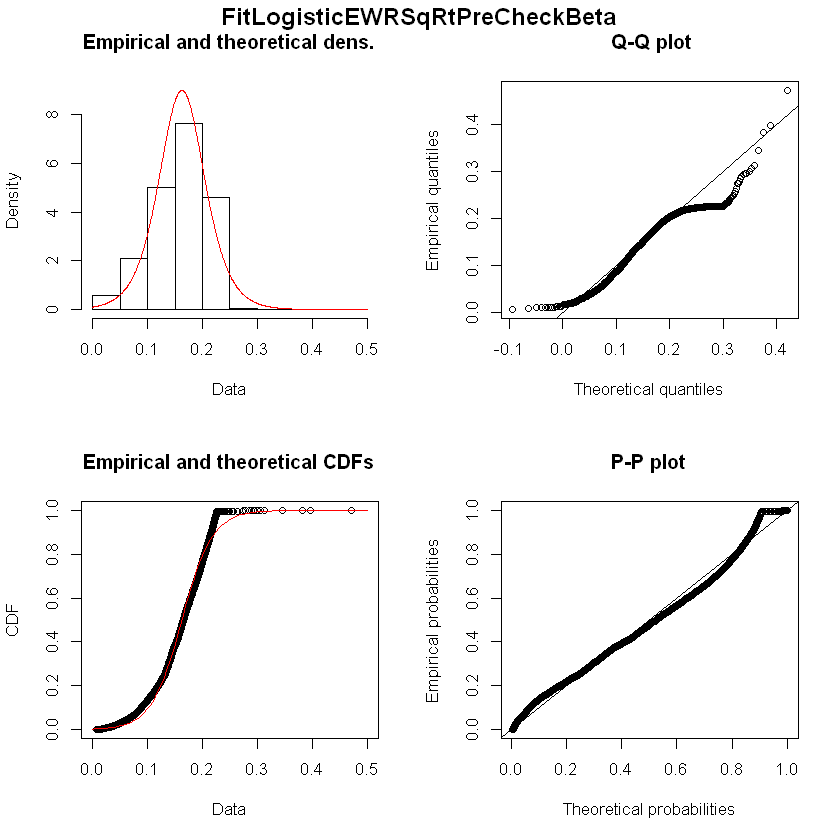

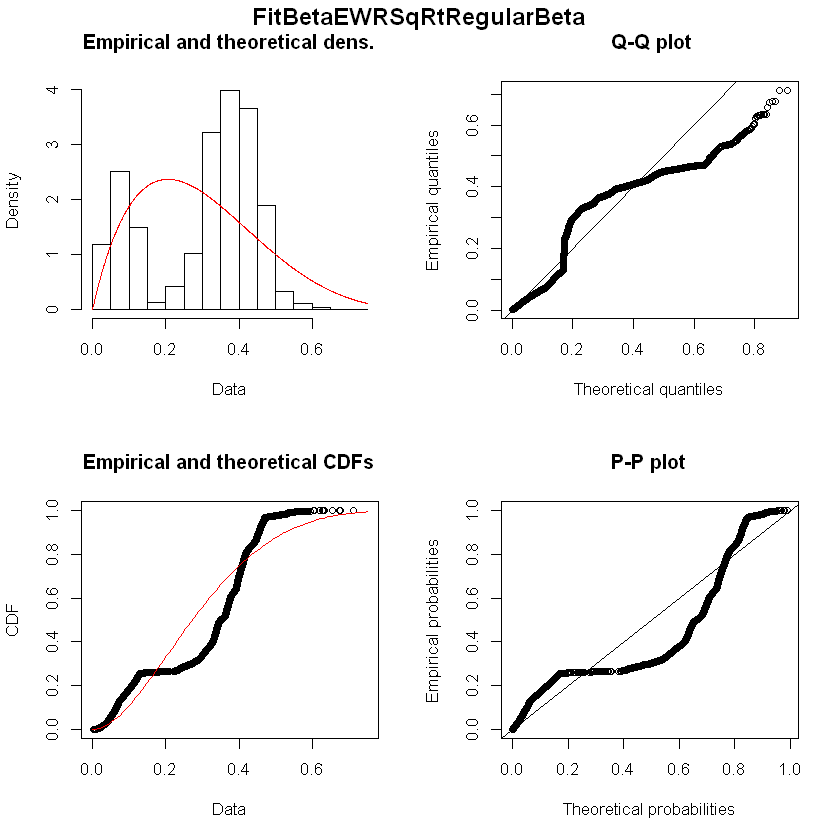

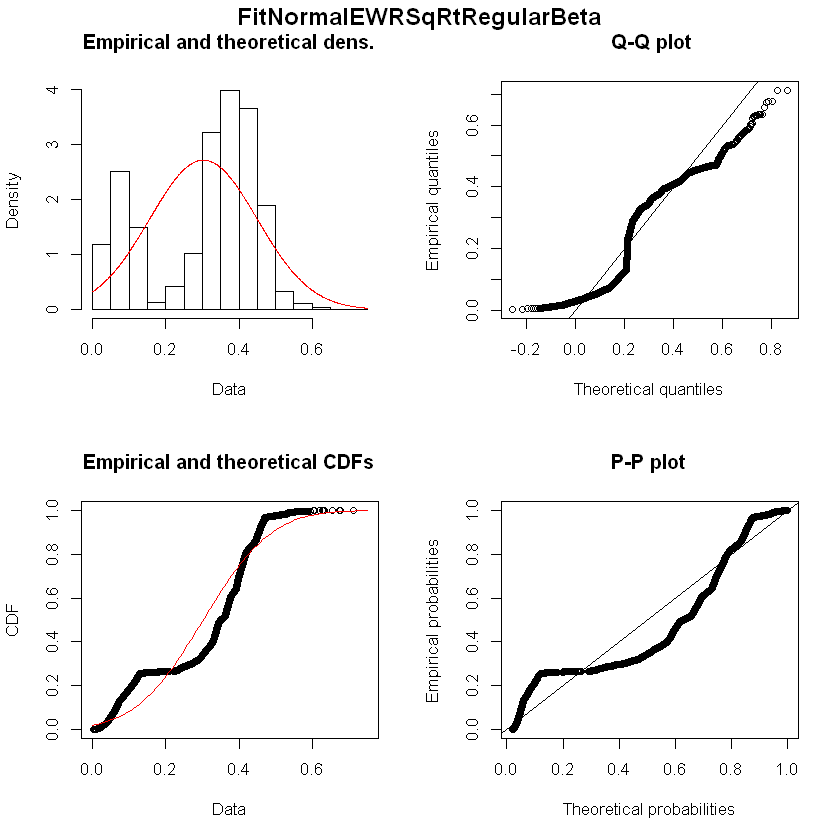

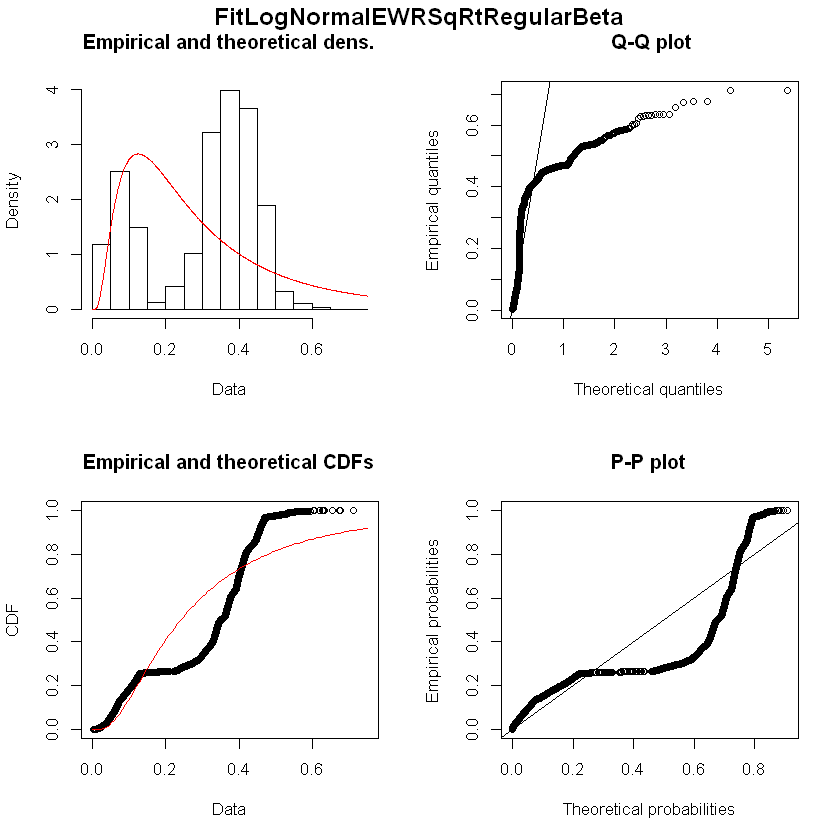

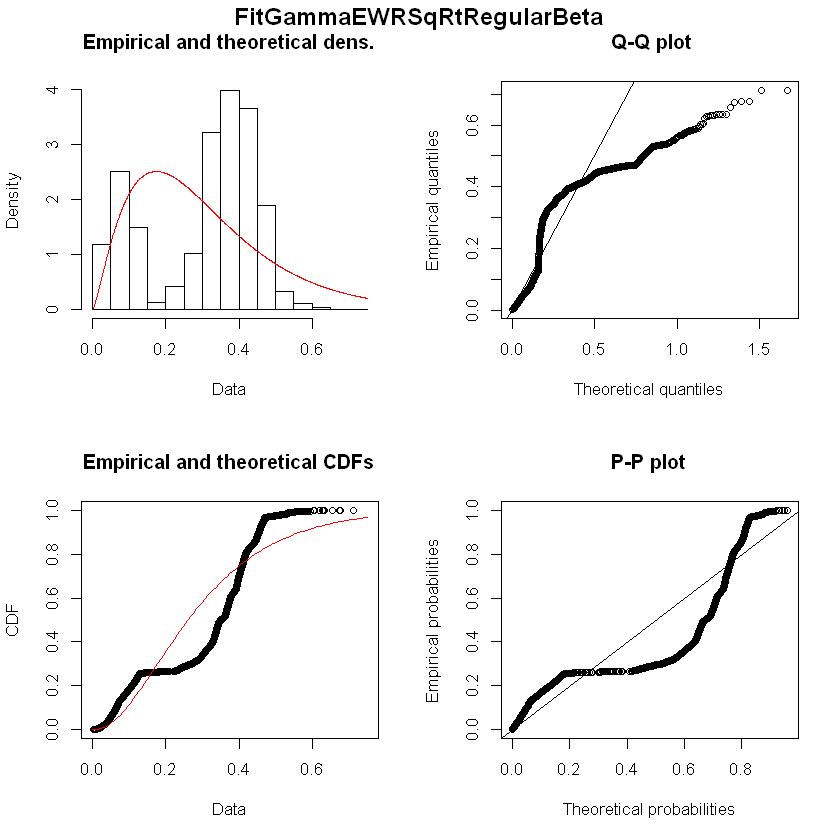

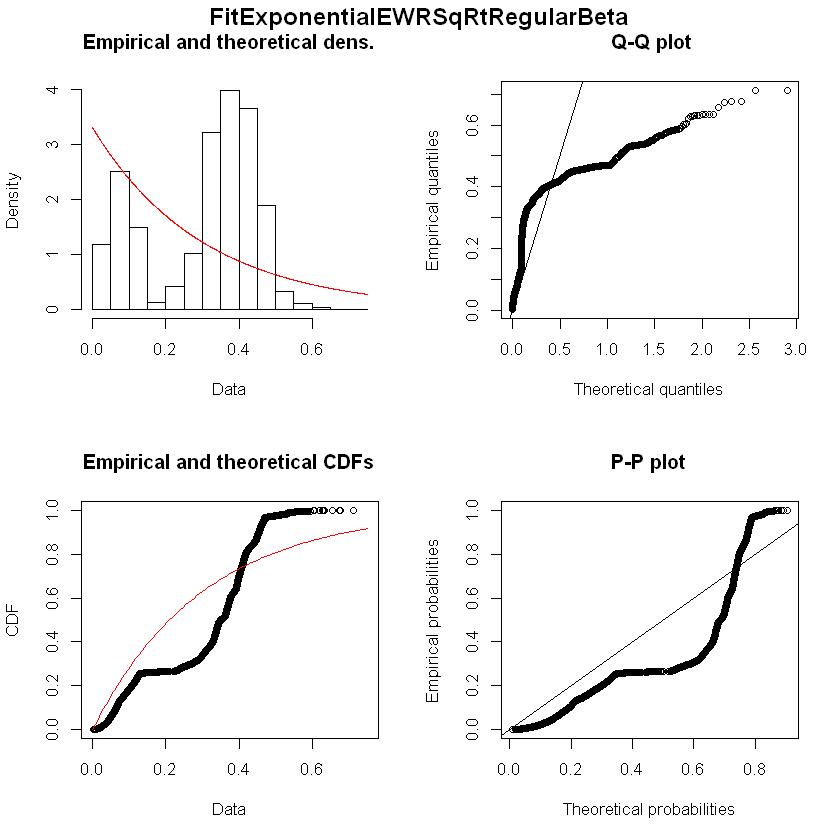

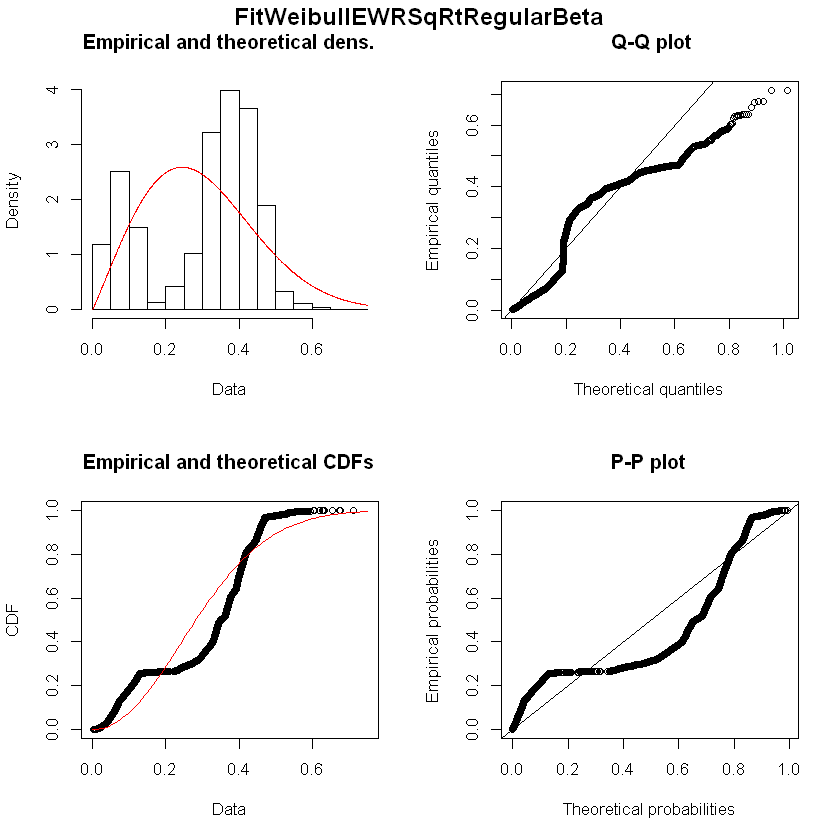

Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
        estimate Std. Error
shape1  2.261254 0.04124869
shape2 83.003374 1.68903923
Loglikelihood:  14685.55   AIC:  -29367.09   BIC:  -29353.95 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.8910522
shape2 0.8910522 1.0000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
mean 0.02657086 0.0001972123
sd   0.01430571 0.0001363961
Loglikelihood:  14881.77   AIC:  -29759.53   BIC:  -29746.4 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
meanlog -3.8610159 0.011910162
sdlog    0.8639589 0.008421705
Loglikelihood:  13619.67   AIC:  -27235.35   BIC:  -27222.21 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape  2.298054  0.0419582
rate  86.495264  1.7642835
Loglikelihood:  14662.26   AIC:  -29320.53   BIC:  -29307.39 
Correlation matrix:
          shape      rate
shape 1.0000000 0.8951181
rate  0.8951181 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate 37.63521  0.5188226
Loglikelihood:  13828.22   AIC:  -27654.44   BIC:  -27647.87 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
        estimate   Std. Error
shape 1.82377991 0.0198313744
scale 0.02958847 0.0002324413
Loglikelihood:  14947.8   AIC:  -29891.59   BIC:  -29878.46 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2881125
scale 0.2881125 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
            estimate   Std. Error
location 0.026478855 1.968312e-04
scale    0.008091656 8.693938e-05
Loglikelihood:  14938.6   AIC:  -29873.2   BIC:  -29860.06 
Correlation matrix:
             location        scale
location  1.000000000 -0.004154999
scale    -0.004154999  1.000000000


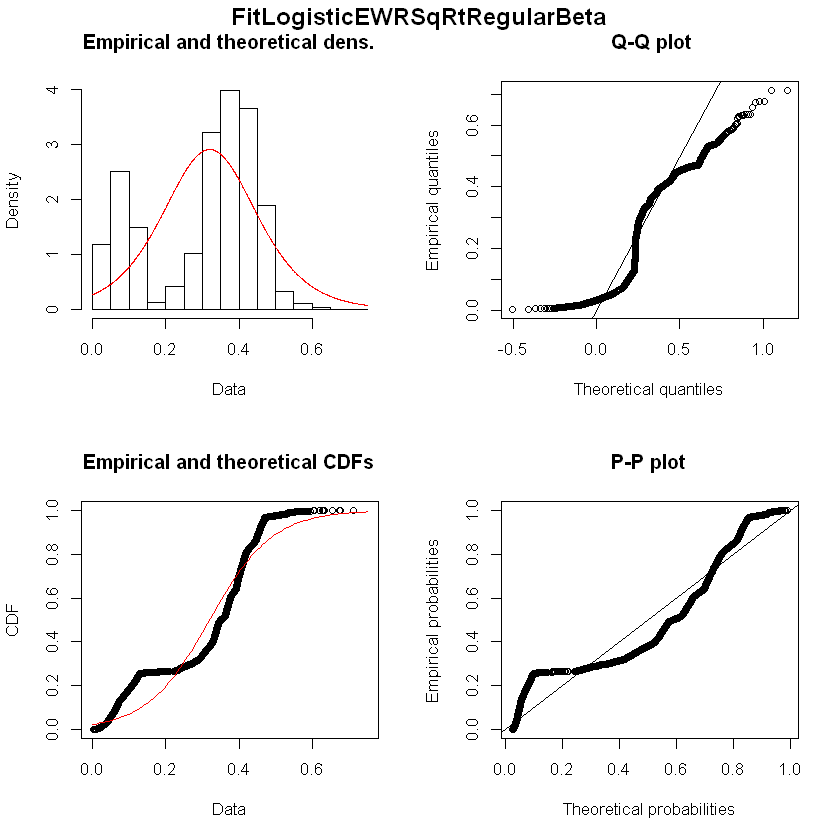

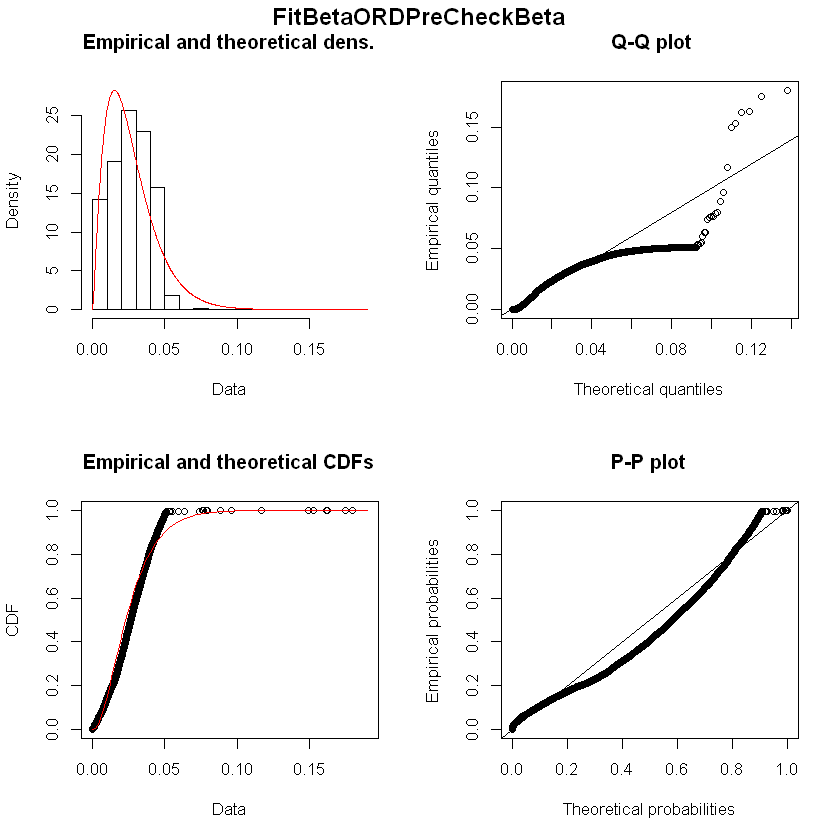

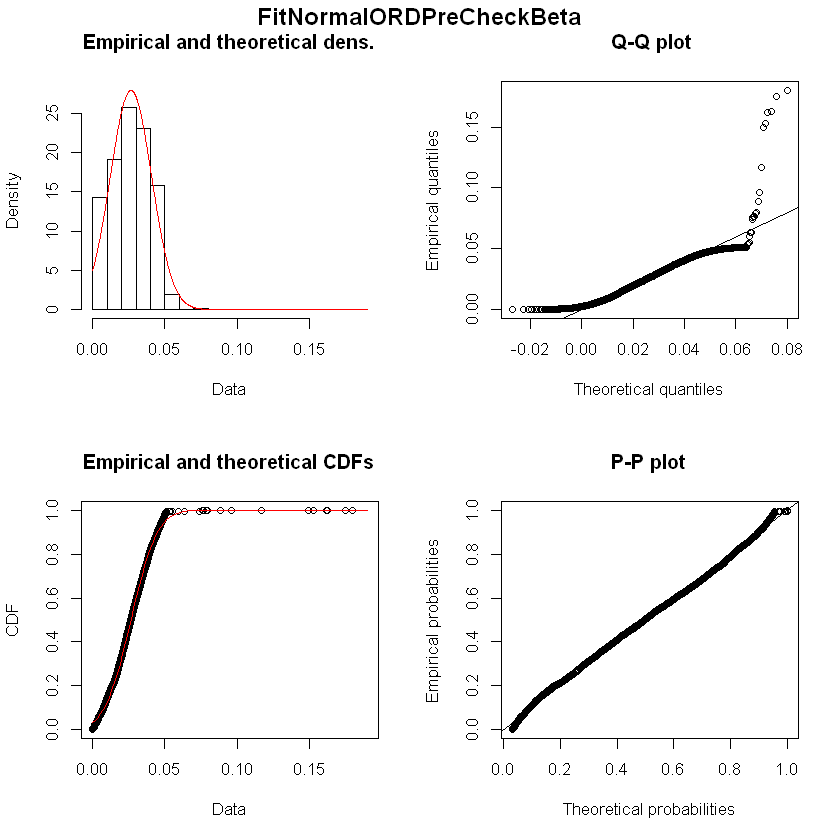

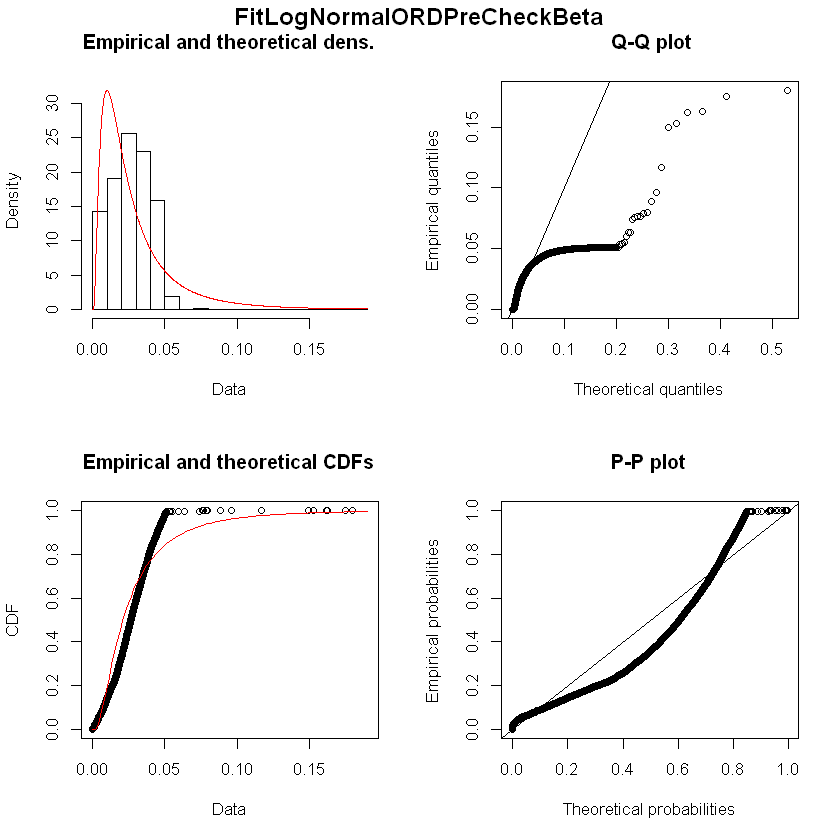

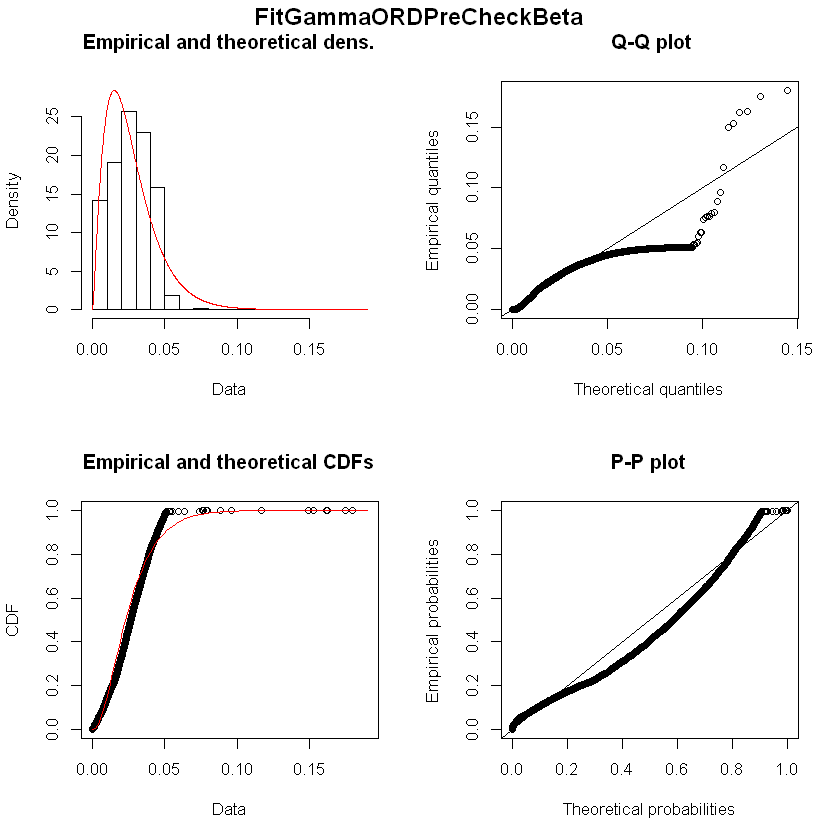

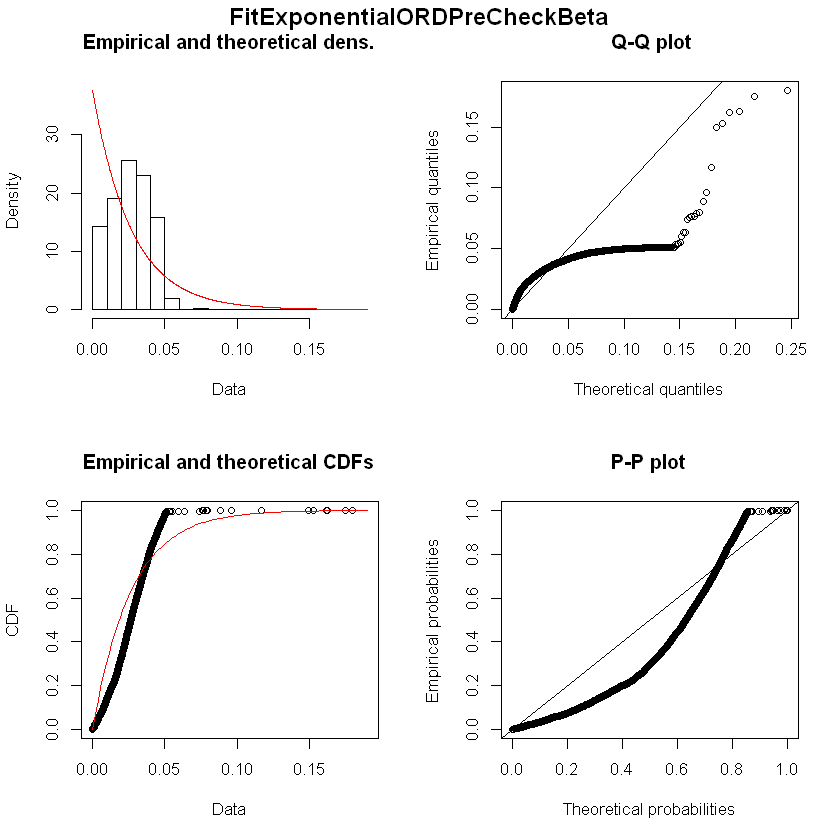

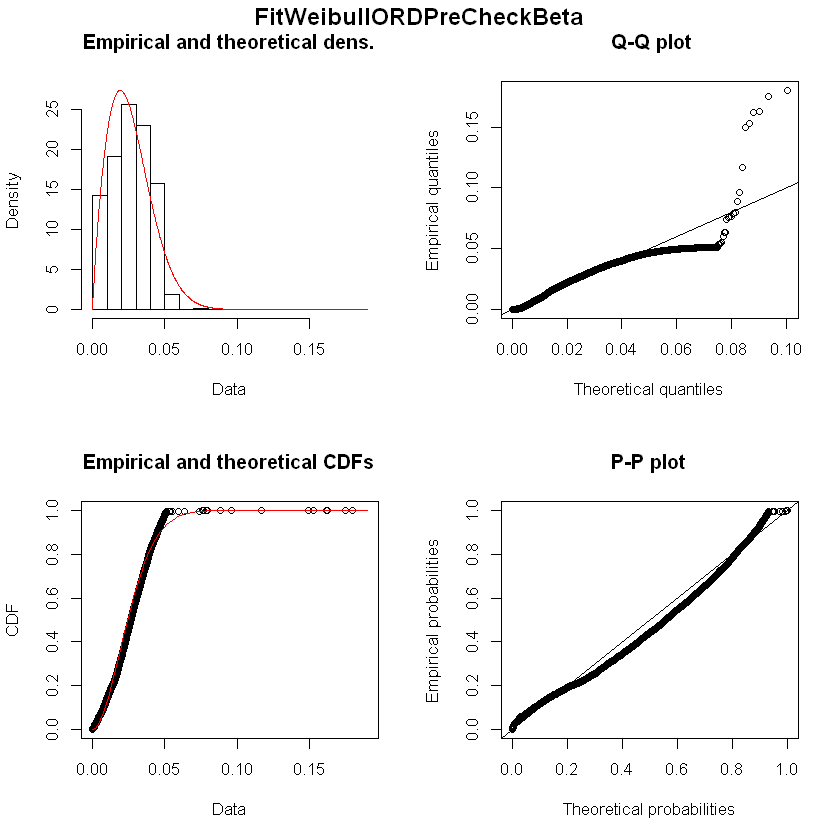

Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
        estimate Std. Error
shape1 0.8209829 0.01175113
shape2 6.4997334 0.11953878
Loglikelihood:  8765.278   AIC:  -17526.56   BIC:  -17512.76 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.7214961
shape2 0.7214961 1.0000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
mean 0.11550991 0.0010094713
sd   0.08636734 0.0007133734
Loglikelihood:  7541.117   AIC:  -15078.23   BIC:  -15064.44 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
         estimate Std. Error
meanlog -2.838613 0.01958724
sdlog    1.675825 0.01385024
Loglikelihood:  6612.663   AIC:  -13221.33   BIC:  -13207.53 
Correlation matrix:
              meanlog         sdlog
meanlog  1.000000e+00 -6.168375e-11
sdlog   -6.168375e-11  1.000000e+00


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape 0.8637609 0.01240619
rate  7.4782836 0.14276568
Loglikelihood:  8533.52   AIC:  -17063.04   BIC:  -17049.24 
Correlation matrix:
          shape      rate
shape 1.0000000 0.7523551
rate  0.7523551 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate 8.657266  0.1011871
Loglikelihood:  8479.481   AIC:  -16956.96   BIC:  -16950.06 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate  Std. Error
shape 1.0047454 0.010245209
scale 0.1156958 0.001395576
Loglikelihood:  8479.591   AIC:  -16955.18   BIC:  -16941.38 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2648364
scale 0.2648364 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
           estimate   Std. Error
location 0.11203407 0.0009778865
scale    0.04784593 0.0004601628
Loglikelihood:  7679.705   AIC:  -15355.41   BIC:  -15341.61 
Correlation matrix:
           location      scale
location 1.00000000 0.00285858
scale    0.00285858 1.00000000


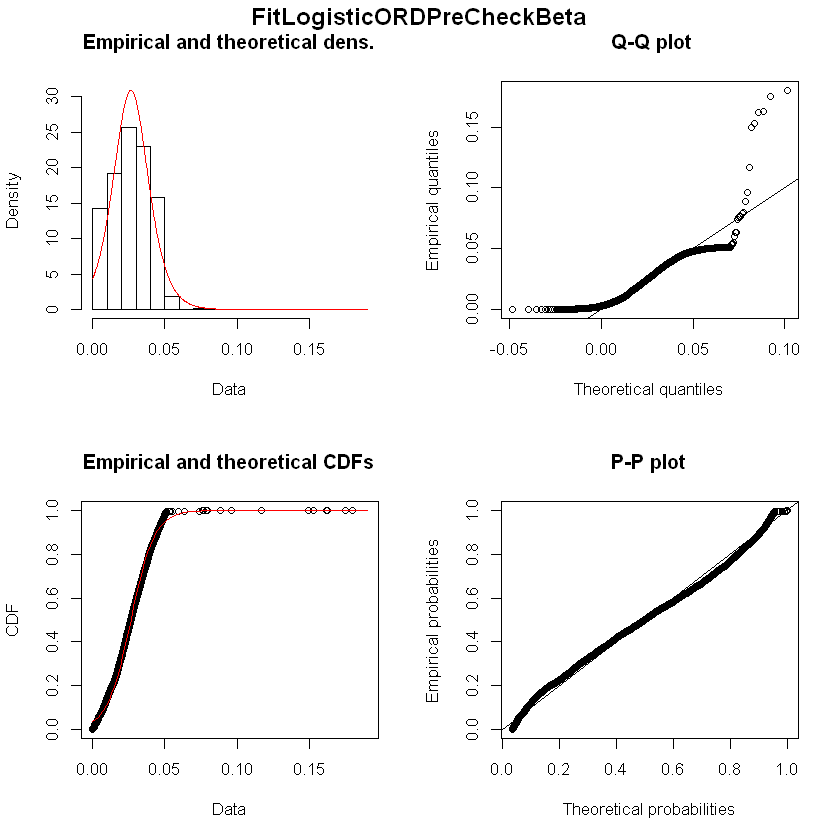

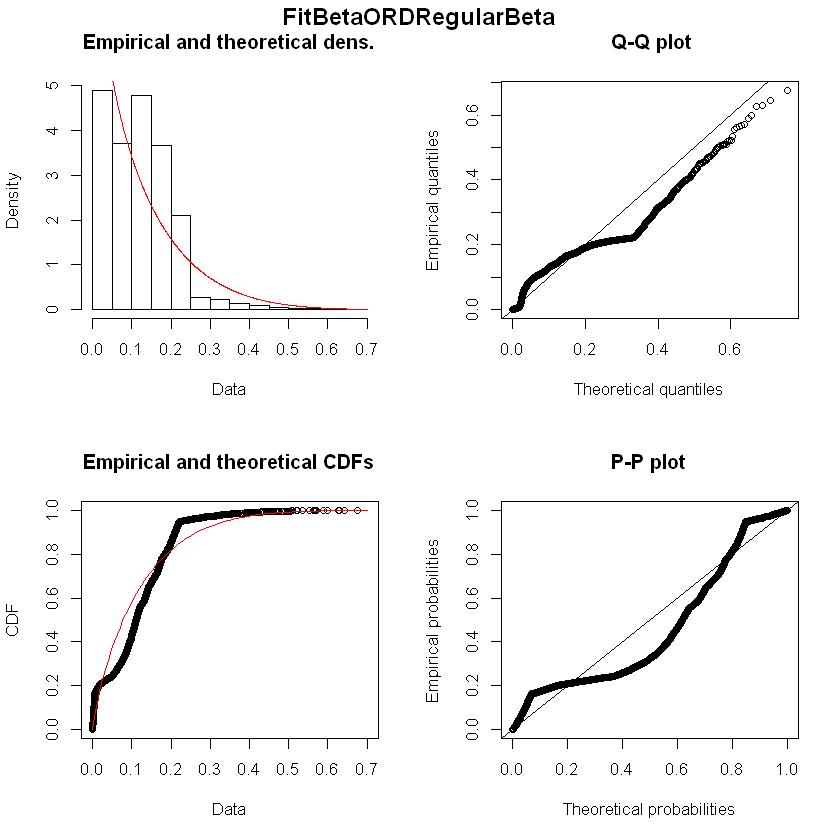

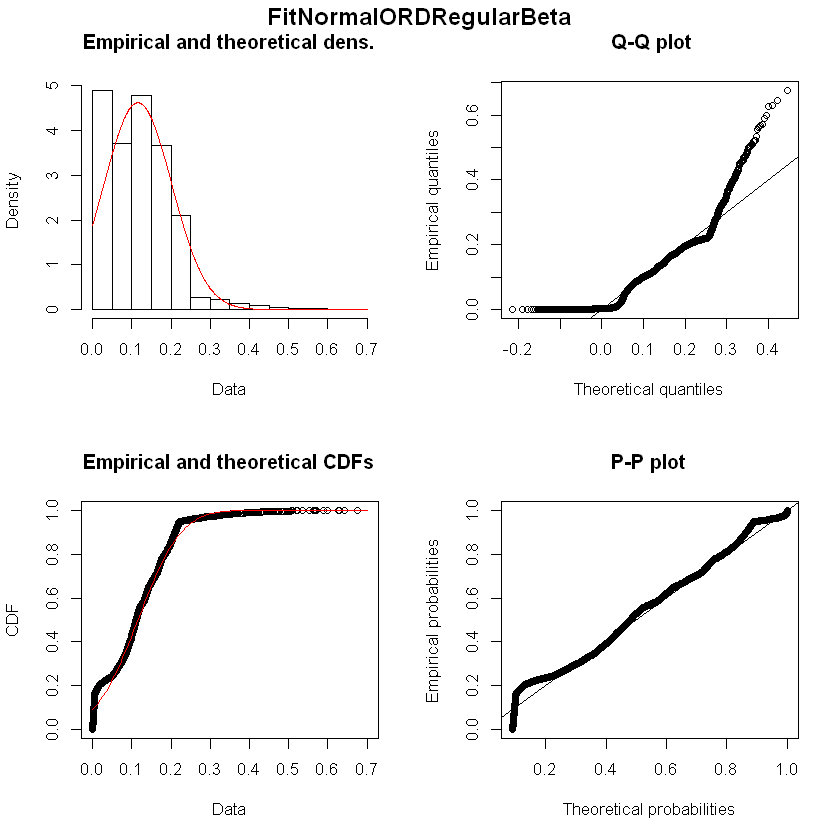

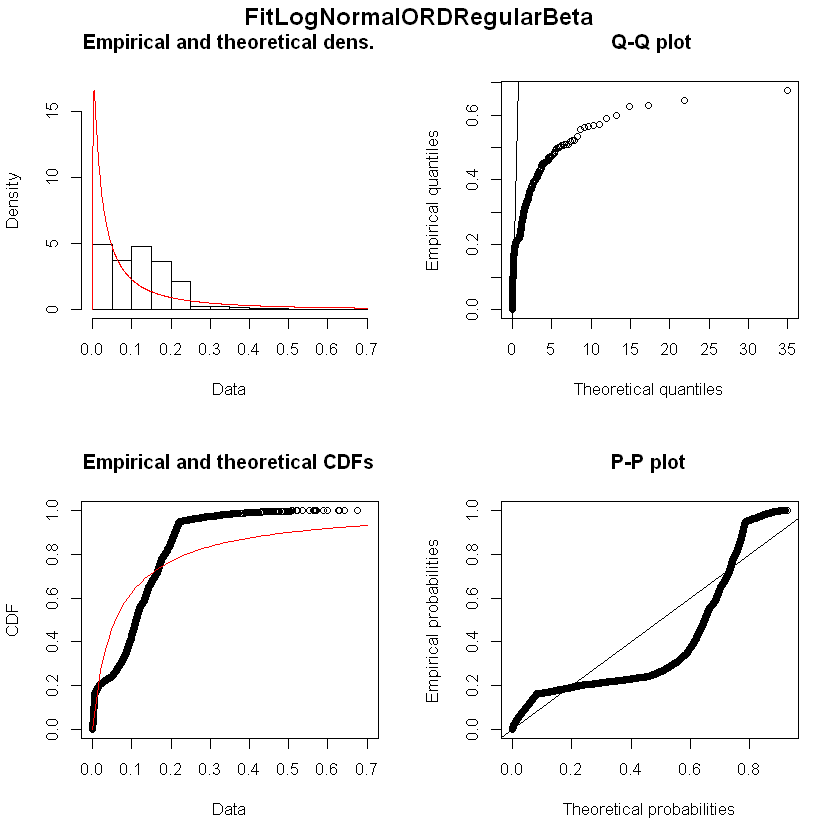

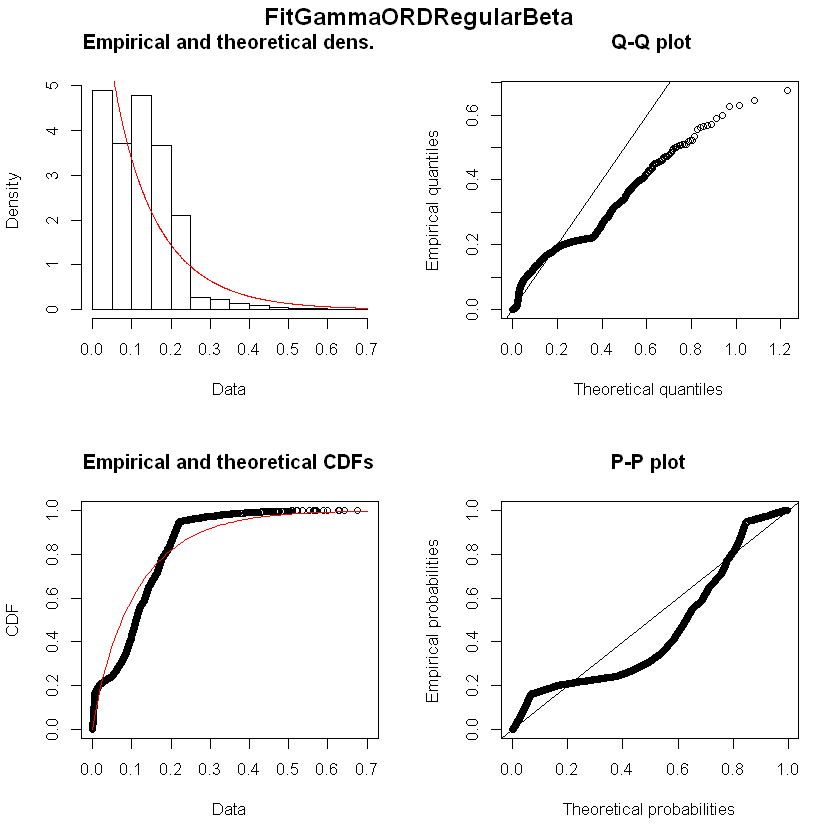

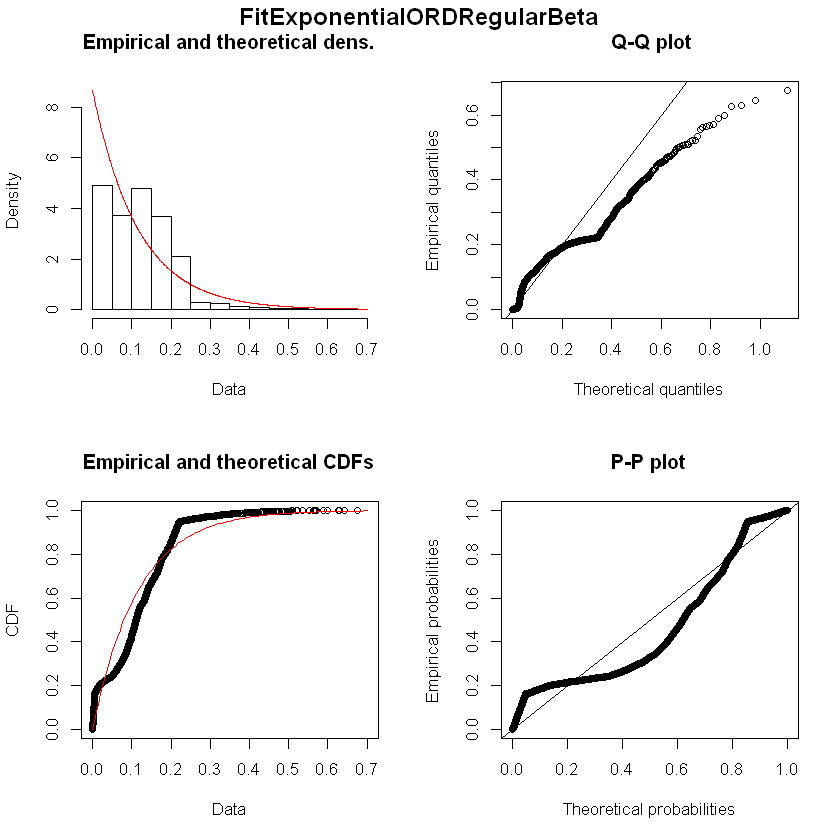

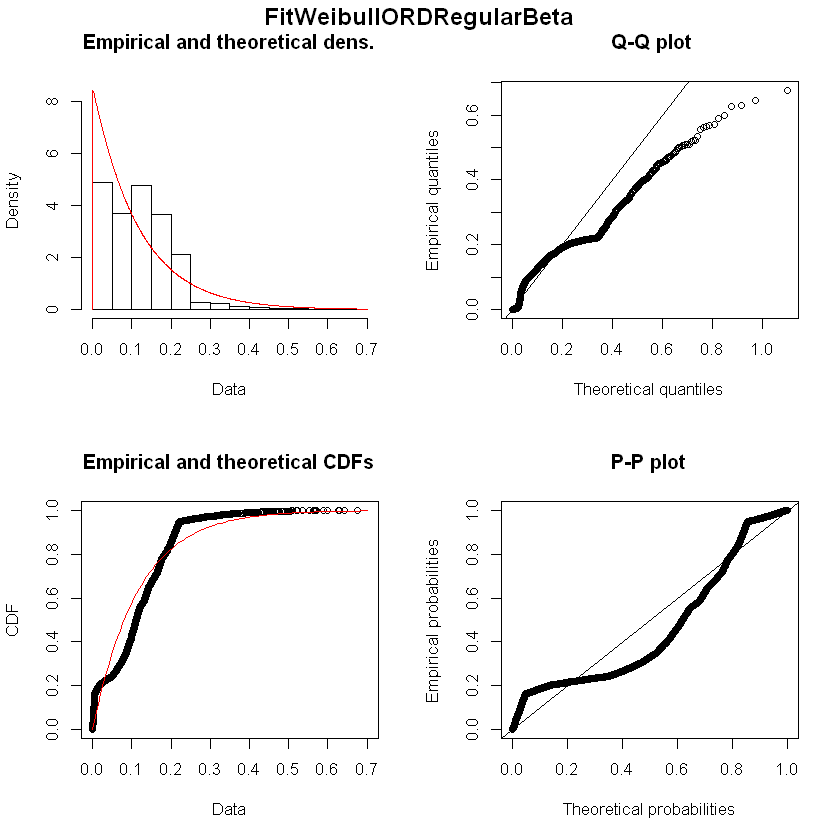

Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
        estimate Std. Error
shape1  6.453235  0.1227403
shape2 35.128813  0.6897959
Loglikelihood:  7913.745   AIC:  -15823.49   BIC:  -15810.35 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.9549535
shape2 0.9549535 1.0000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
mean 0.15571163 0.0006646806
sd   0.04821569 0.0004690907
Loglikelihood:  8488.302   AIC:  -16972.6   BIC:  -16959.47 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
meanlog -1.9305080 0.005955081
sdlog    0.4319794 0.004210776
Loglikelihood:  7108.682   AIC:  -14213.36   BIC:  -14200.23 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape  7.229903  0.1378226
rate  46.431159  0.9165633
Loglikelihood:  7775.061   AIC:  -15546.12   BIC:  -15532.98 
Correlation matrix:
         shape     rate
shape 1.000000 0.965684
rate  0.965684 1.000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate 6.422128 0.08853266
Loglikelihood:  4524.002   AIC:  -9046.004   BIC:  -9039.436 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate   Std. Error
shape 3.6482298 0.0396425276
scale 0.1720122 0.0006781868
Loglikelihood:  8436.805   AIC:  -16869.61   BIC:  -16856.47 
Correlation matrix:
          shape     scale
shape 1.0000000 0.2863161
scale 0.2863161 1.0000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
          estimate   Std. Error
location 0.1592763 0.0006547146
scale    0.0271730 0.0003097696
Loglikelihood:  8491.167   AIC:  -16978.33   BIC:  -16965.2 
Correlation matrix:
            location       scale
location  1.00000000 -0.06204802
scale    -0.06204802  1.00000000


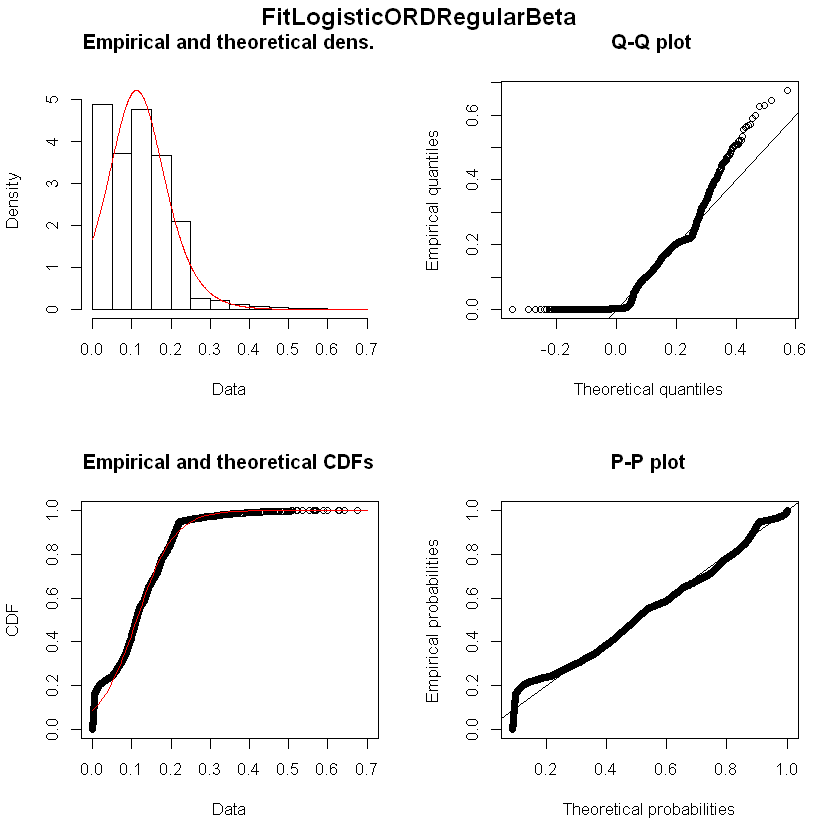

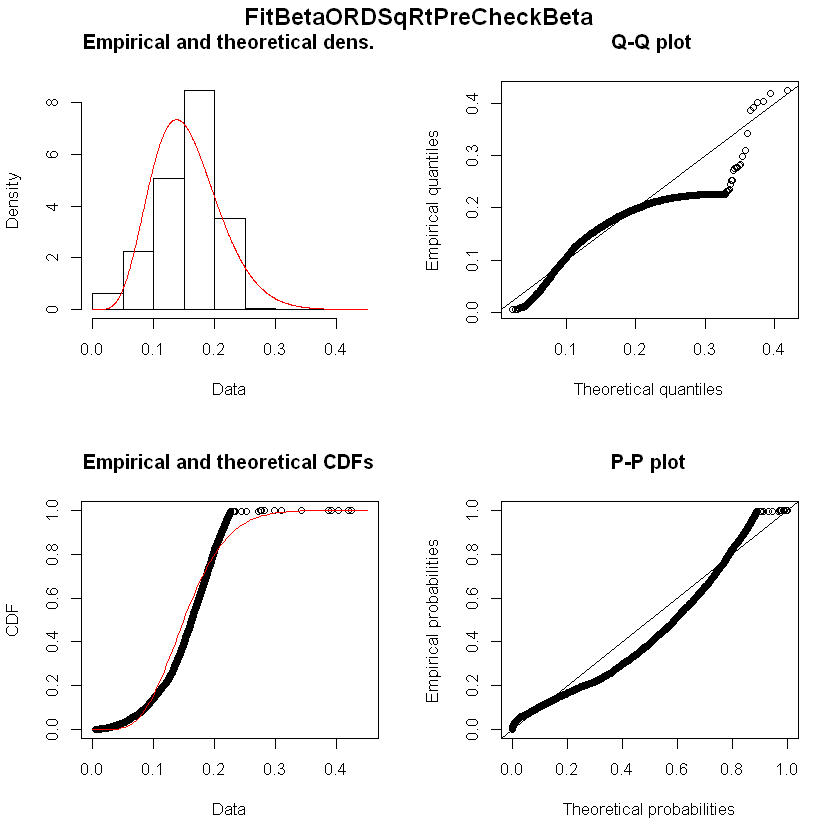

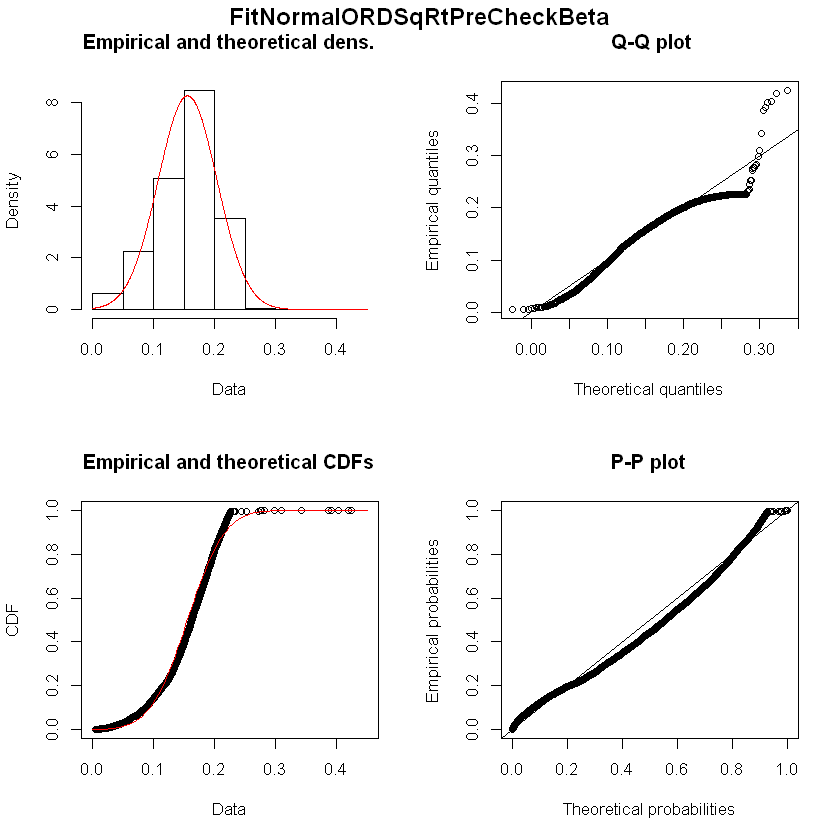

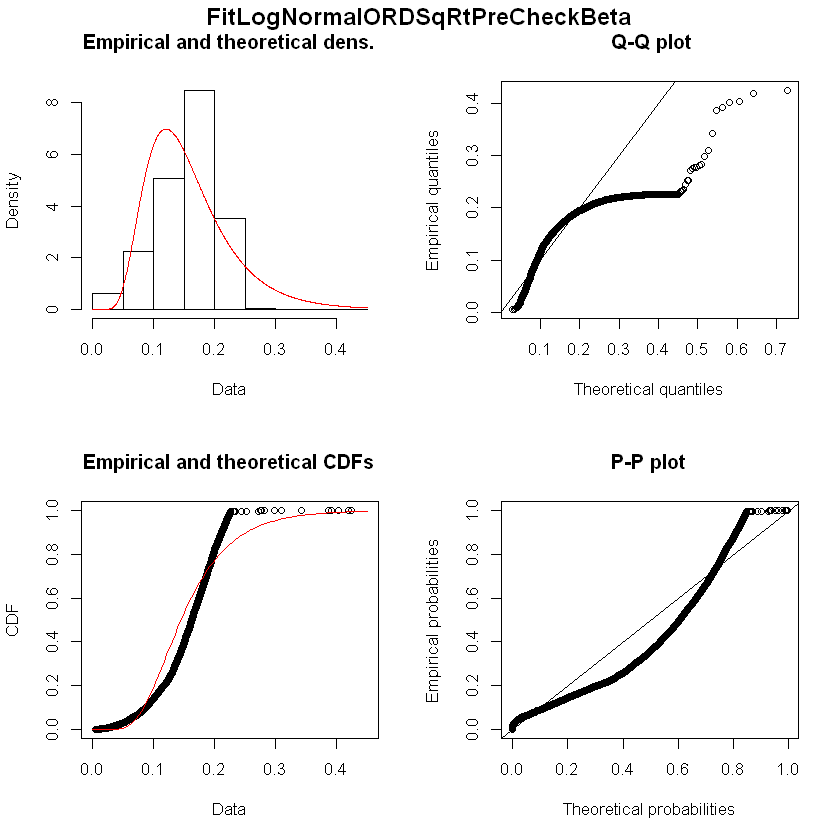

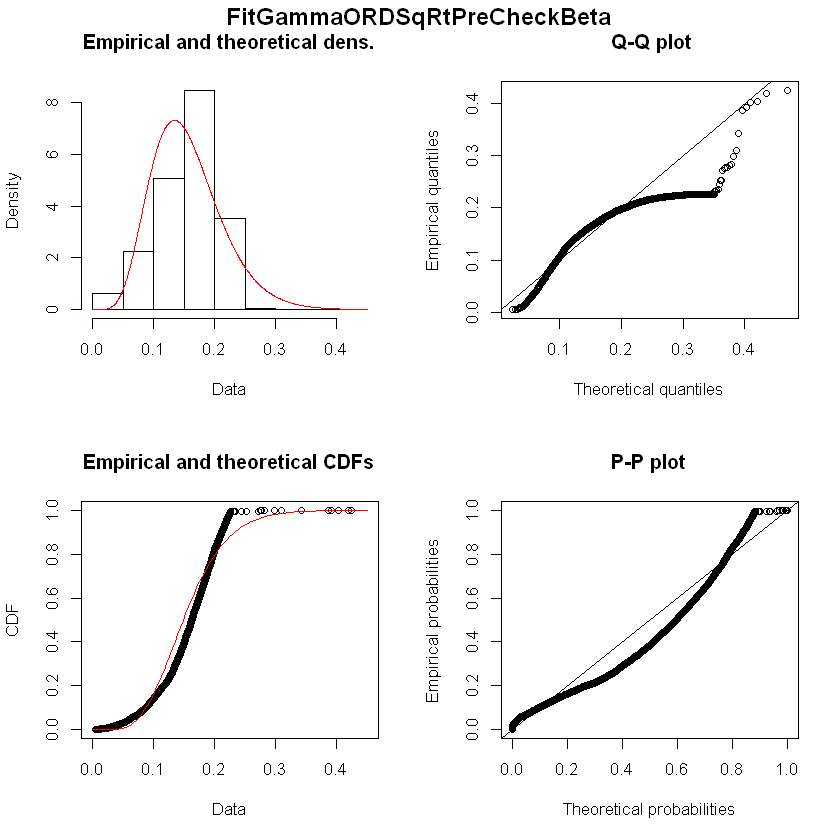

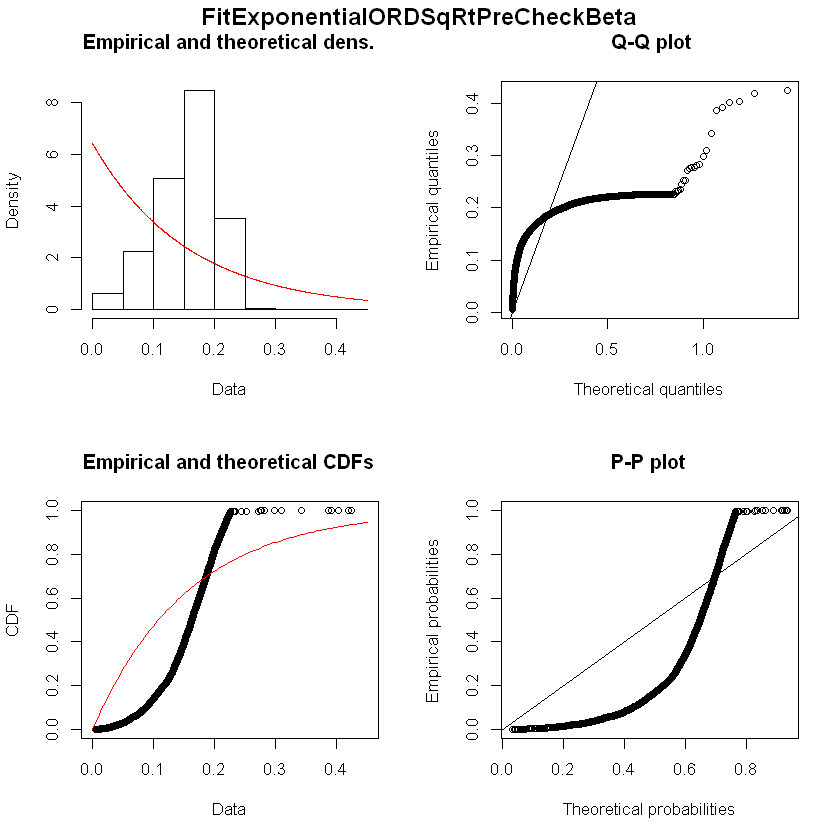

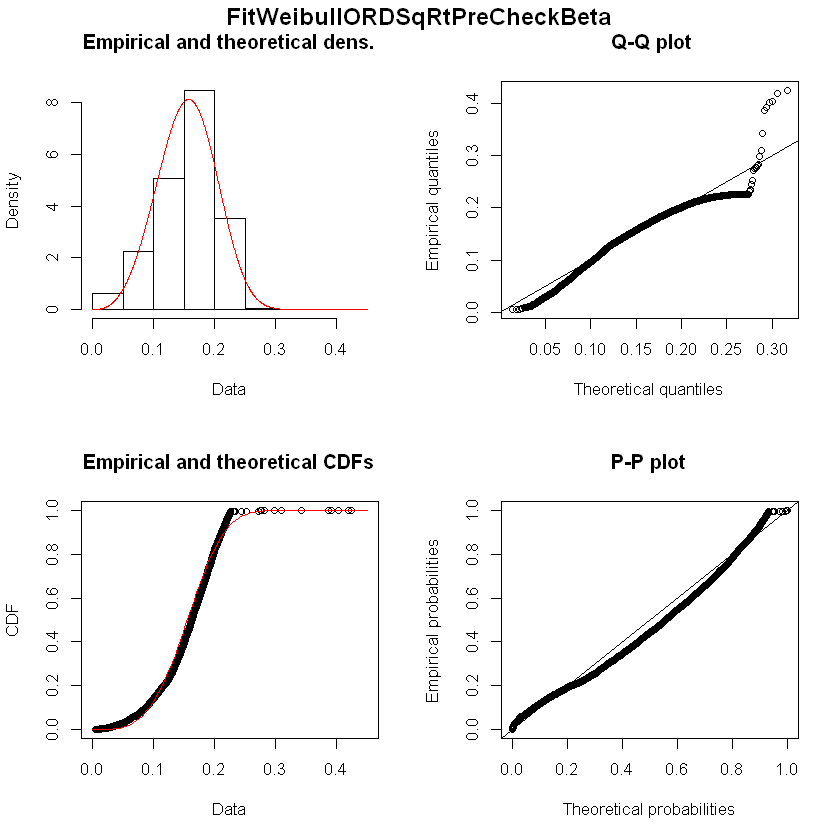

Fitting of the distribution ' beta ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape1 1.899725 0.02922942
shape2 4.494999 0.07453533
Loglikelihood:  3186.744   AIC:  -6369.488   BIC:  -6355.691 
Correlation matrix:
          shape1    shape2
shape1 1.0000000 0.8317591
shape2 0.8317591 1.0000000


Fitting of the distribution ' norm ' by maximum likelihood 
Parameters : 
      estimate  Std. Error
mean 0.3053366 0.001744604
sd   0.1492631 0.001233372
Loglikelihood:  3536.339   AIC:  -7068.678   BIC:  -7054.881 
Correlation matrix:
     mean sd
mean    1  0
sd      0  1


Fitting of the distribution ' lnorm ' by maximum likelihood 
Parameters : 
          estimate  Std. Error
meanlog -1.4193067 0.009793618
sdlog    0.8379125 0.006925089
Loglikelihood:  1297.175   AIC:  -2590.35   BIC:  -2576.553 
Correlation matrix:
        meanlog sdlog
meanlog       1     0
sdlog         0     1


Fitting of the distribution ' gamma ' by maximum likelihood 
Parameters : 
      estimate Std. Error
shape 2.299102 0.03559151
rate  7.529485 0.13021203
Loglikelihood:  2525.298   AIC:  -5046.596   BIC:  -5032.799 
Correlation matrix:
          shape      rate
shape 1.0000000 0.8951635
rate  0.8951635 1.0000000


Fitting of the distribution ' exp ' by maximum likelihood 
Parameters : 
     estimate Std. Error
rate 3.275074 0.03827944
Loglikelihood:  1364.012   AIC:  -2726.025   BIC:  -2719.127 

Fitting of the distribution ' weibull ' by maximum likelihood 
Parameters : 
       estimate Std. Error
shape 2.0095028 0.02049044
scale 0.3401304 0.00205165
Loglikelihood:  3164.103   AIC:  -6324.206   BIC:  -6310.41 
Correlation matrix:
         shape    scale
shape 1.000000 0.264903
scale 0.264903 1.000000


Fitting of the distribution ' logis ' by maximum likelihood 
Parameters : 
           estimate   Std. Error
location 0.31760044 0.0017489004
scale    0.08556435 0.0008386944
Loglikelihood:  3424.982   AIC:  -6845.964   BIC:  -6832.167 
Correlation matrix:
           location      scale
location  1.0000000 -0.0952227
scale    -0.0952227  1.0000000


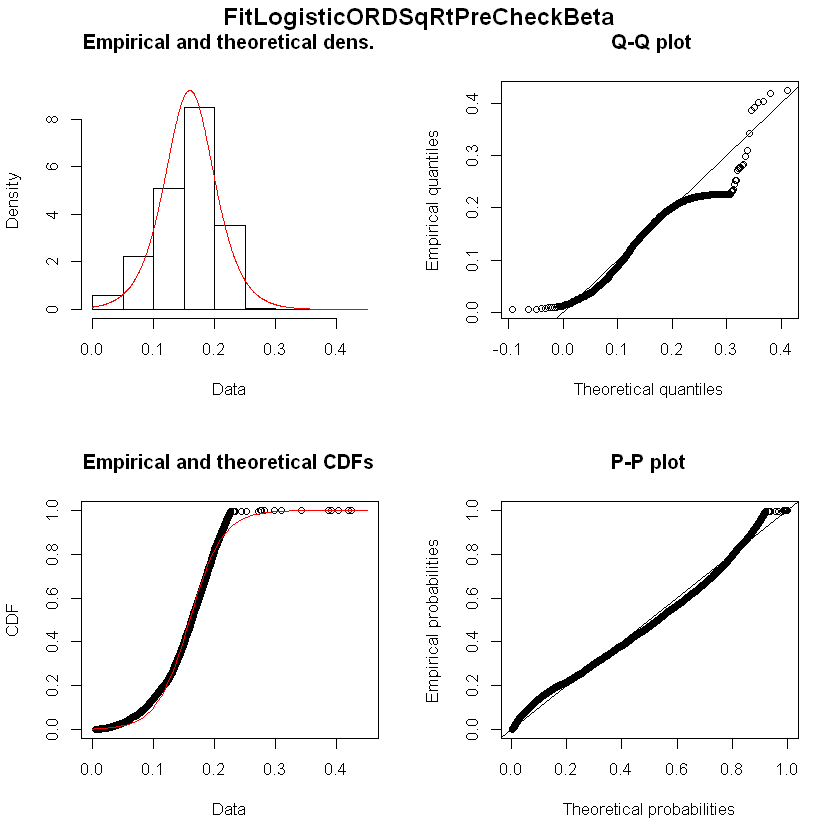

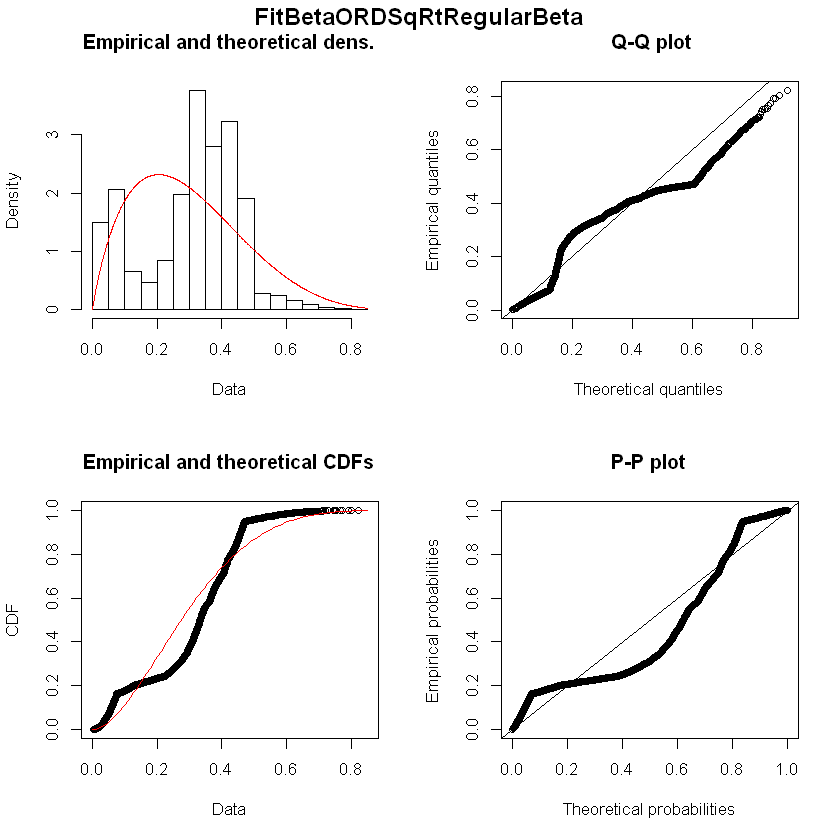

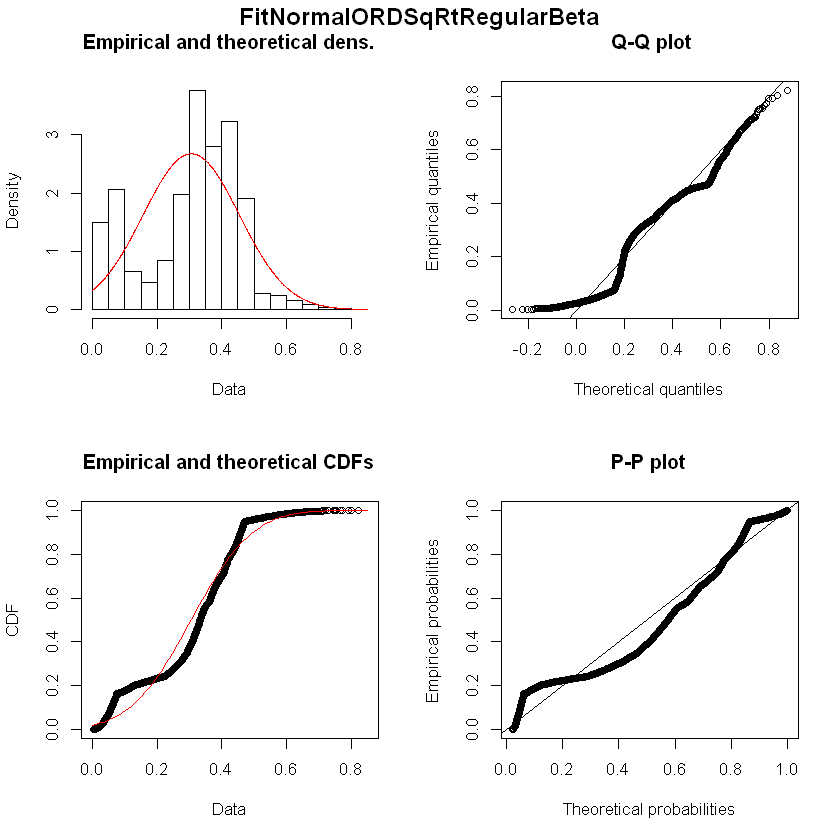

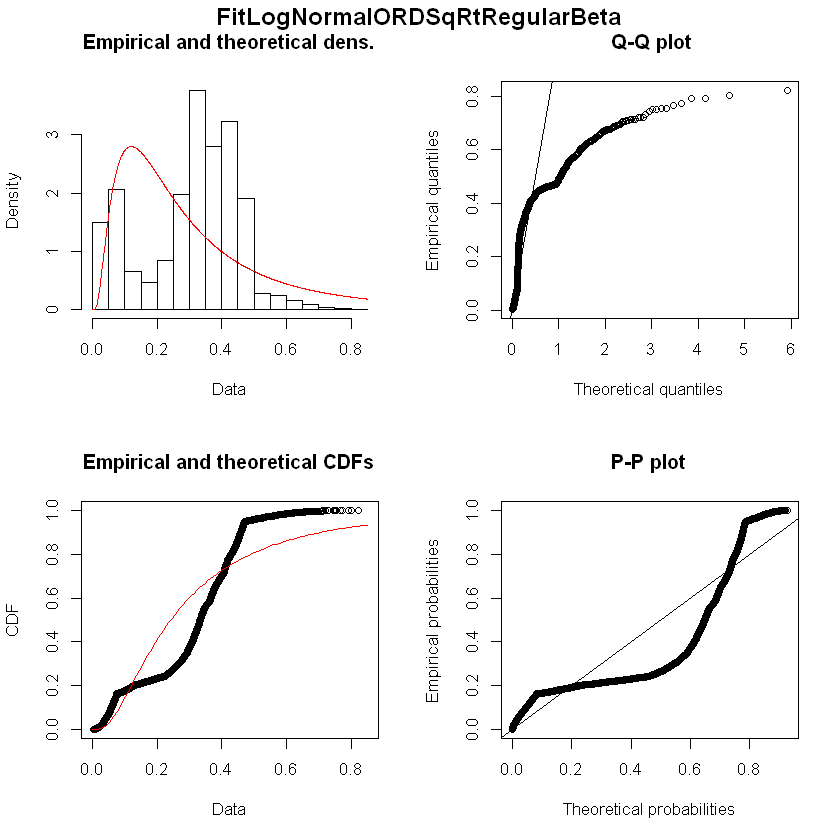

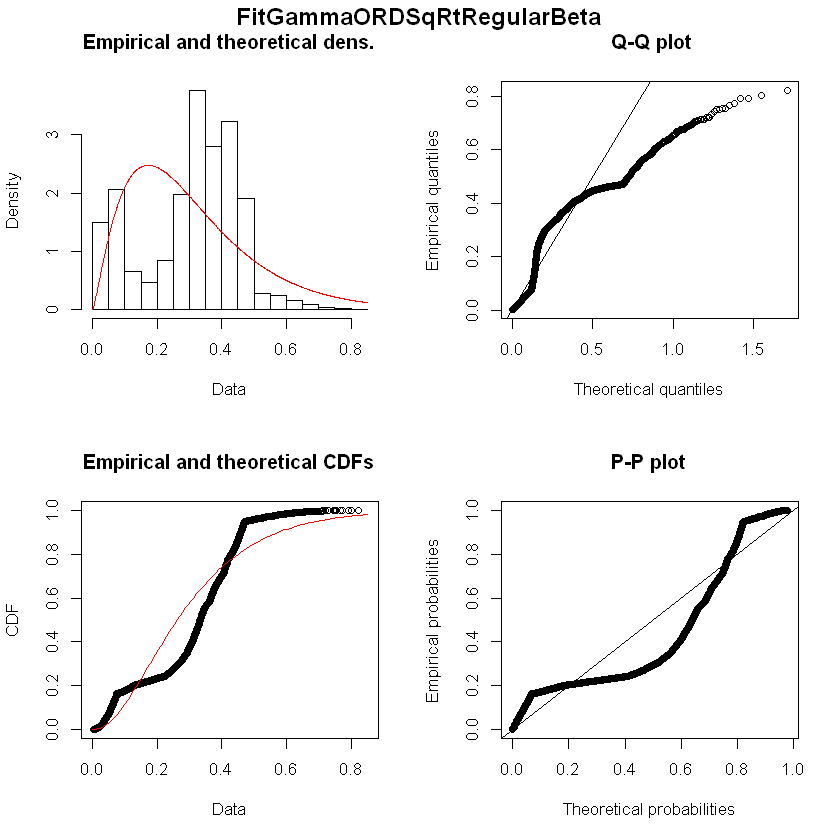

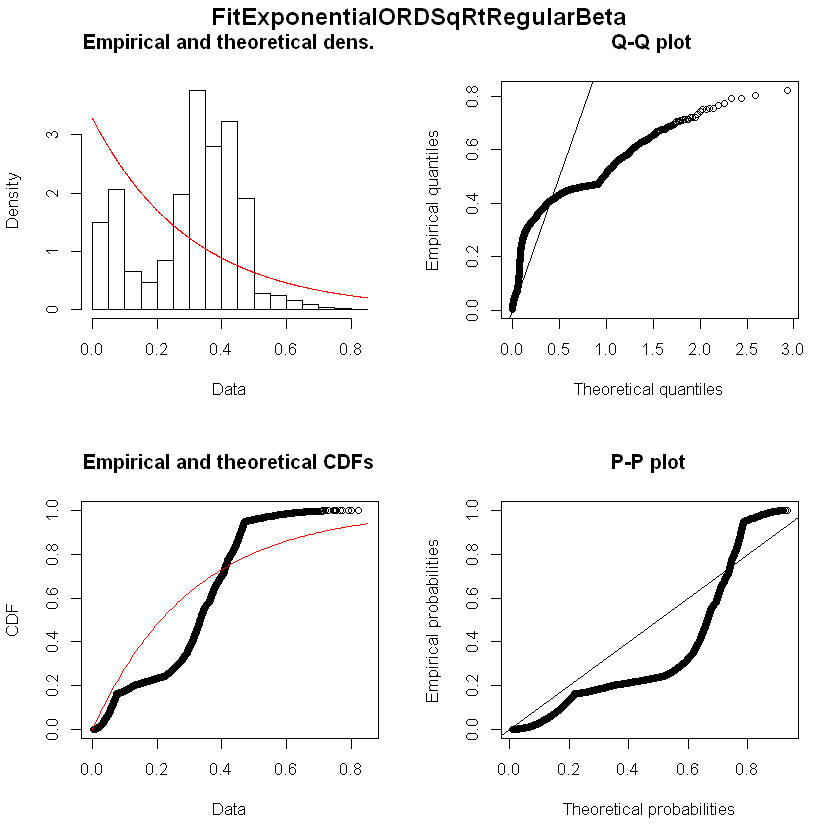

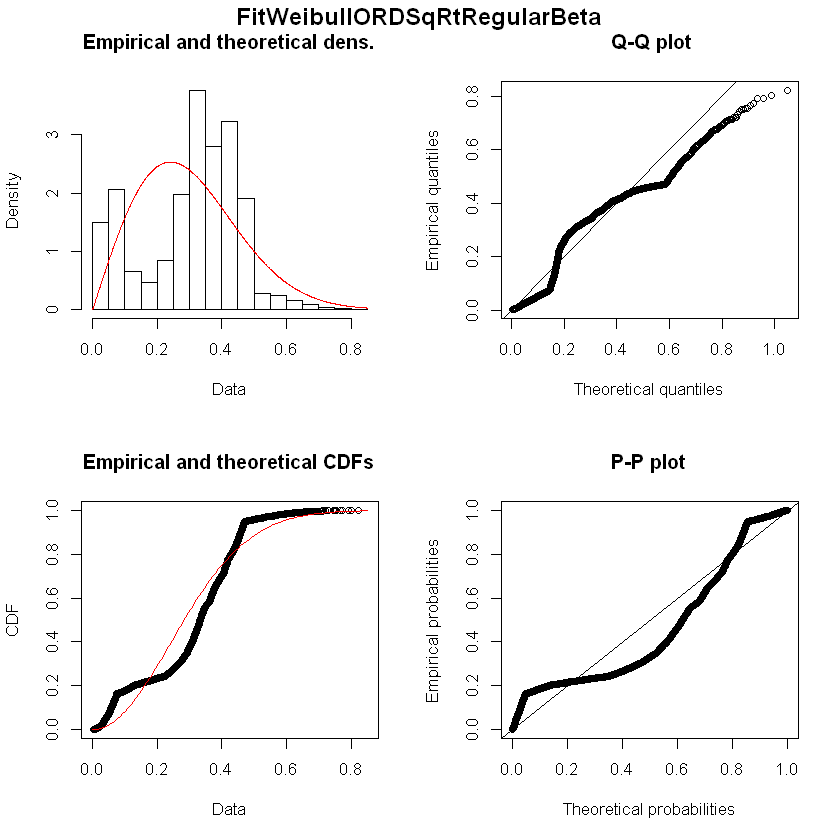

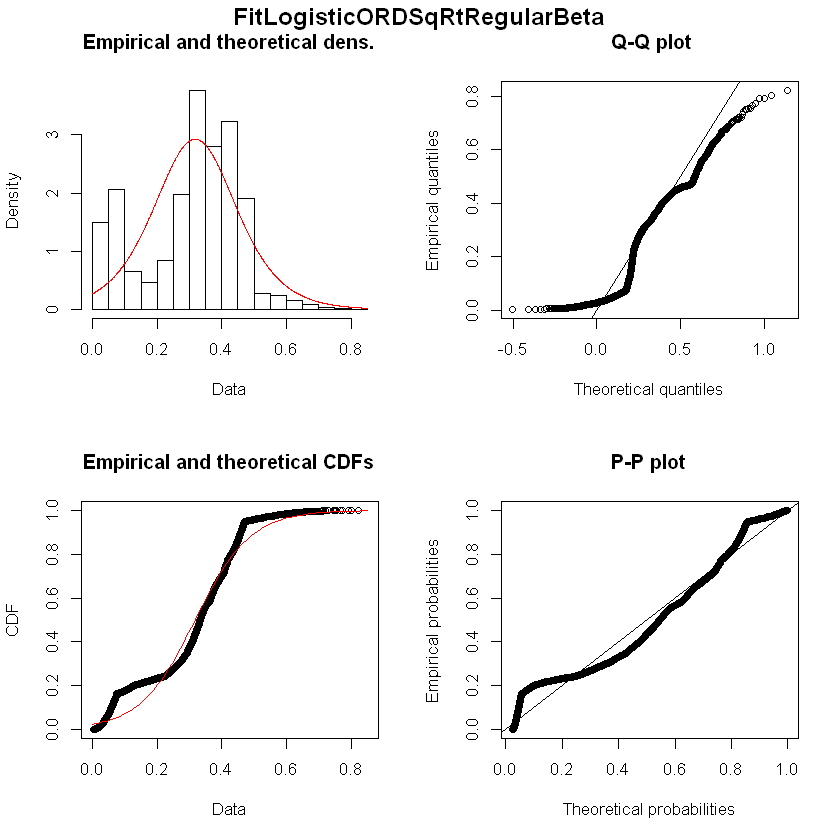

In [7]:
#!!!!!!!!! CHANGE TO R KERNEL !!!!!!!!!!!!!

#CELL NAME:  AIRPORT LEFT SKEW CURVE FIT 
#This requires cell R SETUP to be run first
#Based on AIRPORT CURVE FIT, looks like data are left-skewed
#See if beta distribution fits any better
#Have to transform data between 0 and 1

library(dplyr)
library(fitdistrplus)


AptWaitsR$WaitTimeBeta <- AptWaitsR$WaitTimeContinuous / 88
AptWaitsR$WaitTimeSqRtBeta <- (AptWaitsR$WaitTimeBeta)^(1/2)
AptWaitsJFK <- AptWaitsR %>% filter(JFK==1)
AptWaitsEWR <- AptWaitsR %>% filter(EWR==1)
AptWaitsORD <- AptWaitsR %>% filter(ORD==1)


#------------START JFK BETA--------------
FitBetaJFKBeta <- fitdist(AptWaitsJFK$WaitTimeBeta, "beta")
FitNormalJFKBeta <- fitdist(AptWaitsJFK$WaitTimeBeta, "norm")
FitLogNormalJFKBeta <- fitdist(AptWaitsJFK$WaitTimeBeta, "lnorm") 
FitGammaJFKBeta <- fitdist(AptWaitsJFK$WaitTimeBeta, "gamma")
FitExponentialJFKBeta <- fitdist(AptWaitsJFK$WaitTimeBeta, "exp") 
FitWeibullJFKBeta <- fitdist(AptWaitsJFK$WaitTimeBeta, "weibull")  
FitLogisticJFKBeta <- fitdist(AptWaitsJFK$WaitTimeBeta, "logis") 

summary(FitBetaJFKBeta)
summary(FitNormalJFKBeta)
summary(FitLogNormalJFKBeta)
summary(FitGammaJFKBeta)
summary(FitExponentialJFKBeta)
summary(FitWeibullJFKBeta)
summary(FitLogisticJFKBeta)

plot(FitBetaJFKBeta)
title(main="FitBetaJFKBeta", outer=TRUE, line=-1)
plot(FitNormalJFKBeta)
title(main="FitNormalJFKBeta", outer=TRUE, line=-1)
plot(FitLogNormalJFKBeta)
title(main="FitLogNormalJFKBeta", outer=TRUE, line=-1)
plot(FitGammaJFKBeta)
title(main="FitGammaJFKBeta", outer=TRUE, line=-1)
plot(FitExponentialJFKBeta)
title(main="FitExponentialJFKBeta", outer=TRUE, line=-1)
plot(FitWeibullJFKBeta)
title(main="FitWeibullJFKBeta", outer=TRUE, line=-1)
plot(FitLogisticJFKBeta)
title(main="FitLogisticJFKBeta", outer=TRUE, line=-1)
#------------END JFK BETA--------------

#------------START EWR BETA--------------
FitBetaEWRBeta <- fitdist(AptWaitsEWR$WaitTimeBeta, "beta")
FitNormalEWRBeta <- fitdist(AptWaitsEWR$WaitTimeBeta, "norm")
FitLogNormalEWRBeta <- fitdist(AptWaitsEWR$WaitTimeBeta, "lnorm") 
FitGammaEWRBeta <- fitdist(AptWaitsEWR$WaitTimeBeta, "gamma")
FitExponentialEWRBeta <- fitdist(AptWaitsEWR$WaitTimeBeta, "exp") 
FitWeibullEWRBeta <- fitdist(AptWaitsEWR$WaitTimeBeta, "weibull")  
FitLogisticEWRBeta <- fitdist(AptWaitsEWR$WaitTimeBeta, "logis") 

summary(FitBetaEWRBeta)
summary(FitNormalEWRBeta)
summary(FitLogNormalEWRBeta)
summary(FitGammaEWRBeta)
summary(FitExponentialEWRBeta)
summary(FitWeibullEWRBeta)
summary(FitLogisticEWRBeta)

plot(FitBetaEWRBeta)
title(main="FitBetaEWRBeta", outer=TRUE, line=-1)
plot(FitLogNormalEWRBeta)
title(main="FitNormalEWRBeta", outer=TRUE, line=-1)
plot(FitLogNormalEWRBeta)
title(main="FitLogNormalEWRBeta", outer=TRUE, line=-1)
plot(FitGammaEWRBeta)
title(main="FitGammaEWRBeta", outer=TRUE, line=-1)
plot(FitExponentialEWRBeta)
title(main="FitExponentialEWRBeta", outer=TRUE, line=-1)
plot(FitWeibullEWRBeta)
title(main="FitWeibullEWRBeta", outer=TRUE, line=-1)
plot(FitLogisticEWRBeta)
title(main="FitLogisticEWRBeta", outer=TRUE, line=-1)
#------------END EWR BETA--------------

#------------START ORD BETA--------------
FitBetaORDBeta <- fitdist(AptWaitsORD$WaitTimeBeta, "beta")
FitNormalORDBeta <- fitdist(AptWaitsORD$WaitTimeBeta, "norm")
FitLogNormalORDBeta <- fitdist(AptWaitsORD$WaitTimeBeta, "lnorm") 
FitGammaORDBeta <- fitdist(AptWaitsORD$WaitTimeBeta, "gamma")
FitExponentialORDBeta <- fitdist(AptWaitsORD$WaitTimeBeta, "exp") 
FitWeibullORDBeta <- fitdist(AptWaitsORD$WaitTimeBeta, "weibull")  
FitLogisticORDBeta <- fitdist(AptWaitsORD$WaitTimeBeta, "logis") 

summary(FitBetaORDBeta)
summary(FitNormalORDBeta)
summary(FitLogNormalORDBeta)
summary(FitGammaORDBeta)
summary(FitExponentialORDBeta)
summary(FitWeibullORDBeta)
summary(FitLogisticORDBeta)

plot(FitBetaORDBeta)
title(main="FitBetaORDBeta", outer=TRUE, line=-1)
plot(FitNormalORDBeta)
title(main="FitNormalORDBeta", outer=TRUE, line=-1)
plot(FitLogNormalORDBeta)
title(main="FitLogNormalORDBeta", outer=TRUE, line=-1)
plot(FitGammaORDBeta)
title(main="FitGammaORDBeta", outer=TRUE, line=-1)
plot(FitExponentialORDBeta)
title(main="FitExponentialORDBeta", outer=TRUE, line=-1)
plot(FitWeibullORDBeta)
title(main="FitWeibullORDBeta", outer=TRUE, line=-1)
plot(FitLogisticORDBeta)
title(main="FitLogisticORDBeta", outer=TRUE, line=-1)
#------------END ORD BETA--------------


#------------START JFK PRECHECK BETA--------------
AptWaitsJFKPre <- AptWaitsJFK %>% filter(PreCheck==1)

FitBetaJFKPreBeta <- fitdist(AptWaitsJFKPre$WaitTimeBeta, "beta")
FitNormalJFKPreBeta <- fitdist(AptWaitsJFKPre$WaitTimeBeta, "norm")
FitLogNormalJFKPreBeta <- fitdist(AptWaitsJFKPre$WaitTimeBeta, "lnorm") 
FitGammaJFKPreBeta <- fitdist(AptWaitsJFKPre$WaitTimeBeta, "gamma")
FitExponentialJFKPreBeta <- fitdist(AptWaitsJFKPre$WaitTimeBeta, "exp") 
FitWeibullJFKPreBeta <- fitdist(AptWaitsJFKPre$WaitTimeBeta, "weibull")  
FitLogisticJFKPreBeta <- fitdist(AptWaitsJFKPre$WaitTimeBeta, "logis") 

summary(FitBetaJFKPreBeta)
summary(FitNormalJFKPreBeta)
summary(FitLogNormalJFKPreBeta)
summary(FitGammaJFKPreBeta)
summary(FitExponentialJFKPreBeta)
summary(FitWeibullJFKPreBeta)
summary(FitLogisticJFKPreBeta)

plot(FitBetaJFKPreBeta)
title(main="FitBetaJFKPreCheckBeta", outer=TRUE, line=-1)
plot(FitNormalJFKPreBeta)
title(main="FitNormalJFKPreCheckBeta", outer=TRUE, line=-1)
plot(FitLogNormalJFKPreBeta)
title(main="FitLogNormalJFKPreCheckBeta", outer=TRUE, line=-1)
plot(FitGammaJFKPreBeta)
title(main="FitGammaJFKPreCheckBeta", outer=TRUE, line=-1)
plot(FitExponentialJFKPreBeta)
title(main="FitExponentialJFKPreCheckBeta", outer=TRUE, line=-1)
plot(FitWeibullJFKPreBeta)
title(main="FitWeibullJFKPreCheckBeta", outer=TRUE, line=-1)
plot(FitLogisticJFKPreBeta)
title(main="FitLogisticJFKPreCheckBeta", outer=TRUE, line=-1)
#------------END JFK PRECHECK BETA--------------


#------------START JFK REGULAR BETA--------------
AptWaitsJFKReg <- AptWaitsJFK %>% filter(PreCheck==0)

FitBetaJFKRegBeta <-  fitdist(AptWaitsJFKReg$WaitTimeBeta, "beta")
FitNormalJFKRegBeta <- fitdist(AptWaitsJFKReg$WaitTimeBeta, "norm")
FitLogNormalJFKRegBeta <- fitdist(AptWaitsJFKReg$WaitTimeBeta, "lnorm") 
FitGammaJFKRegBeta <- fitdist(AptWaitsJFKReg$WaitTimeBeta, "gamma")
FitExponentialJFKRegBeta <- fitdist(AptWaitsJFKReg$WaitTimeBeta, "exp") 
FitWeibullJFKRegBeta <- fitdist(AptWaitsJFKReg$WaitTimeBeta, "weibull")  
FitLogisticJFKRegBeta <- fitdist(AptWaitsJFKReg$WaitTimeBeta, "logis") 

summary(FitBetaJFKRegBeta)
summary(FitNormalJFKRegBeta)
summary(FitLogNormalJFKRegBeta)
summary(FitGammaJFKRegBeta)
summary(FitExponentialJFKRegBeta)
summary(FitWeibullJFKRegBeta)
summary(FitLogisticJFKRegBeta)

plot(FitBetaJFKRegBeta)
title(main="FitBetaJFKRegularBeta", outer=TRUE, line=-1)
plot(FitNormalJFKRegBeta)
title(main="FitNormalJFKRegularBeta", outer=TRUE, line=-1)
plot(FitLogNormalJFKRegBeta)
title(main="FitLogNormalJFKRegularBeta", outer=TRUE, line=-1)
plot(FitGammaJFKRegBeta)
title(main="FitGammaJFKRegularBeta", outer=TRUE, line=-1)
plot(FitExponentialJFKRegBeta)
title(main="FitExponentialJFKRegularBeta", outer=TRUE, line=-1)
plot(FitWeibullJFKRegBeta)
title(main="FitWeibullJFKRegularBeta", outer=TRUE, line=-1)
plot(FitLogisticJFKRegBeta)
title(main="FitLogisticJFKRegularBeta", outer=TRUE, line=-1)
#------------END JFK REGULAR BETA--------------


#------------START JFK SQRT PRECHECK BETA--------------
#AptWaitsJFKPre <- AptWaitsJFK %>% filter(PreCheck==1)

FitBetaJFKSqRtPreBeta <- fitdist(AptWaitsJFKPre$WaitTimeSqRtBeta, "beta")
FitNormalJFKSqRtPreBeta <- fitdist(AptWaitsJFKPre$WaitTimeSqRtBeta, "norm")
FitLogNormalJFKSqRtPreBeta <- fitdist(AptWaitsJFKPre$WaitTimeSqRtBeta, "lnorm") 
FitGammaJFKSqRtPreBeta <- fitdist(AptWaitsJFKPre$WaitTimeSqRtBeta, "gamma")
FitExponentialJFKSqRtPreBeta <- fitdist(AptWaitsJFKPre$WaitTimeSqRtBeta, "exp") 
FitWeibullJFKSqRtPreBeta <- fitdist(AptWaitsJFKPre$WaitTimeSqRtBeta, "weibull")  
FitLogisticJFKSqRtPreBeta <- fitdist(AptWaitsJFKPre$WaitTimeSqRtBeta, "logis") 

summary(FitBetaJFKSqRtPreBeta)
summary(FitNormalJFKSqRtPreBeta)
summary(FitLogNormalJFKSqRtPreBeta)
summary(FitGammaJFKSqRtPreBeta)
summary(FitExponentialJFKSqRtPreBeta)
summary(FitWeibullJFKSqRtPreBeta)
summary(FitLogisticJFKSqRtPreBeta)

plot(FitBetaJFKSqRtPreBeta)
title(main="FitBetaJFKSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitNormalJFKSqRtPreBeta)
title(main="FitNormalJFKSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitLogNormalJFKSqRtPreBeta)
title(main="FitLogNormalJFKSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitGammaJFKSqRtPreBeta)
title(main="FitGammaJFKSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitExponentialJFKSqRtPreBeta)
title(main="FitExponentialJFKSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitWeibullJFKSqRtPreBeta)
title(main="FitWeibullJFKSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitLogisticJFKSqRtPreBeta)
title(main="FitLogisticJFKSqRtPreCheckBeta", outer=TRUE, line=-1)
#------------END JFK SQRT PRECHECK BETA--------------


#------------START JFK SQRT REGULAR BETA--------------
FitBetaJFKSqRtRegBeta <- fitdist(AptWaitsJFKReg$WaitTimeSqRtBeta, "beta")
FitNormalJFKSqRtRegBeta <- fitdist(AptWaitsJFKReg$WaitTimeSqRtBeta, "norm")
FitLogNormalJFKSqRtRegBeta <- fitdist(AptWaitsJFKReg$WaitTimeSqRtBeta, "lnorm") 
FitGammaJFKSqRtRegBeta <- fitdist(AptWaitsJFKReg$WaitTimeSqRtBeta, "gamma")
FitExponentialJFKSqRtRegBeta <- fitdist(AptWaitsJFKReg$WaitTimeSqRtBeta, "exp") 
FitWeibullJFKSqRtRegBeta <- fitdist(AptWaitsJFKReg$WaitTimeSqRtBeta, "weibull")  
FitLogisticJFKSqRtRegBeta <- fitdist(AptWaitsJFKReg$WaitTimeSqRtBeta, "logis") 

summary(FitBetaJFKSqRtRegBeta)
summary(FitNormalJFKSqRtRegBeta)
summary(FitLogNormalJFKSqRtRegBeta)
summary(FitGammaJFKSqRtRegBeta)
summary(FitExponentialJFKSqRtRegBeta)
summary(FitWeibullJFKSqRtRegBeta)
summary(FitLogisticJFKSqRtRegBeta)

plot(FitNormalJFKSqRtRegBeta)
title(main="FitBetaJFKSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitNormalJFKSqRtRegBeta)
title(main="FitNormalJFKSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitLogNormalJFKSqRtRegBeta)
title(main="FitLogNormalJFKSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitGammaJFKSqRtRegBeta)
title(main="FitGammaJFKSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitExponentialJFKSqRtRegBeta)
title(main="FitExponentialJFKSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitWeibullJFKSqRtRegBeta)
title(main="FitWeibullJFKSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitLogisticJFKSqRtRegBeta)
title(main="FitLogisticJFKSqRtRegularBeta", outer=TRUE, line=-1)
#------------END JFK SQRT REGULAR BETA--------------


#------------START EWR PRECHECK BETA--------------
AptWaitsEWRPre <- AptWaitsEWR %>% filter(PreCheck==1)

FitBetaEWRPreBeta <- fitdist(AptWaitsEWRPre$WaitTimeBeta, "beta")
FitNormalEWRPreBeta <- fitdist(AptWaitsEWRPre$WaitTimeBeta, "norm")
FitLogNormalEWRPreBeta <- fitdist(AptWaitsEWRPre$WaitTimeBeta, "lnorm") 
FitGammaEWRPreBeta <- fitdist(AptWaitsEWRPre$WaitTimeBeta, "gamma")
FitExponentialEWRPreBeta <- fitdist(AptWaitsEWRPre$WaitTimeBeta, "exp") 
FitWeibullEWRPreBeta <- fitdist(AptWaitsEWRPre$WaitTimeBeta, "weibull")  
FitLogisticEWRPreBeta <- fitdist(AptWaitsEWRPre$WaitTimeBeta, "logis") 

summary(FitBetaEWRPreBeta)
summary(FitNormalEWRPreBeta)
summary(FitLogNormalEWRPreBeta)
summary(FitGammaEWRPreBeta)
summary(FitExponentialEWRPreBeta)
summary(FitWeibullEWRPreBeta)
summary(FitLogisticEWRPreBeta)

plot(FitBetaEWRPreBeta)
title(main="FitBetaEWRPreCheckBeta", outer=TRUE, line=-1)
plot(FitNormalEWRPreBeta)
title(main="FitNormalEWRPreCheckBeta", outer=TRUE, line=-1)
plot(FitLogNormalEWRPreBeta)
title(main="FitLogNormalEWRPreCheckBeta", outer=TRUE, line=-1)
plot(FitGammaEWRPreBeta)
title(main="FitGammaEWRPreCheckBeta", outer=TRUE, line=-1)
plot(FitExponentialEWRPreBeta)
title(main="FitExponentialEWRPreCheckBeta", outer=TRUE, line=-1)
plot(FitWeibullEWRPreBeta)
title(main="FitWeibullEWRPreCheckBeta", outer=TRUE, line=-1)
plot(FitLogisticEWRPreBeta)
title(main="FitLogisticEWRPreCheckBeta", outer=TRUE, line=-1)
#------------END EWR PRECHECK BETA--------------


#------------START EWR REGULAR BETA--------------
AptWaitsEWRReg <- AptWaitsEWR %>% filter(PreCheck==0)

FitBetaEWRRegBeta <- fitdist(AptWaitsEWRReg$WaitTimeBeta, "beta")
FitNormalEWRRegBeta <- fitdist(AptWaitsEWRReg$WaitTimeBeta, "norm")
FitLogNormalEWRRegBeta <- fitdist(AptWaitsEWRReg$WaitTimeBeta, "lnorm") 
FitGammaEWRRegBeta <- fitdist(AptWaitsEWRReg$WaitTimeBeta, "gamma")
FitExponentialEWRRegBeta <- fitdist(AptWaitsEWRReg$WaitTimeBeta, "exp") 
FitWeibullEWRRegBeta <- fitdist(AptWaitsEWRReg$WaitTimeBeta, "weibull")  
FitLogisticEWRRegBeta <- fitdist(AptWaitsEWRReg$WaitTimeBeta, "logis") 

summary(FitBetaEWRRegBeta)
summary(FitNormalEWRRegBeta)
summary(FitLogNormalEWRRegBeta)
summary(FitGammaEWRRegBeta)
summary(FitExponentialEWRRegBeta)
summary(FitWeibullEWRRegBeta)
summary(FitLogisticEWRRegBeta)

plot(FitBetaEWRRegBeta)
title(main="FitBetaEWRRegularBeta", outer=TRUE, line=-1)
plot(FitNormalEWRRegBeta)
title(main="FitNormalEWRRegularBeta", outer=TRUE, line=-1)
plot(FitLogNormalEWRRegBeta)
title(main="FitLogNormalEWRRegularBeta", outer=TRUE, line=-1)
plot(FitGammaEWRRegBeta)
title(main="FitGammaEWRRegularBeta", outer=TRUE, line=-1)
plot(FitExponentialEWRRegBeta)
title(main="FitExponentialEWRRegularBeta", outer=TRUE, line=-1)
plot(FitWeibullEWRRegBeta)
title(main="FitWeibullEWRRegularBeta", outer=TRUE, line=-1)
plot(FitLogisticEWRRegBeta)
title(main="FitLogisticEWRRegularBeta", outer=TRUE, line=-1)
#------------END EWR REGULAR BETA--------------


#------------START EWR SQRT PRECHECK BETA--------------
FitBetaEWRSqRtPreBeta <- fitdist(AptWaitsEWRPre$WaitTimeSqRtBeta, "beta")
FitNormalEWRSqRtPreBeta <- fitdist(AptWaitsEWRPre$WaitTimeSqRtBeta, "norm")
FitLogNormalEWRSqRtPreBeta <- fitdist(AptWaitsEWRPre$WaitTimeSqRtBeta, "lnorm") 
FitGammaEWRSqRtPreBeta <- fitdist(AptWaitsEWRPre$WaitTimeSqRtBeta, "gamma")
FitExponentialEWRSqRtPreBeta <- fitdist(AptWaitsEWRPre$WaitTimeSqRtBeta, "exp") 
FitWeibullEWRSqRtPreBeta <- fitdist(AptWaitsEWRPre$WaitTimeSqRtBeta, "weibull")  
FitLogisticEWRSqRtPreBeta <- fitdist(AptWaitsEWRPre$WaitTimeSqRtBeta, "logis") 

summary(FitBetaEWRSqRtPreBeta)
summary(FitNormalEWRSqRtPreBeta)
summary(FitLogNormalEWRSqRtPreBeta)
summary(FitGammaEWRSqRtPreBeta)
summary(FitExponentialEWRSqRtPreBeta)
summary(FitWeibullEWRSqRtPreBeta)
summary(FitLogisticEWRSqRtPreBeta)

plot(FitBetaEWRSqRtPreBeta)
title(main="FitBetaEWRSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitNormalEWRSqRtPreBeta)
title(main="FitNormalEWRSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitLogNormalEWRSqRtPreBeta)
title(main="FitLogNormalEWRSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitGammaEWRSqRtPreBeta)
title(main="FitGammaEWRSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitExponentialEWRSqRtPreBeta)
title(main="FitExponentialEWRSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitWeibullEWRSqRtPreBeta)
title(main="FitWeibullEWRSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitLogisticEWRSqRtPreBeta)
title(main="FitLogisticEWRSqRtPreCheckBeta", outer=TRUE, line=-1)
#------------END EWR SQRT PRECHECK BETA--------------


#------------START EWR SQRT REGULAR BETA--------------
FitBetaEWRSqRtRegBeta <- fitdist(AptWaitsEWRReg$WaitTimeSqRtBeta, "beta")
FitNormalEWRSqRtRegBeta <- fitdist(AptWaitsEWRReg$WaitTimeSqRtBeta, "norm")
FitLogNormalEWRSqRtRegBeta <- fitdist(AptWaitsEWRReg$WaitTimeSqRtBeta, "lnorm") 
FitGammaEWRSqRtRegBeta <- fitdist(AptWaitsEWRReg$WaitTimeSqRtBeta, "gamma")
FitExponentialEWRSqRtRegBeta <- fitdist(AptWaitsEWRReg$WaitTimeSqRtBeta, "exp") 
FitWeibullEWRSqRtRegBeta <- fitdist(AptWaitsEWRReg$WaitTimeSqRtBeta, "weibull")  
FitLogisticEWRSqRtRegBeta <- fitdist(AptWaitsEWRReg$WaitTimeSqRtBeta, "logis") 

summary(FitBetaEWRSqRtRegBeta)
summary(FitNormalEWRSqRtRegBeta)
summary(FitLogNormalEWRSqRtRegBeta)
summary(FitGammaEWRSqRtRegBeta)
summary(FitExponentialEWRSqRtRegBeta)
summary(FitWeibullEWRSqRtRegBeta)
summary(FitLogisticEWRSqRtRegBeta)

plot(FitBetaEWRSqRtRegBeta)
title(main="FitBetaEWRSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitNormalEWRSqRtRegBeta)
title(main="FitNormalEWRSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitLogNormalEWRSqRtRegBeta)
title(main="FitLogNormalEWRSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitGammaEWRSqRtRegBeta)
title(main="FitGammaEWRSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitExponentialEWRSqRtRegBeta)
title(main="FitExponentialEWRSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitWeibullEWRSqRtRegBeta)
title(main="FitWeibullEWRSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitLogisticEWRSqRtRegBeta)
title(main="FitLogisticEWRSqRtRegularBeta", outer=TRUE, line=-1)
#------------END EWR SQRT REGULAR BETA--------------


#------------START ORD PRECHECK BETA--------------
AptWaitsORDPre <- AptWaitsORD %>% filter(PreCheck==1)

FitBetaORDPreBeta <- fitdist(AptWaitsORDPre$WaitTimeBeta, "beta")
FitNormalORDPreBeta <- fitdist(AptWaitsORDPre$WaitTimeBeta, "norm")
FitLogNormalORDPreBeta <- fitdist(AptWaitsORDPre$WaitTimeBeta, "lnorm") 
FitGammaORDPreBeta <- fitdist(AptWaitsORDPre$WaitTimeBeta, "gamma")
FitExponentialORDPreBeta <- fitdist(AptWaitsORDPre$WaitTimeBeta, "exp") 
FitWeibullORDPreBeta <- fitdist(AptWaitsORDPre$WaitTimeBeta, "weibull")  
FitLogisticORDPreBeta <- fitdist(AptWaitsORDPre$WaitTimeBeta, "logis") 

summary(FitBetaORDPreBeta)
summary(FitNormalORDPreBeta)
summary(FitLogNormalORDPreBeta)
summary(FitGammaORDPreBeta)
summary(FitExponentialORDPreBeta)
summary(FitWeibullORDPreBeta)
summary(FitLogisticORDPreBeta)

plot(FitBetaORDPreBeta)
title(main="FitBetaORDPreCheckBeta", outer=TRUE, line=-1)
plot(FitNormalORDPreBeta)
title(main="FitNormalORDPreCheckBeta", outer=TRUE, line=-1)
plot(FitLogNormalORDPreBeta)
title(main="FitLogNormalORDPreCheckBeta", outer=TRUE, line=-1)
plot(FitGammaORDPreBeta)
title(main="FitGammaORDPreCheckBeta", outer=TRUE, line=-1)
plot(FitExponentialORDPreBeta)
title(main="FitExponentialORDPreCheckBeta", outer=TRUE, line=-1)
plot(FitWeibullORDPreBeta)
title(main="FitWeibullORDPreCheckBeta", outer=TRUE, line=-1)
plot(FitLogisticORDPreBeta)
title(main="FitLogisticORDPreCheckBeta", outer=TRUE, line=-1)
#------------END ORD PRECHECK BETA--------------


#------------START ORD REGULAR BETA--------------
AptWaitsORDReg <- AptWaitsORD %>% filter(PreCheck==0)


FitBetaORDRegBeta <- fitdist(AptWaitsORDReg$WaitTimeBeta, "beta")
FitNormalORDRegBeta <- fitdist(AptWaitsORDReg$WaitTimeBeta, "norm")
FitLogNormalORDRegBeta <- fitdist(AptWaitsORDReg$WaitTimeBeta, "lnorm") 
FitGammaORDRegBeta <- fitdist(AptWaitsORDReg$WaitTimeBeta, "gamma")
FitExponentialORDRegBeta <- fitdist(AptWaitsORDReg$WaitTimeBeta, "exp") 
FitWeibullORDRegBeta <- fitdist(AptWaitsORDReg$WaitTimeBeta, "weibull")  
FitLogisticORDRegBeta <- fitdist(AptWaitsORDReg$WaitTimeBeta, "logis") 


summary(FitBetaORDRegBeta)
summary(FitNormalORDRegBeta)
summary(FitLogNormalORDRegBeta)
summary(FitGammaORDRegBeta)
summary(FitExponentialORDRegBeta)
summary(FitWeibullORDRegBeta)
summary(FitLogisticORDRegBeta)


plot(FitBetaORDRegBeta)
title(main="FitBetaORDRegularBeta", outer=TRUE, line=-1)
plot(FitNormalORDRegBeta)
title(main="FitNormalORDRegularBeta", outer=TRUE, line=-1)
plot(FitLogNormalORDRegBeta)
title(main="FitLogNormalORDRegularBeta", outer=TRUE, line=-1)
plot(FitGammaORDRegBeta)
title(main="FitGammaORDRegularBeta", outer=TRUE, line=-1)
plot(FitExponentialORDRegBeta)
title(main="FitExponentialORDRegularBeta", outer=TRUE, line=-1)
plot(FitWeibullORDRegBeta)
title(main="FitWeibullORDRegularBeta", outer=TRUE, line=-1)
plot(FitLogisticORDRegBeta)
title(main="FitLogisticORDRegularBeta", outer=TRUE, line=-1)
#------------END ORD REGULAR BETA--------------



#------------START ORD SQRT PRECHECK BETA--------------
FitBetaORDSqRtPreBeta <- fitdist(AptWaitsORDPre$WaitTimeSqRtBeta, "beta")
FitNormalORDSqRtPreBeta <- fitdist(AptWaitsORDPre$WaitTimeSqRtBeta, "norm")
FitLogNormalORDSqRtPreBeta <- fitdist(AptWaitsORDPre$WaitTimeSqRtBeta, "lnorm") 
FitGammaORDSqRtPreBeta <- fitdist(AptWaitsORDPre$WaitTimeSqRtBeta, "gamma")
FitExponentialORDSqRtPreBeta <- fitdist(AptWaitsORDPre$WaitTimeSqRtBeta, "exp") 
FitWeibullORDSqRtPreBeta <- fitdist(AptWaitsORDPre$WaitTimeSqRtBeta, "weibull")  
FitLogisticORDSqRtPreBeta <- fitdist(AptWaitsORDPre$WaitTimeSqRtBeta, "logis") 

summary(FitBetaORDSqRtPreBeta)
summary(FitNormalORDSqRtPreBeta)
summary(FitLogNormalORDSqRtPreBeta)
summary(FitGammaORDSqRtPreBeta)
summary(FitExponentialORDSqRtPreBeta)
summary(FitWeibullORDSqRtPreBeta)
summary(FitLogisticORDSqRtPreBeta)

plot(FitBetaORDSqRtPreBeta)
title(main="FitBetaORDSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitNormalORDSqRtPreBeta)
title(main="FitNormalORDSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitLogNormalORDSqRtPreBeta)
title(main="FitLogNormalORDSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitGammaORDSqRtPreBeta)
title(main="FitGammaORDSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitExponentialORDSqRtPreBeta)
title(main="FitExponentialORDSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitWeibullORDSqRtPreBeta)
title(main="FitWeibullORDSqRtPreCheckBeta", outer=TRUE, line=-1)
plot(FitLogisticORDSqRtPreBeta)
title(main="FitLogisticORDSqRtPreCheckBeta", outer=TRUE, line=-1)
#------------END ORD SQRT PRECHECK BETA--------------


#------------START ORD SQRT REGULAR BETA--------------
FitBetaORDSqRtRegBeta <- fitdist(AptWaitsORDReg$WaitTimeSqRtBeta, "beta")
FitNormalORDSqRtRegBeta <- fitdist(AptWaitsORDReg$WaitTimeSqRtBeta, "norm")
FitLogNormalORDSqRtRegBeta <- fitdist(AptWaitsORDReg$WaitTimeSqRtBeta, "lnorm") 
FitGammaORDSqRtRegBeta <- fitdist(AptWaitsORDReg$WaitTimeSqRtBeta, "gamma")
FitExponentialORDSqRtRegBeta <- fitdist(AptWaitsORDReg$WaitTimeSqRtBeta, "exp") 
FitWeibullORDSqRtRegBeta <- fitdist(AptWaitsORDReg$WaitTimeSqRtBeta, "weibull")  
FitLogisticORDSqRtRegBeta <- fitdist(AptWaitsORDReg$WaitTimeSqRtBeta, "logis") 

summary(FitBetaORDSqRtRegBeta)
summary(FitNormalORDSqRtRegBeta)
summary(FitLogNormalORDSqRtRegBeta)
summary(FitGammaORDSqRtRegBeta)
summary(FitExponentialORDSqRtRegBeta)
summary(FitWeibullORDSqRtRegBeta)
summary(FitLogisticORDSqRtRegBeta)

plot(FitBetaORDSqRtRegBeta)
title(main="FitBetaORDSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitNormalORDSqRtRegBeta)
title(main="FitNormalORDSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitLogNormalORDSqRtRegBeta)
title(main="FitLogNormalORDSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitGammaORDSqRtRegBeta)
title(main="FitGammaORDSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitExponentialORDSqRtRegBeta)
title(main="FitExponentialORDSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitWeibullORDSqRtRegBeta)
title(main="FitWeibullORDSqRtRegularBeta", outer=TRUE, line=-1)
plot(FitLogisticORDSqRtRegBeta)
title(main="FitLogisticORDSqRtRegularBeta", outer=TRUE, line=-1)
#------------END ORD SQRT REGULAR BETA--------------












Fitting of the distribution ' nbinom ' by maximum likelihood 
Parameters : 
     estimate  Std. Error
size 1.039883 0.001516221
mu   2.872390 0.002301023
Loglikelihood:  -4513221   AIC:  9026446   BIC:  9026471 
Correlation matrix:
             size           mu
size 1.0000000000 0.0002211414
mu   0.0002211414 1.0000000000


Fitting of the distribution ' pois ' by maximum likelihood 
Parameters : 
       estimate Std. Error
lambda 2.872865 0.00118658
Loglikelihood:  -5834197   AIC:  11668397   BIC:  11668409 

Fitting of the distribution ' nbinom ' by maximum likelihood 
Parameters : 
     estimate Std. Error
size 1.819016 0.02799668
mu   7.166839 0.05158797
Loglikelihood:  -39602.96   AIC:  79209.92   BIC:  79224.91 
Correlation matrix:
             size           mu
size 1.0000000000 0.0007937986
mu   0.0007937986 1.0000000000


Fitting of the distribution ' pois ' by maximum likelihood 
Parameters : 
       estimate Std. Error
lambda 7.170178 0.02322575
Loglikelihood:  -53505.63   AIC:  107013.3   BIC:  107020.8 

Fitting of the distribution ' nbinom ' by maximum likelihood 
Parameters : 
     estimate Std. Error
size 1.035859 0.01550411
mu   6.787781 0.06429002
Loglikelihood:  -37023.17   AIC:  74050.34   BIC:  74065.2 
Correlation matrix:
             size           mu
size 1.000000e+00 9.665157e-05
mu   9.665157e-05 1.000000e+00


Fitting of the distribution ' pois ' by maximum likelihood 
Parameters : 
       estimate Std. Error
lambda  6.78826 0.02339556
Loglikelihood:  -58166.31   AIC:  116334.6   BIC:  116342 

Fitting of the distribution ' nbinom ' by maximum likelihood 
Parameters : 
      estimate Std. Error
size 0.9878219 0.01461675
mu   6.8608566 0.06582540
Loglikelihood:  -37687.26   AIC:  75378.53   BIC:  75393.41 
Correlation matrix:
              size            mu
size  1.000000e+00 -6.711115e-05
mu   -6.711115e-05  1.000000e+00


Fitting of the distribution ' pois ' by maximum likelihood 
Parameters : 
       estimate Std. Error
lambda 6.860515 0.02335089
Loglikelihood:  -61742.75   AIC:  123487.5   BIC:  123494.9 

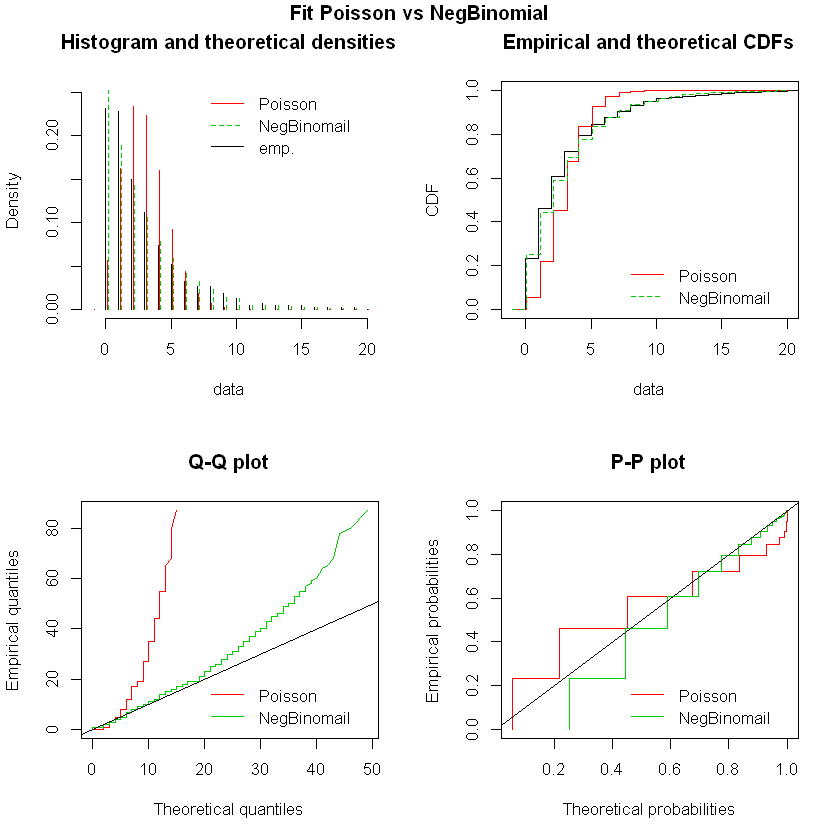

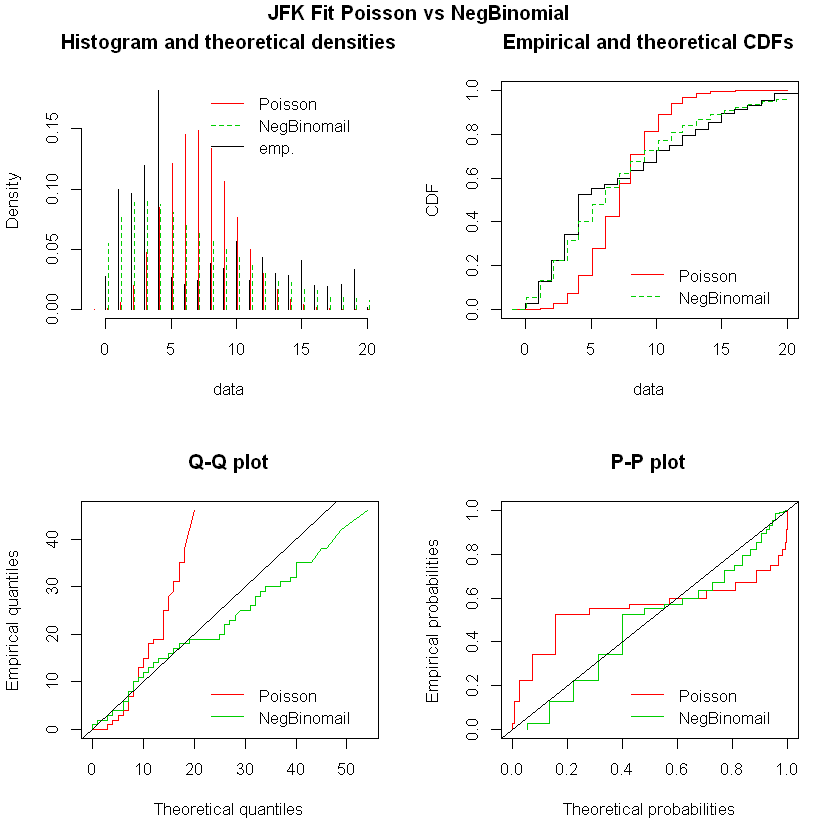

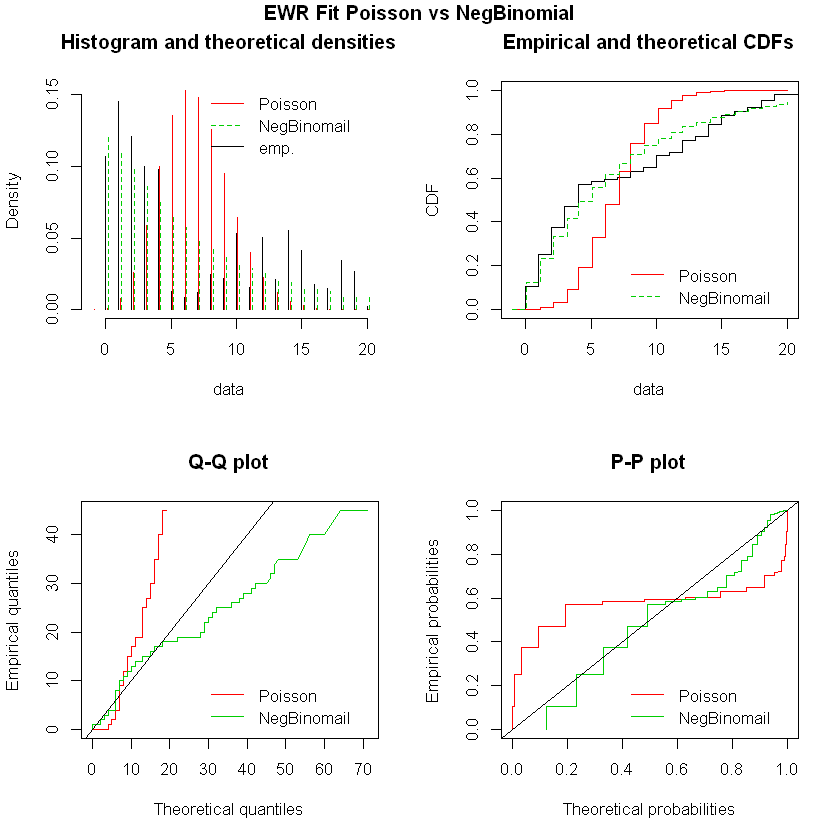

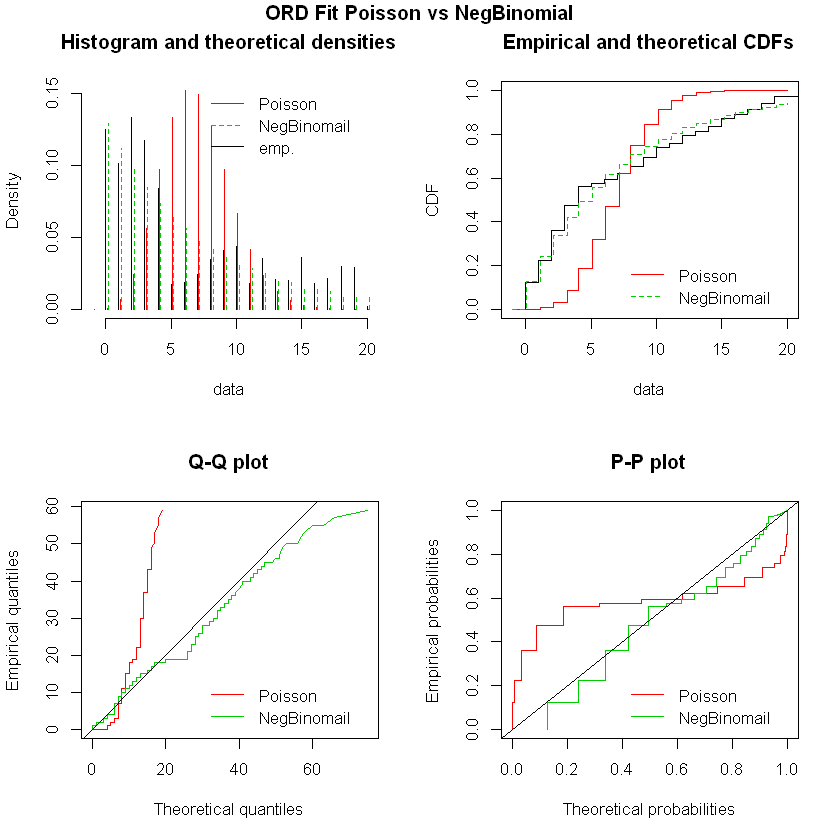

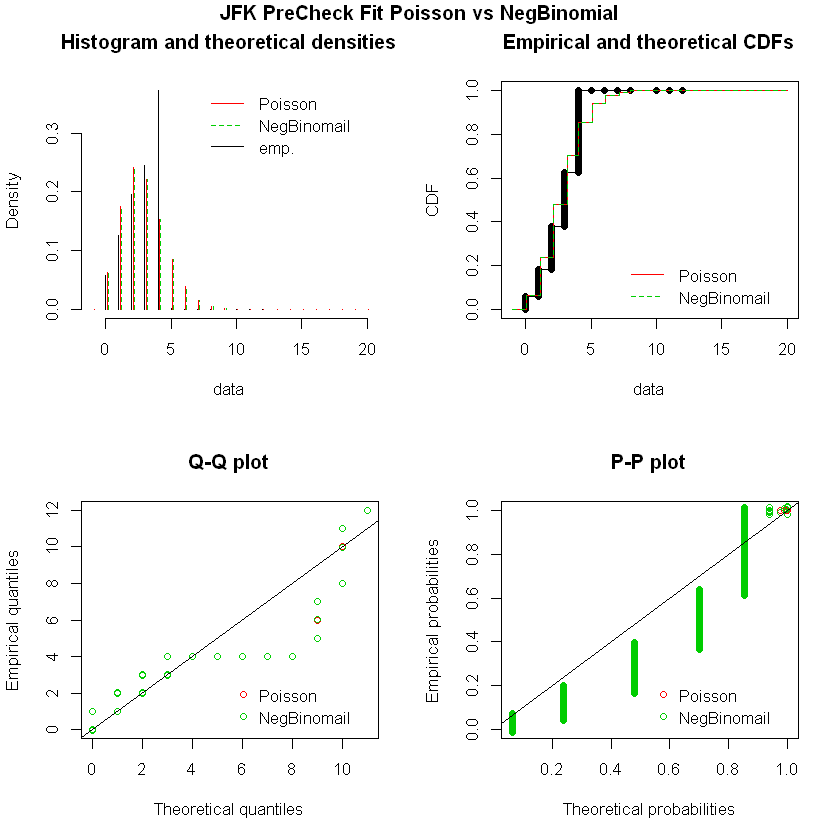

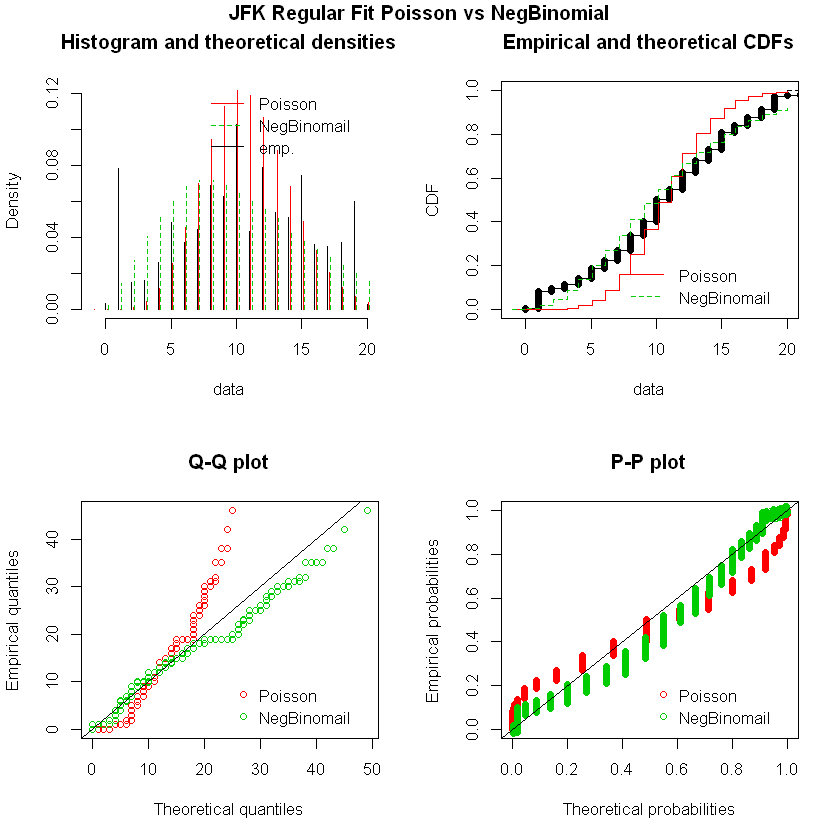

In [59]:
#!!!!!!!!! CHANGE TO R KERNEL !!!!!!!!!!!!!

#CELL NAME:  POISSON AND BINOMIAL
#This requires cell R SETUP to be run first
#DETERMINE IF WE REALLY WANT TO USE POISSON FOR QUEUEING MODEL
#IS WEIBULL AVAILABLE FOR QUEUEING?  IF NOT, GAMMA A PRETTY GOOD FIT

library(fitdistrplus)  #note:  requires MASS, survival, npsurv, and lsei to be loaded, too--autoloads all packages 

#Review discrete distribution fits
#plot(FitNegBinomial)
#title(main="FitNegBinomial", outer=TRUE, line=-1)
#plot(FitPoisson)
#title(main="FitPoisson", outer=TRUE, line=-1)

#Fit discrete distributions for all, plus airports for method = MLE
FitNegBinomial <- fitdist(AptWaitsR$WaitTime, "nbinom")
FitPoisson <- fitdist(AptWaitsR$WaitTime, "pois", method="mle") 
FitNegBinomialJFK <- fitdist(AptWaitsJFK$WaitTime, "nbinom")
FitPoissonJFK <- fitdist(AptWaitsJFK$WaitTime, "pois") 
FitNegBinomialEWR <- fitdist(AptWaitsEWR$WaitTime, "nbinom")
FitPoissonEWR <- fitdist(AptWaitsEWR$WaitTime, "pois") 
FitNegBinomialORD <- fitdist(AptWaitsORD$WaitTime, "nbinom")
FitPoissonORD <- fitdist(AptWaitsORD$WaitTime, "pois") 


#Summarize above fits
summary(FitNegBinomial)
summary(FitPoisson)
summary(FitNegBinomialJFK)
summary(FitPoissonJFK)
summary(FitNegBinomialEWR)
summary(FitPoissonEWR)
summary(FitNegBinomialORD)
summary(FitPoissonORD)

#Graph fits
par(mfrow=c(2,2))
plot.legend <- c("Poisson", "NegBinomail")
denscomp(list(FitPoisson, FitNegBinomial), legendtext = plot.legend, xlim=c(-1,20))
cdfcomp (list(FitPoisson, FitNegBinomial), legendtext = plot.legend, xlim=c(-1,20))
qqcomp  (list(FitPoisson, FitNegBinomial), legendtext = plot.legend)
ppcomp  (list(FitPoisson, FitNegBinomial), legendtext = plot.legend)
title(main="Fit Poisson vs NegBinomial", outer=TRUE, line=-1)

par(mfrow=c(2,2))
plot.legend <- c("Poisson", "NegBinomail")
denscomp(list(FitPoissonJFK, FitNegBinomialJFK), legendtext = plot.legend, xlim=c(-1,20))
cdfcomp (list(FitPoissonJFK, FitNegBinomialJFK), legendtext = plot.legend, xlim=c(-1,20))
qqcomp  (list(FitPoissonJFK, FitNegBinomialJFK), legendtext = plot.legend)
ppcomp  (list(FitPoissonJFK, FitNegBinomialJFK), legendtext = plot.legend)
title(main="JFK Fit Poisson vs NegBinomial", outer=TRUE, line=-1)

par(mfrow=c(2,2))
plot.legend <- c("Poisson", "NegBinomail")
denscomp(list(FitPoissonEWR, FitNegBinomialEWR), legendtext = plot.legend, xlim=c(-1,20))
cdfcomp (list(FitPoissonEWR, FitNegBinomialEWR), legendtext = plot.legend, xlim=c(-1,20))
qqcomp  (list(FitPoissonEWR, FitNegBinomialEWR), legendtext = plot.legend)
ppcomp  (list(FitPoissonEWR, FitNegBinomialEWR), legendtext = plot.legend)
title(main="EWR Fit Poisson vs NegBinomial", outer=TRUE, line=-1)

par(mfrow=c(2,2))
plot.legend <- c("Poisson", "NegBinomail")
denscomp(list(FitPoissonORD, FitNegBinomialORD), legendtext = plot.legend, xlim=c(-1,20))
cdfcomp (list(FitPoissonORD, FitNegBinomialORD), legendtext = plot.legend, xlim=c(-1,20))
qqcomp  (list(FitPoissonORD, FitNegBinomialORD), legendtext = plot.legend)
ppcomp  (list(FitPoissonORD, FitNegBinomialORD), legendtext = plot.legend)
title(main="ORD Fit Poisson vs NegBinomial", outer=TRUE, line=-1)


par(mfrow=c(2,2))
plot.legend <- c("Poisson", "NegBinomail")
denscomp(list(FitPoissonJFKPre, FitNegBinomialJFKPre), legendtext = plot.legend, xlim=c(-1,20))
cdfcomp (list(FitPoissonJFKPre, FitNegBinomialJFKPre), legendtext = plot.legend, xlim=c(-1,20))
qqcomp  (list(FitPoissonJFKPre, FitNegBinomialJFKPre), legendtext = plot.legend)
ppcomp  (list(FitPoissonJFKPre, FitNegBinomialJFKPre), legendtext = plot.legend)
title(main="JFK PreCheck Fit Poisson vs NegBinomial", outer=TRUE, line=-1)


par(mfrow=c(2,2))
plot.legend <- c("Poisson", "NegBinomail")
denscomp(list(FitPoissonJFKReg, FitNegBinomialJFKReg), legendtext = plot.legend, xlim=c(-1,20))
cdfcomp (list(FitPoissonJFKReg, FitNegBinomialJFKReg), legendtext = plot.legend, xlim=c(-1,20))
qqcomp  (list(FitPoissonJFKReg, FitNegBinomialJFKReg), legendtext = plot.legend)
ppcomp  (list(FitPoissonJFKReg, FitNegBinomialJFKReg), legendtext = plot.legend)
title(main="JFK Regular Fit Poisson vs NegBinomial", outer=TRUE, line=-1)







Loading required package: Matrix
Loading required package: foreach
Loaded glmnet 2.0-16

Loading required package: lattice
Warning message:
"package 'mlbench' was built under R version 3.6.1"Warning message:
"package 'psych' was built under R version 3.6.1"
Attaching package: 'psych'

The following objects are masked from 'package:ggplot2':

    %+%, alpha


Attaching package: 'MASS'

The following object is masked from 'package:dplyr':

    select



'data.frame':	5972 obs. of  19 variables:
 $ WaitTimeContinuousSqRt: num  1.6 1.71 1.83 2.12 1.7 ...
 $ HourInt               : int  3 4 5 6 7 8 9 10 11 12 ...
 $ HourIntSquared        : int  9 16 25 36 49 64 81 100 121 144 ...
 $ HourIntCubed          : int  27 64 125 216 343 512 729 1000 1331 1728 ...
 $ AMRush                : int  0 0 1 1 1 0 0 0 0 0 ...
 $ PMRush                : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jan                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Feb                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Mar                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Apr                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ May                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jun                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jul                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Aug                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Sep                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Mon                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Fri                 

[1] 1 1 1 1 2 1


AptWaitsJFKPreTrain


,WaitTimeContinuousSqRt,HourInt,HourIntSquared,HourIntCubed,AMRush,PMRush,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Mon,Fri,Sat,Sun
5966,1.9872577,14,196,2744,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
5967,2.0915717,15,225,3375,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
5968,1.9500141,16,256,4096,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
5969,2.0973786,17,289,4913,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
5970,1.9771638,18,324,5832,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
5972,0.9859031,20,400,8000,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


+ Fold01.Rep1: intercept=TRUE 
- Fold01.Rep1: intercept=TRUE 
+ Fold02.Rep1: intercept=TRUE 
- Fold02.Rep1: intercept=TRUE 
+ Fold03.Rep1: intercept=TRUE 
- Fold03.Rep1: intercept=TRUE 
+ Fold04.Rep1: intercept=TRUE 
- Fold04.Rep1: intercept=TRUE 
+ Fold05.Rep1: intercept=TRUE 
- Fold05.Rep1: intercept=TRUE 
+ Fold06.Rep1: intercept=TRUE 
- Fold06.Rep1: intercept=TRUE 
+ Fold07.Rep1: intercept=TRUE 
- Fold07.Rep1: intercept=TRUE 
+ Fold08.Rep1: intercept=TRUE 
- Fold08.Rep1: intercept=TRUE 
+ Fold09.Rep1: intercept=TRUE 
- Fold09.Rep1: intercept=TRUE 
+ Fold10.Rep1: intercept=TRUE 
- Fold10.Rep1: intercept=TRUE 
+ Fold01.Rep2: intercept=TRUE 
- Fold01.Rep2: intercept=TRUE 
+ Fold02.Rep2: intercept=TRUE 
- Fold02.Rep2: intercept=TRUE 
+ Fold03.Rep2: intercept=TRUE 
- Fold03.Rep2: intercept=TRUE 
+ Fold04.Rep2: intercept=TRUE 
- Fold04.Rep2: intercept=TRUE 
+ Fold05.Rep2: intercept=TRUE 
- Fold05.Rep2: intercept=TRUE 
+ Fold06.Rep2: intercept=TRUE 
- Fold06.Rep2: intercept=TRUE 
+ Fold07


Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.24413 -0.19421  0.04624  0.24378  1.63371 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     5.297e-01  3.624e-02  14.617  < 2e-16 ***
HourInt         2.219e-01  1.241e-02  17.888  < 2e-16 ***
HourIntSquared -1.152e-02  1.270e-03  -9.067  < 2e-16 ***
HourIntCubed    1.233e-04  3.675e-05   3.357 0.000795 ***
AMRush          4.165e-01  1.851e-02  22.509  < 2e-16 ***
PMRush          7.255e-02  1.829e-02   3.967 7.40e-05 ***
Jan            -7.926e-02  2.144e-02  -3.697 0.000221 ***
Feb            -5.896e-02  2.225e-02  -2.649 0.008092 ** 
Mar            -3.519e-03  2.161e-02  -0.163 0.870662    
Apr             5.383e-02  2.171e-02   2.479 0.013199 *  
May             1.123e-01  2.136e-02   5.256 1.54e-07 ***
Jun             1.853e-01  2.140e-02   8.661  < 2e-16 ***
Jul            -5.584e-02  2.091e-02  -2.671 0.007592 ** 
Aug             2.106e-

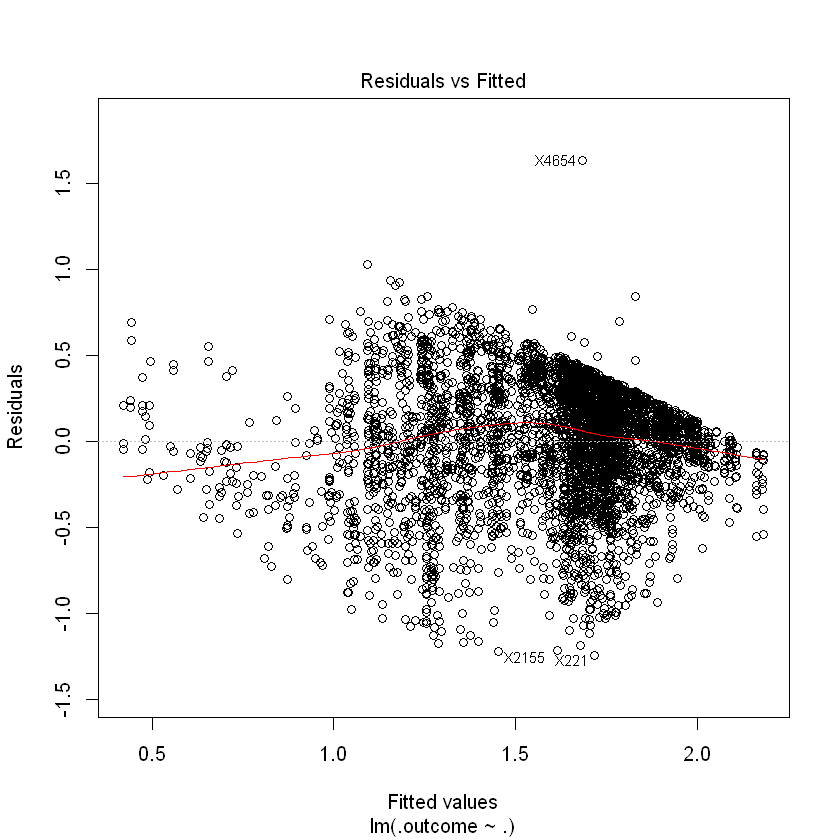

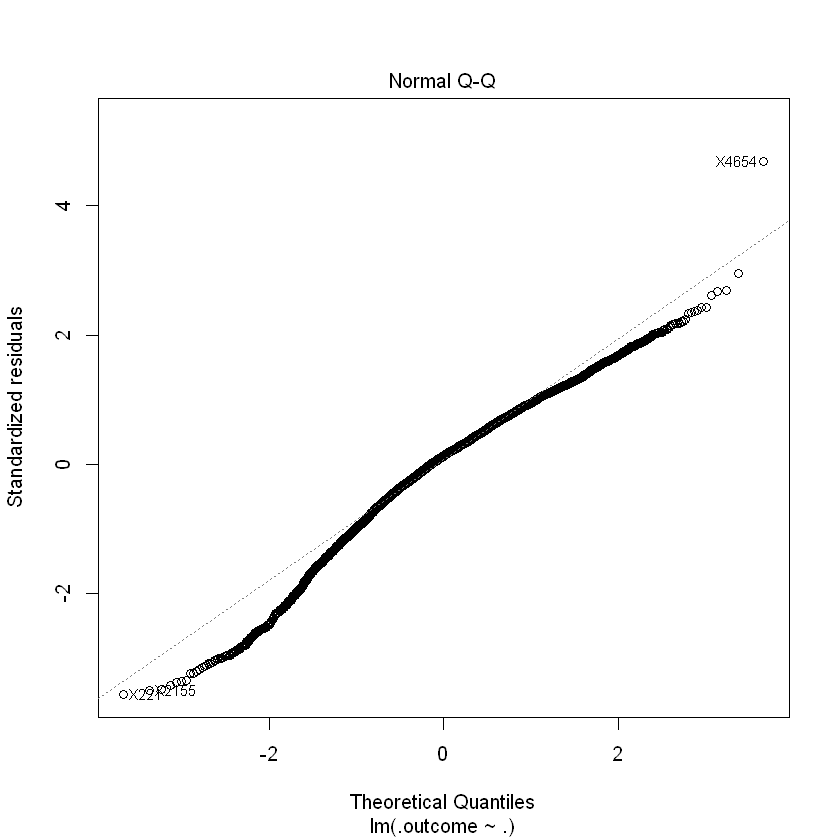

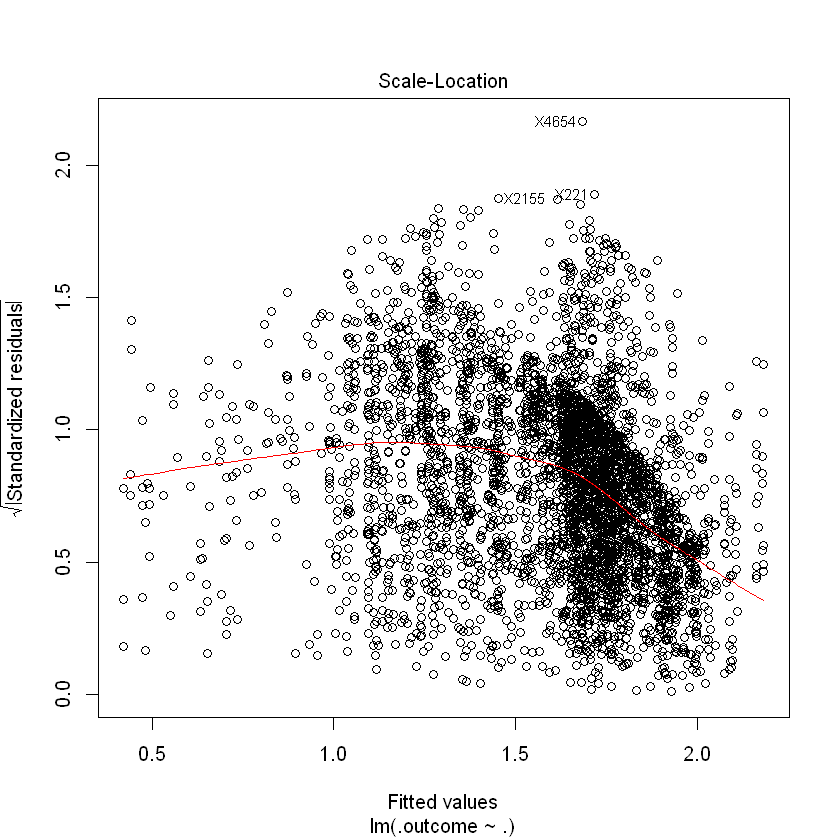

+ Fold01.Rep1: alpha=0, lambda=1 
- Fold01.Rep1: alpha=0, lambda=1 
+ Fold02.Rep1: alpha=0, lambda=1 
- Fold02.Rep1: alpha=0, lambda=1 
+ Fold03.Rep1: alpha=0, lambda=1 
- Fold03.Rep1: alpha=0, lambda=1 
+ Fold04.Rep1: alpha=0, lambda=1 
- Fold04.Rep1: alpha=0, lambda=1 
+ Fold05.Rep1: alpha=0, lambda=1 
- Fold05.Rep1: alpha=0, lambda=1 
+ Fold06.Rep1: alpha=0, lambda=1 
- Fold06.Rep1: alpha=0, lambda=1 
+ Fold07.Rep1: alpha=0, lambda=1 
- Fold07.Rep1: alpha=0, lambda=1 
+ Fold08.Rep1: alpha=0, lambda=1 
- Fold08.Rep1: alpha=0, lambda=1 
+ Fold09.Rep1: alpha=0, lambda=1 
- Fold09.Rep1: alpha=0, lambda=1 
+ Fold10.Rep1: alpha=0, lambda=1 
- Fold10.Rep1: alpha=0, lambda=1 
+ Fold01.Rep2: alpha=0, lambda=1 
- Fold01.Rep2: alpha=0, lambda=1 
+ Fold02.Rep2: alpha=0, lambda=1 
- Fold02.Rep2: alpha=0, lambda=1 
+ Fold03.Rep2: alpha=0, lambda=1 
- Fold03.Rep2: alpha=0, lambda=1 
+ Fold04.Rep2: alpha=0, lambda=1 
- Fold04.Rep2: alpha=0, lambda=1 
+ Fold05.Rep2: alpha=0, lambda=1 
- Fold05.Rep2:

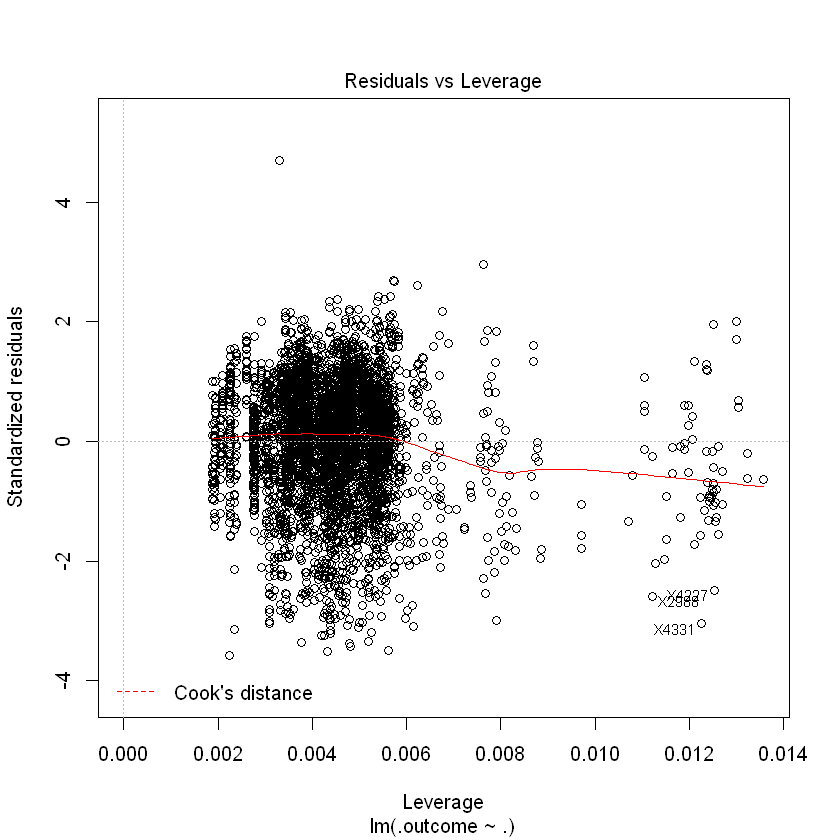

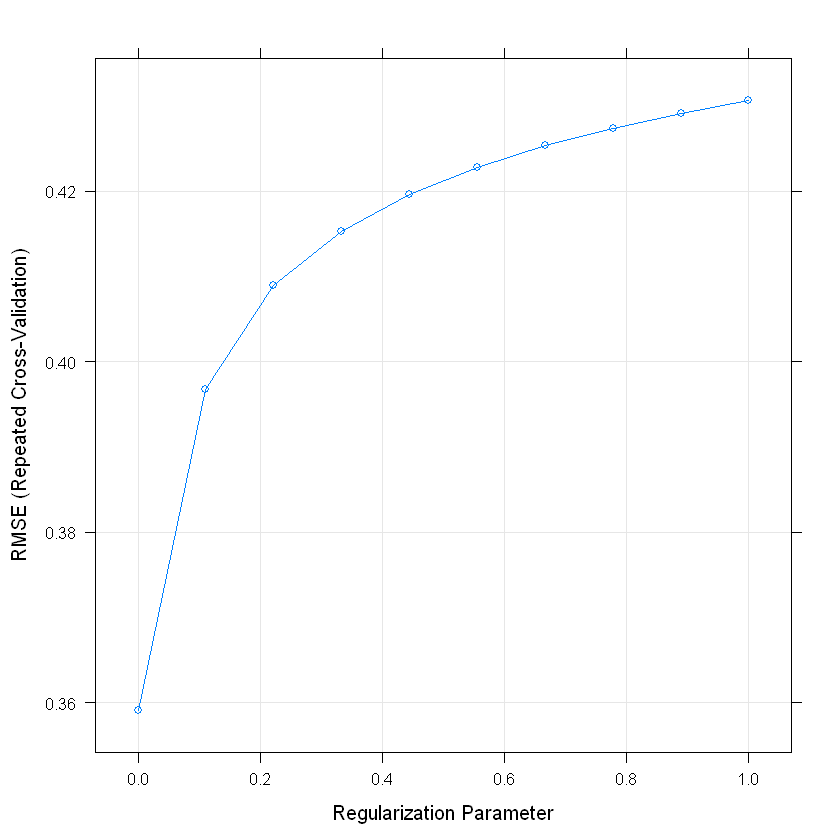

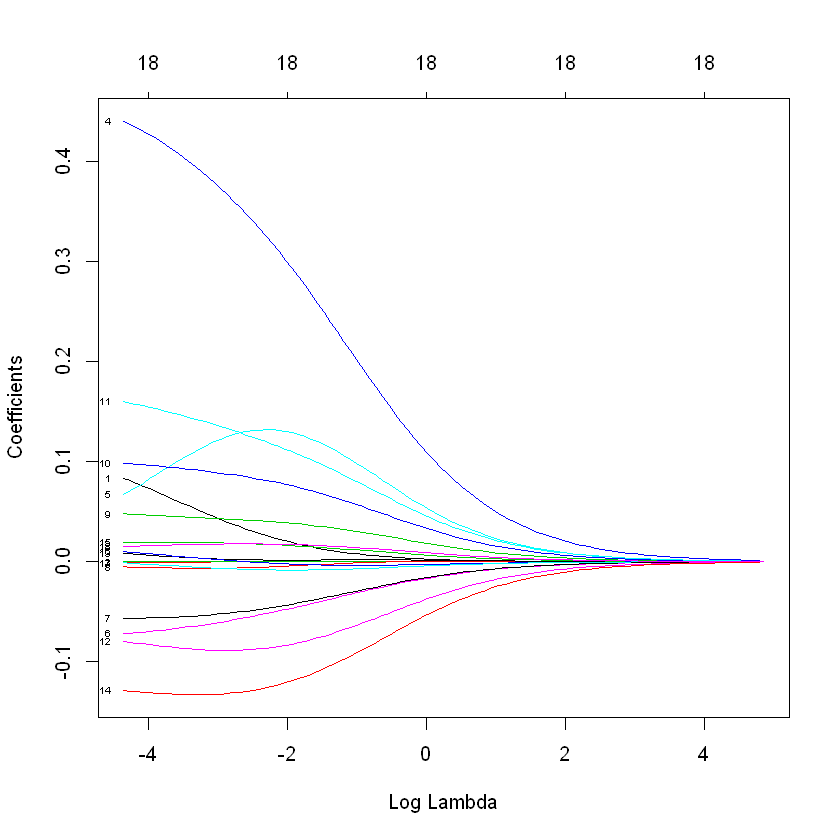

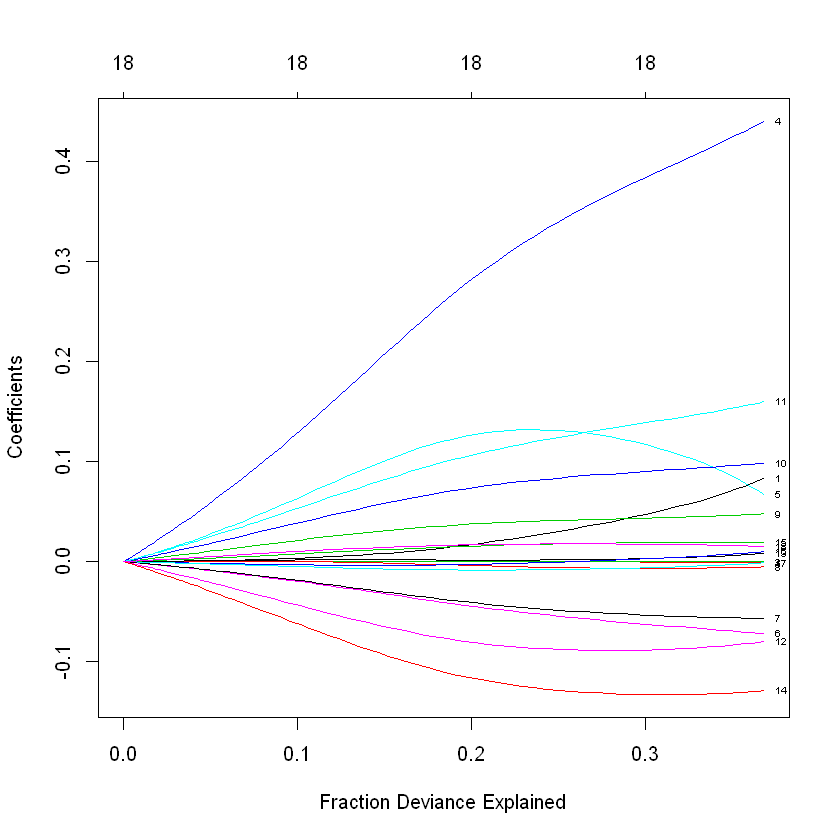

+ Fold01.Rep1: alpha=1, lambda=1 
- Fold01.Rep1: alpha=1, lambda=1 
+ Fold02.Rep1: alpha=1, lambda=1 
- Fold02.Rep1: alpha=1, lambda=1 
+ Fold03.Rep1: alpha=1, lambda=1 
- Fold03.Rep1: alpha=1, lambda=1 
+ Fold04.Rep1: alpha=1, lambda=1 
- Fold04.Rep1: alpha=1, lambda=1 
+ Fold05.Rep1: alpha=1, lambda=1 
- Fold05.Rep1: alpha=1, lambda=1 
+ Fold06.Rep1: alpha=1, lambda=1 
- Fold06.Rep1: alpha=1, lambda=1 
+ Fold07.Rep1: alpha=1, lambda=1 
- Fold07.Rep1: alpha=1, lambda=1 
+ Fold08.Rep1: alpha=1, lambda=1 
- Fold08.Rep1: alpha=1, lambda=1 
+ Fold09.Rep1: alpha=1, lambda=1 
- Fold09.Rep1: alpha=1, lambda=1 
+ Fold10.Rep1: alpha=1, lambda=1 
- Fold10.Rep1: alpha=1, lambda=1 
+ Fold01.Rep2: alpha=1, lambda=1 
- Fold01.Rep2: alpha=1, lambda=1 
+ Fold02.Rep2: alpha=1, lambda=1 
- Fold02.Rep2: alpha=1, lambda=1 
+ Fold03.Rep2: alpha=1, lambda=1 
- Fold03.Rep2: alpha=1, lambda=1 
+ Fold04.Rep2: alpha=1, lambda=1 
- Fold04.Rep2: alpha=1, lambda=1 
+ Fold05.Rep2: alpha=1, lambda=1 
- Fold05.Rep2:

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
"There were missing values in resampled performance measures."

Aggregating results
Selecting tuning parameters
Fitting alpha = 1, lambda = 1e-04 on full training set


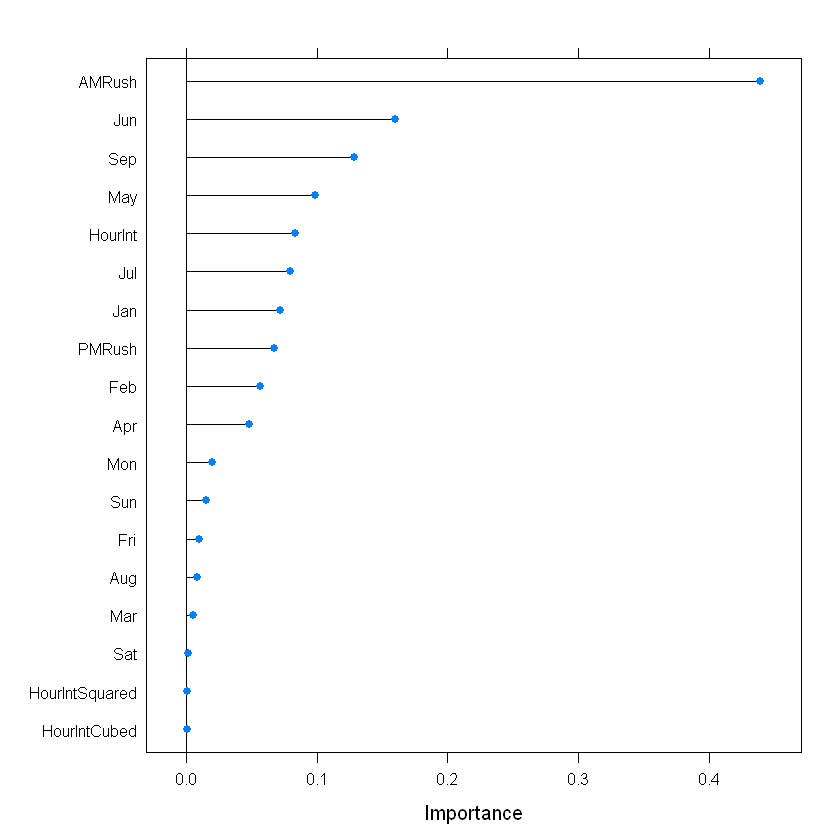

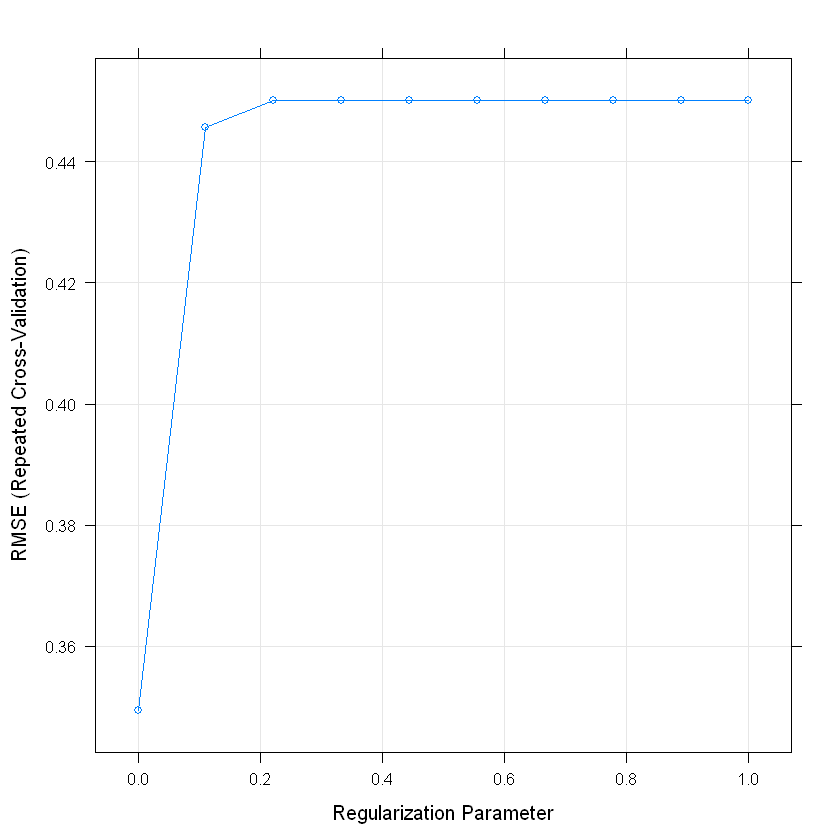

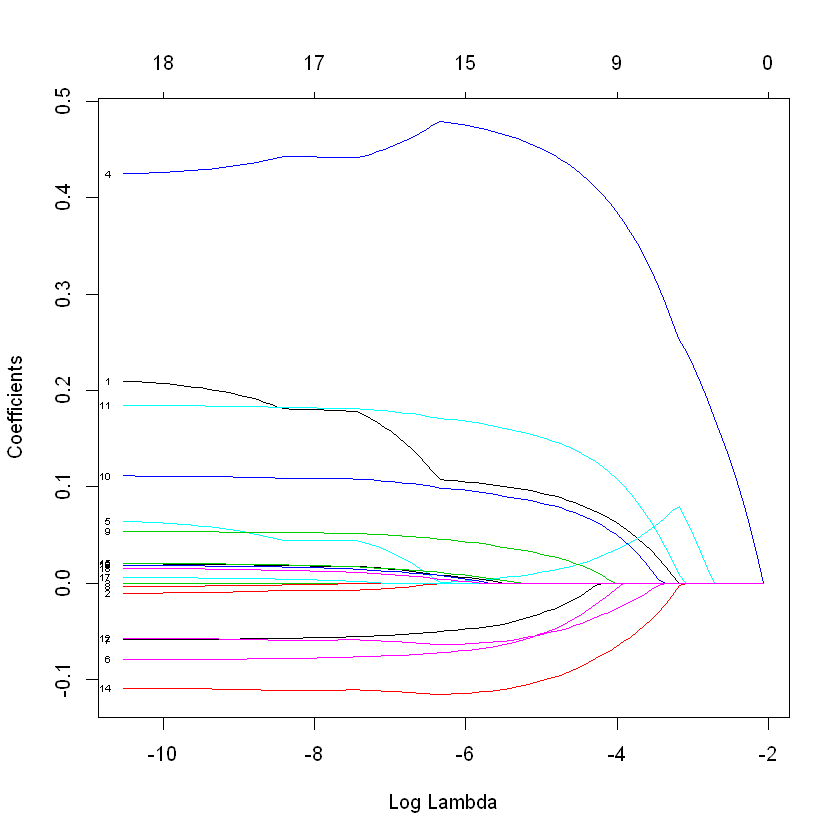

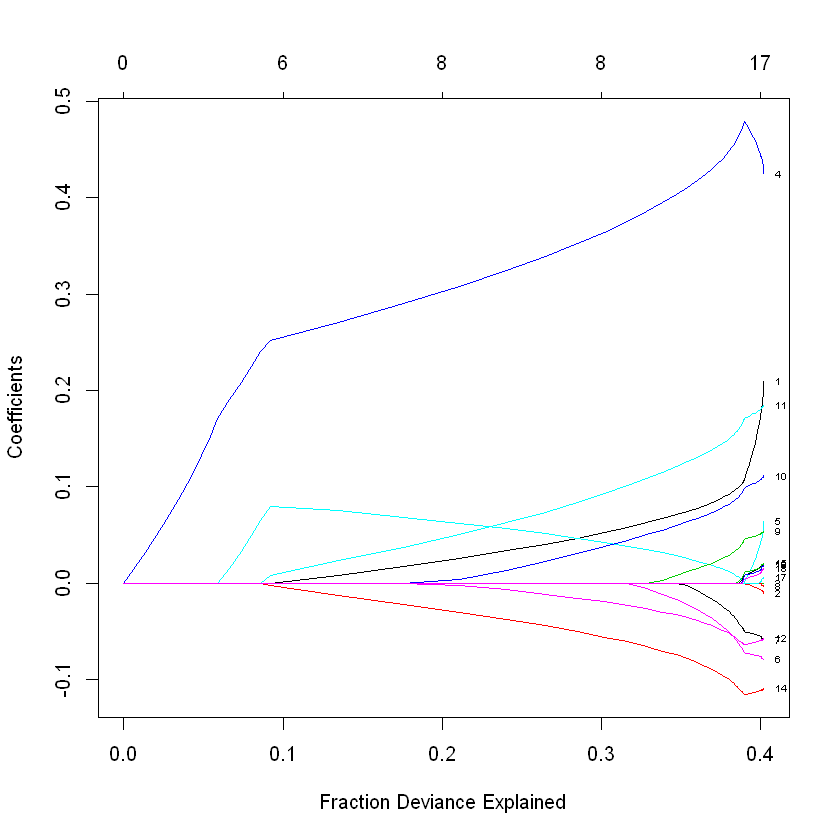

+ Fold01.Rep1: alpha=0.0000, lambda=1 
- Fold01.Rep1: alpha=0.0000, lambda=1 
+ Fold01.Rep1: alpha=0.1111, lambda=1 
- Fold01.Rep1: alpha=0.1111, lambda=1 
+ Fold01.Rep1: alpha=0.2222, lambda=1 
- Fold01.Rep1: alpha=0.2222, lambda=1 
+ Fold01.Rep1: alpha=0.3333, lambda=1 
- Fold01.Rep1: alpha=0.3333, lambda=1 
+ Fold01.Rep1: alpha=0.4444, lambda=1 
- Fold01.Rep1: alpha=0.4444, lambda=1 
+ Fold01.Rep1: alpha=0.5556, lambda=1 
- Fold01.Rep1: alpha=0.5556, lambda=1 
+ Fold01.Rep1: alpha=0.6667, lambda=1 
- Fold01.Rep1: alpha=0.6667, lambda=1 
+ Fold01.Rep1: alpha=0.7778, lambda=1 
- Fold01.Rep1: alpha=0.7778, lambda=1 
+ Fold01.Rep1: alpha=0.8889, lambda=1 
- Fold01.Rep1: alpha=0.8889, lambda=1 
+ Fold01.Rep1: alpha=1.0000, lambda=1 
- Fold01.Rep1: alpha=1.0000, lambda=1 
+ Fold02.Rep1: alpha=0.0000, lambda=1 
- Fold02.Rep1: alpha=0.0000, lambda=1 
+ Fold02.Rep1: alpha=0.1111, lambda=1 
- Fold02.Rep1: alpha=0.1111, lambda=1 
+ Fold02.Rep1: alpha=0.2222, lambda=1 
- Fold02.Rep1: alpha=0.22

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
"There were missing values in resampled performance measures."

Aggregating results
Selecting tuning parameters
Fitting alpha = 1, lambda = 1e-04 on full training set


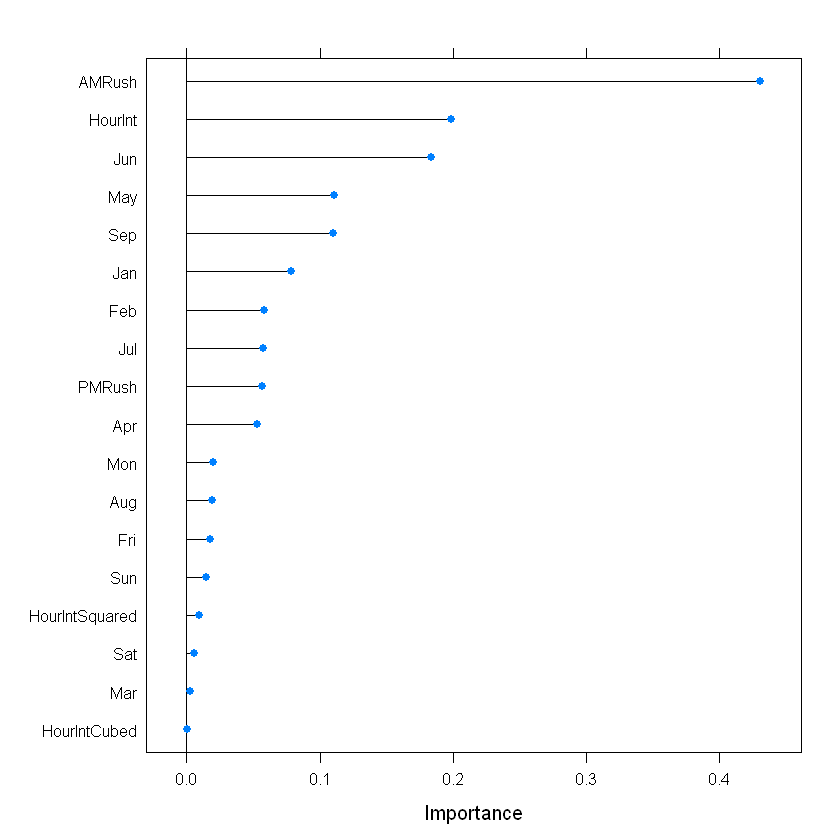

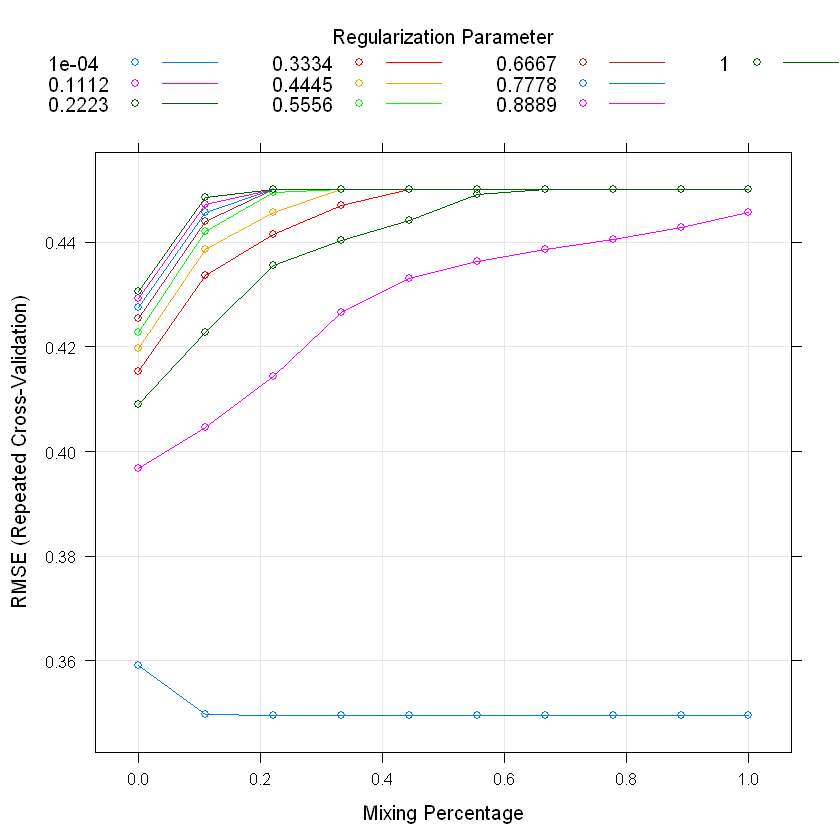

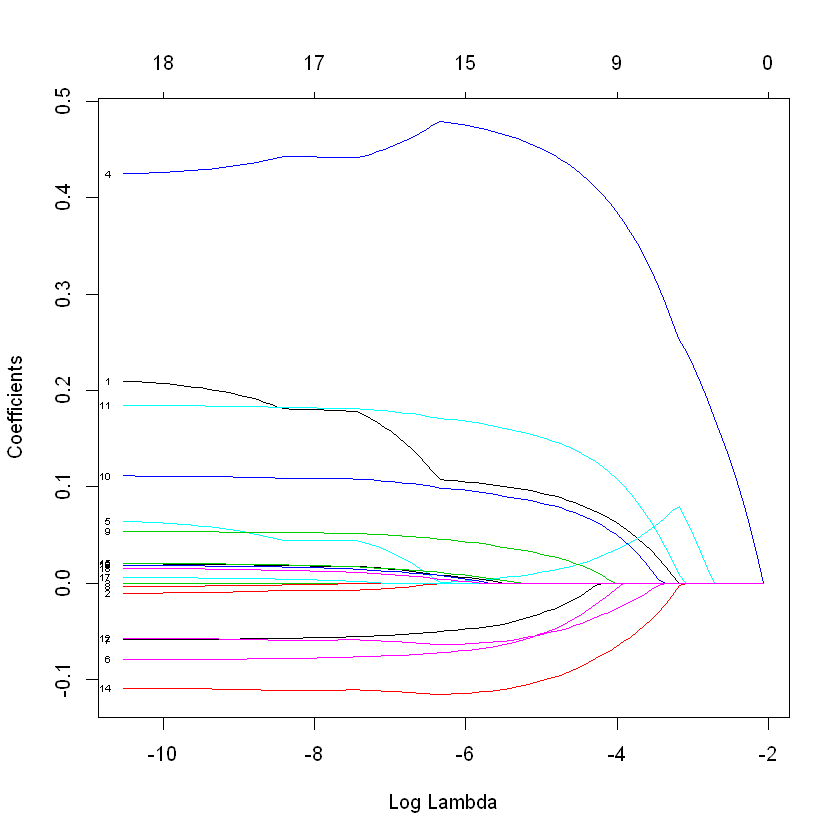

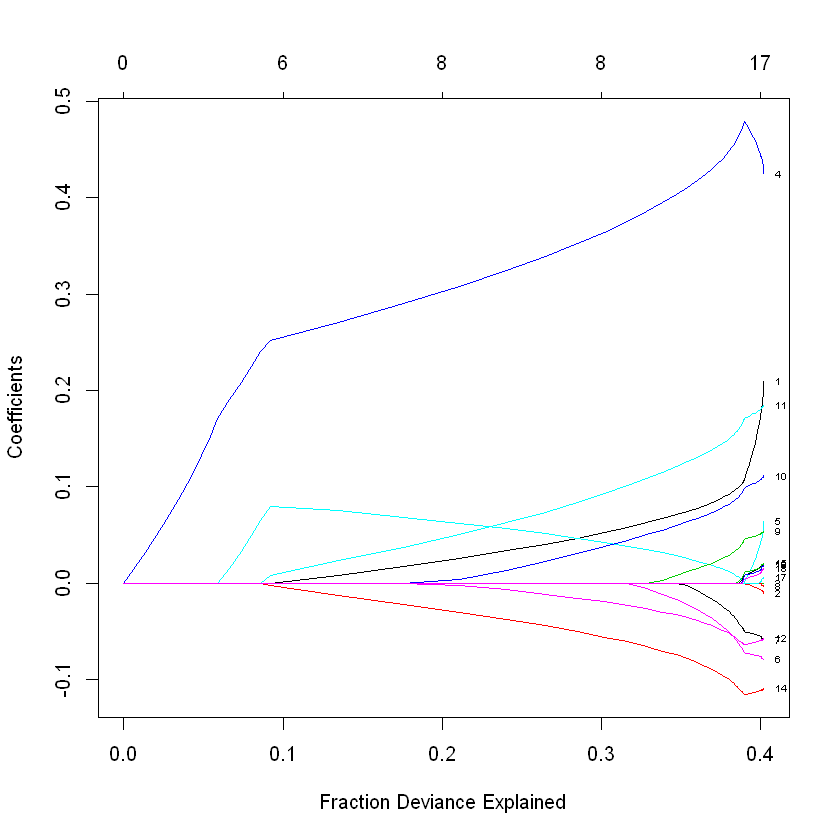


Call:
summary.resamples(object = JFKPreResample)

Models: JFKPreLinear, JFKPreRidge, JFKPreLasso, JFKPreEN 
Number of resamples: 50 

MAE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
JFKPreLinear 0.2438705 0.2663543 0.2723599 0.2730461 0.2793468 0.2937381    0
JFKPreRidge  0.2626563 0.2762326 0.2823360 0.2830530 0.2887871 0.3063870    0
JFKPreLasso  0.2518669 0.2674048 0.2728192 0.2732537 0.2790307 0.2960033    0
JFKPreEN     0.2518669 0.2674048 0.2728192 0.2732537 0.2790307 0.2960033    0

RMSE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
JFKPreLinear 0.3117702 0.3407069 0.3502010 0.3494444 0.3579441 0.3735948    0
JFKPreRidge  0.3319513 0.3486036 0.3588020 0.3591217 0.3670783 0.3905901    0
JFKPreLasso  0.3251085 0.3401987 0.3477398 0.3495020 0.3577954 0.3817403    0
JFKPreEN     0.3251085 0.3401987 0.3477398 0.3495020 0.3577954 0.3817403    0

Rsquared 
                  Min.   1st Qu.    Median      Mean   3rd Qu.

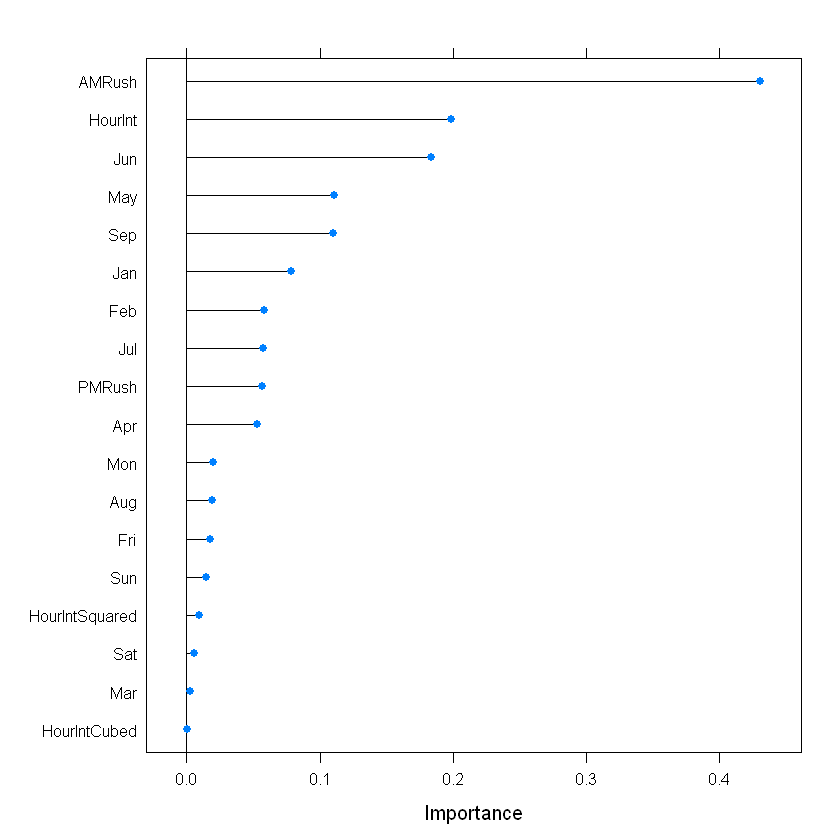

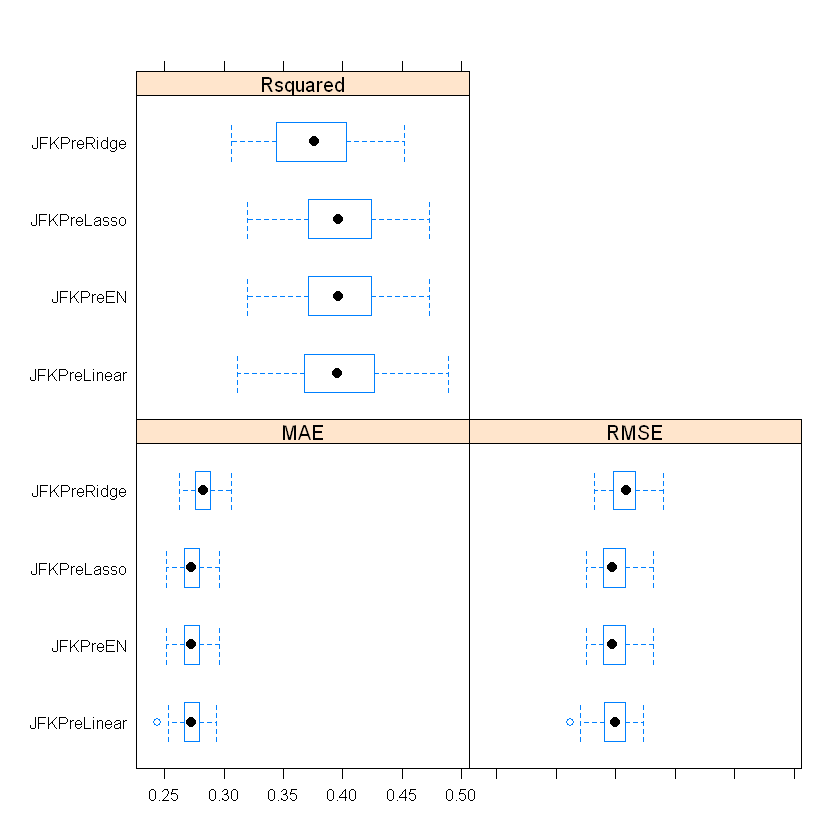

,alpha,lambda
91,1,1e-04


19 x 1 sparse Matrix of class "dgCMatrix"
                           1
(Intercept)     5.815887e-01
HourInt         1.988619e-01
HourIntSquared -9.103548e-03
HourIntCubed    5.431576e-05
AMRush          4.312859e-01
PMRush          5.661864e-02
Jan            -7.864496e-02
Feb            -5.794875e-02
Mar            -2.585508e-03
Apr             5.324686e-02
May             1.104790e-01
Jun             1.836869e-01
Jul            -5.777163e-02
Aug             1.950491e-02
Sep            -1.097410e-01
Mon             2.009411e-02
Fri             1.786023e-02
Sat             5.331161e-03
Sun             1.466251e-02


Model RMSE of Training Data JFK PreCheck best fit Elastic Net
[1] 0.3482218

Model RMSE of Test Data JFK PreCheck best fit Elastic Net
[1] 0.355048

Dataset for JFK SqRt Regular
'data.frame':	7320 obs. of  19 variables:
 $ WaitTimeContinuousSqRt: num  1.097 0.938 1.041 4.361 4.377 ...
 $ HourInt               : int  0 1 2 3 4 5 6 7 8 9 ...
 $ HourIntSquared        : int  0 1 4 9 16 25 36 49 64 81 ...
 $ HourIntCubed          : int  0 1 8 27 64 125 216 343 512 729 ...
 $ AMRush                : int  0 0 0 0 0 1 1 1 0 0 ...
 $ PMRush                : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jan                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Feb                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Mar                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Apr                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ May                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jun                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jul                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Aug                 


Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.5445 -0.4669 -0.0337  0.4411  2.9687 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     1.354e+00  3.859e-02  35.096  < 2e-16 ***
HourInt         3.758e-01  1.460e-02  25.739  < 2e-16 ***
HourIntSquared -1.653e-02  1.581e-03 -10.458  < 2e-16 ***
HourIntCubed    1.395e-04  4.561e-05   3.059  0.00223 ** 
AMRush          7.878e-01  3.386e-02  23.267  < 2e-16 ***
PMRush         -3.353e-02  3.374e-02  -0.994  0.32038    
Jan            -2.198e-01  3.625e-02  -6.064 1.42e-09 ***
Feb            -1.852e-01  3.894e-02  -4.757 2.02e-06 ***
Mar            -1.052e-01  3.659e-02  -2.875  0.00405 ** 
Apr            -2.834e-01  3.759e-02  -7.539 5.56e-14 ***
May            -2.286e-01  3.668e-02  -6.233 4.95e-10 ***
Jun            -1.647e-01  3.736e-02  -4.410 1.05e-05 ***
Jul             2.255e-02  3.677e-02   0.613  0.53973    
Aug             1.106e-01  3.682e

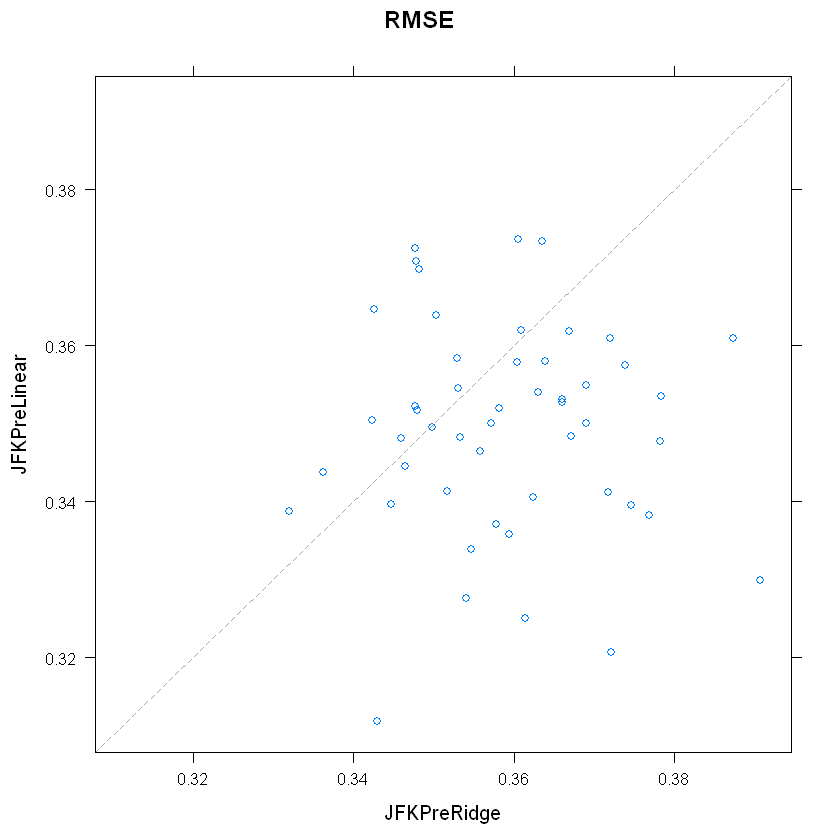

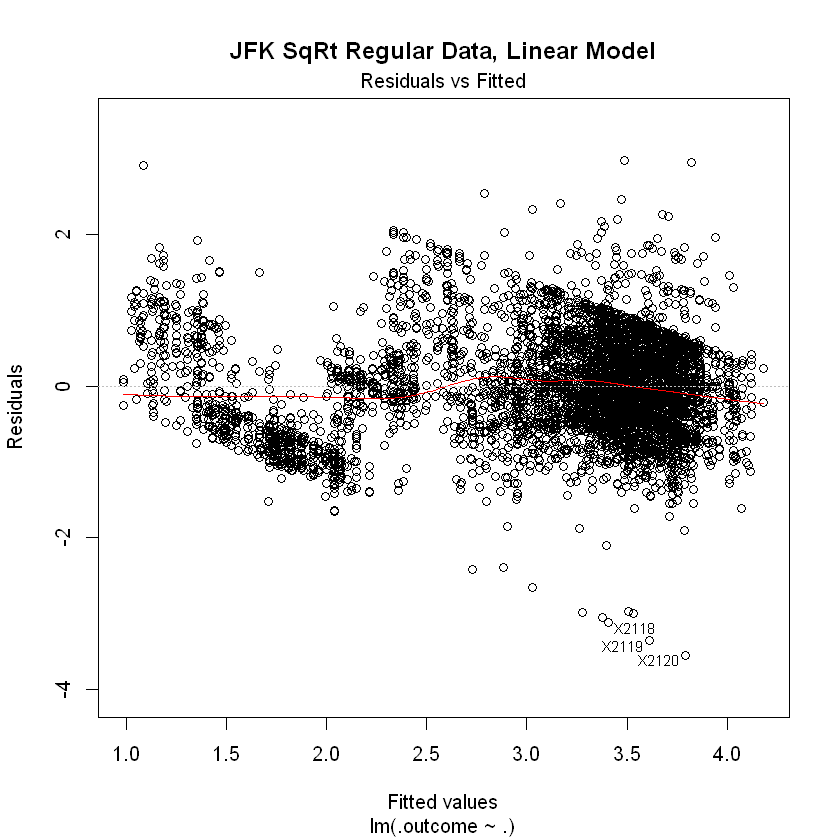

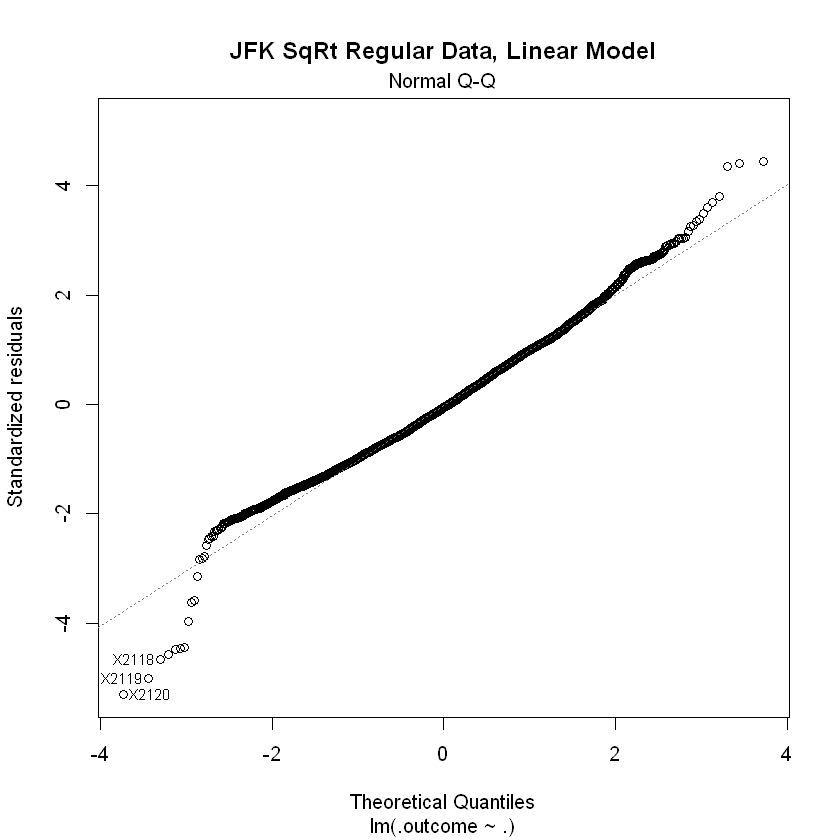

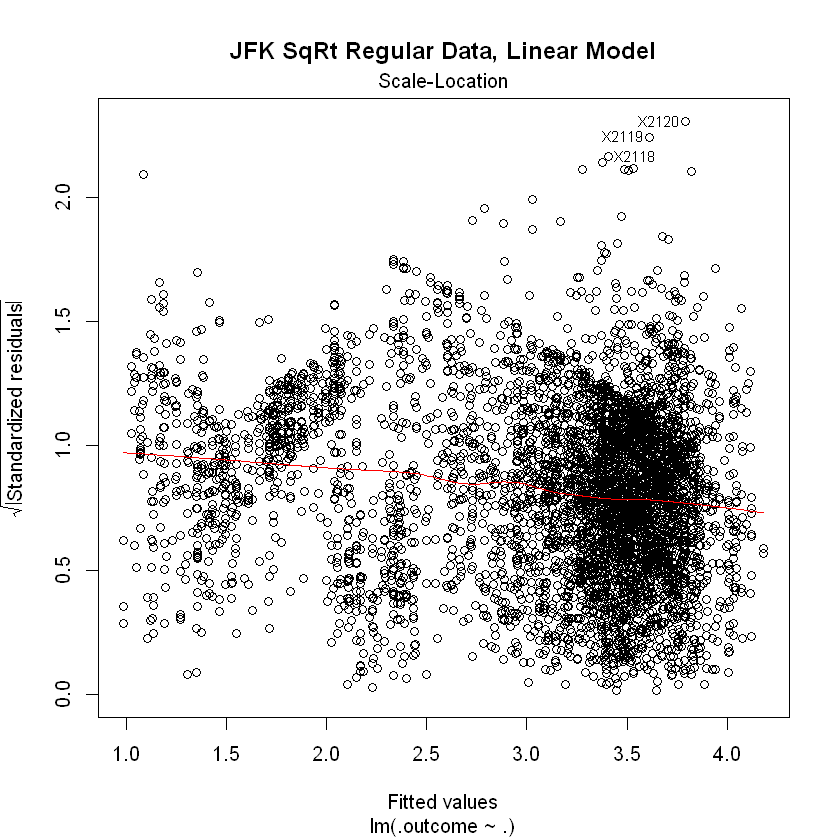

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
"There were missing values in resampled performance measures."


Elastic Net Outputs for JFK SqRt Regular


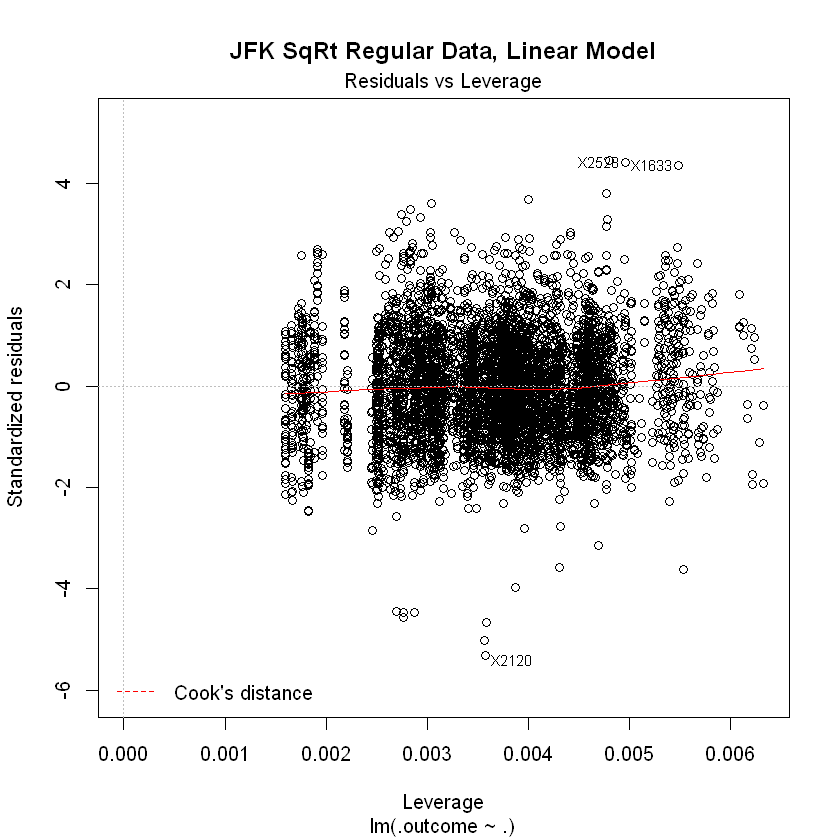

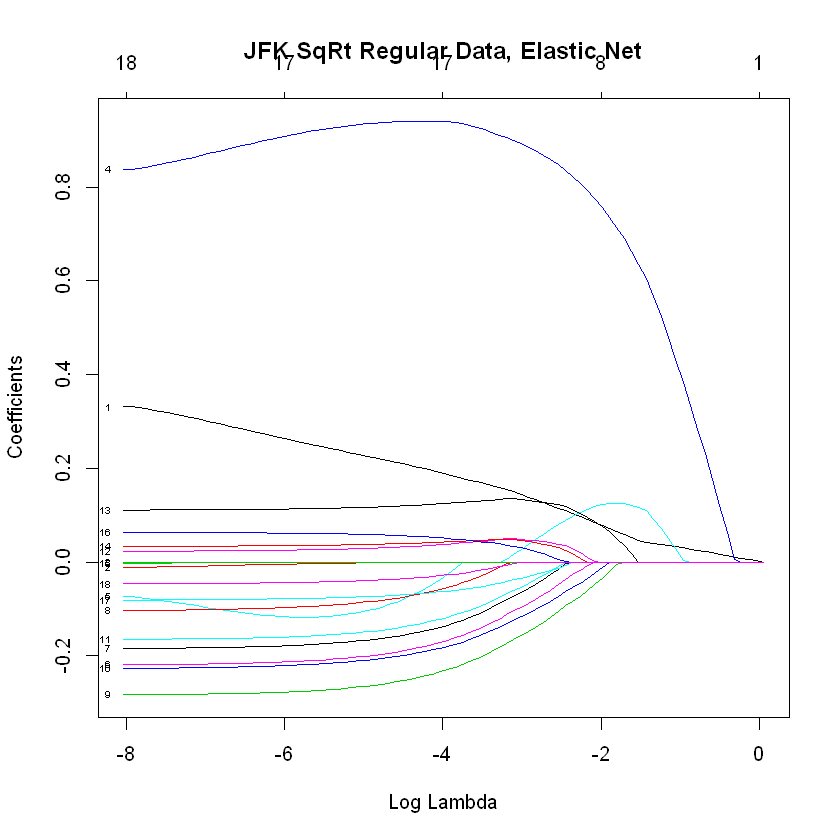

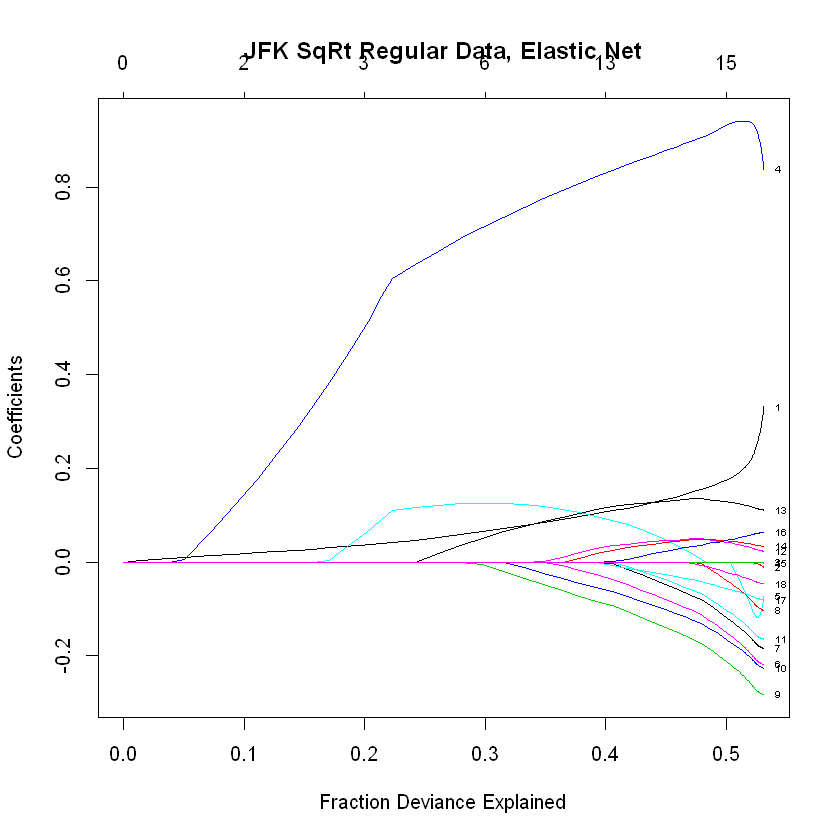


Compare Linear vs Elastic Net Models, JFK SqRt Regular


Call:
summary.resamples(object = JFKRegResample)

Models: JFKRegLinear, JFKRegEN 
Number of resamples: 50 

MAE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
JFKRegLinear 0.5016687 0.5209413 0.5299641 0.5314319 0.5415027 0.5762721    0
JFKRegEN     0.4984274 0.5222818 0.5339897 0.5315136 0.5405912 0.5551180    0

RMSE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
JFKRegLinear 0.6284706 0.6530216 0.6683559 0.6696449 0.6833080 0.7403959    0
JFKRegEN     0.6209743 0.6552633 0.6748985 0.6700509 0.6860247 0.7018284    0

Rsquared 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
JFKRegLinear 0.4429445 0.5163044 0.5301717 0.5298037 0.5557406 0.5964987    0
JFKRegEN     0.4327363 0.5101507 0.5270056 0.5286912 0.5448704 0.6112937    0


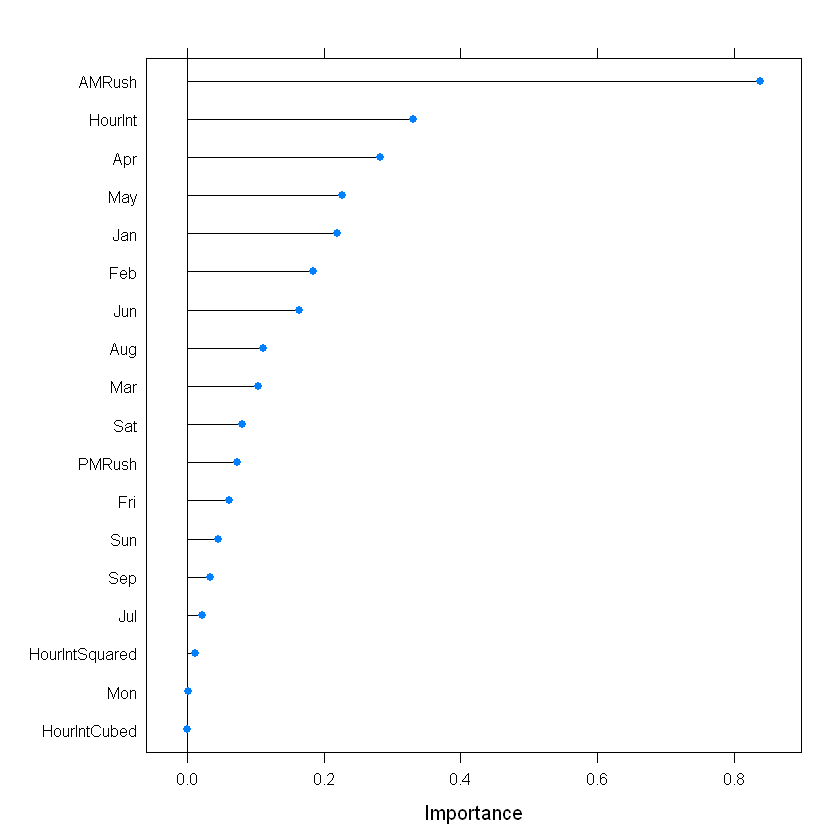

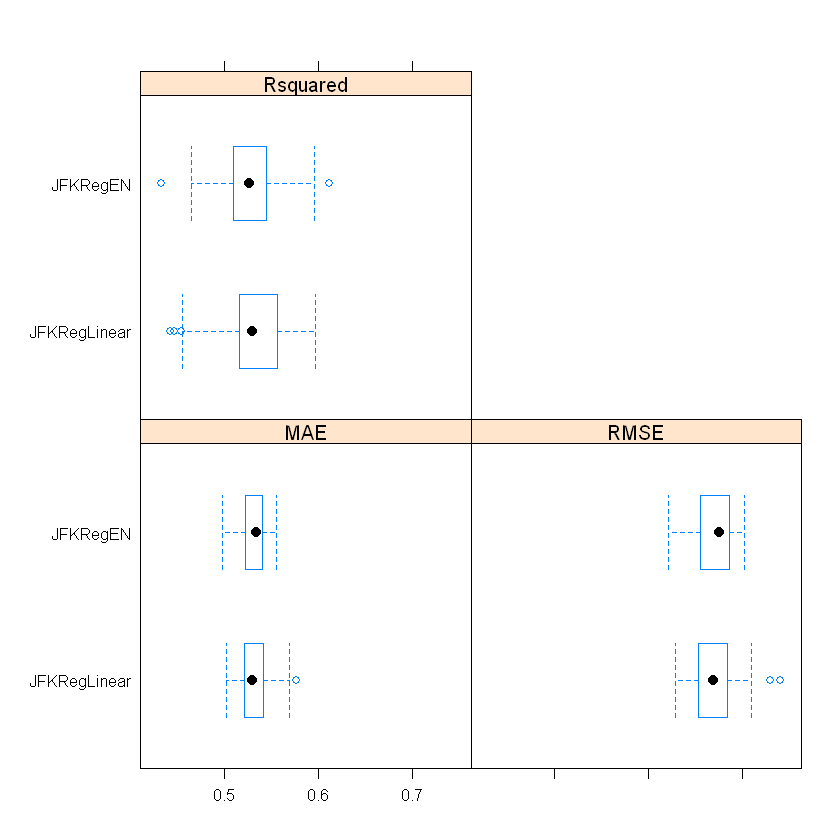


Best Model for Elastic Net JFK SqRt Regular


,alpha,lambda
31,0.3333333,1e-04


19 x 1 sparse Matrix of class "dgCMatrix"
                           1
(Intercept)     1.422167e+00
HourInt         3.311762e-01
HourIntSquared -1.161363e-02
HourIntCubed    7.805916e-08
AMRush          8.381600e-01
PMRush         -7.413989e-02
Jan            -2.191795e-01
Feb            -1.844544e-01
Mar            -1.037157e-01
Apr            -2.831190e-01
May            -2.271736e-01
Jun            -1.647352e-01
Jul             2.302552e-02
Aug             1.109720e-01
Sep             3.382460e-02
Mon            -2.412236e-03
Fri             6.244050e-02
Sat            -8.132956e-02
Sun            -4.646599e-02


Model RMSE of Training Data JFK Regular best fit Elastic Net
[1] 0.6681552

Model RMSE of Test Data JFK Regular best fit Elastic Net
[1] 0.6775251


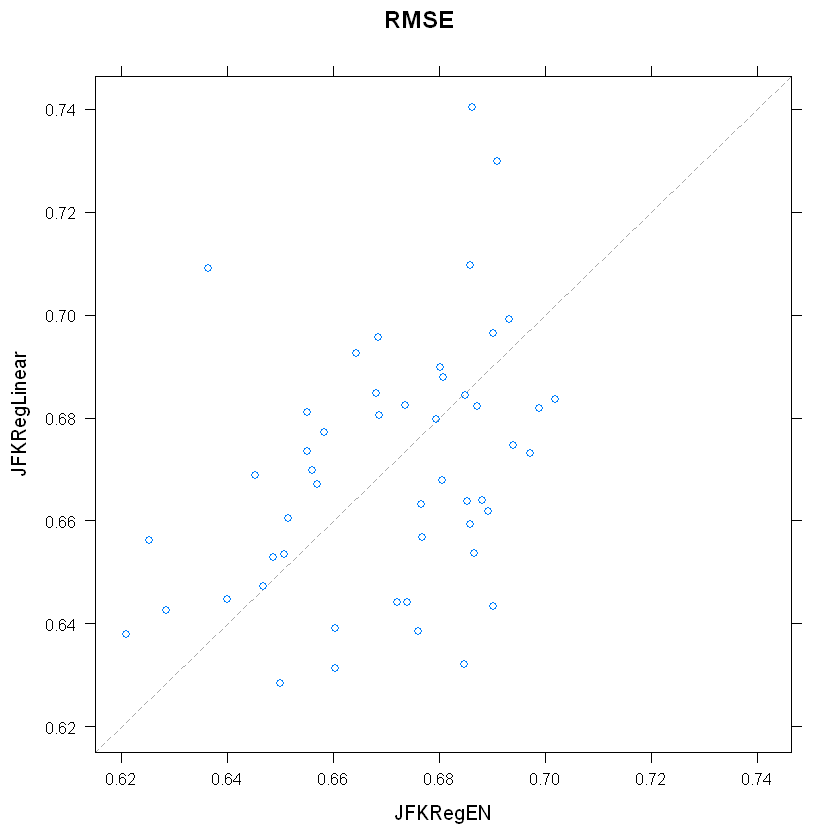

In [2]:
#!!!!!!!!! CHANGE TO R KERNEL !!!!!!!!!!!!!

#Cell name:  RIDGE, LASSO, AND ELASTIC NET REGRESSIONS
#This requires cell R SETUP to be run first
#!!!NOTE THIS CELL FILTERS INDIVIDUAL AIRPORT DATA INTO ALL NUMERIC VARIABLES!!!
#!!!RERUN R SETUP BEFORE GOING TO ANOTHER CELL!!!


library(dplyr)
library(glmnet)
library(caret)
library(mlbench)
library(psych)
library(MASS)
#library(gamlss) #General additive models--don't need in this cell
#library(brms)  #Bayesian regression models--don't need in this cell
#library(ggplot2)

#Create response variable and subset data
AptWaitsR$WaitTimeContinuousSqRt <- (AptWaitsR$WaitTimeContinuous)^(0.5)

#Subset dataframe to only numeric variables to see if this clears up predict issues

AptWaitsJFK <- AptWaitsR %>% filter(JFK==1)
AptWaitsEWR <- AptWaitsR %>% filter(EWR==1)
AptWaitsORD <- AptWaitsR %>% filter(ORD==1)
AptWaitsJFKPreAll <- AptWaitsJFK %>% filter(PreCheck==1)
AptWaitsJFKRegAll <- AptWaitsJFK %>% filter(PreCheck==0)
AptWaitsEWRPreAll <- AptWaitsEWR %>% filter(PreCheck==1)
AptWaitsEWRRegAll <- AptWaitsEWR %>% filter(PreCheck==0)
AptWaitsORDPreAll <- AptWaitsORD %>% filter(PreCheck==1)
AptWaitsORDRegAll <- AptWaitsORD %>% filter(PreCheck==0)

AptWaitsJFKPre <-  dplyr::select(AptWaitsJFKPreAll, WaitTimeContinuousSqRt, HourInt, 
                        HourIntSquared, HourIntCubed, AMRush, 
                        PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)
AptWaitsJFKReg <-  dplyr::select(AptWaitsJFKRegAll, WaitTimeContinuousSqRt, HourInt, 
                        HourIntSquared, HourIntCubed, AMRush, 
                        PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)
AptWaitsEWRPre <-  dplyr::select(AptWaitsEWRPreAll, WaitTimeContinuousSqRt, HourInt, 
                        HourIntSquared, HourIntCubed, AMRush, 
                        PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)
AptWaitsEWRReg <-  dplyr::select(AptWaitsEWRRegAll, WaitTimeContinuousSqRt, HourInt, 
                        HourIntSquared, HourIntCubed, AMRush, 
                        PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)
AptWaitsORDPre <-  dplyr::select(AptWaitsORDPreAll, WaitTimeContinuousSqRt, HourInt, 
                        HourIntSquared, HourIntCubed, AMRush, 
                        PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)
AptWaitsORDReg <-  dplyr::select(AptWaitsORDRegAll, WaitTimeContinuousSqRt, HourInt, 
                        HourIntSquared, HourIntCubed, AMRush, 
                        PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)



#detach(AptWaitsR)
#attach(AptWaitsJFK)
#XVarsSmall <- cbind(PreCheck, CatX, CatIV, JFK, ORD, EWR, AMRush) #For general model, testing script
#XVarsFull <- cbind(HourInt, HourIntSquared, HourIntCubed, AMRush, PMRush, PreCheck, 
#             Jan, Feb, Mar, Apr, May, Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun, CatX, CatI, CatIV, JFK, BOS, LAX, 
 #            LAS, DCA, IAD, BWI, ORD, EWR, MCO, DFW, MIA)  #For full model
#XVarsAptLane <- cbind(HourInt, HourIntSquared, HourIntCubed, AMRush, PMRush, Jan, Feb, Mar, Apr, May, Jun,
#                     Jul, Aug, Sep, Mon, Fri, Sat, Sun)  #For analysis by airport and lane--note all time variables

#First use linear regression as a base case for comparison
#LinReg <- lm(WaitTimeContinuousSqRt ~ XVarsAptLane, data=AptWaitsJFK) 
#cat("\nLINEAR REGRESSION RESULTS FOR ALL AIRPORTS\n")
#summary(LinReg)
#cat("\nSTEPWISE REGRESSION RESULTS FOR ALL AIRPORTS\n")
#LinRegStepwise <- stepAIC(LinReg, direction = "both")
#cat("\nSTEPWISE ANOVA FOR ALL AIRPORTS\n")
#LinRegStepwise$anova


#--------------BUILD OUT LOGIC WITH JFK PRECHECK----------------

#Set up to Compare to ridge regression

#Cross validation to find optimal lambda
#Lambdas <- 10^seq(3, -2, by=-0.1)
#CvFit <- cv.glmnet(XVarsSmall, WaitTimeContinuousSqRt, alpha=0, lambda=Lambdas)
#plot(CvFit)
#OptLambda <- CvFit$lambda.min
#cat("Optimal lambda:", OptLambda)
#GLMFit <- CvFit$glmnet.fit
#summary(GLMFit)
#Get R-square, intermediate find Sum of Squares Total (SST) and Sum of Squares Error (SSE)
#PredY <- predict(GLMFit, s=OptLambda, newx=XVarsSmall)
#SST <- sum((WaitTimeContinuousSqRt - mean(WaitTimeContinuousSqRt))^2)
#SSE <- sum((PredY - WaitTimeContinuousSqRt)^2)
#RSq <- 1 - (SSE/SST)
#cat("R-square:", RSq)

#Subset dataframe to only numeric variables to see if this clears up predict issues
#AptWaitsJFKPre <-  dplyr::select(AptWaitsJFKPreAllVar, WaitTimeContinuousSqRt, HourInt, 
#                        HourIntSquared, HourIntCubed, AMRush, 
#                        PMRush, Jan, Feb, Mar, Apr, May, 
#                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)
#AptWaitsJFKPre <- data.frame( , AptWaitsJFKPreKeep, drop=FALSE)


str(AptWaitsJFKPre)
#pairs.panels(AptWaitsJFKPre)  #returns Too Large error

#Data Partition
set.seed(1234)
AptWaitsJFKPreSample <- sample(2, nrow(AptWaitsJFKPre), replace=T, prob=c(0.7, 0.3))
AptWaitsJFKPreTrain <- AptWaitsJFKPre[AptWaitsJFKPreSample==1,]
AptWaitsJFKPreTest <- AptWaitsJFKPre[AptWaitsJFKPreSample==2,]

cat("\nAptWaitsJFKPreSample\n")
tail(AptWaitsJFKPreSample)
cat("\nAptWaitsJFKPreTrain\n")
tail(AptWaitsJFKPreTrain)



#cat("\nAptWaitsJFKPre\n")
#tail(AptWaitsJFKPre)
#print(nrow(AptWaitsJFKPre))
#cat("\nAptWaitsJFKPreSample\n")
#tail(AptWaitsJFKPreSample)
#print(nrow(AptWaitsJFKPreSample))
#cat("\nAptWaitsJFKPreTrain\n")
#tail(AptWaitsJFKPreTrain)
#print(nrow(AptWaitsJFKPreTrain))
#cat("\nAptWaitsJFKPreTest\n")
#tail(AptWaitsJFKPreTest)
#print(nrow(AptWaitsJFKPreTest))

#Custom Control Parameters for Cross Validation
AptWaitsJFKPreCustom <- trainControl(method="repeatedcv", number=10, repeats=5, verboseIter=T)

#Train Linear model 
AptWaitsJFKPreLinear <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                              Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                              AptWaitsJFKPreTrain, method = "lm", trControl=AptWaitsJFKPreCustom)
cat("\nLinear Regression Results JFK SqRt PreCheck TrainingData\n")
print(AptWaitsJFKPreLinear$results)
summary(AptWaitsJFKPreLinear)
plot(AptWaitsJFKPreLinear$finalModel)

#Train Ridge Regression
set.seed(1234)
AptWaitsJFKPreRidge <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                            Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                            AptWaitsJFKPreTrain, method = "glmnet", 
                            tuneGrid=expand.grid(alpha=0, lambda=seq(0.0001, 1, length=10)),
                            trControl=AptWaitsJFKPreCustom)
plot(AptWaitsJFKPreRidge)
plot(AptWaitsJFKPreRidge$finalModel, xvar="lambda", label=T)
plot(AptWaitsJFKPreRidge$finalModel, xvar="dev", label=T)
plot(varImp(AptWaitsJFKPreRidge, scale=F))

#Train LASSO Regression
set.seed(1234)
AptWaitsJFKPreLasso <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                            Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                            AptWaitsJFKPreTrain, method = "glmnet", 
                            tuneGrid=expand.grid(alpha=1, lambda=seq(0.0001, 1, length=10)),
                            trControl=AptWaitsJFKPreCustom)
plot(AptWaitsJFKPreLasso)
plot(AptWaitsJFKPreLasso$finalModel, xvar="lambda", label=T)
plot(AptWaitsJFKPreLasso$finalModel, xvar="dev", label=T)
plot(varImp(AptWaitsJFKPreLasso, scale=F))

#Train Elastic Net Regression
set.seed(1234)
AptWaitsJFKPreEN <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                            Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                            AptWaitsJFKPreTrain, method = "glmnet", 
                            tuneGrid=expand.grid(alpha=seq(0, 1, length=10), lambda=seq(0.0001, 1, length=10)),
                            trControl=AptWaitsJFKPreCustom)
plot(AptWaitsJFKPreEN)
plot(AptWaitsJFKPreEN$finalModel, xvar="lambda", label=T)
plot(AptWaitsJFKPreEN$finalModel, xvar="dev", label=T)
plot(varImp(AptWaitsJFKPreEN, scale=F))

#Compare Models
JFKPreModels <- list(JFKPreLinear = AptWaitsJFKPreLinear, JFKPreRidge = AptWaitsJFKPreRidge, 
                    JFKPreLasso = AptWaitsJFKPreLasso, JFKPreEN = AptWaitsJFKPreEN)
JFKPreResample <- resamples(JFKPreModels)
summary(JFKPreResample)
bwplot(JFKPreResample)
xyplot(JFKPreResample, metric="RMSE")

#Find best model for Elastic Net
AptWaitsJFKPreEN$bestTune  #note best value of alpha is 1, i.e. LASSO regression
#AptWaitsJFKPreENBest = AptWaitsJFKPreEN$finalModel
coef(AptWaitsJFKPreEN$finalModel, s=AptWaitsJFKPreEN$bestTune$lambda)

#Use prediction model to test against test data
#ERRORS IN PREDICT MAY BE CAUSED BY CATEGORICAL AND TEXT FIELDS IN DATASETS--TRY SUBSETTING WITH JUST NUMERIC VAR'S
#AptWaitsJFKPreTrainMatrix <- model.matrix(WaitTimeContinuousSqRt~., data=AptWaitsJFKPreTrain)
#AptWaitsJFKPreTestMatrix <- model.matrix(WaitTimeContinuousSqRt~., data=AptWaitsJFKPreTest)
#Are these matrices actually needed for anything?  Or attempted fix that fixed nothing?

#Print out datasets to diagnose why predict is getting matrix inequality errors
#cat("\nAptWaitsJFKPreEN\n")
#print(AptWaitsJFKPreEN)
#cat("\nAptWaitsJFKPreEN$bestTune\n")
#print(AptWaitsJFKPreEN$bestTune)
#cat("\ncoef(AptWaitsJFKPreEN$finalModel, s=AptWaitsJFKPreEN$bestTune$lambda)\n")
#print(coef(AptWaitsJFKPreEN$finalModel, s=AptWaitsJFKPreEN$bestTune$lambda))
#cat("\nAptWaitsJFKPreEN$finalModel\n")
#tail(AptWaitsJFKPreEN$finalModel)
#cat("\nAptWaitsJFKPreTrainMatrix\n")
#head(AptWaitsJFKPreTrainMatrix)
#tail(AptWaitsJFKPreTrainMatrix)
#Eureka!!  Was calling the wrong dataset

AptWaitsJFKPreTrainPredicted <- predict(AptWaitsJFKPreEN, AptWaitsJFKPreTrain)
cat("\nModel RMSE of Training Data JFK PreCheck best fit Elastic Net\n")
print(sqrt(mean((AptWaitsJFKPreTrain$WaitTimeContinuousSqRt-AptWaitsJFKPreTrainPredicted)^2)))
AptWaitsJFKPreTestPredicted <- predict(AptWaitsJFKPreEN, AptWaitsJFKPreTest)
cat("\nModel RMSE of Test Data JFK PreCheck best fit Elastic Net\n")
print(sqrt(mean((AptWaitsJFKPreTest$WaitTimeContinuousSqRt-AptWaitsJFKPreTestPredicted)^2)))

#---------------------END JFK PRECHECK--------------------


#---------------------START JFK REGULAR--------------------

cat("\nDataset for JFK SqRt Regular\n")
str(AptWaitsJFKReg)

#Data Partition
set.seed(1234)
AptWaitsJFKRegSample <- sample(2, nrow(AptWaitsJFKReg), replace=T, prob=c(0.7, 0.3))
AptWaitsJFKRegTrain <- AptWaitsJFKReg[AptWaitsJFKRegSample==1,]
AptWaitsJFKRegTest <- AptWaitsJFKReg[AptWaitsJFKRegSample==2,]

#Custom Control Parameters for Cross Validation
AptWaitsJFKRegCustom <- trainControl(method="repeatedcv", number=10, repeats=5, verboseIter=F)

#Train Linear model 
AptWaitsJFKRegLinear <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                              Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                              AptWaitsJFKRegTrain, method = "lm", trControl=AptWaitsJFKRegCustom)
cat("\nLinear Regression Results JFK SqRt Regular TrainingData\n")
print(AptWaitsJFKRegLinear$results)
summary(AptWaitsJFKRegLinear)
plot(AptWaitsJFKRegLinear$finalModel, main="JFK SqRt Regular Data, Linear Model")

#Train Elastic Net Regression
#Note:  no reason to do ridge or LASSO, build both into EN to save time, then compare linear to EN
set.seed(1234)
AptWaitsJFKRegEN <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                            Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                            AptWaitsJFKRegTrain, method = "glmnet", 
                            tuneGrid=expand.grid(alpha=seq(0, 1, length=10), lambda=seq(0.0001, 1, length=10)),
                            trControl=AptWaitsJFKRegCustom)
cat("\nElastic Net Outputs for JFK SqRt Regular\n")
plot(AptWaitsJFKRegEN$finalModel, xvar="lambda", label=T, main="JFK SqRt Regular Data, Elastic Net")
plot(AptWaitsJFKRegEN$finalModel, xvar="dev", label=T, main="JFK SqRt Regular Data, Elastic Net")
plot(varImp(AptWaitsJFKRegEN, scale=F, main="JFK SqRt Regular Data, Elastic Net"))

#Compare Models
cat("\nCompare Linear vs Elastic Net Models, JFK SqRt Regular")
JFKRegModels <- list(JFKRegLinear = AptWaitsJFKRegLinear, JFKRegEN = AptWaitsJFKRegEN)
JFKRegResample <- resamples(JFKRegModels)
summary(JFKRegResample)
bwplot(JFKRegResample)
xyplot(JFKRegResample, metric="RMSE")

#Find best model for Elastic Net
cat("\nBest Model for Elastic Net JFK SqRt Regular\n")
AptWaitsJFKRegEN$bestTune  
coef(AptWaitsJFKRegEN$finalModel, s=AptWaitsJFKRegEN$bestTune$lambda)

AptWaitsJFKRegTrainPredicted <- predict(AptWaitsJFKRegEN, AptWaitsJFKRegTrain)
cat("\nModel RMSE of Training Data JFK Regular best fit Elastic Net\n")
print(sqrt(mean((AptWaitsJFKRegTrain$WaitTimeContinuousSqRt-AptWaitsJFKRegTrainPredicted)^2)))
AptWaitsJFKRegTestPredicted <- predict(AptWaitsJFKRegEN, AptWaitsJFKRegTest)
cat("\nModel RMSE of Test Data JFK Regular best fit Elastic Net\n")
print(sqrt(mean((AptWaitsJFKRegTest$WaitTimeContinuousSqRt-AptWaitsJFKRegTestPredicted)^2)))

#---------------------END JFK REGULAR--------------------













Dataset for JFK SqRt PreCheck
'data.frame':	5972 obs. of  19 variables:
 $ WaitTimeContinuousSqRt: num  1.69 1.86 1.83 1.87 1.67 ...
 $ HourInt               : int  3 4 5 6 7 8 9 10 11 12 ...
 $ HourIntSquared        : int  9 16 25 36 49 64 81 100 121 144 ...
 $ HourIntCubed          : int  27 64 125 216 343 512 729 1000 1331 1728 ...
 $ AMRush                : int  0 0 1 1 1 0 0 0 0 0 ...
 $ PMRush                : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jan                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Feb                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Mar                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Apr                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ May                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jun                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jul                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Aug                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Sep                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Mon                   : int  0 0 0 0 0 0 0 


Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.54187 -0.19744  0.04208  0.24316  1.63236 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     5.487e-01  3.672e-02  14.943  < 2e-16 ***
HourInt         2.166e-01  1.257e-02  17.228  < 2e-16 ***
HourIntSquared -1.103e-02  1.287e-03  -8.575  < 2e-16 ***
HourIntCubed    1.105e-04  3.723e-05   2.968 0.003013 ** 
AMRush          4.160e-01  1.875e-02  22.188  < 2e-16 ***
PMRush          6.907e-02  1.853e-02   3.727 0.000196 ***
Jan            -8.653e-02  2.172e-02  -3.983 6.93e-05 ***
Feb            -5.376e-02  2.255e-02  -2.384 0.017167 *  
Mar            -1.910e-03  2.189e-02  -0.087 0.930500    
Apr             5.299e-02  2.200e-02   2.409 0.016038 *  
May             1.181e-01  2.164e-02   5.457 5.12e-08 ***
Jun             1.879e-01  2.168e-02   8.666  < 2e-16 ***
Jul            -5.882e-02  2.118e-02  -2.777 0.005511 ** 
Aug             2.182e-

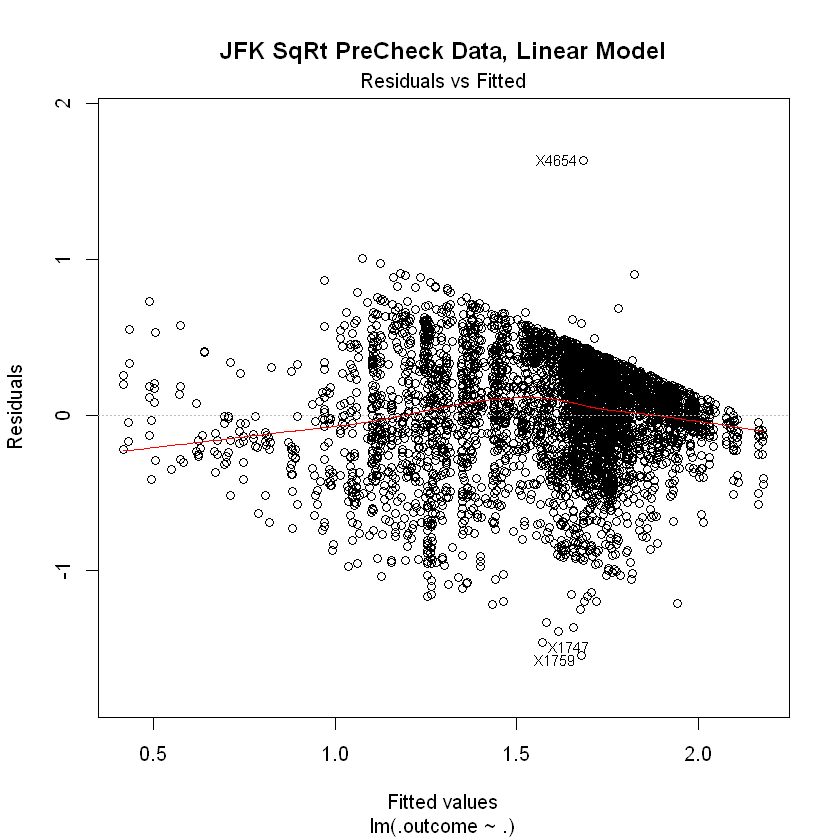

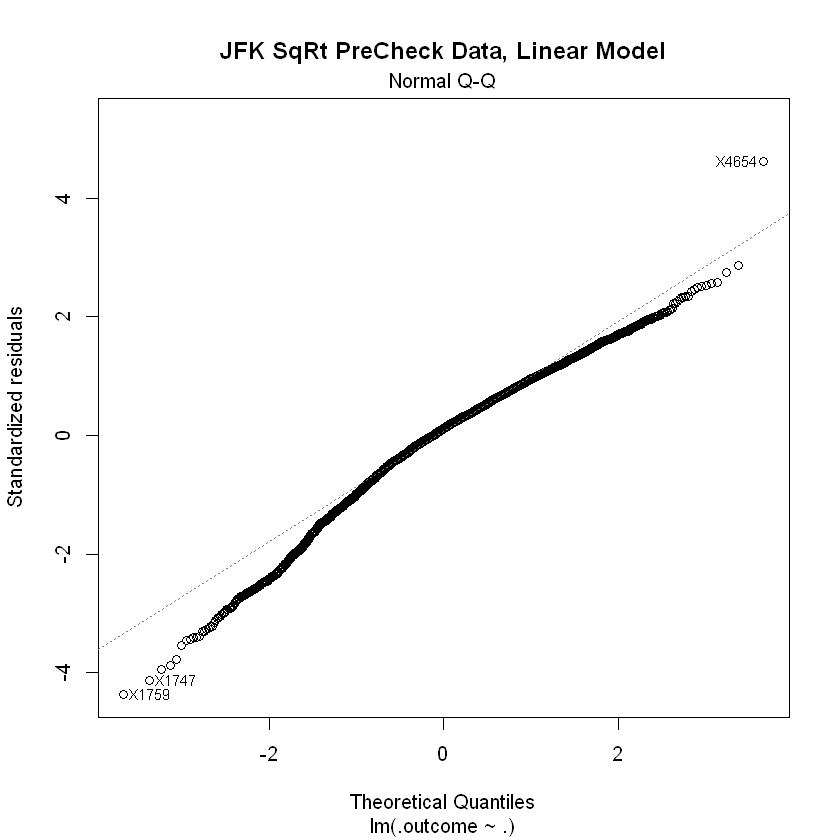

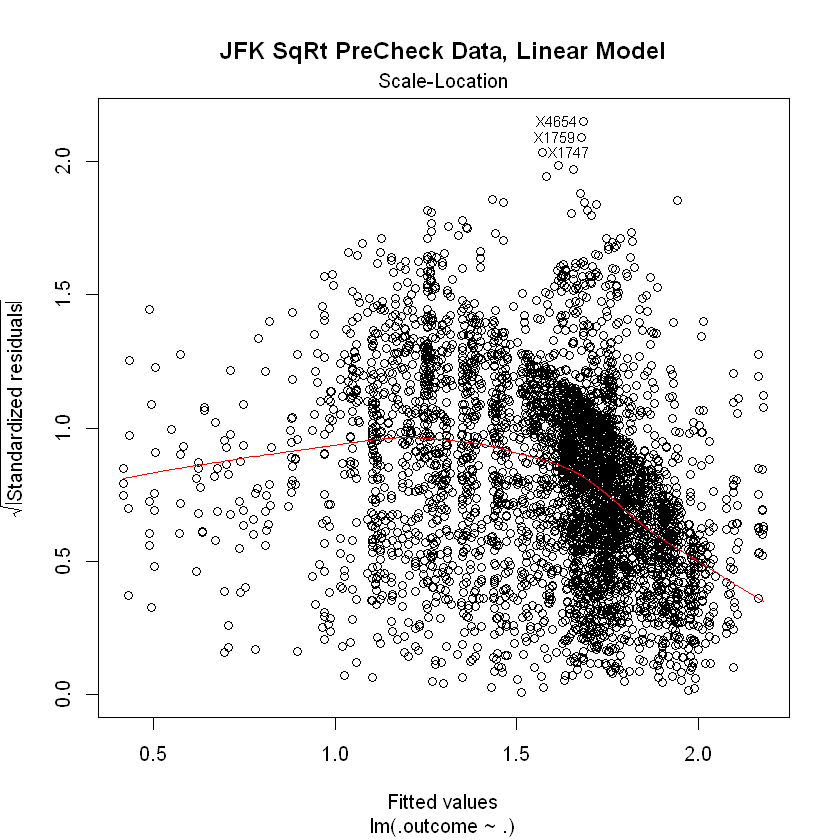

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
"There were missing values in resampled performance measures."


Elastic Net Outputs for JFK SqRt PreCheck


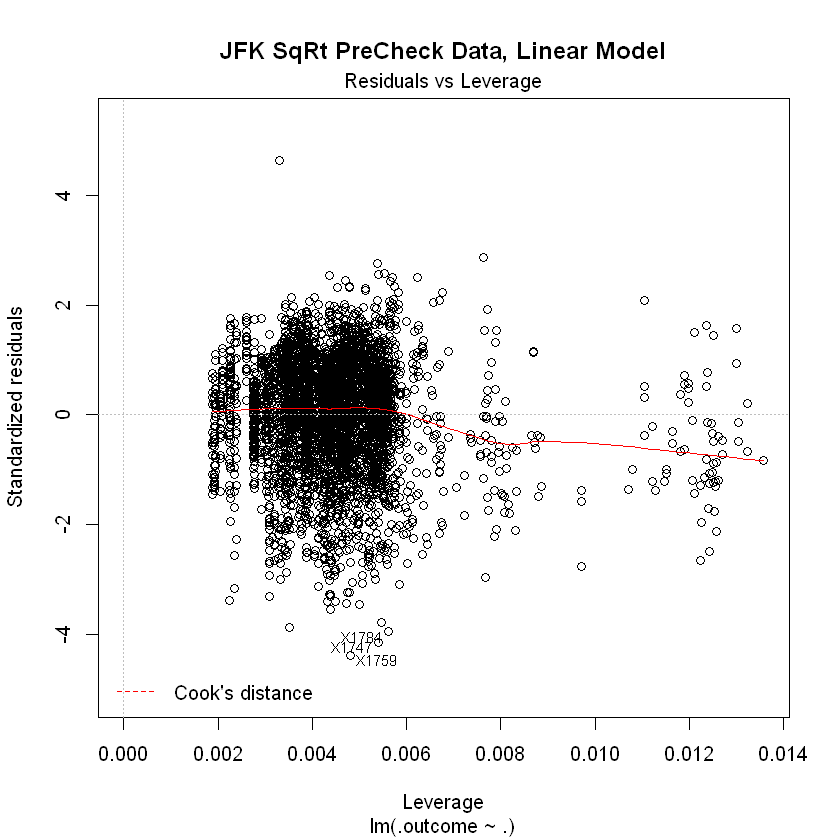

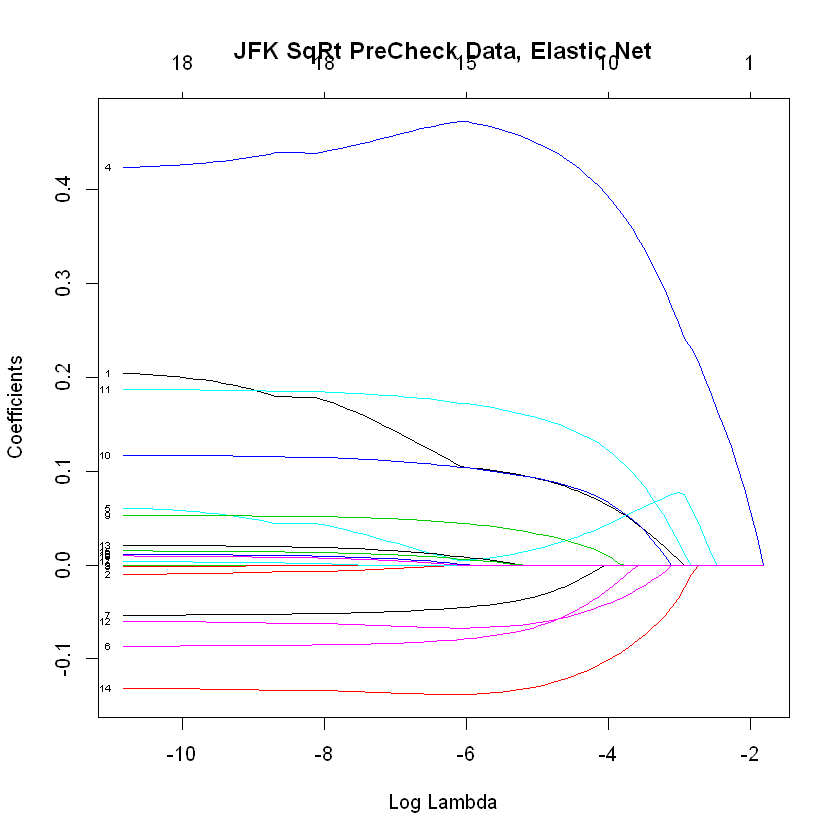

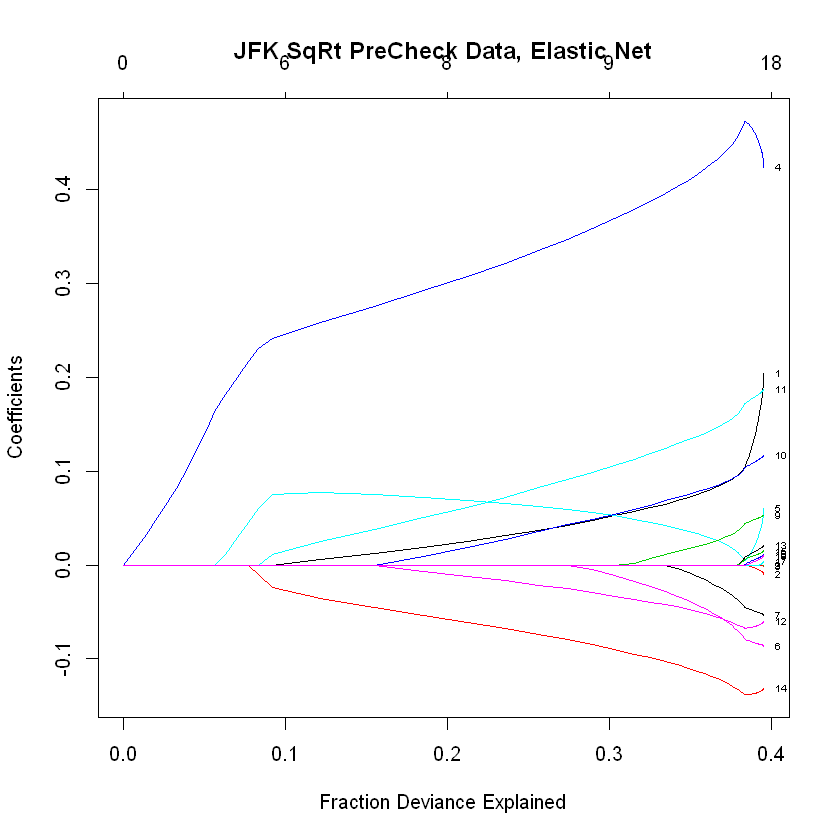


Compare Linear vs Elastic Net Models, JFK SqRt PreCheck


Call:
summary.resamples(object = JFKPreResample)

Models: JFKPreLinear, JFKPreEN 
Number of resamples: 50 

MAE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
JFKPreLinear 0.2520224 0.2695426 0.2750311 0.2759809 0.2831293 0.2937069    0
JFKPreEN     0.2539816 0.2692467 0.2741780 0.2765008 0.2850629 0.2954730    0

RMSE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
JFKPreLinear 0.3146537 0.3473090 0.3548125 0.3541621 0.3628521 0.3798804    0
JFKPreEN     0.3285720 0.3461517 0.3513425 0.3543699 0.3631364 0.3865708    0

Rsquared 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
JFKPreLinear 0.2643883 0.3636346 0.3891442 0.3908538 0.4228222 0.5031854    0
JFKPreEN     0.3197246 0.3587933 0.3883679 0.3905022 0.4158546 0.4801792    0


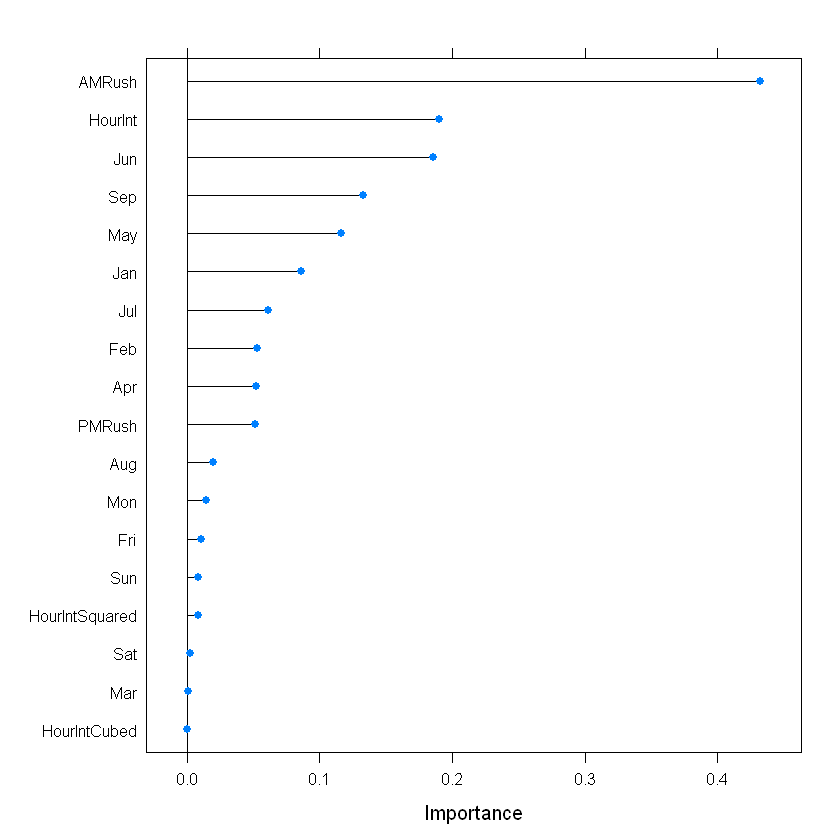

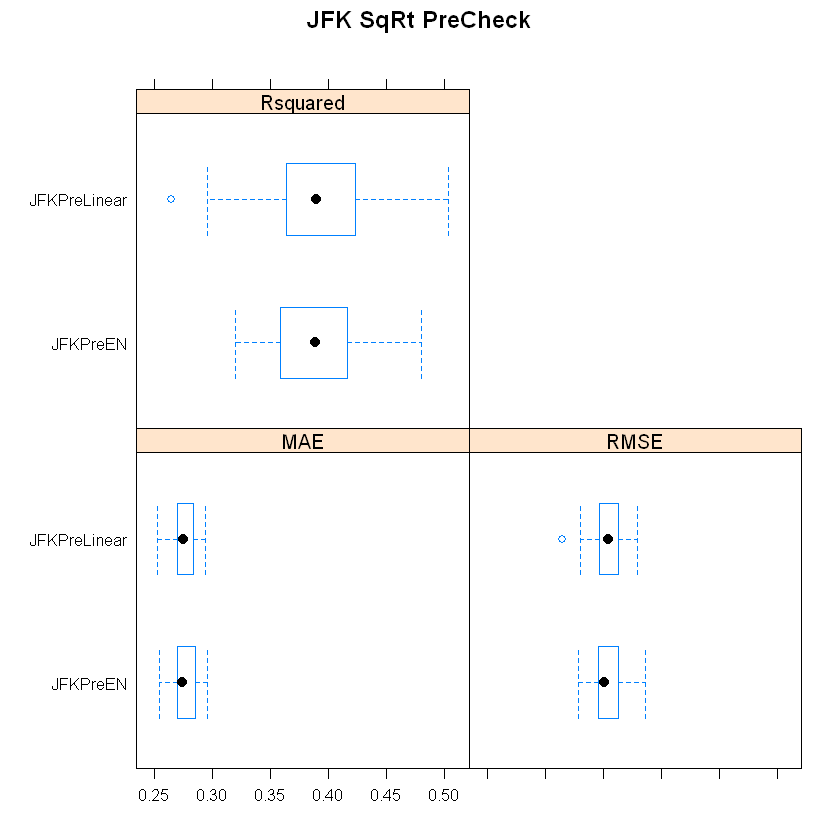


Best Model for Elastic Net JFK SqRt PreCheck


,alpha,lambda
71,0.7777778,1e-04


19 x 1 sparse Matrix of class "dgCMatrix"
                           1
(Intercept)     6.071390e-01
HourInt         1.906324e-01
HourIntSquared -8.329403e-03
HourIntCubed    3.322998e-05
AMRush          4.326145e-01
PMRush          5.143212e-02
Jan            -8.597341e-02
Feb            -5.278946e-02
Mar            -1.036696e-03
Apr             5.241134e-02
May             1.161393e-01
Jun             1.860783e-01
Jul            -6.114251e-02
Aug             2.011962e-02
Sep            -1.326908e-01
Mon             1.452195e-02
Fri             1.070153e-02
Sat             2.914281e-03
Sun             8.853978e-03


Model RMSE of Training Data JFK PreCheck best fit Elastic Net
[1] 0.3528516

Model RMSE of Test Data JFK PreCheck best fit Elastic Net
[1] 0.3502252

Linear Regression Results JFK SqRt PreCheck Training Data Final
  intercept    RMSE  Rsquared      MAE     RMSESD RsquaredSD       MAESD
1      TRUE 0.41842 0.1500202 0.326619 0.01346246  0.0224387 0.008622807



Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.55246 -0.21898  0.07585  0.29798  1.90745 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  1.404754   0.018807  74.693  < 2e-16 ***
HourInt      0.009194   0.001271   7.235 5.50e-13 ***
AMRush       0.450103   0.019924  22.591  < 2e-16 ***
PMRush       0.181061   0.018735   9.664  < 2e-16 ***
Jan         -0.077643   0.023396  -3.319 0.000912 ***
Feb         -0.058723   0.024465  -2.400 0.016427 *  
May          0.094565   0.023270   4.064 4.92e-05 ***
Jun          0.132260   0.023274   5.683 1.42e-08 ***
Jul         -0.116105   0.022596  -5.138 2.90e-07 ***
Sep         -0.172492   0.026021  -6.629 3.81e-11 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.4182 on 4201 degrees of freedom
Multiple R-squared:  0.152,	Adjusted R-squared:  0.1502 
F-statistic: 83.67 on 9 and 4201 DF,  p-value: < 2.2e-16


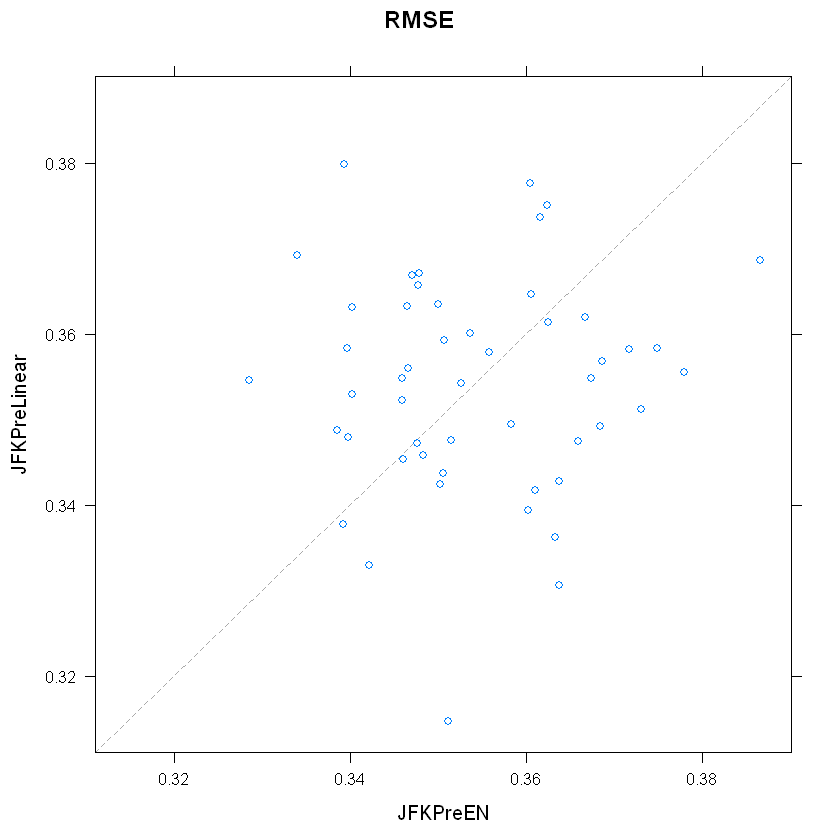

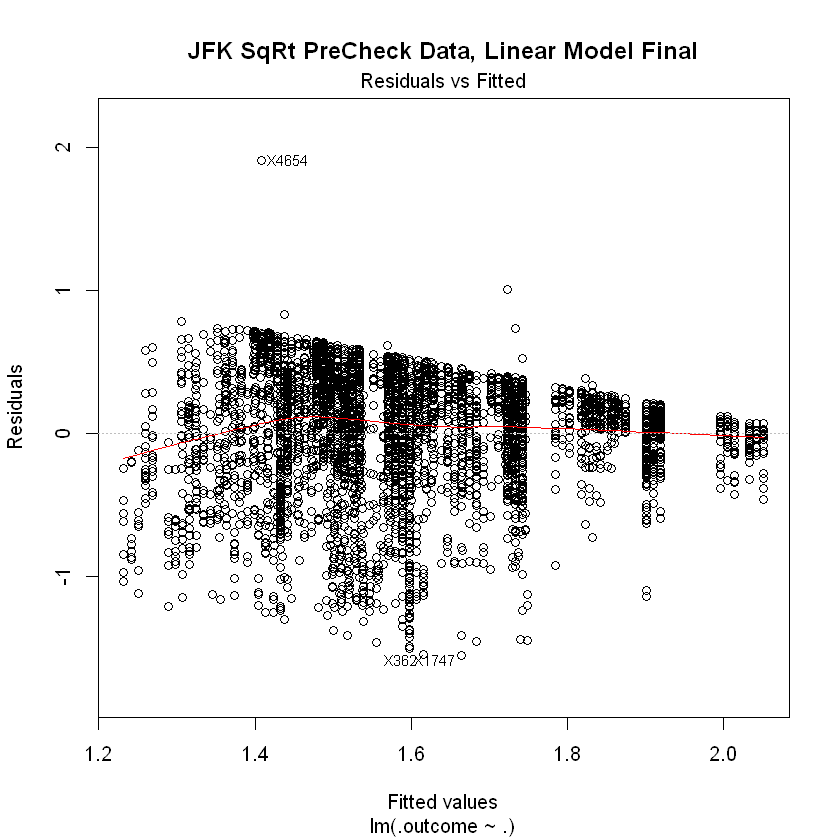

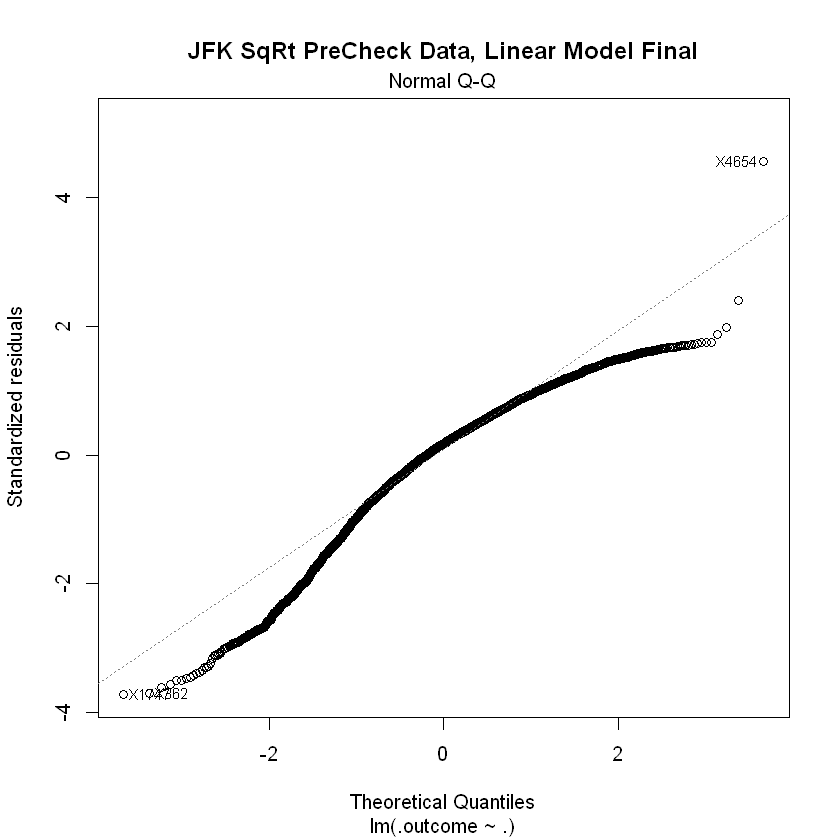

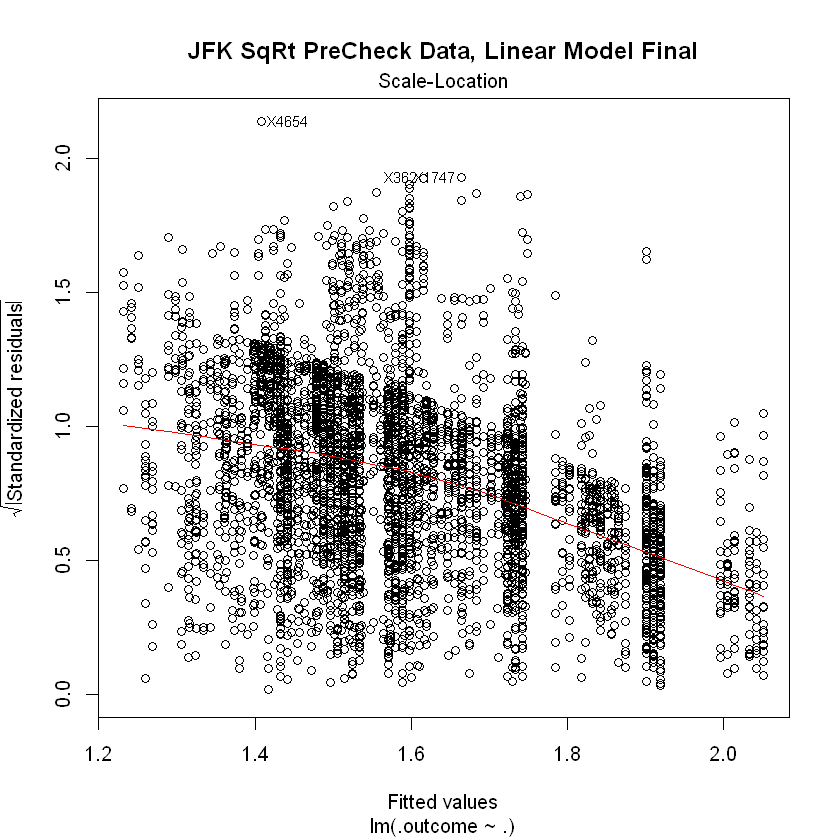

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
"There were missing values in resampled performance measures."


Elastic Net Outputs for JFK SqRt PreCheck Final


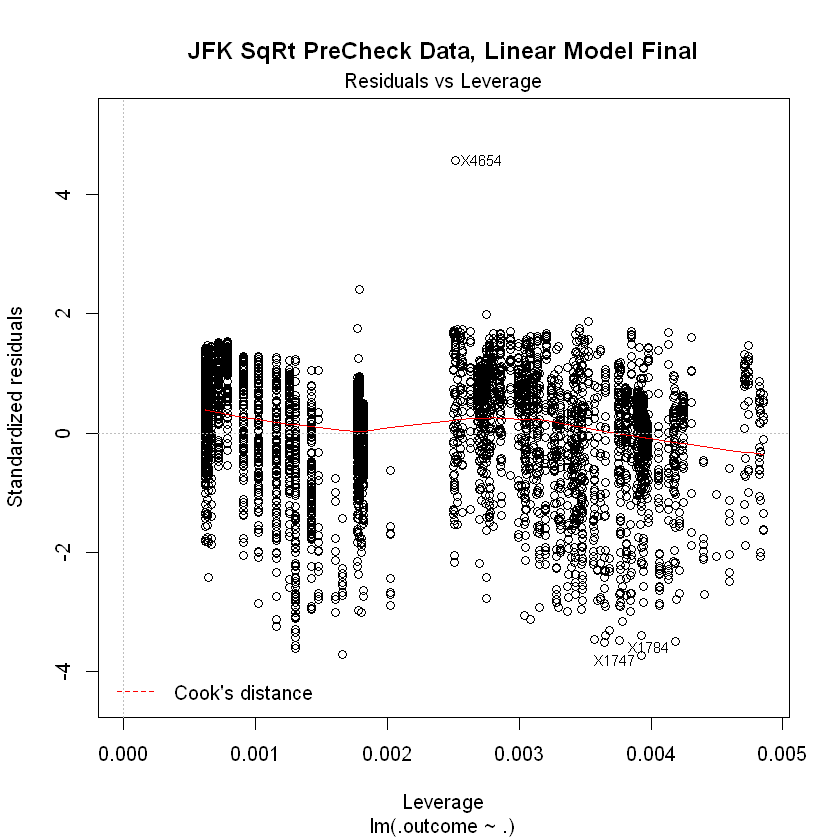

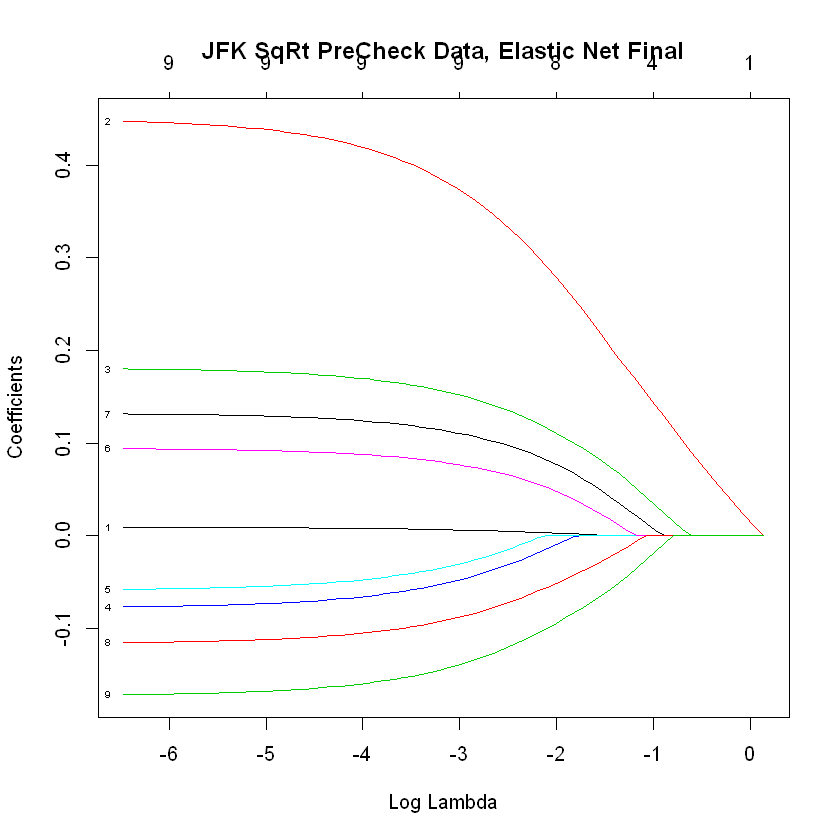

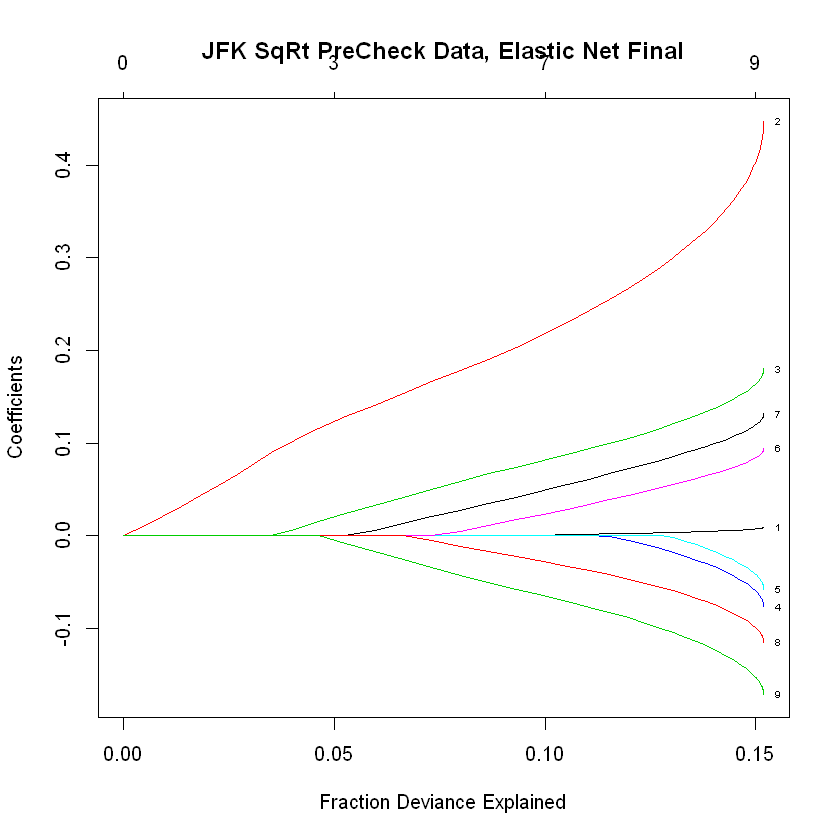


Compare Linear vs Elastic Net Models, JFK SqRt PreCheck Final


Call:
summary.resamples(object = JFKPreResampleFinal)

Models: JFKPreLinearFinal, JFKPreENFinal 
Number of resamples: 50 

MAE 
                       Min.   1st Qu.    Median     Mean   3rd Qu.      Max.
JFKPreLinearFinal 0.3109421 0.3207378 0.3256084 0.326619 0.3333342 0.3456072
JFKPreENFinal     0.3080402 0.3198556 0.3268509 0.326722 0.3320943 0.3489076
                  NA's
JFKPreLinearFinal    0
JFKPreENFinal        0

RMSE 
                       Min.   1st Qu.    Median      Mean   3rd Qu.      Max.
JFKPreLinearFinal 0.3911519 0.4079438 0.4180555 0.4184200 0.4278993 0.4505006
JFKPreENFinal     0.3935088 0.4073218 0.4157475 0.4184539 0.4273493 0.4602476
                  NA's
JFKPreLinearFinal    0
JFKPreENFinal        0

Rsquared 
                       Min.   1st Qu.    Median      Mean   3rd Qu.      Max.
JFKPreLinearFinal 0.1030359 0.1362761 0.1456233 0.1500202 0.1651423 0.1950532
JFKPreENFinal     0.1045154 0.1359905 0.1483015 0.1494239 0.1704904 0.1915115
                

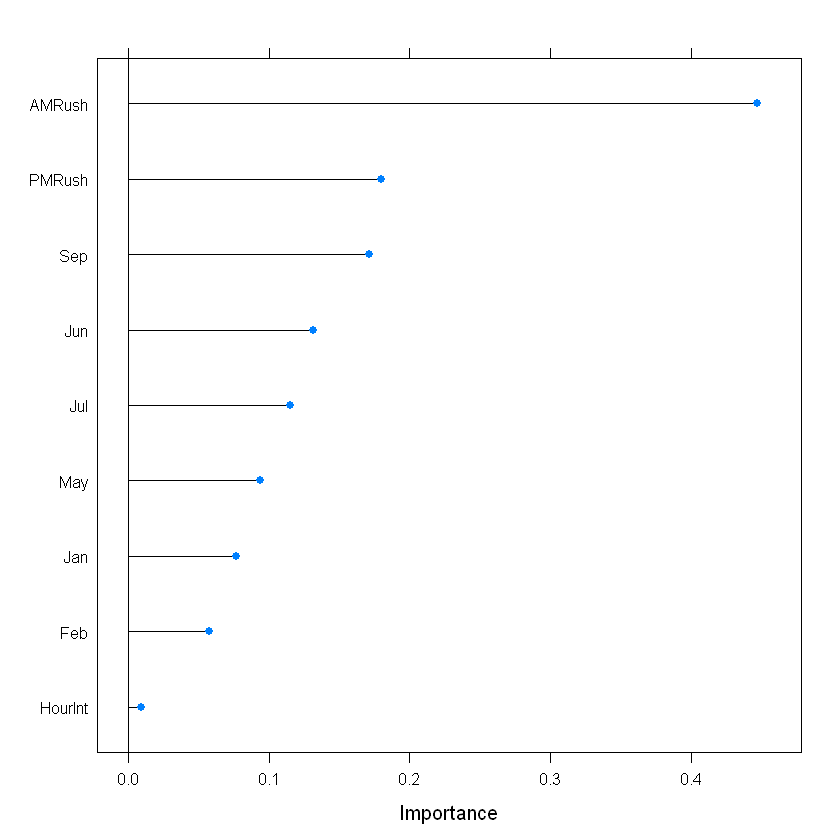

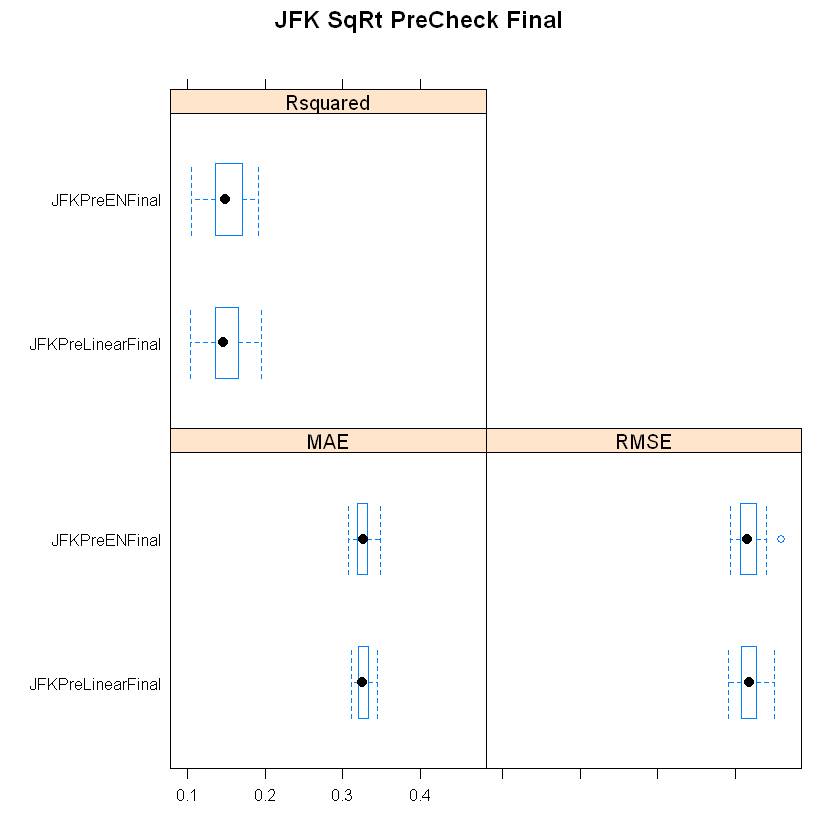


Best Model for Elastic Net JFK SqRt PreCheck Final


,alpha,lambda
11,0.1111111,1e-04


10 x 1 sparse Matrix of class "dgCMatrix"
                       1
(Intercept)  1.406409388
HourInt      0.009082636
AMRush       0.447329417
PMRush       0.180097469
Jan         -0.076568938
Feb         -0.057708402
May          0.093989224
Jun          0.131549790
Jul         -0.115131208
Sep         -0.171356277


Model RMSE of Training Data JFK PreCheck best fit Elastic Net Final
[1] 0.4176838

Model RMSE of Test Data JFK PreCheck best fit Elastic Net Final
[1] 0.4042021

Dataset for JFK SqRt Regular
'data.frame':	7320 obs. of  19 variables:
 $ WaitTimeContinuousSqRt: num  1.193 0.916 1.074 4.409 4.326 ...
 $ HourInt               : int  0 1 2 3 4 5 6 7 8 9 ...
 $ HourIntSquared        : int  0 1 4 9 16 25 36 49 64 81 ...
 $ HourIntCubed          : int  0 1 8 27 64 125 216 343 512 729 ...
 $ AMRush                : int  0 0 0 0 0 1 1 1 0 0 ...
 $ PMRush                : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jan                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Feb                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Mar                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Apr                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ May                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jun                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jul                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Aug    


Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3425 -0.4755 -0.0374  0.4462  2.9996 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     1.3395038  0.0385017  34.791  < 2e-16 ***
HourInt         0.3799035  0.0145662  26.081  < 2e-16 ***
HourIntSquared -0.0168788  0.0015770 -10.703  < 2e-16 ***
HourIntCubed    0.0001478  0.0000455   3.249  0.00117 ** 
AMRush          0.7830419  0.0337811  23.180  < 2e-16 ***
PMRush         -0.0281481  0.0336600  -0.836  0.40305    
Jan            -0.2139382  0.0361700  -5.915 3.54e-09 ***
Feb            -0.1785118  0.0388481  -4.595 4.43e-06 ***
Mar            -0.1012005  0.0365089  -2.772  0.00559 ** 
Apr            -0.2745343  0.0375010  -7.321 2.85e-13 ***
May            -0.2227827  0.0365992  -6.087 1.23e-09 ***
Jun            -0.1588180  0.0372686  -4.261 2.07e-05 ***
Jul             0.0268532  0.0366865   0.732  0.46422    
Aug             0.1159891  0.0367

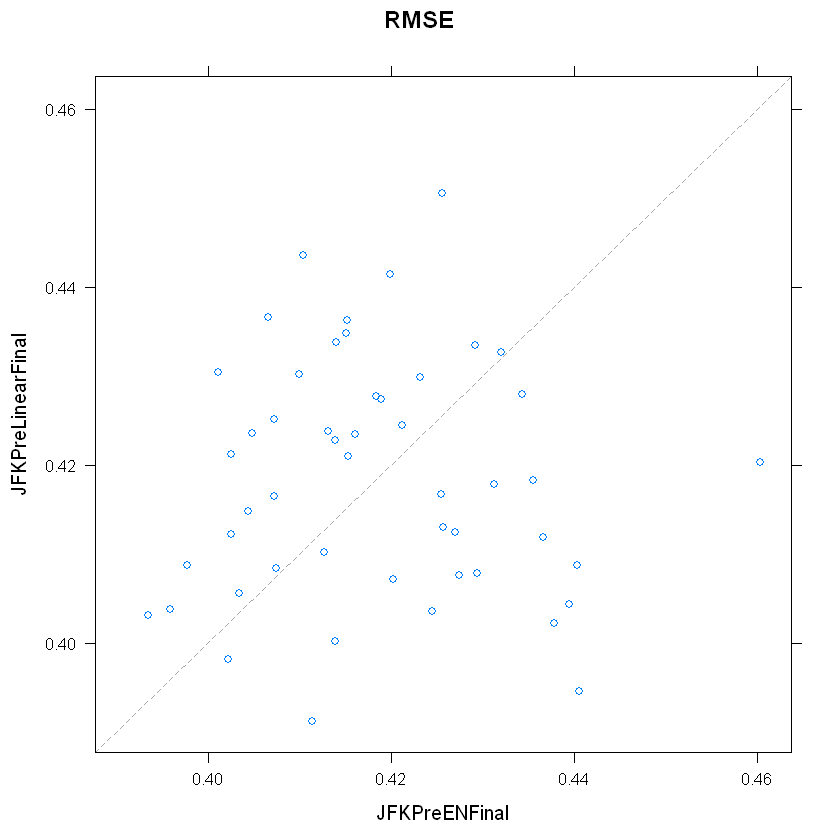

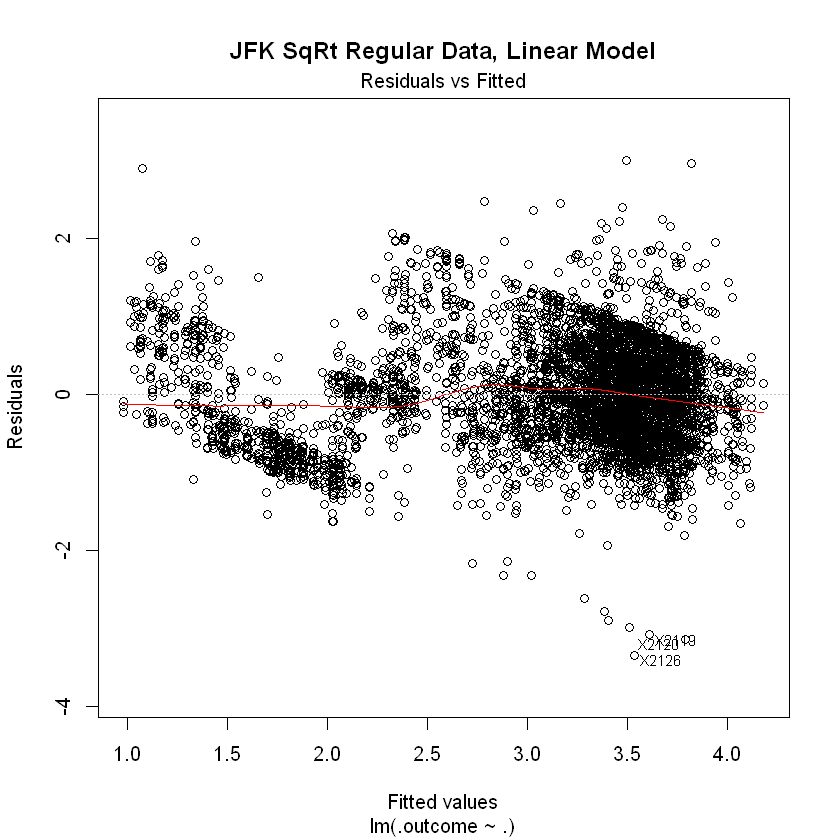

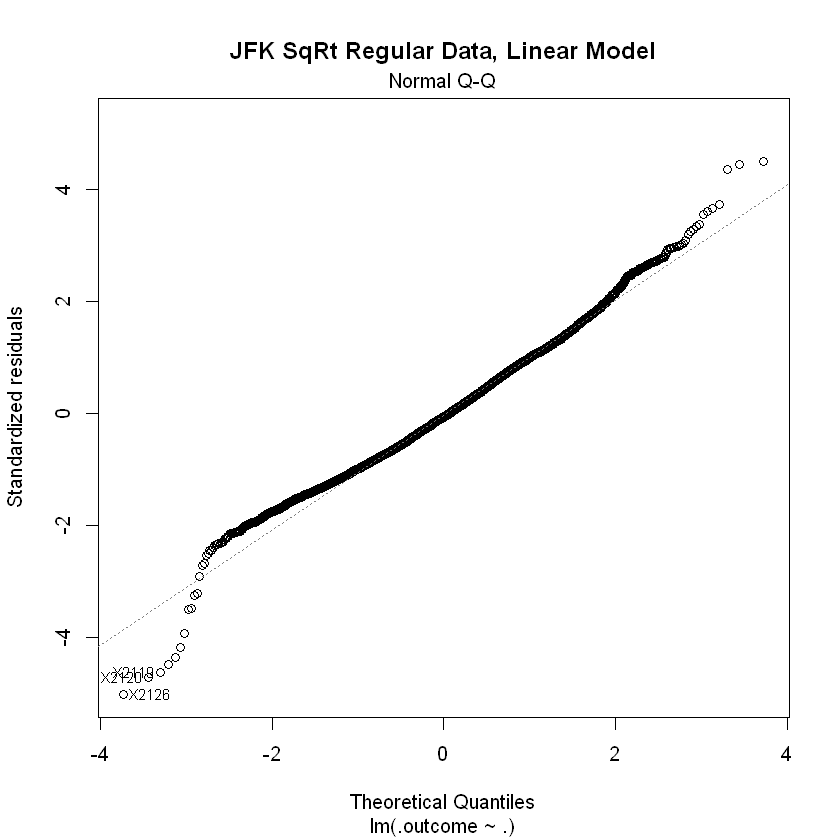

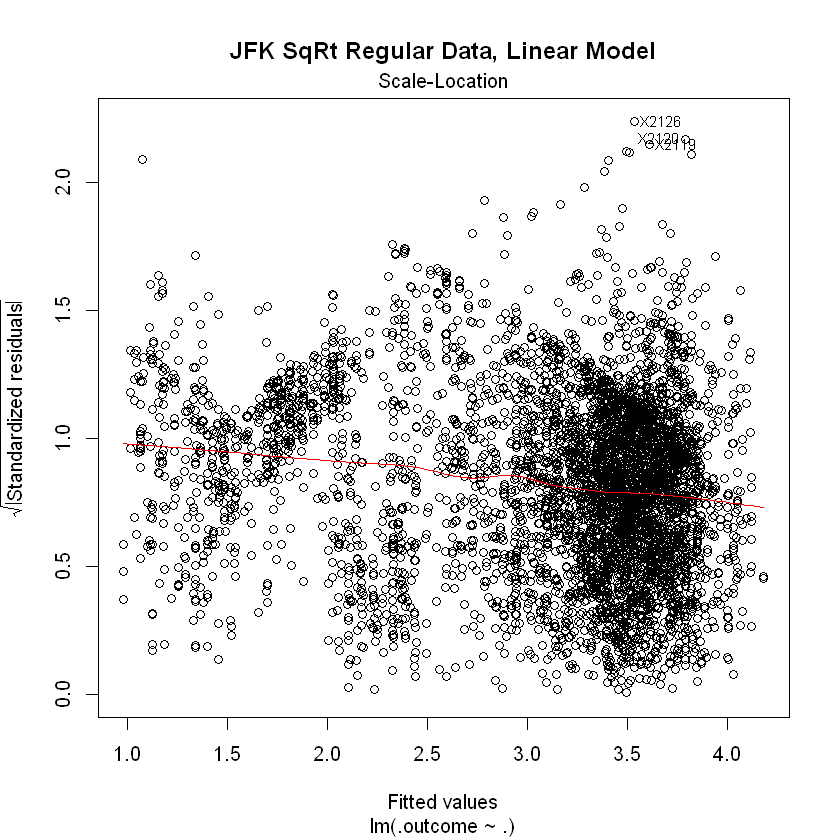

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
"There were missing values in resampled performance measures."


Elastic Net Outputs for JFK SqRt Regular


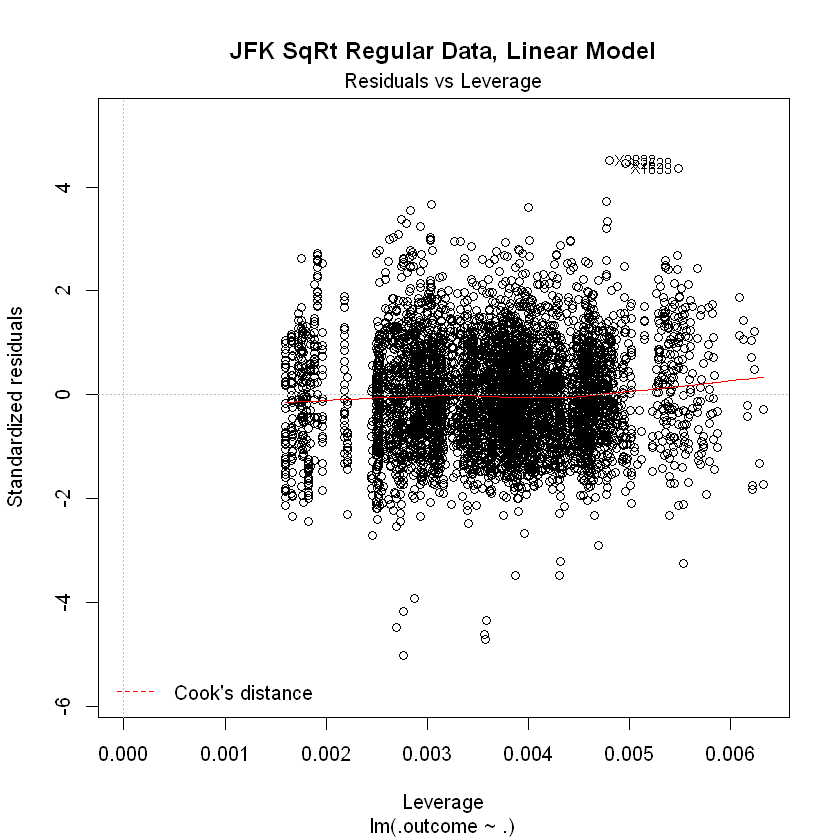

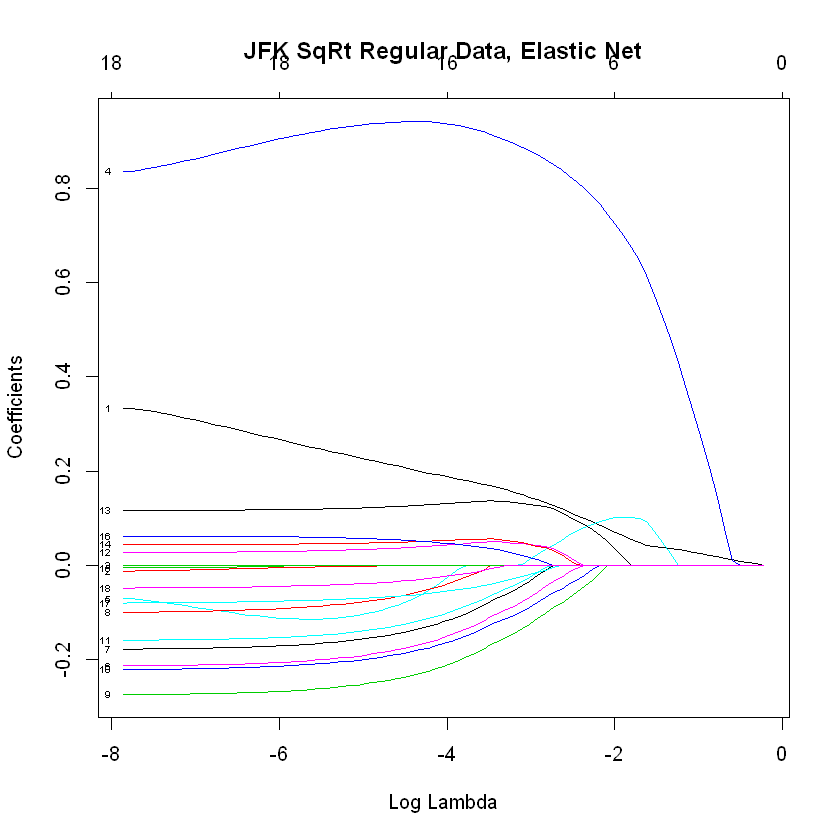

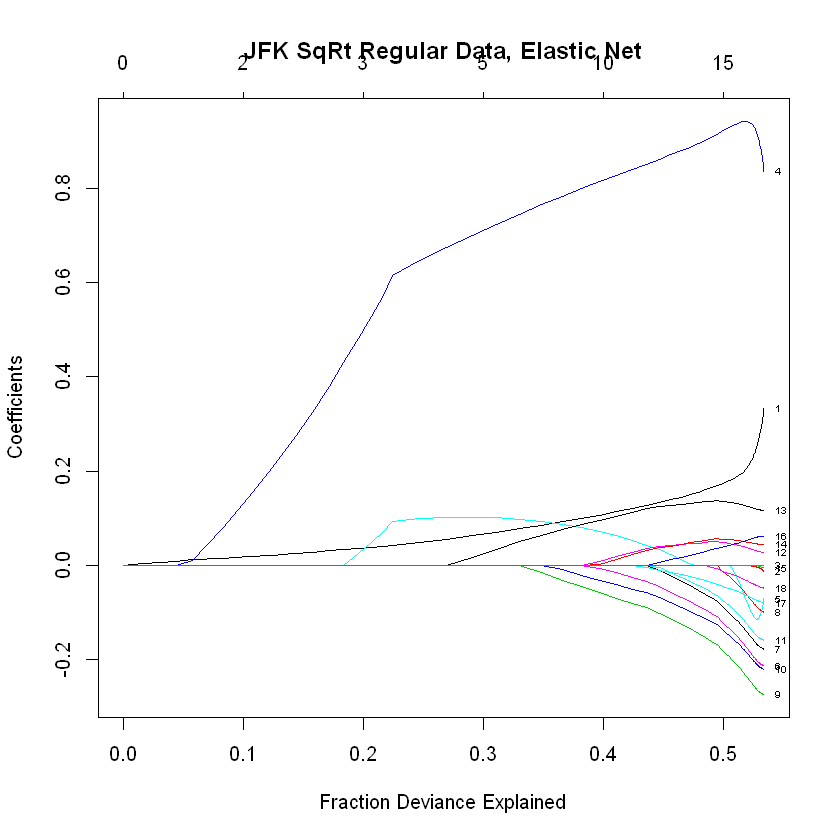


Compare Linear vs Elastic Net Models, JFK SqRt Regular


Call:
summary.resamples(object = JFKRegResample)

Models: JFKRegLinear, JFKRegEN 
Number of resamples: 50 

MAE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
JFKRegLinear 0.4940950 0.5238238 0.5311028 0.5315876 0.5400824 0.5713475    0
JFKRegEN     0.4989695 0.5193978 0.5340674 0.5320614 0.5440010 0.5559999    0

RMSE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
JFKRegLinear 0.6043036 0.6549237 0.6664855 0.6680359 0.6761497 0.7365638    0
JFKRegEN     0.6339441 0.6555776 0.6694406 0.6687270 0.6835617 0.7180321    0

Rsquared 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
JFKRegLinear 0.4610454 0.5145623 0.5332614 0.5327134 0.5554343 0.5986882    0
JFKRegEN     0.4762956 0.5086036 0.5343678 0.5315746 0.5541992 0.5940837    0


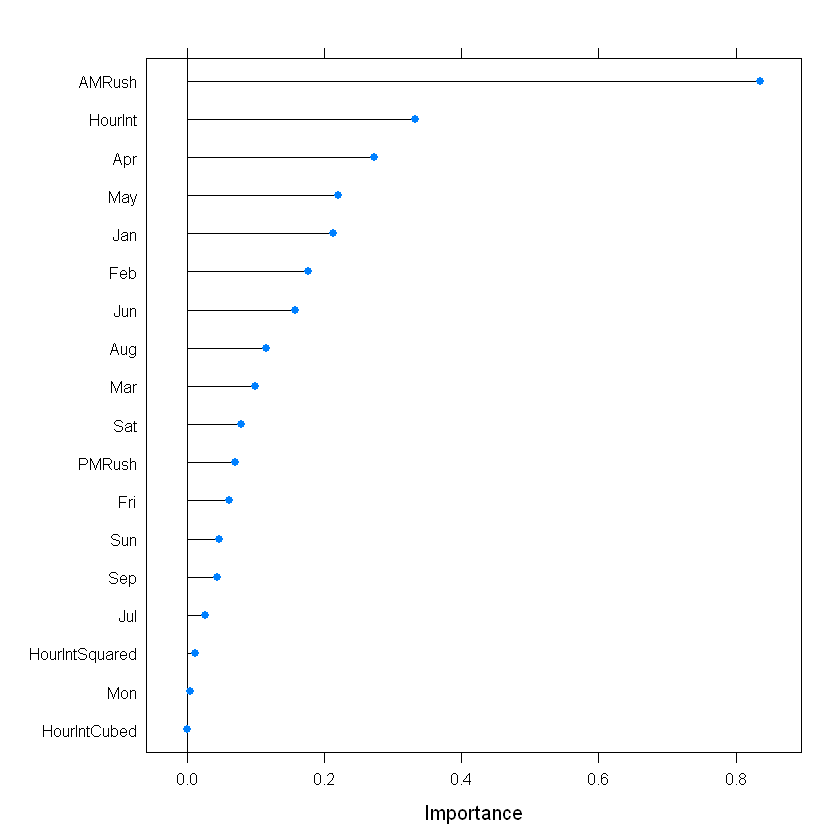

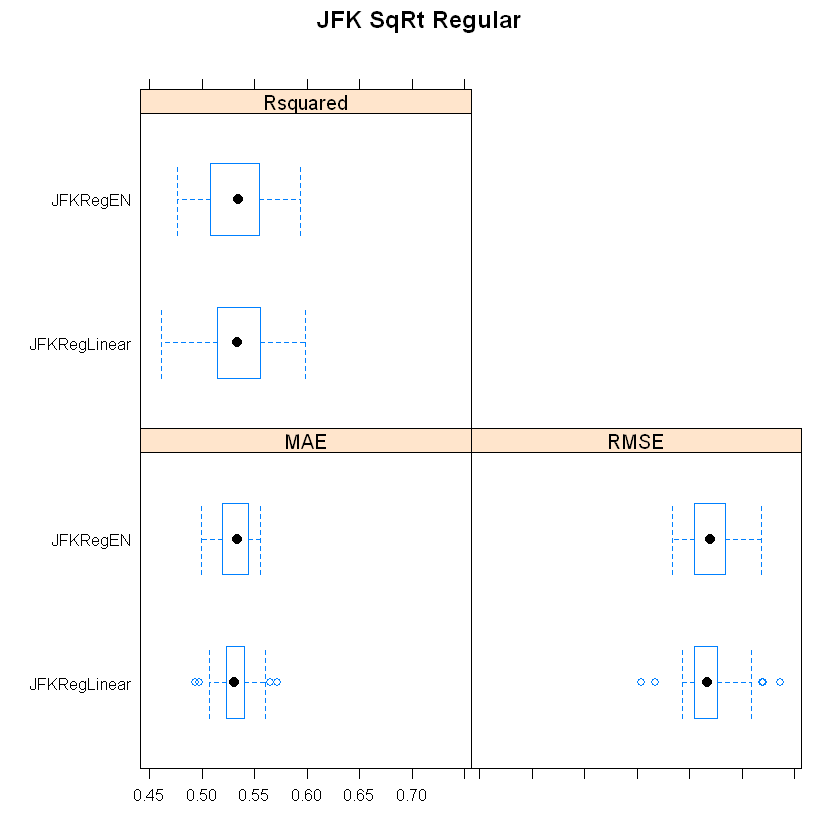


Best Model for Elastic Net JFK SqRt Regular


,alpha,lambda
41,0.4444444,1e-04


19 x 1 sparse Matrix of class "dgCMatrix"
                           1
(Intercept)     1.411672e+00
HourInt         3.324775e-01
HourIntSquared -1.166297e-02
HourIntCubed    2.265555e-08
AMRush          8.362214e-01
PMRush         -7.077295e-02
Jan            -2.127853e-01
Feb            -1.772507e-01
Mar            -9.919595e-02
Apr            -2.738240e-01
May            -2.208157e-01
Jun            -1.584037e-01
Jul             2.743693e-02
Aug             1.164676e-01
Sep             4.433473e-02
Mon            -5.083652e-03
Fri             6.143790e-02
Sat            -7.950362e-02
Sun            -4.778355e-02


Model RMSE of Training Data JFK Regular best fit Elastic Net
[1] 0.6666913

Model RMSE of Test Data JFK Regular best fit Elastic Net
[1] 0.6779726

Linear Regression Results JFK SqRt Regular Training Data Final
  intercept      RMSE  Rsquared       MAE     RMSESD RsquaredSD      MAESD
1      TRUE 0.8316373 0.2760373 0.6584262 0.02164205 0.03610041 0.01930891



Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.1159 -0.5170  0.0449  0.5627  3.4463 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  2.32902    0.02896  80.437  < 2e-16 ***
HourInt      0.06721    0.00175  38.404  < 2e-16 ***
AMRush       1.09695    0.03648  30.071  < 2e-16 ***
Jan         -0.23830    0.04195  -5.681 1.41e-08 ***
Feb         -0.21617    0.04550  -4.751 2.08e-06 ***
Mar         -0.12797    0.04240  -3.019  0.00255 ** 
Apr         -0.28577    0.04372  -6.537 6.89e-11 ***
May         -0.26438    0.04250  -6.220 5.35e-10 ***
Jun         -0.19951    0.04340  -4.597 4.39e-06 ***
Aug          0.11907    0.04265   2.792  0.00526 ** 
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.8312 on 5154 degrees of freedom
Multiple R-squared:  0.2774,	Adjusted R-squared:  0.2761 
F-statistic: 219.8 on 9 and 5154 DF,  p-value: < 2.2e-16


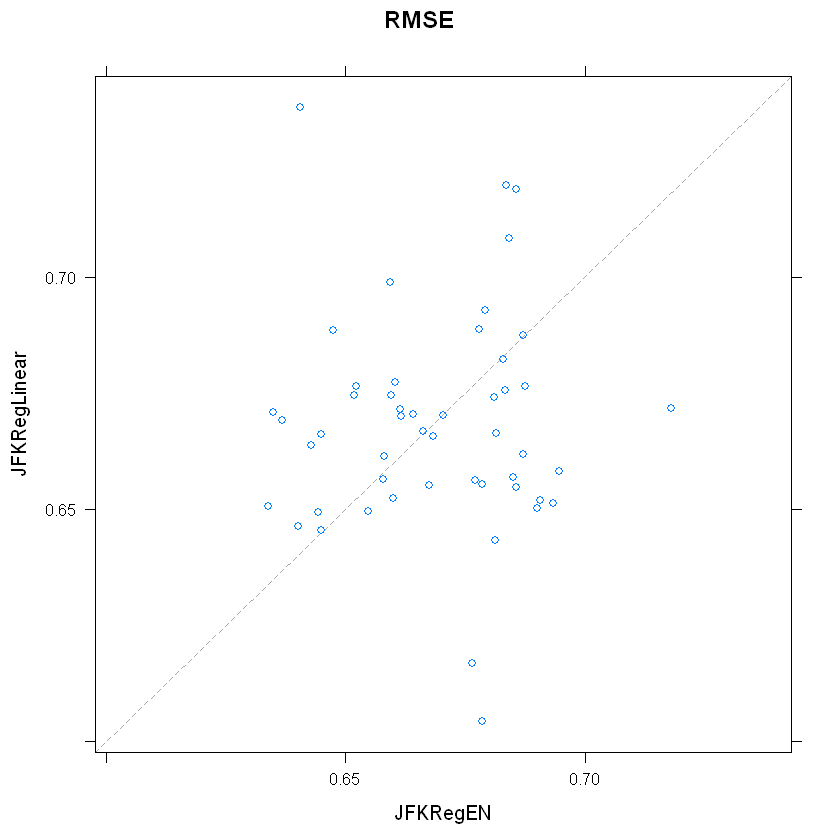

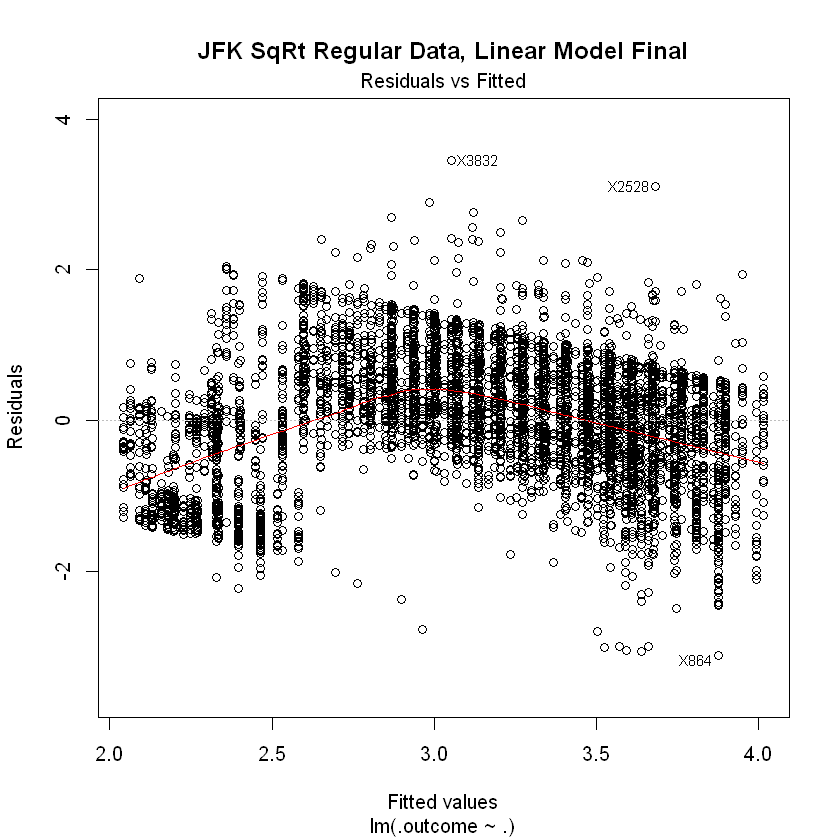

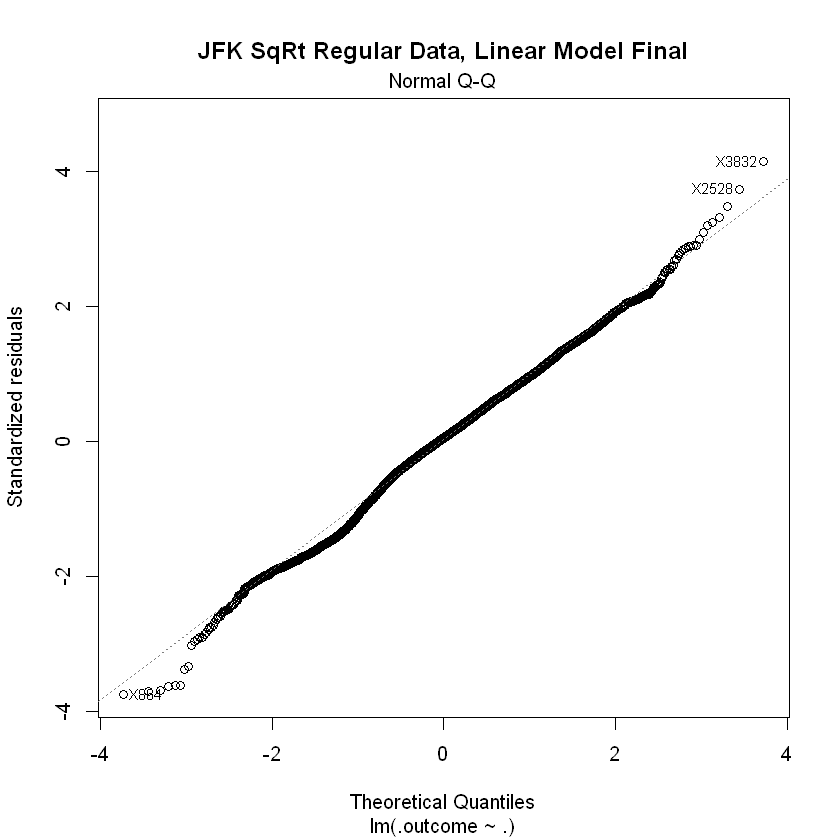

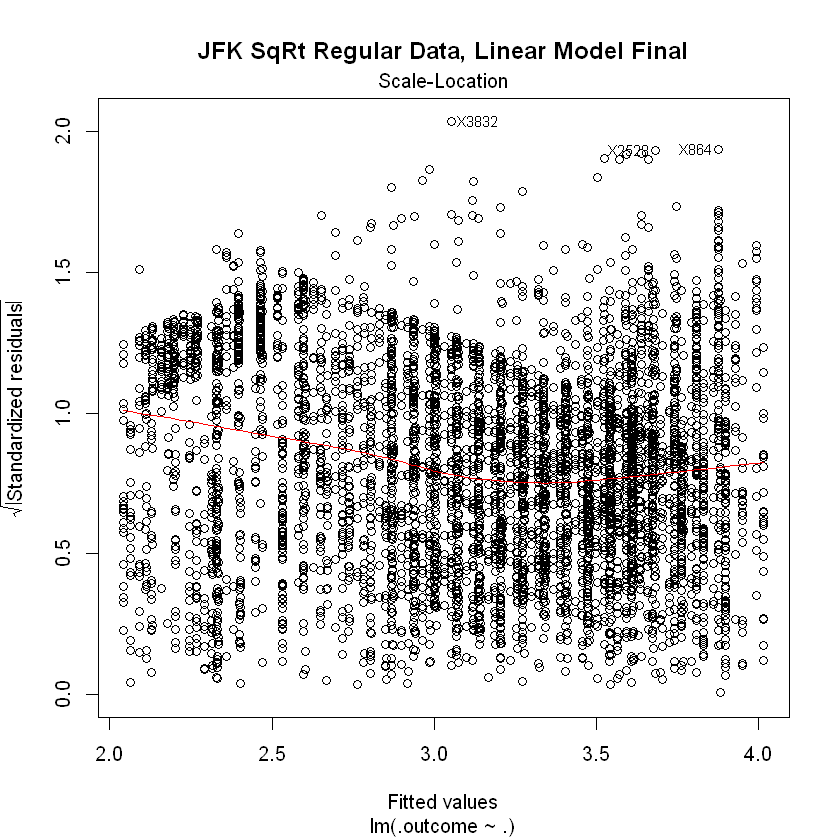


Dataset for EWR SqRt PreCheck
'data.frame':	5185 obs. of  19 variables:
 $ WaitTimeContinuousSqRt: num  1.63 1.61 1.95 0.85 1.61 ...
 $ HourInt               : int  5 6 7 8 9 10 11 12 13 14 ...
 $ HourIntSquared        : int  25 36 49 64 81 100 121 144 169 196 ...
 $ HourIntCubed          : int  125 216 343 512 729 1000 1331 1728 2197 2744 ...
 $ AMRush                : int  1 1 1 0 0 0 0 0 0 0 ...
 $ PMRush                : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jan                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Feb                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Mar                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Apr                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ May                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jun                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jul                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Aug                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Sep                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Mon                   : int  0 0 0


Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.2008 -0.2262  0.0016  0.2321  2.9187 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     1.059e-02  6.459e-02   0.164 0.869715    
HourInt         2.867e-01  2.115e-02  13.559  < 2e-16 ***
HourIntSquared -1.715e-02  2.062e-03  -8.316  < 2e-16 ***
HourIntCubed    2.682e-04  5.915e-05   4.534 5.97e-06 ***
AMRush          5.953e-01  1.936e-02  30.747  < 2e-16 ***
PMRush          2.100e-01  1.915e-02  10.965  < 2e-16 ***
Jan            -7.733e-02  2.271e-02  -3.406 0.000667 ***
Feb            -4.365e-02  2.370e-02  -1.842 0.065581 .  
Mar             4.394e-02  2.290e-02   1.919 0.055051 .  
Apr             1.170e-01  2.266e-02   5.162 2.58e-07 ***
May             1.760e-01  2.229e-02   7.893 3.88e-15 ***
Jun             3.034e-01  2.290e-02  13.246  < 2e-16 ***
Jul             2.867e-01  2.269e-02  12.633  < 2e-16 ***
Aug             2.747e-01  2.239e

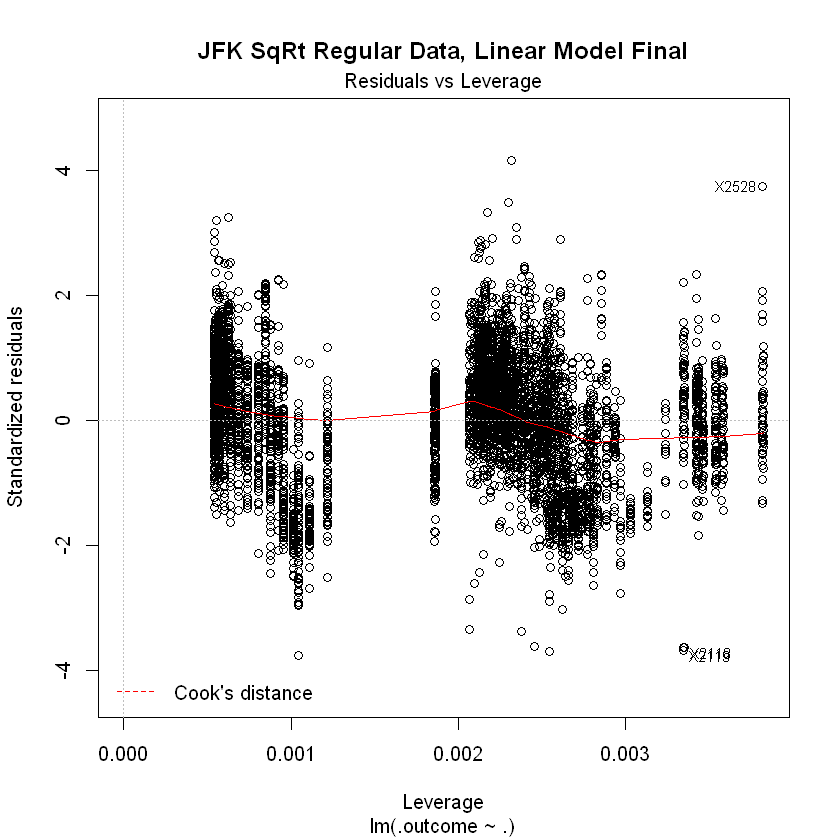

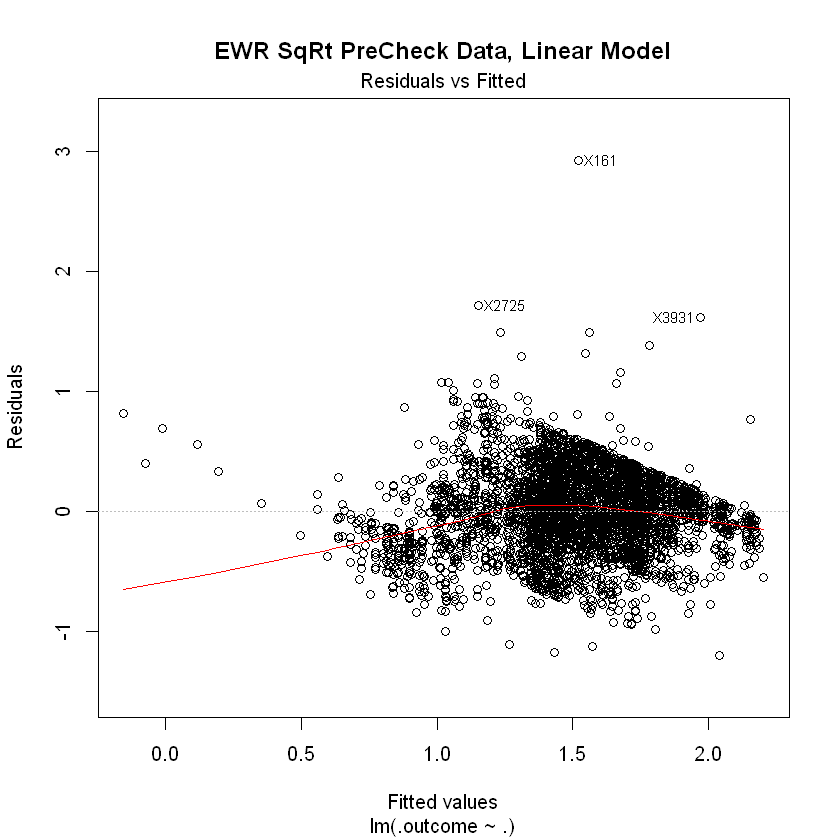

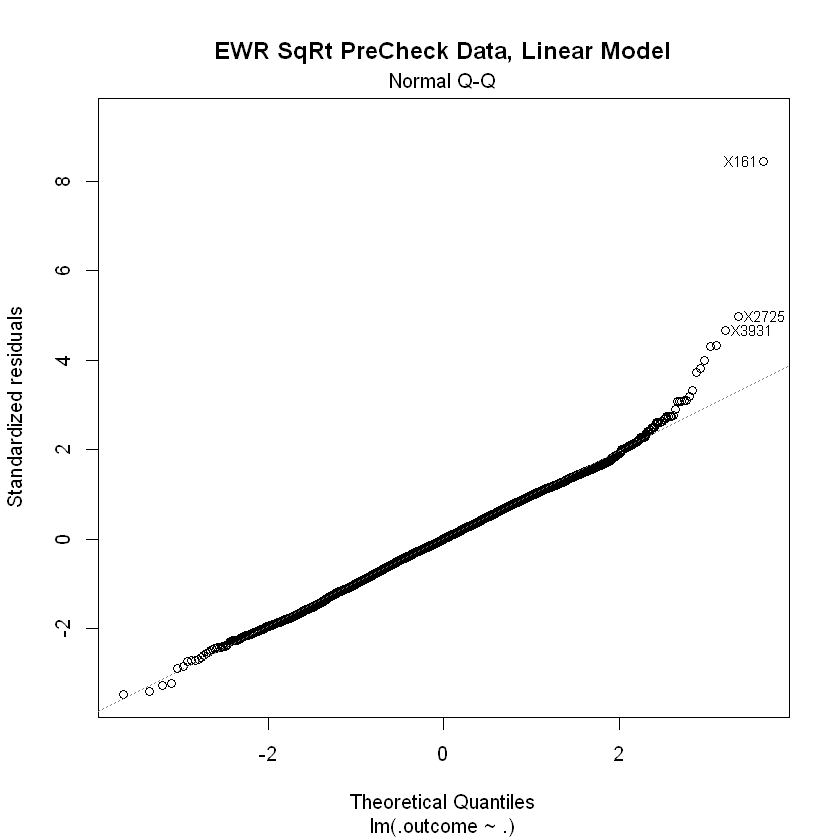

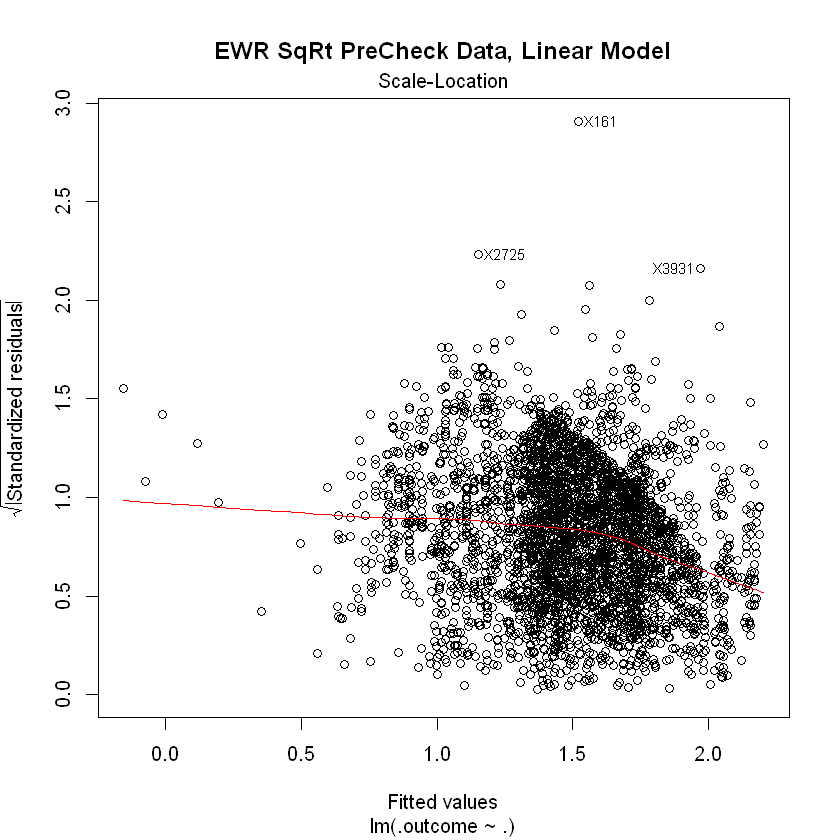

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
"There were missing values in resampled performance measures."


Elastic Net Outputs for EWR SqRt PreCheck


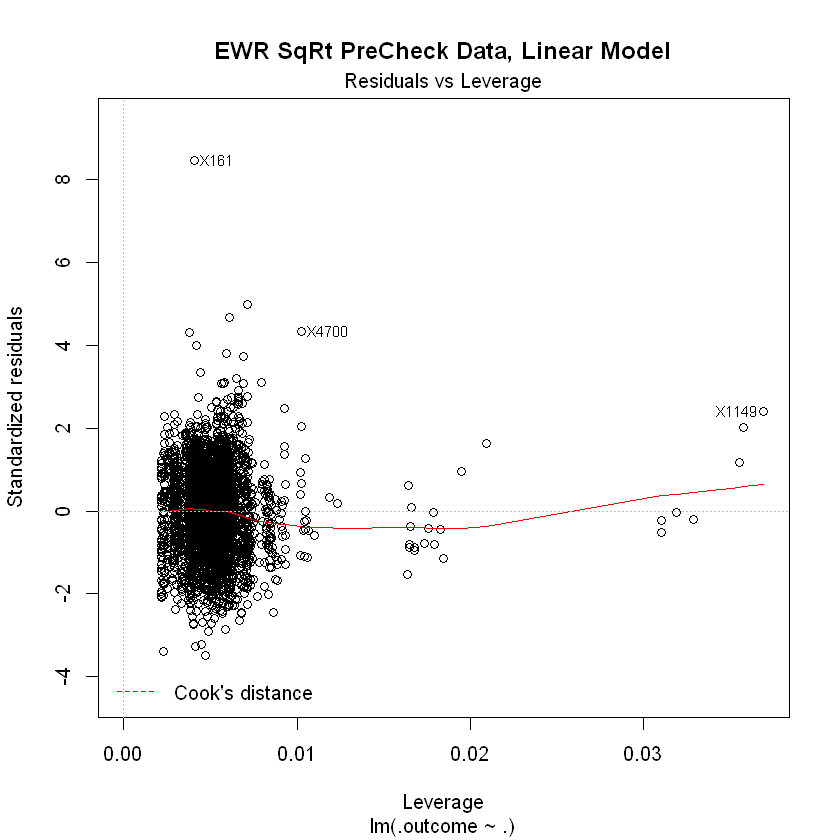

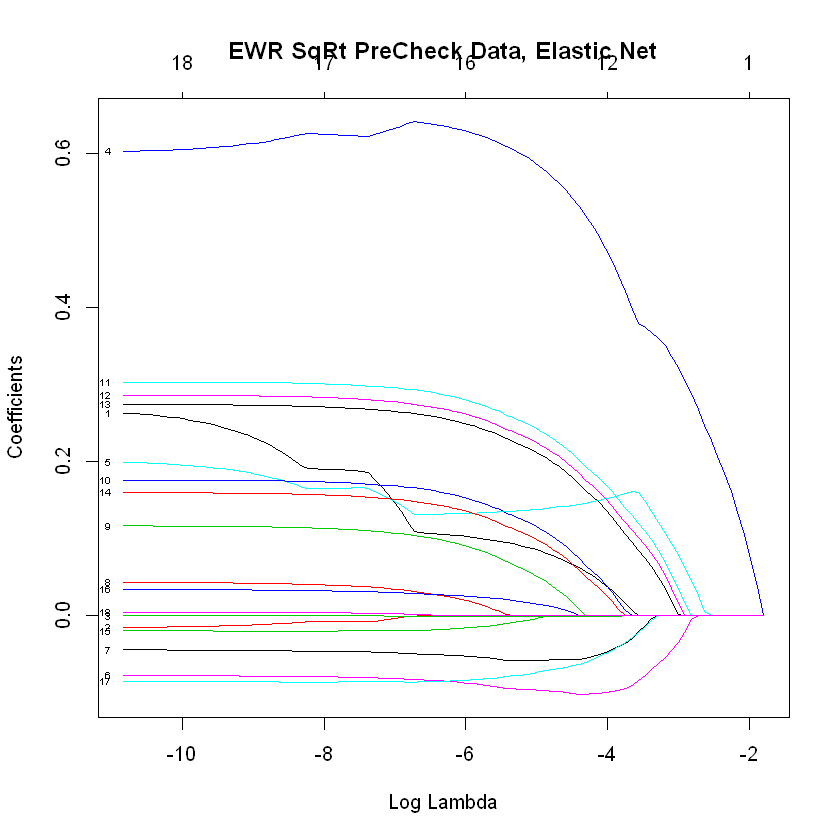

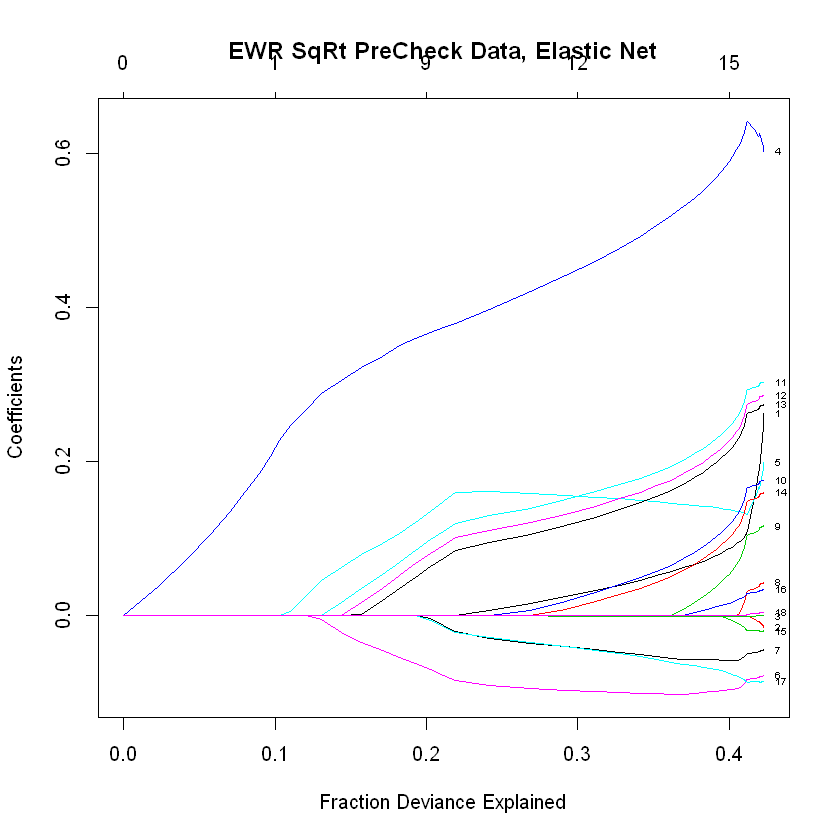


Compare Linear vs Elastic Net Models, EWR SqRt PreCheck


Call:
summary.resamples(object = EWRPreResample)

Models: EWRPreLinear, EWRPreEN 
Number of resamples: 50 

MAE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
EWRPreLinear 0.2422157 0.2677504 0.2718325 0.2727140 0.2794566 0.2993396    0
EWRPreEN     0.2564186 0.2644393 0.2723179 0.2730125 0.2811245 0.2956733    0

RMSE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
EWRPreLinear 0.3041966 0.3354830 0.3444122 0.3462835 0.3578240 0.3921058    0
EWRPreEN     0.3201368 0.3345876 0.3446127 0.3467876 0.3560979 0.3849960    0

Rsquared 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
EWRPreLinear 0.2771666 0.3925653 0.4241970 0.4192520 0.4496365 0.5144769    0
EWRPreEN     0.2932366 0.3977193 0.4208061 0.4174599 0.4466184 0.5015052    0


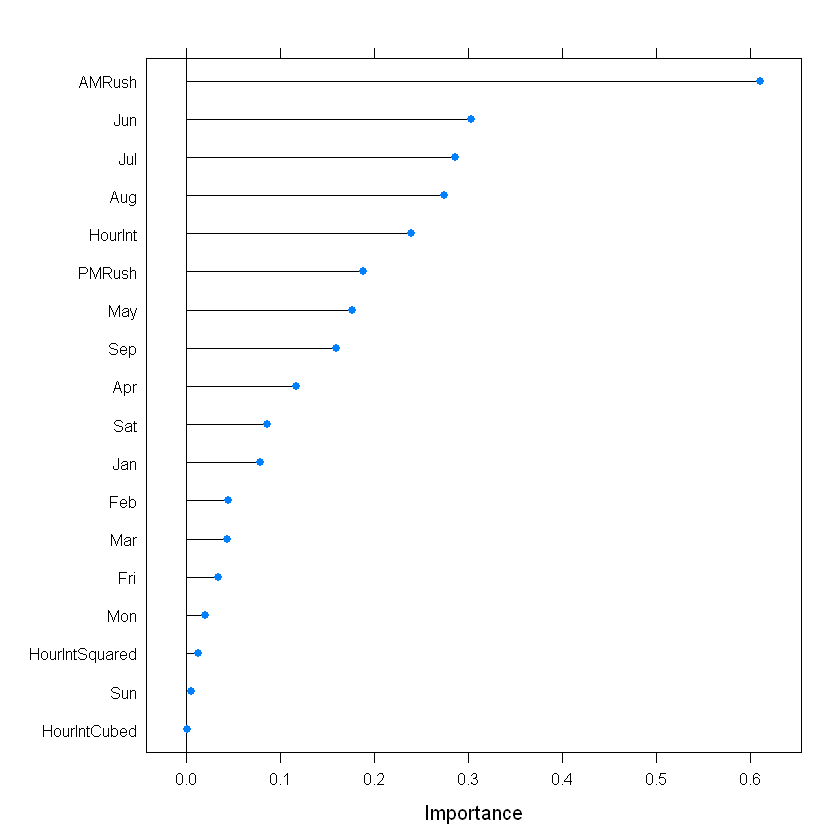

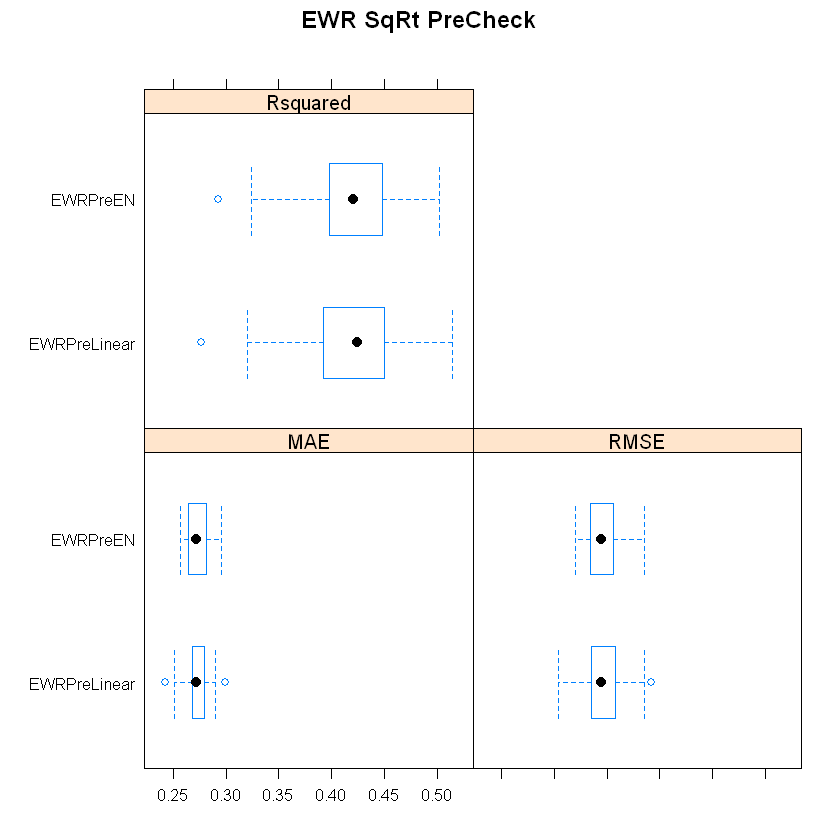


Best Model for Elastic Net EWR SqRt PreCheck


,alpha,lambda
91,1,1e-04


19 x 1 sparse Matrix of class "dgCMatrix"
                           1
(Intercept)     0.1401771526
HourInt         0.2389688220
HourIntSquared -0.0124329841
HourIntCubed    0.0001341586
AMRush          0.6106701586
PMRush          0.1879836618
Jan            -0.0778802922
Feb            -0.0446408458
Mar             0.0427276643
Apr             0.1160434982
May             0.1756220250
Jun             0.3029563017
Jul             0.2857573115
Aug             0.2736056403
Sep             0.1592270758
Mon            -0.0195732419
Fri             0.0338620076
Sat            -0.0853596551
Sun             0.0046660859


Model RMSE of Training Data EWR PreCheck best fit Elastic Net
[1] 0.3453207

Model RMSE of Test Data EWR PreCheck best fit Elastic Net
[1] 0.3538335

Linear Regression Results EWR SqRt PreCheck Training Data Final
  intercept      RMSE  Rsquared       MAE     RMSESD RsquaredSD      MAESD
1      TRUE 0.3919701 0.2573239 0.3087117 0.01495188 0.03042349 0.01028611



Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.31832 -0.23676  0.02512  0.26724  2.93169 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  1.179711   0.022593  52.216  < 2e-16 ***
HourInt      0.007009   0.001650   4.247 2.22e-05 ***
AMRush       0.533292   0.019889  26.813  < 2e-16 ***
PMRush       0.216414   0.018458  11.725  < 2e-16 ***
Apr          0.108079   0.023436   4.612 4.13e-06 ***
May          0.177394   0.022995   7.714 1.56e-14 ***
Jun          0.308694   0.023750  12.998  < 2e-16 ***
Jul          0.288757   0.023499  12.288  < 2e-16 ***
Aug          0.277193   0.023130  11.984  < 2e-16 ***
Sep          0.180522   0.027005   6.685 2.67e-11 ***
Sat         -0.095218   0.018405  -5.173 2.42e-07 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.3917 on 3644 degrees of freedom
Multiple R-squared:  0.2589,	Adjusted R-squared:  0.2569 
F-

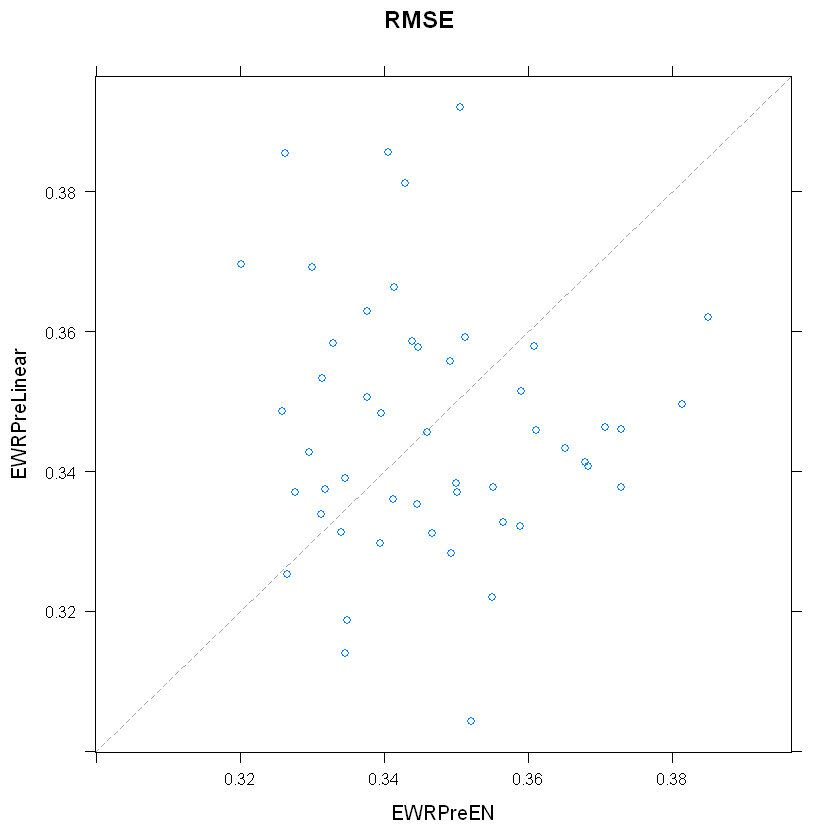

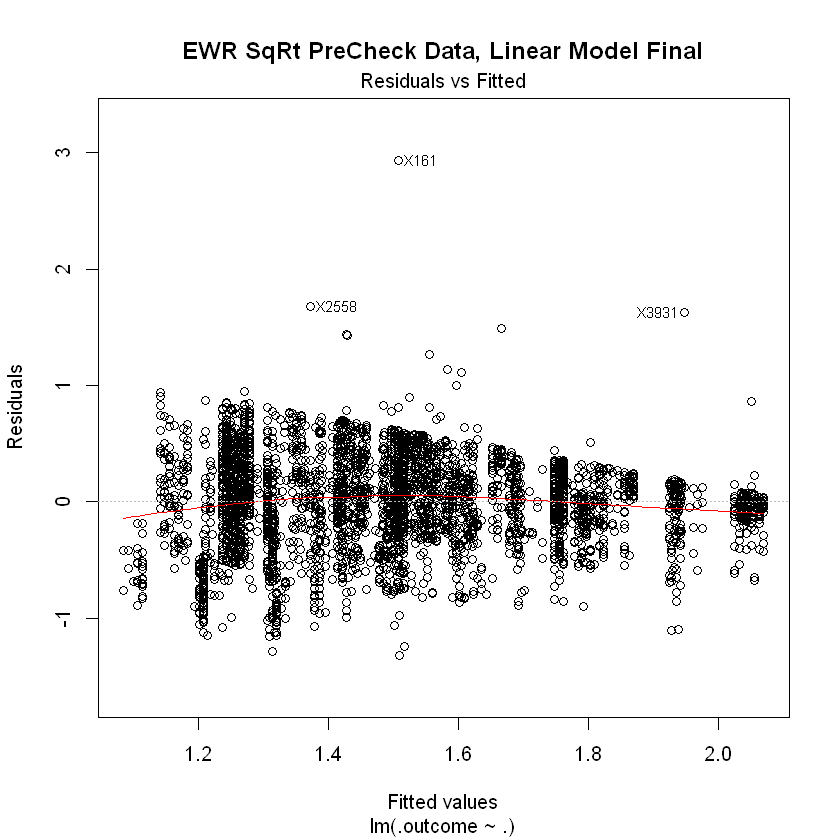

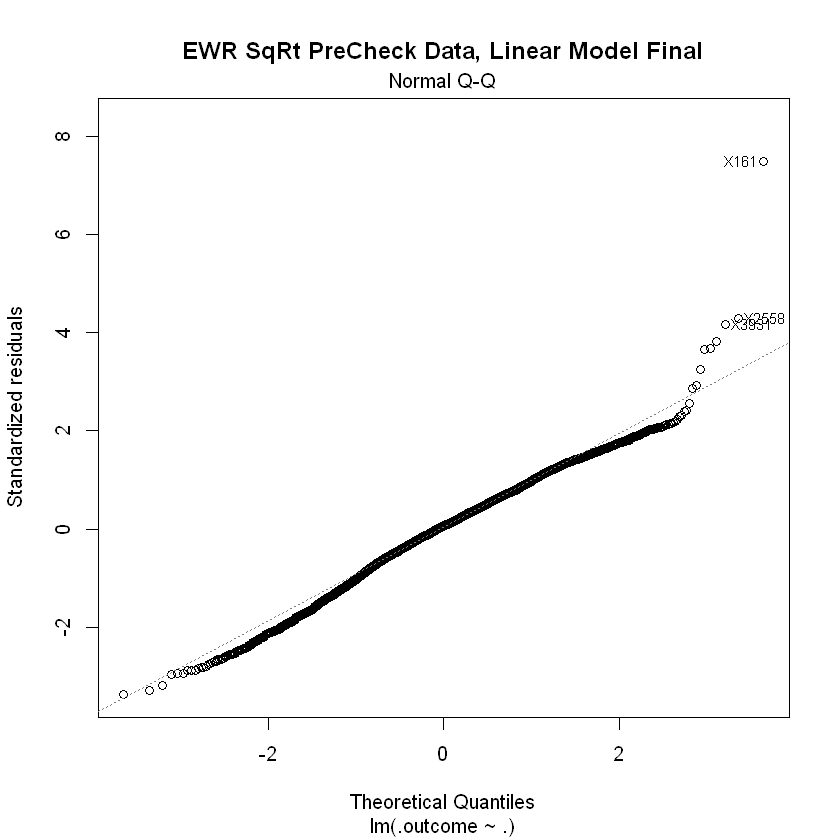

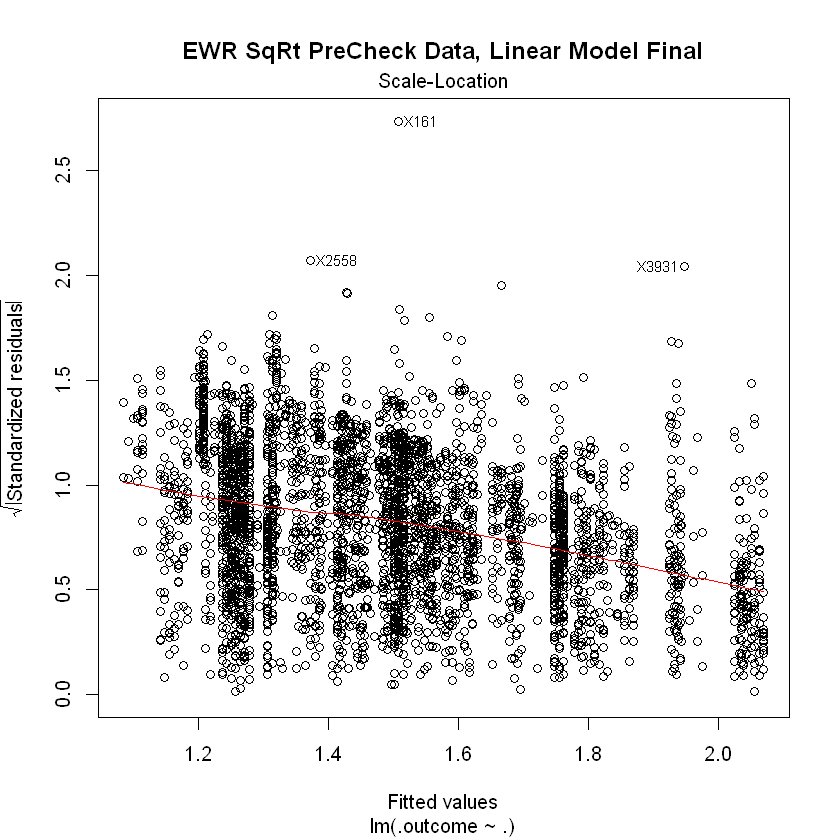


Dataset for EWR SqRt Regular
'data.frame':	7217 obs. of  19 variables:
 $ WaitTimeContinuousSqRt: num  4.13 3.67 3.66 3.61 3.11 ...
 $ HourInt               : int  5 6 7 8 9 10 11 12 13 14 ...
 $ HourIntSquared        : int  25 36 49 64 81 100 121 144 169 196 ...
 $ HourIntCubed          : int  125 216 343 512 729 1000 1331 1728 2197 2744 ...
 $ AMRush                : int  1 1 1 0 0 0 0 0 0 0 ...
 $ PMRush                : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jan                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Feb                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Mar                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Apr                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ May                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jun                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jul                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Aug                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Sep                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Mon                   : int  0 0 0 


Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.7272 -0.4550 -0.0545  0.3601  3.3557 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     0.2532265  0.0398104   6.361 2.18e-10 ***
HourInt         0.2589471  0.0147193  17.592  < 2e-16 ***
HourIntSquared  0.0154739  0.0015942   9.706  < 2e-16 ***
HourIntCubed   -0.0011318  0.0000461 -24.550  < 2e-16 ***
AMRush          1.5015796  0.0343891  43.664  < 2e-16 ***
PMRush         -0.2013705  0.0337902  -5.959 2.70e-09 ***
Jan            -0.1412482  0.0371131  -3.806 0.000143 ***
Feb            -0.1264468  0.0389461  -3.247 0.001175 ** 
Mar             0.0418098  0.0374586   1.116 0.264405    
Apr             0.0665147  0.0380887   1.746 0.080817 .  
May             0.0948246  0.0375499   2.525 0.011590 *  
Jun             0.4263926  0.0377867  11.284  < 2e-16 ***
Jul             0.4809863  0.0373487  12.878  < 2e-16 ***
Aug             0.5905429  0.0374

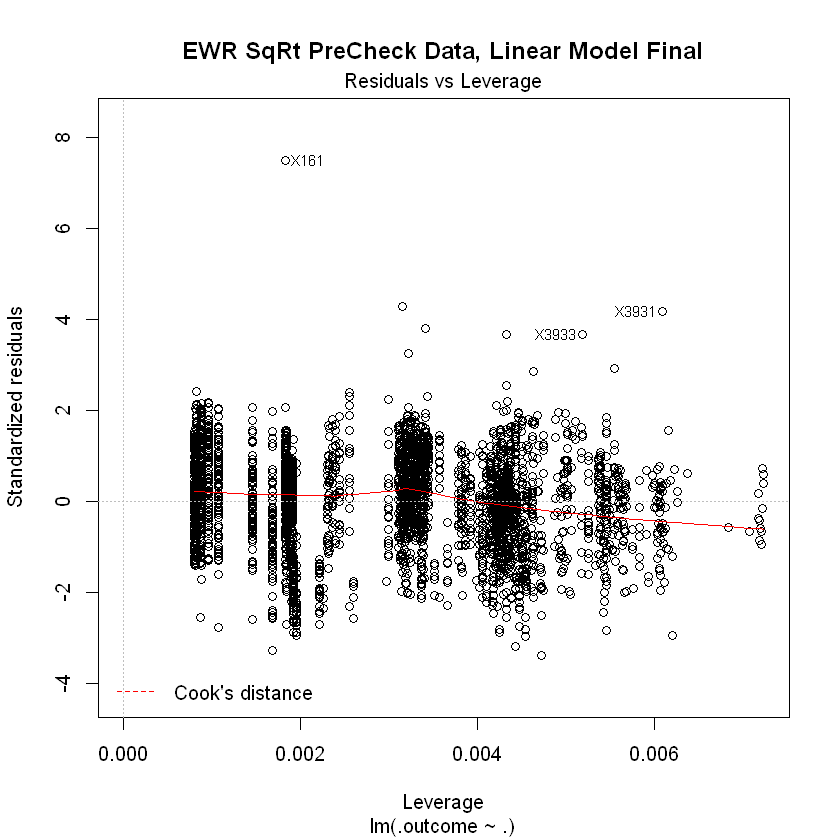

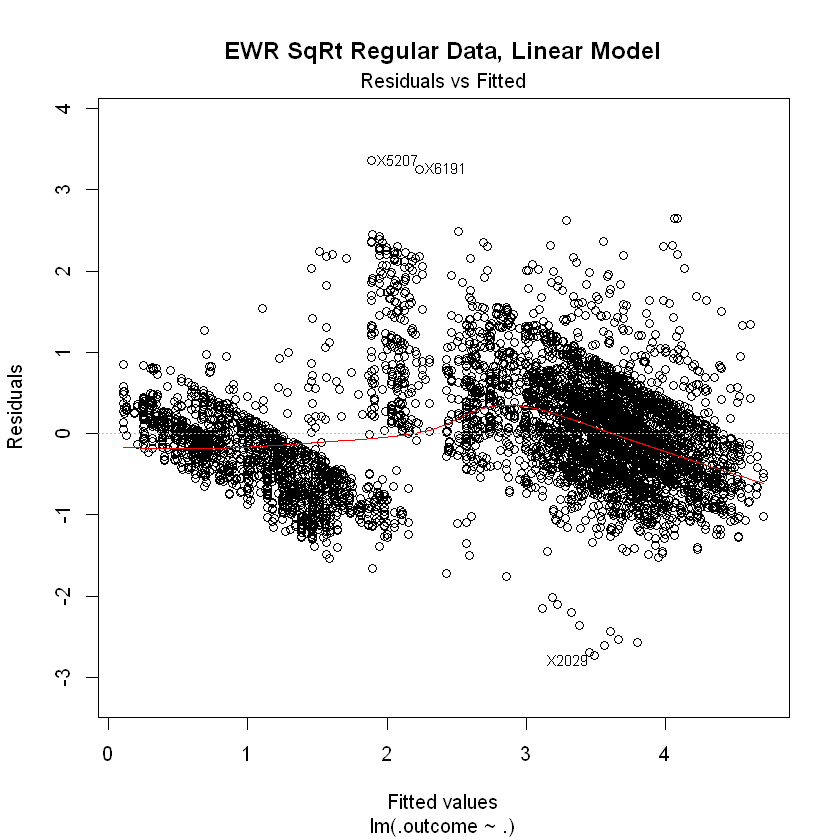

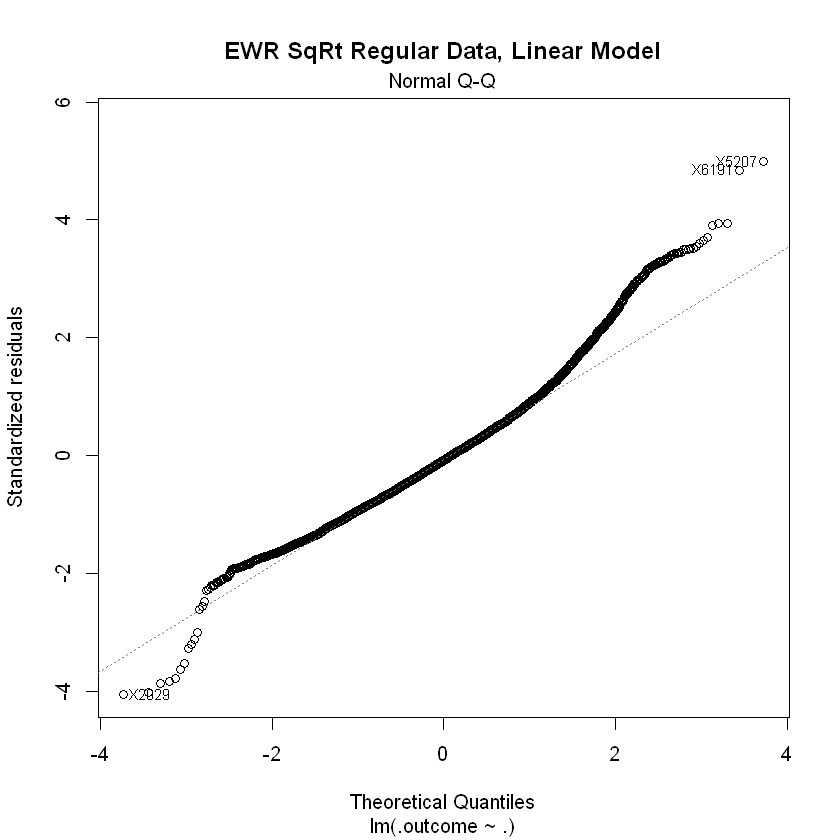

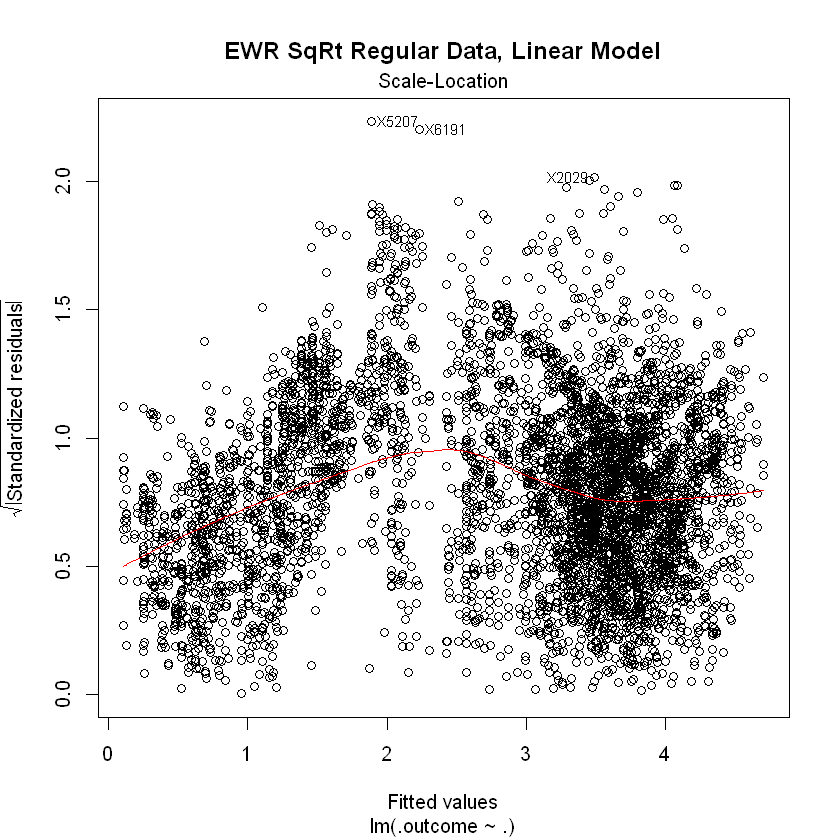

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
"There were missing values in resampled performance measures."


Elastic Net Outputs for EWR SqRt Regular


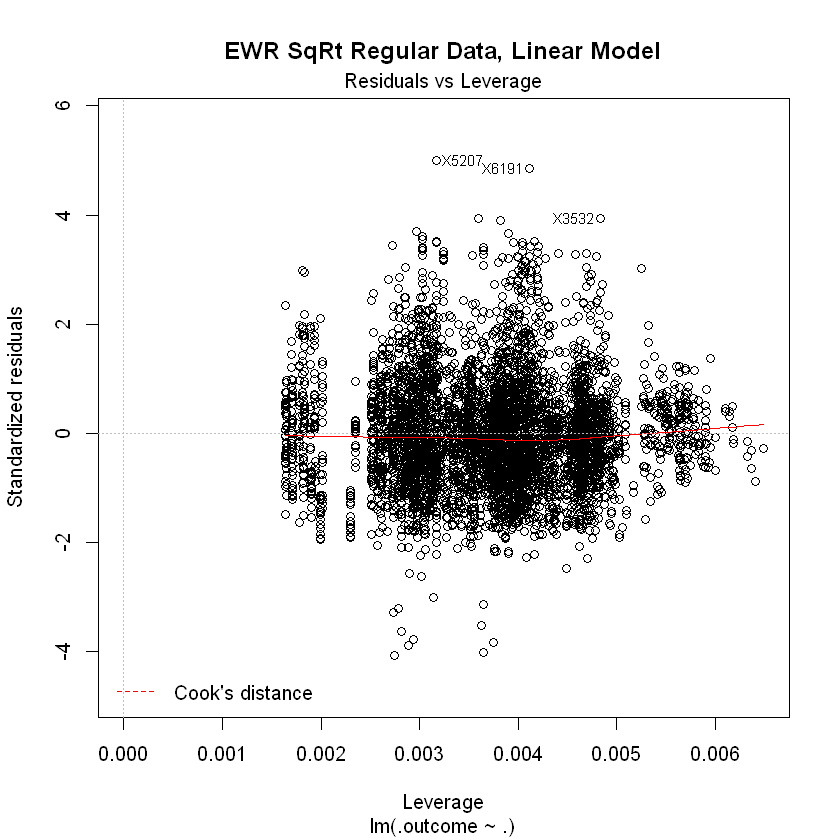

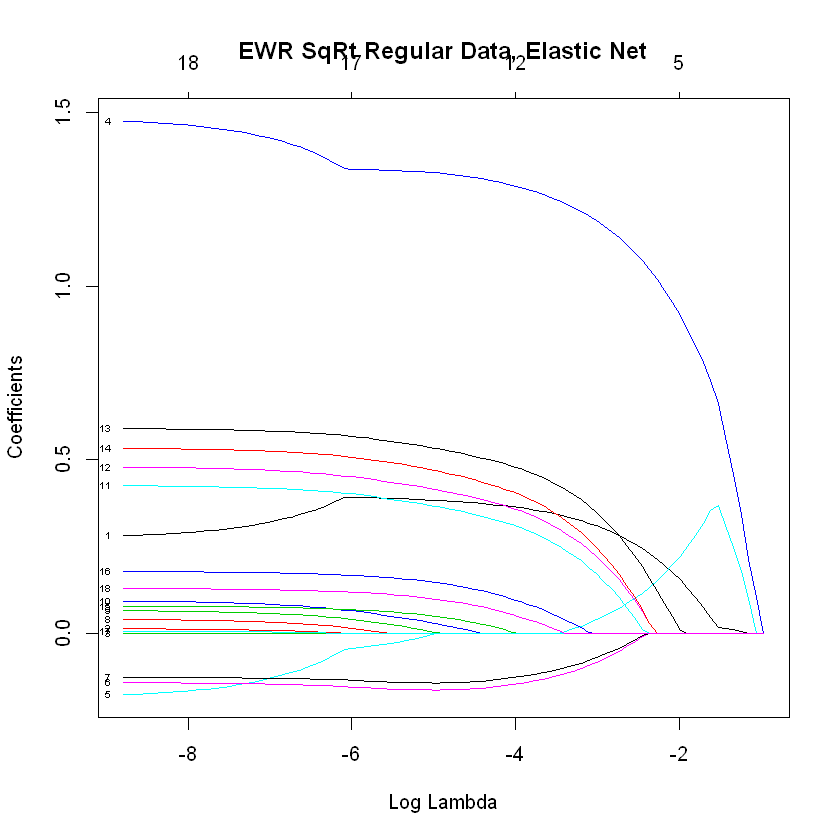

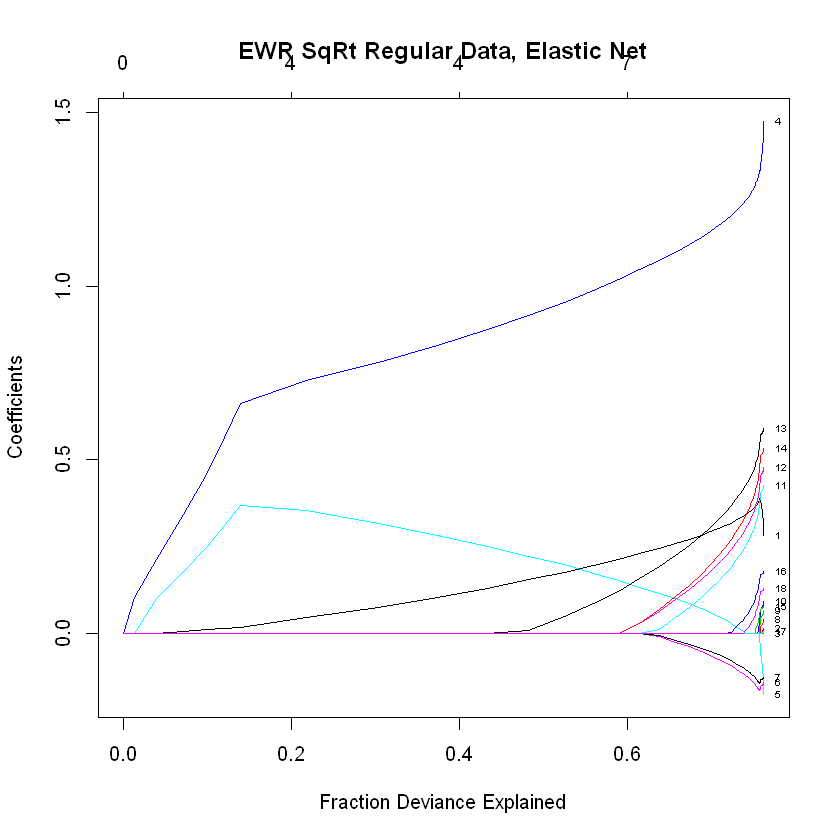


Compare Linear vs Elastic Net Models, EWR SqRt Regular


Call:
summary.resamples(object = EWRRegResample)

Models: EWRRegLinear, EWRRegEN 
Number of resamples: 50 

MAE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
EWRRegLinear 0.4783412 0.5045943 0.5140971 0.5163717 0.5309198 0.5593350    0
EWRRegEN     0.4825661 0.5071212 0.5169267 0.5177796 0.5262645 0.5724685    0

RMSE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
EWRRegLinear 0.6114199 0.6601686 0.6756117 0.6736740 0.6900576 0.7266158    0
EWRRegEN     0.6121960 0.6584705 0.6718480 0.6736617 0.6900668 0.7479026    0

Rsquared 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
EWRRegLinear 0.7234277 0.7544053 0.7611695 0.7618691 0.7688879 0.8017483    0
EWRRegEN     0.7159002 0.7479304 0.7623444 0.7618248 0.7768612 0.8062994    0


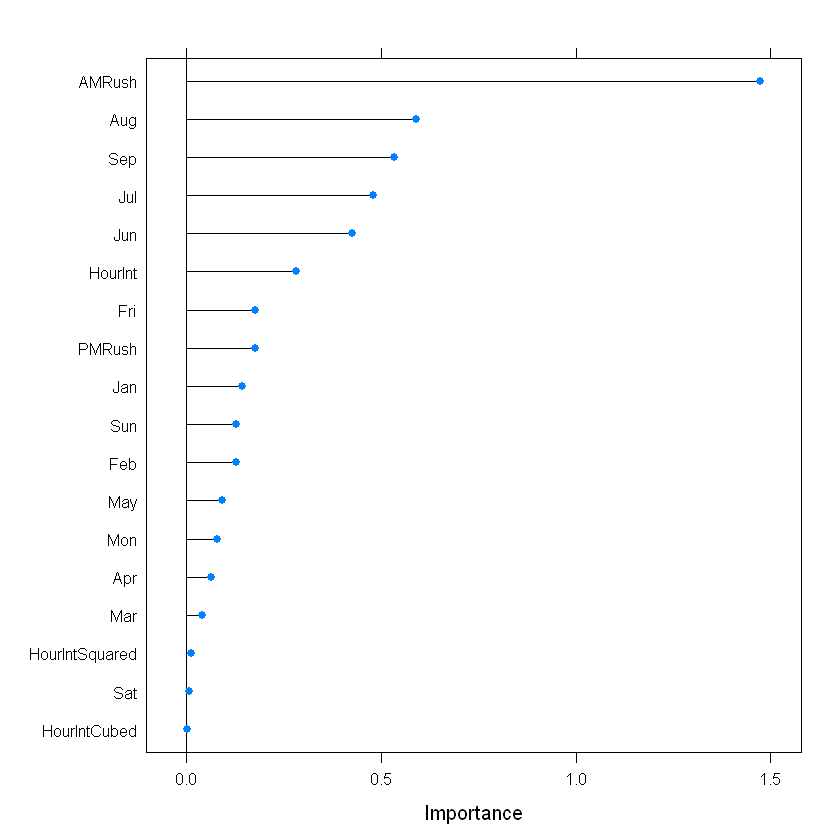

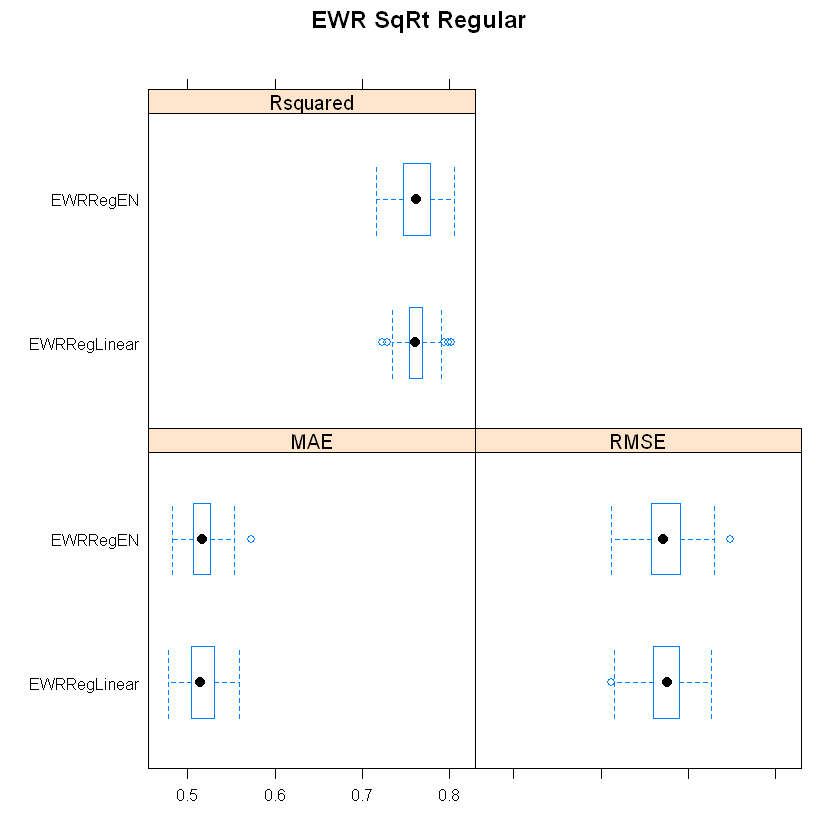


Best Model for Elastic Net EWR SqRt Regular


,alpha,lambda
91,1,1e-04


19 x 1 sparse Matrix of class "dgCMatrix"
                          1
(Intercept)     0.223423250
HourInt         0.281562668
HourIntSquared  0.012886772
HourIntCubed   -0.001056879
AMRush          1.474548335
PMRush         -0.176867522
Jan            -0.142532831
Feb            -0.127080042
Mar             0.039784302
Apr             0.064899403
May             0.092376156
Jun             0.424823762
Jul             0.478583866
Aug             0.589260144
Sep             0.532455567
Mon             0.078372283
Fri             0.177613067
Sat             0.006362735
Sun             0.128888874


Model RMSE of Training Data EWR Regular best fit Elastic Net
[1] 0.6718277

Model RMSE of Test Data EWR Regular best fit Elastic Net
[1] 0.6646373

Linear Regression Results EWR SqRt Regular Training Data Final
  intercept     RMSE  Rsquared       MAE     RMSESD RsquaredSD      MAESD
1      TRUE 1.183827 0.2644683 0.9740706 0.02574969 0.02617768 0.02496128



Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.1442 -0.9023  0.1565  0.8799  3.0700 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 1.631336   0.038834  42.008  < 2e-16 ***
HourInt     0.057519   0.002592  22.192  < 2e-16 ***
AMRush      1.668112   0.052851  31.563  < 2e-16 ***
PMRush      0.964541   0.051269  18.813  < 2e-16 ***
Jun         0.475208   0.059118   8.038 1.12e-15 ***
Jul         0.515006   0.058239   8.843  < 2e-16 ***
Aug         0.623637   0.058388  10.681  < 2e-16 ***
Sep         0.527680   0.065001   8.118 5.90e-16 ***
Fri         0.139368   0.047163   2.955  0.00314 ** 
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 1.184 on 5085 degrees of freedom
Multiple R-squared:  0.2654,	Adjusted R-squared:  0.2642 
F-statistic: 229.6 on 8 and 5085 DF,  p-value: < 2.2e-16


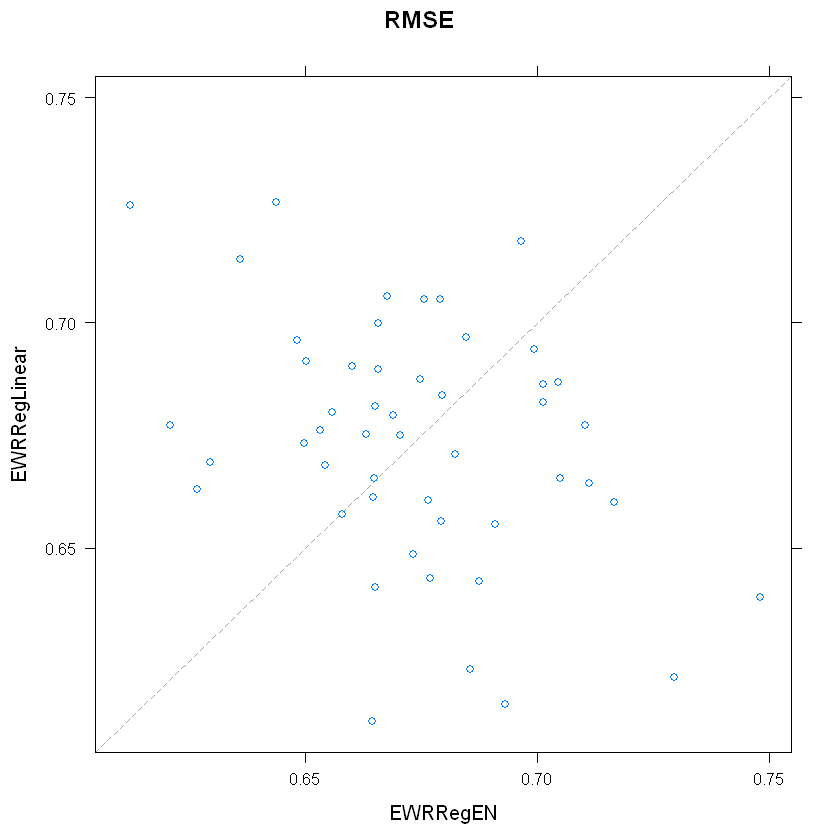

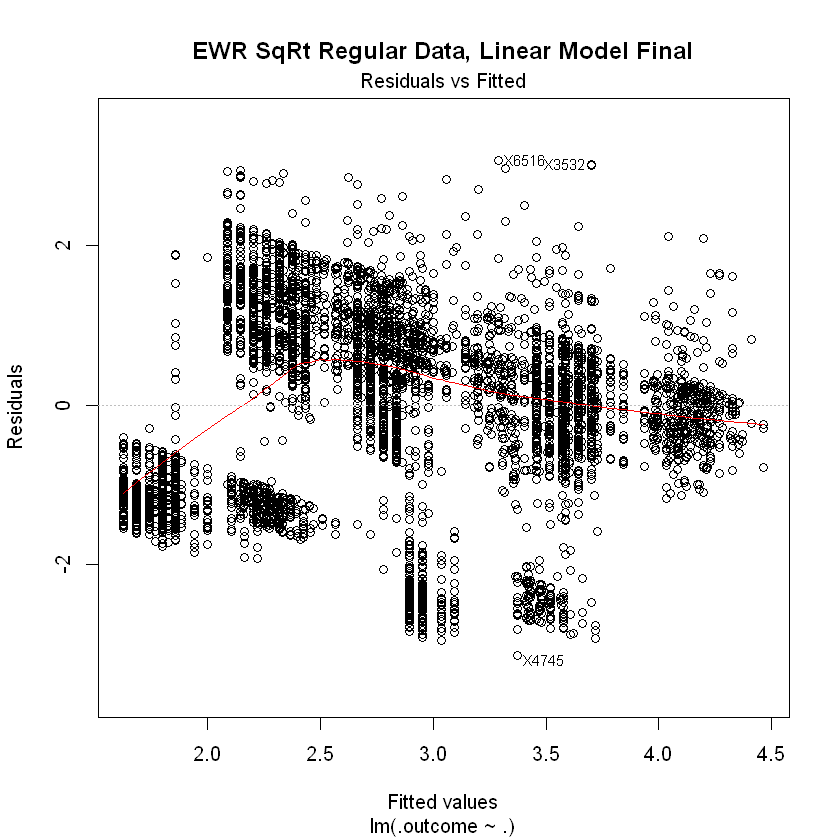

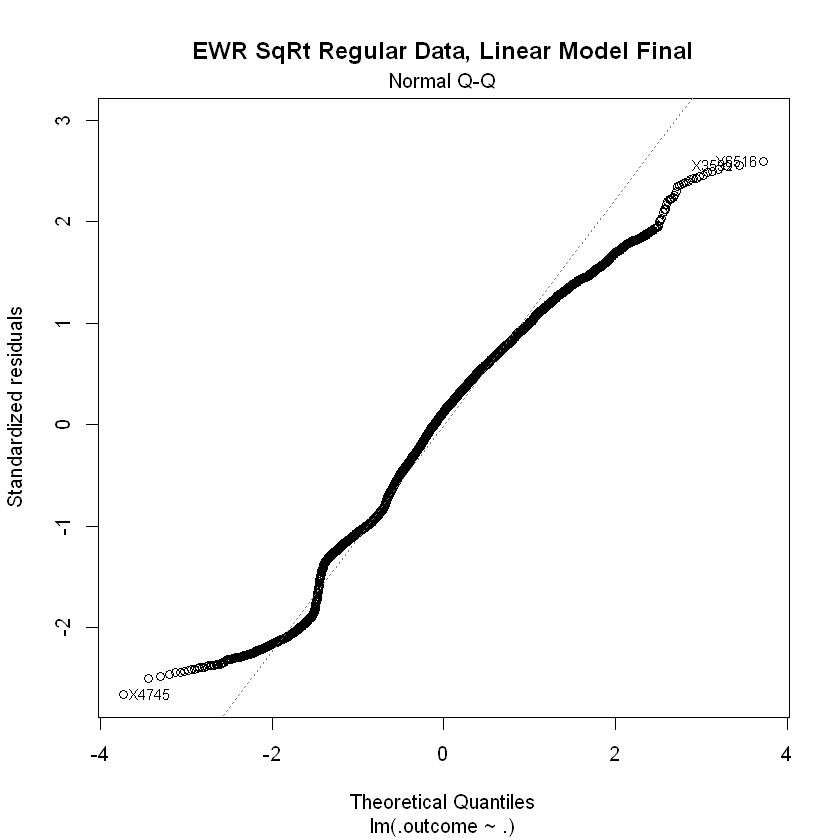

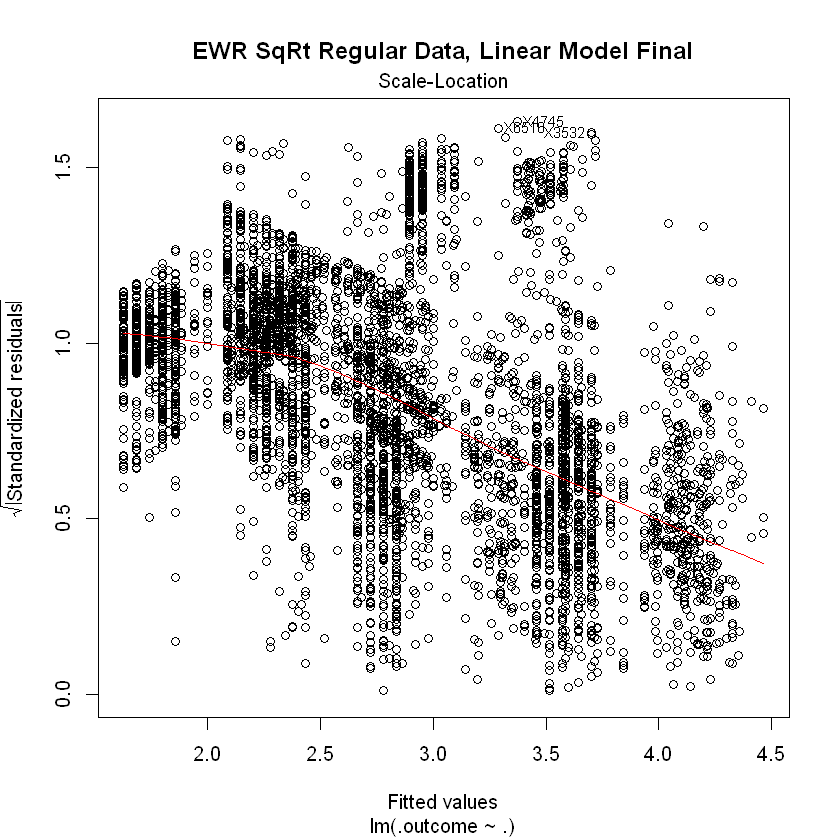


Dataset for ORD SqRt PreCheck
'data.frame':	5262 obs. of  19 variables:
 $ WaitTimeContinuousSqRt: num  0.103 1.801 1.729 1.891 2.017 ...
 $ HourInt               : int  3 4 5 6 7 8 9 10 11 12 ...
 $ HourIntSquared        : int  9 16 25 36 49 64 81 100 121 144 ...
 $ HourIntCubed          : int  27 64 125 216 343 512 729 1000 1331 1728 ...
 $ AMRush                : int  0 0 1 1 1 0 0 0 0 0 ...
 $ PMRush                : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jan                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Feb                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Mar                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Apr                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ May                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jun                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jul                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Aug                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Sep                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Mon                   : int  0 0 0 0 0


Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.33745 -0.21272  0.02298  0.23413  1.90252 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     1.200e+00  7.819e-02  15.348  < 2e-16 ***
HourInt        -6.850e-02  2.602e-02  -2.633  0.00851 ** 
HourIntSquared  1.673e-02  2.544e-03   6.577 5.46e-11 ***
HourIntCubed   -7.293e-04  7.323e-05  -9.959  < 2e-16 ***
AMRush          4.329e-01  1.924e-02  22.499  < 2e-16 ***
PMRush          1.635e-01  1.967e-02   8.312  < 2e-16 ***
Jan            -8.681e-02  2.163e-02  -4.014 6.10e-05 ***
Feb            -2.790e-02  2.283e-02  -1.222  0.22164    
Mar             6.352e-02  2.189e-02   2.902  0.00373 ** 
Apr             6.757e-02  2.239e-02   3.018  0.00256 ** 
May             1.583e-01  2.165e-02   7.312 3.22e-13 ***
Jun             2.712e-01  2.249e-02  12.060  < 2e-16 ***
Jul             1.235e-01  2.212e-02   5.584 2.52e-08 ***
Aug             1.994e-

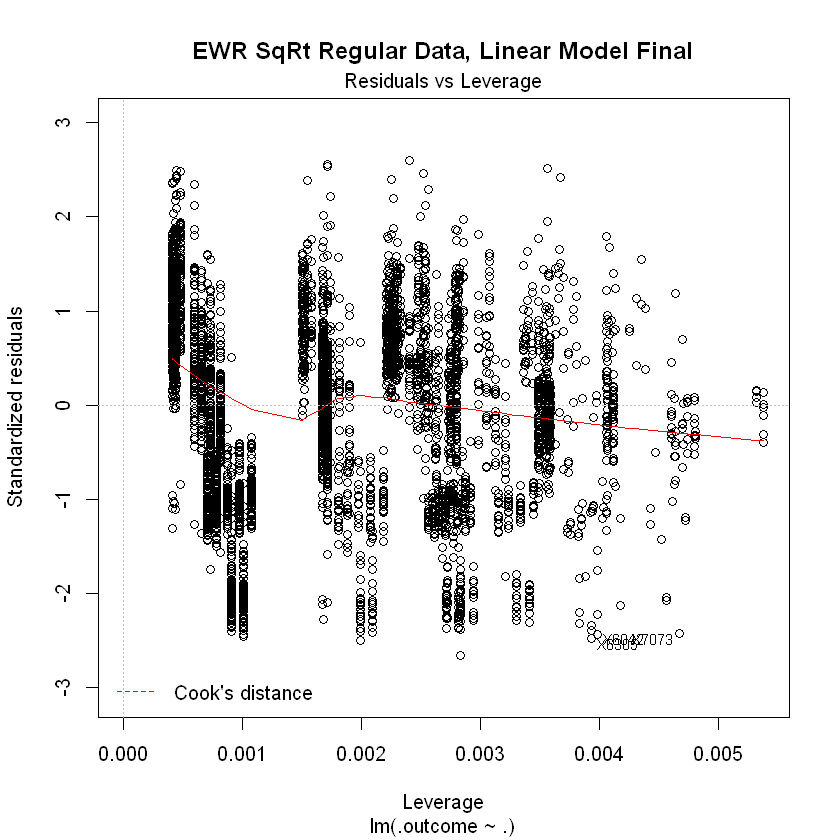

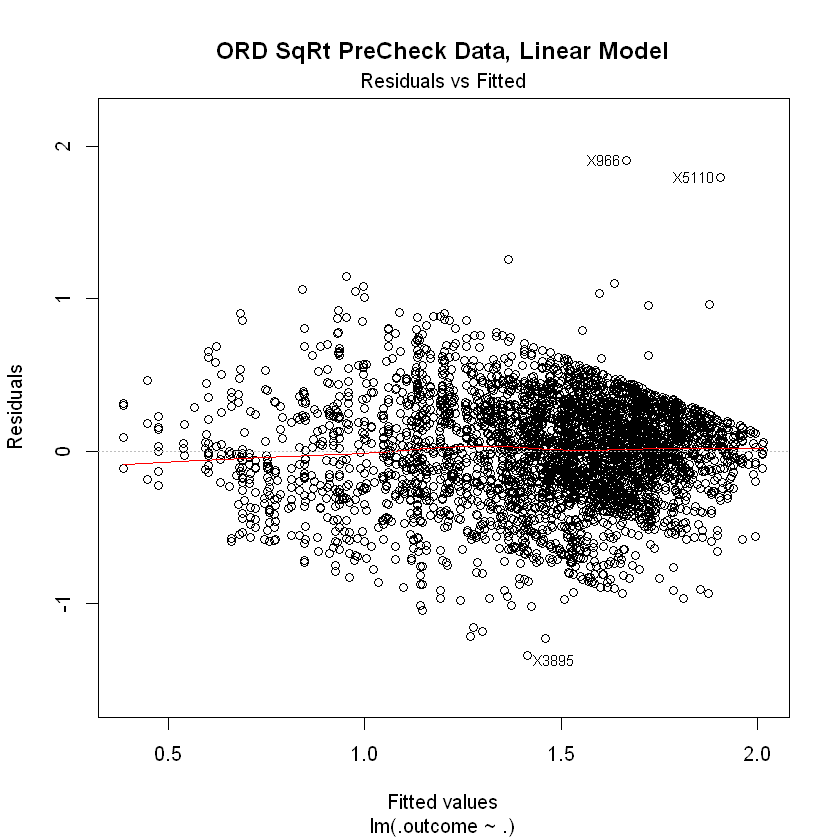

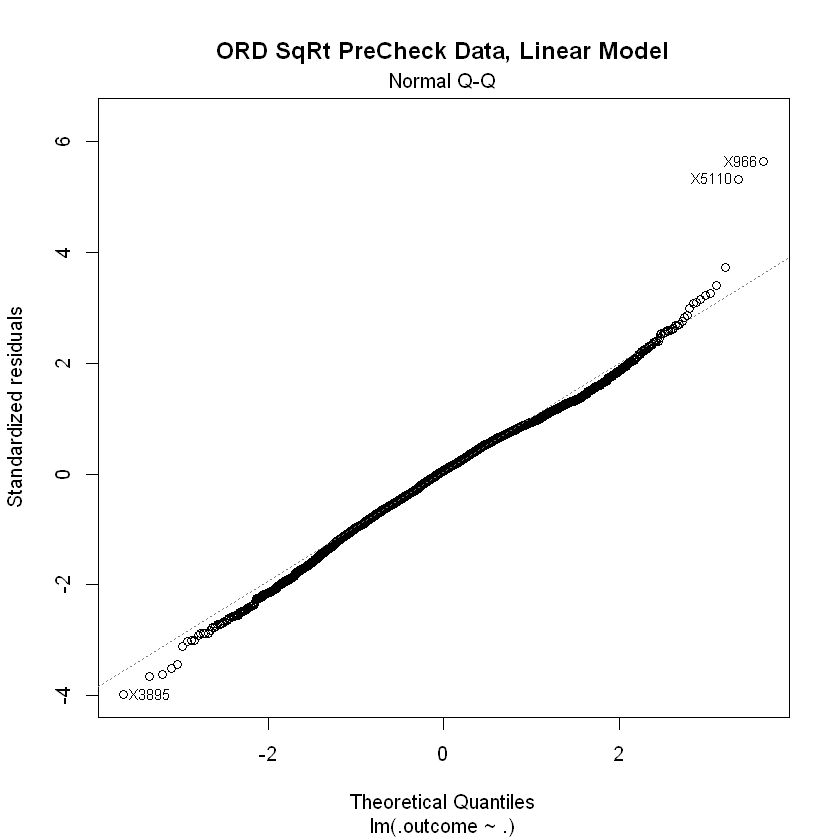

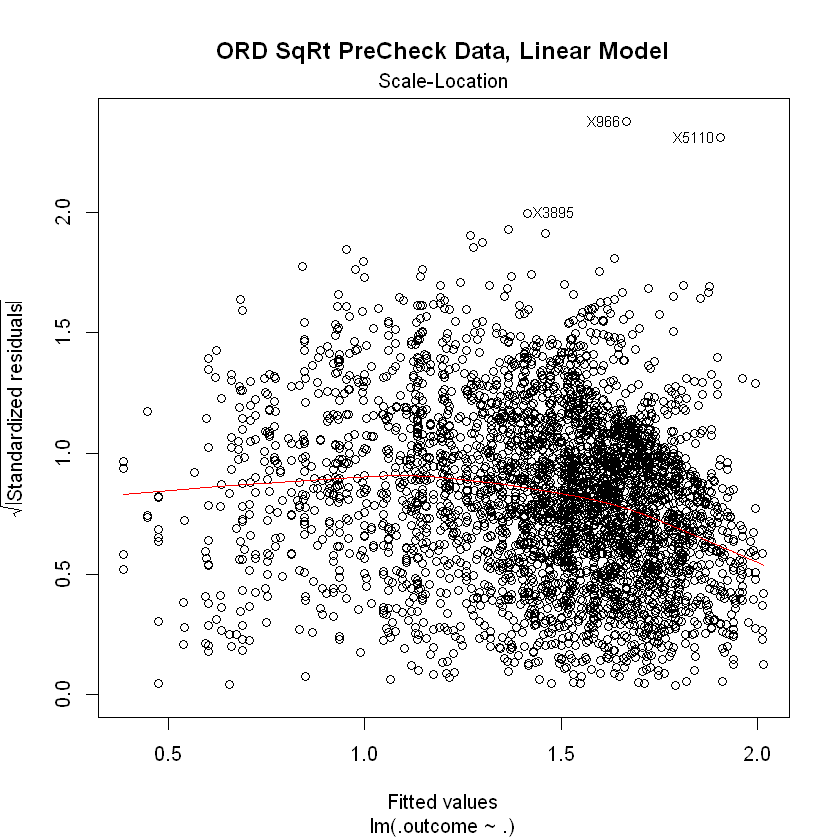

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
"There were missing values in resampled performance measures."


Elastic Net Outputs for ORD SqRt PreCheck


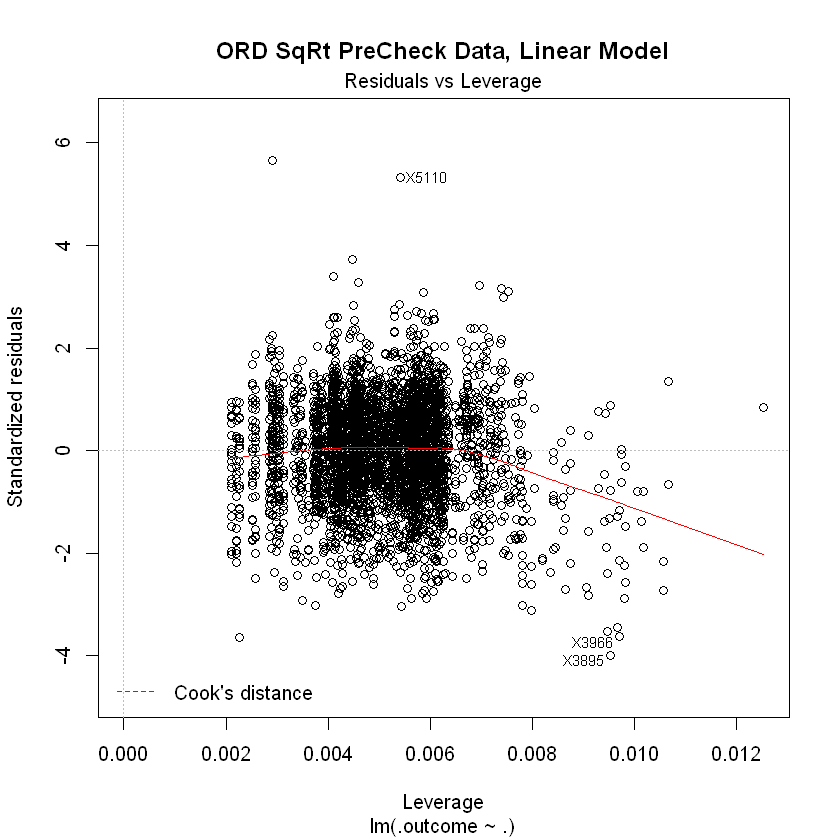

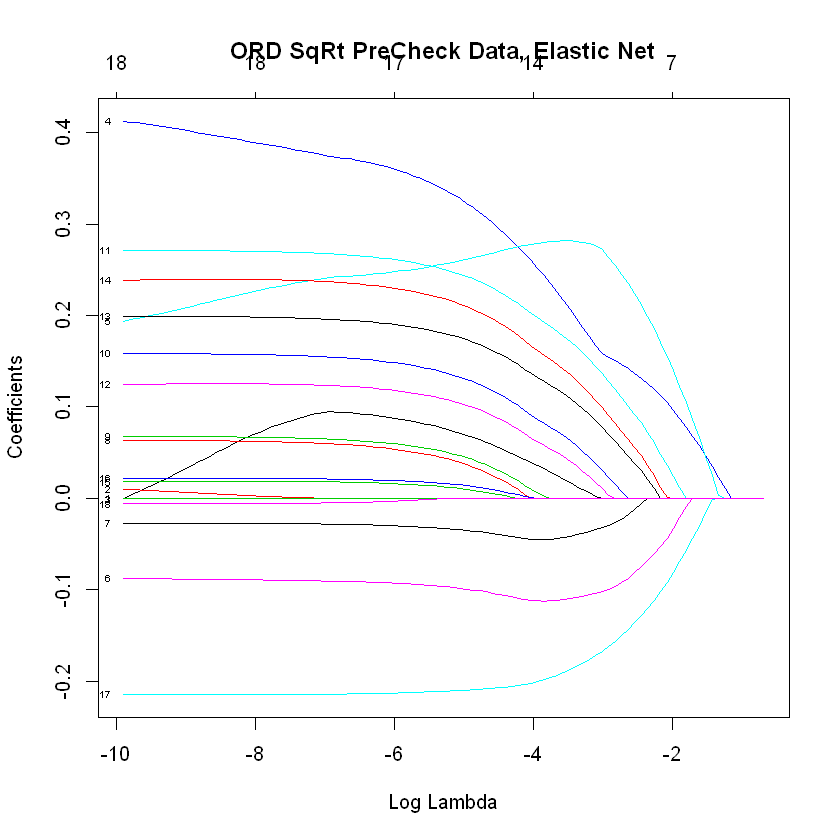

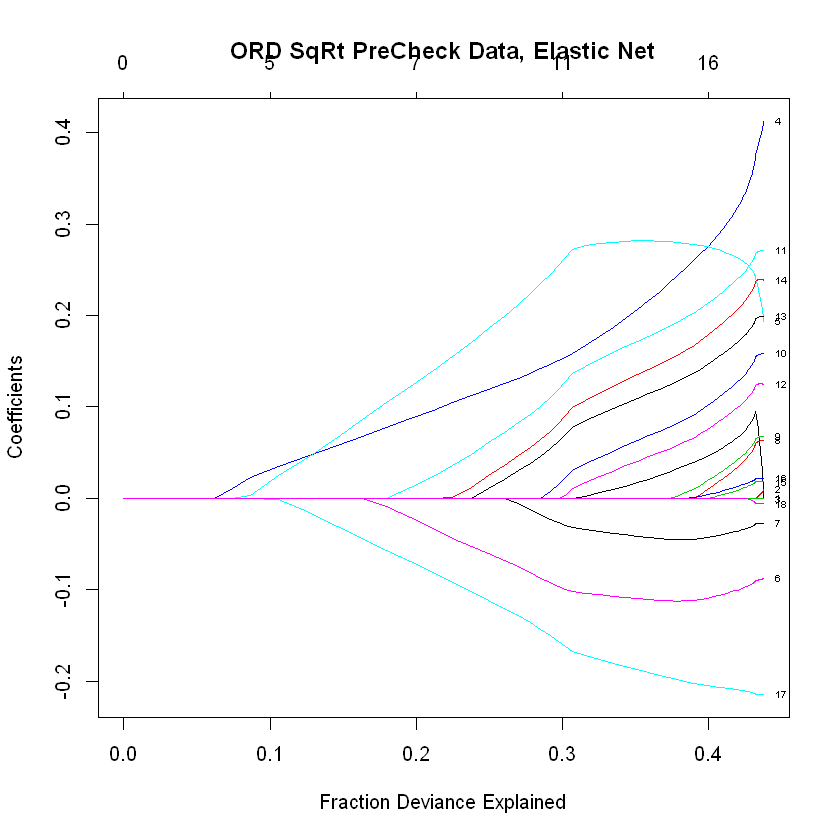


Compare Linear vs Elastic Net Models, ORD SqRt PreCheck


Call:
summary.resamples(object = ORDPreResample)

Models: ORDPreLinear, ORDPreEN 
Number of resamples: 50 

MAE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
ORDPreLinear 0.2388326 0.2602958 0.2671050 0.2673419 0.2756257 0.2998513    0
ORDPreEN     0.2536649 0.2635199 0.2680855 0.2684553 0.2733369 0.2815836    0

RMSE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
ORDPreLinear 0.2993965 0.3284426 0.3381367 0.3380959 0.3495242 0.3785966    0
ORDPreEN     0.3196212 0.3303155 0.3386066 0.3388073 0.3448264 0.3615529    0

Rsquared 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
ORDPreLinear 0.3199035 0.4051139 0.4351353 0.4343900 0.4661885 0.5582269    0
ORDPreEN     0.3671404 0.4100586 0.4267714 0.4320388 0.4533789 0.4936222    0


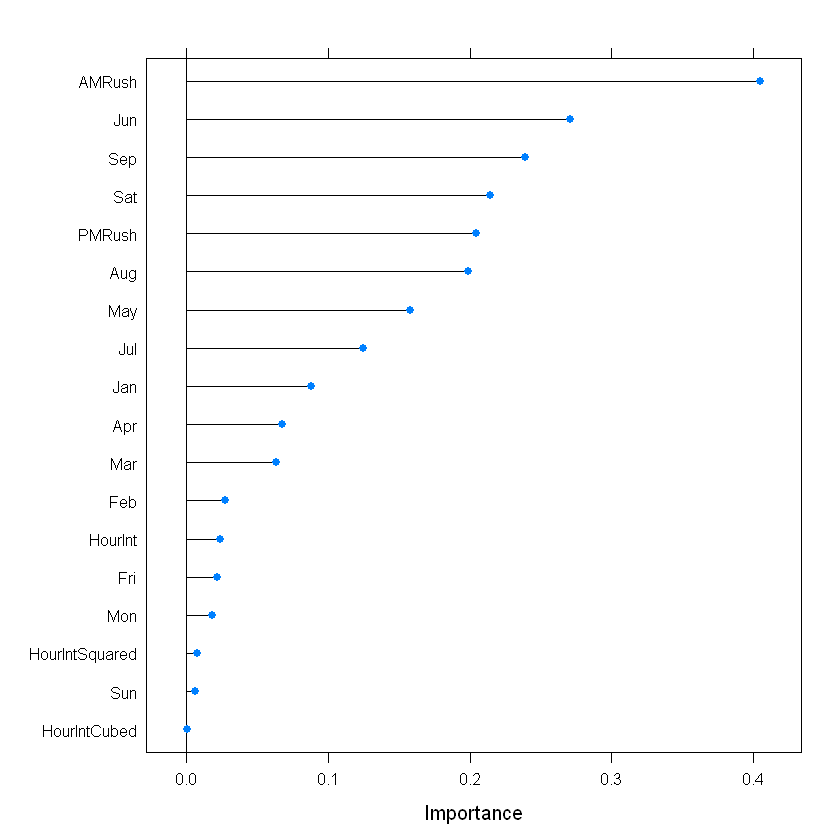

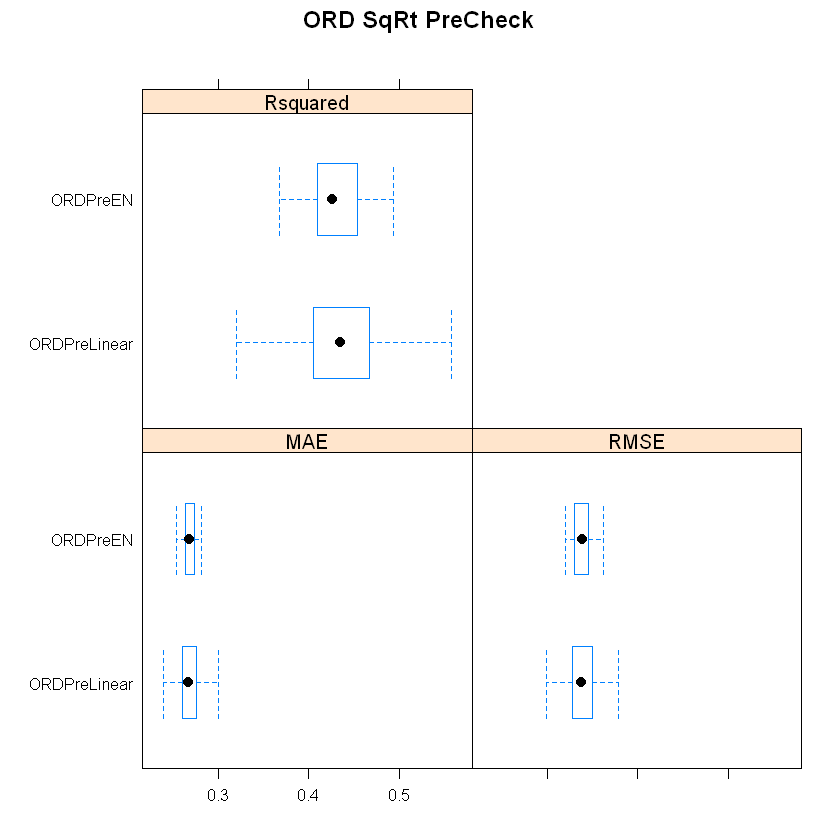


Best Model for Elastic Net ORD SqRt PreCheck


,alpha,lambda
31,0.3333333,1e-04


19 x 1 sparse Matrix of class "dgCMatrix"
                           1
(Intercept)     0.9493810096
HourInt         0.0242518513
HourIntSquared  0.0074817696
HourIntCubed   -0.0004629208
AMRush          0.4050239536
PMRush          0.2048280029
Jan            -0.0881808435
Feb            -0.0275242425
Mar             0.0632286333
Apr             0.0675253695
May             0.1581722890
Jun             0.2710624830
Jul             0.1251252169
Aug             0.1991351836
Sep             0.2391354245
Mon             0.0182243625
Fri             0.0217795487
Sat            -0.2147237527
Sun            -0.0060756482


Model RMSE of Training Data ORD PreCheck best fit Elastic Net
[1] 0.3371297

Model RMSE of Test Data ORD PreCheck best fit Elastic Net
[1] 0.3509559

Linear Regression Results ORD SqRt PreCheck Training Data Final
  intercept      RMSE  Rsquared       MAE     RMSESD RsquaredSD      MAESD
1      TRUE 0.3994589 0.2106406 0.3135376 0.01423147 0.03711797 0.01053995



Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.4928 -0.2311  0.0566  0.2795  1.8853 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  1.30665    0.01191 109.677  < 2e-16 ***
AMRush       0.37748    0.01759  21.459  < 2e-16 ***
PMRush       0.25897    0.01761  14.706  < 2e-16 ***
Jan         -0.10084    0.02370  -4.254 2.15e-05 ***
Apr          0.06405    0.02464   2.599  0.00938 ** 
May          0.14755    0.02376   6.210 5.88e-10 ***
Jun          0.26248    0.02482  10.576  < 2e-16 ***
Jul          0.12552    0.02433   5.159 2.62e-07 ***
Aug          0.19909    0.02388   8.336  < 2e-16 ***
Sep          0.21757    0.02700   8.059 1.03e-15 ***
Sat         -0.22397    0.01881 -11.906  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.3993 on 3704 degrees of freedom
Multiple R-squared:  0.2124,	Adjusted R-squared:  0.2103 
F-statistic: 99.91 on 10

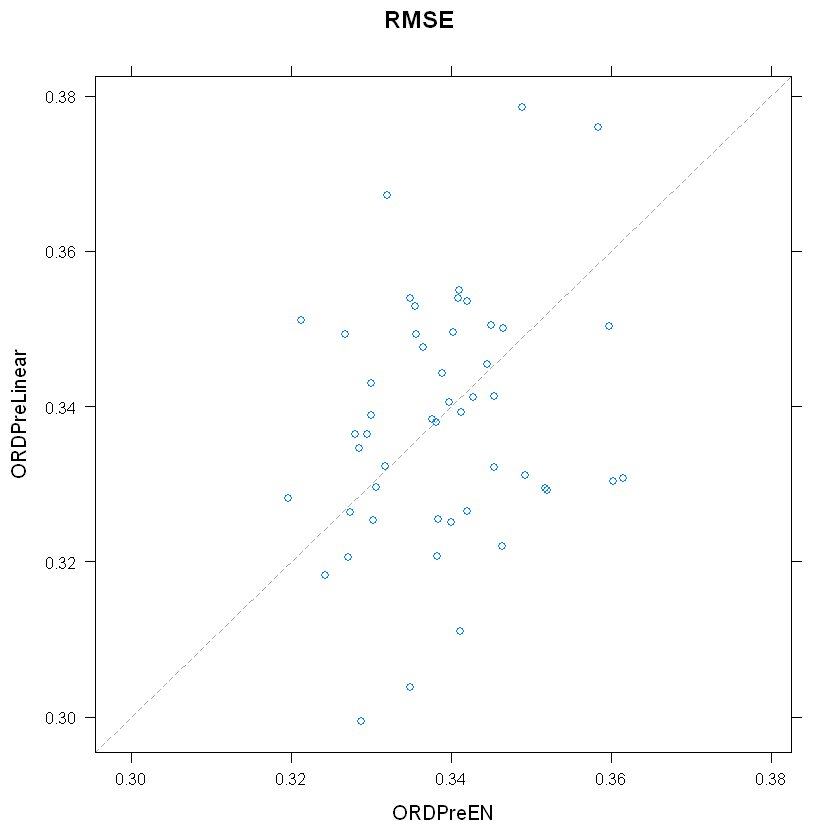

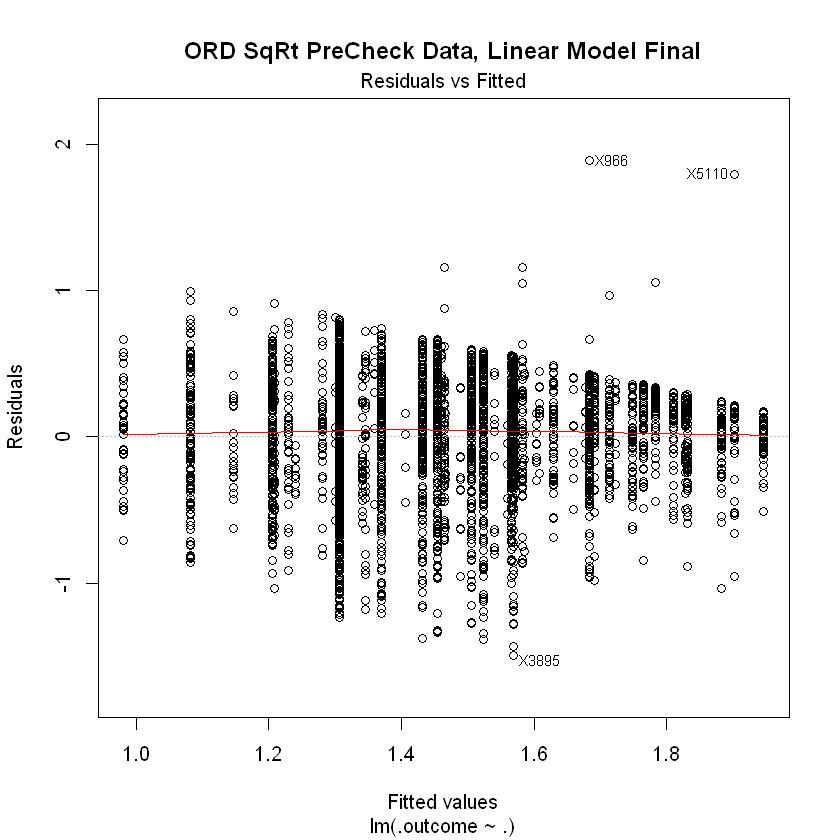

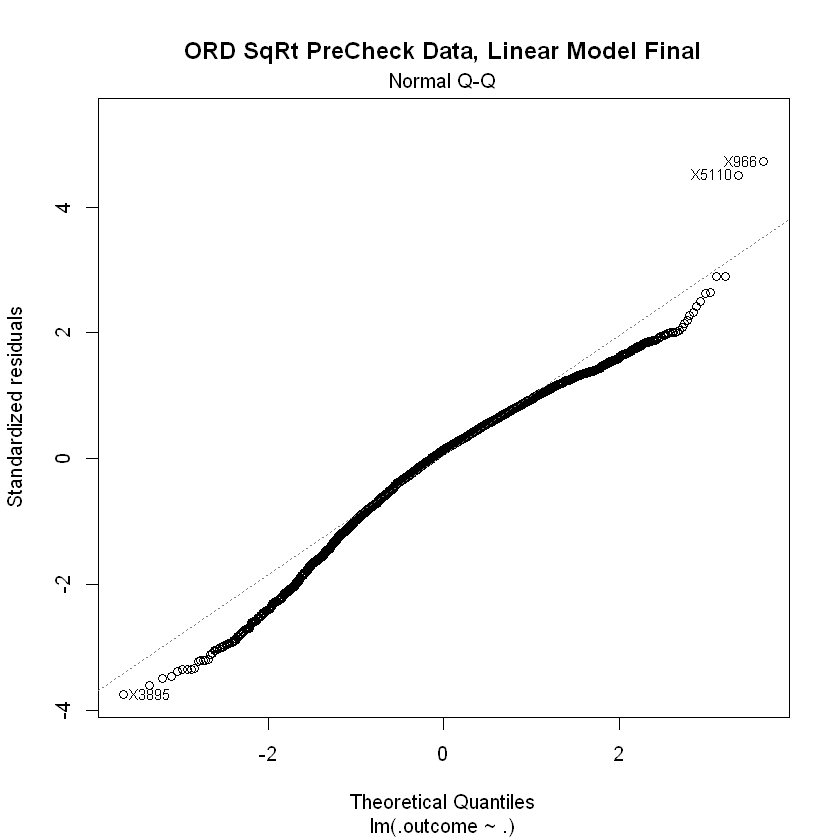

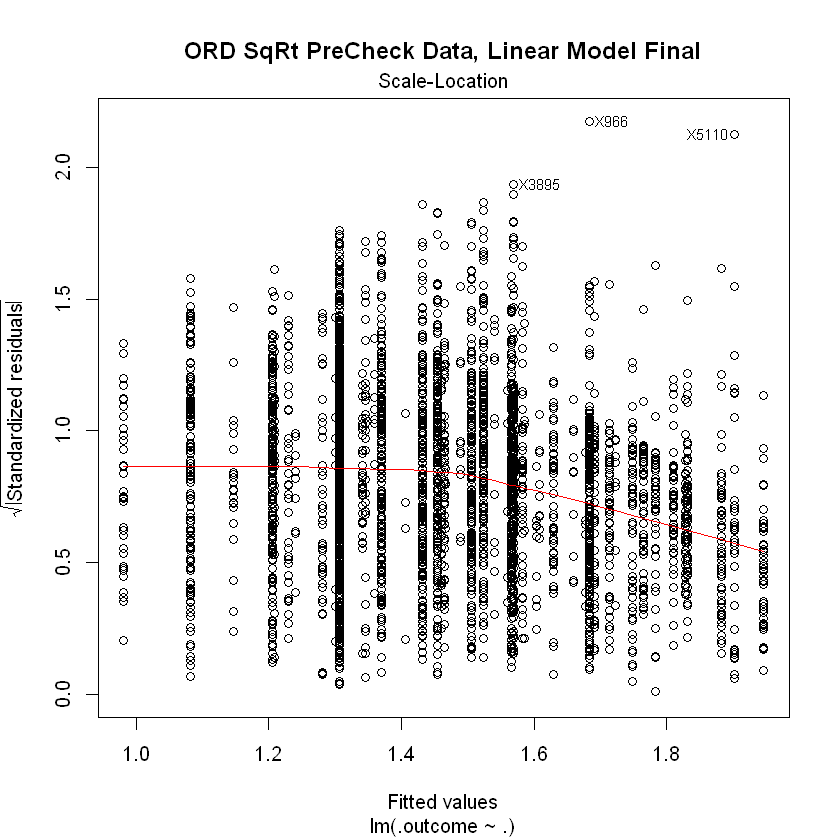


Dataset for ORD SqRt Regular
'data.frame':	7320 obs. of  19 variables:
 $ WaitTimeContinuousSqRt: num  0.0329 0.2672 0.0529 0.4028 4.1085 ...
 $ HourInt               : int  0 1 2 3 4 5 6 7 8 9 ...
 $ HourIntSquared        : int  0 1 4 9 16 25 36 49 64 81 ...
 $ HourIntCubed          : int  0 1 8 27 64 125 216 343 512 729 ...
 $ AMRush                : int  0 0 0 0 0 1 1 1 0 0 ...
 $ PMRush                : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jan                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Feb                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Mar                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Apr                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ May                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jun                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Jul                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Aug                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Sep                   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Mon                   : int  0 0 0 0 0 0 0 0 0 0 ...


Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.5666 -0.5326 -0.0705  0.4577  3.2952 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     3.196e-01  4.448e-02   7.184 7.72e-13 ***
HourInt         4.302e-01  1.683e-02  25.569  < 2e-16 ***
HourIntSquared -5.578e-03  1.822e-03  -3.062 0.002210 ** 
HourIntCubed   -5.262e-04  5.256e-05 -10.013  < 2e-16 ***
AMRush          9.671e-01  3.902e-02  24.780  < 2e-16 ***
PMRush         -1.089e-01  3.887e-02  -2.801 0.005119 ** 
Jan            -1.621e-01  4.179e-02  -3.880 0.000106 ***
Feb            -1.460e-01  4.488e-02  -3.253 0.001148 ** 
Mar            -2.192e-02  4.218e-02  -0.520 0.603220    
Apr            -1.432e-01  4.332e-02  -3.304 0.000958 ***
May            -1.685e-02  4.228e-02  -0.399 0.690253    
Jun             2.719e-01  4.305e-02   6.315 2.93e-10 ***
Jul             5.243e-01  4.238e-02  12.371  < 2e-16 ***
Aug             8.421e-01  4.243e

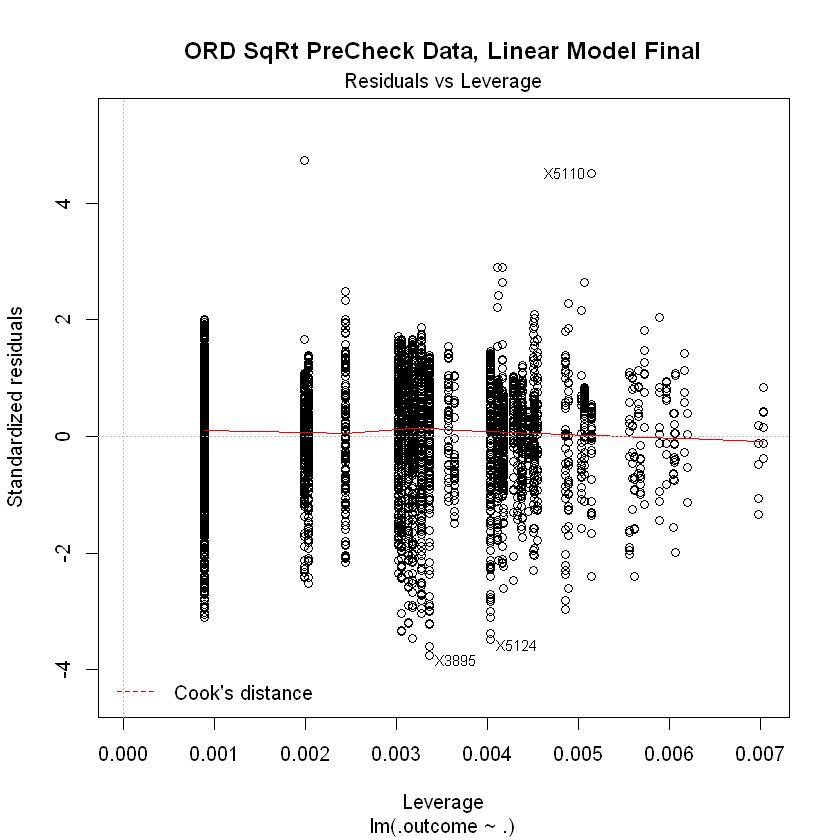

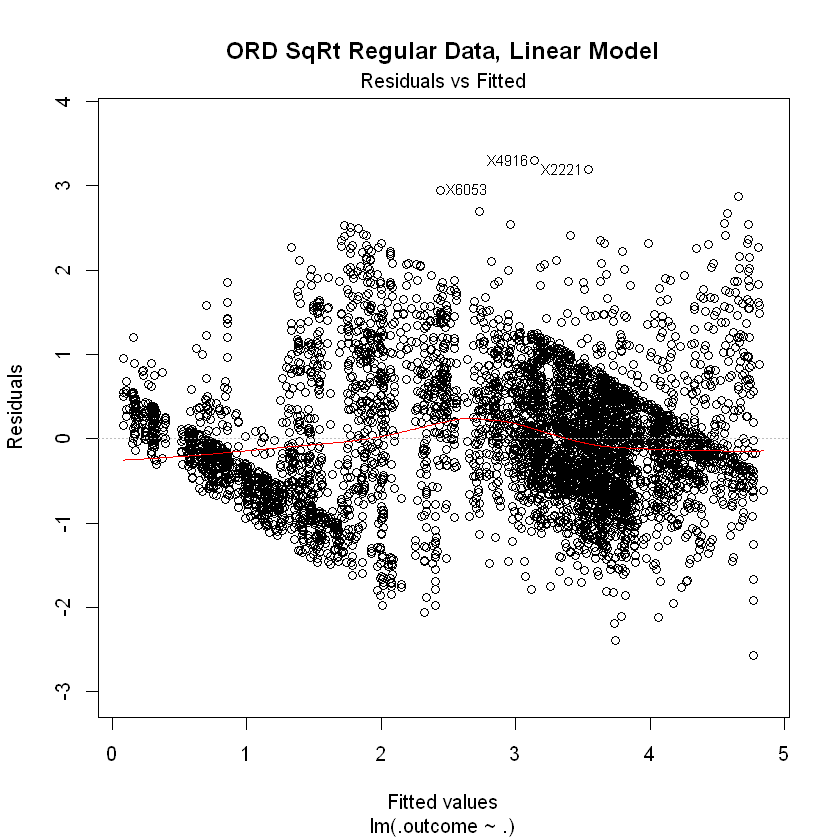

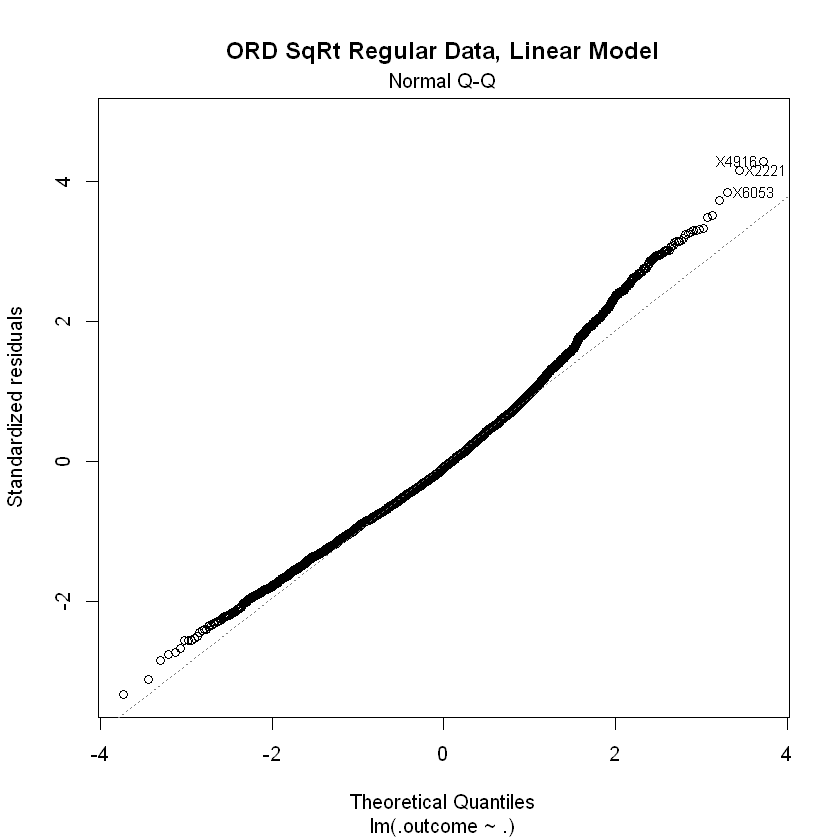

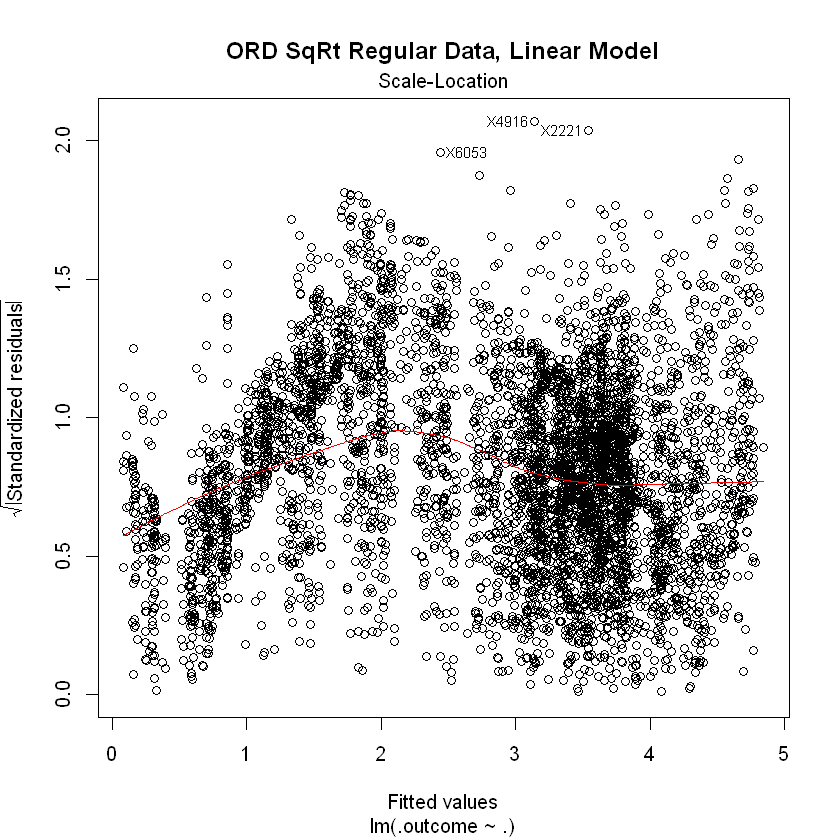

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
"There were missing values in resampled performance measures."


Elastic Net Outputs for ORD SqRt Regular


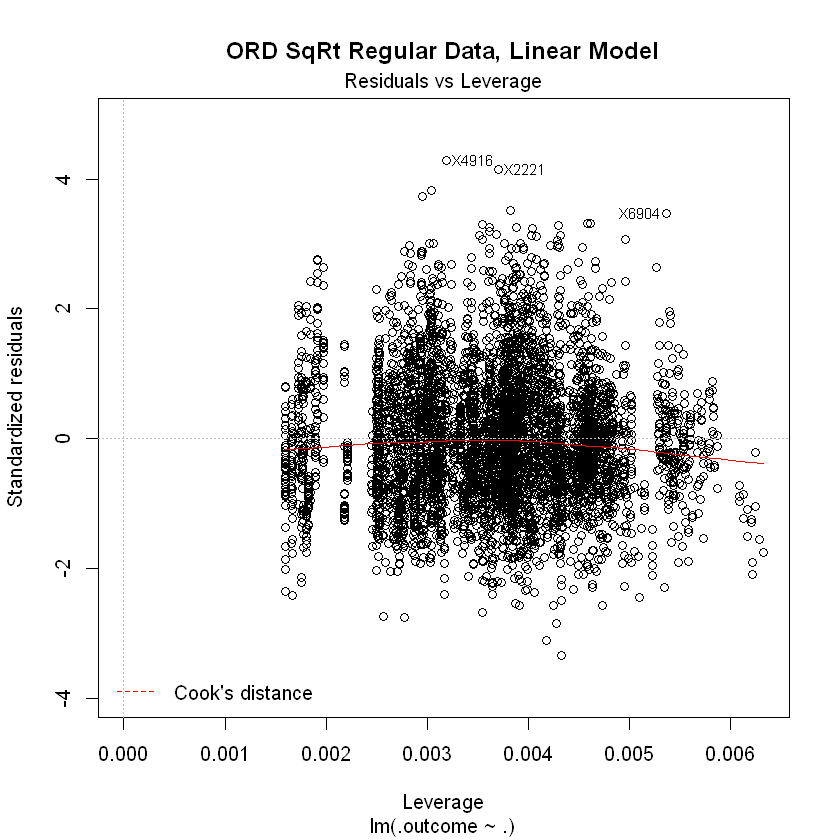

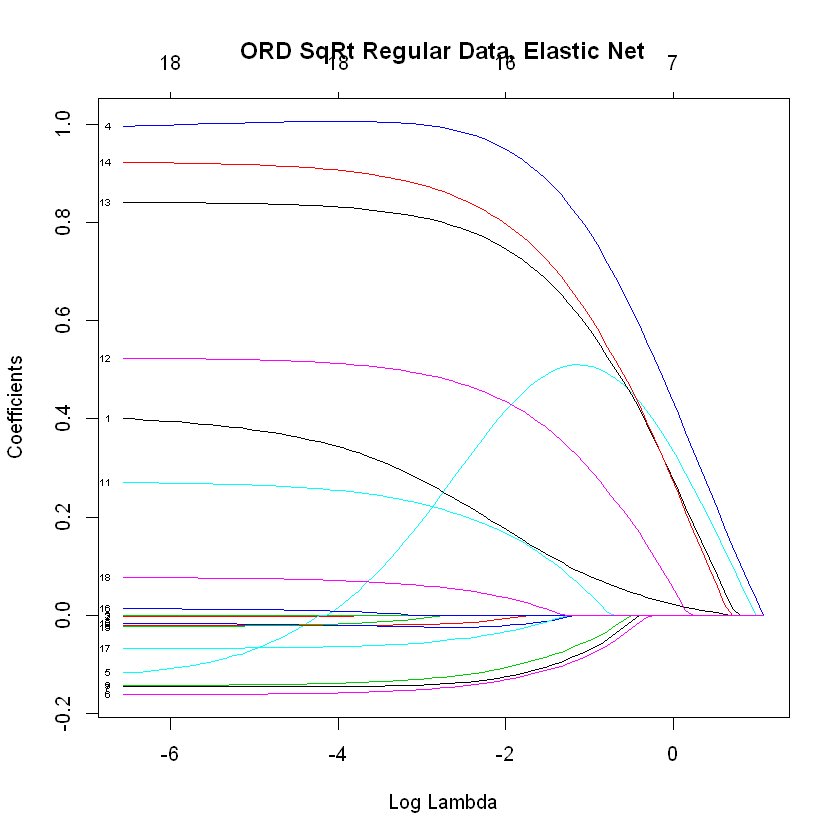

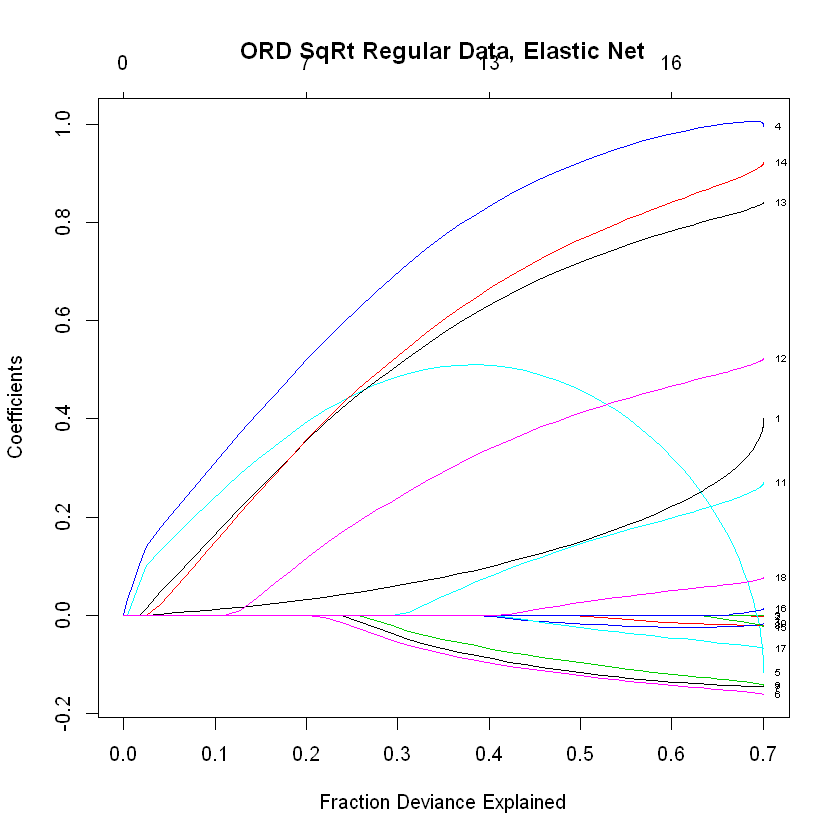


Compare Linear vs Elastic Net Models, ORD SqRt Regular


Call:
summary.resamples(object = ORDRegResample)

Models: ORDRegLinear, ORDRegEN 
Number of resamples: 50 

MAE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
ORDRegLinear 0.5674121 0.5937010 0.6060539 0.6070959 0.6228746 0.6578195    0
ORDRegEN     0.5513527 0.5914352 0.6043369 0.6065477 0.6206650 0.6558164    0

RMSE 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
ORDRegLinear 0.7186589 0.7560181 0.7694254 0.7718933 0.7869342 0.8287971    0
ORDRegEN     0.7127707 0.7501321 0.7693826 0.7720889 0.7933603 0.8295917    0

Rsquared 
                  Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
ORDRegLinear 0.6488674 0.6903089 0.6974508 0.6996093 0.7111980 0.7470884    0
ORDRegEN     0.6437204 0.6859281 0.7022098 0.6991466 0.7171727 0.7473104    0


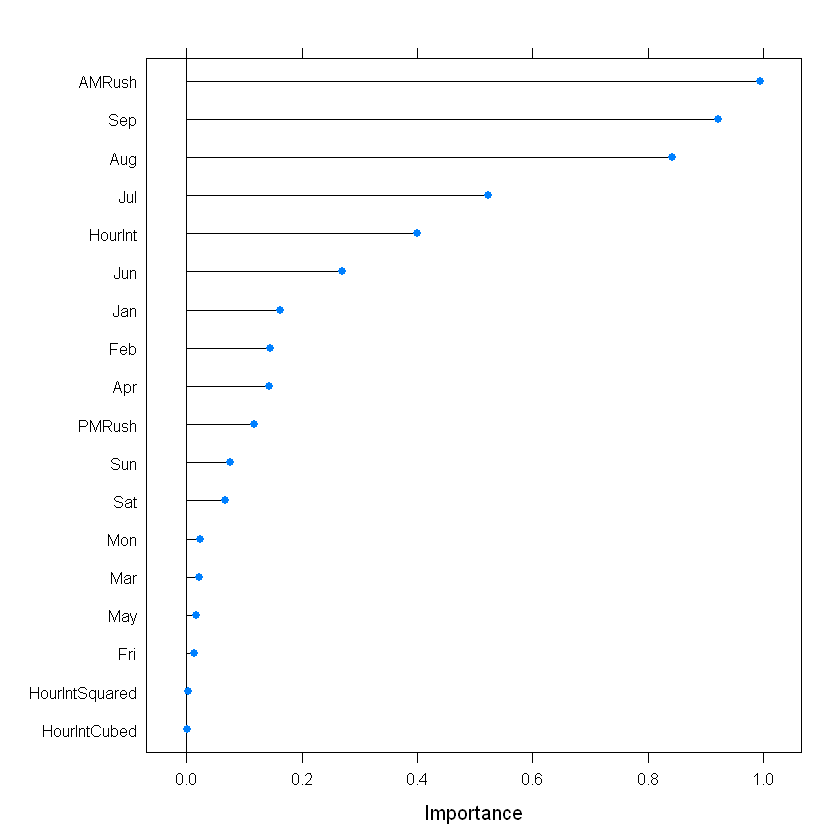

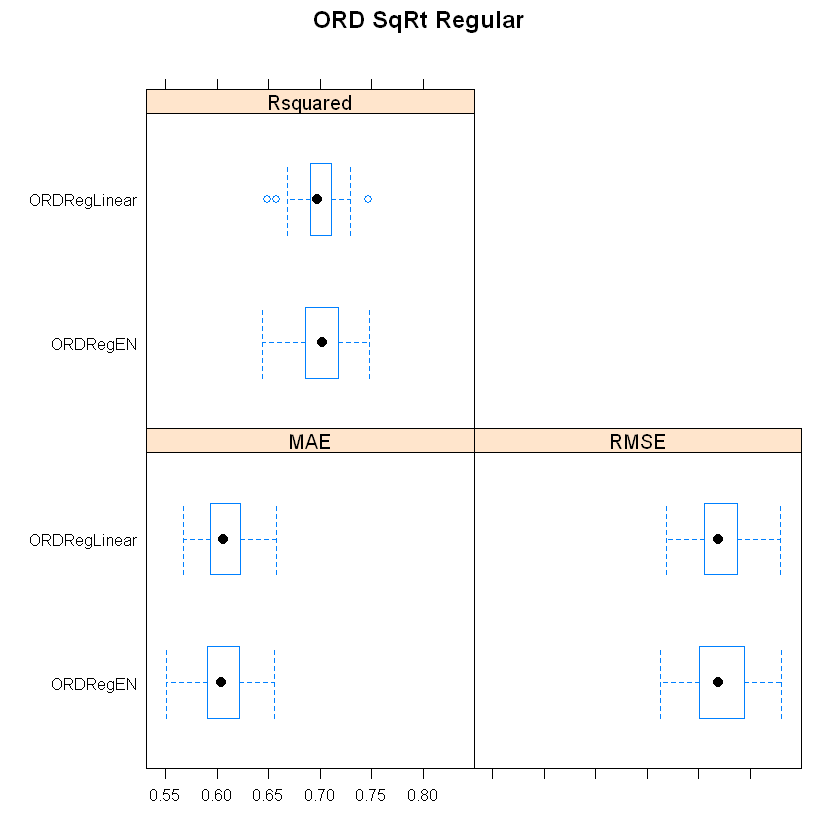


Best Model for Elastic Net ORD SqRt Regular


,alpha,lambda
11,0.1111111,1e-04


19 x 1 sparse Matrix of class "dgCMatrix"
                           1
(Intercept)     0.3815836044
HourInt         0.4009099427
HourIntSquared -0.0028373816
HourIntCubed   -0.0005957639
AMRush          0.9956997661
PMRush         -0.1169965802
Jan            -0.1620075107
Feb            -0.1461151532
Mar            -0.0215664871
Apr            -0.1431590495
May            -0.0169362875
Jun             0.2701693608
Jul             0.5235618189
Aug             0.8415260151
Sep             0.9227845332
Mon            -0.0237604471
Fri             0.0130547614
Sat            -0.0678985029
Sun             0.0765998640


Model RMSE of Training Data ORD Regular best fit Elastic Net
[1] 0.7696492

Model RMSE of Test Data ORD Regular best fit Elastic Net
[1] 0.7856631

Linear Regression Results ORD SqRt Regular Training Data Final
  intercept     RMSE  Rsquared      MAE     RMSESD RsquaredSD      MAESD
1      TRUE 1.241205 0.2228561 1.004298 0.02759707 0.02571123 0.02319227



Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.6833 -0.7960  0.2116  0.8640  4.3761 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 1.854696   0.039309  47.183  < 2e-16 ***
HourInt     0.041580   0.002672  15.560  < 2e-16 ***
AMRush      1.359591   0.054583  24.909  < 2e-16 ***
PMRush      0.886482   0.053965  16.427  < 2e-16 ***
Jun         0.333729   0.062106   5.374 8.06e-08 ***
Jul         0.648769   0.060874  10.658  < 2e-16 ***
Aug         0.985719   0.060924  16.180  < 2e-16 ***
Sep         1.034113   0.068481  15.101  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 1.24 on 5156 degrees of freedom
Multiple R-squared:  0.2244,	Adjusted R-squared:  0.2233 
F-statistic: 213.1 on 7 and 5156 DF,  p-value: < 2.2e-16


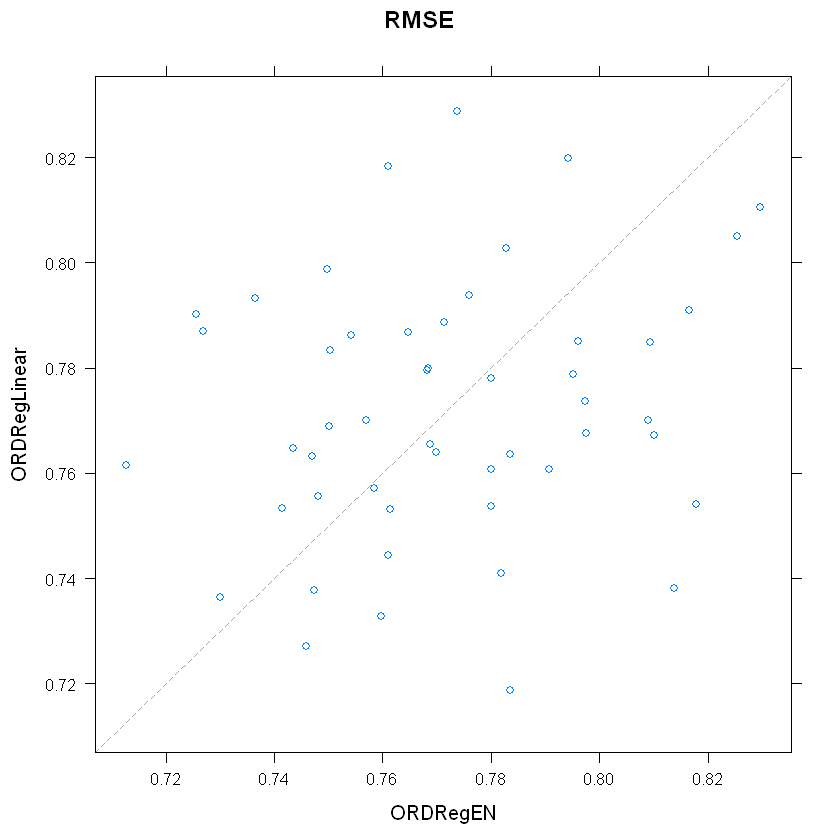

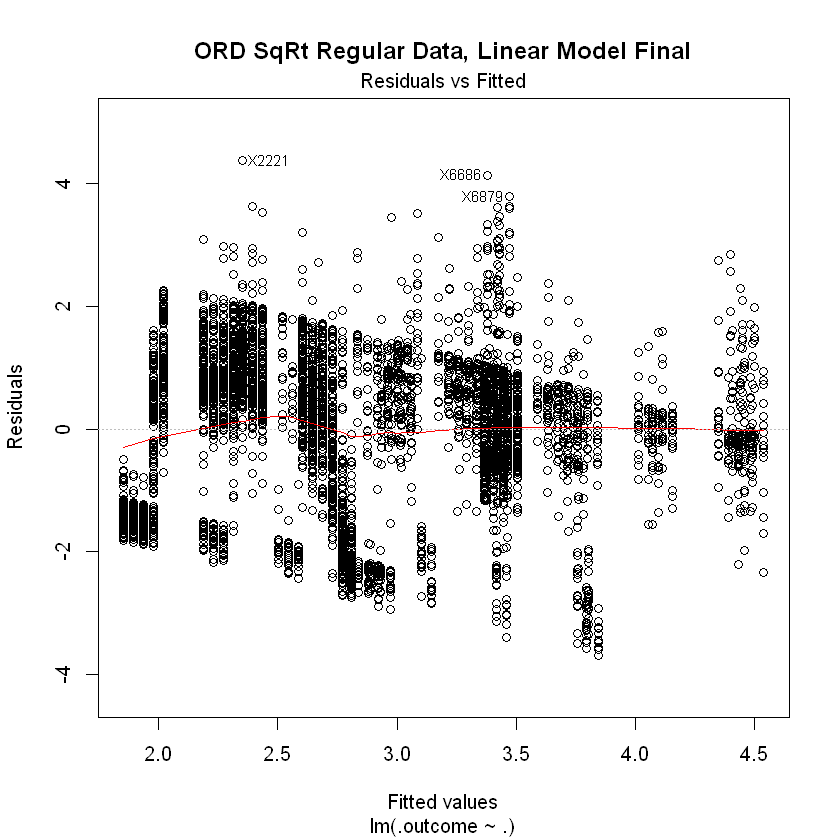

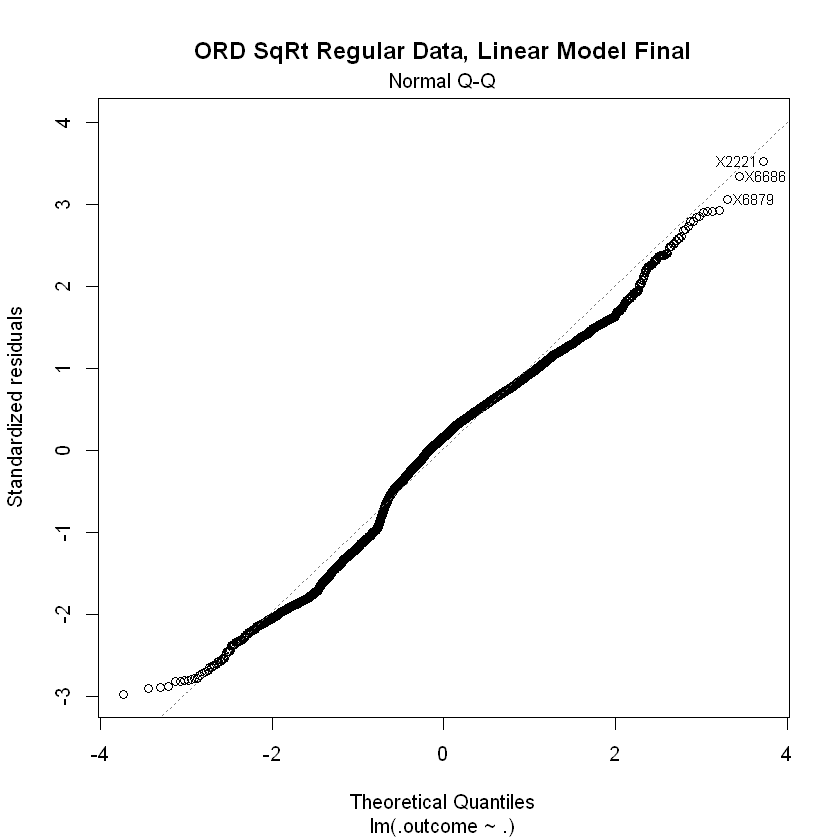

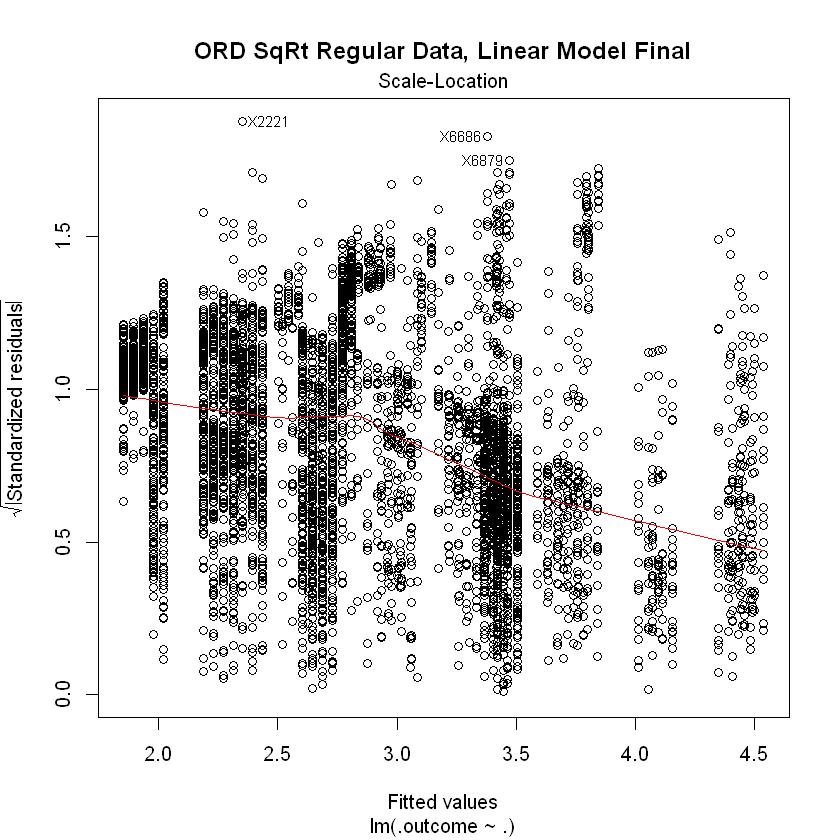

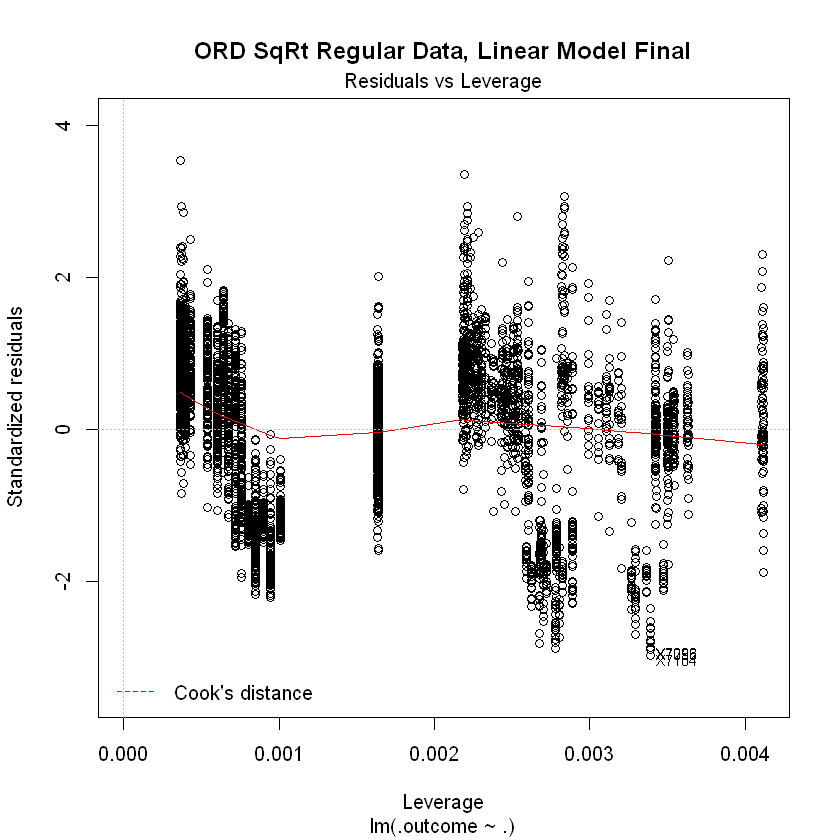

In [4]:
#!!!!!!!!! CHANGE TO R KERNEL !!!!!!!!!!!!!

#Cell name:  RIDGE, LASSO, AND ELASTIC NET REGRESSIONS CONTINUED
#This requires cell RIDGE, LASSO, AND ELASTIC NET REGRESSIONS to be run first
#This is in a separate cell to de-crap outputs, make consistent


#---------------------START JFK PRECHECK--------------------

cat("\nDataset for JFK SqRt PreCheck\n")
str(AptWaitsJFKPre)

#Data Partition
set.seed(1234)
AptWaitsJFKPreSample <- sample(2, nrow(AptWaitsJFKPre), replace=T, prob=c(0.7, 0.3))
    #Note:  replace=T appears to be bootstrapping, not cross-validating
    #Should we cross-validate instead?  Advantages/Disadvantages of each?  
    #Bootstrapping better for uses such as ensemble models or estimating parameters, may not help here
    #CV for evaluting model generalization--Bootstrapping for making model more generalizable
    #Which is the point here, or is this multi-purpose?  
AptWaitsJFKPreTrain <- AptWaitsJFKPre[AptWaitsJFKPreSample==1,]
AptWaitsJFKPreTest <- AptWaitsJFKPre[AptWaitsJFKPreSample==2,]

#Custom Control Parameters for Cross Validation
AptWaitsJFKPreCustom <- trainControl(method="repeatedcv", number=10, repeats=5, verboseIter=F)

#Train Linear model 
AptWaitsJFKPreLinear <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                              Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                              AptWaitsJFKPreTrain, method = "lm", trControl=AptWaitsJFKPreCustom)
cat("\nLinear Regression Results JFK SqRt PreCheck TrainingData\n")
print(AptWaitsJFKPreLinear$results)
summary(AptWaitsJFKPreLinear)
plot(AptWaitsJFKPreLinear$finalModel, main="JFK SqRt PreCheck Data, Linear Model")

#Train Elastic Net Regression
#Note:  no reason to do ridge or LASSO, build both into EN to save time, then compare linear to EN
set.seed(1234)
AptWaitsJFKPreEN <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                            Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                            AptWaitsJFKPreTrain, method = "glmnet", 
                            tuneGrid=expand.grid(alpha=seq(0, 1, length=10), lambda=seq(0.0001, 0.5, length=10)),
                            trControl=AptWaitsJFKPreCustom)
cat("\nElastic Net Outputs for JFK SqRt PreCheck\n")
plot(AptWaitsJFKPreEN$finalModel, xvar="lambda", label=T, main="JFK SqRt PreCheck Data, Elastic Net")
plot(AptWaitsJFKPreEN$finalModel, xvar="dev", label=T, main="JFK SqRt PreCheck Data, Elastic Net")
plot(varImp(AptWaitsJFKPreEN, scale=F, main="JFK SqRt PreCheck Data, Elastic Net"))

#Compare Models
cat("\nCompare Linear vs Elastic Net Models, JFK SqRt PreCheck")
JFKPreModels <- list(JFKPreLinear = AptWaitsJFKPreLinear, JFKPreEN = AptWaitsJFKPreEN)
JFKPreResample <- resamples(JFKPreModels)
summary(JFKPreResample)
bwplot(JFKPreResample, main="JFK SqRt PreCheck")
xyplot(JFKPreResample, metric="RMSE")

#Find best model for Elastic Net
cat("\nBest Model for Elastic Net JFK SqRt PreCheck\n")
AptWaitsJFKPreEN$bestTune  
coef(AptWaitsJFKPreEN$finalModel, s=AptWaitsJFKPreEN$bestTune$lambda)

#Run Test Data on Trained Model, Compare Training and Testing Data
AptWaitsJFKPreTrainPredicted <- predict(AptWaitsJFKPreEN, AptWaitsJFKPreTrain)
cat("\nModel RMSE of Training Data JFK PreCheck best fit Elastic Net\n")
print(sqrt(mean((AptWaitsJFKPreTrain$WaitTimeContinuousSqRt-AptWaitsJFKPreTrainPredicted)^2)))
AptWaitsJFKPreTestPredicted <- predict(AptWaitsJFKPreEN, AptWaitsJFKPreTest)
cat("\nModel RMSE of Test Data JFK PreCheck best fit Elastic Net\n")
print(sqrt(mean((AptWaitsJFKPreTest$WaitTimeContinuousSqRt-AptWaitsJFKPreTestPredicted)^2)))

#Based on Elastic Net suggestions of overfitting, Prepare final linear model
AptWaitsJFKPreLinearFinal <- train(WaitTimeContinuousSqRt ~ HourInt+AMRush+PMRush+
                              Jan+Feb+May+Jun+Jul+Sep,
                              AptWaitsJFKPreTrain, method = "lm", trControl=AptWaitsJFKPreCustom)
cat("\nLinear Regression Results JFK SqRt PreCheck Training Data Final\n")
print(AptWaitsJFKPreLinearFinal$results)
summary(AptWaitsJFKPreLinearFinal)
plot(AptWaitsJFKPreLinearFinal$finalModel, main="JFK SqRt PreCheck Data, Linear Model Final")

#Train Elastic Net Regression Final
set.seed(1234)
AptWaitsJFKPreENFinal <- train(WaitTimeContinuousSqRt ~ HourInt+AMRush+PMRush+
                            Jan+Feb+May+Jun+Jul+Sep,
                            AptWaitsJFKPreTrain, method = "glmnet", 
                            tuneGrid=expand.grid(alpha=seq(0, 1, length=10), lambda=seq(0.0001, 0.5, length=10)),
                            trControl=AptWaitsJFKPreCustom)
cat("\nElastic Net Outputs for JFK SqRt PreCheck Final\n")
plot(AptWaitsJFKPreENFinal$finalModel, xvar="lambda", label=T, main="JFK SqRt PreCheck Data, Elastic Net Final")
plot(AptWaitsJFKPreENFinal$finalModel, xvar="dev", label=T, main="JFK SqRt PreCheck Data, Elastic Net Final")
plot(varImp(AptWaitsJFKPreENFinal, scale=F, main="JFK SqRt PreCheck Data, Elastic Net Final"))

#Compare Models Final
cat("\nCompare Linear vs Elastic Net Models, JFK SqRt PreCheck Final")
JFKPreModelsFinal <- list(JFKPreLinearFinal = AptWaitsJFKPreLinearFinal, JFKPreENFinal = AptWaitsJFKPreENFinal)
JFKPreResampleFinal <- resamples(JFKPreModelsFinal)
summary(JFKPreResampleFinal)
bwplot(JFKPreResampleFinal, main="JFK SqRt PreCheck Final")
xyplot(JFKPreResampleFinal, metric="RMSE")

#Find best model for Elastic Net Final
cat("\nBest Model for Elastic Net JFK SqRt PreCheck Final\n")
AptWaitsJFKPreENFinal$bestTune  
coef(AptWaitsJFKPreENFinal$finalModel, s=AptWaitsJFKPreENFinal$bestTune$lambda)

#Run Test Data on Trained Model, Compare Training and Testing Data Final
AptWaitsJFKPreTrainPredictedFinal <- predict(AptWaitsJFKPreENFinal, AptWaitsJFKPreTrain)
cat("\nModel RMSE of Training Data JFK PreCheck best fit Elastic Net Final\n")
print(sqrt(mean((AptWaitsJFKPreTrain$WaitTimeContinuousSqRt-AptWaitsJFKPreTrainPredictedFinal)^2)))
AptWaitsJFKPreTestPredictedFinal <- predict(AptWaitsJFKPreENFinal, AptWaitsJFKPreTest)
cat("\nModel RMSE of Test Data JFK PreCheck best fit Elastic Net Final\n")
print(sqrt(mean((AptWaitsJFKPreTest$WaitTimeContinuousSqRt-AptWaitsJFKPreTestPredictedFinal)^2)))

#---------------------END JFK PRECHECK--------------------


#---------------------START JFK REGULAR--------------------

cat("\nDataset for JFK SqRt Regular\n")
str(AptWaitsJFKReg)

#Data Partition
set.seed(1234)
AptWaitsJFKRegSample <- sample(2, nrow(AptWaitsJFKReg), replace=T, prob=c(0.7, 0.3))
AptWaitsJFKRegTrain <- AptWaitsJFKReg[AptWaitsJFKRegSample==1,]
AptWaitsJFKRegTest <- AptWaitsJFKReg[AptWaitsJFKRegSample==2,]

#Custom Control Parameters for Cross Validation
AptWaitsJFKRegCustom <- trainControl(method="repeatedcv", number=10, repeats=5, verboseIter=F)

#Train Linear model 
AptWaitsJFKRegLinear <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                              Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                              AptWaitsJFKRegTrain, method = "lm", trControl=AptWaitsJFKRegCustom)
cat("\nLinear Regression Results JFK SqRt Regular TrainingData\n")
print(AptWaitsJFKRegLinear$results)
summary(AptWaitsJFKRegLinear)
plot(AptWaitsJFKRegLinear$finalModel, main="JFK SqRt Regular Data, Linear Model")

#Train Elastic Net Regression
#Note:  no reason to do ridge or LASSO, build both into EN to save time, then compare linear to EN
set.seed(1234)
AptWaitsJFKRegEN <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                            Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                            AptWaitsJFKRegTrain, method = "glmnet", 
                            tuneGrid=expand.grid(alpha=seq(0, 1, length=10), lambda=seq(0.0001, 0.5, length=10)),
                            trControl=AptWaitsJFKRegCustom)
cat("\nElastic Net Outputs for JFK SqRt Regular\n")
plot(AptWaitsJFKRegEN$finalModel, xvar="lambda", label=T, main="JFK SqRt Regular Data, Elastic Net")
plot(AptWaitsJFKRegEN$finalModel, xvar="dev", label=T, main="JFK SqRt Regular Data, Elastic Net")
plot(varImp(AptWaitsJFKRegEN, scale=F, main="JFK SqRt Regular Data, Elastic Net"))

#Compare Models
cat("\nCompare Linear vs Elastic Net Models, JFK SqRt Regular")
JFKRegModels <- list(JFKRegLinear = AptWaitsJFKRegLinear, JFKRegEN = AptWaitsJFKRegEN)
JFKRegResample <- resamples(JFKRegModels)
summary(JFKRegResample)
bwplot(JFKRegResample, main="JFK SqRt Regular")
xyplot(JFKRegResample, metric="RMSE")

#Find best model for Elastic Net
cat("\nBest Model for Elastic Net JFK SqRt Regular\n")
AptWaitsJFKRegEN$bestTune  
coef(AptWaitsJFKRegEN$finalModel, s=AptWaitsJFKRegEN$bestTune$lambda)

#Run Test Data on Trained Model, Compare Training and Testing Data
AptWaitsJFKRegTrainPredicted <- predict(AptWaitsJFKRegEN, AptWaitsJFKRegTrain)
cat("\nModel RMSE of Training Data JFK Regular best fit Elastic Net\n")
print(sqrt(mean((AptWaitsJFKRegTrain$WaitTimeContinuousSqRt-AptWaitsJFKRegTrainPredicted)^2)))
AptWaitsJFKRegTestPredicted <- predict(AptWaitsJFKRegEN, AptWaitsJFKRegTest)
cat("\nModel RMSE of Test Data JFK Regular best fit Elastic Net\n")
print(sqrt(mean((AptWaitsJFKRegTest$WaitTimeContinuousSqRt-AptWaitsJFKRegTestPredicted)^2)))

#Based on Elastic Net suggestions of overfitting, Prepare final linear model
AptWaitsJFKRegLinearFinal <- train(WaitTimeContinuousSqRt ~ HourInt+AMRush+
                              Jan+Feb+Mar+Apr+May+Jun+Aug,
                              AptWaitsJFKRegTrain, method = "lm", trControl=AptWaitsJFKRegCustom)
cat("\nLinear Regression Results JFK SqRt Regular Training Data Final\n")
print(AptWaitsJFKRegLinearFinal$results)
summary(AptWaitsJFKRegLinearFinal)
plot(AptWaitsJFKRegLinearFinal$finalModel, main="JFK SqRt Regular Data, Linear Model Final")

#---------------------END JFK REGULAR--------------------


#---------------------START EWR PRECHECK--------------------

cat("\nDataset for EWR SqRt PreCheck\n")
str(AptWaitsEWRPre)

#Data Partition
set.seed(1234)
AptWaitsEWRPreSample <- sample(2, nrow(AptWaitsEWRPre), replace=T, prob=c(0.7, 0.3))
AptWaitsEWRPreTrain <- AptWaitsEWRPre[AptWaitsEWRPreSample==1,]
AptWaitsEWRPreTest <- AptWaitsEWRPre[AptWaitsEWRPreSample==2,]

#Custom Control Parameters for Cross Validation
AptWaitsEWRPreCustom <- trainControl(method="repeatedcv", number=10, repeats=5, verboseIter=F)

#Train Linear model 
AptWaitsEWRPreLinear <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                              Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                              AptWaitsEWRPreTrain, method = "lm", trControl=AptWaitsEWRPreCustom)
cat("\nLinear Regression Results EWR SqRt PreCheck TrainingData\n")
print(AptWaitsEWRPreLinear$results)
summary(AptWaitsEWRPreLinear)
plot(AptWaitsEWRPreLinear$finalModel, main="EWR SqRt PreCheck Data, Linear Model")

#Train Elastic Net Preression
#Note:  no reason to do ridge or LASSO, build both into EN to save time, then compare linear to EN
set.seed(1234)
AptWaitsEWRPreEN <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                            Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                            AptWaitsEWRPreTrain, method = "glmnet", 
                            tuneGrid=expand.grid(alpha=seq(0, 1, length=10), lambda=seq(0.0001, 0.5, length=10)),
                            trControl=AptWaitsEWRPreCustom)
cat("\nElastic Net Outputs for EWR SqRt PreCheck\n")
plot(AptWaitsEWRPreEN$finalModel, xvar="lambda", label=T, main="EWR SqRt PreCheck Data, Elastic Net")
plot(AptWaitsEWRPreEN$finalModel, xvar="dev", label=T, main="EWR SqRt PreCheck Data, Elastic Net")
plot(varImp(AptWaitsEWRPreEN, scale=F, main="EWR SqRt PreCheck Data, Elastic Net"))

#Compare Models
cat("\nCompare Linear vs Elastic Net Models, EWR SqRt PreCheck")
EWRPreModels <- list(EWRPreLinear = AptWaitsEWRPreLinear, EWRPreEN = AptWaitsEWRPreEN)
EWRPreResample <- resamples(EWRPreModels)
summary(EWRPreResample)
bwplot(EWRPreResample, main="EWR SqRt PreCheck")
xyplot(EWRPreResample, metric="RMSE")

#Find best model for Elastic Net
cat("\nBest Model for Elastic Net EWR SqRt PreCheck\n")
AptWaitsEWRPreEN$bestTune  
coef(AptWaitsEWRPreEN$finalModel, s=AptWaitsEWRPreEN$bestTune$lambda)

#Run Test Data on Trained Model, Compare Training and Testing Data
AptWaitsEWRPreTrainPredicted <- predict(AptWaitsEWRPreEN, AptWaitsEWRPreTrain)
cat("\nModel RMSE of Training Data EWR PreCheck best fit Elastic Net\n")
print(sqrt(mean((AptWaitsEWRPreTrain$WaitTimeContinuousSqRt-AptWaitsEWRPreTrainPredicted)^2)))
AptWaitsEWRPreTestPredicted <- predict(AptWaitsEWRPreEN, AptWaitsEWRPreTest)
cat("\nModel RMSE of Test Data EWR PreCheck best fit Elastic Net\n")
print(sqrt(mean((AptWaitsEWRPreTest$WaitTimeContinuousSqRt-AptWaitsEWRPreTestPredicted)^2)))

#Based on Elastic Net suggestions of overfitting, Prepare final linear model
AptWaitsEWRPreLinearFinal <- train(WaitTimeContinuousSqRt ~ HourInt+AMRush+PMRush+
                              Apr+May+Jun+Jul+Aug+Sep+Sat,
                              AptWaitsEWRPreTrain, method = "lm", trControl=AptWaitsEWRPreCustom)
cat("\nLinear Regression Results EWR SqRt PreCheck Training Data Final\n")
print(AptWaitsEWRPreLinearFinal$results)
summary(AptWaitsEWRPreLinearFinal)
plot(AptWaitsEWRPreLinearFinal$finalModel, main="EWR SqRt PreCheck Data, Linear Model Final")

#---------------------END EWR PRECHECK--------------------


#---------------------START EWR REGULAR--------------------

cat("\nDataset for EWR SqRt Regular\n")
str(AptWaitsEWRReg)

#Data Partition
set.seed(1234)
AptWaitsEWRRegSample <- sample(2, nrow(AptWaitsEWRReg), replace=T, prob=c(0.7, 0.3))
AptWaitsEWRRegTrain <- AptWaitsEWRReg[AptWaitsEWRRegSample==1,]
AptWaitsEWRRegTest <- AptWaitsEWRReg[AptWaitsEWRRegSample==2,]

#Custom Control Parameters for Cross Validation
AptWaitsEWRRegCustom <- trainControl(method="repeatedcv", number=10, repeats=5, verboseIter=F)

#Train Linear model 
AptWaitsEWRRegLinear <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                              Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                              AptWaitsEWRRegTrain, method = "lm", trControl=AptWaitsEWRRegCustom)
cat("\nLinear Regression Results EWR SqRt Regular TrainingData\n")
print(AptWaitsEWRRegLinear$results)
summary(AptWaitsEWRRegLinear)
plot(AptWaitsEWRRegLinear$finalModel, main="EWR SqRt Regular Data, Linear Model")

#Train Elastic Net Regression
#Note:  no reason to do ridge or LASSO, build both into EN to save time, then compare linear to EN
set.seed(1234)
AptWaitsEWRRegEN <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                            Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                            AptWaitsEWRRegTrain, method = "glmnet", 
                            tuneGrid=expand.grid(alpha=seq(0, 1, length=10), lambda=seq(0.0001, 0.5, length=10)),
                            trControl=AptWaitsEWRRegCustom)
cat("\nElastic Net Outputs for EWR SqRt Regular\n")
plot(AptWaitsEWRRegEN$finalModel, xvar="lambda", label=T, main="EWR SqRt Regular Data, Elastic Net")
plot(AptWaitsEWRRegEN$finalModel, xvar="dev", label=T, main="EWR SqRt Regular Data, Elastic Net")
plot(varImp(AptWaitsEWRRegEN, scale=F, main="EWR SqRt Regular Data, Elastic Net"))

#Compare Models
cat("\nCompare Linear vs Elastic Net Models, EWR SqRt Regular")
EWRRegModels <- list(EWRRegLinear = AptWaitsEWRRegLinear, EWRRegEN = AptWaitsEWRRegEN)
EWRRegResample <- resamples(EWRRegModels)
summary(EWRRegResample)
bwplot(EWRRegResample, main="EWR SqRt Regular")
xyplot(EWRRegResample, metric="RMSE")

#Find best model for Elastic Net
cat("\nBest Model for Elastic Net EWR SqRt Regular\n")
AptWaitsEWRRegEN$bestTune  
coef(AptWaitsEWRRegEN$finalModel, s=AptWaitsEWRRegEN$bestTune$lambda)

#Run Test Data on Trained Model, Compare Training and Testing Data
AptWaitsEWRRegTrainPredicted <- predict(AptWaitsEWRRegEN, AptWaitsEWRRegTrain)
cat("\nModel RMSE of Training Data EWR Regular best fit Elastic Net\n")
print(sqrt(mean((AptWaitsEWRRegTrain$WaitTimeContinuousSqRt-AptWaitsEWRRegTrainPredicted)^2)))
AptWaitsEWRRegTestPredicted <- predict(AptWaitsEWRRegEN, AptWaitsEWRRegTest)
cat("\nModel RMSE of Test Data EWR Regular best fit Elastic Net\n")
print(sqrt(mean((AptWaitsEWRRegTest$WaitTimeContinuousSqRt-AptWaitsEWRRegTestPredicted)^2)))

#Based on Elastic Net suggestions of overfitting, Prepare final linear model
AptWaitsEWRRegLinearFinal <- train(WaitTimeContinuousSqRt ~ HourInt+AMRush+PMRush+
                              Jun+Jul+Aug+Sep+Fri,
                              AptWaitsEWRRegTrain, method = "lm", trControl=AptWaitsEWRRegCustom)
cat("\nLinear Regression Results EWR SqRt Regular Training Data Final\n")
print(AptWaitsEWRRegLinearFinal$results)
summary(AptWaitsEWRRegLinearFinal)
plot(AptWaitsEWRRegLinearFinal$finalModel, main="EWR SqRt Regular Data, Linear Model Final")

#---------------------END EWR REGULAR--------------------


#---------------------START ORD PRECHECK--------------------

cat("\nDataset for ORD SqRt PreCheck\n")
str(AptWaitsORDPre)

#Data Partition
set.seed(1234)
AptWaitsORDPreSample <- sample(2, nrow(AptWaitsORDPre), replace=T, prob=c(0.7, 0.3))
AptWaitsORDPreTrain <- AptWaitsORDPre[AptWaitsORDPreSample==1,]
AptWaitsORDPreTest <- AptWaitsORDPre[AptWaitsORDPreSample==2,]

#Custom Control Parameters for Cross Validation
AptWaitsORDPreCustom <- trainControl(method="repeatedcv", number=10, repeats=5, verboseIter=F)

#Train Linear model 
AptWaitsORDPreLinear <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                              Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                              AptWaitsORDPreTrain, method = "lm", trControl=AptWaitsORDPreCustom)
cat("\nLinear Regression Results ORD SqRt PreCheck TrainingData\n")
print(AptWaitsORDPreLinear$results)
summary(AptWaitsORDPreLinear)
plot(AptWaitsORDPreLinear$finalModel, main="ORD SqRt PreCheck Data, Linear Model")

#Train Elastic Net Preression
#Note:  no reason to do ridge or LASSO, build both into EN to save time, then compare linear to EN
set.seed(1234)
AptWaitsORDPreEN <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                            Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                            AptWaitsORDPreTrain, method = "glmnet", 
                            tuneGrid=expand.grid(alpha=seq(0, 1, length=10), lambda=seq(0.0001, 0.5, length=10)),
                            trControl=AptWaitsORDPreCustom)
cat("\nElastic Net Outputs for ORD SqRt PreCheck\n")
plot(AptWaitsORDPreEN$finalModel, xvar="lambda", label=T, main="ORD SqRt PreCheck Data, Elastic Net")
plot(AptWaitsORDPreEN$finalModel, xvar="dev", label=T, main="ORD SqRt PreCheck Data, Elastic Net")
plot(varImp(AptWaitsORDPreEN, scale=F, main="ORD SqRt PreCheck Data, Elastic Net"))

#Compare Models
cat("\nCompare Linear vs Elastic Net Models, ORD SqRt PreCheck")
ORDPreModels <- list(ORDPreLinear = AptWaitsORDPreLinear, ORDPreEN = AptWaitsORDPreEN)
ORDPreResample <- resamples(ORDPreModels)
summary(ORDPreResample)
bwplot(ORDPreResample, main="ORD SqRt PreCheck")
xyplot(ORDPreResample, metric="RMSE")

#Find best model for Elastic Net
cat("\nBest Model for Elastic Net ORD SqRt PreCheck\n")
AptWaitsORDPreEN$bestTune  
coef(AptWaitsORDPreEN$finalModel, s=AptWaitsORDPreEN$bestTune$lambda)

#Run Test Data on Trained Model, Compare Training and Testing Data
AptWaitsORDPreTrainPredicted <- predict(AptWaitsORDPreEN, AptWaitsORDPreTrain)
cat("\nModel RMSE of Training Data ORD PreCheck best fit Elastic Net\n")
print(sqrt(mean((AptWaitsORDPreTrain$WaitTimeContinuousSqRt-AptWaitsORDPreTrainPredicted)^2)))
AptWaitsORDPreTestPredicted <- predict(AptWaitsORDPreEN, AptWaitsORDPreTest)
cat("\nModel RMSE of Test Data ORD PreCheck best fit Elastic Net\n")
print(sqrt(mean((AptWaitsORDPreTest$WaitTimeContinuousSqRt-AptWaitsORDPreTestPredicted)^2)))

#Based on Elastic Net suggestions of overfitting, Prepare final linear model
AptWaitsORDPreLinearFinal <- train(WaitTimeContinuousSqRt ~ AMRush+PMRush+
                              Jan+Apr+May+Jun+Jul+Aug+Sep+Sat,
                              AptWaitsORDPreTrain, method = "lm", trControl=AptWaitsORDPreCustom)
cat("\nLinear Regression Results ORD SqRt PreCheck Training Data Final\n")
print(AptWaitsORDPreLinearFinal$results)
summary(AptWaitsORDPreLinearFinal)
plot(AptWaitsORDPreLinearFinal$finalModel, main="ORD SqRt PreCheck Data, Linear Model Final")

#---------------------END ORD PRECHECK--------------------


#---------------------START ORD REGULAR--------------------

cat("\nDataset for ORD SqRt Regular\n")
str(AptWaitsORDReg)

#Data Partition
set.seed(1234)
AptWaitsORDRegSample <- sample(2, nrow(AptWaitsORDReg), replace=T, prob=c(0.7, 0.3))
AptWaitsORDRegTrain <- AptWaitsORDReg[AptWaitsORDRegSample==1,]
AptWaitsORDRegTest <- AptWaitsORDReg[AptWaitsORDRegSample==2,]

#Custom Control Parameters for Cross Validation
AptWaitsORDRegCustom <- trainControl(method="repeatedcv", number=10, repeats=5, verboseIter=F)

#Train Linear model 
AptWaitsORDRegLinear <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                              Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                              AptWaitsORDRegTrain, method = "lm", trControl=AptWaitsORDRegCustom)
cat("\nLinear Regression Results ORD SqRt Regular TrainingData\n")
print(AptWaitsORDRegLinear$results)
summary(AptWaitsORDRegLinear)
plot(AptWaitsORDRegLinear$finalModel, main="ORD SqRt Regular Data, Linear Model")

#Train Elastic Net Regression
#Note:  no reason to do ridge or LASSO, build both into EN to save time, then compare linear to EN
set.seed(1234)
AptWaitsORDRegEN <- train(WaitTimeContinuousSqRt ~ HourInt+HourIntSquared+HourIntCubed+AMRush+PMRush+
                            Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Mon+Fri+Sat+Sun,
                            AptWaitsORDRegTrain, method = "glmnet", 
                            tuneGrid=expand.grid(alpha=seq(0, 1, length=10), lambda=seq(0.0001, 0.5, length=10)),
                            trControl=AptWaitsORDRegCustom)
cat("\nElastic Net Outputs for ORD SqRt Regular\n")
plot(AptWaitsORDRegEN$finalModel, xvar="lambda", label=T, main="ORD SqRt Regular Data, Elastic Net")
plot(AptWaitsORDRegEN$finalModel, xvar="dev", label=T, main="ORD SqRt Regular Data, Elastic Net")
plot(varImp(AptWaitsORDRegEN, scale=F, main="ORD SqRt Regular Data, Elastic Net"))

#Compare Models
cat("\nCompare Linear vs Elastic Net Models, ORD SqRt Regular")
ORDRegModels <- list(ORDRegLinear = AptWaitsORDRegLinear, ORDRegEN = AptWaitsORDRegEN)
ORDRegResample <- resamples(ORDRegModels)
summary(ORDRegResample)
bwplot(ORDRegResample, main="ORD SqRt Regular")
xyplot(ORDRegResample, metric="RMSE")

#Find best model for Elastic Net
cat("\nBest Model for Elastic Net ORD SqRt Regular\n")
AptWaitsORDRegEN$bestTune  
coef(AptWaitsORDRegEN$finalModel, s=AptWaitsORDRegEN$bestTune$lambda)

#Run Test Data on Trained Model, Compare Training and Testing Data
AptWaitsORDRegTrainPredicted <- predict(AptWaitsORDRegEN, AptWaitsORDRegTrain)
cat("\nModel RMSE of Training Data ORD Regular best fit Elastic Net\n")
print(sqrt(mean((AptWaitsORDRegTrain$WaitTimeContinuousSqRt-AptWaitsORDRegTrainPredicted)^2)))
AptWaitsORDRegTestPredicted <- predict(AptWaitsORDRegEN, AptWaitsORDRegTest)
cat("\nModel RMSE of Test Data ORD Regular best fit Elastic Net\n")
print(sqrt(mean((AptWaitsORDRegTest$WaitTimeContinuousSqRt-AptWaitsORDRegTestPredicted)^2)))

#Based on Elastic Net suggestions of overfitting, Prepare final linear model
AptWaitsORDRegLinearFinal <- train(WaitTimeContinuousSqRt ~ HourInt+AMRush+PMRush+
                              Jun+Jul+Aug+Sep,
                              AptWaitsORDRegTrain, method = "lm", trControl=AptWaitsORDRegCustom)
cat("\nLinear Regression Results ORD SqRt Regular Training Data Final\n")
print(AptWaitsORDRegLinearFinal$results)
summary(AptWaitsORDRegLinearFinal)
plot(AptWaitsORDRegLinearFinal$finalModel, main="ORD SqRt Regular Data, Linear Model Final")

#---------------------END ORD REGULAR--------------------












Registered S3 method overwritten by 'rvest':
  method            from
  read_xml.response xml2
-- Attaching packages --------------------------------------- tidyverse 1.2.1 --
v tibble  2.1.1     v purrr   0.3.2
v tidyr   0.8.3     v stringr 1.4.0
v readr   1.3.1     v forcats 0.4.0
-- Conflicts ------------------------------------------ tidyverse_conflicts() --
x dplyr::filter() masks stats::filter()
x dplyr::lag()    masks stats::lag()
Warning message:
"package 'survival' was built under R version 3.6.1"Warning message:
"package 'flexsurv' was built under R version 3.6.1"Warning message:
"package 'rms' was built under R version 3.6.1"Loading required package: Hmisc
Warning message:
"package 'Hmisc' was built under R version 3.6.1"Loading required package: lattice
Loading required package: Formula

Attaching package: 'Hmisc'

The following objects are masked from 'package:dplyr':

    src, summarize

The following objects are masked from 'package:base':

    format.pval, units

Loadin


JFKPre Wait15orMore


Warning message:
"`as.tibble()` is deprecated, use `as_tibble()` (but mind the new semantics).
This warning is displayed once per session."

Wait15orMore,n
0,5972



JFKReg Wait15orMore


Wait15orMore,n
0,5355
1,1965



EWRPre Wait15orMore


Wait15orMore,n
0,5184
1,1



EWRReg Wait15orMore


Wait15orMore,n
0,5307
1,1910



ORDPre Wait15orMore


Wait15orMore,n
0,5260
1,2



ORDReg Wait15orMore


Wait15orMore,n
0,5239
1,2081



Summary of WaitTimeContinuousSqRt


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.02014 0.76931 1.32726 1.46498 1.96914 6.52791 


Summary of X Variables


    PreCheck           CatX            CatIV             JFK          
 Min.   :0.0000   Min.   :0.0000   Min.   :0.0000   Min.   :0.000000  
 1st Qu.:0.0000   1st Qu.:0.0000   1st Qu.:0.0000   1st Qu.:0.000000  
 Median :0.0000   Median :0.0000   Median :0.0000   Median :0.000000  
 Mean   :0.3297   Mean   :0.1683   Mean   :0.1097   Mean   :0.006603  
 3rd Qu.:1.0000   3rd Qu.:0.0000   3rd Qu.:0.0000   3rd Qu.:0.000000  
 Max.   :1.0000   Max.   :1.0000   Max.   :1.0000   Max.   :1.000000  
      ORD                EWR               AMRush      
 Min.   :0.000000   Min.   :0.000000   Min.   :0.0000  
 1st Qu.:0.000000   1st Qu.:0.000000   1st Qu.:0.0000  
 Median :0.000000   Median :0.000000   Median :0.0000  
 Mean   :0.005998   Mean   :0.006361   Mean   :0.1802  
 3rd Qu.:0.000000   3rd Qu.:0.000000   3rd Qu.:0.0000  
 Max.   :1.000000   Max.   :1.000000   Max.   :1.0000  

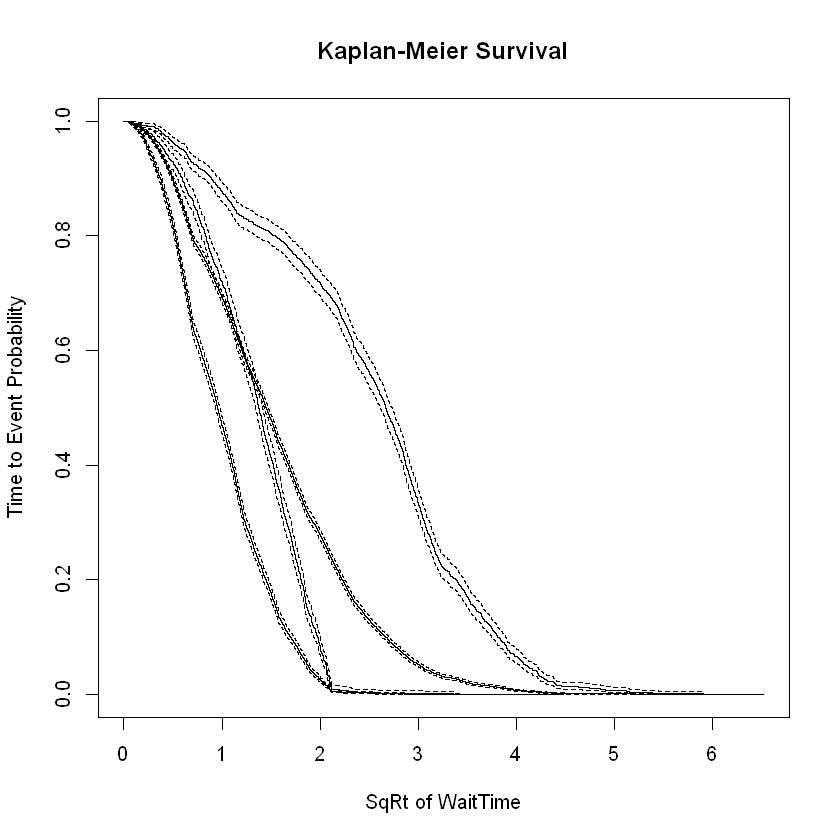

Call:
coxph(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    method = "breslow")

  n= 16507, number of events= 16507 

                  coef exp(coef) se(coef)       z Pr(>|z|)    
XVarsPreCheck  1.06633   2.90469  0.01856  57.467  < 2e-16 ***
XVarsCatX     -0.68045   0.50639  0.02252 -30.214  < 2e-16 ***
XVarsCatIV     0.54703   1.72812  0.02553  21.425  < 2e-16 ***
XVarsJFK      -0.37132   0.68982  0.09791  -3.792 0.000149 ***
XVarsORD      -0.41277   0.66181  0.10323  -3.999 6.37e-05 ***
XVarsEWR      -0.21242   0.80863  0.09971  -2.130 0.033152 *  
XVarsAMRush   -0.32638   0.72153  0.02036 -16.028  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

              exp(coef) exp(-coef) lower .95 upper .95
XVarsPreCheck    2.9047     0.3443    2.8009    3.0123
XVarsCatX        0.5064     1.9748    0.4845    0.5292
XVarsCatIV       1.7281     0.5787    1.6438    1.8168
XVarsJFK         0.6898     1.4496    0.5694    0.8358
XVarsORD         0.661

                  rho    chisq        p
XVarsPreCheck  0.0860 129.4936 5.29e-30
XVarsCatX      0.0451  32.0307 1.52e-08
XVarsCatIV    -0.0784 101.1951 8.34e-24
XVarsJFK       0.0203   6.7959 9.14e-03
XVarsORD       0.0016   0.0423 8.37e-01
XVarsEWR      -0.0105   1.8087 1.79e-01
XVarsAMRush    0.0234   8.9876 2.72e-03
GLOBAL             NA 371.5951 2.92e-76

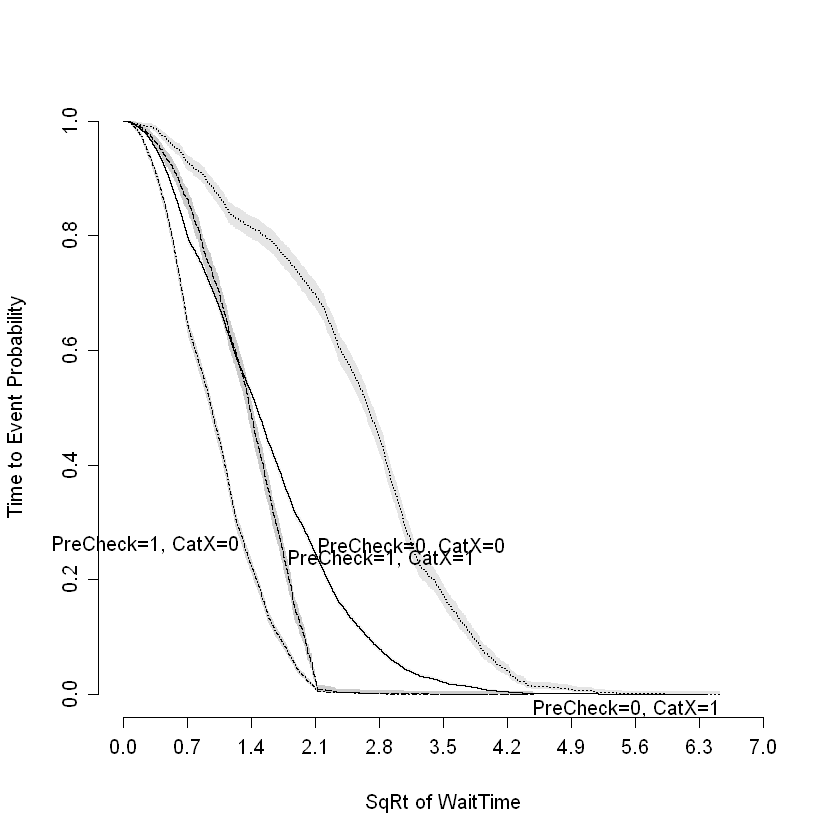

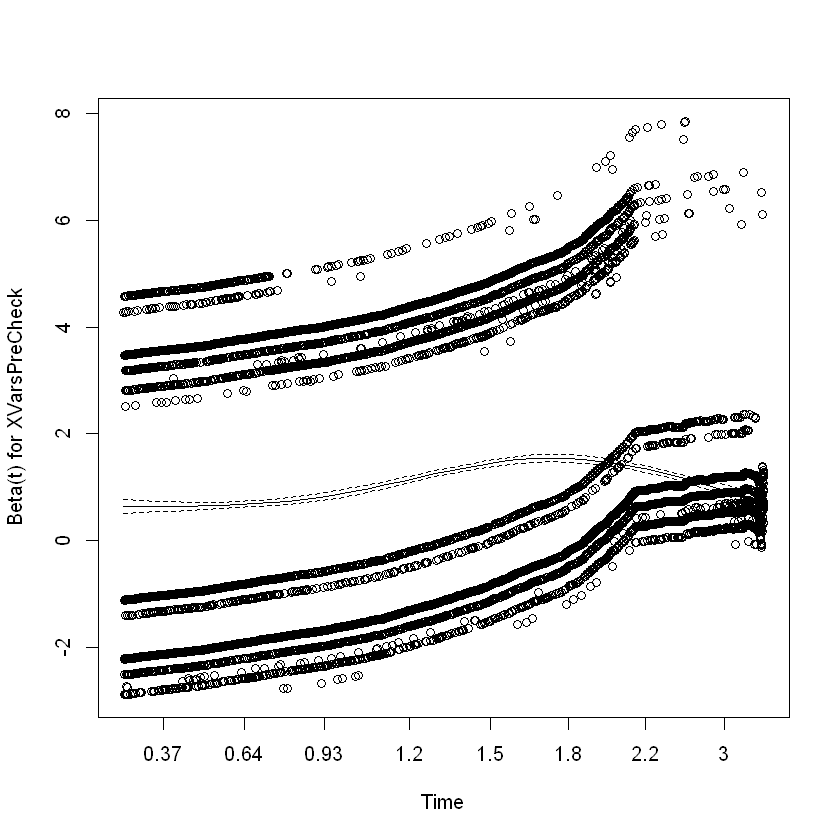

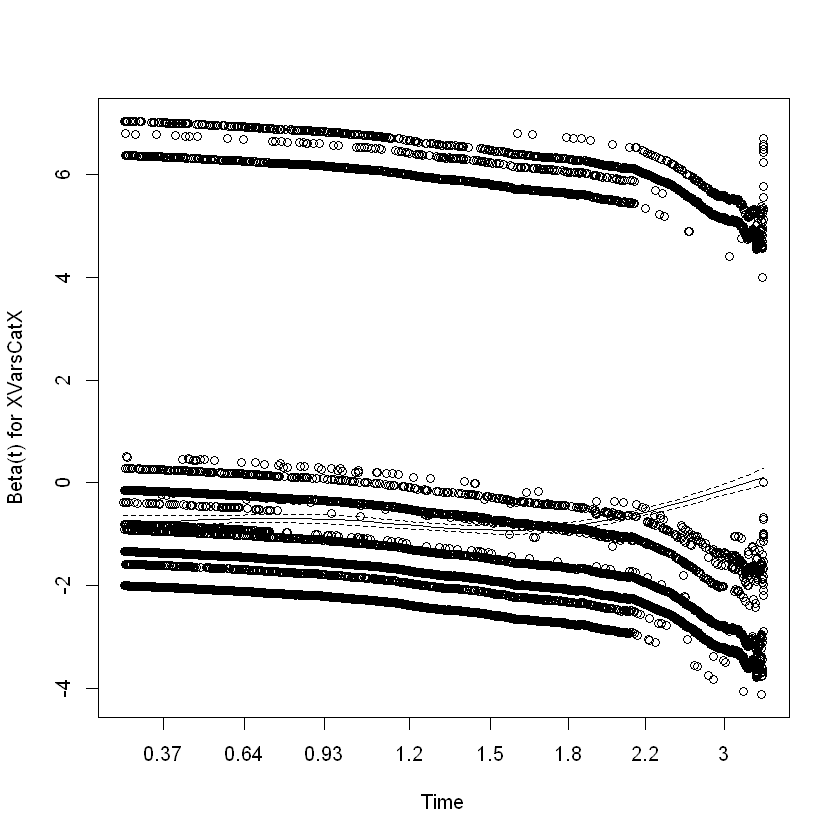

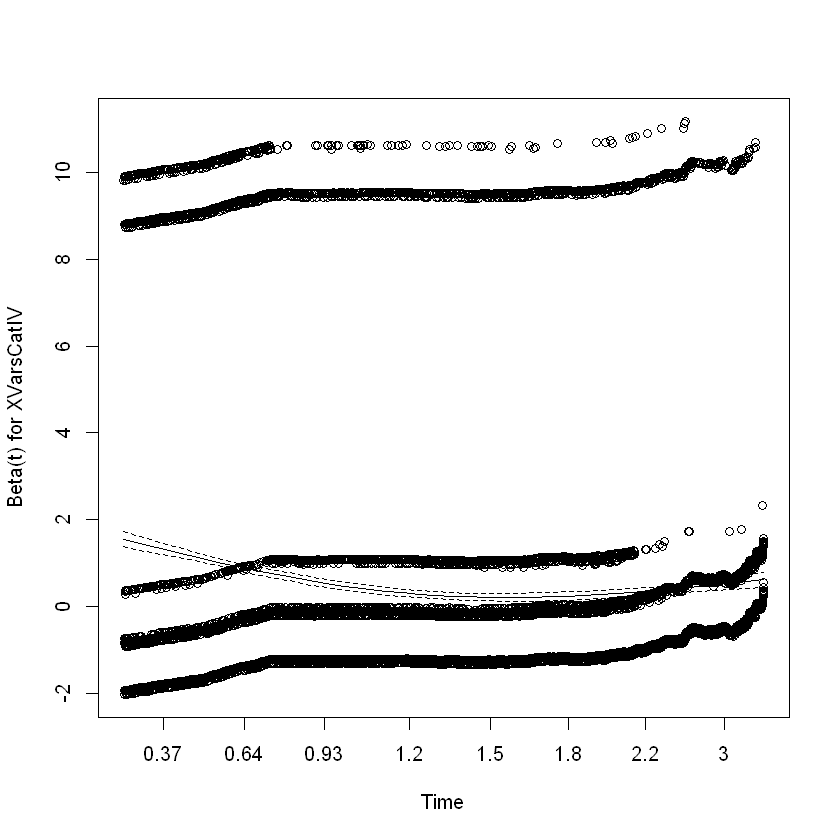

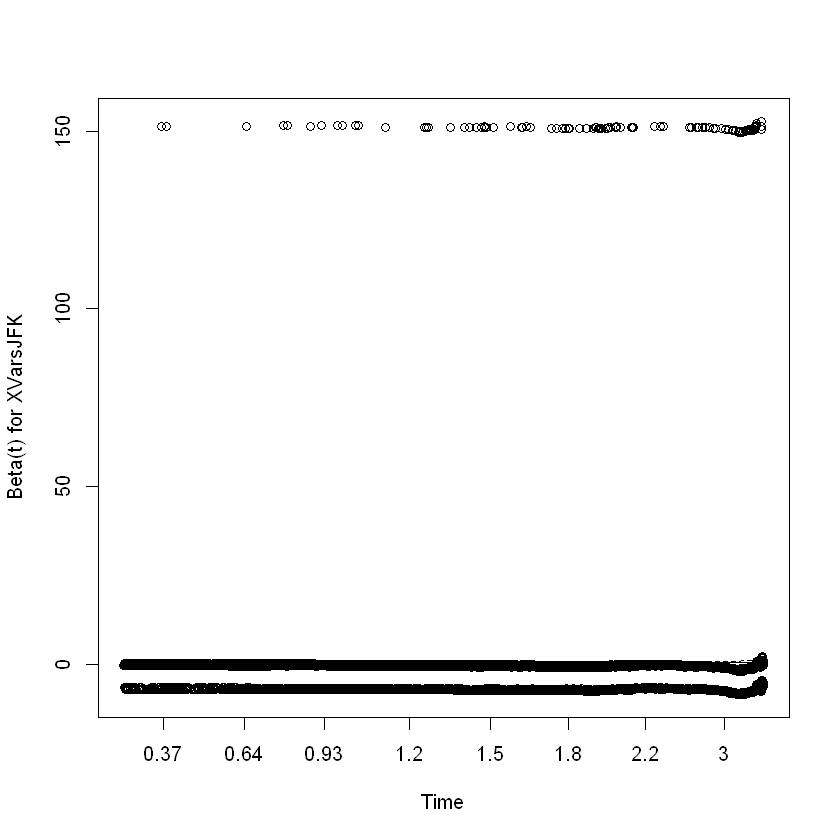

...

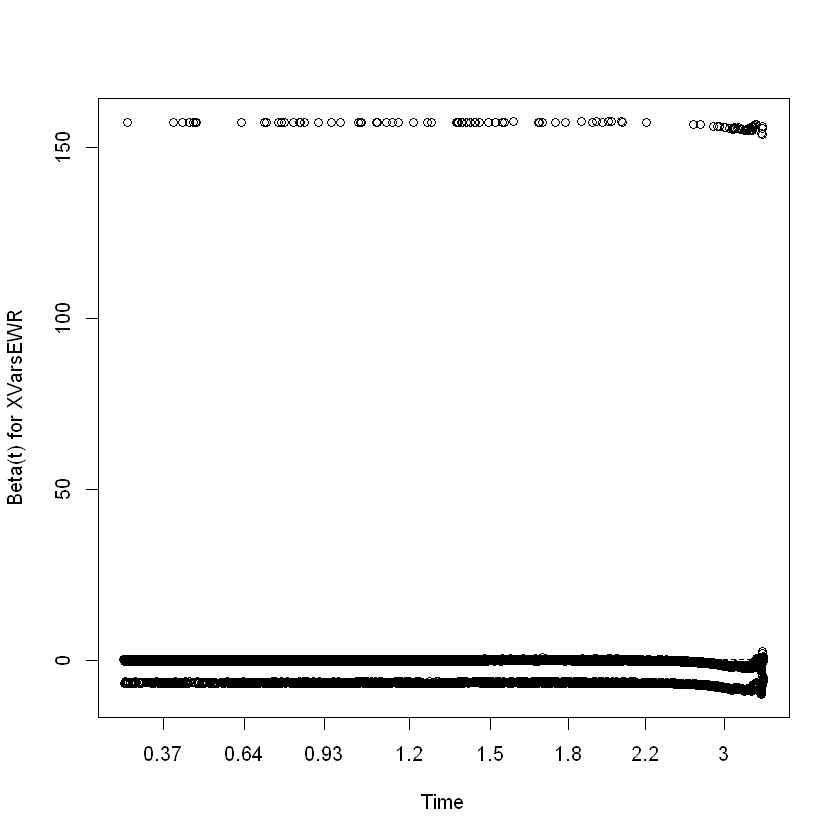

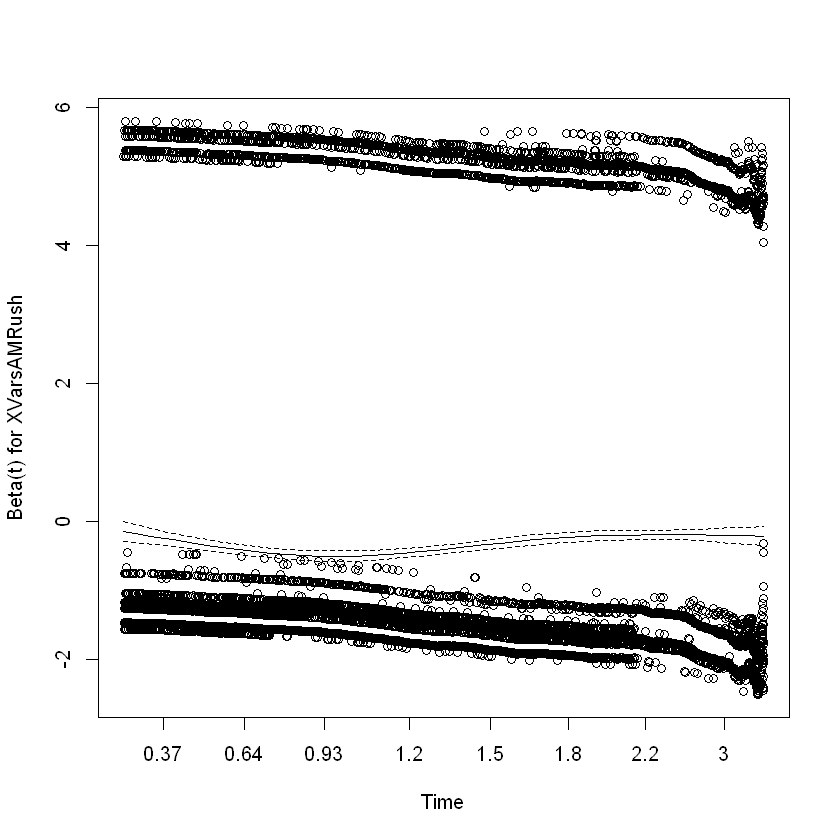

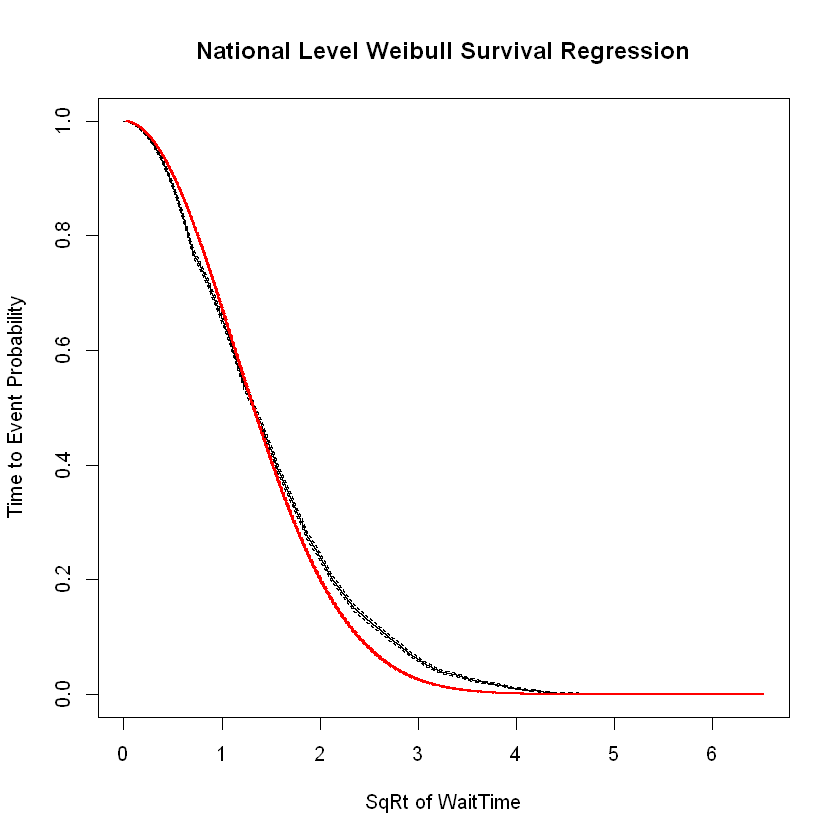

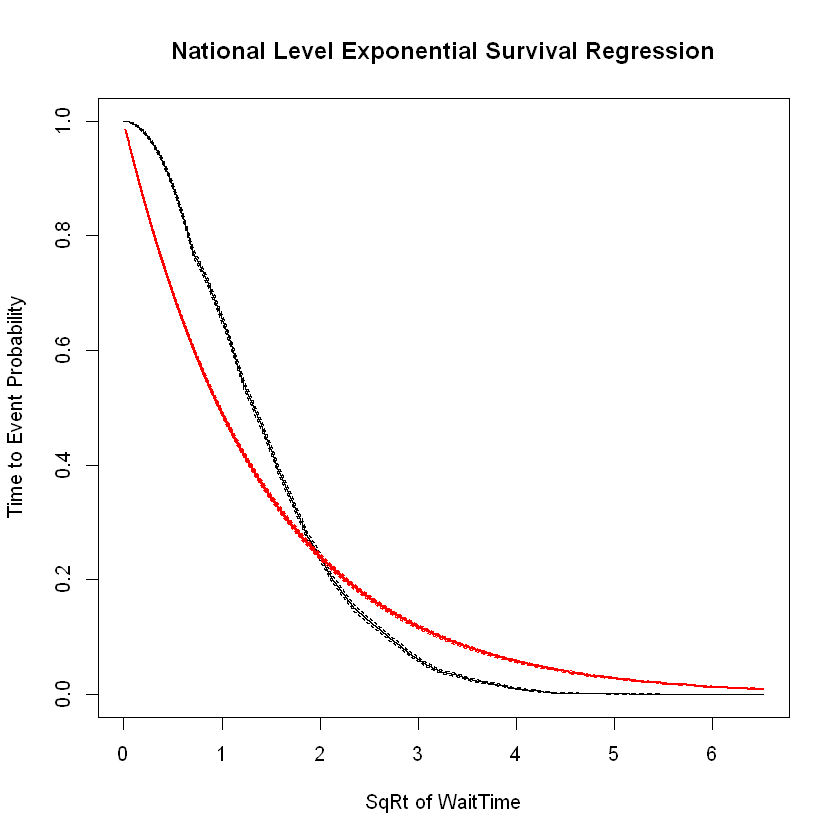

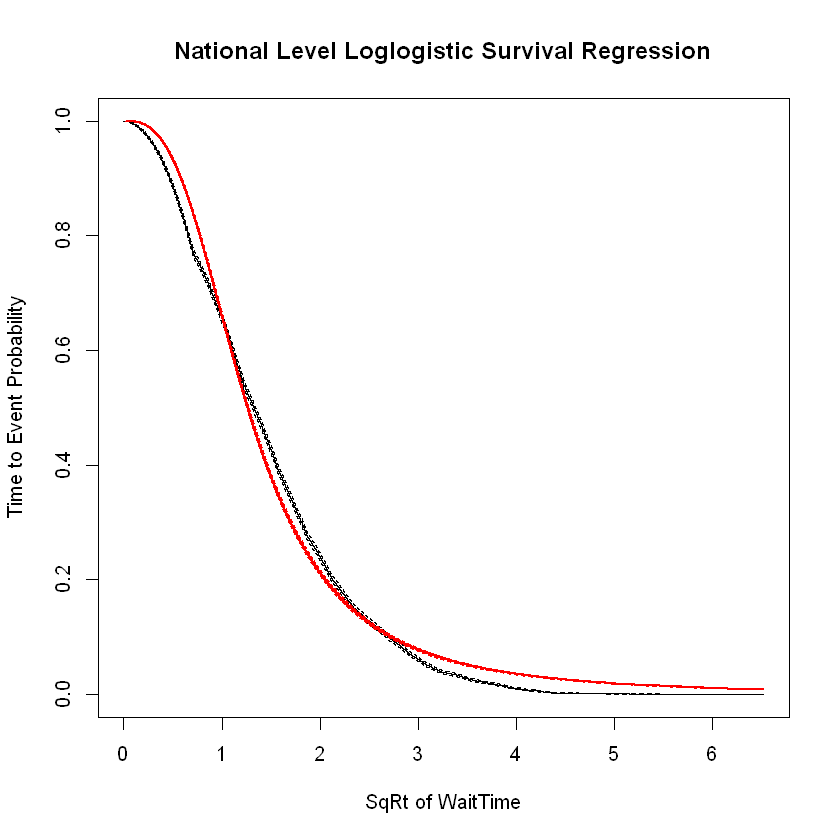

Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"

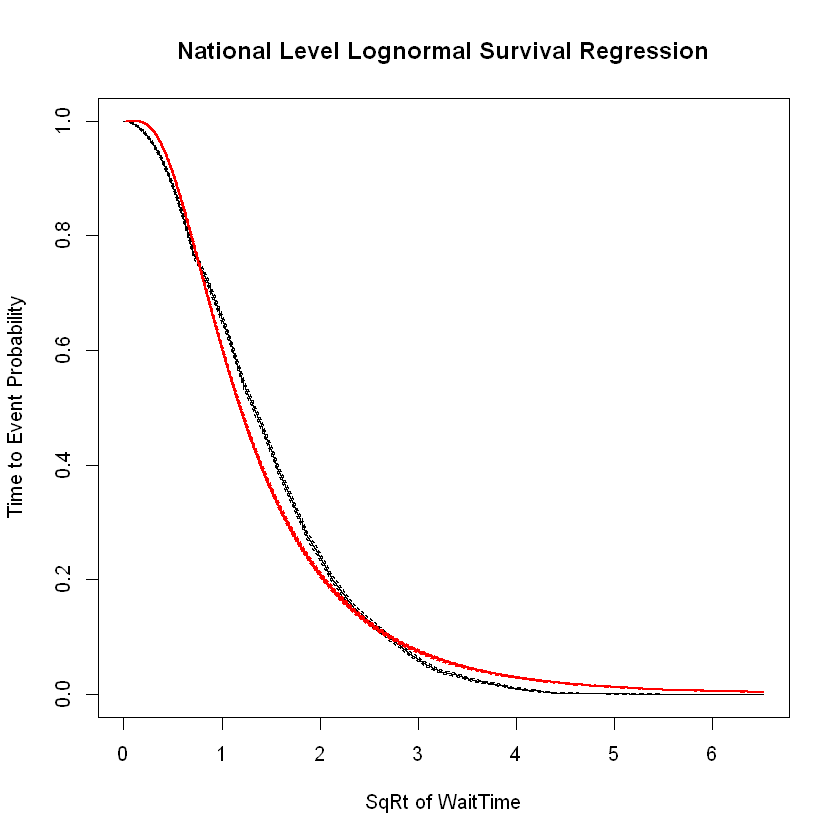


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "weibull")
                 Value Std. Error       z       p
(Intercept)    0.57339    0.00581   98.72 < 2e-16
XVarsPreCheck -0.51019    0.00826  -61.78 < 2e-16
XVarsCatX      0.32638    0.01096   29.78 < 2e-16
XVarsCatIV    -0.26987    0.01257  -21.47 < 2e-16
XVarsJFK       0.18012    0.04838    3.72 0.00020
XVarsORD       0.19363    0.05067    3.82 0.00013
XVarsEWR       0.09550    0.04926    1.94 0.05252
XVarsAMRush    0.15767    0.01002   15.73 < 2e-16
Log(scale)    -0.70468    0.00613 -114.95 < 2e-16

Scale= 0.494 

Weibull distribution
Loglik(model)= -17386.4   Loglik(intercept only)= -19599.4
	Chisq= 4426.15 on 7 degrees of freedom, p= 0 
Number of Newton-Raphson Iterations: 6 
n= 16507 



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "exponential")
                Value Std. Error      z      p
(Intercept)    0.4439     0.0113  39.20 <2e-16
XVarsPreCheck -0.4954     0.0167 -29.64 <2e-16
XVarsCatX      0.3657     0.0222  16.48 <2e-16
XVarsCatIV    -0.3206     0.0254 -12.64 <2e-16
XVarsJFK       0.2205     0.0979   2.25  0.024
XVarsORD       0.2032     0.1025   1.98  0.047
XVarsEWR       0.0853     0.0997   0.86  0.392
XVarsAMRush    0.1728     0.0203   8.52 <2e-16

Scale fixed at 1 

Exponential distribution
Loglik(model)= -22142   Loglik(intercept only)= -22810.1
	Chisq= 1336.19 on 7 degrees of freedom, p= 2.5e-284 
Number of Newton-Raphson Iterations: 4 
n= 16507 



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "loglogistic")
                 Value Std. Error       z       p
(Intercept)    0.33003    0.00684   48.27 < 2e-16
XVarsPreCheck -0.48379    0.01001  -48.31 < 2e-16
XVarsCatX      0.41477    0.01297   31.98 < 2e-16
XVarsCatIV    -0.40339    0.01621  -24.88 < 2e-16
XVarsJFK       0.25708    0.05286    4.86 1.2e-06
XVarsORD       0.21375    0.05743    3.72  0.0002
XVarsEWR       0.08357    0.05981    1.40  0.1624
XVarsAMRush    0.19613    0.01212   16.18 < 2e-16
Log(scale)    -1.04890    0.00652 -160.86 < 2e-16

Scale= 0.35 

Log logistic distribution
Loglik(model)= -18612.8   Loglik(intercept only)= -20401
	Chisq= 3576.38 on 7 degrees of freedom, p= 0 
Number of Newton-Raphson Iterations: 4 
n= 16507 



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "lognormal")
                 Value Std. Error      z      p
(Intercept)    0.26240    0.00723  36.28 <2e-16
XVarsPreCheck -0.46703    0.01080 -43.23 <2e-16
XVarsCatX      0.40565    0.01437  28.22 <2e-16
XVarsCatIV    -0.37547    0.01634 -22.97 <2e-16
XVarsJFK       0.28212    0.06319   4.46  8e-06
XVarsORD       0.20931    0.06618   3.16 0.0016
XVarsEWR       0.05433    0.06434   0.84 0.3984
XVarsAMRush    0.18623    0.01310  14.21 <2e-16
Log(scale)    -0.43762    0.00550 -79.51 <2e-16

Scale= 0.646 

Log Normal distribution
Loglik(model)= -19046.6   Loglik(intercept only)= -20555.2
	Chisq= 3017.34 on 7 degrees of freedom, p= 0 
Number of Newton-Raphson Iterations: 4 
n= 16507 


Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "weibull")

Estimates: 
               data mean  est       L95%      U95%      se        exp(est)
shape                NA    2.02319   1.99903   2.04765   0.01240        NA
scale                NA    1.77427   1.75418   1.79458   0.01031        NA
XVarsPreCheck   0.32968   -0.51019  -0.52638  -0.49401   0.00826   0.60038
XVarsCatX       0.16829    0.32638   0.30490   0.34786   0.01096   1.38594
XVarsCatIV      0.10971   -0.26987  -0.29451  -0.24524   0.01257   0.76347
XVarsJFK        0.00660    0.18012   0.08530   0.27495   0.04838   1.19736
XVarsORD        0.00600    0.19363   0.09431   0.29294   0.05067   1.21364
XVarsEWR        0.00636    0.09550  -0.00104   0.19204   0.04926   1.10021
XVarsAMRush     0.18023    0.15767   0.13803   0.17731   0.01002   1.17078
               L95%      U95%    
shape                NA        NA
scale                NA        NA
XVarsPreCheck   0.59074   0.61018
XVars

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "exponential")

Estimates: 
               data mean  est       L95%      U95%      se        exp(est)
rate                 NA    0.64150   0.62742   0.65590   0.00726        NA
XVarsPreCheck   0.32968    0.49536   0.46260   0.52811   0.01671   1.64109
XVarsCatX       0.16829   -0.36573  -0.40923  -0.32224   0.02219   0.69369
XVarsCatIV      0.10971    0.32056   0.27084   0.37027   0.02537   1.37789
XVarsJFK        0.00660   -0.22049  -0.41233  -0.02865   0.09788   0.80213
XVarsORD        0.00600   -0.20322  -0.40413  -0.00230   0.10251   0.81610
XVarsEWR        0.00636   -0.08530  -0.28061   0.11002   0.09965   0.91824
XVarsAMRush     0.18023   -0.17277  -0.21251  -0.13304   0.02027   0.84133
               L95%      U95%    
rate                 NA        NA
XVarsPreCheck   1.58820   1.69573
XVarsCatX       0.66416   0.72452
XVarsCatIV      1.31107   1.44813
XVarsJFK        0.66211   0.97176
XVarsORD

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "llogis")

Estimates: 
               data mean  est       L95%      U95%      se        exp(est)
shape                NA    2.85451   2.81826   2.89123   0.01861        NA
scale                NA    1.39102   1.37250   1.40978   0.00951        NA
XVarsPreCheck   0.32968   -0.48379  -0.50341  -0.46416   0.01001   0.61644
XVarsCatX       0.16829    0.41477   0.38935   0.44019   0.01297   1.51402
XVarsCatIV      0.10971   -0.40339  -0.43516  -0.37162   0.01621   0.66805
XVarsJFK        0.00660    0.25708   0.15348   0.36068   0.05286   1.29314
XVarsORD        0.00600    0.21375   0.10120   0.32631   0.05743   1.23832
XVarsEWR        0.00636    0.08357  -0.03366   0.20080   0.05981   1.08716
XVarsAMRush     0.18023    0.19613   0.17237   0.21989   0.01212   1.21668
               L95%      U95%    
shape                NA        NA
scale                NA        NA
XVarsPreCheck   0.60446   0.62866
XVarsC

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "lnorm")

Estimates: 
               data mean  est       L95%      U95%      se        exp(est)
meanlog              NA    0.26240   0.24822   0.27657   0.00723        NA
sdlog                NA    0.64557   0.63865   0.65257   0.00355        NA
XVarsPreCheck   0.32968   -0.46703  -0.48821  -0.44586   0.01080   0.62686
XVarsCatX       0.16829    0.40565   0.37747   0.43382   0.01437   1.50027
XVarsCatIV      0.10971   -0.37547  -0.40750  -0.34344   0.01634   0.68697
XVarsJFK        0.00660    0.28212   0.15827   0.40596   0.06319   1.32594
XVarsORD        0.00600    0.20931   0.07961   0.33902   0.06618   1.23283
XVarsEWR        0.00636    0.05433  -0.07177   0.18043   0.06434   1.05584
XVarsAMRush     0.18023    0.18623   0.16055   0.21191   0.01310   1.20470
               L95%      U95%    
meanlog              NA        NA
sdlog                NA        NA
XVarsPreCheck   0.61373   0.64028
XVarsCa

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "gamma")

Estimates: 
               data mean  est       L95%      U95%      se        exp(est)
shape                NA    3.11806   3.05472   3.18272   0.03265        NA
rate                 NA    2.00025   1.95268   2.04897   0.02456        NA
XVarsPreCheck   0.32968    0.49536   0.47681   0.51391   0.00946   1.64109
XVarsCatX       0.16829   -0.36574  -0.39037  -0.34111   0.01257   0.69369
XVarsCatIV      0.10971    0.32055   0.29240   0.34871   0.01436   1.37789
XVarsJFK        0.00660   -0.22045  -0.32909  -0.11181   0.05543   0.80216
XVarsORD        0.00600   -0.20319  -0.31697  -0.08941   0.05805   0.81612
XVarsEWR        0.00636   -0.08532  -0.19594   0.02529   0.05644   0.91822
XVarsAMRush     0.18023   -0.17278  -0.19528  -0.15027   0.01148   0.84133
               L95%      U95%    
shape                NA        NA
rate                 NA        NA
XVarsPreCheck   1.61093   1.67182
XVarsCa

 WaitTimeContinuousSqRt    PreCheck           CatX            CatIV       
 Min.   :0.02014        Min.   :0.0000   Min.   :0.0000   Min.   :0.0000  
 1st Qu.:0.76931        1st Qu.:0.0000   1st Qu.:0.0000   1st Qu.:0.0000  
 Median :1.32726        Median :0.0000   Median :0.0000   Median :0.0000  
 Mean   :1.46498        Mean   :0.3297   Mean   :0.1683   Mean   :0.1097  
 3rd Qu.:1.96914        3rd Qu.:1.0000   3rd Qu.:0.0000   3rd Qu.:0.0000  
 Max.   :6.52791        Max.   :1.0000   Max.   :1.0000   Max.   :1.0000  
      JFK                ORD                EWR               AMRush      
 Min.   :0.000000   Min.   :0.000000   Min.   :0.000000   Min.   :0.0000  
 1st Qu.:0.000000   1st Qu.:0.000000   1st Qu.:0.000000   1st Qu.:0.0000  
 Median :0.000000   Median :0.000000   Median :0.000000   Median :0.0000  
 Mean   :0.006603   Mean   :0.005998   Mean   :0.006361   Mean   :0.1802  
 3rd Qu.:0.000000   3rd Qu.:0.000000   3rd Qu.:0.000000   3rd Qu.:0.0000  
 Max.   :1.000000   Max. 

 WaitTimeContinuousSqRt    PreCheck           CatX            CatIV       
 Min.   :0.007632       Min.   :0.0000   Min.   :0.0000   Min.   :0.0000  
 1st Qu.:0.757158       1st Qu.:0.0000   1st Qu.:0.0000   1st Qu.:0.0000  
 Median :1.322911       Median :0.0000   Median :0.0000   Median :0.0000  
 Mean   :1.463385       Mean   :0.3276   Mean   :0.1699   Mean   :0.1055  
 3rd Qu.:1.969183       3rd Qu.:1.0000   3rd Qu.:0.0000   3rd Qu.:0.0000  
 Max.   :6.973031       Max.   :1.0000   Max.   :1.0000   Max.   :1.0000  
      JFK                ORD              EWR               AMRush      
 Min.   :0.000000   Min.   :0.0000   Min.   :0.000000   Min.   :0.0000  
 1st Qu.:0.000000   1st Qu.:0.0000   1st Qu.:0.000000   1st Qu.:0.0000  
 Median :0.000000   Median :0.0000   Median :0.000000   Median :0.0000  
 Mean   :0.006422   Mean   :0.0063   Mean   :0.005634   Mean   :0.1775  
 3rd Qu.:0.000000   3rd Qu.:0.0000   3rd Qu.:0.000000   3rd Qu.:0.0000  
 Max.   :1.000000   Max.   :1.0000   


Model RMSE of Training Data Weibull Survival
[1] 0.7875092

Model RMSE of Test Data Weibull Survival
[1] 0.9722825


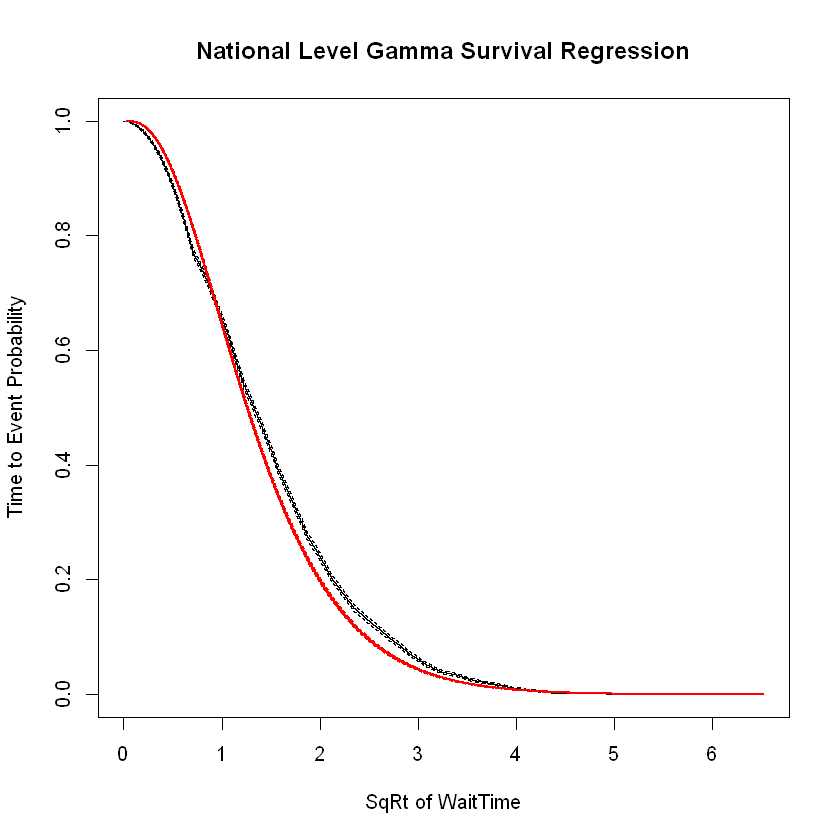

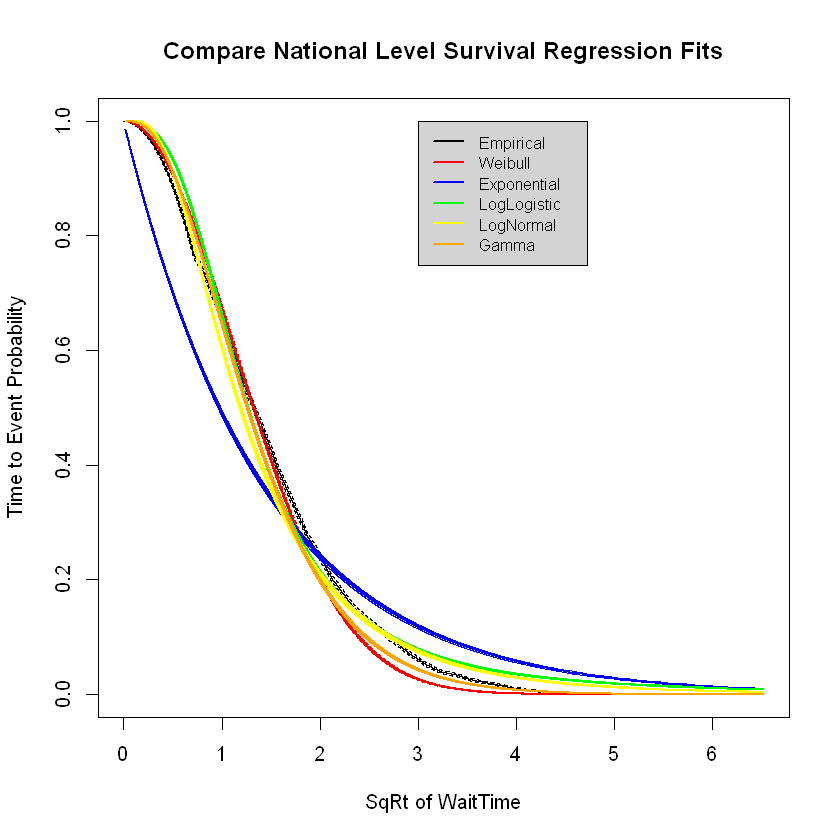

In [2]:
#!!!!!!!!! CHANGE TO R KERNEL !!!!!!!!!!!!!

#CELL NAME:  SURVIVAL ANALYSIS (TIME TO EVENT ANALYSIS)
#This requires cell R SETUP to be run first
#DETERMINE IF PARAMETRIC/NONPARAMETRIC/SEMIPARAMETRIC SURVIVAL TECHNIQUES PROVIDE A GOOD ANSWER
#Note:  survreg and flexsurvreg have fairly robust Weibull modeling, see curve fits


library(tidyverse)
library(survival)
library(dplyr)
#library(fitdistrplus) #don't need in this cell
library(flexsurv)
library(KMsurv)
library(rms)
library(MASS)
#library(caret)


#Set up some initial variables and datasets
AptWaitsR$WaitTimeContinuousSqRt <- (AptWaitsR$WaitTimeContinuous)^(1/2)
AptWaitsR$Event <- 1  #all events are 1 with no censoring in the dataset

attach(AptWaitsR)
XVars <- cbind(PreCheck, CatX, CatIV, JFK, ORD, EWR, AMRush)  #for code development, national level model

#PROBLEM:  using whole dataset takes hours and hours to run survival analysis
#Need to take a sample due to extremely long processing time
#For 95% confidence level and +/- 3% error need a sample of 1067, but is that enought to represent the sparse tail?  
#For confidence level of 99% and confidence interval (margin of error) of 1%, need 16506, under 1% of data
#Can create a training dataset and test dataset each with 16506 observations
#THIS SAMPLING METHOD MAY RESULT IN SMALL AMOUNT OF DUPLUCATION OF OBSERVATIONS
#Is this getting more at cross validation or bootstrapping?  Probably better to stick with CV
#set.seed(1234)
#AptWaitsRTrainingSample <- sample_n(AptWaitsR, 16506)
#set.seed(5678)
#AptWaitsRTestSample <- sample_n(AptWaitsR, 16506)
#head(AptWaitsRTrainingSample)
#tail(AptWaitsRTrainingSample)

#BETTER SAMPLING SOLUTION
#Stratify sampling for main body of data versus sparse tail (cut at 15 min should suffice)
#Generate random number for each record, select by random number
#Piece together strata for each sample
#This solves dilemma of CV vs. Bootstrapping since sample(replace=F) does not seem to work
#Can pull many samples at will

AptWaitsBody <- AptWaitsR %>% filter(Wait15orMore==0)
AptWaitsTail <- AptWaitsR %>% filter(Wait15orMore==1)
set.seed(1357)
RandomBody <- order(runif(nrow(AptWaitsBody)))
set.seed(2468)
RandomTail <- order(runif(nrow(AptWaitsTail)))

#Pull Training Sample
AptWaitsBodyTrainSample <- AptWaitsBody[RandomBody[1:(ceiling(16506*(nrow(AptWaitsBody)/nrow(AptWaitsR))))], ]
AptWaitsTailTrainSample <- AptWaitsTail[RandomTail[1:(ceiling(16506*(nrow(AptWaitsTail)/nrow(AptWaitsR))))], ]
AptWaitsTrainSample <- rbind(AptWaitsBodyTrainSample, AptWaitsTailTrainSample)
#nrow(AptWaitsBodyTrainSample)
#nrow(AptWaitsTailTrainSample)
#nrow(AptWaitsTrainSample)     #Count checks good
#head(AptWaitsTrainSample)
#tail(AptWaitsTrainSample)     #Eyeball checks good

#Pull Test Sample
AptWaitsBodyTestSample <- AptWaitsBody[RandomBody[16224:(16223+16223)], ]
AptWaitsTailTestSample <- AptWaitsTail[RandomTail[285:(284+284)], ]
AptWaitsTestSample <- rbind(AptWaitsBodyTestSample, AptWaitsTailTestSample)
#nrow(AptWaitsBodyTestSample)
#nrow(AptWaitsTailTestSample)
#nrow(AptWaitsTestSample)    #Count checks good
#head(AptWaitsTestSample)
#tail(AptWaitsTestSample)    #Eyeball checks good

#subset variables to see if this clears up 'predict' problems
AptWaitsTrainSample <-  dplyr::select(AptWaitsTrainSample, WaitTimeContinuousSqRt, PreCheck, 
                                      CatX, CatIV, JFK, ORD, EWR, AMRush, Event)
AptWaitsTestSample <-  dplyr::select(AptWaitsTestSample, WaitTimeContinuousSqRt, PreCheck, 
                                      CatX, CatIV, JFK, ORD, EWR, AMRush, Event)

#Data subsets for models
#No sampling needed for size, but still need to sample for training vs. testing
AptWaitsJFK <- AptWaitsR %>% filter(JFK==1)
AptWaitsEWR <- AptWaitsR %>% filter(EWR==1)
AptWaitsORD <- AptWaitsR %>% filter(ORD==1)
AptWaitsJFKPre <- AptWaitsJFK %>% filter(PreCheck==1)
AptWaitsJFKReg <- AptWaitsJFK %>% filter(PreCheck==0)
AptWaitsEWRPre <- AptWaitsEWR %>% filter(PreCheck==1)
AptWaitsEWRReg <- AptWaitsEWR %>% filter(PreCheck==0)
AptWaitsORDPre <- AptWaitsORD %>% filter(PreCheck==1)
AptWaitsORDReg <- AptWaitsORD %>% filter(PreCheck==0)

AptWaitsJFKPre <-  dplyr::select(AptWaitsJFKPre, WaitTimeContinuousSqRt, HourInt, 
                        HourIntSquared, HourIntCubed, AMRush, 
                        PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun, Wait15orMore)
AptWaitsJFKReg <-  dplyr::select(AptWaitsJFKReg, WaitTimeContinuousSqRt, HourInt, 
                        HourIntSquared, HourIntCubed, AMRush, 
                        PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun, Wait15orMore)
AptWaitsEWRPre <-  dplyr::select(AptWaitsEWRPre, WaitTimeContinuousSqRt, HourInt, 
                        HourIntSquared, HourIntCubed, AMRush, 
                        PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun, Wait15orMore)
AptWaitsEWRReg <-  dplyr::select(AptWaitsEWRReg, WaitTimeContinuousSqRt, HourInt, 
                        HourIntSquared, HourIntCubed, AMRush, 
                        PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun, Wait15orMore)
AptWaitsORDPre <-  dplyr::select(AptWaitsORDPre, WaitTimeContinuousSqRt, HourInt, 
                        HourIntSquared, HourIntCubed, AMRush, 
                        PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun, Wait15orMore)
AptWaitsORDReg <-  dplyr::select(AptWaitsORDReg, WaitTimeContinuousSqRt, HourInt, 
                        HourIntSquared, HourIntCubed, AMRush, 
                        PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun, Wait15orMore)

#Take stratified 70/30 split for train/test on airport data (3 apts X 2 lanes X 2 samples X 2 subsamples)
cat("\nJFKPre Wait15orMore\n")
AptWaitsJFKPre %>% as.tibble() %>% count(Wait15orMore)
cat("\nJFKReg Wait15orMore\n")
AptWaitsJFKReg %>% as.tibble() %>% count(Wait15orMore)
cat("\nEWRPre Wait15orMore\n")
AptWaitsEWRPre %>% as.tibble() %>% count(Wait15orMore)
cat("\nEWRReg Wait15orMore\n")
AptWaitsEWRReg %>% as.tibble() %>% count(Wait15orMore)
cat("\nORDPre Wait15orMore\n")
AptWaitsORDPre %>% as.tibble() %>% count(Wait15orMore)
cat("\nORDReg Wait15orMore\n")
AptWaitsORDReg %>% as.tibble() %>% count(Wait15orMore)

JFKPreBody <- AptWaitsJFKPre %>% filter(Wait15orMore==0)
JFKPreTail <- AptWaitsJFKPre %>% filter(Wait15orMore==1)
set.seed(1357)
RandomJFKPreBody <- order(runif(nrow(JFKPreBody)))
set.seed(2468)
RandomJFKPreTail <- order(runif(nrow(JFKPreTail)))
JFKPreBodyTrainSample <- JFKPreBody[RandomJFKPreBody[1:4180], ]
JFKPreTailTrainSample <- JFKPreTail[RandomJFKPreTail[0:0], ]
JFKPreTrainSample <- rbind(JFKPreBodyTrainSample, JFKPreTailTrainSample)
JFKPreBodyTestSample <- JFKPreBody[RandomJFKPreBody[4181:5972], ]
JFKPreTailTestSample <- JFKPreTail[RandomJFKPreTail[0:0], ]
JFKPreTestSample <- rbind(JFKPreBodyTestSample, JFKPreTailTestSample)

JFKRegBody <- AptWaitsJFKReg %>% filter(Wait15orMore==0)
JFKRegTail <- AptWaitsJFKReg %>% filter(Wait15orMore==1)
set.seed(1357)
RandomJFKRegBody <- order(runif(nrow(JFKRegBody)))
set.seed(2468)
RandomJFKRegTail <- order(runif(nrow(JFKRegTail)))
JFKRegBodyTrainSample <- JFKRegBody[RandomJFKRegBody[1:3748], ]
JFKRegTailTrainSample <- JFKRegTail[RandomJFKRegTail[1:1375], ]
JFKRegTrainSample <- rbind(JFKRegBodyTrainSample, JFKRegTailTrainSample)
JFKRegBodyTestSample <- JFKRegBody[RandomJFKRegBody[3749:5355], ]
JFKRegTailTestSample <- JFKRegTail[RandomJFKRegTail[1376:1965], ]
JFKRegTestSample <- rbind(JFKRegBodyTestSample, JFKRegTailTestSample)

EWRPreBody <- AptWaitsEWRPre %>% filter(Wait15orMore==0)
EWRPreTail <- AptWaitsEWRPre %>% filter(Wait15orMore==1)
set.seed(1357)
RandomEWRPreBody <- order(runif(nrow(EWRPreBody)))
set.seed(2468)
RandomEWRPreTail <- order(runif(nrow(EWRPreTail)))
EWRPreBodyTrainSample <- EWRPreBody[RandomEWRPreBody[1:3629], ]
EWRPreTailTrainSample <- EWRPreTail[RandomEWRPreTail[0:1], ]
EWRPreTrainSample <- rbind(EWRPreBodyTrainSample, EWRPreTailTrainSample)
EWRPreBodyTestSample <- EWRPreBody[RandomEWRPreBody[3630:5184], ]
EWRPreTailTestSample <- EWRPreTail[RandomEWRPreTail[0:0], ]
EWRPreTestSample <- rbind(EWRPreBodyTestSample, EWRPreTailTestSample)

EWRRegBody <- AptWaitsEWRReg %>% filter(Wait15orMore==0)
EWRRegTail <- AptWaitsEWRReg %>% filter(Wait15orMore==1)
set.seed(1357)
RandomEWRRegBody <- order(runif(nrow(EWRRegBody)))
set.seed(2468)
RandomEWRRegTail <- order(runif(nrow(EWRRegTail)))
EWRRegBodyTrainSample <- EWRRegBody[RandomEWRRegBody[1:3715], ]
EWRRegTailTrainSample <- EWRRegTail[RandomEWRRegTail[1:1337], ]
EWRRegTrainSample <- rbind(EWRRegBodyTrainSample, EWRRegTailTrainSample)
EWRRegBodyTestSample <- EWRRegBody[RandomEWRRegBody[3716:5307], ]
EWRRegTailTestSample <- EWRRegTail[RandomEWRRegTail[1338:1910], ]
EWRRegTestSample <- rbind(EWRRegBodyTestSample, EWRRegTailTestSample)

ORDPreBody <- AptWaitsORDPre %>% filter(Wait15orMore==0)
ORDPreTail <- AptWaitsORDPre %>% filter(Wait15orMore==1)
set.seed(1357)
RandomORDPreBody <- order(runif(nrow(ORDPreBody)))
set.seed(2468)
RandomORDPreTail <- order(runif(nrow(ORDPreTail)))
ORDPreBodyTrainSample <- ORDPreBody[RandomORDPreBody[1:3682], ]
ORDPreTailTrainSample <- ORDPreTail[RandomORDPreTail[0:1], ]
ORDPreTrainSample <- rbind(ORDPreBodyTrainSample, ORDPreTailTrainSample)
ORDPreBodyTestSample <- ORDPreBody[RandomORDPreBody[3683:5260], ]
ORDPreTailTestSample <- ORDPreTail[RandomORDPreTail[2:2], ]
ORDPreTestSample <- rbind(ORDPreBodyTestSample, ORDPreTailTestSample)

ORDRegBody <- AptWaitsORDReg %>% filter(Wait15orMore==0)
ORDRegTail <- AptWaitsORDReg %>% filter(Wait15orMore==1)
set.seed(1357)
RandomORDRegBody <- order(runif(nrow(ORDRegBody)))
set.seed(2468)
RandomORDRegTail <- order(runif(nrow(ORDRegTail)))
ORDRegBodyTrainSample <- ORDRegBody[RandomORDRegBody[1:3667], ]
ORDRegTailTrainSample <- ORDRegTail[RandomORDRegTail[1:1457], ]
ORDRegTrainSample <- rbind(ORDRegBodyTrainSample, ORDRegTailTrainSample)
ORDRegBodyTestSample <- ORDRegBody[RandomORDRegBody[3668:5239], ]
ORDRegTailTestSample <- ORDRegTail[RandomORDRegTail[1457:2081], ]
ORDRegTestSample <- rbind(ORDRegBodyTestSample, ORDRegTailTestSample)

JFKPreTrainSample <- JFKPreTrainSample %>% dplyr::select(-Wait15orMore)
JFKRegTrainSample <- JFKRegTrainSample %>% dplyr::select(-Wait15orMore)
JFKPreTestSample <- JFKPreTestSample %>% dplyr::select(-Wait15orMore)
JFKRegTestSample <- JFKRegTestSample %>% dplyr::select(-Wait15orMore)
EWRPreTrainSample <- EWRPreTrainSample %>% dplyr::select(-Wait15orMore)
EWRRegTrainSample <- EWRRegTrainSample %>% dplyr::select(-Wait15orMore)
EWRPreTestSample <- EWRPreTestSample %>% dplyr::select(-Wait15orMore)
EWRRegTestSample <- EWRRegTestSample %>% dplyr::select(-Wait15orMore)
ORDPreTrainSample <- ORDPreTrainSample %>% dplyr::select(-Wait15orMore)
ORDRegTrainSample <- ORDRegTrainSample %>% dplyr::select(-Wait15orMore)
ORDPreTestSample <- ORDPreTestSample %>% dplyr::select(-Wait15orMore)
ORDRegTestSample <- ORDRegTestSample %>% dplyr::select(-Wait15orMore)

detach(AptWaitsR)

attach(AptWaitsTrainSample)

XVars <- cbind(PreCheck, CatX, CatIV, JFK, ORD, EWR, AMRush)  #for code development
#XVarsAptLane <- cbind(HourInt, HourIntSquared, HourIntCubed, AMRush, PMRush, Jan, Feb, Mar, Apr, May, Jun,
#                     Jul, Aug, Sep, Mon, Fri, Sat, Sun)  #For analysis by airport and lane--note all time variables

cat("\nSummary of WaitTimeContinuousSqRt\n")
summary(WaitTimeContinuousSqRt)
cat("\nSummary of X Variables\n")
summary(XVars)

#Kaplan-Meier non-parametric survival analysis
SurvKM <- survfit(Surv(WaitTimeContinuousSqRt, Event) ~ PreCheck + CatX)
#summary(SurvKM) 
#print(SurvKM)
#variable names for print:  n, events, median, 0.95LCL, 0.95UCL
#!!Labels are not showing correctly!!  
plot(SurvKM, conf.int=TRUE, mark.time=TRUE, pch=c("n", "0.95LCL", "0.95UCL"),
     main="Kaplan-Meier Survival", xlab="SqRt of WaitTime", ylab="Time to Event Probability")
#legend("topright", c("n", "0.95LCL", "0.95UCL"))

#See if plots are easier to create in rms
#note:  "main" does not appear to be an option in npsurv
SurvKM2 <- npsurv(Surv(WaitTimeContinuousSqRt, Event)~PreCheck + CatX)
rms::survplot(SurvKM2, main="Kaplan-Meier Survival", xlab="SqRt of WaitTime", ylab="Time to Event Probability")

#Nelson-Aalen non-parametric survival analysis
#SurvNA <- survfit(coxph(Surv(WaitTimeContinuousSqRt, Event) ~ 1), type="aalen")
#summary(SurvNA)
#plot(SurvNA, main="Nelson-Aalen Survival", xlab="SqRt of WaitTime", ylab="Time to Event Probability")

#Cox proportional hazard semi-parametric survival analysis
SurvCox <- coxph(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, method="breslow")
summary(SurvCox)
cox.zph(SurvCox)
plot(cox.zph(SurvCox))
#res_martingale <- residuals(SurvCox, type="martingale")
#scatter.smooth(WaitTimeContinuousSqRt, res_martingale)
#scatter.smooth(PreCheck, res_martingale)

#Weibull parametric survival analysis--note Weibull should be best fit
SurvWeibull <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
                       dist='weibull')
#summary(SurvWeibull)
#Try an alternative package for Weibull with better plot capability
SurvWeibull2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="weibull")
#summary(SurvWeibull2)
plot(SurvWeibull2, main="National Level Weibull Survival Regression", xlab="SqRt of WaitTime", 
      ylab="Time to Event Probability")

#Compare to exponential parametric
SurvExponential <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
                       dist='exponential')
#summary(SurvExponential)
SurvExponential2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="exponential")
plot(SurvExponential2, main="National Level Exponential Survival Regression", xlab="SqRt of WaitTime", 
      ylab="Time to Event Probability")

#Compare to loglogistic parametric
SurvLogLogistic <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
                       dist='loglogistic')
#summary(SurvLogLogistic)
SurvLogLogistic2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="llogis")
plot(SurvLogLogistic2, main="National Level Loglogistic Survival Regression", xlab="SqRt of WaitTime", 
      ylab="Time to Event Probability")

#Compare to lognormal parametric
SurvLogNormal <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
                       dist='lognormal')
#summary(SurvLogNormal)
SurvLogNormal2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="lnorm")
plot(SurvLogNormal2, main="National Level Lognormal Survival Regression", xlab="SqRt of WaitTime", 
      ylab="Time to Event Probability")

#Compare to gamma parametric
#SurvGamma <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars,   #survreg does not do gamma
#                       dist='gamma')
#summary(SurvGamma)
SurvGamma2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="gamma")
#summary(SurvGamma2)
plot(SurvGamma2, main="National Level Gamma Survival Regression", xlab="SqRt of WaitTime", 
      ylab="Time to Event Probability")

summary(SurvWeibull)
summary(SurvExponential)
summary(SurvLogLogistic)
summary(SurvLogNormal)
SurvWeibull2
SurvExponential2
SurvLogLogistic2
SurvLogNormal2
SurvGamma2

summary(AptWaitsTrainSample)
summary(AptWaitsTestSample)

SurvWeibullPredictedTrain <- predict(SurvWeibull, newdata=AptWaitsTrainSample)
cat("\nModel RMSE of Training Data Weibull Survival\n")
print(sqrt(mean((AptWaitsTrainSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTrain)^2)))
SurvWeibullPredictedTest <- predict(SurvWeibull, newdata=AptWaitsTestSample)
cat("\nModel RMSE of Test Data Weibull Survival\n")
print(sqrt(mean((AptWaitsTestSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTest)^2)))
#Following not working--may need to reload flexsurv--no matter, should get same as above
#SurvWeibull2PredictedTrain <- predict(SurvWeibull2, newdata=AptWaitsTrainSample)
#SurvWeibull2PredictedTest <- predict(SurvWeibull2, newdata=AptWaitsTestSample)

plot(SurvWeibull2, main="Compare National Level Survival Regression Fits", xlab="SqRt of WaitTime",
    ylab="Time to Event Probability")
lines(SurvExponential2, col="blue", lwd.ci=1, lty.ci=1)
lines(SurvLogLogistic2, col="green", lwd.ci=1, lty.ci=1)
lines(SurvLogNormal2, col="yellow", lwd.ci=1, lty.ci=1)
lines(SurvGamma2, col="orange", lwd.ci=1, lty.ci=1)
legend(3, 1, legend=c("Empirical", "Weibull", "Exponential", "LogLogistic", "LogNormal", "Gamma"), 
      col=c("black", "red", "blue", "green", "yellow", "orange"), lty=1, cex=0.8, lwd=2, bg="lightgrey")


detach(AptWaitsTrainSample)













#TO CHANGE DATA SOURCE TO JFK PRECHECK
#detach(AptWaitsRSample)
#attach(AptWaitsJFKPre)  #dataset much smaller, runs fast without sampling










JFK PRECHECK FULL MODEL


               HourInt HourIntSquared HourIntCubed AMRush PMRush   Jan   Feb
HourIntSquared    0.97                                                      
HourIntCubed      0.93           0.99                                       
AMRush           -0.42          -0.41        -0.37                          
PMRush            0.31           0.26         0.19  -0.18                   
Jan               0.02           0.01         0.01  -0.01   0.01            
Feb               0.02           0.02         0.02   0.00  -0.01 -0.09      
Mar               0.01           0.01         0.01   0.01  -0.01 -0.10 -0.09
Apr               0.01           0.01         0.01   0.00   0.01 -0.10 -0.09
May               0.00           0.00         0.00   0.01   0.00 -0.10 -0.09
Jun              -0.02          -0.01        -0.01   0.00  -0.01 -0.10 -0.10
Jul              -0.04          -0.03        -0.02   0.00   0.01 -0.10 -0.10
Aug              -0.02          -0.02        -0.02  -0.01  -0.01 -0.10 -0.09

Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "


JFK PRECHECK FULL MODEL



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "weibull")
                        Value Std. Error       z       p
(Intercept)         -2.54e-01   2.74e-02   -9.27 < 2e-16
XVarsHourInt         1.90e-01   9.39e-03   20.27 < 2e-16
XVarsHourIntSquared -1.29e-02   9.39e-04  -13.74 < 2e-16
XVarsHourIntCubed    2.58e-04   2.71e-05    9.50 < 2e-16
XVarsAMRush          1.76e-01   1.10e-02   16.10 < 2e-16
XVarsPMRush          4.85e-02   1.12e-02    4.35 1.4e-05
XVarsJan            -1.00e-02   1.31e-02   -0.76  0.4457
XVarsFeb            -2.90e-02   1.36e-02   -2.13  0.0330
XVarsMar            -7.99e-03   1.28e-02   -0.62  0.5340
XVarsApr             1.88e-02   1.30e-02    1.45  0.1470
XVarsMay             3.04e-02   1.27e-02    2.39  0.0170
XVarsJun             7.01e-02   1.26e-02    5.56 2.7e-08
XVarsJul            -3.63e-02   1.27e-02   -2.86  0.0042
XVarsAug             4.68e-03   1.31e-02    0.36  0.7203
XVarsSep            -3.28e-02   1.44e-02   -2.28  0.


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "exponential")
                        Value Std. Error     z       p
(Intercept)         -0.534378   0.110287 -4.85 1.3e-06
XVarsHourInt         0.229622   0.037994  6.04 1.5e-09
XVarsHourIntSquared -0.014336   0.003883 -3.69 0.00022
XVarsHourIntCubed    0.000246   0.000113  2.18 0.02920
XVarsAMRush          0.262509   0.052745  4.98 6.5e-07
XVarsPMRush          0.070980   0.053140  1.34 0.18164
XVarsJan            -0.047400   0.062823 -0.75 0.45055
XVarsFeb            -0.064357   0.065255 -0.99 0.32402
XVarsMar            -0.005178   0.061566 -0.08 0.93297
XVarsApr             0.014823   0.062050  0.24 0.81120
XVarsMay             0.052216   0.060815  0.86 0.39056
XVarsJun             0.090003   0.059972  1.50 0.13342
XVarsJul            -0.069476   0.060202 -1.15 0.24848
XVarsAug             0.003016   0.062168  0.05 0.96131
XVarsSep            -0.079838   0.068190 -1.17 0.24167
XVarsMon             0.


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "loglogistic")
                        Value Std. Error       z       p
(Intercept)         -5.67e-01   3.25e-02  -17.46 < 2e-16
XVarsHourInt         2.41e-01   1.10e-02   21.91 < 2e-16
XVarsHourIntSquared -1.56e-02   1.12e-03  -13.91 < 2e-16
XVarsHourIntCubed    2.86e-04   3.26e-05    8.76 < 2e-16
XVarsAMRush          2.61e-01   1.35e-02   19.29 < 2e-16
XVarsPMRush          7.67e-02   1.38e-02    5.55 2.9e-08
XVarsJan            -3.80e-02   1.70e-02   -2.24  0.0251
XVarsFeb            -4.62e-02   1.74e-02   -2.66  0.0079
XVarsMar            -4.90e-03   1.59e-02   -0.31  0.7573
XVarsApr             1.68e-02   1.58e-02    1.06  0.2877
XVarsMay             4.98e-02   1.53e-02    3.24  0.0012
XVarsJun             9.82e-02   1.52e-02    6.47 9.5e-11
XVarsJul            -6.49e-02   1.61e-02   -4.04 5.4e-05
XVarsAug            -2.92e-03   1.66e-02   -0.18  0.8603
XVarsSep            -9.57e-02   1.91e-02   -5.01


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "lognormal")
                        Value Std. Error      z       p
(Intercept)         -6.74e-01   3.53e-02 -19.12 < 2e-16
XVarsHourInt         2.46e-01   1.21e-02  20.26 < 2e-16
XVarsHourIntSquared -1.44e-02   1.25e-03 -11.58 < 2e-16
XVarsHourIntCubed    2.16e-04   3.62e-05   5.98 2.2e-09
XVarsAMRush          3.11e-01   1.79e-02  17.37 < 2e-16
XVarsPMRush          8.41e-02   1.79e-02   4.71 2.5e-06
XVarsJan            -8.29e-02   2.11e-02  -3.92 8.8e-05
XVarsFeb            -9.73e-02   2.20e-02  -4.43 9.4e-06
XVarsMar            -3.28e-03   2.07e-02  -0.16 0.87437
XVarsApr             2.35e-02   2.09e-02   1.12 0.26105
XVarsMay             7.01e-02   2.05e-02   3.43 0.00061
XVarsJun             9.70e-02   2.02e-02   4.80 1.6e-06
XVarsJul            -8.14e-02   2.03e-02  -4.02 5.9e-05
XVarsAug             7.58e-03   2.09e-02   0.36 0.71721
XVarsSep            -9.50e-02   2.29e-02  -4.14 3.5e-05
XVarsMon 

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "weibull")

Estimates: 
                     data mean  est        L95%       U95%       se       
shape                       NA   4.79e+00         NA         NA         NA
scale                       NA   7.76e-01         NA         NA         NA
XVarsHourInt          1.18e+01   1.90e-01         NA         NA         NA
XVarsHourIntSquared   1.72e+02  -1.29e-02         NA         NA         NA
XVarsHourIntCubed     2.80e+03   2.58e-04         NA         NA         NA
XVarsAMRush           1.53e-01   1.76e-01         NA         NA         NA
XVarsPMRush           1.52e-01   4.85e-02         NA         NA         NA
XVarsJan              8.56e-02  -1.00e-02         NA         NA         NA
XVarsFeb              7.70e-02  -2.90e-02         NA         NA         NA
XVarsMar              9.09e-02  -7.99e-03         NA         NA         NA
XVarsApr              8.88e-02   1.88e-02         NA         NA   

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "exponential")

Estimates: 
                     data mean  est        L95%       U95%       se       
rate                        NA   1.71e+00         NA         NA         NA
XVarsHourInt          1.18e+01  -2.30e-01         NA         NA         NA
XVarsHourIntSquared   1.72e+02   1.43e-02         NA         NA         NA
XVarsHourIntCubed     2.80e+03  -2.46e-04         NA         NA         NA
XVarsAMRush           1.53e-01  -2.63e-01         NA         NA         NA
XVarsPMRush           1.52e-01  -7.10e-02         NA         NA         NA
XVarsJan              8.56e-02   4.74e-02         NA         NA         NA
XVarsFeb              7.70e-02   6.44e-02         NA         NA         NA
XVarsMar              9.09e-02   5.18e-03         NA         NA         NA
XVarsApr              8.88e-02  -1.48e-02         NA         NA         NA
XVarsMay              9.40e-02  -5.22e-02         NA         N

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "llogis")

Estimates: 
                     data mean  est        L95%       U95%       se       
shape                       NA   6.41e+00         NA         NA         NA
scale                       NA   5.67e-01         NA         NA         NA
XVarsHourInt          1.18e+01   2.41e-01         NA         NA         NA
XVarsHourIntSquared   1.72e+02  -1.56e-02         NA         NA         NA
XVarsHourIntCubed     2.80e+03   2.86e-04         NA         NA         NA
XVarsAMRush           1.53e-01   2.61e-01         NA         NA         NA
XVarsPMRush           1.52e-01   7.67e-02         NA         NA         NA
XVarsJan              8.56e-02  -3.80e-02         NA         NA         NA
XVarsFeb              7.70e-02  -4.62e-02         NA         NA         NA
XVarsMar              9.09e-02  -4.90e-03         NA         NA         NA
XVarsApr              8.88e-02   1.68e-02         NA         NA    

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "lnorm")

Estimates: 
                     data mean  est        L95%       U95%       se       
meanlog                     NA  -6.74e-01  -7.44e-01  -6.05e-01   3.53e-02
sdlog                       NA   3.37e-01   3.30e-01   3.44e-01   3.68e-03
XVarsHourInt          1.18e+01   2.46e-01   2.22e-01   2.69e-01   1.21e-02
XVarsHourIntSquared   1.72e+02  -1.44e-02  -1.69e-02  -1.20e-02   1.25e-03
XVarsHourIntCubed     2.80e+03   2.16e-04   1.45e-04   2.87e-04   3.62e-05
XVarsAMRush           1.53e-01   3.11e-01   2.76e-01   3.46e-01   1.79e-02
XVarsPMRush           1.52e-01   8.41e-02   4.91e-02   1.19e-01   1.79e-02
XVarsJan              8.56e-02  -8.29e-02  -1.24e-01  -4.15e-02   2.11e-02
XVarsFeb              7.70e-02  -9.73e-02  -1.40e-01  -5.43e-02   2.20e-02
XVarsMar              9.09e-02  -3.28e-03  -4.39e-02   3.74e-02   2.07e-02
XVarsApr              8.88e-02   2.35e-02  -1.75e-02   6.44e-02   2.


JFK PreCheck Full Model RMSE of Training Data Weibull Survival
[1] 0.3875643


Warning message:
"'newdata' had 1792 rows but variables found have 4180 rows"


JFK PreCheck Full Model RMSE of Test Data Weibull Survival


Warning message in JFKPreTestSample$WaitTimeContinuousSqRt - SurvWeibullPredictedTest:
"longer object length is not a multiple of shorter object length"

[1] 0.5145593


Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"


JFK PRECHECK REDUCED MODEL



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "weibull")
                     Value Std. Error       z       p
(Intercept)       0.456714   0.013903   32.85 < 2e-16
XVarsLiteHourInt  0.005374   0.000923    5.82 5.8e-09
XVarsLiteAMRush   0.166288   0.011493   14.47 < 2e-16
XVarsLitePMRush   0.055684   0.010655    5.23 1.7e-07
XVarsLiteJan     -0.019386   0.014348   -1.35 0.17667
XVarsLiteFeb     -0.022923   0.014907   -1.54 0.12412
XVarsLiteMar     -0.007333   0.014051   -0.52 0.60175
XVarsLiteApr      0.020089   0.014204    1.41 0.15726
XVarsLiteMay      0.030507   0.013930    2.19 0.02852
XVarsLiteJun      0.060751   0.013764    4.41 1.0e-05
XVarsLiteJul     -0.048087   0.013840   -3.47 0.00051
XVarsLiteAug     -0.007035   0.014261   -0.49 0.62183
XVarsLiteSep     -0.061584   0.015654   -3.93 8.4e-05
XVarsLiteMon      0.002451   0.010854    0.23 0.82133
XVarsLiteFri      0.011347   0.010789    1.05 0.29293
XVarsLiteSat     -0.002403   0.010815  


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "exponential")
                    Value Std. Error     z       p
(Intercept)       0.31751    0.05667  5.60 2.1e-08
XVarsLiteHourInt  0.00877    0.00340  2.58  0.0098
XVarsLiteAMRush   0.28644    0.04832  5.93 3.1e-09
XVarsLitePMRush   0.11114    0.04581  2.43  0.0153
XVarsLiteJan     -0.04891    0.06282 -0.78  0.4362
XVarsLiteFeb     -0.06571    0.06525 -1.01  0.3139
XVarsLiteMar     -0.01334    0.06153 -0.22  0.8283
XVarsLiteApr      0.00739    0.06204  0.12  0.9052
XVarsLiteMay      0.03617    0.06080  0.59  0.5519
XVarsLiteJun      0.05929    0.05989  0.99  0.3222
XVarsLiteJul     -0.11245    0.05998 -1.87  0.0608
XVarsLiteAug     -0.02540    0.06207 -0.41  0.6824
XVarsLiteSep     -0.12038    0.06800 -1.77  0.0767
XVarsLiteMon      0.01654    0.04753  0.35  0.7278
XVarsLiteFri      0.00665    0.04699  0.14  0.8875
XVarsLiteSat     -0.00827    0.04725 -0.18  0.8611
XVarsLiteSun     -0.00394    0.0


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "loglogistic")
                    Value Std. Error       z       p
(Intercept)       0.32623    0.01770   18.44 < 2e-16
XVarsLiteHourInt  0.00820    0.00107    7.65 2.0e-14
XVarsLiteAMRush   0.27380    0.01392   19.67 < 2e-16
XVarsLitePMRush   0.10037    0.01327    7.57 3.9e-14
XVarsLiteJan     -0.04134    0.01921   -2.15  0.0314
XVarsLiteFeb     -0.05522    0.02018   -2.74  0.0062
XVarsLiteMar     -0.01692    0.01829   -0.92  0.3550
XVarsLiteApr      0.01365    0.01822    0.75  0.4538
XVarsLiteMay      0.03824    0.01781    2.15  0.0318
XVarsLiteJun      0.07964    0.01742    4.57 4.8e-06
XVarsLiteJul     -0.10824    0.01863   -5.81 6.3e-09
XVarsLiteAug     -0.03676    0.01895   -1.94  0.0524
XVarsLiteSep     -0.13499    0.02155   -6.26 3.8e-10
XVarsLiteMon      0.01835    0.01412    1.30  0.1940
XVarsLiteFri      0.01237    0.01424    0.87  0.3849
XVarsLiteSat     -0.00480    0.01442   -0.33  0.739


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "lognormal")
                    Value Std. Error      z       p
(Intercept)       0.22707    0.02214  10.25 < 2e-16
XVarsLiteHourInt  0.01052    0.00123   8.54 < 2e-16
XVarsLiteAMRush   0.36850    0.01905  19.34 < 2e-16
XVarsLitePMRush   0.16201    0.01822   8.89 < 2e-16
XVarsLiteJan     -0.07839    0.02517  -3.11  0.0018
XVarsLiteFeb     -0.10798    0.02615  -4.13 3.6e-05
XVarsLiteMar     -0.01212    0.02467  -0.49  0.6231
XVarsLiteApr      0.00682    0.02486   0.27  0.7839
XVarsLiteMay      0.04866    0.02437   2.00  0.0458
XVarsLiteJun      0.04619    0.02401   1.92  0.0544
XVarsLiteJul     -0.14262    0.02405  -5.93 3.0e-09
XVarsLiteAug     -0.01743    0.02490  -0.70  0.4839
XVarsLiteSep     -0.14039    0.02727  -5.15 2.6e-07
XVarsLiteMon      0.02187    0.01906   1.15  0.2512
XVarsLiteFri      0.00254    0.01879   0.14  0.8924
XVarsLiteSat     -0.00800    0.01892  -0.42  0.6725
XVarsLiteSun     

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "weibull")

Estimates: 
                  data mean  est        L95%       U95%       se       
shape                    NA   4.378045   4.268360   4.490549   0.056676
scale                    NA   1.578877   1.536457   1.622468   0.021939
XVarsLiteHourInt  11.761722   0.005374   0.003567   0.007181   0.000922
XVarsLiteAMRush    0.153349   0.166288   0.143765   0.188810   0.011491
XVarsLitePMRush    0.151675   0.055684   0.034800   0.076568   0.010655
XVarsLiteJan       0.085646  -0.019386  -0.047508   0.008737   0.014348
XVarsLiteFeb       0.077033  -0.022923  -0.052141   0.006295   0.014907
XVarsLiteMar       0.090909  -0.007333  -0.034872   0.020206   0.014051
XVarsLiteApr       0.088756   0.020089  -0.007750   0.047928   0.014204
XVarsLiteMay       0.094019   0.030507   0.003205   0.057808   0.013930
XVarsLiteJun       0.098325   0.060751   0.033775   0.087728   0.013764
XVarsLiteJul       0.09

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "exponential")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
rate                    NA    0.72796   0.65143   0.81348   0.04126        NA
XVarsLiteHourInt  11.76172   -0.00877  -0.01543  -0.00212   0.00340   0.99127
XVarsLiteAMRush    0.15335   -0.28644  -0.38114  -0.19175   0.04832   0.75093
XVarsLitePMRush    0.15167   -0.11114  -0.20093  -0.02136   0.04581   0.89481
XVarsLiteJan       0.08565    0.04891  -0.07420   0.17203   0.06282   1.05013
XVarsLiteFeb       0.07703    0.06571  -0.06217   0.19360   0.06525   1.06792
XVarsLiteMar       0.09091    0.01334  -0.10726   0.13394   0.06153   1.01343
XVarsLiteApr       0.08876   -0.00739  -0.12899   0.11421   0.06204   0.99264
XVarsLiteMay       0.09402   -0.03617  -0.15532   0.08299   0.06080   0.96448
XVarsLiteJun       0.09833   -0.05929  -0.17668   0.05810   0.05989   0.94244
XVarsLiteJul       0.0980

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "llogis")

Estimates: 
                  data mean  est        L95%       U95%       se       
shape                    NA   5.522048   5.378507   5.669419   0.074205
scale                    NA   1.385707   1.338468   1.434614   0.024522
XVarsLiteHourInt  11.761722   0.008197   0.006096   0.010299   0.001072
XVarsLiteAMRush    0.153349   0.273815   0.246529   0.301101   0.013922
XVarsLitePMRush    0.151675   0.100373   0.074371   0.126375   0.013266
XVarsLiteJan       0.085646  -0.041325  -0.078972  -0.003678   0.019208
XVarsLiteFeb       0.077033  -0.055205  -0.094756  -0.015655   0.020179
XVarsLiteMar       0.090909  -0.016905  -0.052752   0.018942   0.018290
XVarsLiteApr       0.088756   0.013665  -0.022051   0.049381   0.018223
XVarsLiteMay       0.094019   0.038249   0.003348   0.073150   0.017807
XVarsLiteJun       0.098325   0.079653   0.045509   0.113796   0.017420
XVarsLiteJul       0.098

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "lnorm")

Estimates: 
                  data mean  est        L95%       U95%       se       
meanlog                  NA   0.227066   0.183666   0.270466   0.022143
sdlog                    NA   0.400784   0.392284   0.409468   0.004383
XVarsLiteHourInt  11.761722   0.010522   0.008107   0.012938   0.001232
XVarsLiteAMRush    0.153349   0.368500   0.331161   0.405840   0.019051
XVarsLitePMRush    0.151675   0.162010   0.126301   0.197718   0.018219
XVarsLiteJan       0.085646  -0.078386  -0.127728  -0.029045   0.025175
XVarsLiteFeb       0.077033  -0.107981  -0.159235  -0.056726   0.026151
XVarsLiteMar       0.090909  -0.012123  -0.060477   0.036231   0.024671
XVarsLiteApr       0.088756   0.006816  -0.041908   0.055539   0.024859
XVarsLiteMay       0.094019   0.048659   0.000901   0.096418   0.024367
XVarsLiteJun       0.098325   0.046188  -0.000872   0.093248   0.024011
XVarsLiteJul       0.0980

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "gamma")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
shape                   NA    8.49409   8.14426   8.85894   0.18227        NA
rate                    NA    6.18491   5.84366   6.54609   0.17910        NA
XVarsLiteHourInt  11.76172   -0.00879  -0.01108  -0.00651   0.00117   0.99124
XVarsLiteAMRush    0.15335   -0.28657  -0.31906  -0.25408   0.01658   0.75083
XVarsLitePMRush    0.15167   -0.11106  -0.14187  -0.08025   0.01572   0.89488
XVarsLiteJan       0.08565    0.04891   0.00667   0.09116   0.02155   1.05013
XVarsLiteFeb       0.07703    0.06571   0.02183   0.10959   0.02239   1.06792
XVarsLiteMar       0.09091    0.01335  -0.02803   0.05473   0.02111   1.01344
XVarsLiteApr       0.08876   -0.00738  -0.04911   0.03434   0.02129   0.99264
XVarsLiteMay       0.09402   -0.03616  -0.07704   0.00473   0.02086   0.96449
XVarsLiteJun       0.09833   -0


JFK PreCheck Reduced Model RMSE of Training Data Weibull Survival
[1] 0.4505876


Warning message:
"'newdata' had 1792 rows but variables found have 4180 rows"


JFK PreCheck Reduced Model RMSE of Test Data Weibull Survival


Warning message in JFKPreTestSample$WaitTimeContinuousSqRt - SurvWeibullPredictedTest3:
"longer object length is not a multiple of shorter object length"

[1] 0.4721823


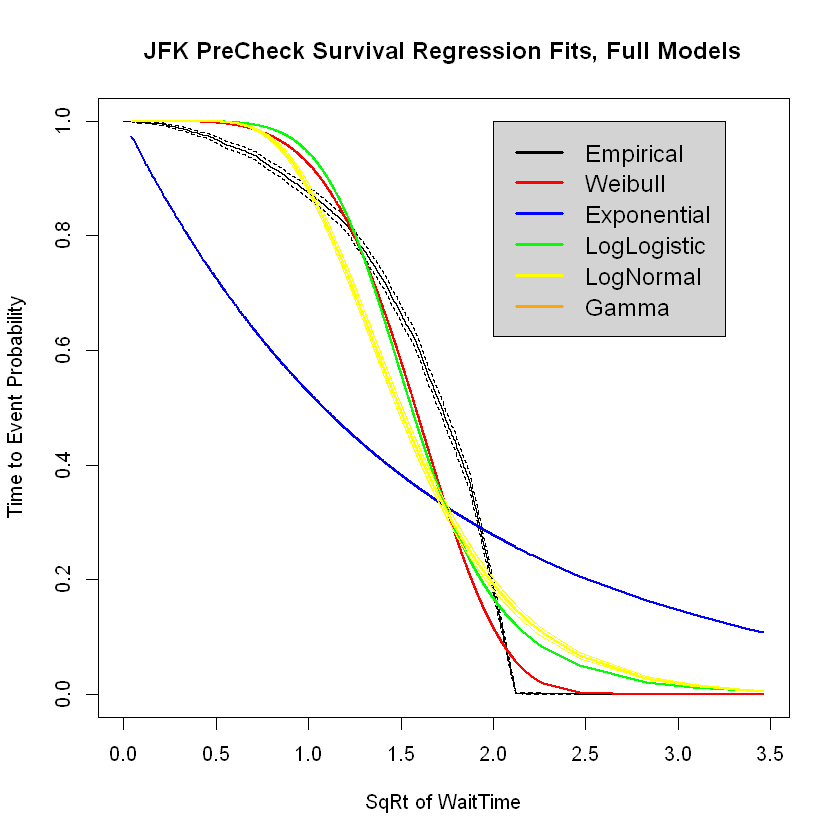


JFK Regular FULL MODEL


               HourInt HourIntSquared HourIntCubed AMRush PMRush   Jan   Feb
HourIntSquared    0.97                                                      
HourIntCubed      0.91           0.99                                       
AMRush           -0.30          -0.33        -0.30                          
PMRush            0.24           0.17         0.10  -0.14                   
Jan               0.00           0.00         0.00   0.00   0.00            
Feb               0.00           0.00         0.01   0.01  -0.01 -0.09      
Mar               0.00          -0.01        -0.01  -0.01   0.00 -0.10 -0.09
Apr               0.01           0.00         0.00   0.02   0.00 -0.10 -0.09
May              -0.01          -0.01        -0.01   0.00  -0.01 -0.10 -0.09
Jun              -0.01          -0.01        -0.01   0.01   0.00 -0.10 -0.09
Jul               0.00           0.00         0.00  -0.01   0.01 -0.10 -0.09
Aug               0.01           0.01         0.01  -0.02   0.00 -0.10 -0.09

Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "


JFK Regular FULL MODEL



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "weibull")
                        Value Std. Error       z       p
(Intercept)          6.83e-01   1.35e-02   50.57 < 2e-16
XVarsHourInt         1.29e-01   4.45e-03   29.02 < 2e-16
XVarsHourIntSquared -7.33e-03   4.84e-04  -15.15 < 2e-16
XVarsHourIntCubed    1.17e-04   1.43e-05    8.22 < 2e-16
XVarsAMRush          1.81e-01   1.11e-02   16.29 < 2e-16
XVarsPMRush          6.03e-03   1.13e-02    0.54  0.5925
XVarsJan            -6.15e-02   1.25e-02   -4.94 8.0e-07
XVarsFeb            -7.20e-02   1.31e-02   -5.51 3.7e-08
XVarsMar            -6.49e-02   1.24e-02   -5.24 1.6e-07
XVarsApr            -1.24e-01   1.26e-02   -9.78 < 2e-16
XVarsMay            -1.17e-01   1.23e-02   -9.47 < 2e-16
XVarsJun            -6.35e-02   1.24e-02   -5.12 3.1e-07
XVarsJul            -1.80e-02   1.24e-02   -1.45  0.1484
XVarsAug            -3.83e-03   1.24e-02   -0.31  0.7569
XVarsSep            -2.35e-02   1.40e-02   -1.68  0.


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "exponential")
                        Value Std. Error     z       p
(Intercept)          3.62e-01   5.82e-02  6.23 4.8e-10
XVarsHourInt         1.69e-01   2.08e-02  8.12 4.8e-16
XVarsHourIntSquared -8.86e-03   2.26e-03 -3.93 8.5e-05
XVarsHourIntCubed    1.25e-04   6.56e-05  1.91   0.056
XVarsAMRush          2.61e-01   5.05e-02  5.18 2.2e-07
XVarsPMRush         -8.30e-03   5.01e-02 -0.17   0.869
XVarsJan            -7.97e-02   5.56e-02 -1.43   0.152
XVarsFeb            -6.13e-02   5.82e-02 -1.05   0.292
XVarsMar            -3.59e-02   5.52e-02 -0.65   0.515
XVarsApr            -9.99e-02   5.60e-02 -1.78   0.074
XVarsMay            -7.98e-02   5.47e-02 -1.46   0.145
XVarsJun            -3.97e-02   5.51e-02 -0.72   0.471
XVarsJul             7.11e-03   5.52e-02  0.13   0.898
XVarsAug             3.35e-02   5.51e-02  0.61   0.543
XVarsSep             1.13e-02   6.17e-02  0.18   0.855
XVarsMon             2.


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "loglogistic")
                        Value Std. Error       z       p
(Intercept)          0.249067   0.018698   13.32 < 2e-16
XVarsHourInt         0.192887   0.006259   30.82 < 2e-16
XVarsHourIntSquared -0.010644   0.000637  -16.71 < 2e-16
XVarsHourIntCubed    0.000166   0.000018    9.24 < 2e-16
XVarsAMRush          0.275631   0.012189   22.61 < 2e-16
XVarsPMRush         -0.000654   0.011607   -0.06  0.9550
XVarsJan            -0.072821   0.014182   -5.13 2.8e-07
XVarsFeb            -0.063439   0.014440   -4.39 1.1e-05
XVarsMar            -0.034209   0.013589   -2.52  0.0118
XVarsApr            -0.091559   0.013660   -6.70 2.0e-11
XVarsMay            -0.067547   0.013327   -5.07 4.0e-07
XVarsJun            -0.041475   0.013459   -3.08  0.0021
XVarsJul             0.014810   0.013473    1.10  0.2717
XVarsAug             0.041129   0.013385    3.07  0.0021
XVarsSep             0.022351   0.014964    1.49


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "lognormal")
                        Value Std. Error       z       p
(Intercept)          2.30e-01   1.61e-02   14.29 < 2e-16
XVarsHourInt         1.86e-01   6.00e-03   31.08 < 2e-16
XVarsHourIntSquared -9.62e-03   6.45e-04  -14.91 < 2e-16
XVarsHourIntCubed    1.32e-04   1.86e-05    7.13 9.9e-13
XVarsAMRush          2.92e-01   1.40e-02   20.85 < 2e-16
XVarsPMRush         -1.06e-02   1.37e-02   -0.77  0.4406
XVarsJan            -9.90e-02   1.52e-02   -6.51 7.4e-11
XVarsFeb            -5.20e-02   1.59e-02   -3.27  0.0011
XVarsMar            -2.23e-02   1.51e-02   -1.48  0.1390
XVarsApr            -8.51e-02   1.53e-02   -5.56 2.7e-08
XVarsMay            -6.13e-02   1.50e-02   -4.10 4.2e-05
XVarsJun            -2.74e-02   1.51e-02   -1.82  0.0694
XVarsJul             1.88e-02   1.51e-02    1.24  0.2144
XVarsAug             4.65e-02   1.51e-02    3.08  0.0020
XVarsSep             2.63e-02   1.69e-02    1.56  

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "weibull")

Estimates: 
                     data mean  est        L95%       U95%       se       
shape                       NA   4.46e+00         NA         NA         NA
scale                       NA   1.98e+00         NA         NA         NA
XVarsHourInt          1.16e+01   1.29e-01         NA         NA         NA
XVarsHourIntSquared   1.82e+02  -7.33e-03         NA         NA         NA
XVarsHourIntCubed     3.20e+03   1.17e-04         NA         NA         NA
XVarsAMRush           1.22e-01   1.81e-01         NA         NA         NA
XVarsPMRush           1.27e-01   6.03e-03         NA         NA         NA
XVarsJan              8.94e-02  -6.15e-02         NA         NA         NA
XVarsFeb              7.89e-02  -7.20e-02         NA         NA         NA
XVarsMar              9.12e-02  -6.49e-02         NA         NA         NA
XVarsApr              8.76e-02  -1.24e-01         NA         NA   

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "exponential")

Estimates: 
                     data mean  est        L95%       U95%       se       
rate                        NA   6.96e-01         NA         NA         NA
XVarsHourInt          1.16e+01  -1.69e-01         NA         NA         NA
XVarsHourIntSquared   1.82e+02   8.86e-03         NA         NA         NA
XVarsHourIntCubed     3.20e+03  -1.25e-04         NA         NA         NA
XVarsAMRush           1.22e-01  -2.61e-01         NA         NA         NA
XVarsPMRush           1.27e-01   8.30e-03         NA         NA         NA
XVarsJan              8.94e-02   7.97e-02         NA         NA         NA
XVarsFeb              7.89e-02   6.13e-02         NA         NA         NA
XVarsMar              9.12e-02   3.59e-02         NA         NA         NA
XVarsApr              8.76e-02   9.99e-02         NA         NA         NA
XVarsMay              9.33e-02   7.98e-02         NA         N

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "llogis")

Estimates: 
                     data mean  est        L95%       U95%       se       
shape                       NA   7.01e+00         NA         NA         NA
scale                       NA   1.28e+00         NA         NA         NA
XVarsHourInt          1.16e+01   1.93e-01         NA         NA         NA
XVarsHourIntSquared   1.82e+02  -1.06e-02         NA         NA         NA
XVarsHourIntCubed     3.20e+03   1.66e-04         NA         NA         NA
XVarsAMRush           1.22e-01   2.76e-01         NA         NA         NA
XVarsPMRush           1.27e-01  -6.54e-04         NA         NA         NA
XVarsJan              8.94e-02  -7.28e-02         NA         NA         NA
XVarsFeb              7.89e-02  -6.34e-02         NA         NA         NA
XVarsMar              9.12e-02  -3.42e-02         NA         NA         NA
XVarsApr              8.76e-02  -9.16e-02         NA         NA    

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "lnorm")

Estimates: 
                     data mean  est        L95%       U95%       se       
meanlog                     NA   2.30e-01   1.99e-01   2.62e-01   1.61e-02
sdlog                       NA   2.74e-01   2.68e-01   2.79e-01   2.70e-03
XVarsHourInt          1.16e+01   1.86e-01   1.75e-01   1.98e-01   6.00e-03
XVarsHourIntSquared   1.82e+02  -9.62e-03  -1.09e-02  -8.36e-03   6.45e-04
XVarsHourIntCubed     3.20e+03   1.33e-04   9.61e-05   1.69e-04   1.86e-05
XVarsAMRush           1.22e-01   2.92e-01   2.64e-01   3.19e-01   1.40e-02
XVarsPMRush           1.27e-01  -1.06e-02  -3.75e-02   1.63e-02   1.37e-02
XVarsJan              8.94e-02  -9.90e-02  -1.29e-01  -6.92e-02   1.52e-02
XVarsFeb              7.89e-02  -5.20e-02  -8.32e-02  -2.08e-02   1.59e-02
XVarsMar              9.12e-02  -2.23e-02  -5.19e-02   7.25e-03   1.51e-02
XVarsApr              8.76e-02  -8.51e-02  -1.15e-01  -5.51e-02   1.


JFK Regular Full Model RMSE of Training Data LogLogistic Survival
[1] 0.674271


Warning message:
"'newdata' had 2197 rows but variables found have 5123 rows"


JFK Regular Full Model RMSE of Test Data LogLogistic Survival


Warning message in JFKRegTestSample$WaitTimeContinuousSqRt - SurvLogLogisticPredictedTest:
"longer object length is not a multiple of shorter object length"

[1] 1.207976


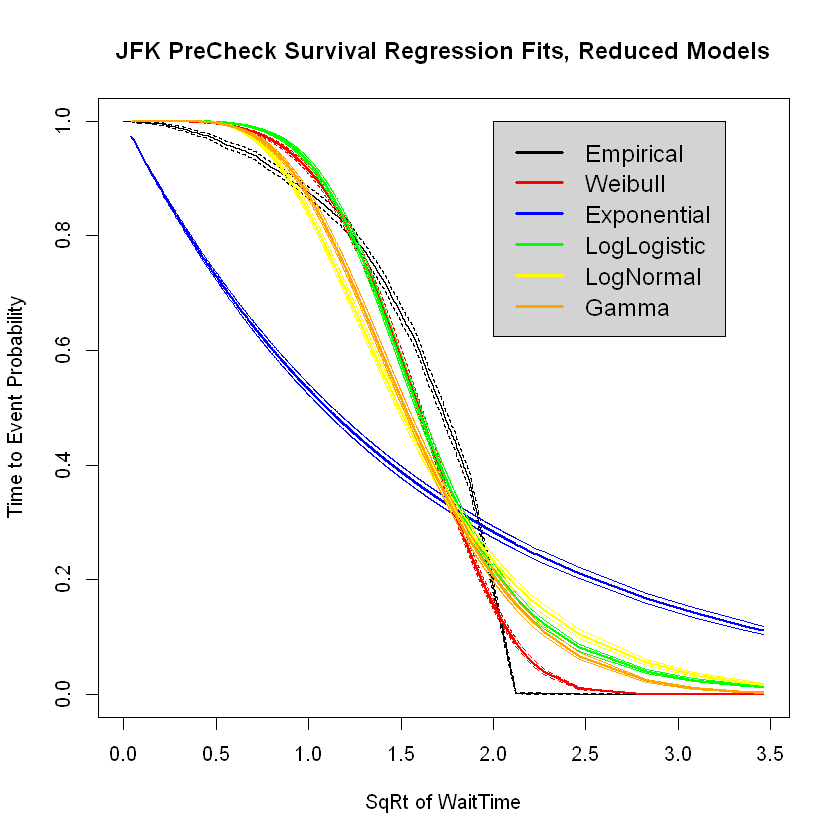

Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"


JFK Regular REDUCED MODEL



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "weibull")
                     Value Std. Error       z       p
(Intercept)       1.057586   0.012257   86.28 < 2e-16
XVarsLiteHourInt  0.014761   0.000717   20.59 < 2e-16
XVarsLiteAMRush   0.235243   0.011551   20.37 < 2e-16
XVarsLitePMRush   0.054512   0.010948    4.98 6.4e-07
XVarsLiteJan     -0.051936   0.013795   -3.77 0.00017
XVarsLiteFeb     -0.060217   0.014457   -4.17 3.1e-05
XVarsLiteMar     -0.045297   0.013689   -3.31 0.00094
XVarsLiteApr     -0.099584   0.013904   -7.16 7.9e-13
XVarsLiteMay     -0.102870   0.013591   -7.57 3.8e-14
XVarsLiteJun     -0.070604   0.013683   -5.16 2.5e-07
XVarsLiteJul     -0.007101   0.013751   -0.52 0.60557
XVarsLiteAug      0.012567   0.013658    0.92 0.35753
XVarsLiteSep      0.007682   0.015354    0.50 0.61682
XVarsLiteMon      0.004765   0.010649    0.45 0.65457
XVarsLiteFri      0.018464   0.010641    1.74 0.08270
XVarsLiteSat     -0.019931   0.010857  


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "exponential")
                    Value Std. Error     z      p
(Intercept)       0.81268    0.04500 18.06 <2e-16
XVarsLiteHourInt  0.02501    0.00239 10.48 <2e-16
XVarsLiteAMRush   0.37945    0.04527  8.38 <2e-16
XVarsLitePMRush   0.09078    0.04357  2.08  0.037
XVarsLiteJan     -0.07801    0.05556 -1.40  0.160
XVarsLiteFeb     -0.07035    0.05815 -1.21  0.226
XVarsLiteMar     -0.02887    0.05518 -0.52  0.601
XVarsLiteApr     -0.09567    0.05597 -1.71  0.087
XVarsLiteMay     -0.08440    0.05470 -1.54  0.123
XVarsLiteJun     -0.04832    0.05511 -0.88  0.381
XVarsLiteJul      0.01001    0.05523  0.18  0.856
XVarsLiteAug      0.03182    0.05505  0.58  0.563
XVarsLiteSep      0.02324    0.06171  0.38  0.706
XVarsLiteMon     -0.00489    0.04278 -0.11  0.909
XVarsLiteFri      0.01815    0.04274  0.42  0.671
XVarsLiteSat     -0.01664    0.04353 -0.38  0.702
XVarsLiteSun     -0.00487    0.04279 -0.11  0.909


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "loglogistic")
                     Value Std. Error       z       p
(Intercept)       0.809917   0.014771   54.83 < 2e-16
XVarsLiteHourInt  0.023739   0.000755   31.42 < 2e-16
XVarsLiteAMRush   0.377813   0.013148   28.74 < 2e-16
XVarsLitePMRush   0.099171   0.012181    8.14 3.9e-16
XVarsLiteJan     -0.080742   0.017715   -4.56 5.2e-06
XVarsLiteFeb     -0.078661   0.017895   -4.40 1.1e-05
XVarsLiteMar     -0.026918   0.016830   -1.60   0.110
XVarsLiteApr     -0.090898   0.017094   -5.32 1.1e-07
XVarsLiteMay     -0.074806   0.016558   -4.52 6.3e-06
XVarsLiteJun     -0.038206   0.016558   -2.31   0.021
XVarsLiteJul      0.022557   0.016711    1.35   0.177
XVarsLiteAug      0.039312   0.016726    2.35   0.019
XVarsLiteSep      0.030898   0.018787    1.64   0.100
XVarsLiteMon     -0.003624   0.013049   -0.28   0.781
XVarsLiteFri      0.017626   0.012986    1.36   0.175
XVarsLiteSat     -0.020956   0.0132


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "lognormal")
                     Value Std. Error       z       p
(Intercept)       0.689348   0.014879   46.33 < 2e-16
XVarsLiteHourInt  0.029643   0.000745   39.80 < 2e-16
XVarsLiteAMRush   0.455856   0.015402   29.60 < 2e-16
XVarsLitePMRush   0.121832   0.014881    8.19 2.7e-16
XVarsLiteJan     -0.104097   0.019060   -5.46 4.7e-08
XVarsLiteFeb     -0.065142   0.019946   -3.27 0.00109
XVarsLiteMar     -0.014363   0.018934   -0.76 0.44808
XVarsLiteApr     -0.085381   0.019205   -4.45 8.8e-06
XVarsLiteMay     -0.065959   0.018773   -3.51 0.00044
XVarsLiteJun     -0.029918   0.018911   -1.58 0.11365
XVarsLiteJul      0.021732   0.018942    1.15 0.25127
XVarsLiteAug      0.043985   0.018893    2.33 0.01991
XVarsLiteSep      0.034856   0.021161    1.65 0.09953
XVarsLiteMon     -0.015254   0.014674   -1.04 0.29858
XVarsLiteFri      0.018143   0.014653    1.24 0.21565
XVarsLiteSat     -0.014477   0.014926

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "weibull")

Estimates: 
                  data mean  est        L95%       U95%       se       
shape                    NA   4.031626   3.943445   4.121779   0.045491
scale                    NA   2.879413   2.811092   2.949394   0.035279
XVarsLiteHourInt  11.573102   0.014761   0.013357   0.016165   0.000716
XVarsLiteAMRush    0.122194   0.235243   0.212605   0.257881   0.011550
XVarsLitePMRush    0.127269   0.054512   0.033055   0.075969   0.010948
XVarsLiteJan       0.089401  -0.051936  -0.078973  -0.024900   0.013795
XVarsLiteFeb       0.078860  -0.060217  -0.088552  -0.031882   0.014457
XVarsLiteMar       0.091158  -0.045297  -0.072127  -0.018467   0.013689
XVarsLiteApr       0.087644  -0.099584  -0.126835  -0.072334   0.013904
XVarsLiteMay       0.093305  -0.102870  -0.129507  -0.076232   0.013591
XVarsLiteJun       0.091548  -0.070604  -0.097423  -0.043786   0.013683
XVarsLiteJul       0.09

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "exponential")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
rate                    NA    0.44367   0.40622   0.48457   0.01996        NA
XVarsLiteHourInt  11.57310   -0.02501  -0.02969  -0.02034   0.00239   0.97530
XVarsLiteAMRush    0.12219   -0.37945  -0.46819  -0.29072   0.04527   0.68424
XVarsLitePMRush    0.12727   -0.09078  -0.17618  -0.00539   0.04357   0.91321
XVarsLiteJan       0.08940    0.07801  -0.03089   0.18691   0.05556   1.08114
XVarsLiteFeb       0.07886    0.07035  -0.04362   0.18432   0.05815   1.07289
XVarsLiteMar       0.09116    0.02887  -0.07929   0.13702   0.05518   1.02929
XVarsLiteApr       0.08764    0.09567  -0.01403   0.20537   0.05597   1.10039
XVarsLiteMay       0.09330    0.08440  -0.02282   0.19161   0.05470   1.08806
XVarsLiteJun       0.09155    0.04832  -0.05969   0.15633   0.05511   1.04951
XVarsLiteJul       0.0909

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "llogis")

Estimates: 
                  data mean  est        L95%       U95%       se       
shape                    NA   5.581529   5.451812   5.714331   0.066964
scale                    NA   2.247723   2.183579   2.313751   0.033203
XVarsLiteHourInt  11.573102   0.023739   0.022258   0.025220   0.000756
XVarsLiteAMRush    0.122194   0.377813   0.352044   0.403583   0.013148
XVarsLitePMRush    0.127269   0.099171   0.075297   0.123044   0.012181
XVarsLiteJan       0.089401  -0.080743  -0.115464  -0.046021   0.017715
XVarsLiteFeb       0.078860  -0.078660  -0.113735  -0.043586   0.017895
XVarsLiteMar       0.091158  -0.026918  -0.059905   0.006069   0.016830
XVarsLiteApr       0.087644  -0.090897  -0.124400  -0.057394   0.017094
XVarsLiteMay       0.093305  -0.074806  -0.107259  -0.042353   0.016558
XVarsLiteJun       0.091548  -0.038206  -0.070659  -0.005753   0.016558
XVarsLiteJul       0.090

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "lnorm")

Estimates: 
                  data mean  est        L95%       U95%       se       
meanlog                  NA   0.689348   0.660185   0.718511   0.014879
sdlog                    NA   0.343127   0.336547   0.349836   0.003390
XVarsLiteHourInt  11.573102   0.029643   0.028183   0.031102   0.000745
XVarsLiteAMRush    0.122194   0.455856   0.425669   0.486043   0.015402
XVarsLitePMRush    0.127269   0.121832   0.092666   0.150999   0.014881
XVarsLiteJan       0.089401  -0.104097  -0.141454  -0.066740   0.019060
XVarsLiteFeb       0.078860  -0.065142  -0.104237  -0.026048   0.019946
XVarsLiteMar       0.091158  -0.014363  -0.051473   0.022746   0.018934
XVarsLiteApr       0.087644  -0.085381  -0.123022  -0.047740   0.019205
XVarsLiteMay       0.093305  -0.065959  -0.102753  -0.029165   0.018773
XVarsLiteJun       0.091548  -0.029918  -0.066983   0.007148   0.018911
XVarsLiteJul       0.0909

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "gamma")

Estimates: 
                  data mean  est        L95%       U95%       se       
shape                    NA   9.785702   9.420032  10.165566   0.190145
rate                     NA   4.342376   4.141424   4.553078   0.104976
XVarsLiteHourInt  11.573102  -0.025025  -0.026520  -0.023530   0.000763
XVarsLiteAMRush    0.122194  -0.379525  -0.407891  -0.351160   0.014472
XVarsLitePMRush    0.127269  -0.090740  -0.118038  -0.063442   0.013928
XVarsLiteJan       0.089401   0.077994   0.043182   0.112807   0.017762
XVarsLiteFeb       0.078860   0.070336   0.033902   0.106769   0.018589
XVarsLiteMar       0.091158   0.028862  -0.005710   0.063434   0.017639
XVarsLiteApr       0.087644   0.095659   0.060591   0.130726   0.017892
XVarsLiteMay       0.093305   0.084385   0.050112   0.118657   0.017486
XVarsLiteJun       0.091548   0.048315   0.013789   0.082841   0.017616
XVarsLiteJul       0.0909


JFK Regular Reduced Model RMSE of Training Data Weibull Survival
[1] 0.8839371


Warning message:
"'newdata' had 2197 rows but variables found have 5123 rows"


JFK Regular Reduced Model RMSE of Test Data Weibull Survival


Warning message in JFKRegTestSample$WaitTimeContinuousSqRt - SurvWeibullPredictedTest3:
"longer object length is not a multiple of shorter object length"

[1] 1.120744


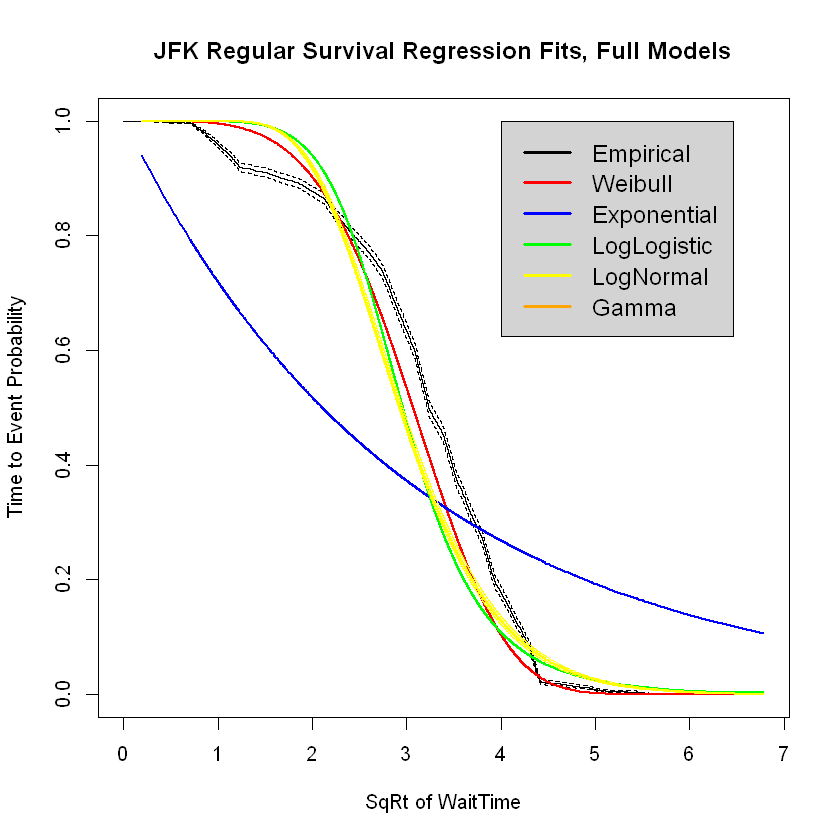


EWR PRECHECK FULL MODEL


               HourInt HourIntSquared HourIntCubed AMRush PMRush   Jan   Feb
HourIntSquared    0.98                                                      
HourIntCubed      0.94           0.99                                       
AMRush           -0.51          -0.48        -0.42                          
PMRush            0.42           0.40         0.35  -0.21                   
Jan               0.00           0.00         0.00   0.02  -0.03            
Feb              -0.01          -0.01        -0.02   0.01  -0.01 -0.09      
Mar              -0.01          -0.01        -0.02   0.00  -0.01 -0.09 -0.09
Apr               0.00           0.00         0.01  -0.01  -0.01 -0.10 -0.09
May              -0.01           0.00         0.00   0.01   0.00 -0.10 -0.10
Jun               0.00           0.00         0.01   0.00  -0.01 -0.10 -0.09
Jul              -0.01          -0.01        -0.01  -0.01   0.01 -0.10 -0.09
Aug              -0.01          -0.01         0.00   0.01   0.01 -0.10 -0.09

Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "


EWR PRECHECK FULL MODEL



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "weibull")
                        Value Std. Error       z       p
(Intercept)         -4.66e-01   5.22e-02   -8.93 < 2e-16
XVarsHourInt         2.03e-01   1.68e-02   12.09 < 2e-16
XVarsHourIntSquared -1.38e-02   1.65e-03   -8.39 < 2e-16
XVarsHourIntCubed    2.72e-04   4.81e-05    5.65 1.6e-08
XVarsAMRush          2.95e-01   1.43e-02   20.62 < 2e-16
XVarsPMRush          1.25e-01   1.38e-02    9.07 < 2e-16
XVarsJan            -6.63e-02   1.68e-02   -3.94 8.2e-05
XVarsFeb            -4.66e-02   1.74e-02   -2.67 0.00754
XVarsMar            -2.27e-03   1.67e-02   -0.14 0.89168
XVarsApr             7.96e-02   1.69e-02    4.71 2.4e-06
XVarsMay             7.17e-02   1.60e-02    4.47 7.7e-06
XVarsJun             1.45e-01   1.66e-02    8.75 < 2e-16
XVarsJul             1.68e-01   1.67e-02   10.11 < 2e-16
XVarsAug             1.47e-01   1.69e-02    8.71 < 2e-16
XVarsSep             8.82e-02   1.83e-02    4.81 1.5


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "exponential")
                        Value Std. Error     z       p
(Intercept)         -0.897816   0.183529 -4.89 1.0e-06
XVarsHourInt         0.237524   0.060563  3.92 8.8e-05
XVarsHourIntSquared -0.013228   0.005995 -2.21 0.02735
XVarsHourIntCubed    0.000180   0.000175  1.03 0.30215
XVarsAMRush          0.456532   0.056054  8.14 3.8e-16
XVarsPMRush          0.130898   0.055797  2.35 0.01898
XVarsJan            -0.066507   0.067425 -0.99 0.32395
XVarsFeb            -0.022830   0.069957 -0.33 0.74416
XVarsMar             0.046553   0.066674  0.70 0.48505
XVarsApr             0.107485   0.066602  1.61 0.10656
XVarsMay             0.132078   0.063974  2.06 0.03897
XVarsJun             0.237145   0.065617  3.61 0.00030
XVarsJul             0.250938   0.064758  3.88 0.00011
XVarsAug             0.223922   0.066218  3.38 0.00072
XVarsSep             0.143304   0.072689  1.97 0.04867
XVarsMon            -0.


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "loglogistic")
                        Value Std. Error       z       p
(Intercept)         -0.982398   0.058874  -16.69 < 2e-16
XVarsHourInt         0.259287   0.018801   13.79 < 2e-16
XVarsHourIntSquared -0.015138   0.001832   -8.26 < 2e-16
XVarsHourIntCubed    0.000232   0.000053    4.37 1.2e-05
XVarsAMRush          0.466689   0.015897   29.36 < 2e-16
XVarsPMRush          0.137228   0.015240    9.00 < 2e-16
XVarsJan            -0.069530   0.019574   -3.55 0.00038
XVarsFeb            -0.019813   0.019464   -1.02 0.30871
XVarsMar             0.048529   0.018393    2.64 0.00833
XVarsApr             0.098546   0.018383    5.36 8.3e-08
XVarsMay             0.136900   0.017552    7.80 6.2e-15
XVarsJun             0.222352   0.017753   12.52 < 2e-16
XVarsJul             0.222276   0.017609   12.62 < 2e-16
XVarsAug             0.192882   0.018102   10.66 < 2e-16
XVarsSep             0.121692   0.020189    6.03


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "lognormal")
                        Value Std. Error      z       p
(Intercept)         -1.13e+00   6.07e-02 -18.65 < 2e-16
XVarsHourInt         2.57e-01   2.03e-02  12.69 < 2e-16
XVarsHourIntSquared -1.29e-02   2.01e-03  -6.43 1.3e-10
XVarsHourIntCubed    1.29e-04   5.82e-05   2.21  0.0270
XVarsAMRush          5.44e-01   1.84e-02  29.50 < 2e-16
XVarsPMRush          1.37e-01   1.85e-02   7.42 1.2e-13
XVarsJan            -6.76e-02   2.21e-02  -3.05  0.0023
XVarsFeb            -1.74e-02   2.30e-02  -0.75  0.4504
XVarsMar             6.52e-02   2.19e-02   2.97  0.0029
XVarsApr             1.26e-01   2.18e-02   5.75 8.7e-09
XVarsMay             1.50e-01   2.10e-02   7.13 1.0e-12
XVarsJun             2.76e-01   2.15e-02  12.83 < 2e-16
XVarsJul             2.85e-01   2.12e-02  13.43 < 2e-16
XVarsAug             2.57e-01   2.17e-02  11.85 < 2e-16
XVarsSep             1.65e-01   2.39e-02   6.93 4.4e-12
XVarsMon 

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "weibull")

Estimates: 
                     data mean  est        L95%       U95%       se       
shape                       NA   4.03e+00         NA         NA         NA
scale                       NA   6.28e-01         NA         NA         NA
XVarsHourInt          1.15e+01   2.03e-01         NA         NA         NA
XVarsHourIntSquared   1.56e+02  -1.38e-02         NA         NA         NA
XVarsHourIntCubed     2.35e+03   2.72e-04         NA         NA         NA
XVarsAMRush           1.77e-01   2.95e-01         NA         NA         NA
XVarsPMRush           1.74e-01   1.25e-01         NA         NA         NA
XVarsJan              8.48e-02  -6.63e-02         NA         NA         NA
XVarsFeb              7.66e-02  -4.66e-02         NA         NA         NA
XVarsMar              8.76e-02  -2.27e-03         NA         NA         NA
XVarsApr              8.90e-02   7.96e-02         NA         NA   

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "exponential")

Estimates: 
                     data mean  est        L95%       U95%       se       
rate                        NA   2.45e+00         NA         NA         NA
XVarsHourInt          1.15e+01  -2.38e-01         NA         NA         NA
XVarsHourIntSquared   1.56e+02   1.32e-02         NA         NA         NA
XVarsHourIntCubed     2.35e+03  -1.80e-04         NA         NA         NA
XVarsAMRush           1.77e-01  -4.57e-01         NA         NA         NA
XVarsPMRush           1.74e-01  -1.31e-01         NA         NA         NA
XVarsJan              8.48e-02   6.65e-02         NA         NA         NA
XVarsFeb              7.66e-02   2.28e-02         NA         NA         NA
XVarsMar              8.76e-02  -4.66e-02         NA         NA         NA
XVarsApr              8.90e-02  -1.07e-01         NA         NA         NA
XVarsMay              9.86e-02  -1.32e-01         NA         N

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "llogis")

Estimates: 
                     data mean  est        L95%       U95%       se       
shape                       NA   6.19e+00         NA         NA         NA
scale                       NA   3.74e-01         NA         NA         NA
XVarsHourInt          1.15e+01   2.59e-01         NA         NA         NA
XVarsHourIntSquared   1.56e+02  -1.51e-02         NA         NA         NA
XVarsHourIntCubed     2.35e+03   2.32e-04         NA         NA         NA
XVarsAMRush           1.77e-01   4.67e-01         NA         NA         NA
XVarsPMRush           1.74e-01   1.37e-01         NA         NA         NA
XVarsJan              8.48e-02  -6.95e-02         NA         NA         NA
XVarsFeb              7.66e-02  -1.98e-02         NA         NA         NA
XVarsMar              8.76e-02   4.85e-02         NA         NA         NA
XVarsApr              8.90e-02   9.85e-02         NA         NA    

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "lnorm")

Estimates: 
                     data mean  est        L95%       U95%       se       
meanlog                     NA  -1.13e+00  -1.25e+00  -1.01e+00   6.07e-02
sdlog                       NA   3.29e-01   3.21e-01   3.36e-01   3.86e-03
XVarsHourInt          1.15e+01   2.57e-01   2.18e-01   2.97e-01   2.03e-02
XVarsHourIntSquared   1.56e+02  -1.29e-02  -1.68e-02  -8.96e-03   2.01e-03
XVarsHourIntCubed     2.35e+03   1.29e-04   1.46e-05   2.43e-04   5.82e-05
XVarsAMRush           1.77e-01   5.44e-01   5.08e-01   5.80e-01   1.84e-02
XVarsPMRush           1.74e-01   1.37e-01   1.01e-01   1.74e-01   1.85e-02
XVarsJan              8.48e-02  -6.76e-02  -1.11e-01  -2.42e-02   2.21e-02
XVarsFeb              7.66e-02  -1.74e-02  -6.25e-02   2.77e-02   2.30e-02
XVarsMar              8.76e-02   6.52e-02   2.22e-02   1.08e-01   2.19e-02
XVarsApr              8.90e-02   1.26e-01   8.28e-02   1.68e-01   2.


EWR PreCheck Full Model RMSE of Training Data Weibull Survival
[1] 0.3830203


Warning message:
"'newdata' had 1555 rows but variables found have 3630 rows"


EWR PreCheck Full Model RMSE of Test Data Weibull Survival


Warning message in EWRPreTestSample$WaitTimeContinuousSqRt - SurvWeibullPredictedTest:
"longer object length is not a multiple of shorter object length"

[1] 0.5548183


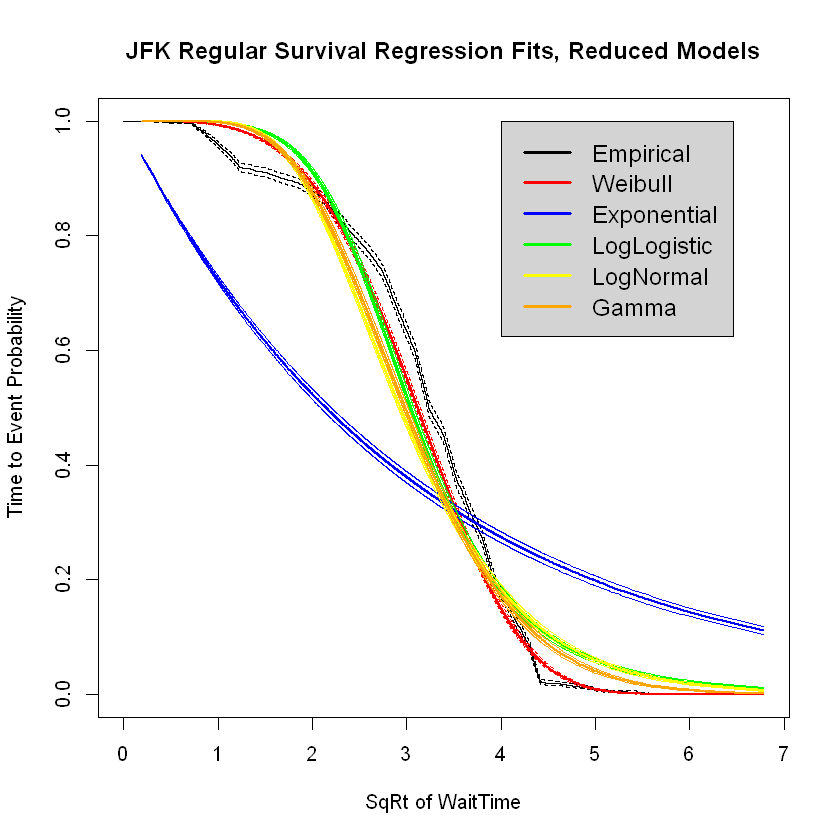

Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning me


EWR PRECHECK REDUCED MODEL



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "weibull")
                     Value Std. Error       z       p
(Intercept)       0.389290   0.020299   19.18 < 2e-16
XVarsLiteHourInt  0.000124   0.001352    0.09 0.92686
XVarsLiteAMRush   0.223609   0.013907   16.08 < 2e-16
XVarsLitePMRush   0.101829   0.012795    7.96 1.7e-15
XVarsLiteJan     -0.066981   0.017263   -3.88 0.00010
XVarsLiteFeb     -0.045531   0.017891   -2.54 0.01093
XVarsLiteMar      0.002533   0.017060    0.15 0.88194
XVarsLiteApr      0.072531   0.017135    4.23 2.3e-05
XVarsLiteMay      0.073219   0.016400    4.46 8.0e-06
XVarsLiteJun      0.113941   0.016808    6.78 1.2e-11
XVarsLiteJul      0.124883   0.016664    7.49 6.7e-14
XVarsLiteAug      0.105770   0.016944    6.24 4.3e-10
XVarsLiteSep      0.057614   0.018598    3.10 0.00195
XVarsLiteMon     -0.008811   0.012910   -0.68 0.49493
XVarsLiteFri      0.021050   0.013018    1.62 0.10587
XVarsLiteSat     -0.046718   0.013055  


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "exponential")
                    Value Std. Error     z       p
(Intercept)       0.12643    0.07108  1.78 0.07528
XVarsLiteHourInt  0.00854    0.00469  1.82 0.06880
XVarsLiteAMRush   0.36982    0.05216  7.09 1.3e-12
XVarsLitePMRush   0.13021    0.04905  2.65 0.00795
XVarsLiteJan     -0.06465    0.06742 -0.96 0.33759
XVarsLiteFeb     -0.00401    0.06991 -0.06 0.95424
XVarsLiteMar      0.05935    0.06665  0.89 0.37318
XVarsLiteApr      0.09085    0.06647  1.37 0.17169
XVarsLiteMay      0.11981    0.06394  1.87 0.06095
XVarsLiteJun      0.20655    0.06549  3.15 0.00161
XVarsLiteJul      0.21824    0.06459  3.38 0.00073
XVarsLiteAug      0.19127    0.06605  2.90 0.00378
XVarsLiteSep      0.13110    0.07264  1.80 0.07111
XVarsLiteMon     -0.00967    0.05060 -0.19 0.84853
XVarsLiteFri      0.03090    0.05098  0.61 0.54442
XVarsLiteSat     -0.06428    0.05100 -1.26 0.20759
XVarsLiteSun     -0.00329    0.0


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "loglogistic")
                    Value Std. Error       z       p
(Intercept)       0.15325    0.02364    6.48 8.9e-11
XVarsLiteHourInt  0.00624    0.00154    4.04 5.3e-05
XVarsLiteAMRush   0.35807    0.01599   22.40 < 2e-16
XVarsLitePMRush   0.13293    0.01437    9.25 < 2e-16
XVarsLiteJan     -0.07105    0.02190   -3.24 0.00118
XVarsLiteFeb      0.00243    0.02175    0.11 0.91117
XVarsLiteMar      0.05630    0.02047    2.75 0.00594
XVarsLiteApr      0.07286    0.02071    3.52 0.00044
XVarsLiteMay      0.10987    0.01991    5.52 3.4e-08
XVarsLiteJun      0.19582    0.01959    9.99 < 2e-16
XVarsLiteJul      0.19923    0.01932   10.31 < 2e-16
XVarsLiteAug      0.16895    0.01997    8.46 < 2e-16
XVarsLiteSep      0.11137    0.02224    5.01 5.5e-07
XVarsLiteMon     -0.00960    0.01547   -0.62 0.53495
XVarsLiteFri      0.04162    0.01543    2.70 0.00699
XVarsLiteSat     -0.07082    0.01568   -4.52 6.3e-0


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "lognormal")
                   Value Std. Error      z       p
(Intercept)      -0.0452     0.0250  -1.80 0.07116
XVarsLiteHourInt  0.0142     0.0016   8.88 < 2e-16
XVarsLiteAMRush   0.4698     0.0193  24.32 < 2e-16
XVarsLitePMRush   0.1620     0.0184   8.80 < 2e-16
XVarsLiteJan     -0.0604     0.0257  -2.35 0.01872
XVarsLiteFeb      0.0180     0.0266   0.68 0.49901
XVarsLiteMar      0.0948     0.0254   3.73 0.00019
XVarsLiteApr      0.1154     0.0253   4.56 5.2e-06
XVarsLiteMay      0.1429     0.0244   5.87 4.5e-09
XVarsLiteJun      0.2695     0.0249  10.80 < 2e-16
XVarsLiteJul      0.2848     0.0246  11.59 < 2e-16
XVarsLiteAug      0.2540     0.0252  10.09 < 2e-16
XVarsLiteSep      0.1886     0.0277   6.82 9.4e-12
XVarsLiteMon     -0.0135     0.0193  -0.70 0.48342
XVarsLiteFri      0.0214     0.0194   1.10 0.27113
XVarsLiteSat     -0.0751     0.0194  -3.86 0.00011
XVarsLiteSun     -0.0182     0.019

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "weibull")

Estimates: 
                  data mean  est        L95%       U95%       se       
shape                    NA   3.928625   3.830936   4.028806   0.050473
scale                    NA   1.475932   1.418393   1.535806   0.029945
XVarsLiteHourInt  11.458127   0.000124  -0.002524   0.002773   0.001351
XVarsLiteAMRush    0.176584   0.223609   0.196356   0.250862   0.013905
XVarsLitePMRush    0.174380   0.101829   0.076752   0.126906   0.012795
XVarsLiteJan       0.084848  -0.066981  -0.100817  -0.033146   0.017263
XVarsLiteFeb       0.076584  -0.045531  -0.080598  -0.010465   0.017891
XVarsLiteMar       0.087603   0.002533  -0.030902   0.035969   0.017059
XVarsLiteApr       0.088981   0.072531   0.038947   0.106116   0.017135
XVarsLiteMay       0.098623   0.073219   0.041075   0.105363   0.016400
XVarsLiteJun       0.092287   0.113941   0.080998   0.146885   0.016808
XVarsLiteJul       0.09

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "exponential")

Estimates: 
                  data mean  est        L95%       U95%       se       
rate                     NA   0.881232   0.766631   1.012963   0.062638
XVarsLiteHourInt  11.458127  -0.008541  -0.017741   0.000658   0.004694
XVarsLiteAMRush    0.176584  -0.369815  -0.472050  -0.267580   0.052162
XVarsLitePMRush    0.174380  -0.130205  -0.226351  -0.034060   0.049055
XVarsLiteJan       0.084848   0.064652  -0.067490   0.196794   0.067421
XVarsLiteFeb       0.076584   0.004012  -0.133018   0.141041   0.069914
XVarsLiteMar       0.087603  -0.059354  -0.189985   0.071277   0.066650
XVarsLiteApr       0.088981  -0.090847  -0.221122   0.039427   0.066468
XVarsLiteMay       0.098623  -0.119806  -0.245117   0.005505   0.063935
XVarsLiteJun       0.092287  -0.206552  -0.334913  -0.078191   0.065492
XVarsLiteJul       0.096419  -0.218241  -0.344837  -0.091645   0.064591
XVarsLiteAug       

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "llogis")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
shape                   NA    5.52267   5.37074   5.67889   0.07860        NA
scale                   NA    1.16563   1.11286   1.22090   0.02755        NA
XVarsLiteHourInt  11.45813    0.00624   0.00321   0.00927   0.00154   1.00626
XVarsLiteAMRush    0.17658    0.35806   0.32673   0.38939   0.01599   1.43055
XVarsLitePMRush    0.17438    0.13294   0.10478   0.16109   0.01437   1.14218
XVarsLiteJan       0.08485   -0.07105  -0.11397  -0.02813   0.02190   0.93141
XVarsLiteFeb       0.07658    0.00242  -0.04021   0.04506   0.02175   1.00243
XVarsLiteMar       0.08760    0.05630   0.01619   0.09641   0.02047   1.05791
XVarsLiteApr       0.08898    0.07285   0.03226   0.11345   0.02071   1.07557
XVarsLiteMay       0.09862    0.10987   0.07084   0.14890   0.01991   1.11613
XVarsLiteJun       0.09229    

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "lnorm")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
meanlog                 NA   -0.04516  -0.09421   0.00389   0.02503        NA
sdlog                   NA    0.38123   0.37256   0.39010   0.00447        NA
XVarsLiteHourInt  11.45813    0.01421   0.01107   0.01735   0.00160   1.01431
XVarsLiteAMRush    0.17658    0.46985   0.43197   0.50772   0.01932   1.59975
XVarsLitePMRush    0.17438    0.16196   0.12589   0.19804   0.01841   1.17582
XVarsLiteJan       0.08485   -0.06039  -0.11073  -0.01005   0.02569   0.94140
XVarsLiteFeb       0.07658    0.01802  -0.03422   0.07026   0.02665   1.01818
XVarsLiteMar       0.08760    0.09481   0.04501   0.14461   0.02541   1.09945
XVarsLiteApr       0.08898    0.11538   0.06577   0.16500   0.02531   1.12230
XVarsLiteMay       0.09862    0.14287   0.09513   0.19061   0.02436   1.15358
XVarsLiteJun       0.09229    0

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "gamma")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
shape                   NA    8.85225   8.46131   9.26125   0.20400        NA
rate                    NA    7.80349   7.31197   8.32805   0.25902        NA
XVarsLiteHourInt  11.45813   -0.00857  -0.01166  -0.00547   0.00158   0.99147
XVarsLiteAMRush    0.17658   -0.37005  -0.40441  -0.33569   0.01753   0.69070
XVarsLitePMRush    0.17438   -0.13009  -0.16240  -0.09777   0.01649   0.87802
XVarsLiteJan       0.08485    0.06464   0.02023   0.10905   0.02266   1.06678
XVarsLiteFeb       0.07658    0.00401  -0.04204   0.05007   0.02350   1.00402
XVarsLiteMar       0.08760   -0.05937  -0.10328  -0.01547   0.02240   0.94236
XVarsLiteApr       0.08898   -0.09085  -0.13464  -0.04707   0.02234   0.91315
XVarsLiteMay       0.09862   -0.11984  -0.16196  -0.07772   0.02149   0.88706
XVarsLiteJun       0.09229   -0


EWR PreCheck Reduced Model RMSE of Training Data Weibull Survival
[1] 0.425797


Warning message:
"'newdata' had 1555 rows but variables found have 3630 rows"


EWR PreCheck Reduced Model RMSE of Test Data Weibull Survival


Warning message in EWRPreTestSample$WaitTimeContinuousSqRt - SurvWeibullPredictedTest3:
"longer object length is not a multiple of shorter object length"

[1] 0.5289644


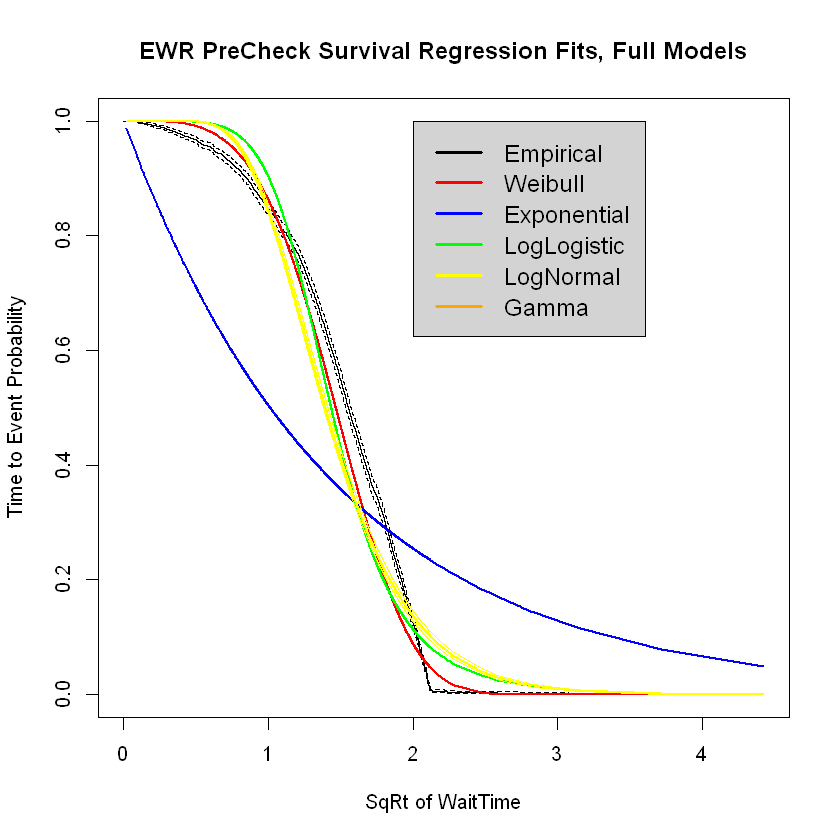


EWR Regular FULL MODEL


               HourInt HourIntSquared HourIntCubed AMRush PMRush   Jan   Feb
HourIntSquared    0.97                                                      
HourIntCubed      0.91           0.99                                       
AMRush           -0.32          -0.34        -0.32                          
PMRush            0.24           0.17         0.09  -0.14                   
Jan               0.01           0.01         0.01  -0.01   0.00            
Feb              -0.02          -0.02        -0.01   0.01  -0.02 -0.09      
Mar               0.01           0.02         0.02  -0.01   0.01 -0.10 -0.09
Apr              -0.01          -0.01        -0.01   0.01  -0.01 -0.10 -0.09
May               0.00          -0.01        -0.01   0.00   0.00 -0.10 -0.10
Jun              -0.01           0.00         0.00  -0.01   0.01 -0.10 -0.09
Jul               0.00          -0.01        -0.01   0.00   0.00 -0.10 -0.10
Aug               0.00           0.00         0.00  -0.01  -0.01 -0.10 -0.10

Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "


EWR Regular FULL MODEL



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "weibull")
                        Value Std. Error      z       p
(Intercept)         -4.16e-01   2.31e-02 -18.05 < 2e-16
XVarsHourInt         2.47e-01   7.68e-03  32.14 < 2e-16
XVarsHourIntSquared -6.35e-03   8.66e-04  -7.34 2.2e-13
XVarsHourIntCubed   -1.35e-04   2.65e-05  -5.09 3.6e-07
XVarsAMRush          4.87e-01   1.73e-02  28.10 < 2e-16
XVarsPMRush         -1.01e-01   1.83e-02  -5.55 2.9e-08
XVarsJan            -5.26e-02   1.93e-02  -2.72  0.0065
XVarsFeb            -8.18e-02   2.01e-02  -4.07 4.7e-05
XVarsMar             1.28e-02   1.96e-02   0.65  0.5142
XVarsApr             2.41e-02   1.96e-02   1.23  0.2173
XVarsMay             3.56e-02   1.89e-02   1.88  0.0599
XVarsJun             2.21e-01   1.97e-02  11.17 < 2e-16
XVarsJul             2.57e-01   1.96e-02  13.14 < 2e-16
XVarsAug             2.71e-01   1.95e-02  13.88 < 2e-16
XVarsSep             2.23e-01   2.18e-02  10.23 < 2e-16
XVarsMon   


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "exponential")
                        Value Std. Error     z       p
(Intercept)         -5.99e-01   6.14e-02 -9.75 < 2e-16
XVarsHourInt         1.84e-01   2.14e-02  8.59 < 2e-16
XVarsHourIntSquared  4.08e-03   2.34e-03  1.74   0.082
XVarsHourIntCubed   -4.91e-04   6.87e-05 -7.15 8.9e-13
XVarsAMRush          6.92e-01   5.01e-02 13.80 < 2e-16
XVarsPMRush         -1.69e-01   5.14e-02 -3.28   0.001
XVarsJan            -6.36e-02   5.61e-02 -1.13   0.257
XVarsFeb            -8.19e-02   5.84e-02 -1.40   0.160
XVarsMar             3.67e-02   5.65e-02  0.65   0.517
XVarsApr             7.10e-02   5.66e-02  1.25   0.210
XVarsMay             9.18e-02   5.47e-02  1.68   0.094
XVarsJun             2.58e-01   5.64e-02  4.58 4.8e-06
XVarsJul             2.94e-01   5.57e-02  5.29 1.2e-07
XVarsAug             3.11e-01   5.57e-02  5.58 2.4e-08
XVarsSep             2.77e-01   6.27e-02  4.42 9.7e-06
XVarsMon             2.


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "loglogistic")
                        Value Std. Error       z       p
(Intercept)         -6.31e-01   2.27e-02  -27.80 < 2e-16
XVarsHourInt         1.50e-01   8.38e-03   17.85 < 2e-16
XVarsHourIntSquared  8.44e-03   9.05e-04    9.33 < 2e-16
XVarsHourIntCubed   -6.20e-04   2.62e-05  -23.69 < 2e-16
XVarsAMRush          7.94e-01   1.80e-02   44.25 < 2e-16
XVarsPMRush         -1.70e-01   1.67e-02  -10.17 < 2e-16
XVarsJan            -5.86e-02   2.08e-02   -2.81 0.00490
XVarsFeb            -7.22e-02   2.15e-02   -3.36 0.00078
XVarsMar             3.12e-02   2.04e-02    1.53 0.12514
XVarsApr             7.09e-02   1.99e-02    3.55 0.00038
XVarsMay             9.36e-02   1.93e-02    4.84 1.3e-06
XVarsJun             2.10e-01   2.02e-02   10.40 < 2e-16
XVarsJul             2.45e-01   1.96e-02   12.48 < 2e-16
XVarsAug             2.72e-01   1.96e-02   13.91 < 2e-16
XVarsSep             2.49e-01   2.17e-02   11.46


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "lognormal")
                        Value Std. Error      z       p
(Intercept)         -7.17e-01   2.55e-02 -28.09 < 2e-16
XVarsHourInt         1.49e-01   9.33e-03  15.93 < 2e-16
XVarsHourIntSquared  9.84e-03   1.00e-03   9.83 < 2e-16
XVarsHourIntCubed   -6.87e-04   2.88e-05 -23.85 < 2e-16
XVarsAMRush          8.19e-01   2.14e-02  38.31 < 2e-16
XVarsPMRush         -1.88e-01   2.14e-02  -8.77 < 2e-16
XVarsJan            -7.63e-02   2.36e-02  -3.24 0.00121
XVarsFeb            -8.65e-02   2.45e-02  -3.53 0.00042
XVarsMar             5.77e-02   2.37e-02   2.43 0.01502
XVarsApr             1.07e-01   2.38e-02   4.51 6.3e-06
XVarsMay             1.33e-01   2.30e-02   5.78 7.6e-09
XVarsJun             2.87e-01   2.36e-02  12.17 < 2e-16
XVarsJul             3.32e-01   2.33e-02  14.24 < 2e-16
XVarsAug             3.56e-01   2.33e-02  15.26 < 2e-16
XVarsSep             3.26e-01   2.63e-02  12.41 < 2e-16
XVarsMon 

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "weibull")

Estimates: 
                     data mean  est        L95%       U95%       se       
shape                       NA   2.90e+00         NA         NA         NA
scale                       NA   6.59e-01         NA         NA         NA
XVarsHourInt          1.17e+01   2.47e-01         NA         NA         NA
XVarsHourIntSquared   1.84e+02  -6.35e-03         NA         NA         NA
XVarsHourIntCubed     3.24e+03  -1.35e-04         NA         NA         NA
XVarsAMRush           1.28e-01   4.87e-01         NA         NA         NA
XVarsPMRush           1.23e-01  -1.01e-01         NA         NA         NA
XVarsJan              9.07e-02  -5.26e-02         NA         NA         NA
XVarsFeb              8.10e-02  -8.18e-02         NA         NA         NA
XVarsMar              8.89e-02   1.28e-02         NA         NA         NA
XVarsApr              8.85e-02   2.41e-02         NA         NA   

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "exponential")

Estimates: 
                     data mean  est        L95%       U95%       se       
rate                        NA   1.82e+00         NA         NA         NA
XVarsHourInt          1.17e+01  -1.84e-01         NA         NA         NA
XVarsHourIntSquared   1.84e+02  -4.08e-03         NA         NA         NA
XVarsHourIntCubed     3.24e+03   4.91e-04         NA         NA         NA
XVarsAMRush           1.28e-01  -6.92e-01         NA         NA         NA
XVarsPMRush           1.23e-01   1.69e-01         NA         NA         NA
XVarsJan              9.07e-02   6.36e-02         NA         NA         NA
XVarsFeb              8.10e-02   8.19e-02         NA         NA         NA
XVarsMar              8.89e-02  -3.67e-02         NA         NA         NA
XVarsApr              8.85e-02  -7.10e-02         NA         NA         NA
XVarsMay              9.80e-02  -9.18e-02         NA         N

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "llogis")

Estimates: 
                     data mean  est        L95%       U95%       se       
shape                       NA   4.77e+00         NA         NA         NA
scale                       NA   5.32e-01         NA         NA         NA
XVarsHourInt          1.17e+01   1.50e-01         NA         NA         NA
XVarsHourIntSquared   1.84e+02   8.44e-03         NA         NA         NA
XVarsHourIntCubed     3.24e+03  -6.20e-04         NA         NA         NA
XVarsAMRush           1.28e-01   7.94e-01         NA         NA         NA
XVarsPMRush           1.23e-01  -1.70e-01         NA         NA         NA
XVarsJan              9.07e-02  -5.86e-02         NA         NA         NA
XVarsFeb              8.10e-02  -7.21e-02         NA         NA         NA
XVarsMar              8.89e-02   3.12e-02         NA         NA         NA
XVarsApr              8.85e-02   7.09e-02         NA         NA    

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "lnorm")

Estimates: 
                     data mean  est        L95%       U95%       se       
meanlog                     NA  -7.17e-01  -7.67e-01  -6.67e-01   2.55e-02
sdlog                       NA   4.20e-01   4.12e-01   4.29e-01   4.18e-03
XVarsHourInt          1.17e+01   1.49e-01   1.30e-01   1.67e-01   9.33e-03
XVarsHourIntSquared   1.84e+02   9.84e-03   7.88e-03   1.18e-02   1.00e-03
XVarsHourIntCubed     3.24e+03  -6.87e-04  -7.43e-04  -6.30e-04   2.88e-05
XVarsAMRush           1.28e-01   8.19e-01   7.77e-01   8.61e-01   2.14e-02
XVarsPMRush           1.23e-01  -1.88e-01  -2.30e-01  -1.46e-01   2.14e-02
XVarsJan              9.07e-02  -7.63e-02  -1.22e-01  -3.01e-02   2.36e-02
XVarsFeb              8.10e-02  -8.65e-02  -1.35e-01  -3.84e-02   2.45e-02
XVarsMar              8.89e-02   5.77e-02   1.12e-02   1.04e-01   2.37e-02
XVarsApr              8.85e-02   1.07e-01   6.08e-02   1.54e-01   2.

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "gamma")

Estimates: 
                     data mean  est        L95%       U95%       se       
shape                       NA   4.33e+00         NA         NA         NA
rate                        NA   1.52e+00         NA         NA         NA
XVarsHourInt          1.17e+01  -1.89e-22         NA         NA         NA
XVarsHourIntSquared   1.84e+02  -5.76e-22         NA         NA         NA
XVarsHourIntCubed     3.24e+03  -5.29e-16         NA         NA         NA
XVarsAMRush           1.28e-01  -1.31e-23         NA         NA         NA
XVarsPMRush           1.23e-01  -1.14e-23         NA         NA         NA
XVarsJan              9.07e-02   2.69e-24         NA         NA         NA
XVarsFeb              8.10e-02   3.07e-24         NA         NA         NA
XVarsMar              8.89e-02   2.08e-24         NA         NA         NA
XVarsApr              8.85e-02   1.10e-24         NA         NA     


EWR Regular Full Model RMSE of Training Data LogLogistic Survival
[1] 0.8575157


Warning message:
"'newdata' had 2165 rows but variables found have 5052 rows"


EWR Regular Full Model RMSE of Test Data LogLogistic Survival


Warning message in EWRRegTestSample$WaitTimeContinuousSqRt - SurvLogLogisticPredictedTest:
"longer object length is not a multiple of shorter object length"

[1] 1.90057


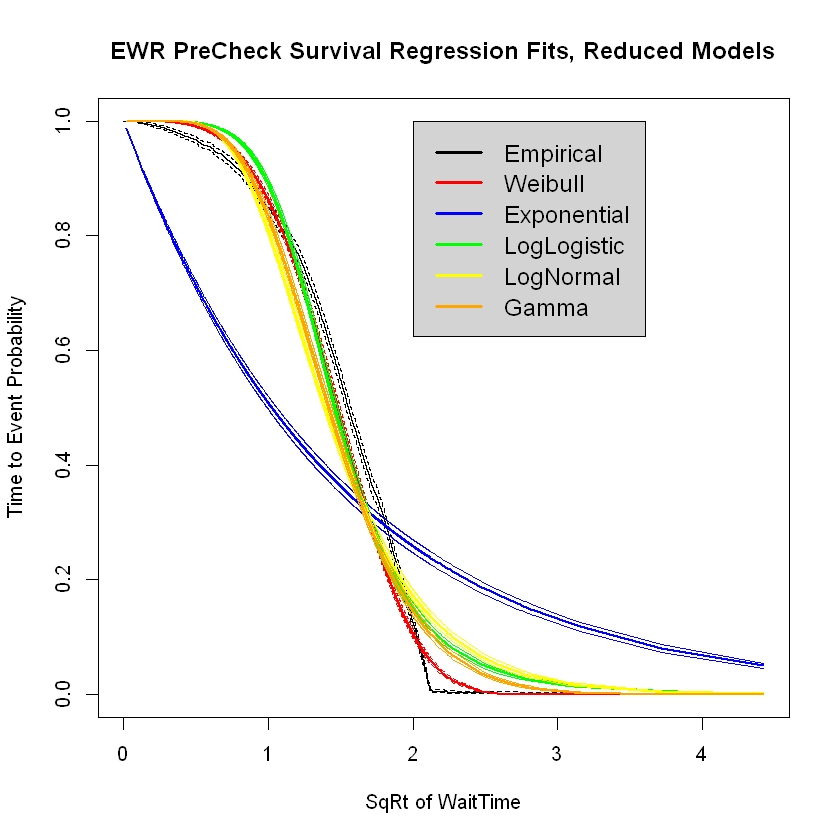

Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"


EWR Regular REDUCED MODEL



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "weibull")
                    Value Std. Error      z       p
(Intercept)       0.71273    0.02637  27.03 < 2e-16
XVarsLiteHourInt  0.02603    0.00162  16.08 < 2e-16
XVarsLiteAMRush   0.44705    0.02228  20.06 < 2e-16
XVarsLitePMRush   0.16194    0.02111   7.67 1.7e-14
XVarsLiteJan     -0.04137    0.02602  -1.59  0.1119
XVarsLiteFeb     -0.06675    0.02708  -2.46  0.0137
XVarsLiteMar     -0.06081    0.02619  -2.32  0.0202
XVarsLiteApr     -0.02691    0.02627  -1.02  0.3055
XVarsLiteMay     -0.01634    0.02534  -0.64  0.5190
XVarsLiteJun      0.07039    0.02609   2.70  0.0070
XVarsLiteJul      0.10794    0.02578   4.19 2.8e-05
XVarsLiteAug      0.12988    0.02577   5.04 4.6e-07
XVarsLiteSep      0.11875    0.02903   4.09 4.3e-05
XVarsLiteMon      0.02634    0.01985   1.33  0.1846
XVarsLiteFri      0.04419    0.02000   2.21  0.0271
XVarsLiteSat      0.00809    0.02036   0.40  0.6910
XVarsLiteSun      0


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "exponential")
                    Value Std. Error     z      p
(Intercept)       0.42770    0.05046  8.48 <2e-16
XVarsLiteHourInt  0.03502    0.00287 12.21 <2e-16
XVarsLiteAMRush   0.64173    0.04593 13.97 <2e-16
XVarsLitePMRush   0.26564    0.04479  5.93  3e-09
XVarsLiteJan     -0.06575    0.05606 -1.17 0.2408
XVarsLiteFeb     -0.09485    0.05833 -1.63 0.1040
XVarsLiteMar     -0.05798    0.05642 -1.03 0.3041
XVarsLiteApr     -0.00161    0.05658 -0.03 0.9774
XVarsLiteMay      0.02193    0.05462  0.40 0.6881
XVarsLiteJun      0.12564    0.05621  2.24 0.0254
XVarsLiteJul      0.17008    0.05547  3.07 0.0022
XVarsLiteAug      0.17886    0.05548  3.22 0.0013
XVarsLiteSep      0.16751    0.06251  2.68 0.0074
XVarsLiteMon      0.02970    0.04277  0.69 0.4875
XVarsLiteFri      0.05959    0.04308  1.38 0.1666
XVarsLiteSat      0.01996    0.04383  0.46 0.6488
XVarsLiteSun      0.05753    0.04322  1.33 0.1831


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "loglogistic")
                    Value Std. Error      z       p
(Intercept)       0.14414    0.03208   4.49 7.0e-06
XVarsLiteHourInt  0.04656    0.00162  28.66 < 2e-16
XVarsLiteAMRush   0.82756    0.02615  31.65 < 2e-16
XVarsLitePMRush   0.33453    0.02508  13.34 < 2e-16
XVarsLiteJan     -0.09648    0.03788  -2.55  0.0109
XVarsLiteFeb     -0.12884    0.03942  -3.27  0.0011
XVarsLiteMar     -0.05097    0.03644  -1.40  0.1620
XVarsLiteApr      0.01905    0.03588   0.53  0.5955
XVarsLiteMay      0.05143    0.03437   1.50  0.1346
XVarsLiteJun      0.16623    0.03515   4.73 2.3e-06
XVarsLiteJul      0.20797    0.03453   6.02 1.7e-09
XVarsLiteAug      0.20903    0.03482   6.00 1.9e-09
XVarsLiteSep      0.19348    0.03912   4.95 7.6e-07
XVarsLiteMon      0.03714    0.02713   1.37  0.1710
XVarsLiteFri      0.08351    0.02716   3.08  0.0021
XVarsLiteSat      0.02578    0.02773   0.93  0.3527
XVarsLiteSun   


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "lognormal")
                    Value Std. Error      z       p
(Intercept)       0.13139    0.03191   4.12 3.8e-05
XVarsLiteHourInt  0.03403    0.00157  21.63 < 2e-16
XVarsLiteAMRush   0.87584    0.03171  27.62 < 2e-16
XVarsLitePMRush   0.50652    0.03147  16.10 < 2e-16
XVarsLiteJan     -0.10244    0.03990  -2.57  0.0102
XVarsLiteFeb     -0.13368    0.04154  -3.22  0.0013
XVarsLiteMar     -0.02353    0.04017  -0.59  0.5579
XVarsLiteApr      0.07347    0.04026   1.82  0.0680
XVarsLiteMay      0.11925    0.03887   3.07  0.0022
XVarsLiteJun      0.24499    0.03999   6.13 9.0e-10
XVarsLiteJul      0.30763    0.03942   7.80 6.0e-15
XVarsLiteAug      0.30231    0.03945   7.66 1.8e-14
XVarsLiteSep      0.28907    0.04448   6.50 8.1e-11
XVarsLiteMon      0.01885    0.03045   0.62  0.5360
XVarsLiteFri      0.07877    0.03066   2.57  0.0102
XVarsLiteSat      0.04281    0.03118   1.37  0.1697
XVarsLiteSun     

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "weibull")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
shape                   NA    2.15483   2.10340   2.20750   0.02655        NA
scale                   NA    2.03955   1.93684   2.14771   0.05377        NA
XVarsLiteHourInt  11.69101    0.02603   0.02286   0.02920   0.00162   1.02637
XVarsLiteAMRush    0.12827    0.44705   0.40338   0.49071   0.02228   1.56369
XVarsLitePMRush    0.12312    0.16194   0.12056   0.20332   0.02111   1.17580
XVarsLiteJan       0.09066   -0.04137  -0.09237   0.00963   0.02602   0.95948
XVarsLiteFeb       0.08096   -0.06675  -0.11982  -0.01367   0.02708   0.93543
XVarsLiteMar       0.08888   -0.06081  -0.11213  -0.00948   0.02619   0.94100
XVarsLiteApr       0.08848   -0.02691  -0.07839   0.02457   0.02627   0.97345
XVarsLiteMay       0.09798   -0.01634  -0.06600   0.03332   0.02534   0.98379
XVarsLiteJun       0.09026   

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "exponential")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
rate                    NA    0.65201   0.59061   0.71978   0.03290        NA
XVarsLiteHourInt  11.69101   -0.03502  -0.04064  -0.02940   0.00287   0.96558
XVarsLiteAMRush    0.12827   -0.64173  -0.73174  -0.55171   0.04593   0.52638
XVarsLitePMRush    0.12312   -0.26564  -0.35342  -0.17786   0.04479   0.76672
XVarsLiteJan       0.09066    0.06575  -0.04412   0.17562   0.05606   1.06796
XVarsLiteFeb       0.08096    0.09485  -0.01948   0.20918   0.05833   1.09949
XVarsLiteMar       0.08888    0.05798  -0.05261   0.16857   0.05642   1.05970
XVarsLiteApr       0.08848    0.00161  -0.10929   0.11250   0.05658   1.00161
XVarsLiteMay       0.09798   -0.02193  -0.12897   0.08512   0.05462   0.97831
XVarsLiteJun       0.09026   -0.12564  -0.23581  -0.01547   0.05621   0.88193
XVarsLiteJul       0.0938

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "llogis")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
shape                   NA    2.68190   2.61913   2.74619   0.03241        NA
scale                   NA    1.15505   1.08465   1.23001   0.03706        NA
XVarsLiteHourInt  11.69101    0.04656   0.04337   0.04974   0.00162   1.04766
XVarsLiteAMRush    0.12827    0.82756   0.77631   0.87881   0.02615   2.28773
XVarsLitePMRush    0.12312    0.33451   0.28536   0.38367   0.02508   1.39726
XVarsLiteJan       0.09066   -0.09649  -0.17072  -0.02225   0.03788   0.90802
XVarsLiteFeb       0.08096   -0.12884  -0.20610  -0.05158   0.03942   0.87911
XVarsLiteMar       0.08888   -0.05096  -0.12239   0.02047   0.03644   0.95031
XVarsLiteApr       0.08848    0.01904  -0.05128   0.08937   0.03588   1.01922
XVarsLiteMay       0.09798    0.05144  -0.01593   0.11881   0.03437   1.05278
XVarsLiteJun       0.09026    

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "lnorm")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
meanlog                 NA    0.13139   0.06884   0.19393   0.03191        NA
sdlog                   NA    0.71176   0.69802   0.72577   0.00708        NA
XVarsLiteHourInt  11.69101    0.03403   0.03095   0.03711   0.00157   1.03461
XVarsLiteAMRush    0.12827    0.87584   0.81369   0.93799   0.03171   2.40089
XVarsLitePMRush    0.12312    0.50652   0.44485   0.56819   0.03147   1.65950
XVarsLiteJan       0.09066   -0.10244  -0.18065  -0.02424   0.03990   0.90263
XVarsLiteFeb       0.08096   -0.13368  -0.21509  -0.05228   0.04154   0.87487
XVarsLiteMar       0.08888   -0.02353  -0.10226   0.05519   0.04017   0.97674
XVarsLiteApr       0.08848    0.07347  -0.00544   0.15239   0.04026   1.07624
XVarsLiteMay       0.09798    0.11925   0.04307   0.19543   0.03887   1.12665
XVarsLiteJun       0.09026    0

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "gamma")

Estimates: 
                  data mean  est        L95%       U95%       se       
shape                    NA   2.79e+00   2.69e+00   2.89e+00   5.25e-02
rate                     NA   1.82e+00   1.70e+00   1.95e+00   6.47e-02
XVarsLiteHourInt   1.17e+01  -3.50e-02  -3.84e-02  -3.17e-02   1.72e-03
XVarsLiteAMRush    1.28e-01  -6.42e-01  -6.96e-01  -5.88e-01   2.75e-02
XVarsLitePMRush    1.23e-01  -2.66e-01  -3.18e-01  -2.13e-01   2.68e-02
XVarsLiteJan       9.07e-02   6.57e-02  -6.65e-05   1.32e-01   3.36e-02
XVarsLiteFeb       8.10e-02   9.48e-02   2.63e-02   1.63e-01   3.49e-02
XVarsLiteMar       8.89e-02   5.80e-02  -8.26e-03   1.24e-01   3.38e-02
XVarsLiteApr       8.85e-02   1.60e-03  -6.48e-02   6.80e-02   3.39e-02
XVarsLiteMay       9.80e-02  -2.19e-02  -8.60e-02   4.22e-02   3.27e-02
XVarsLiteJun       9.03e-02  -1.26e-01  -1.92e-01  -5.96e-02   3.37e-02
XVarsLiteJul       9.38e-


EWR Regular Reduced Model RMSE of Training Data Weibull Survival
[1] 1.286535


Warning message:
"'newdata' had 2165 rows but variables found have 5052 rows"


EWR Regular Reduced Model RMSE of Test Data Weibull Survival


Warning message in EWRRegTestSample$WaitTimeContinuousSqRt - SurvWeibullPredictedTest3:
"longer object length is not a multiple of shorter object length"

[1] 1.571905


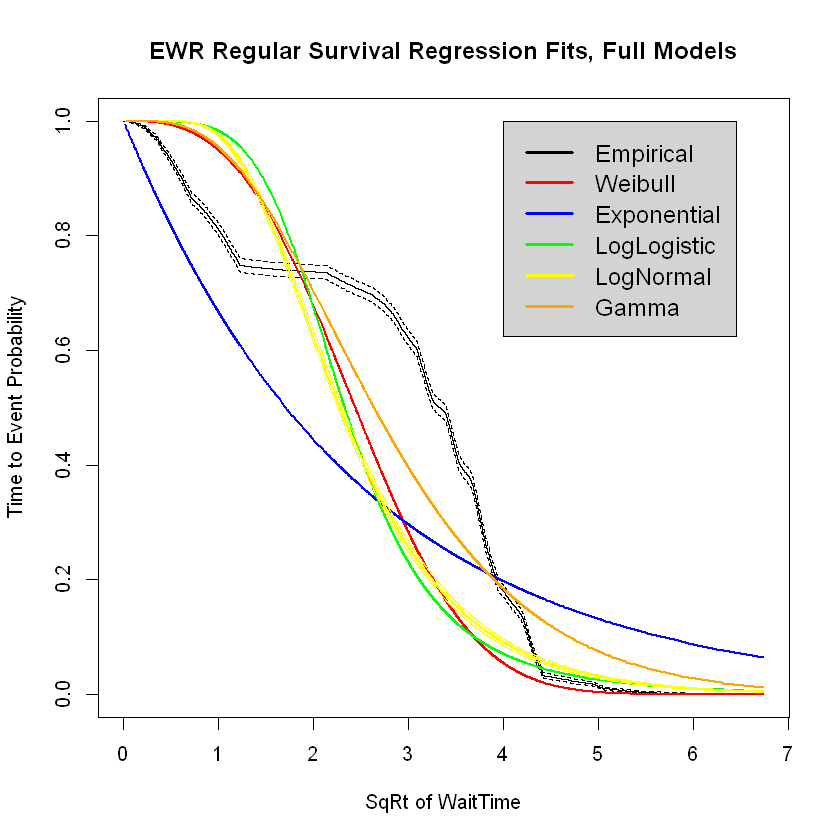


ORD PRECHECK FULL MODEL


               HourInt HourIntSquared HourIntCubed AMRush PMRush   Jan   Feb
HourIntSquared    0.98                                                      
HourIntCubed      0.95           0.99                                       
AMRush           -0.53          -0.49        -0.43                          
PMRush            0.39           0.36         0.30  -0.21                   
Jan               0.01           0.00         0.00   0.00   0.01            
Feb               0.00           0.00         0.00   0.00  -0.01 -0.09      
Mar               0.00           0.00         0.01   0.01  -0.01 -0.10 -0.09
Apr               0.00           0.00         0.00   0.00   0.00 -0.10 -0.09
May               0.01           0.01         0.01   0.00   0.00 -0.10 -0.10
Jun              -0.01          -0.01        -0.01   0.01   0.00 -0.10 -0.09
Jul               0.00          -0.01        -0.01   0.00   0.00 -0.10 -0.10
Aug               0.00           0.00         0.00  -0.01   0.01 -0.10 -0.09

Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "


ORD PRECHECK FULL MODEL



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "weibull")
                        Value Std. Error       z       p
(Intercept)          5.70e-01   6.03e-02    9.45 < 2e-16
XVarsHourInt        -1.24e-01   1.95e-02   -6.36 2.0e-10
XVarsHourIntSquared  1.75e-02   1.87e-03    9.32 < 2e-16
XVarsHourIntCubed   -6.41e-04   5.38e-05  -11.93 < 2e-16
XVarsAMRush          2.45e-01   1.33e-02   18.45 < 2e-16
XVarsPMRush          6.97e-02   1.36e-02    5.14 2.7e-07
XVarsJan            -5.82e-02   1.56e-02   -3.73 0.00019
XVarsFeb            -4.46e-02   1.62e-02   -2.75 0.00600
XVarsMar             2.65e-02   1.55e-02    1.71 0.08800
XVarsApr             2.39e-02   1.58e-02    1.51 0.13099
XVarsMay             8.95e-02   1.52e-02    5.91 3.5e-09
XVarsJun             1.63e-01   1.55e-02   10.49 < 2e-16
XVarsJul             6.51e-02   1.52e-02    4.27 2.0e-05
XVarsAug             8.59e-02   1.56e-02    5.52 3.5e-08
XVarsSep             1.38e-01   1.69e-02    8.14 3.9


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "exponential")
                        Value Std. Error     z       p
(Intercept)          0.409914   0.242614  1.69 0.09111
XVarsHourInt        -0.140263   0.079275 -1.77 0.07684
XVarsHourIntSquared  0.022039   0.007669  2.87 0.00406
XVarsHourIntCubed   -0.000846   0.000220 -3.85 0.00012
XVarsAMRush          0.320148   0.056809  5.64 1.7e-08
XVarsPMRush          0.092277   0.057776  1.60 0.11023
XVarsJan            -0.079643   0.065862 -1.21 0.22657
XVarsFeb            -0.027334   0.068624 -0.40 0.69039
XVarsMar             0.053200   0.065481  0.81 0.41653
XVarsApr             0.055515   0.066899  0.83 0.40663
XVarsMay             0.110601   0.064057  1.73 0.08424
XVarsJun             0.193879   0.065539  2.96 0.00309
XVarsJul             0.089045   0.064416  1.38 0.16686
XVarsAug             0.117196   0.065746  1.78 0.07466
XVarsSep             0.149115   0.071331  2.09 0.03658
XVarsMon             0.


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "loglogistic")
                        Value Std. Error       z       p
(Intercept)          4.94e-01   6.92e-02    7.15 8.8e-13
XVarsHourInt        -1.69e-01   2.20e-02   -7.67 1.8e-14
XVarsHourIntSquared  2.47e-02   2.11e-03   11.73 < 2e-16
XVarsHourIntCubed   -9.25e-04   6.02e-05  -15.37 < 2e-16
XVarsAMRush          3.21e-01   1.50e-02   21.37 < 2e-16
XVarsPMRush          9.87e-02   1.51e-02    6.52 7.0e-11
XVarsJan            -8.48e-02   1.84e-02   -4.61 4.1e-06
XVarsFeb            -2.34e-02   1.84e-02   -1.28 0.20221
XVarsMar             4.80e-02   1.74e-02    2.76 0.00578
XVarsApr             5.88e-02   1.75e-02    3.37 0.00075
XVarsMay             1.17e-01   1.68e-02    6.96 3.4e-12
XVarsJun             1.82e-01   1.68e-02   10.83 < 2e-16
XVarsJul             8.74e-02   1.70e-02    5.15 2.6e-07
XVarsAug             1.18e-01   1.71e-02    6.91 4.9e-12
XVarsSep             1.49e-01   1.83e-02    8.13


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "lognormal")
                        Value Std. Error      z       p
(Intercept)          0.213991   0.077885   2.75 0.00600
XVarsHourInt        -0.118295   0.025770  -4.59 4.4e-06
XVarsHourIntSquared  0.022047   0.002508   8.79 < 2e-16
XVarsHourIntCubed   -0.000896   0.000072 -12.45 < 2e-16
XVarsAMRush          0.373079   0.019215  19.42 < 2e-16
XVarsPMRush          0.111366   0.019477   5.72 1.1e-08
XVarsJan            -0.093381   0.022050  -4.24 2.3e-05
XVarsFeb            -0.018272   0.022981  -0.80 0.42656
XVarsMar             0.078374   0.021916   3.58 0.00035
XVarsApr             0.071988   0.022393   3.21 0.00131
XVarsMay             0.117998   0.021445   5.50 3.7e-08
XVarsJun             0.218797   0.021939   9.97 < 2e-16
XVarsJul             0.094687   0.021560   4.39 1.1e-05
XVarsAug             0.139004   0.022005   6.32 2.7e-10
XVarsSep             0.172665   0.023882   7.23 4.8e-13
XVarsMon 

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "weibull")

Estimates: 
                     data mean  est        L95%       U95%       se       
shape                       NA   4.24e+00         NA         NA         NA
scale                       NA   1.77e+00         NA         NA         NA
XVarsHourInt          1.18e+01  -1.24e-01         NA         NA         NA
XVarsHourIntSquared   1.64e+02   1.75e-02         NA         NA         NA
XVarsHourIntCubed     2.52e+03  -6.41e-04         NA         NA         NA
XVarsAMRush           1.71e-01   2.45e-01         NA         NA         NA
XVarsPMRush           1.75e-01   6.97e-02         NA         NA         NA
XVarsJan              8.91e-02  -5.82e-02         NA         NA         NA
XVarsFeb              7.93e-02  -4.46e-02         NA         NA         NA
XVarsMar              9.07e-02   2.65e-02         NA         NA         NA
XVarsApr              8.55e-02   2.39e-02         NA         NA   

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "exponential")

Estimates: 
                     data mean  est        L95%       U95%       se       
rate                        NA   6.64e-01         NA         NA         NA
XVarsHourInt          1.18e+01   1.40e-01         NA         NA         NA
XVarsHourIntSquared   1.64e+02  -2.20e-02         NA         NA         NA
XVarsHourIntCubed     2.52e+03   8.46e-04         NA         NA         NA
XVarsAMRush           1.71e-01  -3.20e-01         NA         NA         NA
XVarsPMRush           1.75e-01  -9.23e-02         NA         NA         NA
XVarsJan              8.91e-02   7.96e-02         NA         NA         NA
XVarsFeb              7.93e-02   2.73e-02         NA         NA         NA
XVarsMar              9.07e-02  -5.32e-02         NA         NA         NA
XVarsApr              8.55e-02  -5.55e-02         NA         NA         NA
XVarsMay              9.64e-02  -1.11e-01         NA         N

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "llogis")

Estimates: 
                     data mean  est        L95%       U95%       se       
shape                       NA   6.44e+00         NA         NA         NA
scale                       NA   1.64e+00         NA         NA         NA
XVarsHourInt          1.18e+01  -1.69e-01         NA         NA         NA
XVarsHourIntSquared   1.64e+02   2.47e-02         NA         NA         NA
XVarsHourIntCubed     2.52e+03  -9.25e-04         NA         NA         NA
XVarsAMRush           1.71e-01   3.21e-01         NA         NA         NA
XVarsPMRush           1.75e-01   9.87e-02         NA         NA         NA
XVarsJan              8.91e-02  -8.48e-02         NA         NA         NA
XVarsFeb              7.93e-02  -2.34e-02         NA         NA         NA
XVarsMar              9.07e-02   4.80e-02         NA         NA         NA
XVarsApr              8.55e-02   5.88e-02         NA         NA    

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "lnorm")

Estimates: 
                     data mean  est        L95%       U95%       se       
meanlog                     NA   2.14e-01   6.13e-02   3.67e-01   7.79e-02
sdlog                       NA   3.35e-01   3.27e-01   3.43e-01   3.90e-03
XVarsHourInt          1.18e+01  -1.18e-01  -1.69e-01  -6.78e-02   2.58e-02
XVarsHourIntSquared   1.64e+02   2.20e-02   1.71e-02   2.70e-02   2.51e-03
XVarsHourIntCubed     2.52e+03  -8.96e-04  -1.04e-03  -7.55e-04   7.20e-05
XVarsAMRush           1.71e-01   3.73e-01   3.35e-01   4.11e-01   1.92e-02
XVarsPMRush           1.75e-01   1.11e-01   7.32e-02   1.50e-01   1.95e-02
XVarsJan              8.91e-02  -9.34e-02  -1.37e-01  -5.02e-02   2.20e-02
XVarsFeb              7.93e-02  -1.83e-02  -6.33e-02   2.68e-02   2.30e-02
XVarsMar              9.07e-02   7.84e-02   3.54e-02   1.21e-01   2.19e-02
XVarsApr              8.55e-02   7.20e-02   2.81e-02   1.16e-01   2.


ORD PreCheck Full Model RMSE of Training Data Weibull Survival
[1] 0.3615262


Warning message:
"'newdata' had 1579 rows but variables found have 3683 rows"


ORD PreCheck Full Model RMSE of Test Data Weibull Survival


Warning message in ORDPreTestSample$WaitTimeContinuousSqRt - SurvWeibullPredictedTest:
"longer object length is not a multiple of shorter object length"

[1] 0.5454823


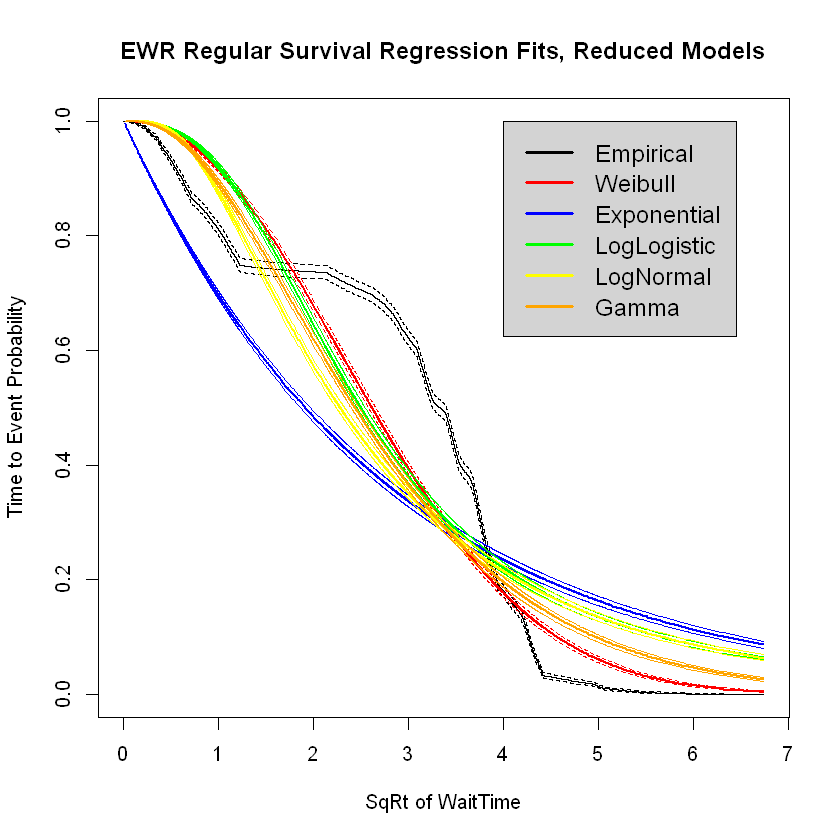

Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"Warning me


ORD PRECHECK REDUCED MODEL



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "weibull")
                    Value Std. Error       z       p
(Intercept)       0.54341    0.01974   27.53 < 2e-16
XVarsLiteHourInt -0.01326    0.00136   -9.73 < 2e-16
XVarsLiteAMRush   0.10433    0.01392    7.50 6.6e-14
XVarsLitePMRush   0.16136    0.01230   13.12 < 2e-16
XVarsLiteJan     -0.05814    0.01649   -3.53 0.00042
XVarsLiteFeb     -0.03486    0.01716   -2.03 0.04220
XVarsLiteMar      0.02805    0.01642    1.71 0.08749
XVarsLiteApr      0.02609    0.01675    1.56 0.11930
XVarsLiteMay      0.09699    0.01602    6.06 1.4e-09
XVarsLiteJun      0.14883    0.01640    9.07 < 2e-16
XVarsLiteJul      0.06759    0.01613    4.19 2.8e-05
XVarsLiteAug      0.09505    0.01646    5.77 7.7e-09
XVarsLiteSep      0.16107    0.01786    9.02 < 2e-16
XVarsLiteMon      0.00621    0.01268    0.49 0.62418
XVarsLiteFri      0.02397    0.01251    1.92 0.05534
XVarsLiteSat     -0.14121    0.01276  -11.07 < 2e-16
XV


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "exponential")
                    Value Std. Error     z       p
(Intercept)       0.53304    0.07082  7.53 5.2e-14
XVarsLiteHourInt -0.02278    0.00459 -4.96 7.0e-07
XVarsLiteAMRush   0.11397    0.05300  2.15  0.0315
XVarsLitePMRush   0.25947    0.04765  5.45 5.2e-08
XVarsLiteJan     -0.07833    0.06586 -1.19  0.2343
XVarsLiteFeb     -0.02569    0.06860 -0.37  0.7081
XVarsLiteMar      0.04486    0.06548  0.69  0.4933
XVarsLiteApr      0.04880    0.06691  0.73  0.4658
XVarsLiteMay      0.11322    0.06405  1.77  0.0771
XVarsLiteJun      0.18481    0.06553  2.82  0.0048
XVarsLiteJul      0.09185    0.06441  1.43  0.1539
XVarsLiteAug      0.11888    0.06574  1.81  0.0705
XVarsLiteSep      0.14966    0.07133  2.10  0.0359
XVarsLiteMon      0.01550    0.05060  0.31  0.7593
XVarsLiteFri      0.01618    0.04996  0.32  0.7461
XVarsLiteSat     -0.15910    0.05049 -3.15  0.0016
XVarsLiteSun     -0.00899    0.0


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "loglogistic")
                    Value Std. Error       z       p
(Intercept)       0.51817    0.02167   23.91 < 2e-16
XVarsLiteHourInt -0.02220    0.00146  -15.22 < 2e-16
XVarsLiteAMRush   0.11357    0.01533    7.41 1.3e-13
XVarsLitePMRush   0.25534    0.01446   17.66 < 2e-16
XVarsLiteJan     -0.08638    0.02099   -4.11 3.9e-05
XVarsLiteFeb     -0.02582    0.02096   -1.23  0.2180
XVarsLiteMar      0.04126    0.01985    2.08  0.0376
XVarsLiteApr      0.05296    0.02018    2.62  0.0087
XVarsLiteMay      0.11723    0.01952    6.01 1.9e-09
XVarsLiteJun      0.18586    0.01952    9.52 < 2e-16
XVarsLiteJul      0.09808    0.01951    5.03 5.0e-07
XVarsLiteAug      0.12536    0.01994    6.29 3.3e-10
XVarsLiteSep      0.14968    0.02161    6.93 4.3e-12
XVarsLiteMon      0.02547    0.01510    1.69  0.0917
XVarsLiteFri      0.01472    0.01514    0.97  0.3311
XVarsLiteSat     -0.16124    0.01557  -10.35 < 2e-1


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "lognormal")
                    Value Std. Error      z       p
(Intercept)       0.51721    0.02614  19.78 < 2e-16
XVarsLiteHourInt -0.02809    0.00163 -17.25 < 2e-16
XVarsLiteAMRush   0.13919    0.02029   6.86 6.8e-12
XVarsLitePMRush   0.33217    0.01847  17.98 < 2e-16
XVarsLiteJan     -0.08916    0.02586  -3.45 0.00056
XVarsLiteFeb     -0.01164    0.02695  -0.43 0.66574
XVarsLiteMar      0.06976    0.02570   2.71 0.00665
XVarsLiteApr      0.06456    0.02626   2.46 0.01396
XVarsLiteMay      0.11582    0.02515   4.60 4.1e-06
XVarsLiteJun      0.20926    0.02573   8.13 4.2e-16
XVarsLiteJul      0.09847    0.02529   3.89 9.9e-05
XVarsLiteAug      0.13675    0.02581   5.30 1.2e-07
XVarsLiteSep      0.16301    0.02801   5.82 5.9e-09
XVarsLiteMon      0.00340    0.01986   0.17 0.86414
XVarsLiteFri      0.00807    0.01961   0.41 0.68080
XVarsLiteSat     -0.17009    0.01980  -8.59 < 2e-16
XVarsLiteSun     

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "weibull")

Estimates: 
                  data mean  est        L95%       U95%       se       
shape                    NA   4.001550   3.900993   4.104698   0.051961
scale                    NA   1.721877   1.656560   1.789768   0.033974
XVarsLiteHourInt  11.805593  -0.013262  -0.015933  -0.010592   0.001363
XVarsLiteAMRush    0.171328   0.104332   0.077051   0.131612   0.013919
XVarsLitePMRush    0.175129   0.161363   0.137255   0.185471   0.012300
XVarsLiteJan       0.089058  -0.058136  -0.090458  -0.025814   0.016491
XVarsLiteFeb       0.079283  -0.034865  -0.068500  -0.001229   0.017161
XVarsLiteMar       0.090687   0.028052  -0.004124   0.060228   0.016417
XVarsLiteApr       0.085528   0.026095  -0.006738   0.058928   0.016752
XVarsLiteMay       0.096389   0.096995   0.065604   0.128385   0.016016
XVarsLiteJun       0.090415   0.148833   0.116682   0.180984   0.016404
XVarsLiteJul       0.09

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "exponential")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
rate                    NA    0.58682   0.51076   0.67420   0.04156        NA
XVarsLiteHourInt  11.80559    0.02278   0.01378   0.03178   0.00459   1.02305
XVarsLiteAMRush    0.17133   -0.11397  -0.21786  -0.01009   0.05300   0.89228
XVarsLitePMRush    0.17513   -0.25947  -0.35286  -0.16607   0.04765   0.77146
XVarsLiteJan       0.08906    0.07833  -0.05075   0.20741   0.06586   1.08148
XVarsLiteFeb       0.07928    0.02569  -0.10877   0.16015   0.06860   1.02602
XVarsLiteMar       0.09069   -0.04486  -0.17321   0.08348   0.06548   0.95613
XVarsLiteApr       0.08553   -0.04880  -0.17994   0.08234   0.06691   0.95237
XVarsLiteMay       0.09639   -0.11322  -0.23875   0.01232   0.06405   0.89296
XVarsLiteJun       0.09042   -0.18481  -0.31324  -0.05638   0.06553   0.83126
XVarsLiteJul       0.0950

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "llogis")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
shape                   NA    5.54383   5.39227   5.69965   0.07841        NA
scale                   NA    1.67897   1.60915   1.75183   0.03639        NA
XVarsLiteHourInt  11.80559   -0.02220  -0.02506  -0.01934   0.00146   0.97805
XVarsLiteAMRush    0.17133    0.11357   0.08352   0.14363   0.01533   1.12027
XVarsLitePMRush    0.17513    0.25534   0.22701   0.28367   0.01445   1.29090
XVarsLiteJan       0.08906   -0.08638  -0.12753  -0.04523   0.02099   0.91725
XVarsLiteFeb       0.07928   -0.02582  -0.06690   0.01525   0.02096   0.97451
XVarsLiteMar       0.09069    0.04126   0.00236   0.08016   0.01985   1.04212
XVarsLiteApr       0.08553    0.05295   0.01339   0.09251   0.02018   1.05438
XVarsLiteMay       0.09639    0.11723   0.07897   0.15548   0.01952   1.12437
XVarsLiteJun       0.09042    

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "lnorm")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
meanlog                 NA    0.51721   0.46596   0.56845   0.02614        NA
sdlog                   NA    0.39273   0.38386   0.40180   0.00458        NA
XVarsLiteHourInt  11.80559   -0.02809  -0.03128  -0.02490   0.00163   0.97230
XVarsLiteAMRush    0.17133    0.13919   0.09943   0.17895   0.02029   1.14934
XVarsLitePMRush    0.17513    0.33217   0.29596   0.36838   0.01847   1.39400
XVarsLiteJan       0.08906   -0.08916  -0.13985  -0.03848   0.02586   0.91469
XVarsLiteFeb       0.07928   -0.01164  -0.06446   0.04117   0.02695   0.98843
XVarsLiteMar       0.09069    0.06976   0.01938   0.12014   0.02570   1.07225
XVarsLiteApr       0.08553    0.06456   0.01309   0.11604   0.02626   1.06669
XVarsLiteMay       0.09639    0.11582   0.06652   0.16512   0.02515   1.12280
XVarsLiteJun       0.09042    0

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "gamma")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
shape                   NA    8.78586   8.40066   9.18871   0.20097        NA
rate                    NA    5.15767   4.83391   5.50312   0.17060        NA
XVarsLiteHourInt  11.80559    0.02275   0.01972   0.02579   0.00155   1.02302
XVarsLiteAMRush    0.17133   -0.11417  -0.14921  -0.07912   0.01788   0.89211
XVarsLitePMRush    0.17513   -0.25935  -0.29086  -0.22784   0.01608   0.77156
XVarsLiteJan       0.08906    0.07833   0.03478   0.12188   0.02222   1.08148
XVarsLiteFeb       0.07928    0.02568  -0.01968   0.07104   0.02314   1.02601
XVarsLiteMar       0.09069   -0.04486  -0.08816  -0.00156   0.02209   0.95613
XVarsLiteApr       0.08553   -0.04880  -0.09304  -0.00456   0.02257   0.95237
XVarsLiteMay       0.09639   -0.11322  -0.15557  -0.07087   0.02161   0.89296
XVarsLiteJun       0.09042   -0


ORD PreCheck Reduced Model RMSE of Training Data Weibull Survival
[1] 0.4157024


Warning message:
"'newdata' had 1579 rows but variables found have 3683 rows"


ORD PreCheck Reduced Model RMSE of Test Data Weibull Survival


Warning message in ORDPreTestSample$WaitTimeContinuousSqRt - SurvWeibullPredictedTest3:
"longer object length is not a multiple of shorter object length"

[1] 0.5177581


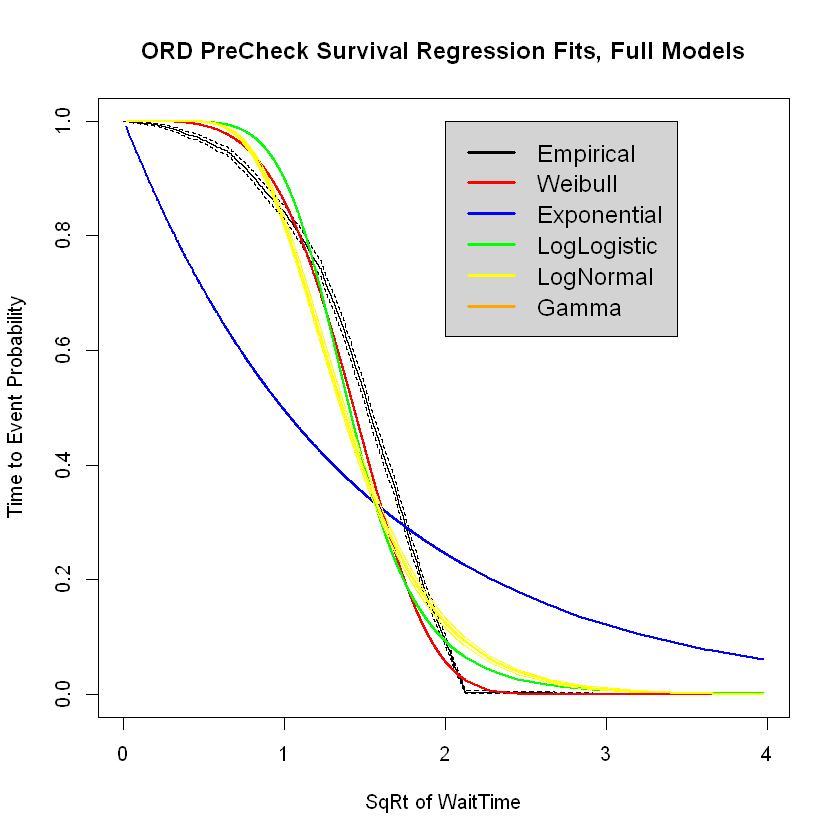


ORD Regular FULL MODEL


               HourInt HourIntSquared HourIntCubed AMRush PMRush   Jan   Feb
HourIntSquared    0.97                                                      
HourIntCubed      0.91           0.99                                       
AMRush           -0.30          -0.33        -0.31                          
PMRush            0.24           0.18         0.10  -0.14                   
Jan               0.00           0.00         0.00   0.00   0.01            
Feb               0.00           0.00         0.00   0.00   0.00 -0.10      
Mar               0.00           0.00         0.00   0.01   0.01 -0.10 -0.09
Apr               0.01           0.01         0.01   0.00   0.00 -0.10 -0.09
May               0.00           0.00         0.00  -0.01   0.00 -0.10 -0.09
Jun              -0.01          -0.01        -0.01   0.00   0.00 -0.10 -0.09
Jul               0.02           0.01         0.01  -0.01   0.01 -0.10 -0.09
Aug              -0.01           0.00         0.00  -0.01  -0.01 -0.10 -0.09

Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "Warning message in flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, :
"Optimisation has probably not converged to the maximum likelihood - Hessian is not positive definite. "


ORD Regular FULL MODEL



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "weibull")
                        Value Std. Error      z       p
(Intercept)         -3.72e-01   2.80e-02 -13.27 < 2e-16
XVarsHourInt         3.69e-01   1.01e-02  36.46 < 2e-16
XVarsHourIntSquared -2.21e-02   1.04e-03 -21.15 < 2e-16
XVarsHourIntCubed    3.40e-04   3.04e-05  11.19 < 2e-16
XVarsAMRush          1.81e-01   1.83e-02   9.88 < 2e-16
XVarsPMRush          9.05e-03   1.92e-02   0.47 0.63735
XVarsJan            -5.99e-02   2.05e-02  -2.92 0.00350
XVarsFeb            -4.36e-02   2.15e-02  -2.03 0.04233
XVarsMar            -1.97e-02   2.10e-02  -0.94 0.34600
XVarsApr            -7.01e-02   2.06e-02  -3.40 0.00067
XVarsMay            -2.30e-02   2.06e-02  -1.12 0.26389
XVarsJun             1.29e-01   2.06e-02   6.26 3.8e-10
XVarsJul             1.48e-01   2.07e-02   7.17 7.5e-13
XVarsAug             2.43e-01   2.06e-02  11.79 < 2e-16
XVarsSep             2.73e-01   2.28e-02  11.97 < 2e-16
XVarsMon   


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "exponential")
                        Value Std. Error      z       p
(Intercept)         -6.43e-01   6.15e-02 -10.47 < 2e-16
XVarsHourInt         3.55e-01   2.24e-02  15.84 < 2e-16
XVarsHourIntSquared -1.62e-02   2.39e-03  -6.77 1.3e-11
XVarsHourIntCubed    9.97e-05   6.96e-05   1.43  0.1520
XVarsAMRush          3.48e-01   4.92e-02   7.07 1.5e-12
XVarsPMRush         -4.29e-02   5.10e-02  -0.84  0.4001
XVarsJan            -5.04e-02   5.49e-02  -0.92  0.3588
XVarsFeb            -4.62e-02   5.77e-02  -0.80  0.4234
XVarsMar            -2.06e-03   5.62e-02  -0.04  0.9707
XVarsApr            -6.43e-02   5.53e-02  -1.16  0.2446
XVarsMay            -1.18e-02   5.53e-02  -0.21  0.8307
XVarsJun             1.20e-01   5.53e-02   2.18  0.0296
XVarsJul             1.55e-01   5.56e-02   2.79  0.0053
XVarsAug             2.41e-01   5.54e-02   4.35 1.4e-05
XVarsSep             2.71e-01   6.12e-02   4.42 9.7e-06
XVarsMo


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "loglogistic")
                        Value Std. Error       z       p
(Intercept)         -7.70e-01   2.44e-02  -31.57 < 2e-16
XVarsHourInt         2.99e-01   9.05e-03   33.03 < 2e-16
XVarsHourIntSquared -7.85e-03   1.01e-03   -7.79 6.7e-15
XVarsHourIntCubed   -1.61e-04   2.98e-05   -5.41 6.3e-08
XVarsAMRush          5.53e-01   2.01e-02   27.55 < 2e-16
XVarsPMRush         -8.64e-02   1.90e-02   -4.55 5.3e-06
XVarsJan            -6.92e-02   2.20e-02   -3.14  0.0017
XVarsFeb            -4.16e-02   2.30e-02   -1.81  0.0703
XVarsMar            -8.76e-03   2.24e-02   -0.39  0.6958
XVarsApr            -6.63e-02   2.18e-02   -3.04  0.0023
XVarsMay            -1.28e-02   2.19e-02   -0.59  0.5580
XVarsJun             9.03e-02   2.22e-02    4.06 4.8e-05
XVarsJul             1.47e-01   2.20e-02    6.67 2.6e-11
XVarsAug             2.35e-01   2.25e-02   10.49 < 2e-16
XVarsSep             2.65e-01   2.48e-02   10.68


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "lognormal")
                        Value Std. Error      z       p
(Intercept)         -8.68e-01   2.68e-02 -32.33 < 2e-16
XVarsHourInt         3.36e-01   1.01e-02  33.27 < 2e-16
XVarsHourIntSquared -1.07e-02   1.10e-03  -9.75 < 2e-16
XVarsHourIntCubed   -1.09e-04   3.17e-05  -3.44 0.00059
XVarsAMRush          5.06e-01   2.34e-02  21.58 < 2e-16
XVarsPMRush         -8.77e-02   2.38e-02  -3.69 0.00022
XVarsJan            -3.56e-02   2.56e-02  -1.39 0.16407
XVarsFeb            -4.43e-02   2.69e-02  -1.65 0.09925
XVarsMar             1.47e-02   2.62e-02   0.56 0.57425
XVarsApr            -5.83e-02   2.57e-02  -2.26 0.02366
XVarsMay             4.56e-03   2.57e-02   0.18 0.85942
XVarsJun             1.09e-01   2.57e-02   4.23 2.3e-05
XVarsJul             1.64e-01   2.59e-02   6.33 2.4e-10
XVarsAug             2.23e-01   2.58e-02   8.64 < 2e-16
XVarsSep             2.62e-01   2.85e-02   9.19 < 2e-16
XVarsMon 

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "weibull")

Estimates: 
                     data mean  est        L95%       U95%       se       
shape                       NA   2.69e+00         NA         NA         NA
scale                       NA   6.89e-01         NA         NA         NA
XVarsHourInt          1.14e+01   3.69e-01         NA         NA         NA
XVarsHourIntSquared   1.79e+02  -2.21e-02         NA         NA         NA
XVarsHourIntCubed     3.15e+03   3.40e-04         NA         NA         NA
XVarsAMRush           1.29e-01   1.81e-01         NA         NA         NA
XVarsPMRush           1.21e-01   9.05e-03         NA         NA         NA
XVarsJan              9.33e-02  -5.99e-02         NA         NA         NA
XVarsFeb              8.10e-02  -4.36e-02         NA         NA         NA
XVarsMar              8.72e-02  -1.97e-02         NA         NA         NA
XVarsApr              9.15e-02  -7.01e-02         NA         NA   

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "exponential")

Estimates: 
                     data mean  est        L95%       U95%       se       
rate                        NA   1.90e+00         NA         NA         NA
XVarsHourInt          1.14e+01  -3.55e-01         NA         NA         NA
XVarsHourIntSquared   1.79e+02   1.62e-02         NA         NA         NA
XVarsHourIntCubed     3.15e+03  -9.97e-05         NA         NA         NA
XVarsAMRush           1.29e-01  -3.48e-01         NA         NA         NA
XVarsPMRush           1.21e-01   4.29e-02         NA         NA         NA
XVarsJan              9.33e-02   5.04e-02         NA         NA         NA
XVarsFeb              8.10e-02   4.62e-02         NA         NA         NA
XVarsMar              8.72e-02   2.06e-03         NA         NA         NA
XVarsApr              9.15e-02   6.43e-02         NA         NA         NA
XVarsMay              9.15e-02   1.18e-02         NA         N

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "llogis")

Estimates: 
                     data mean  est        L95%       U95%       se       
shape                       NA   4.25e+00         NA         NA         NA
scale                       NA   4.63e-01         NA         NA         NA
XVarsHourInt          1.14e+01   2.99e-01         NA         NA         NA
XVarsHourIntSquared   1.79e+02  -7.85e-03         NA         NA         NA
XVarsHourIntCubed     3.15e+03  -1.61e-04         NA         NA         NA
XVarsAMRush           1.29e-01   5.53e-01         NA         NA         NA
XVarsPMRush           1.21e-01  -8.64e-02         NA         NA         NA
XVarsJan              9.33e-02  -6.92e-02         NA         NA         NA
XVarsFeb              8.10e-02  -4.16e-02         NA         NA         NA
XVarsMar              8.72e-02  -8.73e-03         NA         NA         NA
XVarsApr              9.15e-02  -6.62e-02         NA         NA    

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, 
    dist = "lnorm")

Estimates: 
                     data mean  est        L95%       U95%       se       
meanlog                     NA  -8.68e-01  -9.20e-01  -8.15e-01   2.68e-02
sdlog                       NA   4.66e-01   4.57e-01   4.75e-01   4.60e-03
XVarsHourInt          1.14e+01   3.36e-01   3.16e-01   3.56e-01   1.01e-02
XVarsHourIntSquared   1.79e+02  -1.07e-02  -1.28e-02  -8.55e-03   1.10e-03
XVarsHourIntCubed     3.15e+03  -1.09e-04  -1.71e-04  -4.69e-05   3.17e-05
XVarsAMRush           1.29e-01   5.06e-01   4.60e-01   5.52e-01   2.35e-02
XVarsPMRush           1.21e-01  -8.77e-02  -1.34e-01  -4.11e-02   2.38e-02
XVarsJan              9.33e-02  -3.56e-02  -8.57e-02   1.45e-02   2.56e-02
XVarsFeb              8.10e-02  -4.43e-02  -9.70e-02   8.37e-03   2.69e-02
XVarsMar              8.72e-02   1.47e-02  -3.66e-02   6.60e-02   2.62e-02
XVarsApr              9.15e-02  -5.83e-02  -1.09e-01  -7.79e-03   2.


ORD Regular Full Model RMSE of Training Data LogLogistic Survival
[1] 0.8914958


Warning message:
"'newdata' had 2197 rows but variables found have 5124 rows"


ORD Regular Full Model RMSE of Test Data LogLogistic Survival


Warning message in ORDRegTestSample$WaitTimeContinuousSqRt - SurvLogLogisticPredictedTest:
"longer object length is not a multiple of shorter object length"

[1] 1.852216


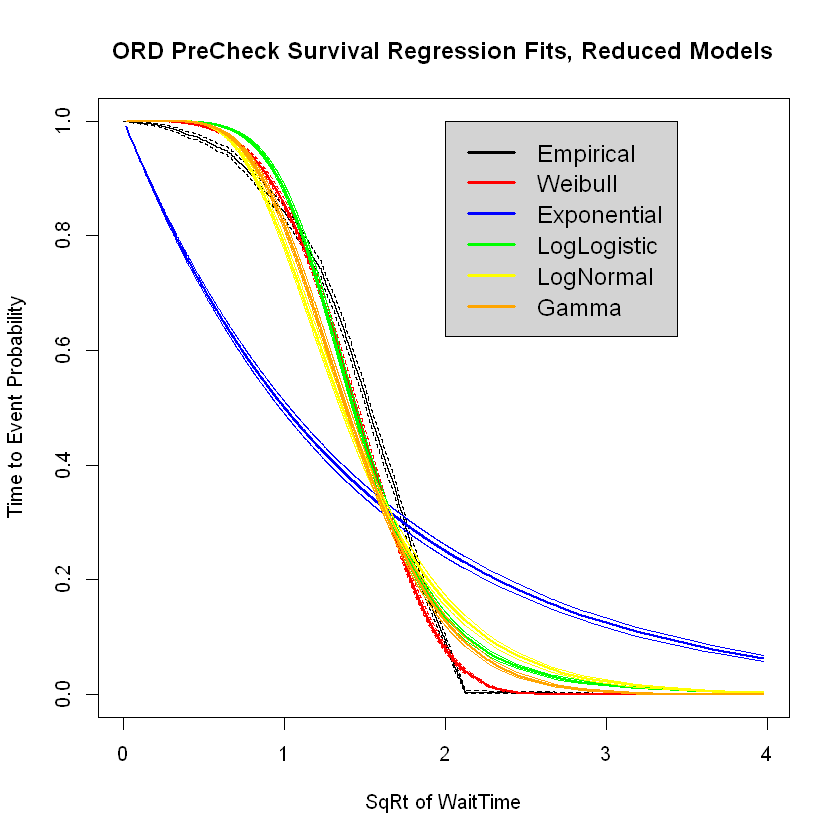

Warning message in (function (x, shape, rate = 1, scale = 1/rate, log = FALSE) :
"NaNs produced"Warning message in (function (q, shape, rate = 1, scale = 1/rate, lower.tail = TRUE, :
"NaNs produced"


ORD Regular REDUCED MODEL



Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "weibull")
                    Value Std. Error      z       p
(Intercept)       0.82500    0.02396  34.43 < 2e-16
XVarsLiteHourInt  0.01769    0.00144  12.27 < 2e-16
XVarsLiteAMRush   0.33458    0.02120  15.78 < 2e-16
XVarsLitePMRush   0.15914    0.02088   7.62 2.5e-14
XVarsLiteJan     -0.08535    0.02528  -3.38 0.00074
XVarsLiteFeb     -0.01253    0.02654  -0.47 0.63679
XVarsLiteMar     -0.01654    0.02587  -0.64 0.52243
XVarsLiteApr     -0.04914    0.02545  -1.93 0.05355
XVarsLiteMay     -0.02687    0.02542  -1.06 0.29034
XVarsLiteJun      0.10255    0.02543   4.03 5.5e-05
XVarsLiteJul      0.16606    0.02557   6.49 8.4e-11
XVarsLiteAug      0.25840    0.02548  10.14 < 2e-16
XVarsLiteSep      0.28644    0.02817  10.17 < 2e-16
XVarsLiteMon     -0.02503    0.01977  -1.27 0.20551
XVarsLiteFri      0.01577    0.01978   0.80 0.42524
XVarsLiteSat     -0.02178    0.01989  -1.09 0.27359
XVarsLiteSun      0


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "exponential")
                    Value Std. Error     z       p
(Intercept)       0.56222    0.04776 11.77 < 2e-16
XVarsLiteHourInt  0.02741    0.00274 10.00 < 2e-16
XVarsLiteAMRush   0.51937    0.04492 11.56 < 2e-16
XVarsLitePMRush   0.24139    0.04485  5.38 7.4e-08
XVarsLiteJan     -0.07343    0.05492 -1.34  0.1812
XVarsLiteFeb     -0.01417    0.05769 -0.25  0.8059
XVarsLiteMar     -0.00776    0.05623 -0.14  0.8903
XVarsLiteApr     -0.05121    0.05530 -0.93  0.3544
XVarsLiteMay     -0.02035    0.05524 -0.37  0.7126
XVarsLiteJun      0.11380    0.05527  2.06  0.0395
XVarsLiteJul      0.17790    0.05558  3.20  0.0014
XVarsLiteAug      0.25808    0.05535  4.66 3.1e-06
XVarsLiteSep      0.28285    0.06124  4.62 3.9e-06
XVarsLiteMon     -0.01812    0.04297 -0.42  0.6732
XVarsLiteFri      0.01326    0.04299  0.31  0.7578
XVarsLiteSat     -0.02357    0.04319 -0.55  0.5853
XVarsLiteSun      0.01251    0.0


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "loglogistic")
                    Value Std. Error      z       p
(Intercept)       0.37265    0.03315  11.24 < 2e-16
XVarsLiteHourInt  0.03478    0.00180  19.34 < 2e-16
XVarsLiteAMRush   0.65294    0.02769  23.58 < 2e-16
XVarsLitePMRush   0.29647    0.02617  11.33 < 2e-16
XVarsLiteJan     -0.07551    0.03594  -2.10  0.0357
XVarsLiteFeb     -0.02103    0.03817  -0.55  0.5816
XVarsLiteMar     -0.00345    0.03709  -0.09  0.9259
XVarsLiteApr     -0.06505    0.03698  -1.76  0.0785
XVarsLiteMay     -0.02600    0.03678  -0.71  0.4797
XVarsLiteJun      0.12231    0.03647   3.35  0.0008
XVarsLiteJul      0.18514    0.03660   5.06 4.2e-07
XVarsLiteAug      0.26496    0.03706   7.15 8.7e-13
XVarsLiteSep      0.28502    0.04073   7.00 2.6e-12
XVarsLiteMon     -0.01269    0.02824  -0.45  0.6531
XVarsLiteFri      0.00809    0.02864   0.28  0.7775
XVarsLiteSat     -0.02895    0.02866  -1.01  0.3125
XVarsLiteSun   


Call:
survreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "lognormal")
                    Value Std. Error      z       p
(Intercept)       0.18996    0.03229   5.88 4.0e-09
XVarsLiteHourInt  0.03665    0.00162  22.60 < 2e-16
XVarsLiteAMRush   0.82064    0.03286  24.97 < 2e-16
XVarsLitePMRush   0.44358    0.03312  13.39 < 2e-16
XVarsLiteJan     -0.02708    0.04108  -0.66  0.5097
XVarsLiteFeb     -0.00985    0.04319  -0.23  0.8196
XVarsLiteMar      0.00859    0.04208   0.20  0.8382
XVarsLiteApr     -0.05881    0.04138  -1.42  0.1552
XVarsLiteMay     -0.00163    0.04134  -0.04  0.9685
XVarsLiteJun      0.11470    0.04138   2.77  0.0056
XVarsLiteJul      0.19335    0.04159   4.65 3.3e-06
XVarsLiteAug      0.22015    0.04141   5.32 1.1e-07
XVarsLiteSep      0.26491    0.04586   5.78 7.6e-09
XVarsLiteMon     -0.01566    0.03215  -0.49  0.6263
XVarsLiteFri      0.00332    0.03219   0.10  0.9179
XVarsLiteSat     -0.02802    0.03231  -0.87  0.3858
XVarsLiteSun     

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "weibull")

Estimates: 
                  data mean  est        L95%       U95%       se       
shape                    NA   2.174082   2.122139   2.227295   0.026823
scale                    NA   2.281876   2.177206   2.391578   0.054667
XVarsLiteHourInt  11.449258   0.017693   0.014868   0.020517   0.001441
XVarsLiteAMRush    0.128610   0.334582   0.293022   0.376141   0.021204
XVarsLitePMRush    0.121390   0.159137   0.118213   0.200060   0.020880
XVarsLiteJan       0.093286  -0.085345  -0.134903  -0.035788   0.025285
XVarsLiteFeb       0.080991  -0.012533  -0.064555   0.039489   0.026542
XVarsLiteMar       0.087237  -0.016545  -0.067244   0.034154   0.025867
XVarsLiteApr       0.091530  -0.049137  -0.099026   0.000752   0.025454
XVarsLiteMay       0.091530  -0.026874  -0.076688   0.022940   0.025416
XVarsLiteJun       0.091530   0.102551   0.052711   0.152390   0.025429
XVarsLiteJul       0.09

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "exponential")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
rate                    NA    0.56994   0.51902   0.62586   0.02722        NA
XVarsLiteHourInt  11.44926   -0.02741  -0.03278  -0.02204   0.00274   0.97296
XVarsLiteAMRush    0.12861   -0.51937  -0.60742  -0.43132   0.04492   0.59490
XVarsLitePMRush    0.12139   -0.24139  -0.32929  -0.15348   0.04485   0.78554
XVarsLiteJan       0.09329    0.07343  -0.03421   0.18106   0.05492   1.07619
XVarsLiteFeb       0.08099    0.01417  -0.09889   0.12723   0.05769   1.01427
XVarsLiteMar       0.08724    0.00776  -0.10246   0.11797   0.05623   1.00779
XVarsLiteApr       0.09153    0.05121  -0.05717   0.15959   0.05530   1.05254
XVarsLiteMay       0.09153    0.02035  -0.08792   0.12862   0.05524   1.02056
XVarsLiteJun       0.09153   -0.11380  -0.22213  -0.00546   0.05527   0.89244
XVarsLiteJul       0.0901

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "llogis")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
shape                   NA    2.56349   2.50324   2.62520   0.03111        NA
scale                   NA    1.45158   1.36026   1.54903   0.04812        NA
XVarsLiteHourInt  11.44926    0.03478   0.03126   0.03831   0.00180   1.03539
XVarsLiteAMRush    0.12861    0.65294   0.59866   0.70722   0.02769   1.92119
XVarsLitePMRush    0.12139    0.29647   0.24518   0.34777   0.02617   1.34511
XVarsLiteJan       0.09329   -0.07551  -0.14595  -0.00507   0.03594   0.92727
XVarsLiteFeb       0.08099   -0.02103  -0.09584   0.05378   0.03817   0.97919
XVarsLiteMar       0.08724   -0.00345  -0.07614   0.06924   0.03709   0.99655
XVarsLiteApr       0.09153   -0.06505  -0.13753   0.00742   0.03698   0.93702
XVarsLiteMay       0.09153   -0.02600  -0.09810   0.04610   0.03678   0.97433
XVarsLiteJun       0.09153    

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "lnorm")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
meanlog                 NA    0.18996   0.12667   0.25325   0.03229        NA
sdlog                   NA    0.74846   0.73411   0.76309   0.00739        NA
XVarsLiteHourInt  11.44926    0.03665   0.03347   0.03983   0.00162   1.03733
XVarsLiteAMRush    0.12861    0.82064   0.75623   0.88504   0.03286   2.27195
XVarsLitePMRush    0.12139    0.44358   0.37866   0.50849   0.03312   1.55827
XVarsLiteJan       0.09329   -0.02708  -0.10759   0.05342   0.04108   0.97328
XVarsLiteFeb       0.08099   -0.00985  -0.09449   0.07479   0.04319   0.99020
XVarsLiteMar       0.08724    0.00859  -0.07388   0.09106   0.04208   1.00863
XVarsLiteApr       0.09153   -0.05881  -0.13992   0.02229   0.04138   0.94288
XVarsLiteMay       0.09153   -0.00163  -0.08265   0.07938   0.04134   0.99837
XVarsLiteJun       0.09153    0

Call:
flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, 
    dist = "gamma")

Estimates: 
                  data mean  est       L95%      U95%      se        exp(est)
shape                   NA    2.64132   2.54655   2.73963   0.04924        NA
rate                    NA    1.50570   1.40643   1.61198   0.05240        NA
XVarsLiteHourInt  11.44926   -0.02743  -0.03073  -0.02412   0.00169   0.97295
XVarsLiteAMRush    0.12861   -0.51941  -0.57358  -0.46523   0.02764   0.59487
XVarsLitePMRush    0.12139   -0.24130  -0.29538  -0.18721   0.02759   0.78561
XVarsLiteJan       0.09329    0.07342   0.00719   0.13965   0.03379   1.07618
XVarsLiteFeb       0.08099    0.01417  -0.05540   0.08373   0.03549   1.01427
XVarsLiteMar       0.08724    0.00774  -0.06007   0.07556   0.03460   1.00778
XVarsLiteApr       0.09153    0.05120  -0.01548   0.11789   0.03402   1.05254
XVarsLiteMay       0.09153    0.02035  -0.04627   0.08697   0.03399   1.02056
XVarsLiteJun       0.09153   -0


ORD Regular Reduced Model RMSE of Training Data Weibull Survival
[1] 1.288716


Warning message:
"'newdata' had 2197 rows but variables found have 5124 rows"


ORD Regular Reduced Model RMSE of Test Data Weibull Survival


Warning message in ORDRegTestSample$WaitTimeContinuousSqRt - SurvWeibullPredictedTest3:
"longer object length is not a multiple of shorter object length"

[1] 1.539224


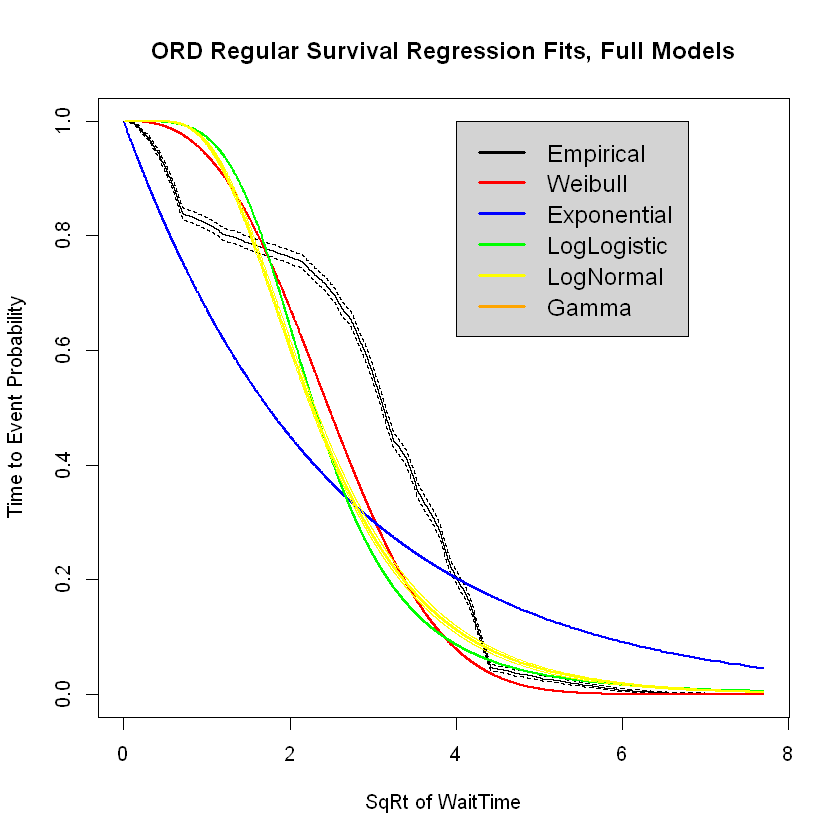

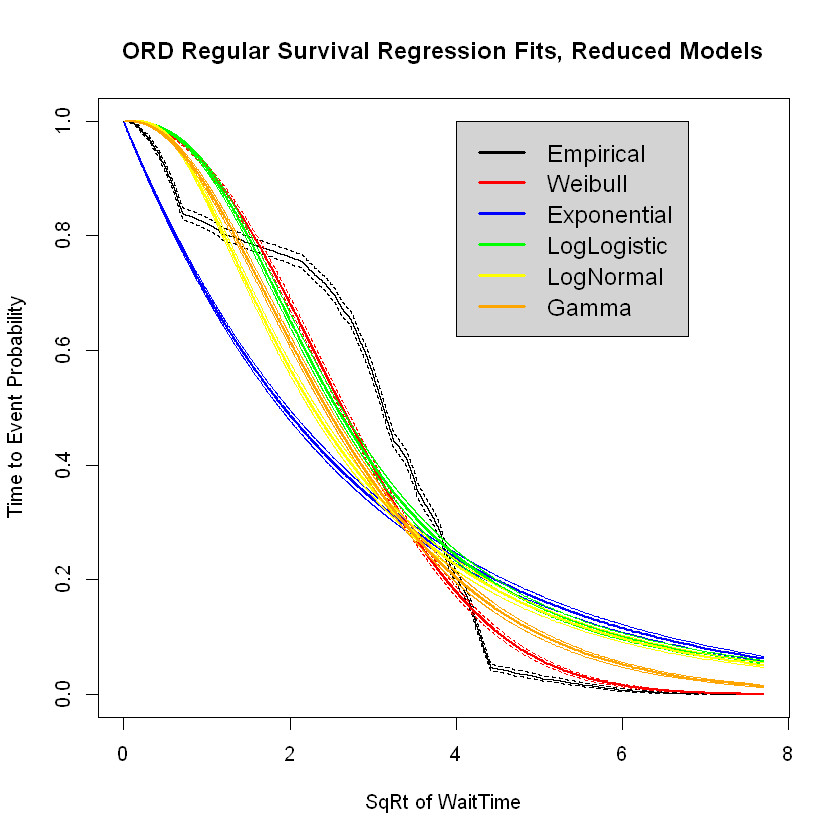

In [3]:
#!!!!!!!!! CHANGE TO R KERNEL !!!!!!!!!!!!!

#CELL NAME:  SURVIVAL ANALYSIS (TIME TO EVENT ANALYSIS) CONTINUED
#This requires cell SURVIVAL ANALYSIS (TIME TO EVENT ANALYSIS) to be run first
#DETERMINE IF PARAMETRICSURVIVAL TECHNIQUES PROVIDE A GOOD ANSWER BY AIRPORT AND LANE
#COMPARE TO RESULTS IN FITDISTPLUS


#---------------------------START JFK PRECHECK-------------------------------------

JFKPreTrainSample$Event <- 1
attach(JFKPreTrainSample)

XVars <- cbind(HourInt, HourIntSquared, HourIntCubed, AMRush, PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)

XVarsLite <- cbind(HourInt, AMRush, PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)

cat("\nJFK PRECHECK FULL MODEL\n")
XVarsPearson <- as.dist(round(cor(XVars), 2))
XVarsPearson

SurvWeibull <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='weibull')
SurvWeibull2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="weibull")
SurvExponential <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='exponential')
SurvExponential2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="exponential")
SurvLogLogistic <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='loglogistic')
SurvLogLogistic2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="llogis")
SurvLogNormal <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='lognormal')
SurvLogNormal2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="lnorm")
#SurvGamma2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="gamma")

cat("\nJFK PRECHECK FULL MODEL\n")
summary(SurvWeibull)
summary(SurvExponential)
summary(SurvLogLogistic)
summary(SurvLogNormal)
SurvWeibull2
SurvExponential2
SurvLogLogistic2
SurvLogNormal2
#SurvGamma2

SurvWeibullPredictedTrain <- predict(SurvWeibull, newdata=JFKPreTrainSample)
cat("\nJFK PreCheck Full Model RMSE of Training Data Weibull Survival\n")
print(sqrt(mean((JFKPreTrainSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTrain)^2)))
SurvWeibullPredictedTest <- predict(SurvWeibull, newdata=JFKPreTestSample)
cat("\nJFK PreCheck Full Model RMSE of Test Data Weibull Survival\n")
print(sqrt(mean((JFKPreTestSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTest)^2)))

plot(SurvWeibull2, main="JFK PreCheck Survival Regression Fits, Full Models", xlab="SqRt of WaitTime",
    ylab="Time to Event Probability")
lines(SurvExponential2, col="blue", lwd.ci=1, lty.ci=1)
lines(SurvLogLogistic2, col="green", lwd.ci=1, lty.ci=1)
lines(SurvLogNormal2, col="yellow", lwd.ci=1, lty.ci=1)
#lines(SurvGamma2, col="orange", lwd.ci=1, lty.ci=1)
legend(2, 1, legend=c("Empirical", "Weibull", "Exponential", "LogLogistic", "LogNormal", "Gamma"), 
      col=c("black", "red", "blue", "green", "yellow", "orange"), lty=1, cex=1.2, lwd=3, bg="lightgrey")

SurvWeibull3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='weibull')
SurvWeibull4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="weibull")
SurvExponential3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='exponential')
SurvExponential4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="exponential")
SurvLogLogistic3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='loglogistic')
SurvLogLogistic4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="llogis")
SurvLogNormal3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='lognormal')
SurvLogNormal4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="lnorm")
SurvGamma4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="gamma")

cat("\nJFK PRECHECK REDUCED MODEL\n")
summary(SurvWeibull3)
summary(SurvExponential3)
summary(SurvLogLogistic3)
summary(SurvLogNormal3)
SurvWeibull4
SurvExponential4
SurvLogLogistic4
SurvLogNormal4
SurvGamma4

SurvWeibullPredictedTrain3 <- predict(SurvWeibull3, newdata=JFKPreTrainSample)
cat("\nJFK PreCheck Reduced Model RMSE of Training Data Weibull Survival\n")
print(sqrt(mean((JFKPreTrainSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTrain3)^2)))
SurvWeibullPredictedTest3 <- predict(SurvWeibull3, newdata=JFKPreTestSample)
cat("\nJFK PreCheck Reduced Model RMSE of Test Data Weibull Survival\n")
print(sqrt(mean((JFKPreTestSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTest3)^2)))

plot(SurvWeibull4, main="JFK PreCheck Survival Regression Fits, Reduced Models", xlab="SqRt of WaitTime",
    ylab="Time to Event Probability")
lines(SurvExponential4, col="blue", lwd.ci=1, lty.ci=1)
lines(SurvLogLogistic4, col="green", lwd.ci=1, lty.ci=1)
lines(SurvLogNormal4, col="yellow", lwd.ci=1, lty.ci=1)
lines(SurvGamma4, col="orange", lwd.ci=1, lty.ci=1)
legend(2, 1, legend=c("Empirical", "Weibull", "Exponential", "LogLogistic", "LogNormal", "Gamma"), 
      col=c("black", "red", "blue", "green", "yellow", "orange"), lty=1, cex=1.2, lwd=3, bg="lightgrey")

detach(JFKPreTrainSample)

#----------------------------------END JFK PRECHECK-------------------------------


#---------------------------START JFK Regular-------------------------------------

JFKRegTrainSample$Event <- 1
attach(JFKRegTrainSample)

XVars <- cbind(HourInt, HourIntSquared, HourIntCubed, AMRush, PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)

XVarsLite <- cbind(HourInt, AMRush, PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)

cat("\nJFK Regular FULL MODEL\n")
XVarsPearson <- as.dist(round(cor(XVars), 2))
XVarsPearson

SurvWeibull <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='weibull')
SurvWeibull2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="weibull")
SurvExponential <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='exponential')
SurvExponential2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="exponential")
SurvLogLogistic <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='loglogistic')
SurvLogLogistic2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="llogis")
SurvLogNormal <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='lognormal')
SurvLogNormal2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="lnorm")
#SurvGamma2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="gamma")

cat("\nJFK Regular FULL MODEL\n")
summary(SurvWeibull)
summary(SurvExponential)
summary(SurvLogLogistic)
summary(SurvLogNormal)
SurvWeibull2
SurvExponential2
SurvLogLogistic2
SurvLogNormal2
#SurvGamma2

SurvLogLogisticPredictedTrain <- predict(SurvLogLogistic, newdata=JFKRegTrainSample)
cat("\nJFK Regular Full Model RMSE of Training Data LogLogistic Survival\n")
print(sqrt(mean((JFKRegTrainSample$WaitTimeContinuousSqRt-SurvLogLogisticPredictedTrain)^2)))
SurvLogLogisticPredictedTest <- predict(SurvLogLogistic, newdata=JFKRegTestSample)
cat("\nJFK Regular Full Model RMSE of Test Data LogLogistic Survival\n")
print(sqrt(mean((JFKRegTestSample$WaitTimeContinuousSqRt-SurvLogLogisticPredictedTest)^2)))

plot(SurvWeibull2, main="JFK Regular Survival Regression Fits, Full Models", xlab="SqRt of WaitTime",
    ylab="Time to Event Probability")
lines(SurvExponential2, col="blue", lwd.ci=1, lty.ci=1)
lines(SurvLogLogistic2, col="green", lwd.ci=1, lty.ci=1)
lines(SurvLogNormal2, col="yellow", lwd.ci=1, lty.ci=1)
#lines(SurvGamma2, col="orange", lwd.ci=1, lty.ci=1)
legend(4, 1, legend=c("Empirical", "Weibull", "Exponential", "LogLogistic", "LogNormal", "Gamma"), 
      col=c("black", "red", "blue", "green", "yellow", "orange"), lty=1, cex=1.2, lwd=3, bg="lightgrey")

SurvWeibull3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='weibull')
SurvWeibull4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="weibull")
SurvExponential3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='exponential')
SurvExponential4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="exponential")
SurvLogLogistic3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='loglogistic')
SurvLogLogistic4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="llogis")
SurvLogNormal3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='lognormal')
SurvLogNormal4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="lnorm")
SurvGamma4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="gamma")

cat("\nJFK Regular REDUCED MODEL\n")
summary(SurvWeibull3)
summary(SurvExponential3)
summary(SurvLogLogistic3)
summary(SurvLogNormal3)
SurvWeibull4
SurvExponential4
SurvLogLogistic4
SurvLogNormal4
SurvGamma4

SurvWeibullPredictedTrain3 <- predict(SurvWeibull3, newdata=JFKRegTrainSample)
cat("\nJFK Regular Reduced Model RMSE of Training Data Weibull Survival\n")
print(sqrt(mean((JFKRegTrainSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTrain3)^2)))
SurvWeibullPredictedTest3 <- predict(SurvWeibull3, newdata=JFKRegTestSample)
cat("\nJFK Regular Reduced Model RMSE of Test Data Weibull Survival\n")
print(sqrt(mean((JFKRegTestSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTest3)^2)))

plot(SurvWeibull4, main="JFK Regular Survival Regression Fits, Reduced Models", xlab="SqRt of WaitTime",
    ylab="Time to Event Probability")
lines(SurvExponential4, col="blue", lwd.ci=1, lty.ci=1)
lines(SurvLogLogistic4, col="green", lwd.ci=1, lty.ci=1)
lines(SurvLogNormal4, col="yellow", lwd.ci=1, lty.ci=1)
lines(SurvGamma4, col="orange", lwd.ci=1, lty.ci=1)
legend(4, 1, legend=c("Empirical", "Weibull", "Exponential", "LogLogistic", "LogNormal", "Gamma"), 
      col=c("black", "red", "blue", "green", "yellow", "orange"), lty=1, cex=1.2, lwd=3, bg="lightgrey")

detach(JFKRegTrainSample)

#----------------------------------END JFK Regular-------------------------------


#---------------------------START EWR PRECHECK-------------------------------------

EWRPreTrainSample$Event <- 1
attach(EWRPreTrainSample)

XVars <- cbind(HourInt, HourIntSquared, HourIntCubed, AMRush, PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)

XVarsLite <- cbind(HourInt, AMRush, PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)

cat("\nEWR PRECHECK FULL MODEL\n")
XVarsPearson <- as.dist(round(cor(XVars), 2))
XVarsPearson

SurvWeibull <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='weibull')
SurvWeibull2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="weibull")
SurvExponential <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='exponential')
SurvExponential2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="exponential")
SurvLogLogistic <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='loglogistic')
SurvLogLogistic2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="llogis")
SurvLogNormal <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='lognormal')
SurvLogNormal2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="lnorm")
#SurvGamma2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="gamma")

cat("\nEWR PRECHECK FULL MODEL\n")
summary(SurvWeibull)
summary(SurvExponential)
summary(SurvLogLogistic)
summary(SurvLogNormal)
SurvWeibull2
SurvExponential2
SurvLogLogistic2
SurvLogNormal2
#SurvGamma2

SurvWeibullPredictedTrain <- predict(SurvWeibull, newdata=EWRPreTrainSample)
cat("\nEWR PreCheck Full Model RMSE of Training Data Weibull Survival\n")
print(sqrt(mean((EWRPreTrainSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTrain)^2)))
SurvWeibullPredictedTest <- predict(SurvWeibull, newdata=EWRPreTestSample)
cat("\nEWR PreCheck Full Model RMSE of Test Data Weibull Survival\n")
print(sqrt(mean((EWRPreTestSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTest)^2)))

plot(SurvWeibull2, main="EWR PreCheck Survival Regression Fits, Full Models", xlab="SqRt of WaitTime",
    ylab="Time to Event Probability")
lines(SurvExponential2, col="blue", lwd.ci=1, lty.ci=1)
lines(SurvLogLogistic2, col="green", lwd.ci=1, lty.ci=1)
lines(SurvLogNormal2, col="yellow", lwd.ci=1, lty.ci=1)
#lines(SurvGamma2, col="orange", lwd.ci=1, lty.ci=1)
legend(2, 1, legend=c("Empirical", "Weibull", "Exponential", "LogLogistic", "LogNormal", "Gamma"), 
      col=c("black", "red", "blue", "green", "yellow", "orange"), lty=1, cex=1.2, lwd=3, bg="lightgrey")

SurvWeibull3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='weibull')
SurvWeibull4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="weibull")
SurvExponential3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='exponential')
SurvExponential4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="exponential")
SurvLogLogistic3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='loglogistic')
SurvLogLogistic4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="llogis")
SurvLogNormal3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='lognormal')
SurvLogNormal4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="lnorm")
SurvGamma4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="gamma")

cat("\nEWR PRECHECK REDUCED MODEL\n")
summary(SurvWeibull3)
summary(SurvExponential3)
summary(SurvLogLogistic3)
summary(SurvLogNormal3)
SurvWeibull4
SurvExponential4
SurvLogLogistic4
SurvLogNormal4
SurvGamma4

SurvWeibullPredictedTrain3 <- predict(SurvWeibull3, newdata=EWRPreTrainSample)
cat("\nEWR PreCheck Reduced Model RMSE of Training Data Weibull Survival\n")
print(sqrt(mean((EWRPreTrainSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTrain3)^2)))
SurvWeibullPredictedTest3 <- predict(SurvWeibull3, newdata=EWRPreTestSample)
cat("\nEWR PreCheck Reduced Model RMSE of Test Data Weibull Survival\n")
print(sqrt(mean((EWRPreTestSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTest3)^2)))

plot(SurvWeibull4, main="EWR PreCheck Survival Regression Fits, Reduced Models", xlab="SqRt of WaitTime",
    ylab="Time to Event Probability")
lines(SurvExponential4, col="blue", lwd.ci=1, lty.ci=1)
lines(SurvLogLogistic4, col="green", lwd.ci=1, lty.ci=1)
lines(SurvLogNormal4, col="yellow", lwd.ci=1, lty.ci=1)
lines(SurvGamma4, col="orange", lwd.ci=1, lty.ci=1)
legend(2, 1, legend=c("Empirical", "Weibull", "Exponential", "LogLogistic", "LogNormal", "Gamma"), 
      col=c("black", "red", "blue", "green", "yellow", "orange"), lty=1, cex=1.2, lwd=3, bg="lightgrey")

detach(EWRPreTrainSample)

#----------------------------------END EWR PRECHECK-------------------------------


#---------------------------START EWR Regular-------------------------------------

EWRRegTrainSample$Event <- 1
attach(EWRRegTrainSample)

XVars <- cbind(HourInt, HourIntSquared, HourIntCubed, AMRush, PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)

XVarsLite <- cbind(HourInt, AMRush, PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)

cat("\nEWR Regular FULL MODEL\n")
XVarsPearson <- as.dist(round(cor(XVars), 2))
XVarsPearson

SurvWeibull <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='weibull')
SurvWeibull2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="weibull")
SurvExponential <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='exponential')
SurvExponential2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="exponential")
SurvLogLogistic <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='loglogistic')
SurvLogLogistic2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="llogis")
SurvLogNormal <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='lognormal')
SurvLogNormal2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="lnorm")
SurvGamma2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="gamma")

cat("\nEWR Regular FULL MODEL\n")
summary(SurvWeibull)
summary(SurvExponential)
summary(SurvLogLogistic)
summary(SurvLogNormal)
SurvWeibull2
SurvExponential2
SurvLogLogistic2
SurvLogNormal2
SurvGamma2

SurvLogLogisticPredictedTrain <- predict(SurvLogLogistic, newdata=EWRRegTrainSample)
cat("\nEWR Regular Full Model RMSE of Training Data LogLogistic Survival\n")
print(sqrt(mean((EWRRegTrainSample$WaitTimeContinuousSqRt-SurvLogLogisticPredictedTrain)^2)))
SurvLogLogisticPredictedTest <- predict(SurvLogLogistic, newdata=EWRRegTestSample)
cat("\nEWR Regular Full Model RMSE of Test Data LogLogistic Survival\n")
print(sqrt(mean((EWRRegTestSample$WaitTimeContinuousSqRt-SurvLogLogisticPredictedTest)^2)))

plot(SurvWeibull2, main="EWR Regular Survival Regression Fits, Full Models", xlab="SqRt of WaitTime",
    ylab="Time to Event Probability")
lines(SurvExponential2, col="blue", lwd.ci=1, lty.ci=1)
lines(SurvLogLogistic2, col="green", lwd.ci=1, lty.ci=1)
lines(SurvLogNormal2, col="yellow", lwd.ci=1, lty.ci=1)
lines(SurvGamma2, col="orange", lwd.ci=1, lty.ci=1)
legend(4, 1, legend=c("Empirical", "Weibull", "Exponential", "LogLogistic", "LogNormal", "Gamma"), 
      col=c("black", "red", "blue", "green", "yellow", "orange"), lty=1, cex=1.2, lwd=3, bg="lightgrey")

SurvWeibull3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='weibull')
SurvWeibull4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="weibull")
SurvExponential3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='exponential')
SurvExponential4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="exponential")
SurvLogLogistic3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='loglogistic')
SurvLogLogistic4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="llogis")
SurvLogNormal3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='lognormal')
SurvLogNormal4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="lnorm")
SurvGamma4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="gamma")

cat("\nEWR Regular REDUCED MODEL\n")
summary(SurvWeibull3)
summary(SurvExponential3)
summary(SurvLogLogistic3)
summary(SurvLogNormal3)
SurvWeibull4
SurvExponential4
SurvLogLogistic4
SurvLogNormal4
SurvGamma4

SurvWeibullPredictedTrain3 <- predict(SurvWeibull3, newdata=EWRRegTrainSample)
cat("\nEWR Regular Reduced Model RMSE of Training Data Weibull Survival\n")
print(sqrt(mean((EWRRegTrainSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTrain3)^2)))
SurvWeibullPredictedTest3 <- predict(SurvWeibull3, newdata=EWRRegTestSample)
cat("\nEWR Regular Reduced Model RMSE of Test Data Weibull Survival\n")
print(sqrt(mean((EWRRegTestSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTest3)^2)))

plot(SurvWeibull4, main="EWR Regular Survival Regression Fits, Reduced Models", xlab="SqRt of WaitTime",
    ylab="Time to Event Probability")
lines(SurvExponential4, col="blue", lwd.ci=1, lty.ci=1)
lines(SurvLogLogistic4, col="green", lwd.ci=1, lty.ci=1)
lines(SurvLogNormal4, col="yellow", lwd.ci=1, lty.ci=1)
lines(SurvGamma4, col="orange", lwd.ci=1, lty.ci=1)
legend(4, 1, legend=c("Empirical", "Weibull", "Exponential", "LogLogistic", "LogNormal", "Gamma"), 
      col=c("black", "red", "blue", "green", "yellow", "orange"), lty=1, cex=1.2, lwd=3, bg="lightgrey")

detach(EWRRegTrainSample)

#----------------------------------END EWR Regular-------------------------------



#---------------------------START ORD PRECHECK-------------------------------------

ORDPreTrainSample$Event <- 1
attach(ORDPreTrainSample)

XVars <- cbind(HourInt, HourIntSquared, HourIntCubed, AMRush, PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)

XVarsLite <- cbind(HourInt, AMRush, PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)

cat("\nORD PRECHECK FULL MODEL\n")
XVarsPearson <- as.dist(round(cor(XVars), 2))
XVarsPearson

SurvWeibull <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='weibull')
SurvWeibull2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="weibull")
SurvExponential <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='exponential')
SurvExponential2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="exponential")
SurvLogLogistic <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='loglogistic')
SurvLogLogistic2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="llogis")
SurvLogNormal <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='lognormal')
SurvLogNormal2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="lnorm")
#SurvGamma2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="gamma")

cat("\nORD PRECHECK FULL MODEL\n")
summary(SurvWeibull)
summary(SurvExponential)
summary(SurvLogLogistic)
summary(SurvLogNormal)
SurvWeibull2
SurvExponential2
SurvLogLogistic2
SurvLogNormal2
#SurvGamma2

SurvWeibullPredictedTrain <- predict(SurvWeibull, newdata=ORDPreTrainSample)
cat("\nORD PreCheck Full Model RMSE of Training Data Weibull Survival\n")
print(sqrt(mean((ORDPreTrainSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTrain)^2)))
SurvWeibullPredictedTest <- predict(SurvWeibull, newdata=ORDPreTestSample)
cat("\nORD PreCheck Full Model RMSE of Test Data Weibull Survival\n")
print(sqrt(mean((ORDPreTestSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTest)^2)))

plot(SurvWeibull2, main="ORD PreCheck Survival Regression Fits, Full Models", xlab="SqRt of WaitTime",
    ylab="Time to Event Probability")
lines(SurvExponential2, col="blue", lwd.ci=1, lty.ci=1)
lines(SurvLogLogistic2, col="green", lwd.ci=1, lty.ci=1)
lines(SurvLogNormal2, col="yellow", lwd.ci=1, lty.ci=1)
#lines(SurvGamma2, col="orange", lwd.ci=1, lty.ci=1)
legend(2, 1, legend=c("Empirical", "Weibull", "Exponential", "LogLogistic", "LogNormal", "Gamma"), 
      col=c("black", "red", "blue", "green", "yellow", "orange"), lty=1, cex=1.2, lwd=3, bg="lightgrey")

SurvWeibull3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='weibull')
SurvWeibull4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="weibull")
SurvExponential3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='exponential')
SurvExponential4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="exponential")
SurvLogLogistic3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='loglogistic')
SurvLogLogistic4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="llogis")
SurvLogNormal3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='lognormal')
SurvLogNormal4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="lnorm")
SurvGamma4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="gamma")

cat("\nORD PRECHECK REDUCED MODEL\n")
summary(SurvWeibull3)
summary(SurvExponential3)
summary(SurvLogLogistic3)
summary(SurvLogNormal3)
SurvWeibull4
SurvExponential4
SurvLogLogistic4
SurvLogNormal4
SurvGamma4

SurvWeibullPredictedTrain3 <- predict(SurvWeibull3, newdata=ORDPreTrainSample)
cat("\nORD PreCheck Reduced Model RMSE of Training Data Weibull Survival\n")
print(sqrt(mean((ORDPreTrainSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTrain3)^2)))
SurvWeibullPredictedTest3 <- predict(SurvWeibull3, newdata=ORDPreTestSample)
cat("\nORD PreCheck Reduced Model RMSE of Test Data Weibull Survival\n")
print(sqrt(mean((ORDPreTestSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTest3)^2)))

plot(SurvWeibull4, main="ORD PreCheck Survival Regression Fits, Reduced Models", xlab="SqRt of WaitTime",
    ylab="Time to Event Probability")
lines(SurvExponential4, col="blue", lwd.ci=1, lty.ci=1)
lines(SurvLogLogistic4, col="green", lwd.ci=1, lty.ci=1)
lines(SurvLogNormal4, col="yellow", lwd.ci=1, lty.ci=1)
lines(SurvGamma4, col="orange", lwd.ci=1, lty.ci=1)
legend(2, 1, legend=c("Empirical", "Weibull", "Exponential", "LogLogistic", "LogNormal", "Gamma"), 
      col=c("black", "red", "blue", "green", "yellow", "orange"), lty=1, cex=1.2, lwd=3, bg="lightgrey")

detach(ORDPreTrainSample)

#----------------------------------END ORD PRECHECK-------------------------------


#---------------------------START ORD Regular-------------------------------------

ORDRegTrainSample$Event <- 1
attach(ORDRegTrainSample)

XVars <- cbind(HourInt, HourIntSquared, HourIntCubed, AMRush, PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)

XVarsLite <- cbind(HourInt, AMRush, PMRush, Jan, Feb, Mar, Apr, May, 
                        Jun, Jul, Aug, Sep, Mon, Fri, Sat, Sun)

cat("\nORD Regular FULL MODEL\n")
XVarsPearson <- as.dist(round(cor(XVars), 2))
XVarsPearson

SurvWeibull <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='weibull')
SurvWeibull2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="weibull")
SurvExponential <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='exponential')
SurvExponential2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="exponential")
SurvLogLogistic <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='loglogistic')
SurvLogLogistic2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="llogis")
SurvLogNormal <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist='lognormal')
SurvLogNormal2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="lnorm")
#SurvGamma2 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVars, dist="gamma")

cat("\nORD Regular FULL MODEL\n")
summary(SurvWeibull)
summary(SurvExponential)
summary(SurvLogLogistic)
summary(SurvLogNormal)
SurvWeibull2
SurvExponential2
SurvLogLogistic2
SurvLogNormal2
#SurvGamma2

SurvLogLogisticPredictedTrain <- predict(SurvLogLogistic, newdata=ORDRegTrainSample)
cat("\nORD Regular Full Model RMSE of Training Data LogLogistic Survival\n")
print(sqrt(mean((ORDRegTrainSample$WaitTimeContinuousSqRt-SurvLogLogisticPredictedTrain)^2)))
SurvLogLogisticPredictedTest <- predict(SurvLogLogistic, newdata=ORDRegTestSample)
cat("\nORD Regular Full Model RMSE of Test Data LogLogistic Survival\n")
print(sqrt(mean((ORDRegTestSample$WaitTimeContinuousSqRt-SurvLogLogisticPredictedTest)^2)))

plot(SurvWeibull2, main="ORD Regular Survival Regression Fits, Full Models", xlab="SqRt of WaitTime",
    ylab="Time to Event Probability")
lines(SurvExponential2, col="blue", lwd.ci=1, lty.ci=1)
lines(SurvLogLogistic2, col="green", lwd.ci=1, lty.ci=1)
lines(SurvLogNormal2, col="yellow", lwd.ci=1, lty.ci=1)
#lines(SurvGamma2, col="orange", lwd.ci=1, lty.ci=1)
legend(4, 1, legend=c("Empirical", "Weibull", "Exponential", "LogLogistic", "LogNormal", "Gamma"), 
      col=c("black", "red", "blue", "green", "yellow", "orange"), lty=1, cex=1.2, lwd=3, bg="lightgrey")

SurvWeibull3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='weibull')
SurvWeibull4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="weibull")
SurvExponential3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='exponential')
SurvExponential4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="exponential")
SurvLogLogistic3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='loglogistic')
SurvLogLogistic4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="llogis")
SurvLogNormal3 <- survreg(Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist='lognormal')
SurvLogNormal4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="lnorm")
SurvGamma4 <- flexsurvreg(formula = Surv(WaitTimeContinuousSqRt, Event) ~ XVarsLite, dist="gamma")

cat("\nORD Regular REDUCED MODEL\n")
summary(SurvWeibull3)
summary(SurvExponential3)
summary(SurvLogLogistic3)
summary(SurvLogNormal3)
SurvWeibull4
SurvExponential4
SurvLogLogistic4
SurvLogNormal4
SurvGamma4

SurvWeibullPredictedTrain3 <- predict(SurvWeibull3, newdata=ORDRegTrainSample)
cat("\nORD Regular Reduced Model RMSE of Training Data Weibull Survival\n")
print(sqrt(mean((ORDRegTrainSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTrain3)^2)))
SurvWeibullPredictedTest3 <- predict(SurvWeibull3, newdata=ORDRegTestSample)
cat("\nORD Regular Reduced Model RMSE of Test Data Weibull Survival\n")
print(sqrt(mean((ORDRegTestSample$WaitTimeContinuousSqRt-SurvWeibullPredictedTest3)^2)))

plot(SurvWeibull4, main="ORD Regular Survival Regression Fits, Reduced Models", xlab="SqRt of WaitTime",
    ylab="Time to Event Probability")
lines(SurvExponential4, col="blue", lwd.ci=1, lty.ci=1)
lines(SurvLogLogistic4, col="green", lwd.ci=1, lty.ci=1)
lines(SurvLogNormal4, col="yellow", lwd.ci=1, lty.ci=1)
lines(SurvGamma4, col="orange", lwd.ci=1, lty.ci=1)
legend(4, 1, legend=c("Empirical", "Weibull", "Exponential", "LogLogistic", "LogNormal", "Gamma"), 
      col=c("black", "red", "blue", "green", "yellow", "orange"), lty=1, cex=1.2, lwd=3, bg="lightgrey")

detach(ORDRegTrainSample)

#----------------------------------END ORD Regular-------------------------------










